In [1]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import sqlite3
import matplotlib.pyplot as plt
import ast
import math
import time
from datetime import datetime

In [2]:

#eval(readin_angle.loc[0].values[0])




# read in db flyProjects to get experimetns at 60°


In [3]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustProjects_19_11_28.db")
query2 = "SELECT  post0,exp,replicate, nStimuli  FROM projects;" #
readin_angle = pd.read_sql_query(query2,conn)

readin_angle['index'] = list(range(len(readin_angle.index)))



#readin_angle.head(10)

#['position','angle','distance']

dist_read = False
print('readin_anglekeys',readin_angle.keys())
#60 degree angle
angle60=(math.pi/180*60)
angle30=(math.pi/180*30)
angle45=(math.pi/180*45)
angle180=(math.pi)

a=True
#p= pd.DataFrame(readin_angle,l)#.T.to_dict()
for i in range(0,250):
    
    #(readin_angle[readin_angle['index'] == i])
    #250 diff conditions from which to pick available
    
    
    
    if (ast.literal_eval(readin_angle.loc[i].values[0])) != None:
        ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])
        
        if dist_read == False:
            dist = (ast.literal_eval(readin_angle.loc[i].values[0])['distance'])
            dist_read = True
        if readin_angle['exp'][i] <10: 
            #only experiments <10 are the exp with two post condition, >10 are 3 post cond
            #print(readin_angle['exp'][i])
            #if 
            if ang == angle45 and readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                angle_used = ang
                    #selects for 60° cond and without nstim==0 or ==4 (controls with one post cond)
                    #print(i,ang)
                    #readin_angle[i]
                    #del tab
                    #print(readin_angle[readin_angle['index'] == i])
                    #Liste2=Liste2.append(readin_angle[readin_angle['index'] == i])
                print(ast.literal_eval(readin_angle.loc[i].values[0])['position'])
                tab=(readin_angle[readin_angle['index'] == i])
                if a==False:
                    tab2=tab2.append(tab,ignore_index=True)
                if a==True:
                    #tab2 contains list of exp,repl,nstim at certain angle 
                    tab2=tab
                    a=False
                if readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                    #print(readin_angle['nStimuli'][i])
                    pass
  
                
#readin_angle
#ang

#print(tab2.count())
print('tab2keys',tab2.keys())
print(dist)
print(ang, angle_used)
tab2



('readin_anglekeys', Index([u'post0', u'exp', u'replicate', u'nStimuli', u'index'], dtype='object'))
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2

,post0,exp,replicate,nStimuli,index
0,"{'position': (1.2246467991473532e-16, 2.0), 'a...",0,0,1,1
1,"{'position': (1.2246467991473532e-16, 2.0), 'a...",0,1,2,7
2,"{'position': (1.2246467991473532e-16, 2.0), 'a...",0,2,3,13
3,"{'position': (1.2246467991473532e-16, 2.0), 'a...",0,3,2,17
4,"{'position': (1.2246467991473532e-16, 2.0), 'a...",0,4,1,21
5,"{'position': (-1.414213562373095, 1.4142135623...",1,0,1,26
6,"{'position': (-1.414213562373095, 1.4142135623...",1,1,2,32
7,"{'position': (-1.414213562373095, 1.4142135623...",1,2,2,37
8,"{'position': (-1.414213562373095, 1.4142135623...",1,3,3,43
9,"{'position': (-1.414213562373095, 1.4142135623...",1,4,2,47


# EXPERIMENT ID READIN

In [4]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustExperiments_19_11_28.db")

query = "SELECT exp, replicate, date,tStart, expId FROM experiments;"
readin_id = pd.read_sql_query(query,conn)
print(readin_id.keys())
readin_id=readin_id.assign(nStimuli = 5)
#posi=(ast.literal_eval(readin_angle.loc[0].values[0])['position'])
#posi=0
readin_id=readin_id.assign(position_post0_x = 1.0)
readin_id=readin_id.assign(position_post0_y = 1.0)

#*****************************dont read in as string, but as dict!!!!**********************************

#ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

for i in range(0,len(readin_id.index)):
    #iterate through 40 rows of readin_id
    
    #kombi exp+ replicate in tab2 abgleichen und nStimuli rausschreiben!)
    #print(tab2['exp'][i])
    #pass

    b=readin_id['exp'][i]
    c=readin_id['replicate'][i]
    e=readin_id['date'][i]
    #tstart=readin_id['tStart'][i]
 
    for d in range(0,50):
        #iterate through 50 rows of tab2
        if tab2['exp'][d]==b and tab2['replicate'][d]==c:
            #print(tab2['exp'][d], tab2['replicate'][d], tab2['nStimuli'][d]  )
            
            #print(tab2['nStimuli'][d])
            f=tab2['nStimuli'][d]
            #g=tab2['post0']
            g=(ast.literal_eval(tab2.loc[d].values[0])['position'])
            h=round(g[0], 2)
            k=round(g[1], 2)
            #print(g.keys())
            #print(h,k)
            readin_id['nStimuli'][i]=f
            
            
            
            readin_id['position_post0_x'][i]=h
            readin_id['position_post0_y'][i]=k
    
    
#readin_id = readin_id[readin_id['exp'] < 10]

#pick exp of a specific date:
#readin_id = readin_id[readin_id['date'] == '2019-12-19']
readin_id.reset_index(drop=True, inplace=True) 
#exper_date='2019-12-12'


   
    
    
#df4 = df[df['nStimuli'] == 4]
#df4.head()
        
            
'''for i in range(0,40):
    path = (directory + readin_id['expId'][i] + filename)
    #print(path)
    
    df = pd.read_csv(path)
    #extends list to experimentID column
    df=df.assign(id = (readin_id['expId'][i]))
    df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']
    
    if i == 0:
        df3=df
        df3.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']

    if i > 0:
        df3=df3.append(df, ignore_index=True)'''

            

readin_id

#40 expIDs available

Index([u'exp', u'replicate', u'date', u'tStart', u'expId'], dtype='object')


/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,exp,replicate,date,tStart,expId,nStimuli,position_post0_x,position_post0_y
0,0,1,2019-11-28,08:41,fea86966-c7a8-49f5-bf93-f8a38453e875,2,0.00,2.00
1,0,3,2019-11-28,09:49,32d1f550-279f-4c2a-8456-65483875ad86,2,0.00,2.00
2,0,0,2019-11-28,10:53,a6e70613-9c6b-4417-bc3a-ff0ce95a1ee5,1,0.00,2.00
3,1,1,2019-11-28,11:49,bb9e6a9d-67e1-40de-9f4c-464da0a824ba,2,-1.41,1.41
4,1,2,2019-11-28,14:43,4c9a6d29-ac3d-4ed8-a67d-f5a75d5cec9c,2,-1.41,1.41
5,2,1,2019-11-29,10:17,353adab2-d51f-4885-adba-508ba2cac467,3,1.41,-1.41
6,3,1,2019-11-29,13:13,3a521430-7aa6-412b-8d00-62524874d36a,1,1.41,-1.41
7,3,3,2019-11-29,13:59,e3f84ff4-d4b5-415b-9527-5ac834f7cba4,3,1.41,-1.41
8,4,4,2019-11-29,14:43,cd75759c-29e2-4ea9-867e-898ee8a02978,3,-0.00,-2.00
9,2,1,2019-11-29,16:04,fc408072-8c38-4393-83a9-57eade5c057f,3,1.41,-1.41


# csv

In [5]:
directory = '/home/bianca/Documents/github/locustVR/databases/data_collection/'
filename = '/results.csv'
counting=0
initialise = False
#for i in readin_id.index:
for i in range (0,(len(readin_id))):
#for i in range(0,1):
    #iterate through 20 leftover exp ids in readin_id that have 2 post cond, no control, only 60°
    path = (directory + readin_id['expId'][i] + filename)
    tstart = readin_id['tStart'][i]
    exper_date = readin_id['date'][i]
    print('tstart',tstart)  


    print(path)
    
     
    try:
        df = pd.read_csv(path)
        print(path)
    except:
        print('***************************csv in row %d doesnt exist**********************' %(i))
    
    #extends list to experimentID column
    df=df.assign(pos0x = (readin_id['position_post0_x'][i]))
    df=df.assign(pos0y = (readin_id['position_post0_y'][i]))
    #print(readin_id['expId'][i])
    df.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
    stim = readin_id['nStimuli'][i]
    #print stim
    #for j in range(0,len(df)):
    #    if df['nStimuli'][j]== stim:
    
    #select those with stimuli according to readin_in info those with the specific angle
    df=(df.loc[df['nStimuli'] == stim])  
    print(i)
    if initialise == False:
        df3=df
        df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
        initialise = True

    
    if i > 0:
        df3=df3.append(df, ignore_index=True)
        counting+=1
    print(counting, df.count)
    

    '''df3=df
    df3=df3.append(df, ignore_index=True)
    
    df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']'''

    
print('tstart', tstart)
df3 = df3.reset_index()
df3

('tstart', u'08:41')
/home/bianca/Documents/github/locustVR/databases/data_collection/fea86966-c7a8-49f5-bf93-f8a38453e875/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/fea86966-c7a8-49f5-bf93-f8a38453e875/results.csv
0
(0, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
41874  0.000158 -0.000510  0.0     0  1200.037414         2    0.0    2.0
41875  0.000414 -0.001494  0.0     0  1200.081182         2    0.0    2.0
41876  0.000608 -0.002465  0.0     0  1200.113024         2    0.0    2.0
41877  0.000730 -0.003156  0.0     0  1200.145884         2    0.0    2.0
41878  0.000831 -0.003849  0.0     0  1200.177362         2    0.0    2.0
41879  0.000953 -0.004688  0.0     0  1200.220827         2    0.0    2.0
41880  0.001030 -0.005401  0.0     0  1200.260576         2    0.0    2.0
41881  0.001083 -0.005792  0.0     0  1200.289290         2    0.0    2.0
41882  0.001128 -0.006214  0.0     0  1200.320

/home/bianca/Documents/github/locustVR/databases/data_collection/a6e70613-9c6b-4417-bc3a-ff0ce95a1ee5/results.csv
2
(2, <bound method DataFrame.count of               x         y    z  cntr           t  nStimuli  pos0x  pos0y
1800  -0.013600 -0.027917  0.0     0   60.000634         1    0.0    2.0
1801   0.000006 -0.000061  0.0     0   68.014715         1    0.0    2.0
1802   0.000037 -0.000196  0.0     0   68.053124         1    0.0    2.0
1803   0.000134 -0.000453  0.0     0   68.095555         1    0.0    2.0
1804   0.000217 -0.000607  0.0     0   68.127073         1    0.0    2.0
1805   0.000364 -0.000853  0.0     0   68.170569         1    0.0    2.0
1806   0.000506 -0.001076  0.0     0   68.208229         1    0.0    2.0
1807   0.000632 -0.001314  0.0     0   68.256713         1    0.0    2.0
1808   0.000738 -0.001536  0.0     0   68.305040         1    0.0    2.0
1809   0.000818 -0.001739  0.0     0   68.337497         1    0.0    2.0
1810   0.000844 -0.001936  0.0     0   68.36

/home/bianca/Documents/github/locustVR/databases/data_collection/3a521430-7aa6-412b-8d00-62524874d36a/results.csv
6
(6, <bound method DataFrame.count of               x         y    z  cntr           t  nStimuli  pos0x  pos0y
6328   0.031841  0.224659  0.0     0  228.000638         1   1.41  -1.41
6329  -0.000184 -0.000026  0.0     0  236.028981         1   1.41  -1.41
6330  -0.000984 -0.000360  0.0     0  236.067244         1   1.41  -1.41
6331  -0.001612 -0.000253  0.0     0  236.111693         1   1.41  -1.41
6332  -0.001976  0.000593  0.0     0  236.156224         1   1.41  -1.41
6333  -0.002098  0.001704  0.0     0  236.190957         1   1.41  -1.41
6334  -0.002237  0.003624  0.0     0  236.225007         1   1.41  -1.41
6335  -0.002262  0.005056  0.0     0  236.256966         1   1.41  -1.41
6336  -0.002217  0.006502  0.0     0  236.290910         1   1.41  -1.41
6337  -0.002116  0.008435  0.0     0  236.326686         1   1.41  -1.41
6338  -0.002049  0.009817  0.0     0  236.36

/home/bianca/Documents/github/locustVR/databases/data_collection/fc408072-8c38-4393-83a9-57eade5c057f/results.csv
9
(9, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
45853  0.121977 -0.102133  0.0     0  1668.000734         3   1.41  -1.41
45854  0.000398 -0.000264  0.0     0  1676.027850         3   1.41  -1.41
45855  0.000981 -0.000663  0.0     0  1676.057113         3   1.41  -1.41
45856  0.001343 -0.000914  0.0     0  1676.087000         3   1.41  -1.41
45857  0.001990 -0.001414  0.0     0  1676.121272         3   1.41  -1.41
45858  0.002390 -0.001771  0.0     0  1676.151972         3   1.41  -1.41
45859  0.002736 -0.002109  0.0     0  1676.180622         3   1.41  -1.41
45860  0.003271 -0.002584  0.0     0  1676.220524         3   1.41  -1.41
45861  0.003978 -0.003119  0.0     0  1676.262117         3   1.41  -1.41
45862  0.004534 -0.003502  0.0     0  1676.293718         3   1.41  -1.41
45863  0.005078 -0.003881  0.0   

(12, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
47144  0.001425  0.001656  0.0     1  1620.000079         3   -0.0   -2.0
47145  0.001985  0.002324  0.0     1  1621.042628         3   -0.0   -2.0
47146  0.002730  0.003234  0.0     1  1621.075993         3   -0.0   -2.0
47147  0.003312  0.003891  0.0     1  1621.113747         3   -0.0   -2.0
47148  0.004099  0.004729  0.0     1  1621.148288         3   -0.0   -2.0
47149  0.004696  0.005347  0.0     1  1621.183891         3   -0.0   -2.0
47150  0.005500  0.006138  0.0     1  1621.217161         3   -0.0   -2.0
47151  0.005905  0.006515  0.0     1  1621.246214         3   -0.0   -2.0
47152  0.006704  0.007220  0.0     1  1621.282629         3   -0.0   -2.0
47153  0.007309  0.007689  0.0     1  1621.315756         3   -0.0   -2.0
47154  0.008595  0.008560  0.0     1  1621.370197         3   -0.0   -2.0
47155  0.009660  0.009228  0.0     1  1621.419470         3   -0.0   -2.0


15
(15, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
44962  0.000163 -0.000176  0.0     0  1620.032269         3  -1.41  -1.41
44963  0.000508 -0.000557  0.0     0  1620.070747         3  -1.41  -1.41
44964  0.000753 -0.000840  0.0     0  1620.104794         3  -1.41  -1.41
44965  0.001040 -0.001245  0.0     0  1620.147960         3  -1.41  -1.41
44966  0.001357 -0.001776  0.0     0  1620.193687         3  -1.41  -1.41
44967  0.001587 -0.002197  0.0     0  1620.233729         3  -1.41  -1.41
44968  0.001784 -0.002569  0.0     0  1620.270638         3  -1.41  -1.41
44969  0.001943 -0.002867  0.0     0  1620.318100         3  -1.41  -1.41
44970  0.002050 -0.003082  0.0     0  1620.355304         3  -1.41  -1.41
44971  0.002130 -0.003212  0.0     0  1620.392382         3  -1.41  -1.41
44972  0.002245 -0.003358  0.0     0  1620.432258         3  -1.41  -1.41
44973  0.002372 -0.003475  0.0     0  1620.467984         3  -1.41  -1.

/home/bianca/Documents/github/locustVR/databases/data_collection/e60266be-c44d-41a6-a3de-17518bccb1cc/results.csv
18
(18, <bound method DataFrame.count of                x         y    z  cntr            t  nStimuli  pos0x  pos0y
359340 -0.118753 -0.197483  0.0     0  1500.005422         3  -1.41   1.41
359341 -0.118753 -0.197483  0.0     0  1500.014482         3  -1.41   1.41
359342  0.000000  0.000000  0.0     0  1500.024217         3  -1.41   1.41
359343 -0.000182 -0.000181  0.0     0  1500.034182         3  -1.41   1.41
359344 -0.000362 -0.000361  0.0     0  1500.043853         3  -1.41   1.41
359345 -0.000746 -0.000723  0.0     0  1500.053533         3  -1.41   1.41
359346 -0.000746 -0.000723  0.0     0  1500.060044         3  -1.41   1.41
359347 -0.000746 -0.000723  0.0     0  1500.068903         3  -1.41   1.41
359348 -0.000948 -0.000904  0.0     0  1500.078207         3  -1.41   1.41
359349 -0.001155 -0.001084  0.0     0  1500.087874         3  -1.41   1.41
359350 -0.001155 -0.

/home/bianca/Documents/github/locustVR/databases/data_collection/88f78724-8677-471b-9340-71829d40c2bb/results.csv
20
(20, <bound method DataFrame.count of                x         y    z  cntr           t  nStimuli  pos0x  pos0y
333922  0.000306  0.000169  0.0     0   90.000001         1  -1.41  -1.41
333923  0.000307  0.000178  0.0     0   93.035267         1  -1.41  -1.41
333924  0.000307  0.000178  0.0     0   93.042964         1  -1.41  -1.41
333925  0.000307  0.000184  0.0     0   93.051942         1  -1.41  -1.41
333926  0.000307  0.000191  0.0     0   93.061676         1  -1.41  -1.41
333927  0.000307  0.000191  0.0     0   93.072032         1  -1.41  -1.41
333928  0.000307  0.000191  0.0     0   93.081862         1  -1.41  -1.41
333929  0.000307  0.000191  0.0     0   93.091856         1  -1.41  -1.41
333930  0.000307  0.000191  0.0     0   93.103317         1  -1.41  -1.41
333931  0.000308  0.000196  0.0     0   93.114949         1  -1.41  -1.41
333932  0.000308  0.000201  0.0

23
(23, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
45696 -0.000243  0.000079  0.0     1  1530.000042         3  -1.41  -1.41
45697 -0.000243  0.000079  0.0     1  1533.023506         3  -1.41  -1.41
45698 -0.000247  0.000093  0.0     1  1533.054282         3  -1.41  -1.41
45699 -0.000251  0.000125  0.0     1  1533.085077         3  -1.41  -1.41
45700 -0.000258  0.000162  0.0     1  1533.132929         3  -1.41  -1.41
45701 -0.000277  0.000180  0.0     1  1533.178775         3  -1.41  -1.41
45702 -0.000292  0.000194  0.0     1  1533.230875         3  -1.41  -1.41
45703 -0.000292  0.000201  0.0     1  1533.281773         3  -1.41  -1.41
45704 -0.000279  0.000204  0.0     1  1533.315693         3  -1.41  -1.41
45705 -0.000272  0.000206  0.0     1  1533.347690         3  -1.41  -1.41
45706 -0.000268  0.000207  0.0     1  1533.384071         3  -1.41  -1.41
45707 -0.000263  0.000208  0.0     1  1533.429527         3  -1.41  -1.

(25, <bound method DataFrame.count of               x         y    z  cntr           t  nStimuli  pos0x  pos0y
4301  -0.026856  0.004299  0.0     0   90.000013         1  -1.41   1.41
4302  -0.027053  0.004341  0.0     0   93.040153         1  -1.41   1.41
4303  -0.027943  0.004646  0.0     0   93.085641         1  -1.41   1.41
4304  -0.028591  0.004905  0.0     0   93.125121         1  -1.41   1.41
4305  -0.029077  0.005056  0.0     0   93.156978         1  -1.41   1.41
4306  -0.029547  0.005198  0.0     0   93.187802         1  -1.41   1.41
4307  -0.029996  0.005329  0.0     0   93.219692         1  -1.41   1.41
4308  -0.030393  0.005478  0.0     0   93.249534         1  -1.41   1.41
4309  -0.030731  0.005632  0.0     0   93.283476         1  -1.41   1.41
4310  -0.031020  0.005773  0.0     0   93.314472         1  -1.41   1.41
4311  -0.031416  0.005938  0.0     0   93.358380         1  -1.41   1.41
4312  -0.031611  0.006029  0.0     0   93.393641         1  -1.41   1.41
4313  -0.0317

/home/bianca/Documents/github/locustVR/databases/data_collection/67b40b07-5422-4456-b330-eed415d9d94e/results.csv
28
(28, <bound method DataFrame.count of               x         y    z  cntr           t  nStimuli  pos0x  pos0y
4553  -0.038995 -0.007329  0.0     0   90.000005         1  -1.41  -1.41
4554  -0.039853 -0.007540  0.0     0   93.046672         1  -1.41  -1.41
4555  -0.041654 -0.007978  0.0     0   93.080045         1  -1.41  -1.41
4556  -0.043023 -0.008302  0.0     0   93.116027         1  -1.41  -1.41
4557  -0.044393 -0.008633  0.0     0   93.148181         1  -1.41  -1.41
4558  -0.045721 -0.008968  0.0     0   93.176763         1  -1.41  -1.41
4559  -0.047423 -0.009382  0.0     0   93.215103         1  -1.41  -1.41
4560  -0.048677 -0.009697  0.0     0   93.250920         1  -1.41  -1.41
4561  -0.050306 -0.010064  0.0     0   93.285640         1  -1.41  -1.41
4562  -0.051523 -0.010329  0.0     0   93.314337         1  -1.41  -1.41
4563  -0.052795 -0.010621  0.0     0   93.

,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y
0,0,0.000158,-0.000510,0,0.0,1200.037414,2.0,0.0,2.0
1,1,0.000414,-0.001494,0,0.0,1200.081182,2.0,0.0,2.0
2,2,0.000608,-0.002465,0,0.0,1200.113024,2.0,0.0,2.0
3,3,0.000730,-0.003156,0,0.0,1200.145884,2.0,0.0,2.0
4,4,0.000831,-0.003849,0,0.0,1200.177362,2.0,0.0,2.0
5,5,0.000953,-0.004688,0,0.0,1200.220827,2.0,0.0,2.0
6,6,0.001030,-0.005401,0,0.0,1200.260576,2.0,0.0,2.0
7,7,0.001083,-0.005792,0,0.0,1200.289290,2.0,0.0,2.0
8,8,0.001128,-0.006214,0,0.0,1200.320142,2.0,0.0,2.0
9,9,0.001255,-0.006735,0,0.0,1200.352816,2.0,0.0,2.0



# rotate all x and y values at certain ang from experiments

In [6]:
print(angle_used*180/math.pi)

45.0


In [7]:
t0 = time.time()

#8 angles in matrices depending on starting position of post0

#change habp= half the angle between posts angle accord. to current investigation!!!:
#here for 60° angle half is 30° so pi/6
#habp = (math.pi)/6   #60
#habp = (math.pi)/12
habp = angle_used/2

#rotation angles; referring to post position:
# post1 immer ccc zu post0. also in kreisrichtung (pihalbe, pi..) drehrichtung ist hier richtig!!!
ang5_0 = 2  *math.pi - habp
ang33  = 1.75*math.pi - habp

ang0_5 = 1.5*math.pi - habp
angm33 = 1.25*math.pi - habp

angm5_0 = 1*math.pi   - habp
angm3m3 = 0.75*math.pi - habp

ang0_m5 = 0.5*math.pi - habp
ang3m3 = 0.25*math.pi - habp

def rotation(x,y, theta):
    #theta = 0
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    a,b=np.dot(R,[x,y])
    return a,b

rot=[]
dist_45 = round(((dist**2)/2)**0.5 , 2)   #square_root_2a_sq, distance at on x or y axis at 45 degree 


for l in range(len(df3)): #(): len(df3) 0,40000
    print(df3['x'][l])
    x=df3['x'][l]
    y=df3['y'][l]
    #t=df3['t'][l]
    #print(x,y)
    
    if df3['pos0x'][l]== dist and df3['pos0y'][l]== 0.00:
        theta = ang5_0
        
    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== dist_45:
        theta = ang33
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== dist:
        theta = ang0_5
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== dist_45:
        theta = angm33
        
    if df3['pos0x'][l]== -dist and df3['pos0y'][l]== 0.00:
        theta = angm5_0
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== -dist_45:
        theta = angm3m3
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== -dist:
        theta = ang0_m5
        

    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== -dist_45:
        theta = ang3m3
        
    
    #print(rotation(x,y,theta))
    rot.extend([(rotation(x,y,theta))])
    #list rot contains all rotated values at 60° from all experiments!
    #x_rot,y_rot=    rotation(x,y,theta)  
print('length df3',len(df3))
print('length of rot',len(rot))
#rot[zeile][spalte]


0.00015751
0.00041396
0.00060829
0.0007298
0.00083142
0.00095329
0.00102993
0.00108302
0.00112798
0.00125472
0.00139037
0.00155395
0.00167628
0.00173546
0.00173453
0.00181153
0.00200114
0.00227204
0.00252157
0.00260766
0.00266778
0.00277294
0.00278041
0.00259662
0.00240345
0.00216061
0.00192503
0.00171481
0.00159918
0.00161013
0.00208288
0.00245265
0.00309866
0.00348295
0.00371846
0.00376803
0.00363564
0.0033987
0.00327272
0.00316955
0.00311043
0.0032374
0.00353335
0.00374441
0.00375981
0.00397649
0.004309
0.00453007
0.00470348
0.00472146
0.00472319
0.00464669
0.0043425
0.00415528
0.00429629
0.00461903
0.00509332
0.00542526
0.00573986
0.00621442
0.00676201
0.0074215
0.00799467
0.00825604
0.00827978
0.00837438
0.00827199
0.00821058
0.00800859
0.00809431
0.00838107
0.00876976
0.00921924
0.00969888
0.01019564
0.01066289
0.01101242
0.01142658
0.01165421
0.01179358
0.01202464
0.01217147
0.01238732
0.01258038
0.01278254
0.01306963
0.01327407
0.01343931
0.01361274
0.01373811
0.01389363
0.0140

-0.16046032
-0.1617129
-0.16234122
-0.16328777
-0.16415283
-0.16497096
-0.16575591
-0.16651557
-0.16727067
-0.16805757
-0.16884354
-0.1696474
-0.17053307
-0.17138927
-0.17222327
-0.17307726
-0.17388429
-0.17472611
-0.17596487
-0.17697031
-0.17791583
-0.17882503
-0.18006358
-0.18096943
-0.18180056
-0.18259748
-0.18335051
-0.18414026
-0.18497766
-0.18585148
-0.18723707
-0.18839876
-0.18968388
-0.19065702
-0.19190779
-0.19250083
-0.19339919
-0.19439741
-0.1953201
-0.19622569
-0.19743624
-0.19845018
-0.19987083
-0.20092598
-0.20191358
-0.20287433
-0.20411167
-0.20507477
-0.20605889
-0.20704391
-0.20805647
-0.20948356
-0.21058087
-0.211638
-0.21306015
-0.2141142
-0.21479909
-0.21575662
-0.21667821
-0.21761863
-0.21924936
-0.22021131
-0.22178158
-0.2227236
-0.22365332
-0.22430388
-0.22524431
-0.22619291
-0.22713652
-0.22841011
-0.22934434
-0.23031226
-0.23135539
-0.23240811
-0.23347129
-0.23452052
-0.23586638
-0.2372192
-0.23825372
-0.23930489
-0.24031101
-0.24136159
-0.24245438
-0.2435479
-

-0.74662456
-0.74757884
-0.74887121
-0.75009303
-0.75098399
-0.75185295
-0.75271487
-0.75326526
-0.75401882
-0.75473011
-0.75518926
-0.75618085
-0.75698528
-0.75778554
-0.75854447
-0.75922108
-0.75976958
-0.76021645
-0.76062482
-0.76100616
-0.7612856
-0.76146692
-0.76159533
-0.76175144
-0.76189518
-0.76200318
-0.762278
-0.76251864
-0.76276937
-0.76309718
-0.76355856
-0.76436638
-0.76524754
-0.76589246
-0.76637955
-0.7667517
-0.76732398
-0.76772075
-0.76838296
-0.76913045
-0.76988877
-0.77067046
-0.77143112
-0.77219495
-0.77351495
-0.77438771
-0.77515064
-0.77582231
-0.77642414
-0.77699617
-0.77760391
-0.77820438
-0.77884552
-0.77947054
-0.78007588
-0.78066119
-0.78147934
-0.78228248
-0.78322812
-0.78421499
-0.78491193
-0.78598554
-0.78687186
-0.78776216
-0.7886746
-0.7895937
-0.79060261
-0.79158054
-0.79248729
-0.79364449
-0.794562
-0.79553193
-0.79714878
-0.79809312
-0.79872784
-0.7998951
-0.80072885
-0.80122608
-0.80212176
-0.80255424
-0.8034808
-0.80481395
-0.80589519
-0.80697205
-0

-1.37570508
-1.37573226
-1.37576526
-1.37585756
-1.37594373
-1.37600445
-1.37603864
-1.3760433
-1.37603584
-1.37600225
-1.37596653
-1.37596163
-1.37596653
-1.37599553
-1.376041
-1.37604538
-1.37603598
-1.37607005
-1.37607018
-1.37605329
-1.37604753
-1.3760362
-1.37597814
-1.37594931
-1.37592774
-1.37586992
-1.37581622
-1.37577154
-1.37570364
-1.37562962
-1.37556645
-1.3755026
-1.37549284
-1.37548798
-1.37547272
-1.37544578
-1.37541269
-1.37540362
-1.37545029
-1.3754421
-1.3754237
-1.37543457
-1.37542461
-1.37539704
-1.37536625
-1.3753158
-1.37527934
-1.37524041
-1.3752165
-1.37525
-1.37527427
-1.37527537
-1.37529825
-1.37530281
-1.37527805
-1.37525352
-1.37524046
-1.3752587
-1.3752417
-1.37525352
-1.3752545
-1.37524363
-1.37519356
-1.37514702
-1.37515476
-1.37519556
-1.3752431
-1.37529361
-1.37532208
-1.37535523
-1.37539083
-1.37541341
-1.37538747
-1.37537649
-1.37539461
-1.37541387
-1.37543164
-1.37545612
-1.37549435
-1.37552663
-1.37554107
-1.3755595
-1.37560166
-1.37563362
-1.375646

-2.04697352
-2.0473193
-2.04778393
-2.04813705
-2.04853259
-2.04890366
-2.04933836
-2.04966313
-2.04997213
-2.0503378
-2.05065782
-2.05087168
-2.05109763
-2.05143466
-2.05171021
-2.05198684
-2.05243097
-2.05274612
-2.05294799
-2.05311559
-2.05337507
-2.05361078
-2.05380849
-2.05410107
-2.05448211
-2.05476435
-2.05497129
-2.05522623
-2.05539
-2.05555182
-2.05579811
-2.05605634
-2.0562543
-2.0564713
-2.05677435
-2.05702297
-2.05726752
-2.05752495
-2.05786809
-2.05811865
-2.05855668
-2.05878686
-2.05896799
-2.05917135
-2.05931494
-2.05947915
-2.05960035
-2.05972306
-2.0598563
-2.06001425
-2.06018116
-2.0603397
-2.0604921
-2.06061693
-2.0607471
-2.0608806
-2.0610766
-2.06124338
-2.06137876
-2.06159806
-2.06177256
-2.06200052
-2.06222066
-2.06237247
-2.06255444
-2.06271607
-2.06294535
-2.06324554
-2.06350209
-2.06367411
-2.06377381
-2.06391724
-2.06414174
-2.0642686
-2.06437519
-2.06450618
-2.06457055
-2.06462959
-2.06468206
-2.06477381
-2.06482035
-2.06487663
-2.06498523
-2.06508198
-2.065

0.01309074
0.01329419
0.01358314
0.01387595
0.01406344
0.01424321
0.01440946
0.01458692
0.0147099
0.01487015
0.01506136
0.01526693
0.01549321
0.01572794
0.01587083
0.01604906
0.01620495
0.0163403
0.01646209
0.01656591
0.01674929
0.01685552
0.01709602
0.01724439
0.01738304
0.01750357
0.01759725
0.01765849
0.01768896
0.01773754
0.01780579
0.01791414
0.01805602
0.01828664
0.0185007
0.01871747
0.01891253
0.01907826
0.01922567
0.01934311
0.0194418
0.01954528
0.0196504
0.01981114
0.01999478
0.02020489
0.02040777
0.02060107
0.02077968
0.02094675
0.0210501
0.02119896
0.02135952
0.02159333
0.02191766
0.02221417
0.02252918
0.02280812
0.02303341
0.02330831
0.02346544
0.02360771
0.02371962
0.02381703
0.02394058
0.0240923
0.02432773
0.0245601
0.02476251
0.02495982
0.02505975
0.0251456
0.02526981
0.02538299
0.0255046
0.02566045
0.02580515
0.02591354
0.02610404
0.02630079
0.02643918
0.02657635
0.02677086
0.02691302
0.02705573
0.02719407
0.02724705
0.02734927
0.02748605
0.02765561
0.02780931
0.0280097

-0.02533799
-0.02542469
-0.02552247
-0.02564515
-0.02571165
-0.02576348
-0.02577197
-0.02577323
-0.02573124
-0.02562901
-0.02554015
-0.02549227
-0.02543148
-0.02540266
-0.02539121
-0.02540803
-0.02542662
-0.02553476
-0.02568276
-0.02564733
-0.02557592
-0.02570805
-0.02586868
-0.02591658
-0.02599724
-0.02614333
-0.02616997
-0.02615065
-0.02590686
-0.02535154
-0.0249179
-0.02434124
-0.02402018
-0.02383109
-0.02368918
-0.02327305
-0.02283169
-0.0225381
-0.02227711
-0.02210401
-0.02184716
-0.02162831
-0.02139223
-0.02105106
-0.02051266
-0.02009295
-0.0196983
-0.01931757
-0.01896344
-0.01864247
-0.01835863
-0.01820708
-0.01800572
-0.01773809
-0.01756082
-0.01742095
-0.01731834
-0.01722325
-0.01705695
-0.01699069
-0.0169421
-0.01689227
-0.01679874
-0.01673621
-0.01656624
-0.01645334
-0.016254
-0.01610839
-0.01594979
-0.01580752
-0.01566058
-0.01546829
-0.01533438
-0.01505793
-0.01487443
-0.014682
-0.0145754
-0.01442466
-0.01424017
-0.01410509
-0.01400034
-0.01393774
-0.01384219
-0.01371636
-

0.19985507
0.20104444
0.20194669
0.20286565
0.20370876
0.20452653
0.20536076
0.20623265
0.20746075
0.20840327
0.20930371
0.21018077
0.21099416
0.21175991
0.21250183
0.21326485
0.21432643
0.21512579
0.21590912
0.21668069
0.21742774
0.21810914
0.21876351
0.0
0.00023325
0.00097248
0.00178597
0.00261789
0.00341713
0.00422998
0.00504219
0.00584429
0.00661604
0.00739339
0.00850802
0.00937817
0.01027847
0.01113956
0.01168463
0.0125173
0.01360733
0.01442562
0.01521794
0.01575869
0.0166303
0.01790992
0.01883378
0.0197058
0.02054972
0.02135748
0.0221281
0.02304755
0.0234449
0.0240993
0.0244686
0.02475936
0.02496746
0.02511353
0.02522443
0.02536318
0.02563674
0.02602373
0.02647677
0.02694593
0.02744708
0.02813671
0.02884654
0.02950332
0.0301536
0.03091419
0.03129116
0.03205721
0.03258996
0.03317989
0.0338472
0.03457854
0.03538687
0.0362237
0.03704254
0.03786222
0.03868511
0.03946985
0.04023313
0.0410293
0.04190122
0.04317444
0.04447844
0.04571797
0.04662144
0.04752691
0.04840142
0.0496378
0.05063

0.22973061
0.22926616
0.22880847
0.22818244
0.22772597
0.22707665
0.2265698
0.2261025
0.22566488
0.22525216
0.22483225
0.22440541
0.22400322
0.22346991
0.22307972
0.222701
0.22236459
0.22201851
0.22175969
0.2214025
0.2210704
0.22073371
0.22039105
0.22005637
0.21956264
0.21916542
0.21869168
0.21821644
0.21789953
0.21743342
0.21698536
0.21655875
0.21618616
0.21575217
0.21541431
0.21505821
0.21457726
0.21421137
0.21383732
0.21346597
0.21308973
0.21258755
0.21222627
0.21185008
0.21157206
0.21130426
0.2110347
0.21066449
0.21030565
0.21002577
0.20966138
0.2094108
0.20915815
0.20892051
0.20871628
0.20851516
0.20826752
0.20802857
0.20790106
0.20764762
0.20740467
0.20719846
0.2069656
0.20659355
0.20624119
0.20584994
0.20542941
0.20488803
0.20446774
0.20394702
0.2035354
0.20295834
0.20256099
0.20218902
0.2018531
0.20154109
0.20097791
0.20048955
0.19997668
0.19956409
0.19915188
0.19876333
0.19833535
0.19801934
0.19753106
0.19703082
0.19666716
0.19624738
0.19588879
0.19559798
0.19526662
0.19476563

-0.21868432
-0.21862283
-0.21864437
-0.21866797
-0.21880715
-0.21903361
-0.21930928
-0.21960097
-0.21967507
-0.21878101
-0.21840996
-0.21810284
-0.21770217
-0.21725506
-0.21710981
-0.21705169
-0.21729313
-0.2174111
-0.21750722
-0.2177102
-0.21789512
-0.21811362
-0.21840887
-0.21878263
-0.21917665
-0.21928389
-0.21925984
-0.21931627
-0.21943084
-0.21926509
-0.2188402
-0.21827429
-0.21786399
-0.21743208
-0.21695444
-0.21645917
-0.21618266
-0.21608067
-0.21605075
-0.21616175
-0.21629375
-0.21651466
-0.21671043
-0.21683897
-0.21703028
-0.21724875
-0.21748943
-0.21772616
-0.21791873
-0.21814618
-0.21831665
-0.2184061
-0.21856517
-0.21873113
-0.21894319
-0.21922243
-0.21910784
-0.21865121
-0.21816683
-0.21782859
-0.21769473
-0.21764383
-0.21764877
-0.21771004
-0.21784989
-0.21796992
-0.2181615
-0.21830003
-0.21839447
-0.21819801
-0.21830297
-0.21818977
-0.21777288
-0.21721912
-0.21650743
-0.21588028
-0.21540365
-0.21461406
-0.2141988
-0.21417183
-0.21417601
-0.21394224
-0.21362347
-0.2136018

-0.7978434
-0.79893888
-0.79999717
-0.80097797
-0.80190194
-0.80272783
-0.80379097
-0.80459374
-0.80546149
-0.80633718
-0.80718191
-0.80799392
-0.80881531
-0.80937913
-0.81049362
-0.81105447
-0.81217431
-0.81300887
-0.81387568
-0.81480073
-0.81579557
-0.81680966
-0.81776522
-0.818715
-0.81969722
-0.82100278
-0.82195501
-0.82289382
-0.82387336
-0.82489982
-0.82557386
-0.82724098
-0.8285158
-0.83013852
-0.83136676
-0.83280198
-0.83371175
-0.83504562
-0.83573923
-0.83708506
-0.83808665
-0.83906135
-0.83971884
-0.84097691
-0.84184218
-0.84269258
-0.84357606
-0.84452424
-0.84516712
-0.8461794
-0.84715774
-0.8481259
-0.84938946
-0.85028652
-0.85117508
-0.85231806
-0.85320964
-0.85413221
-0.85505714
-0.85615355
-0.8568498
-0.85742937
-0.85804315
-0.85849068
-0.85883072
-0.85902342
-0.85920628
-0.85950378
-0.85979209
-0.8601452
-0.860603
-0.86113702
-0.86173188
-0.86239462
-0.86321008
-0.86411375
-0.8650446
-0.86621249
-0.86728537
-0.86829904
-0.86901625
-0.86976247
-0.87101917
-0.8720879
-0.8

-1.56824991
-1.56829297
-1.56834763
-1.56840647
-1.56846457
-1.56849055
-1.56848673
-1.56850144
-1.56861668
-1.56877288
-1.56886919
-1.56896524
-1.569078
-1.56913744
-1.56914159
-1.56913256
-1.56910661
-1.5690671
-1.569013
-1.5689431
-1.5688785
-1.56881923
-1.5687941
-1.56878134
-1.56875104
-1.56870451
-1.56865802
-1.56861425
-1.56855739
-1.56853262
-1.56851153
-1.56845498
-1.56842509
-1.56841057
-1.56839724
-1.56838322
-1.56836098
-1.56834197
-1.5683162
-1.56832626
-1.56833162
-1.56832502
-1.56832629
-1.56831935
-1.56831549
-1.56831407
-1.56831711
-1.56830592
-1.56831038
-1.56830592
-1.56829344
-1.56829254
-1.56829237
-1.56829252
-1.56829281
-1.56829328
-1.56829363
-1.56827373
-1.56824287
-1.56821476
-1.56817697
-1.56813969
-1.56811683
-1.56808251
-1.56805012
-1.56802624
-1.56801822
-1.56800802
-1.567998
-1.56798334
-1.56797917
-1.56799233
-1.5679933
-1.56802985
-1.56805352
-1.56804959
-1.56803758
-1.56804303
-1.56804511
-1.56803335
-1.56800603
-1.5679442
-1.5679196
-1.56789223
-1.567

-1.7957284
-1.79572785
-1.79573994
-1.79575083
-1.79577121
-1.79580685
-1.79583438
-1.79586593
-1.79588019
-1.7959014
-1.79592154
-1.79593227
-1.79596001
-1.7959982
-1.79603428
-1.79607051
-1.79611234
-1.79618202
-1.79623988
-1.79632835
-1.79640268
-1.79652736
-1.79662049
-1.7967268
-1.79680131
-1.79687402
-1.79696965
-1.79704081
-1.79713516
-1.7972384
-1.79729381
-1.79733089
-1.79736193
-1.79737752
-1.79738083
-1.79738868
-1.79739523
-1.79739699
-1.79739615
-1.7973946
-1.7974064
-1.79740937
-1.7974189
-1.79742616
-1.79743457
-1.79745491
-1.79748244
-1.79748986
-1.79749053
-1.79747623
-1.79747336
-1.79746574
-1.79742887
-1.79738874
-1.79737209
-1.79733104
-1.79728429
-1.79722319
-1.79713724
-1.79709913
-1.79708918
-1.79711756
-1.79714699
-1.79718809
-1.79720636
-1.79723133
-1.79724125
-1.7972596
-1.79726508
-1.79726757
-1.79726864
-1.79726911
-1.79726911
-1.79726898
-1.79726885
-1.79726867
-1.7972685
-1.79726838
-1.79726824
-1.79726813
-1.797268
-1.79726788
-1.79725241
-1.79722655
-1.7

-0.05530346
-0.05570493
-0.05613224
-0.05672236
-0.0571613
-0.05768756
-0.0581576
-0.05873035
-0.0590922
-0.05938215
-0.05967398
-0.05995104
-0.06016105
-0.06028888
-0.0605069
-0.06078673
-0.06129326
-0.0617068
-0.06198866
-0.06255491
-0.0629672
-0.0634982
-0.06398463
-0.06437548
-0.06478697
-0.06523652
-0.0661436
-0.0667417
-0.06715375
-0.06753256
-0.06792311
-0.0686468
-0.06914022
-0.06961437
-0.07023739
-0.07068311
-0.07110672
-0.07160335
-0.07184903
-0.07237848
-0.07286242
-0.07335526
-0.07382041
-0.07425224
-0.07467634
-0.07510603
-0.07546748
-0.07577729
-0.07609879
-0.07647278
-0.0768992
-0.07733063
-0.07776159
-0.07825425
-0.07858267
-0.0789165
-0.07923208
-0.07942577
-0.07984819
-0.08025039
-0.08065374
-0.081048
-0.08144406
-0.08181487
-0.08215629
-0.08247962
-0.08278061
-0.08318886
-0.08352771
-0.08375688
-0.08421761
-0.08455521
-0.08487842
-0.08517564
-0.08547134
-0.08574011
-0.08598931
-0.08623466
-0.08653121
-0.08695044
-0.08730532
-0.08762296
-0.08790532
-0.08818031
-0.088

-0.00355238
-0.0036049
-0.00368848
-0.0037637
-0.00385382
-0.0039028
-0.00394978
-0.00399907
-0.00403886
-0.00408459
-0.00412788
-0.00416316
-0.00421866
-0.00430598
-0.00435905
-0.00442638
-0.00445965
-0.00447642
-0.00445807
-0.00437583
-0.00428014
-0.00423278
-0.00418991
-0.00413096
-0.00405525
-0.00400107
-0.00395152
-0.00387862
-0.003811
-0.00374105
-0.00366806
-0.00363279
-0.00359154
-0.00354012
-0.00347495
-0.00341929
-0.00337221
-0.00329435
-0.00323252
-0.0031883
-0.0031588
-0.00317264
-0.00319811
-0.00324705
-0.00325869
-0.00324629
-0.00324067
-0.00324714
-0.00325806
-0.0032749
-0.00328474
-0.00327843
-0.00328917
-0.00331244
-0.00332899
-0.00337323
-0.0034608
-0.00347758
-0.00348259
-0.00347171
-0.00346946
-0.00343932
-0.0034322
-0.0034233
-0.00344899
-0.00346645
-0.00348617
-0.00348886
-0.0034771
-0.0034667
-0.0034449
-0.00342169
-0.00338798
-0.00332223
-0.00326561
-0.00317679
-0.00308767
-0.00299338
-0.00294154
-0.00285675
-0.00278819
-0.00270598
-0.00263381
-0.0025648
-0.0024

-0.66109805
-0.66112993
-0.66113312
-0.66113317
-0.66113573
-0.66113884
-0.66114723
-0.66115149
-0.66115241
-0.66115247
-0.66115829
-0.66118662
-0.66119307
-0.66120695
-0.66121504
-0.66124447
-0.66126055
-0.66128415
-0.66131313
-0.66135286
-0.66139399
-0.66141911
-0.66143662
-0.66144709
-0.66146743
-0.66147405
-0.66147578
-0.66148146
-0.66150094
-0.66151465
-0.66152681
-0.66154644
-0.66155953
-0.66157676
-0.66159175
-0.66158124
-0.66156784
-0.66156207
-0.66155444
-0.66155229
-0.66155375
-0.66154139
-0.66153416
-0.66152188
-0.6615142
-0.66150382
-0.66148964
-0.66146665
-0.66144338
-0.66143232
-0.66140159
-0.66138972
-0.66138554
-0.6613837
-0.66136814
-0.66136307
-0.6613387
-0.66132075
-0.6612861
-0.66125827
-0.6612352
-0.66120915
-0.66119742
-0.66118155
-0.66116998
-0.66116952
-0.66116964
-0.66116254
-0.66115255
-0.66114982
-0.66113957
-0.66114913
-0.66115009
-0.6611318
-0.6611163
-0.6611037
-0.66108189
-0.66106802
-0.66106531
-0.66106077
-0.66105926
-0.66107177
-0.66107846
-0.66110847


-0.6619453
-0.6619565
-0.66198814
-0.66200207
-0.66200516
-0.66200132
-0.66198146
-0.66195656
-0.66196085
-0.66197783
-0.66198041
-0.66198778
-0.66199583
-0.66198658
-0.66198392
-0.66199285
-0.66197881
-0.66194974
-0.6619343
-0.66191682
-0.66191064
-0.6618877
-0.66187692
-0.66186042
-0.66185888
-0.66185891
-0.66188219
-0.66188038
-0.6618544
-0.66183581
-0.66185174
-0.66185993
-0.66187351
-0.66187039
-0.66187985
-0.66189904
-0.66191655
-0.66193489
-0.66193158
-0.66193282
-0.66193336
-0.66191621
-0.66189994
-0.6618908
-0.66190031
-0.66190122
-0.66189124
-0.66186475
-0.66186499
-0.66187586
-0.66188151
-0.6618969
-0.66190065
-0.66189092
-0.66187608
-0.66186625
-0.66186329
-0.66187503
-0.66189671
-0.66188075
-0.66186417
-0.66184646
-0.66184094
-0.66184776
-0.66185529
-0.66186158
-0.66186048
-0.66186504
-0.66186978
-0.66188108
-0.66190454
-0.6619255
-0.66194345
-0.66196398
-0.66198304
-0.66198933
-0.66198336
-0.66196628
-0.66195293
-0.66193928
-0.66193411
-0.66193249
-0.66193017
-0.66190458


-1.03916715
-1.04012131
-1.04111659
-1.04256459
-1.04361073
-1.0450086
-1.04638281
-1.04732635
-1.0481896
-1.04927587
-1.05011691
-1.05087967
-1.05192704
-1.05272737
-1.05345225
-1.05451578
-1.05538979
-1.05635294
-1.05739271
-1.05819486
-1.05922424
-1.06019242
-1.06084974
-1.0616708
-1.06227999
-1.0630742
-1.0636884
-1.06427301
-1.06507876
-1.06571068
-1.06636834
-1.06704047
-1.06812593
-1.06904617
-1.06995442
-1.07084995
-1.07149866
-1.07225959
-1.07300802
-1.07347469
-1.07422194
-1.07485241
-1.07574523
-1.07666188
-1.07730774
-1.07812998
-1.07897967
-1.07980203
-1.08039969
-1.08117242
-1.08195817
-1.08257225
-1.0832288
-1.08408833
-1.08495471
-1.08578258
-1.08675911
-1.08747239
-1.08794516
-1.088398
-1.08902483
-1.0896297
-1.09000547
-1.09040208
-1.09065118
-1.09097147
-1.09129037
-1.09150981
-1.09169853
-1.09182451
-1.09202068
-1.092227
-1.0924918
-1.09296954
-1.09363088
-1.09415947
-1.09487555
-1.09539312
-1.09596807
-1.09681544
-1.09765446
-1.09827904
-1.09890285
-1.09975775
-1.1

-1.65871821
-1.65977781
-1.66079424
-1.66212658
-1.66347212
-1.66450005
-1.66586217
-1.6668273
-1.66781601
-1.66886497
-1.6699479
-1.67134059
-1.67237102
-1.67341159
-1.67479071
-1.6758042
-1.67715019
-1.67822473
-1.67955646
-1.68052359
-1.68182129
-1.68282923
-1.68381802
-1.68507139
-1.68665745
-1.6882787
-1.68921384
-1.69008012
-1.69120301
-1.6920633
-1.69324318
-1.6940953
-1.69496065
-1.69621752
-1.69725673
-1.69897477
-1.70029752
-1.70124895
-1.70222953
-1.70320353
-1.7050632
-1.70601964
-1.70733531
-1.70862934
-1.71023566
-1.71124417
-1.71264922
-1.71361741
-1.7145272
-1.7157238
-1.71665713
-1.71755408
-1.7186494
-1.71945732
-1.72050524
-1.72131771
-1.72218194
-1.72301041
-1.72407956
-1.72493854
-1.7258296
-1.72701612
-1.72789596
-1.72901068
-1.72985245
-1.7310363
-1.7318997
-1.73303632
-1.73389129
-1.73476837
-1.73576103
-1.73691998
-1.73781709
-1.73871866
-1.73994511
-1.74119748
-1.74210156
-1.74300363
-1.74419773
-1.74536832
-1.74613761
-1.74684127
-1.74777744
-1.74850382
-1.74

-2.24970898
-2.25031257
-2.25097491
-2.25195174
-2.25274362
-2.25376553
-2.25494539
-2.25601984
-2.25712675
-2.25801241
-2.25887619
-2.25973521
-2.26042344
-2.2611972
-2.26230221
-2.26316156
-2.26402739
-2.26510042
-2.26585211
-2.2668264
-2.26755056
-2.2682655
-2.2691505
-2.26977365
-2.27042101
-2.27115524
-2.27222292
-2.27334526
-2.27473454
-2.27581008
-2.2767885
-2.27796785
-2.27885869
-2.27952745
-2.28045991
-2.28209253
-2.28326779
-2.28441499
-2.28520193
-2.28623955
-2.28699651
-2.28800836
-2.28906131
-2.2898993
-2.29084022
-2.29182146
-2.2934437
-2.29465383
-2.2955323
-2.29701621
-2.29844083
-2.2992711
-2.30034956
-2.30119362
-2.30244383
-2.30340644
-2.30431343
-2.30541446
-2.30649412
-2.30731112
-2.30810267
-2.30935725
-2.31041261
-2.31167188
-2.31267331
-2.31397526
-2.31554928
-2.31648869
-2.31740298
-2.31858441
-2.31968233
-2.32122862
-2.32225382
-2.32327827
-2.32431546
-2.32571674
-2.32676214
-2.32775347
-2.3286931
-2.32985361
-2.33116223
-2.33258002
-2.33362604
-2.33498793
-2

-0.20556467
-0.20632636
-0.20688779
-0.2074499
-0.20823095
-0.20883307
-0.20960215
-0.2103714
-0.21118623
-0.21176896
-0.21231312
-0.21296145
-0.21346349
-0.21438373
-0.21513088
-0.21570574
-0.21650584
-0.21714986
-0.21777601
-0.21855248
-0.21922961
-0.21970512
-0.22019565
-0.22092195
-0.22146272
-0.22214908
-0.2228622
-0.22342032
-0.22417719
-0.22473246
-0.22526684
-0.22596191
-0.22651091
-0.2271266
-0.22774383
-0.22846743
-0.22896216
-0.22941343
-0.22987897
-0.23059394
-0.23116934
-0.23168862
-0.23215241
-0.23261098
-0.23304255
-0.23367795
-0.2343385
-0.23488362
-0.23563708
-0.23615863
-0.23698396
-0.23749682
-0.2381094
-0.23868125
-0.2391245
-0.23975179
-0.24018524
-0.24076849
-0.24124758
-0.24184013
-0.24238519
-0.24278434
-0.2431653
-0.24363784
-0.24398991
-0.24447255
-0.24487758
-0.24533006
-0.24598383
-0.24651022
-0.24703076
-0.24757328
-0.2482666
-0.24873589
-0.24920509
-0.24984574
-0.25034331
-0.25082115
-0.25132008
-0.25199006
-0.25252838
-0.25328126
-0.25384104
-0.25448498
-

-0.15055066
-0.15054851
-0.15056161
-0.15056948
-0.15057188
-0.15058574
-0.15060175
-0.15063273
-0.15064125
-0.15058914
-0.15047191
-0.15038989
-0.15033429
-0.15029079
-0.15025386
-0.15023989
-0.15022952
-0.15020987
-0.15019287
-0.15020788
-0.15024989
-0.15028925
-0.15032816
-0.1503731
-0.15046416
-0.15055088
-0.1506513
-0.15075107
-0.15090535
-0.15105742
-0.15124241
-0.15158269
-0.15194727
-0.15222753
-0.15249101
-0.15273259
-0.15294853
-0.15318003
-0.15333337
-0.15352725
-0.15372544
-0.15390031
-0.15414436
-0.15461858
-0.15490858
-0.15542926
-0.15572972
-0.15608229
-0.15640819
-0.15663454
-0.15692095
-0.15711096
-0.15737525
-0.1575822
-0.15782704
-0.15819596
-0.15850772
-0.15889192
-0.15916687
-0.15943121
-0.15972005
-0.15993523
-0.16014639
-0.16034839
-0.16074696
-0.1611756
-0.16155891
-0.16206923
-0.16241828
-0.16286012
-0.16315929
-0.16354231
-0.16382431
-0.16418597
-0.16457443
-0.16487472
-0.16529584
-0.16576401
-0.16622868
-0.16655159
-0.16691927
-0.16721803
-0.16761249
-0.16789

-0.29414909
-0.29464067
-0.29514762
-0.29580544
-0.29630241
-0.29677933
-0.29742996
-0.29788242
-0.29837973
-0.29926324
-0.30011435
-0.30059365
-0.30104806
-0.30175118
-0.30231426
-0.3028121
-0.30331544
-0.3038223
-0.30429211
-0.30489249
-0.30530051
-0.30581645
-0.30616755
-0.30665461
-0.30726213
-0.30773724
-0.30833858
-0.3087312
-0.30913735
-0.30956619
-0.31012964
-0.31074995
-0.31145364
-0.31196978
-0.31263403
-0.31312526
-0.31372815
-0.31414425
-0.31452374
-0.31501601
-0.31541263
-0.31580855
-0.31629664
-0.31666555
-0.3171515
-0.31751077
-0.31800978
-0.3184268
-0.31887952
-0.3194574
-0.32000813
-0.32041714
-0.32089359
-0.32148648
-0.32186945
-0.32239121
-0.32284284
-0.32328603
-0.32373316
-0.32406149
-0.32455448
-0.32497005
-0.32540605
-0.32593151
-0.32641561
-0.32679168
-0.32729786
-0.32770467
-0.32813924
-0.32858643
-0.32901561
-0.32954178
-0.32991273
-0.33040452
-0.33077396
-0.33126397
0.0
-0.00014405
-0.00069529
-0.00119939
-0.00155223
-0.00187768
-0.00237773
-0.00268371
-0.003

-0.04855479
-0.04914139
-0.04963343
-0.05024791
-0.05086793
-0.05149624
-0.05211531
-0.05276138
-0.05346919
-0.05416464
-0.05485687
-0.05553494
-0.05624039
-0.05691214
-0.0577853
-0.05840294
-0.05882919
-0.05947101
-0.06007032
-0.06080741
-0.06133346
-0.06176895
-0.06218318
-0.06244642
-0.06285204
-0.06327857
-0.06380446
-0.06423093
-0.06468936
-0.0651371
-0.06555656
-0.06587774
-0.06621549
-0.06659219
-0.06695281
-0.0673136
-0.06771133
-0.06810306
-0.06849113
-0.06884476
-0.06921811
-0.06946846
-0.06995659
-0.07026555
-0.07057961
-0.07095793
-0.07128854
-0.07164954
-0.07206138
-0.07251283
-0.07297136
-0.07344297
-0.07405659
-0.07451365
-0.07491685
-0.07531716
-0.07583698
-0.07610379
-0.07655186
-0.07702247
-0.0774314
-0.07804044
-0.07844309
-0.07887461
-0.07933696
-0.07984192
-0.08034958
-0.08083907
-0.08137131
-0.08203669
-0.08235268
-0.08292667
-0.08353034
-0.08407604
-0.08451047
-0.08491347
-0.08535843
-0.08567151
-0.08588153
-0.0860901
-0.08624933
-0.08653199
-0.0867643
-0.0870155

-0.04925237
-0.04949608
-0.04983608
-0.05013629
-0.05041202
-0.05081149
-0.05107258
-0.05134679
-0.05178073
-0.05216872
-0.05246407
-0.05293298
-0.05354478
-0.05394367
-0.05431411
-0.05468278
-0.05499665
-0.05532029
-0.05574155
-0.0560598
-0.05638952
-0.05676328
-0.05723923
-0.0575829
-0.05787341
-0.05814501
-0.05846704
-0.0586667
-0.05888194
-0.05928309
-0.05967482
-0.06013942
-0.06061302
-0.06109091
-0.06164638
-0.06206089
-0.06245971
-0.06281412
-0.06315279
-0.06352297
-0.0639227
-0.0643853
-0.06519812
-0.06580481
-0.06623083
-0.06676033
-0.06709998
-0.06742066
-0.06790696
-0.06856864
-0.06913816
-0.06967801
-0.0701765
-0.07063472
-0.07107316
-0.07147052
-0.07172056
-0.07220697
-0.07262349
-0.07310884
-0.07366155
-0.07438689
-0.07505707
-0.07551429
-0.07605455
-0.07670472
-0.07717164
-0.07783183
-0.07839895
-0.07898527
-0.07972042
-0.08028585
-0.08084945
-0.08123511
-0.0817621
-0.08222797
-0.08295969
-0.0834528
-0.08401734
-0.08470142
-0.08520872
-0.08574188
-0.08640723
-0.08684298


-0.26675003
-0.26715874
-0.26748407
-0.26788904
-0.26818499
-0.26862228
-0.26896992
-0.26932436
-0.26955035
-0.26984169
-0.270139
-0.2703614
-0.27067156
-0.27092776
-0.27127088
-0.27166003
-0.272075
-0.27248491
-0.2728191
-0.27322619
-0.27371685
-0.27412278
-0.27485301
-0.27545325
-0.27608479
-0.276624
-0.27701059
-0.27723241
-0.27747752
-0.27767462
-0.27783963
-0.27792191
-0.27808649
-0.27827538
-0.27849843
-0.27882895
-0.27911224
-0.27950618
-0.27986274
-0.2802977
-0.28070607
-0.28118683
-0.28154532
-0.28203916
-0.28254521
-0.28289814
-0.28326796
0.0
0.0
-0.00035553
-0.00075348
-0.00124903
-0.00192758
-0.00226333
-0.002771
-0.00328206
-0.00378249
-0.00425728
-0.00487054
-0.00540387
-0.00580517
-0.00659737
-0.00717182
-0.00787315
-0.00849833
-0.00888443
-0.00931755
-0.00957986
-0.00973822
-0.00973253
-0.00971833
-0.00976712
-0.00983753
-0.00979949
-0.00981115
-0.00982623
-0.00987479
-0.009903
-0.01005116
-0.01022413
-0.01032747
-0.01047379
-0.0106301
-0.01081063
-0.01097118
-0.0111534

-0.1538365
-0.15409299
-0.15462173
-0.15503459
-0.15504374
-0.15473598
-0.15466624
-0.1545585
-0.15446071
-0.1545218
-0.15438156
-0.15439567
-0.15455794
-0.15458981
-0.15436949
-0.15382769
-0.15328023
-0.15287122
-0.15235275
-0.15203572
-0.15161938
-0.15188975
-0.15226271
-0.1527053
-0.15328593
-0.15372068
-0.15420545
-0.15492309
-0.15553002
-0.15584569
-0.15568202
-0.15508726
-0.15477343
-0.1545453
-0.15454255
-0.15477166
-0.15497684
-0.15532983
-0.15562206
-0.1558824
-0.15579864
-0.15527401
-0.15442144
-0.15379059
-0.15311039
-0.1524311
-0.15158306
-0.15123464
-0.15081959
-0.15085234
-0.15129358
-0.15188367
-0.15269817
-0.15329682
-0.15355601
-0.15377899
-0.15392537
-0.15408449
-0.15411732
-0.15414724
-0.15422974
-0.15433272
-0.1541332
-0.15396334
-0.15363864
-0.15333708
-0.15293978
-0.15268088
-0.1524783
-0.15223373
-0.15206505
-0.15191512
-0.15175879
-0.15161271
-0.15143027
-0.15121185
-0.15116968
-0.15119112
-0.15126657
-0.1514198
-0.15156811
-0.15166989
-0.15178822
-0.15187174
-0

0.03602649
0.0360081
0.03597891
0.03594649
0.03591356
0.03585917
0.03571935
0.03570511
0.03587472
0.03599997
0.03619846
0.03636987
0.03652545
0.03672432
0.03699019
0.03718952
0.0373877
0.03761843
0.03797704
0.03838098
0.03865303
0.03890192
0.03917178
0.03931256
0.03926099
0.0391825
0.0391585
0.03910047
0.03881784
0.03858821
0.03831899
0.03828274
0.03803928
0.03756987
0.03719053
0.03689698
0.03665978
0.03647353
0.03631363
0.03629325
0.03627866
0.03647597
0.03682662
0.03725522
0.03805038
0.03833808
0.03858408
0.03867439
0.03853178
0.03856045
0.03836595
0.03821476
0.037955
0.03768051
0.03760864
0.03771432
0.03769401
0.03769874
0.03787752
0.03801741
0.03822757
0.03841575
0.03870041
0.03882864
0.0390801
0.03937639
0.03950781
0.03956852
0.03952475
0.03950756
0.03950653
0.03944679
0.03951966
0.03962779
0.03978662
0.03994986
0.04016841
0.04034276
0.04057715
0.0408937
0.04121971
0.04155139
0.04175499
0.04224954
0.04262652
0.04298369
0.04314251
0.04332436
0.04360829
0.04390885
0.04422399
0.04453

0.00094931
0.00107526
0.00120264
0.00128519
0.00135024
0.00140849
0.00148729
0.0015778
0.00164432
0.0017381
0.00184379
0.00191754
0.00199707
0.00204216
0.00210047
0.00219117
0.0023557
0.00249276
0.00266117
0.00288205
0.00307469
0.00330864
0.00355808
0.00383164
0.00411799
0.00446313
0.00467719
0.00487761
0.00497747
0.00508165
0.00513133
0.00516036
0.00517467
0.00517796
0.00518158
0.0052008
0.00525097
0.00529583
0.00535261
0.00542084
0.00552603
0.00562695
0.00582511
0.00599806
0.00616734
0.00635539
0.00667903
0.00695301
0.00739351
0.00774294
0.0082267
0.0085661
0.00887983
0.00916403
0.0095206
0.00976611
0.00998443
0.0102013
0.010435
0.01071971
0.01101589
0.01123807
0.01144613
0.01171682
0.01205672
0.01264383
0.01322724
0.01371077
0.01437823
0.01483365
0.01536015
0.01574246
0.01613965
0.01674161
0.01720193
0.01781813
0.01833871
0.01888458
0.01967176
0.02031438
0.02090459
0.02140416
0.02196859
0.02243745
0.02293297
0.02347931
0.02408948
0.02454398
0.02501816
0.02552453
0.02624721
0.0270100

0.13319071
0.13383713
0.13431842
0.13509477
0.13588661
0.13666235
0.13736611
0.13784527
0.13829547
0.1387647
0.13926899
0.13990261
0.14062752
0.14125761
0.14216047
0.14280667
0.14345541
0.14406614
0.14464932
0.14542823
0.14622788
0.1469044
0.14761697
0.14861535
0.14938873
0.15014551
0.15084978
0.15148423
0.15229723
0.15288529
0.15367227
0.15433883
0.15500106
0.15583756
0.15643175
0.15704236
0.15765895
0.15841227
0.15894667
0.15948197
0.16023567
0.16077467
0.16130454
0.16202494
0.162731
0.16333168
0.1641934
0.16484481
0.165533
0.16614223
0.1670204
0.16773479
0.16846263
0.16917768
0.16985244
0.17051167
0.17116542
0.17183546
0.17268652
0.17329432
0.17385873
0.17451167
0.17498261
0.17564856
0.17609431
0.17659571
0.17727291
0.17781662
0.17837263
0.17893021
0.17975143
0.18032976
0.18089104
0.18144668
0.18218627
0.18276725
0.18355829
0.18443851
0.18495628
0.185723
0.18629947
0.18678084
0.18729563
0.18775
0.18821902
0.18893458
0.18955564
0.19048342
0.19119851
0.19221387
0.19301099
0.19377148
0

0.0522345
0.05288165
0.05374725
0.05438769
0.05503801
0.05565281
0.05622525
0.05677404
0.0573031
0.05799897
0.05849426
0.05894207
0.05934231
0.05974909
0.06037746
0.06093914
0.06175013
0.06239444
0.06298651
0.06369212
0.06437256
0.06542447
0.065922
0.06653315
0.06695514
0.06738023
0.06786198
0.06837867
0.06894953
0.06955714
0.0706391
0.07128601
0.0720818
0.07274967
0.07332705
0.07387189
0.07440841
0.07498292
0.07554155
0.07610176
0.07652424
0.07736263
0.07795582
0.0786461
0.07945071
0.08000884
0.08053429
0.08119294
0.08180145
0.08217866
0.08252869
0.08291587
0.08342528
0.08391875
0.0842987
0.08467431
0.08501718
0.08535936
0.08579506
0.08608727
0.08633082
0.08658585
0.08675079
0.08689391
0.08704283
0.08728814
0.08747443
0.08763793
0.08778158
0.08788282
0.08800368
0.08811826
0.08828449
0.08849113
0.08875935
0.08908724
0.0894172
0.08966659
0.08995152
0.09025202
0.09074139
0.09135977
0.09187898
0.09239085
0.09286906
0.09332241
0.09395628
0.0944274
0.09504864
0.09553813
0.09601463
0.0966370

0.10669041
0.10645251
0.10629137
0.106122
0.1059692
0.10573148
0.10554237
0.10534885
0.10513613
0.1049047
0.10452984
0.10423867
0.10392015
0.10360976
0.10333742
0.10300033
0.10272312
0.10248789
0.10206806
0.10172445
0.10132523
0.10102406
0.1007364
0.10051225
0.10030326
0.1001091
0.09989462
0.09975262
0.09956699
0.09940801
0.09921521
0.09894209
0.09868328
0.09842738
0.09806423
0.0975694
0.09728219
0.09700319
0.09667671
0.09644375
0.09624605
0.09604091
0.09580704
0.09553229
0.09512455
0.09481127
0.09435501
0.09389738
0.0935555
0.09328222
0.09270821
0.09233637
0.09203642
0.09186257
0.09166838
0.09148174
0.09124465
0.0910053
0.09067675
0.09050325
0.0904257
0.09039492
0.09038469
0.09037421
0.09028781
0.09024566
0.09010782
0.09002116
0.08991961
0.08984434
0.08977577
0.08958533
0.08934599
0.08894491
0.0885169
0.08805453
0.08744055
0.08689479
0.08643743
0.08617604
0.08596286
0.08579702
0.08583127
0.08605427
0.08627278
0.08660227
0.08701403
0.08713546
0.08728942
0.08747473
0.08770424
0.08783666

-0.16727511
-0.16758547
-0.16788223
-0.16815761
-0.16843693
-0.16880634
-0.16927564
-0.16980559
-0.1702384
-0.17062328
-0.17112898
-0.17153715
-0.17193203
-0.17231466
-0.17270091
-0.17336497
-0.17375594
-0.17410189
-0.1744129
-0.17472384
-0.17519859
-0.17552021
-0.17596102
-0.17646802
-0.17693805
-0.17735675
-0.17763865
-0.17800122
-0.17834318
-0.17875539
-0.17923167
-0.17968784
-0.18003231
-0.1805065
-0.18086853
-0.18121802
-0.1816827
-0.18189876
-0.18222307
-0.18260072
-0.18277634
-0.18304451
-0.18342463
-0.1837039
-0.18406444
-0.18442702
-0.1846986
-0.18495924
-0.18536113
-0.18580922
-0.18617215
-0.18648178
-0.18674595
-0.18708515
-0.18738176
-0.18772901
-0.18811336
-0.18847412
-0.18877945
-0.18900645
-0.18919841
-0.18947935
-0.18971556
-0.18999924
-0.19029286
-0.19056732
-0.1908129
-0.19104606
-0.19126413
-0.19153243
-0.19184132
-0.19219161
-0.19255249
-0.19294941
-0.19329428
-0.19355979
-0.1938238
-0.19419811
-0.19452783
-0.19480061
-0.19499718
-0.19525671
-0.1954957
-0.19574928
-

-0.32111353
-0.32117769
-0.32124499
-0.32129606
-0.32137483
-0.32138106
-0.32135629
-0.32135707
-0.32133434
-0.32127155
-0.32118468
-0.32113615
-0.32110379
-0.32110848
-0.32117572
-0.32125562
-0.32128484
-0.32128324
-0.32125002
-0.32121389
-0.32121651
-0.32126174
-0.32133938
-0.3214967
-0.32162218
-0.32175696
-0.32191202
-0.321972
-0.32207089
-0.32215494
-0.32221876
-0.32228597
-0.32236897
-0.32245726
-0.32254389
-0.32256048
-0.32258499
-0.3226304
-0.32264937
-0.32265542
-0.32267875
-0.32271812
-0.32275554
-0.32277008
-0.32276728
-0.32276846
-0.32277659
-0.32281849
-0.32291764
-0.32295994
-0.32301355
-0.3230983
-0.32314581
-0.32314032
-0.32312945
-0.32315211
-0.32323144
-0.32335504
-0.32343679
-0.32351117
-0.3235596
-0.3235862
-0.32359123
-0.32358321
-0.32356528
-0.32354614
-0.32358208
-0.32363647
-0.32367925
-0.32372647
-0.32380647
-0.32384923
-0.32388138
-0.32387889
-0.32386655
-0.32381609
-0.32375643
-0.32371058
-0.32372778
-0.32376051
-0.32375809
-0.32377824
-0.32381948
-0.32382654

-0.43980556
-0.44071826
-0.44172968
-0.44250306
-0.44327102
-0.44396926
-0.4448195
-0.44555407
-0.44602127
-0.44662327
-0.44731666
-0.44841843
-0.44914566
-0.44987028
-0.45057479
-0.45151704
-0.45240612
-0.45306168
-0.45378929
-0.45447294
-0.45532908
-0.45626061
-0.45701664
-0.45780552
-0.45859996
-0.45957615
-0.46046557
-0.46101022
-0.46152715
-0.46215831
-0.46277173
-0.46336627
-0.4638761
-0.46448545
-0.46520334
-0.4662303
-0.46724664
-0.46799052
-0.46868142
-0.469317
-0.47014964
-0.4708202
-0.47151339
-0.47222581
-0.47323135
-0.47403227
-0.47484032
-0.47564871
-0.47668431
-0.47778187
-0.47837653
-0.47892229
-0.4794008
-0.48004487
-0.48063741
-0.48159697
-0.48241224
-0.48324548
-0.48401342
-0.48472938
-0.48559274
-0.48621266
-0.48676429
-0.48725709
-0.48786993
-0.48855081
-0.48921023
-0.48995782
-0.49078716
-0.49164948
-0.49244872
-0.49340253
-0.494197
-0.49472193
-0.49522474
-0.49587884
-0.49637386
-0.49698113
-0.49765396
-0.49824457
-0.49911717
-0.50023274
-0.50107774
-0.5018019
-0

-1.05756585
-1.05811737
-1.05921054
-1.05977481
-1.06084652
-1.06159876
-1.06228871
-1.06291874
-1.06376678
-1.06448999
-1.06527268
-1.06641378
-1.06756182
-1.06837029
-1.06979175
-1.07078014
-1.07124758
-1.0720495
-1.07301993
-1.0738481
-1.07527703
-1.07606832
-1.0770601
-1.07778673
-1.07846034
-1.07910327
-1.07972617
-1.08042142
-1.08117255
-1.08224657
-1.08310056
-1.08393794
-1.0847309
-1.08549194
-1.08619964
-1.08682598
-1.08739508
-1.08800052
-1.08881632
-1.08946134
-1.09015234
-1.09105249
-1.09174345
-1.09241639
-1.09329191
-1.0938689
-1.09440049
-1.09513357
-1.09577223
-1.09678917
-1.09788785
-1.09903169
-1.09982573
-1.10056377
-1.10126879
-1.10207398
-1.10265467
-1.10316323
-1.1039143
-1.10456485
-1.10532323
-1.10612099
-1.10738329
-1.10806038
-1.10873996
-1.10955297
-1.11012234
-1.11074679
-1.11166539
-1.11244319
-1.11383699
-1.11514661
-1.11635837
-1.1170406
-1.1176586
-1.11823844
-1.11924704
-1.11994493
-1.12092882
-1.12167209
-1.12239226
-1.12284825
-1.12349369
-1.12413717


-0.24839973
-0.24883674
-0.24940049
-0.24983534
-0.2502347
-0.25060122
-0.25106355
-0.2514081
-0.25175711
-0.25227999
-0.25267246
-0.25292856
-0.25350028
-0.25392237
-0.25432947
-0.25469693
-0.2552256
-0.25563474
-0.25607254
-0.25673913
-0.257182
-0.25763901
-0.25809786
-0.25840263
-0.25898267
-0.25942029
-0.25999141
-0.26050528
-0.26102728
-0.26144871
-0.26192517
-0.26241055
-0.26286979
-0.26351789
-0.264013
-0.26449539
-0.26495825
-0.26549467
-0.26586626
-0.26636274
-0.26672719
-0.2672305
-0.26758641
-0.26805314
-0.26837486
-0.26869865
-0.26902308
-0.2694215
-0.26970158
-0.26999378
-0.27032669
-0.27064931
-0.27108372
-0.27139183
-0.2717027
-0.27206136
-0.27261216
-0.27292678
-0.27355308
-0.27397404
-0.27435904
-0.27486634
-0.27539116
-0.27588309
-0.27623068
-0.27657938
-0.27711702
-0.27756913
-0.27815181
-0.2785799
-0.2790028
-0.27948501
-0.28022625
-0.28076936
-0.28129368
-0.28179805
-0.2822811
-0.28290978
-0.28354263
-0.28398082
-0.2847076
-0.28517638
-0.28560418
-0.28614614
-0.286

-0.29115235
-0.29098738
-0.29088154
-0.29090705
-0.2910879
-0.29130575
-0.29141254
-0.29128584
-0.29101406
-0.29082417
-0.29090413
-0.29089465
-0.29046449
-0.28989315
-0.28950583
-0.28876615
-0.2878233
-0.28702606
-0.28586573
-0.28502833
-0.28401006
-0.28333698
-0.28251107
-0.28188024
-0.28154576
-0.28114197
-0.28085066
-0.2805088
-0.28021056
-0.27984977
-0.2793875
-0.27914822
-0.27887384
-0.27843917
-0.27807214
-0.27773302
-0.27728398
-0.27688384
-0.27661543
-0.27610551
-0.27566886
-0.27520788
-0.27475528
-0.27419228
-0.27380196
-0.27344135
-0.27300356
-0.27270347
-0.27242322
-0.27218055
-0.27187733
-0.27159641
-0.27140707
-0.27122032
-0.27089106
-0.27058491
-0.27022382
-0.2698857
-0.26943231
-0.26898612
-0.26866007
-0.2682115
-0.26773189
-0.26736482
-0.26689967
-0.26658713
-0.2662883
-0.26599699
-0.26564011
-0.26527742
-0.26484538
-0.26438457
-0.26382831
-0.26343433
-0.26288027
-0.26245623
-0.26200568
-0.26138203
-0.26093884
-0.26052204
-0.26014845
-0.2597785
-0.25937413
-0.25907795


0.04311099
0.04322574
0.043492
0.04376797
0.04407377
0.04440432
0.04474535
0.04507909
0.04539168
0.04571487
0.04605079
0.04624821
0.04638757
0.04662616
0.04690585
0.04724069
0.04758818
0.04789566
0.04816459
0.04839862
0.0486297
0.04896085
0.04920232
0.04942286
0.04963613
0.04993845
0.05018411
0.05058308
0.05095028
0.05119721
0.05140766
0.05161033
0.05179987
0.05199509
0.05219207
0.05239551
0.05259477
0.05277466
0.05306984
0.05339169
0.05372859
0.05418918
0.05450981
0.05483298
0.05502412
0.05514637
0.05512824
0.05497652
0.054496
0.05433878
0.05464269
0.05495199
0.05541002
0.05574176
0.05616763
0.05647487
0.05666891
0.05703063
0.05720243
0.05742274
0.05757854
0.05756118
0.05745101
0.05731054
0.05730544
0.05738727
0.05761664
0.05788541
0.05823164
0.05861063
0.05901593
0.05940504
0.05979275
0.06015873
0.06051747
0.06086739
0.0612599
0.06147499
0.06160958
0.06167731
0.06180621
0.06197611
0.06211294
0.06225633
0.06242475
0.06258606
0.06279834
0.06304225
0.06327148
0.06345345
0.06375431
0.063

0.21878573
0.2190015
0.21922038
0.2193923
0.21954483
0.21967173
0.21978827
0.21991195
0.22005473
0.22014292
0.22022882
0.22032317
0.22048053
0.22060234
0.22073429
0.22090079
0.22108075
0.22124311
0.22141179
0.22151497
0.2216063
0.22173045
0.22187985
0.22203541
0.22227247
0.22245876
0.2226938
0.22283718
0.22299639
0.22312293
0.22324397
0.22334133
0.22342123
0.22351862
0.22360088
0.22373801
0.22389851
0.22408495
0.22424098
0.22436413
0.22447724
0.22459814
0.22482215
0.22506015
0.22522043
0.22537046
0.22551446
0.22569397
0.2257927
0.22590857
0.22601096
0.22607197
0.22619493
0.22630138
0.2264166
0.22653602
0.22664053
0.22674436
0.22688965
0.22707316
0.22733853
0.22747917
0.22772368
0.22794649
0.22817509
0.22846767
0.22877275
0.22902194
0.2293468
0.22957444
0.22982175
0.23018042
0.23060082
0.23093146
0.2312547
0.23145286
0.23174938
0.23213315
0.23241696
0.23287469
0.23310648
0.23333762
0.23371905
0.23404543
0.23438974
0.23498342
0.23545014
0.23583538
0.23624573
0.2365038
0.23673255
0.236922

-0.07637291
-0.07637098
-0.0763668
-0.07635025
-0.07633374
-0.07630909
-0.07627651
-0.0762337
-0.07619144
-0.07611085
-0.07592211
-0.07582459
-0.07582911
-0.07584131
-0.07587558
-0.07593621
-0.07599007
-0.07604617
-0.07607148
-0.07609736
-0.07614207
-0.0762183
-0.07632782
-0.07639966
-0.07646411
-0.07652625
-0.07656341
-0.07658779
-0.07661171
-0.07663468
-0.0766796
-0.07671198
-0.07674146
-0.07678556
-0.0768367
-0.0768868
-0.07693093
-0.07699912
-0.07707047
-0.0771426
-0.0772041
-0.07726334
-0.07731117
-0.07736185
-0.07742836
-0.07754895
-0.07761702
-0.07770007
-0.07778257
-0.07785036
-0.07787863
-0.07790086
-0.07788937
-0.07785306
-0.07783849
-0.07783561
-0.07783781
-0.07787059
-0.07791436
-0.07796327
-0.07799962
-0.07806559
-0.07810711
-0.07816372
-0.07821738
-0.0782601
-0.07829259
-0.07828986
-0.07818442
-0.07808549
-0.07802337
-0.07797051
-0.07787157
-0.07782624
-0.07781877
-0.07783427
-0.07787473
-0.07793268
-0.07799026
-0.07803087
-0.07806671
-0.07811535
-0.07812807
-0.07815679
-

-0.15918601
-0.15923112
-0.15924197
-0.15923605
-0.15917226
-0.1590988
-0.15901694
-0.15895248
-0.15892215
-0.15892353
-0.15895852
-0.15901025
-0.1590288
-0.15903718
-0.15908328
-0.15915765
-0.15918606
-0.15920511
-0.15920956
-0.15919878
-0.15922623
-0.15927457
-0.15931139
-0.1593433
-0.15936051
-0.15934548
-0.15933772
-0.159326
-0.15930591
-0.15923758
-0.15914481
-0.15913422
-0.15913684
-0.15915636
-0.15920364
-0.15923016
-0.15921037
-0.15917737
-0.15913048
-0.15907829
-0.15902272
-0.1589233
-0.15873387
-0.15857719
-0.15841471
-0.15823982
-0.15812675
-0.15805349
-0.15798123
-0.15786866
-0.1578006
-0.1576729
-0.15749535
-0.1573883
-0.15726306
-0.15719516
-0.15714801
-0.15708255
-0.15702689
-0.15698997
-0.15692
-0.15683414
-0.15678416
-0.1567357
-0.15668482
-0.15663013
-0.15653945
-0.15643975
-0.15633679
-0.15621293
-0.1560811
-0.15594469
-0.15586793
-0.1558328
-0.15582699
-0.15584436
-0.15588008
-0.15592497
-0.15594644
-0.15590873
-0.15588037
-0.15584166
-0.15576062
-0.15566218
-0.1555

-0.29089391
-0.29066262
-0.29038795
-0.29021953
-0.29013985
-0.29016914
-0.29027762
-0.29031675
-0.29034242
-0.29034935
-0.29033711
-0.29031236
-0.2903183
-0.29033631
-0.29033047
-0.29031901
-0.29044481
-0.29053305
-0.29060596
-0.29055653
-0.29051115
-0.2904979
-0.29047191
-0.29042057
-0.2903849
-0.29029639
-0.29020882
-0.29019932
-0.2901383
-0.29010858
-0.29004417
-0.29001399
-0.29008229
-0.29019536
-0.29025304
-0.29033553
-0.29035185
-0.29043693
-0.29044915
-0.29041268
-0.29035777
-0.29030775
-0.2902814
-0.29025714
-0.29019861
-0.2900957
-0.29004141
-0.29006536
-0.29012725
-0.29021284
-0.29027674
-0.29028423
-0.29028664
-0.29032435
-0.29038604
-0.29043672
-0.29045473
-0.29050214
-0.29053693
-0.29060596
-0.29060215
-0.29067842
-0.29075322
-0.29081881
-0.29086761
-0.29087477
-0.29090426
-0.2909398
-0.29093729
-0.29094529
-0.29093388
-0.29084087
-0.29079063
-0.29065386
-0.29041179
-0.29021493
-0.29012031
-0.29005751
-0.28996853
-0.28992532
-0.2897925
-0.28955722
-0.2894242
-0.28929786
-

0.00449614
0.00485319
0.00510242
0.00520203
0.00505765
0.00498391
0.00489802
0.00488655
0.00503691
0.00535134
0.00564024
0.00607696
0.00638626
0.00670305
0.00682359
0.00671649
0.00650345
0.00615883
0.00589675
0.00583011
0.00606749
0.00632013
0.00666669
0.00713898
0.00733177
0.00788845
0.00841412
0.00895253
0.009502
0.00971171
0.0096133
0.00942324
0.00909372
0.00904764
0.00929417
0.00968353
0.01028131
0.01105222
0.0115865
0.01239203
0.01247148
0.01229602
0.01178382
0.01121494
0.01078629
0.01068308
0.01063034
0.01082905
0.01124649
0.01190839
0.01234943
0.01248897
0.01304047
0.01369666
0.01419116
0.01466774
0.01492033
0.01486691
0.01455477
0.01406486
0.01412402
0.01444017
0.0150207
0.01535866
0.0158991
0.01664793
0.01721597
0.01773156
0.01799307
0.01796603
0.01771823
0.01734529
0.01688892
0.01641665
0.01638803
0.01666215
0.01698739
0.01730534
0.01776248
0.01825335
0.01876475
0.01929882
0.01995017
0.02038273
0.02089102
0.02113056
0.02102712
0.02098718
0.02097101
0.02100243
0.02113908
0.021

0.00825384
0.0084323
0.008531
0.00860536
0.00866317
0.00871858
0.00878503
0.00883977
0.00885929
0.00890169
0.00895166
0.00902662
0.00911313
0.00922938
0.00932162
0.00941387
0.00951422
0.00960838
0.00971538
0.00988356
0.01004492
0.0101737
0.01023104
0.01028621
0.01029704
0.01025751
0.01022084
0.01020367
0.01023101
0.01028012
0.01034839
0.01042444
0.01049651
0.01057411
0.01059688
0.01060248
0.01062591
0.01069421
0.0108435
0.01094204
0.0110658
0.01115831
0.011274
0.01133838
0.01140898
0.01143468
0.01145674
0.01147565
0.01147618
0.01152337
0.01158688
0.01164527
0.01166938
0.01173152
0.0118639
0.01198345
0.01215481
0.01227046
0.01235811
0.01250725
0.01268333
0.01277899
0.01287071
0.01297126
0.01306825
0.01311872
0.01313437
0.01318525
0.01321808
0.01324209
0.01323335
0.01320041
0.01317962
0.01318538
0.01318632
0.0132276
0.01329561
0.01340685
0.01348786
0.01358679
0.01367829
0.01376108
0.01380666
0.0138076
0.01377967
0.01377716
0.01379445
0.01380233
0.01380406
0.01380983
0.01379194
0.0137637


0.03075894
0.03078135
0.03082511
0.03089434
0.03099645
0.03111886
0.03130827
0.03145369
0.03159909
0.0317399
0.03193326
0.03207417
0.03221465
0.03236908
0.03247626
0.03261962
0.03270374
0.03278829
0.03286776
0.03289377
0.03290368
0.03288453
0.03286474
0.03286328
0.03291052
0.03296257
0.033029
0.03313879
0.03328347
0.03346333
0.03364878
0.03371473
0.03382603
0.03385808
0.03388756
0.03389538
0.03390644
0.0339408
0.03399247
0.0340582
0.0341219
0.03421116
0.0343696
0.03450344
0.03467424
0.03481003
0.03493572
0.03506483
0.03518037
0.03530966
0.03547578
0.03561809
0.03575188
0.03589679
0.03602576
0.03619954
0.03633553
0.03650092
0.03655275
0.03661579
0.03656964
0.03649899
0.03636619
0.03614049
0.03583172
0.03555064
0.03505136
0.03451817
0.03417551
0.03403549
0.03434088
0.03472487
0.03517745
0.03582059
0.03634783
0.03686324
0.03733835
0.03774318
0.03809483
0.03824308
0.03843892
0.03840114
0.03833667
0.03828108
0.03833839
0.03846064
0.03859592
0.03872948
0.03890241
0.03905325
0.0391401
0.03922

0.07030674
0.07041891
0.07056024
0.07070383
0.0708133
0.07090713
0.07097953
0.07098599
0.07100266
0.07099368
0.07095639
0.07088895
0.07080885
0.07080217
0.07082941
0.07084922
0.07086187
0.07084268
0.07082995
0.07083162
0.07084574
0.07085939
0.07086934
0.07087847
0.07088947
0.07091615
0.07095
0.07099146
0.07108195
0.07118285
0.07139295
0.07153487
0.07169047
0.07174431
0.07175613
0.07170932
0.07167098
0.07167008
0.07175043
0.07189074
0.07198995
0.0722349
0.07243368
0.07264853
0.07282701
0.07297105
0.07309419
0.0731883
0.07331655
0.0734641
0.07359073
0.07371602
0.07391462
0.07412172
0.0743344
0.07448556
0.07462009
0.07469453
0.07476523
0.07484342
0.07491427
0.07494879
0.0749871
0.07507349
0.07523102
0.07536379
0.07555501
0.07568511
0.07580027
0.07593096
0.07601665
0.07614723
0.07630029
0.07648828
0.07669273
0.07687353
0.0770567
0.07729706
0.07745044
0.07752642
0.07766414
0.07774256
0.07781254
0.07786941
0.07793375
0.07805813
0.07823096
0.07837146
0.07851176
0.07865181
0.0787872
0.07891999

0.09158454
0.09173205
0.09196087
0.09210863
0.09227141
0.09242177
0.09257257
0.09270823
0.09290131
0.09309094
0.09324442
0.09343625
0.09365107
0.093817
0.09397368
0.09411869
0.09420446
0.09430733
0.09441745
0.09454257
0.09467451
0.094812
0.09500179
0.0952279
0.09539277
0.09548991
0.09554467
0.09561169
0.09569614
0.09581769
0.09595403
0.09603706
0.0960666
0.09605767
0.0960166
0.09595335
0.0958765
0.09579733
0.09567865
0.09558556
0.09550583
0.09544706
0.09542438
0.09544381
0.09545374
0.09546081
0.09546515
0.09546704
0.09548677
0.09549341
0.09549202
0.09550808
0.09555146
0.09561903
0.09573054
0.09584731
0.09594761
0.09612916
0.09626414
0.09637873
0.09645889
0.09651192
0.09654828
0.09661015
0.09665786
0.09678459
0.09687458
0.09697793
0.09710044
0.09722931
0.09734583
0.09740879
0.09745298
0.09751275
0.09760113
0.09768828
0.09777282
0.09787295
0.09805578
0.09827428
0.09848042
0.09857148
0.0986408
0.09870171
0.09875815
0.0987996
0.09885796
0.09894263
0.09904823
0.09918092
0.09934845
0.0995277

0.19079791
0.19094064
0.19100603
0.19103113
0.19101788
0.1909585
0.19086779
0.19075557
0.19062372
0.1904744
0.19032519
0.19018031
0.19008282
0.18998893
0.18991009
0.18982435
0.18977331
0.18977775
0.1897705
0.18979804
0.18982604
0.18985545
0.18989648
0.1899519
0.19001591
0.19005562
0.19007981
0.19008836
0.19011509
0.19017979
0.1902397
0.19033515
0.19032058
0.1902681
0.19021073
0.19020638
0.19023868
0.19033325
0.19036875
0.1903605
0.19037592
0.19041527
0.19051712
0.19062161
0.1907063
0.19076841
0.19087977
0.19097308
0.19103932
0.19109935
0.19117124
0.19123587
0.19130802
0.19143244
0.19148334
0.19151668
0.19152528
0.19151328
0.19148184
0.19144814
0.19142417
0.19140511
0.19141971
0.19145361
0.19149695
0.19156988
0.1916778
0.19174166
0.1918433
0.19192121
0.19199316
0.192027
0.19198672
0.19194888
0.1919441
0.19199408
0.19204561
0.19210308
0.19219529
0.19233777
0.19250373
0.19259109
0.19264318
0.1926527
0.19264447
0.1926578
0.19269562
0.19273339
0.19279564
0.19286483
0.19294087
0.19304047
0.1

-0.01402666
-0.01421112
-0.01434157
-0.01454318
-0.01493502
-0.01527457
-0.01562742
-0.01605493
-0.01628841
-0.01644557
-0.01656569
-0.01665652
-0.01672974
-0.01677461
-0.01679883
-0.01680831
-0.01683951
-0.01687555
-0.01689261
-0.01689756
-0.01693465
-0.01701078
-0.01714584
-0.01727423
-0.017464
-0.01775791
-0.01809386
-0.0183555
-0.01851275
-0.01863023
-0.01874721
-0.01886479
-0.0189995
-0.0191973
-0.01952788
-0.01988497
-0.02011002
-0.02031848
-0.02055752
-0.02074393
-0.02095527
-0.02118824
-0.02143767
-0.02175399
-0.02197938
-0.02224478
-0.02251765
-0.02261905
-0.0228247
-0.02299204
-0.0231744
-0.02336621
-0.02352235
-0.02371419
-0.02392799
-0.0241524
-0.02448172
-0.02475445
-0.02506038
-0.02536095
-0.02569638
-0.02586772
-0.02618997
-0.02652763
-0.02677496
-0.02690002
-0.02703548
-0.02709797
-0.02709553
-0.02707391
-0.02705459
-0.02705033
-0.02711484
-0.02720627
-0.02732978
-0.0274026
-0.02743808
-0.02744591
-0.02746847
-0.02749495
-0.02753533
-0.02756375
-0.02756439
-0.02747281
-

-0.13862697
-0.13893192
-0.13924273
-0.13977508
-0.14004741
-0.14028754
-0.14054011
-0.14082689
-0.14111695
-0.14146135
-0.14168904
-0.14193775
-0.14221015
-0.1424865
-0.14275452
-0.14299798
-0.14339226
-0.14359813
-0.14382167
-0.14414572
-0.14437695
-0.14463629
-0.14499656
-0.1452886
-0.1456903
-0.14588198
-0.14624864
-0.14650543
-0.14672178
-0.14693467
-0.14726124
-0.14749297
-0.14769205
-0.1478604
-0.14806574
-0.14830337
-0.14857279
-0.14884872
-0.14917825
-0.14940866
-0.14960038
-0.1497767
-0.14991885
-0.15010041
-0.15018983
-0.1502867
-0.15039221
-0.15053564
-0.15071276
-0.15094523
-0.15127713
-0.151506
-0.1516944
-0.15185791
-0.15202661
-0.15224614
-0.15246006
-0.1527119
-0.15296843
-0.15318113
-0.15349291
-0.15378855
-0.15410393
-0.15436218
-0.15452282
-0.15467939
-0.15481558
-0.15496472
-0.1550743
-0.15518822
-0.15531062
-0.15550948
-0.15567861
-0.15591553
-0.15607753
-0.1563063
-0.15650277
-0.15672538
-0.15694819
-0.15722683
-0.15756753
-0.15790586
-0.15817277
-0.15846884
-0.1

-0.12658982
-0.12622756
-0.12593656
-0.12560487
-0.12529112
-0.12498194
-0.1247425
-0.12449543
-0.12420101
-0.12402624
-0.12384562
-0.12360836
-0.12342185
-0.12321998
-0.12313816
-0.12303997
-0.12297828
-0.12291574
-0.12288489
-0.1229797
-0.12309455
-0.1232051
-0.12324781
-0.12326719
-0.12327457
-0.12329276
-0.12329458
-0.12325788
-0.1231945
-0.12310231
-0.12307592
-0.12308239
-0.12309334
-0.12307829
-0.12303616
-0.12298218
-0.12291727
-0.12283342
-0.12275488
-0.12279179
-0.12281703
-0.1228022
-0.12279708
-0.12278117
-0.12272072
-0.12266017
-0.12256273
-0.1224288
-0.1222513
-0.12206878
-0.1218613
-0.12164002
-0.12137039
-0.12119543
-0.12103393
-0.12088771
-0.12076672
-0.12069338
-0.12059748
-0.12051775
-0.12054706
-0.12063116
-0.12074059
-0.12079506
-0.1208439
-0.1208663
-0.12086482
-0.12083613
-0.12082275
-0.12077676
-0.1207216
-0.12064129
-0.1205202
-0.12042115
-0.1203007
-0.12019191
-0.12005816
-0.11989975
-0.11977447
-0.11964176
-0.11952551
-0.1193848
-0.1192954
-0.11921722
-0.1191

-0.04926259
-0.04928832
-0.04933943
-0.04936746
-0.04937782
-0.04938098
-0.0493922
-0.04941455
-0.04942331
-0.04942733
-0.04942912
-0.04943011
-0.04943018
-0.04943017
-0.04943008
-0.04942995
-0.04942973
-0.0494296
-0.04941765
-0.0493952
-0.04936594
-0.04931842
-0.0492549
-0.04916983
-0.04910033
-0.04901935
-0.04893957
-0.04886372
-0.04878445
-0.04873024
-0.04862224
-0.04851307
-0.04843767
-0.04836446
-0.04828436
-0.04820359
-0.04812753
-0.04805044
-0.04795707
-0.04790528
-0.04789914
-0.0479308
-0.047962
-0.04801045
-0.0480373
-0.04805728
-0.0480863
-0.04812194
-0.04816508
-0.04820356
-0.04825029
-0.04829818
-0.04834259
-0.04838276
-0.04842382
-0.04849258
-0.04855721
-0.04862642
-0.04869749
-0.0487761
-0.04885812
-0.04896038
-0.04905877
-0.04913148
-0.04922474
-0.04927232
-0.04931399
-0.04932753
-0.04933278
-0.0493344
-0.04933371
-0.04933243
-0.04934023
-0.04934776
-0.04934917
-0.04934836
-0.04935464
-0.04938772
-0.04942798
-0.04946034
-0.04947583
-0.04949182
-0.04951012
-0.04952236
-0.

-0.02865624
-0.02897971
-0.02922883
-0.02939768
-0.02949062
-0.02960851
-0.02978579
-0.02994802
-0.03009548
-0.03020032
-0.03026948
-0.03031608
-0.03036508
-0.03040412
-0.03044572
-0.03052934
-0.03068302
-0.03075113
-0.03089337
-0.03099259
-0.03111224
-0.03124263
-0.03138544
-0.03158039
-0.03174168
-0.031896
-0.03209381
-0.03220478
-0.03228204
-0.03233293
-0.03239029
-0.03247365
-0.03258183
-0.03268558
-0.03280006
-0.03290787
-0.0329573
-0.0330151
-0.03306188
-0.03309059
-0.03308249
-0.03306629
-0.03310466
-0.03308559
-0.03304455
-0.03304116
-0.03308327
-0.03315936
-0.03327892
-0.03338149
-0.03350031
-0.03367393
-0.03379895
-0.03389626
-0.03397652
-0.03401838
-0.03405433
-0.03407227
-0.0340965
-0.03413475
-0.0341605
-0.034198
-0.03420415
-0.03419609
-0.03419922
-0.03421576
-0.03423955
-0.03429721
-0.03439137
-0.03455389
-0.03467322
-0.03478872
-0.03488784
-0.03499664
-0.03514306
-0.03522925
-0.03529075
-0.03533884
-0.03539825
-0.03547909
-0.03558354
-0.03579494
-0.03599513
-0.03620016


-0.15389999
-0.15403577
-0.15416663
-0.1544759
-0.15466469
-0.15481305
-0.15492644
-0.15501752
-0.15510475
-0.15511363
-0.15508873
-0.155087
-0.1550996
-0.1551359
-0.15521416
-0.15530723
-0.15541532
-0.1555325
-0.15563913
-0.15578136
-0.15591806
-0.15598485
-0.15601764
-0.15601763
-0.1559814
-0.15593451
-0.15588585
-0.15584211
-0.15583493
-0.15583907
-0.15589149
-0.15595032
-0.15602141
-0.15609011
-0.15617874
-0.15620464
-0.15621115
-0.15623926
-0.15627259
-0.1562956
-0.15631289
-0.15634477
-0.15643176
-0.15648921
-0.15654446
-0.15663011
-0.15669102
-0.15672134
-0.15672587
-0.15669668
-0.15662673
-0.15656566
-0.15656373
-0.15663661
-0.15669732
-0.15676812
-0.15686021
-0.15696968
-0.15703272
-0.15709089
-0.15713787
-0.15715693
-0.15715427
-0.15721337
-0.15727663
-0.15735876
-0.15747801
-0.15759792
-0.15775226
-0.15790018
-0.15797206
-0.15799365
-0.15797394
-0.15795943
-0.15795063
-0.15792075
-0.15788043
-0.15792164
-0.15798944
-0.15806491
-0.15816776
-0.15829577
-0.15836437
-0.15843815


-0.03555188
-0.03558281
-0.03562381
-0.03565279
-0.03570397
-0.03574857
-0.03577243
-0.03572193
-0.0355717
-0.03539006
-0.03521562
-0.03492584
-0.03441379
-0.03398354
-0.03353949
-0.03310975
-0.03257237
-0.03216017
-0.03225499
-0.0324545
-0.03261195
-0.03298857
-0.03329621
-0.03374526
-0.03409449
-0.03435343
-0.03452557
-0.03482855
-0.0344069
-0.03394248
-0.03362335
-0.03313585
-0.03235558
-0.03171682
-0.03105779
-0.03020051
-0.02961741
-0.02925496
-0.0289966
-0.02898033
-0.02934636
-0.02966845
-0.02994427
-0.03003721
-0.02981245
-0.02948625
-0.02901845
-0.02866281
-0.02815713
-0.02806584
-0.02776964
-0.02739686
-0.02700875
-0.02665345
-0.02635637
-0.02606258
-0.02567734
-0.02539007
-0.02522764
-0.02498134
-0.02477398
-0.0245759
-0.02439892
-0.02425256
-0.02416839
-0.02418371
-0.02422812
-0.02437158
-0.02470514
-0.0250185
-0.02518245
-0.02518047
-0.0249892
-0.02478451
-0.02426479
-0.02402944
-0.02379924
-0.02345327
-0.02342411
-0.0233505
-0.02367423
-0.02410215
-0.0246378
-0.02510337
-

-0.10742736
-0.10759542
-0.10777567
-0.10796784
-0.10808519
-0.10816371
-0.10823334
-0.10826826
-0.10835549
-0.10848082
-0.10851927
-0.10851253
-0.10847893
-0.10844549
-0.10842874
-0.1084472
-0.10845332
-0.10844034
-0.10840288
-0.10837815
-0.10843168
-0.10849986
-0.10862756
-0.10868971
-0.10879422
-0.10888592
-0.10902364
-0.10908177
-0.10904567
-0.10899283
-0.10895019
-0.10887384
-0.10880393
-0.10877566
-0.10870027
-0.10865315
-0.10857159
-0.10853964
-0.10849734
-0.10837307
-0.10836307
-0.10831178
-0.10824384
-0.10819808
-0.10812295
-0.10802946
-0.10791287
-0.10776989
-0.10768764
-0.10766263
-0.10774943
-0.10786118
-0.10799231
-0.10805041
-0.10806022
-0.10808703
-0.10809426
-0.10816742
-0.1081616
-0.10813718
-0.10810471
-0.10807924
-0.10803619
-0.10800032
-0.10795149
-0.10789378
-0.10783256
-0.10777139
-0.10769005
-0.10761159
-0.10757928
-0.10753971
-0.10751401
-0.1074976
-0.10747201
-0.10753711
-0.10756256
-0.10760313
-0.10762393
-0.1075965
-0.10757347
-0.10750525
-0.10740463
-0.10735

-0.18776236
-0.18755495
-0.18716966
-0.18692601
-0.18669384
-0.18645773
-0.1862114
-0.1859266
-0.18564318
-0.18532956
-0.18501069
-0.18474215
-0.18451353
-0.1843324
-0.18407674
-0.18383785
-0.18357184
-0.18332853
-0.18309933
-0.18288613
-0.18272324
-0.18255821
-0.18243394
-0.18227605
-0.18198938
-0.18172098
-0.18140741
-0.18108662
-0.18082204
-0.18054647
-0.18038324
-0.18019955
-0.17996235
-0.17967903
-0.17937646
-0.1790551
-0.17874069
-0.17845977
-0.17814914
-0.17792198
-0.17764076
-0.17731394
-0.17694281
-0.17654415
-0.17614043
-0.17575995
-0.17543009
-0.17506981
-0.17486418
-0.17465753
-0.17435343
-0.17399639
-0.17359127
-0.17316456
-0.17285696
-0.17257398
-0.17231574
-0.17203905
-0.17169833
-0.17132248
-0.17089378
-0.17045302
-0.16985709
-0.16942751
-0.16907964
-0.16871412
-0.16841098
-0.16819015
-0.16794596
-0.16765237
-0.1673266
-0.16698909
-0.16653035
-0.16619012
-0.16588812
-0.16570535
-0.16545703
-0.16520134
-0.16493324
-0.16453312
-0.16419153
-0.16384516
-0.16347738
-0.162969

0.28881617
0.28902613
0.28913373
0.28911749
0.28915889
0.28919187
0.28921431
0.28917014
0.28914294
0.28912174
0.28899481
0.28891142
0.28879508
0.28873501
0.28870577
0.28874889
0.28873493
0.28868126
0.2887337
0.28878217
0.28888175
0.28901295
0.28894542
0.28889399
0.28889675
0.28888627
0.28882056
0.28890595
0.28895352
0.28892804
0.28898015
0.28891111
0.28892184
0.28884731
0.28882736
0.28876688
0.2887894
0.28873834
0.28871668
0.28869604
0.28874749
0.28872529
0.28856343
0.28850877
0.28835222
0.28822051
0.28818288
0.28830768
0.28841639
0.28854143
0.28846912
0.28832668
0.28820876
0.28804456
0.28796809
0.2880234
0.28815107
0.288201
0.28831649
0.28836532
0.28840988
0.28834962
0.28839458
0.28841772
0.28844833
0.28849935
0.28853056
0.28860303
0.2887304
0.2888411
0.28888341
0.28891449
0.28895305
0.28888641
0.28887132
0.28880347
0.28864711
0.28855984
0.28863724
0.28854039
0.28856311
0.28865256
0.28876354
0.28887849
0.28893726
0.28902785
0.28915208
0.28910804
0.28906798
0.28919257
0.28920735
0.2893

0.28750669
0.28759099
0.28765397
0.28754782
0.28740415
0.28735251
0.2874766
0.28764059
0.28758965
0.28755997
0.28748621
0.28740523
0.2872761
0.28725074
0.28730543
0.28732633
0.28747443
0.28749791
0.28747873
0.28742717
0.28741387
0.28752626
0.28772337
0.28784804
0.28778454
0.28781768
0.28782214
0.2878162
0.28787063
0.28795695
0.28808152
0.28806774
0.28800461
0.28778723
0.28765416
0.28749999
0.28728246
0.28705574
0.2869574
0.2868868
0.28698063
0.28721567
0.28743963
0.2876482
0.2876301
0.28756128
0.2874252
0.28753756
0.2875217
0.2875945
0.28775937
0.28781563
0.28791074
0.28791679
0.2877771
0.28767598
0.28754719
0.28747422
0.28746216
0.28752297
0.28750685
0.28754966
0.28774477
0.28777721
0.28760023
0.28750685
0.28740528
0.28722365
0.28695916
0.28674012
0.28667598
0.28662667
0.28666906
0.28664521
0.28664963
0.28685325
0.287027
0.287231
0.28733129
0.28736482
0.28733753
0.28739085
0.28739678
0.28724826
0.28713623
0.2872038
0.28732334
0.28743969
0.28744101
0.28744717
0.28750884
0.28740831
0.28

0.33060871
0.33063789
0.33064917
0.33064858
0.3306429
0.33063679
0.33062834
0.33061258
0.33059977
0.33056719
0.33054957
0.3305492
0.33054827
0.33051768
0.3304849
0.33046865
0.33046389
0.33045738
0.33045387
0.33045756
0.33044049
0.3304229
0.33040541
0.33040956
0.33042432
0.33044114
0.33044708
0.33044674
0.33042958
0.33040626
0.33038983
0.33039306
0.33039687
0.33038759
0.33038059
0.33037273
0.33034956
0.33030173
0.3302825
0.33028252
0.33028773
0.33029851
0.3303038
0.33031902
0.3303617
0.33035316
0.3303567
0.33036825
0.33038663
0.33040857
0.33044748
0.33047548
0.33049317
0.33052736
0.33056248
0.33060194
0.33063848
0.33068383
0.33072313
0.33074035
0.33073972
0.33073893
0.330743
0.33075421
0.330774
0.33075588
0.33074576
0.33075206
0.33076228
0.33078656
0.33078351
0.33075889
0.33075353
0.33075842
0.33075948
0.33074007
0.33074703
0.33078444
0.33082442
0.33085622
0.33087195
0.33087856
0.33088879
0.33090607
0.3309263
0.33093569
0.33092655
0.33093711
0.33095323
0.33096046
0.33097039
0.33099003
0

0.32510972
0.32569014
0.3261096
0.3261485
0.32594942
0.32555991
0.32506246
0.32439143
0.32402456
0.3240889
0.32423689
0.32399857
0.32374414
0.32372477
0.32384587
0.32415071
0.32447955
0.3246742
0.32455049
0.3243864
0.32426873
0.32421806
0.32416416
0.32409786
0.32431916
0.32474293
0.32513359
0.32536822
0.32534034
0.32558133
0.32551783
0.32562746
0.32548401
0.32547781
0.32533517
0.32551471
0.32548493
0.32538301
0.3252686
0.32482008
0.32456922
0.32436993
0.32449539
0.32445432
0.32434198
0.32438292
0.32446099
0.32457041
0.32477053
0.32488376
0.32503869
0.32505168
0.3248202
0.32459816
0.32426483
0.32389945
0.32400732
0.3238771
0.32350613
0.32332985
0.32318054
0.32337819
0.32375504
0.32435267
0.32491467
0.32546606
0.32560496
0.32587682
0.32615459
0.32604889
0.32581958
0.32553571
0.32513363
0.3248618
0.32465559
0.32454085
0.32460887
0.32509643
0.32552327
0.32581203
0.32589942
0.32574949
0.32546563
0.32485621
0.32433793
0.32399879
0.32355043
0.32309898
0.3225481
0.32200524
0.32140707
0.3207860

-0.00028802
-0.00027666
-0.00027368
-0.00022667
-0.00011008
4.582e-05
0.00062738
0.00120745
0.00180224
0.00238612
0.00292411
0.00342395
0.00395953
0.00424473
0.00433271
0.00410609
0.00384234
0.00336089
0.00282314
0.00224924
0.0014975
0.00095684
0.00053237
0.00034147
0.00021439
6.408e-05
-0.00011424
-0.00032145
-0.00032357
-0.00055054
-0.00033215
-8.35e-06
0.00036938
0.00112356
0.0020479
0.0032586
0.00357487
0.00420591
0.00485134
0.00535145
0.00580277
0.00595725
0.00596262
0.00586104
0.00557705
0.00521581
0.00508764
0.00484929
0.0046521
0.00449039
0.00435112
0.00424677
0.00403228
0.00388873
0.00404805
0.00401044
0.00388595
0.00344852
0.00324969
0.00308459
0.00272299
0.00250983
0.00246484
0.00246384
0.00272492
0.00265318
0.00255443
0.00240244
0.00236279
0.00213344
0.0022531
0.00264411
0.0033228
0.00395236
0.0044453
0.00473921
0.0048548
0.00497488
0.00489004
0.00457664
0.00418227
0.00383071
0.00367033
0.00345338
0.00357224
0.00360456
0.0035991
0.00351341
0.00330241
0.00293851
0.00269647
0

0.02450665
0.02453409
0.02442017
0.02426276
0.02417729
0.02421031
0.02417788
0.02408171
0.02397619
0.02387093
0.02376411
0.02381995
0.02406175
0.02452464
0.02491515
0.02529375
0.02556984
0.02565324
0.02546219
0.02527739
0.02515508
0.02503078
0.02493106
0.0248946
0.024748
0.02452471
0.02438895
0.02426244
0.02411594
0.02403923
0.02395423
0.02393641
0.02384755
0.02359505
0.02345475
0.02341417
0.02340339
0.02350729
0.02379722
0.02409164
0.02423309
0.02421091
0.02435905
0.02448803
0.02446852
0.02446197
0.02440766
0.02409179
0.02376657
0.02368494
0.02378033
0.02377376
0.02368048
0.02369825
0.02370028
0.02377516
0.02380635
0.02378486
0.02367469
0.02353698
0.0234769
0.02324873
0.02302368
0.02284468
0.02269105
0.0225245
0.02244449
0.02231287
0.02224589
0.02214533
0.02184256
0.02177192
0.02168603
0.02177007
0.0219171
0.02227239
0.02274354
0.02324999
0.02375637
0.02425769
0.02472139
0.0248902
0.02484329
0.02479613
0.02482835
0.02477122
0.02469984
0.0247644
0.02494213
0.02506
0.02503247
0.0250702


0.04634018
0.04655013
0.04652047
0.04648698
0.0466001
0.04706144
0.04751768
0.04755522
0.04750356
0.04732193
0.04695137
0.04677199
0.04647249
0.04627855
0.04645122
0.04661198
0.04697034
0.04745239
0.04795923
0.04863389
0.04921359
0.04980021
0.05013313
0.05038914
0.05051519
0.05035555
0.04991115
0.04974073
0.04998388
0.05029992
0.05074662
0.05116784
0.05132337
0.05121312
0.05100229
0.05082874
0.05119352
0.05198713
0.05248869
0.05300359
0.05361286
0.05432063
0.05474209
0.05527014
0.05577627
0.05597556
0.05586465
0.05566089
0.05512451
0.05486357
0.05463868
0.05443738
0.05441599
0.05503544
0.05606012
0.05695599
0.05789458
0.05912799
0.06002083
0.06080204
0.06132485
0.06148458
0.06149259
0.0613468
0.06116661
0.06099838
0.06084549
0.06093119
0.06141668
0.06183125
0.06243086
0.06313694
0.06390207
0.065168
0.06586567
0.06666684
0.06722278
0.0676303
0.06793373
0.06824877
0.06830192
0.06837211
0.06861173
0.0689575
0.06931863
0.06972735
0.07023256
0.07059289
0.07102713
0.07154115
0.07193245
0.072

0.06379209
0.06384684
0.06396399
0.0640463
0.06403357
0.06403881
0.0640648
0.06407682
0.06410816
0.06408986
0.06404751
0.06401974
0.06404265
0.06408091
0.06409574
0.06413875
0.06418313
0.06419655
0.06422172
0.06421489
0.06422939
0.06423248
0.06421081
0.06423385
0.0642242
0.0642372
0.06427239
0.06430407
0.06433427
0.06436932
0.06443722
0.06443302
0.0644219
0.06439156
0.06439346
0.06439921
0.06442984
0.0644462
0.06442181
0.06443161
0.06446788
0.06448951
0.06450766
0.06459756
0.06466805
0.0647352
0.06483738
0.06483118
0.06476338
0.06472614
0.06466008
0.06459263
0.06449293
0.06444272
0.06443025
0.06445748
0.0644713
0.06450064
0.06453414
0.06446653
0.06444143
0.06447394
0.06450988
0.06451006
0.06450584
0.06451446
0.06452814
0.06459417
0.0646176
0.06465423
0.06471472
0.06476907
0.06481711
0.06482252
0.06485136
0.06479752
0.06474195
0.06469284
0.06465185
0.06464497
0.06457882
0.06456612
0.06454329
0.06455931
0.06447884
0.06436494
0.06435087
0.06425921
0.06420674
0.06409065
0.06397546
0.063786

0.05958362
0.05956594
0.05951593
0.05944566
0.05943257
0.0595011
0.05956418
0.05958043
0.05951653
0.05942407
0.05938425
0.05938372
0.05947385
0.05954049
0.0596213
0.05963853
0.05964439
0.05965801
0.05965412
0.05964911
0.05962927
0.05954578
0.05940125
0.0594143
0.05939063
0.05939402
0.05938227
0.05933206
0.05929777
0.05927637
0.05920823
0.05918653
0.0591798
0.05911935
0.05919719
0.05927277
0.05938641
0.05949573
0.05958754
0.05956245
0.0595552
0.05957829
0.0595964
0.05963932
0.059641
0.05963455
0.05961495
0.05966458
0.05967461
0.05965702
0.05964596
0.05960732
0.05956833
0.05951475
0.05946226
0.05941518
0.05936546
0.05926742
0.05909987
0.05896954
0.05883659
0.05865511
0.05859296
0.05869406
0.05876071
0.0588593
0.05886472
0.05890798
0.05896197
0.05895226
0.05899071
0.05901779
0.05900564
0.05899636
0.05907169
0.0592152
0.05931252
0.05932692
0.05928855
0.05916361
0.05900315
0.05895924
0.05890375
0.05891365
0.05907337
0.05917182
0.05929017
0.05936428
0.05940668
0.05943346
0.05946856
0.0595411

0.08547185
0.08545758
0.08545624
0.08540438
0.08534947
0.08530544
0.08523066
0.08517416
0.0850479
0.08500585
0.08500916
0.08497717
0.08492905
0.08492481
0.08487908
0.08484248
0.08484472
0.08485945
0.0848857
0.0849553
0.08500781
0.08502372
0.08500521
0.08494305
0.08489152
0.08490812
0.08495325
0.0850105
0.08504704
0.08505191
0.08503418
0.0849763
0.08489691
0.08479877
0.08467708
0.08459914
0.08451634
0.08444211
0.08446982
0.08454538
0.08474501
0.08483984
0.08496957
0.08518261
0.08517001
0.08526702
0.08543067
0.08556549
0.08574255
0.08589059
0.08598254
0.08601928
0.08603182
0.08607552
0.0860513
0.0860545
0.08607092
0.08611524
0.08613948
0.08602441
0.08580548
0.08553225
0.0853967
0.08535899
0.08544506
0.08557213
0.0856317
0.08567412
0.08566805
0.08573302
0.08575666
0.08571562
0.0857165
0.08569946
0.08575359
0.08570918
0.08556005
0.08543298
0.08543898
0.08541261
0.08537612
0.08532865
0.08536014
0.08535365
0.08531361
0.08530485
0.08526504
0.0852605
0.08524479
0.08527012
0.08535823
0.08546714

0.08219787
0.08205544
0.08181324
0.08170397
0.08160091
0.08150374
0.08153169
0.08159616
0.08169233
0.08167383
0.08163568
0.08162353
0.08153027
0.08148178
0.08142803
0.08135149
0.08120544
0.08108688
0.08102556
0.08101957
0.08097046
0.08086512
0.08084201
0.08079323
0.08068584
0.08048701
0.08045842
0.08027411
0.08016986
0.08024337
0.08032085
0.08051591
0.08072366
0.08092281
0.08117216
0.08140012
0.08148031
0.08145987
0.08152082
0.08157588
0.08173546
0.08188078
0.08192904
0.08198336
0.08206306
0.08214949
0.08212003
0.08210786
0.08209117
0.08208651
0.08203773
0.0818305
0.08157301
0.08144264
0.08140228
0.08134333
0.08128972
0.08116239
0.08098918
0.08088818
0.08090404
0.08095373
0.08107455
0.08111084
0.08114749
0.08099603
0.08080545
0.08072122
0.08056728
0.08045723
0.08035568
0.08036119
0.08051945
0.0807028
0.08083198
0.08083796
0.08080008
0.08070369
0.08071352
0.08073414
0.08077343
0.0809055
0.08100334
0.08118363
0.08136345
0.08158329
0.08160205
0.08168279
0.08172806
0.08185687
0.08185975
0.

0.08087951
0.08075826
0.08068788
0.08055279
0.08044255
0.08041551
0.08044224
0.08039942
0.0803976
0.0804493
0.08051322
0.08054792
0.08051131
0.08050589
0.08056829
0.08059215
0.08069447
0.0806613
0.08059341
0.08063861
0.08070196
0.08060303
0.08047868
0.08046668
0.08045167
0.0804785
0.08054519
0.08057574
0.08063428
0.08065522
0.08066476
0.08076252
0.08085087
0.0809372
0.08104678
0.08116024
0.08114593
0.08096298
0.08074989
0.08075143
0.08073157
0.08065345
0.08060344
0.08047272
0.08037217
0.08037528
0.08043072
0.0805287
0.08051151
0.0805078
0.08058054
0.08059697
0.08057526
0.08061692
0.08064565
0.08069941
0.08088489
0.08089718
0.08096061
0.08104665
0.08098201
0.08102657
0.08102334
0.08094878
0.08088551
0.08082763
0.08065243
0.08060995
0.08068091
0.08083373
0.08096041
0.08087742
0.08084522
0.08087481
0.08095113
0.08101759
0.08093928
0.08093335
0.08105906
0.08115746
0.08126097
0.08137023
0.08137379
0.081393
0.08141432
0.0813733
0.08127006
0.08131396
0.08134666
0.0813739
0.08139537
0.08145966

-0.00276927
-0.00291239
-0.00298251
-0.00300783
-0.00302009
-0.00301236
-0.00300368
-0.00302077
-0.0030362
-0.00307179
-0.00313951
-0.00320989
-0.00331478
-0.00345466
-0.00361415
-0.00378003
-0.00397408
-0.00421296
-0.00447698
-0.00486923
-0.00533388
-0.00564709
-0.00592646
-0.00611312
-0.00624509
-0.00633965
-0.00638562
-0.00639548
-0.00638212
-0.00634791
-0.00634973
-0.00639738
-0.00649653
-0.00660963
-0.00674438
-0.0068696
-0.00699715
-0.00708369
-0.00716998
-0.00729181
-0.0074256
-0.00766512
-0.00787976
-0.00813172
-0.00843501
-0.00870299
-0.00899004
-0.00916079
-0.00933297
-0.00947349
-0.00953865
-0.00957638
-0.00957744
-0.00959208
-0.00959129
-0.00977094
-0.00988507
-0.0100146
-0.0101041
-0.01023649
-0.01027151
-0.01030362
-0.010354
-0.01034719
-0.01036281
-0.01047467
-0.01051258
-0.01054686
-0.01044354
-0.01030702
-0.01024025
-0.01016213
-0.01006713
-0.00997698
-0.0098426
-0.00967136
-0.0096166
-0.00961183
-0.00957637
-0.00956146
-0.00957529
-0.00957508
-0.00954627
-0.00950993
-

-0.08486185
-0.08458429
-0.08433833
-0.08429262
-0.08421142
-0.08423203
-0.08427333
-0.08430578
-0.08442475
-0.08458569
-0.08468112
-0.08487772
-0.08501504
-0.08501624
-0.08479933
-0.08463146
-0.08462585
-0.08460452
-0.08453337
-0.08457571
-0.0846191
-0.08452436
-0.08451306
-0.08447258
-0.08442666
-0.08440152
-0.08439669
-0.08443979
-0.0845445
-0.08447125
-0.08430423
-0.08428174
-0.08444862
-0.08471453
-0.0851639
-0.08551839
-0.08607624
-0.08642662
-0.08663324
-0.08664131
-0.08654831
-0.0865326
-0.08642668
-0.08613302
-0.08605964
-0.0859994
-0.08578536
-0.08534836
-0.08496791
-0.0845511
-0.08415297
-0.08388981
-0.08373119
-0.08363051
-0.08355475
-0.08363326
-0.08378105
-0.08405448
-0.08438287
-0.08468638
-0.08480599
-0.08489233
-0.08489835
-0.08477809
-0.08466474
-0.08467505
-0.08477335
-0.08486737
-0.08491181
-0.08496056
-0.08494867
-0.08499895
-0.08504512
-0.08511528
-0.08513304
-0.0851938
-0.08521173
-0.08515154
-0.08502736
-0.08496434
-0.08500337
-0.08509431
-0.08520009
-0.0852854


-0.05525094
-0.0546251
-0.05392441
-0.05312815
-0.05232063
-0.05149254
-0.05062989
-0.04985094
-0.04911234
-0.04862239
-0.04839154
-0.04834053
-0.04840911
-0.04851192
-0.0485294
-0.04836064
-0.04756157
-0.04632103
-0.04564016
-0.04426827
-0.04330789
-0.04217321
-0.04136301
-0.04086785
-0.04038977
-0.03996423
-0.03971307
-0.03960327
-0.03945752
-0.03914848
-0.03893952
-0.03849176
-0.03786099
-0.03699594
-0.03603559
-0.0350484
-0.03382614
-0.03314792
-0.03242563
-0.03175028
-0.03127422
-0.03091375
-0.03074348
-0.03064694
-0.03067872
-0.03068123
-0.03058261
-0.0302067
-0.02955583
-0.0286972
-0.02729888
-0.02620977
-0.02512167
-0.02406603
-0.02301811
-0.02201796
-0.02109969
-0.02034633
-0.01979564
-0.01936887
-0.01888594
-0.01853191
-0.01801592
-0.01737563
-0.01666435
-0.01593146
-0.01522463
-0.01460743
-0.01388837
-0.01336126
-0.012819
-0.01223464
-0.01143914
-0.01068843
-0.0101389
-0.00954765
-0.00909695
-0.00834464
-0.00730042
-0.00628274
-0.00536612
-0.00422524
-0.00330557
-0.00263428


0.02215038
0.02230498
0.02248376
0.02270745
0.02294063
0.02316699
0.0233583
0.02355951
0.02376578
0.02404738
0.02422427
0.02440355
0.02450337
0.02460274
0.02470046
0.02479101
0.02489606
0.02495684
0.02505266
0.02522349
0.02536487
0.02546665
0.02566698
0.0258069
0.02603465
0.0262154
0.0263916
0.02664087
0.02690023
0.02717999
0.02753055
0.02779136
0.02797223
0.0281285
0.02826191
0.02839579
0.02857621
0.02868492
0.02879718
0.0289164
0.02901997
0.02915705
0.02943742
0.02970128
0.03000164
0.0303261
0.03064388
0.03091564
0.03116755
0.03138709
0.0315091
0.03172736
0.03186688
0.03200361
0.03214255
0.03229704
0.03245743
0.03268367
0.03284755
0.03300856
0.03318599
0.0334463
0.03372061
0.03397031
0.03424978
0.03455737
0.03485989
0.03514955
0.03540867
0.03562036
0.03579398
0.0359571
0.03611332
0.03627962
0.03646268
0.03666183
0.03686225
0.03704214
0.03718143
0.03727818
0.03732897
0.03736942
0.0373962
0.0373737
0.03733031
0.03726193
0.03721623
0.03717685
0.03714265
0.03709012
0.03698881
0.03692131


0.35872775
0.35877788
0.35880232
0.35878901
0.35875002
0.358714
0.35871209
0.35863606
0.35851197
0.35839176
0.35827942
0.35822367
0.35819886
0.35811475
0.35797791
0.35789982
0.35778543
0.35769739
0.35760583
0.35749177
0.35738095
0.35737306
0.35727058
0.35722076
0.35715768
0.35710587
0.35711314
0.35713762
0.35719653
0.35733515
0.35738715
0.3573844
0.35741072
0.35740545
0.35742102
0.35763059
0.35795414
0.35869982
0.35935002
0.36008884
0.36070757
0.36138348
0.36236338
0.36318784
0.36396263
0.36468875
0.36536775
0.36616878
0.36674047
0.36731579
0.36812937
0.36874064
0.36957035
0.37040328
0.37156768
0.37224339
0.37263482
0.37336437
0.37418218
0.37488894
0.37571722
0.37625593
0.37708036
0.37790078
0.37884835
0.37985482
0.38103506
0.38183636
0.38268882
0.38358531
0.38449432
0.38566057
0.38679127
0.38758706
0.38872112
0.38977638
0.39101091
0.39206815
0.39361803
0.39475883
0.39585512
0.39692798
0.39808079
0.39959894
0.40029813
0.40158854
0.40286406
0.40426393
0.40624186
0.40711336
0.4078223
0.4

0.38828462
0.38825103
0.38823335
0.38821858
0.38822983
0.38825947
0.38831798
0.38835893
0.3883803
0.38839043
0.38841867
0.38846082
0.3884833
0.38849877
0.38851453
0.38852182
0.38855969
0.38860215
0.38863674
0.38866359
0.38867056
0.3886566
0.38863135
0.38860913
0.38859777
0.38857363
0.38853934
0.38849714
0.38838296
0.38824952
0.38815472
0.38809732
0.38797377
0.3878991
0.38776671
0.38765754
0.38755775
0.38740938
0.3872582
0.38714851
0.38704981
0.38696156
0.3869334
0.38690059
0.38684058
0.38678798
0.38673814
0.386709
0.3866824
0.38669616
0.38675662
0.38680903
0.38686173
0.3869094
0.38696294
0.38704119
0.38710928
0.38718048
0.38725341
0.38733638
0.38741148
0.38751191
0.38763268
0.38774495
0.3878617
0.38794499
0.38805853
0.38819255
0.38827511
0.38837179
0.38855004
0.38864037
0.38872571
0.38880388
0.38885412
0.38891022
0.38896557
0.38902389
0.38908039
0.38912585
0.38914806
0.38914427
0.38912689
0.38912315
0.38915893
0.38920039
0.38921299
0.38921208
0.3891982
0.38913816
0.38904477
0.3889963
0

0.52244102
0.52291018
0.52335998
0.52380065
0.52434723
0.52459633
0.52499593
0.52557945
0.5260238
0.52646607
0.52691343
0.52740733
0.52792513
0.52841045
0.52887509
0.52936168
0.53002172
0.53063624
0.53107917
0.53152834
0.53197515
0.5325438
0.53326449
0.53403945
0.53457685
0.53496766
0.53534745
0.53573448
0.53626564
0.5366374
0.53699572
0.53737602
0.53776815
0.53811818
0.53860473
0.53899383
0.5393842
0.5399268
0.54017892
0.54066417
0.54106165
0.54152487
0.54198897
0.54245756
0.54295637
0.54347162
0.54399436
0.54449097
0.54494122
0.5455524
0.54602982
0.54648191
0.54693469
0.54738182
0.54797548
0.54846034
0.5490028
0.54973951
0.55028773
0.55085858
0.55160135
0.55209203
0.55249093
0.55271929
0.55289621
0.55283081
0.55315112
0.55432454
0.55551017
0.55610918
0.55666965
0.55700295
0.55740081
0.55784099
0.5582314
0.5588205
0.55993522
0.56085475
0.5612231
0.56123126
0.56105299
0.56110873
0.56145458
0.5622852
0.56308773
0.56365046
0.56478409
0.5655936
0.56654832
0.56688613
0.5673168
0.56748734
0

0.02810319
0.02806193
0.02804798
0.02804562
0.02803406
0.02800505
0.02792106
0.02779619
0.02765315
0.02754463
0.02744104
0.02733749
0.02726443
0.02725985
0.02725251
0.02718706
0.02706928
0.02694994
0.02686437
0.02676525
0.02666542
0.0265772
0.0265039
0.02639691
0.02634856
0.02624022
0.02607124
0.02578691
0.02560654
0.02543253
0.02532843
0.02520347
0.02512981
0.02506825
0.02498212
0.02483735
0.02472254
0.02459941
0.02446713
0.02433041
0.02422506
0.02415634
0.02410233
0.02405614
0.02397431
0.02383553
0.02361259
0.02348808
0.02338296
0.02329771
0.02325391
0.02318047
0.02317121
0.02316688
0.02310575
0.02302858
0.02296072
0.02291351
0.02288126
0.02290814
0.02290707
0.02286213
0.02284225
0.02279685
0.0226385
0.02257704
0.02248368
0.02245771
0.02243912
0.02240521
0.02233241
0.02223671
0.02211229
0.02202278
0.02194639
0.02187236
0.02178328
0.0217416
0.02173132
0.02173237
0.02170251
0.02164229
0.02162604
0.02158918
0.02152887
0.02149326
0.02145161
0.02142306
0.02136095
0.0212777
0.0212088
0.021

-0.17009743
-0.17043683
-0.1707645
-0.17115131
-0.17147421
-0.17166348
-0.17183649
-0.17202229
-0.17206393
-0.17205745
-0.17199107
-0.17191322
-0.17183769
-0.17175162
-0.17167323
-0.17161268
-0.17155889
-0.17153169
-0.17153422
-0.17161801
-0.17182603
-0.17198435
-0.17214307
-0.17241698
-0.17274936
-0.17320157
-0.17377905
-0.17445614
-0.17517411
-0.17584995
-0.17650123
-0.17713845
-0.17798996
-0.17854679
-0.17908481
-0.17963652
-0.18036396
-0.18072434
-0.18130115
-0.18195203
-0.18266014
-0.1833786
-0.18431388
-0.18500541
-0.1856788
-0.18643259
-0.18719187
-0.18793101
-0.18865792
-0.18938108
-0.19010341
-0.1911477
-0.19189682
-0.19261741
-0.19328384
-0.19418122
-0.19540005
-0.19609298
-0.19677471
-0.1974739
-0.19844847
-0.19946482
-0.20018929
-0.20090048
-0.20138392
-0.20250938
-0.20340569
-0.20429818
-0.2051969
-0.20609094
-0.20732139
-0.20793145
-0.20908166
-0.20996523
-0.21087964
-0.21179934
-0.21269615
-0.21357665
-0.21447899
-0.21544214
-0.21640998
-0.21764383
-0.21854381
-0.2194347

-0.94716605
-0.94719321
-0.94720639
-0.94717741
-0.94718039
-0.94722913
-0.94746879
-0.94773509
-0.94808675
-0.94843682
-0.94886164
-0.94931523
-0.94998747
-0.95058732
-0.95122732
-0.9519176
-0.95265888
-0.95362072
-0.95432843
-0.95507006
-0.95585937
-0.95670218
-0.957529
-0.95841961
-0.95939941
-0.96066622
-0.96157313
-0.963114
-0.96400493
-0.96485786
-0.96570486
-0.96694714
-0.96759338
-0.96860685
-0.96953575
-0.97042394
-0.97138355
-0.97231043
-0.9732511
-0.97421185
-0.9752261
-0.97660951
-0.97757958
-0.97853323
-0.97983975
-0.9807559
-0.98161738
-0.98239034
-0.98345335
-0.9842906
-0.98515359
-0.98595724
-0.98675109
-0.98762186
-0.98850328
-0.98961902
-0.99066378
-0.99169948
-0.99246168
-0.99320207
-0.99394798
-0.99470194
-0.99548322
-0.99626361
-0.99698963
-0.99764161
-0.99829634
-0.99901275
-0.99998019
-1.00066455
-1.00131569
-1.00201926
-1.00274512
-1.00344281
-1.00407359
-1.00466618
-1.00527521
-1.00588546
-1.00654015
-1.00733186
-1.00806112
-1.00868629
-1.00943185
-1.01021735
-

-1.38574297
-1.38661613
-1.38702904
-1.38781514
-1.38846704
-1.38916476
-1.38983218
-1.39073089
-1.39142243
-1.3920986
-1.39274885
-1.3934074
-1.39413288
-1.39487421
-1.39555411
-1.39643034
-1.39711724
-1.39779941
-1.3984618
-1.39908828
-1.39973728
-1.40047493
-1.40138202
-1.40221116
-1.4027529
-1.4032734
-1.4036189
-1.40427659
-1.40484056
-1.40543875
-1.40600155
-1.4065793
-1.407357
-1.4079495
-1.40855858
-1.40915419
-1.4098085
-1.41079847
-1.41150936
-1.41217932
-1.41282218
-1.4132179
-1.41380656
-1.41454039
-1.41491685
-1.41580047
-1.41646857
-1.41708404
-1.41767654
-1.41824649
-1.41897906
-1.41952381
-1.41987476
-1.42065653
-1.4213378
-1.42205892
-1.42272366
-1.42372444
-1.42426241
-1.42475359
-1.42543299
-1.42595641
-1.42642196
-1.42692199
-1.4275782
-1.42801259
-1.42839704
-1.42875365
-1.42910953
-1.42955973
-1.42989133
-1.43024274
-1.43070098
-1.43123583
-1.43176978
-1.43227982
-1.43277497
-1.43341537
-1.43386764
-1.43430384
-1.43470187
-1.43560682
-1.43631064
-1.43684383
-1.437

-1.785855
-1.78585613
-1.78585635
-1.78585616
-1.78585497
-1.78584221
-1.78583597
-1.78583953
-1.78586644
-1.7859652
-1.78618496
-1.78638892
-1.78652967
-1.78681344
-1.78718652
-1.78755919
-1.78794484
-1.78832167
-1.78870304
-1.78911351
-1.78946374
-1.78978181
-1.79020047
-1.79050732
-1.79082471
-1.7911847
-1.79140359
-1.79159376
-1.79179452
-1.79190829
-1.7919953
-1.79212059
-1.79221461
-1.79232528
-1.79244873
-1.79261178
-1.79283174
-1.79300287
-1.79316818
-1.79340532
-1.79363912
-1.7937917
-1.79395077
-1.7941055
-1.79420615
-1.79425076
-1.79427496
-1.79431199
-1.7943879
-1.79444572
-1.79451916
-1.79466045
-1.79470865
-1.79465952
-1.7946029
-1.79461382
-1.79470217
-1.79485274
-1.7949794
-1.79523893
-1.79542105
-1.79551984
-1.795616
-1.79586863
-1.79623962
-1.79646035
-1.79676762
-1.79714226
-1.79749578
-1.7978087
-1.79813969
-1.79848854
-1.79886199
-1.79923396
-1.79954037
-1.7998708
-1.80013109
-1.80057537
-1.80101695
-1.80155488
-1.80193455
-1.80230361
-1.80262727
-1.80288546
-1.803

0.42812995
0.42900322
0.43054678
0.4318703
0.43327313
0.43467965
0.43609421
0.43755097
0.43927235
0.44027026
0.44116532
0.44202593
0.44327648
0.44431123
0.44538157
0.44675665
0.44816859
0.44916869
0.45007401
0.45090253
0.45200601
0.45329787
0.45444589
0.45601555
0.45718252
0.45836533
0.4596199
0.46119311
0.46218424
0.46299448
0.46395718
0.46479602
0.46577659
0.46684327
0.46756647
0.46898845
0.47010187
0.47151501
0.4727782
0.47373858
0.47525421
0.47648413
0.47815021
0.47936648
0.48058042
0.48176569
0.4828602
0.48396021
0.48514922
0.48641046
0.48767021
0.48936315
0.49027722
0.4916251
0.49286298
0.4939957
0.49507016
0.49665846
0.49835015
0.49997509
0.50187633
0.50290203
0.5038937
0.50491418
0.50607327
0.50731296
0.50899914
0.51022699
0.51148822
0.51349466
0.51486943
0.51582358
0.5168776
0.51806856
0.51927329
0.52120573
0.52271667
0.52381754
0.52491229
0.52624415
0.5276615
0.52917586
0.53068785
0.53218225
0.53411328
0.53597891
0.53728975
0.53864207
0.54003063
0.54203497
0.54348651
0.545267

0.17962859
0.18111449
0.18260211
0.18369644
0.1847415
0.18576438
0.18681706
0.18795881
0.18910058
0.1909342
0.19206614
0.19322042
0.19435219
0.19547268
0.19653019
0.1975679
0.19869654
0.19986654
0.20059744
0.2019203
0.20293519
0.20371192
0.20490874
0.20643642
0.20751189
0.2085082
0.20954919
0.21067251
0.21215937
0.21298908
0.2139306
0.21505797
0.21634665
0.21768397
0.21901443
0.22030963
0.22257551
0.22361801
0.2243134
0.22670505
0.22889501
0.23020377
0.23148967
0.23282652
0.23409588
0.23525106
0.2364482
0.23767145
0.23893929
0.24020411
0.24142843
0.24261498
0.24378938
0.24501059
0.24623841
0.24739317
0.24847415
0.24998807
0.25116271
0.25235121
0.253857
0.25489713
0.25587839
0.25681259
0.25797343
0.2586961
0.25937234
0.26075521
0.26229796
0.26358236
0.26488747
0.26609956
0.26734478
0.26863077
0.26995446
0.27115541
0.27191107
0.27294999
0.27395821
0.2753472
0.27640982
0.27742464
0.27841252
0.27953092
0.28072543
0.28189555
0.28312133
0.28395566
0.15353667
0.15353667
0.15471088
0.15558196


0.05257409
0.05311341
0.05394942
0.05436485
0.0548597
0.05523273
0.05561788
0.05608039
0.05661151
0.05731046
0.05777785
0.05831237
0.0587597
0.05915961
0.05951045
0.06007311
0.0605254
0.06127396
0.06183693
0.06221968
0.06258773
0.0630686
0.06352176
0.06413346
0.06468976
0.06509913
0.06562116
0.06600023
0.0664471
0.06682457
0.06763457
0.06810402
0.06870209
0.06926217
0.06965149
0.07011933
0.0704335
0.0709109
-0.00045485
0.0
0.00025185
0.00056999
0.00099329
0.00142728
0.00173988
0.00202221
0.00230298
0.00267263
0.00296615
0.00339797
0.00363583
0.00385694
0.00403724
0.00421078
0.0043132
0.00436802
0.00445054
0.00463375
0.00474158
0.00484247
0.00497603
0.00506418
0.00515675
0.00527961
0.00538813
0.00556376
0.00579733
0.00596069
0.00610146
0.00623434
0.0063772
0.00644752
0.00649547
0.00657553
0.00669041
0.00681639
0.00693493
0.00703092
0.00714156
0.00719415
0.00721754
0.00726891
0.00740136
0.00759656
0.00774206
0.00795934
0.00806025
0.0080947
0.00811925
0.00814692
0.00817652
0.00827988
0.00

-0.03323978
-0.03332119
-0.0334909
-0.03369684
-0.03390059
-0.03423429
-0.03474813
-0.0352756
-0.03567043
-0.03606835
-0.03653976
-0.03708288
-0.03760774
-0.03810664
-0.03857414
-0.03919416
-0.03965541
-0.04008924
-0.0405472
-0.04108052
-0.0417183
-0.04201861
-0.04236275
-0.0426564
-0.04293572
-0.04311897
-0.04328743
-0.04348326
-0.04369753
-0.04397942
-0.0443357
-0.04468534
-0.0451417
-0.04534273
-0.04564744
-0.04602416
-0.04639045
-0.0467716
-0.04718688
-0.04746488
-0.04764978
-0.04765364
-0.04765543
-0.0476931
-0.04779056
-0.04795573
-0.04827224
-0.04866395
-0.04903098
-0.04939013
-0.04955104
-0.04984487
-0.05005148
-0.05023712
-0.05039915
-0.05053114
-0.05063238
-0.05071604
-0.05075181
-0.05081715
-0.05088163
-0.05097328
-0.05112419
-0.0513511
-0.0517103
-0.05203819
-0.05235406
-0.05266695
-0.05298274
-0.0532954
-0.053605
-0.05404805
-0.05434155
-0.05464745
-0.0548422
-0.05512148
-0.05539577
-0.05566472
-0.05593393
-0.05619518
-0.0564472
-0.05682968
-0.05711886
-0.05744857
-0.05782

-0.78439612
-0.78629537
-0.78759981
-0.78883722
-0.79046527
-0.79168524
-0.79330568
-0.79447342
-0.79597991
-0.79710041
-0.79867622
-0.79990507
-0.80155578
-0.80322222
-0.80445282
-0.80566545
-0.80724743
-0.80846193
-0.81019809
-0.8115453
-0.81291244
-0.81475641
-0.81666167
-0.81806962
-0.81991351
-0.82129543
-0.82317156
-0.82454348
-0.82630459
-0.82841973
-0.83056737
-0.83184114
-0.83355626
-0.83483846
-0.83647016
-0.83760336
-0.83915814
-0.83986603
-0.84053828
-0.84107544
-0.84153274
-0.84190291
-0.84264936
-0.84409986
-0.84555798
-0.84705398
-0.84835097
-0.85012805
-0.85144762
-0.85321642
-0.85529615
-0.85738868
-0.8592119
-0.86104911
-0.86285167
-0.86463191
-0.86591221
-0.86760158
-0.86928108
-0.87057403
-0.87190218
-0.87367356
-0.87500887
-0.87684038
-0.87826373
-0.88016302
-0.8816265
-0.88313364
-0.88509735
-0.88701266
-0.88844192
-0.89035383
-0.89174289
-0.89360779
-0.89559836
-0.89709092
-0.89856502
-0.90043916
-0.90183865
-0.90379402
-0.90521477
-0.90703161
-0.90844207
-0.9103

-2.09282293
-2.09365439
-2.09480214
-2.0956626
-2.09682007
-2.0977011
-2.09852614
-2.09961979
-2.10043824
-2.10154058
-2.10238627
-2.10322487
-2.10440894
-2.1056017
-2.10648274
-2.10768851
-2.10862816
-2.1095411
-2.11075142
-2.11167338
-2.11255162
-2.1136821
-2.11459416
-2.11605586
-2.11718167
-2.11828279
-2.11902108
-2.11985485
-2.12054154
-2.12097483
-2.12142836
-2.12162309
-2.12182908
-2.12209761
-2.12244774
-2.1228722
-2.12354156
-2.12413127
-2.12473072
-2.12555912
-2.12618906
-2.12692598
-2.12748996
-2.12801718
-2.12829062
-2.12880123
-2.12961368
-2.13018921
-2.13078257
-2.13168854
-2.13255823
-2.13311816
-2.13358558
-2.13407698
-2.13431736
-2.13451941
-2.13459871
-2.13465233
-2.13466142
-2.13465827
-2.13471154
-2.13473963
-2.13484678
-2.1351143
-2.13532871
-2.13548724
-2.13552003
-2.1356264
-2.13584856
-2.13617373
-2.13646943
-2.13657564
-2.13666856
-2.13673419
-2.13679829
-2.13721692
-2.1376104
-2.13822594
-2.13865984
-2.13922707
-2.13980446
-2.14024776
-2.14067093
-2.14112071
-

-2.50127923
-2.50151334
-2.50171208
-2.50185002
-2.50195852
-2.50207873
-2.50220567
-2.50231304
-2.50241469
-2.50278775
-2.50345204
-2.50390118
-2.5040811
-2.50417342
-2.50416488
-2.50408061
-2.50400515
-2.50393683
-2.50385514
-2.50377017
-2.50371935
-2.5036548
-2.50358152
-2.50354743
-2.50364388
-2.50388558
-2.50421489
-2.50444801
-2.5045757
-2.50465084
-2.50477319
-2.50482772
-2.50484393
-2.50488707
-2.50500816
-2.50511296
-2.50524552
-2.50535408
-2.5054769
-2.50556097
-2.5056492
-2.50577389
-2.50583351
-2.50591002
-2.50600714
-2.50608968
-2.50622466
-2.50628673
-2.50633657
-2.50640454
-2.50653031
-2.50666972
-2.50676642
-2.50683159
-2.50683884
-2.50676211
-2.50664375
-2.50652938
-2.50651051
-2.50646635
-2.50637876
-2.50626603
-2.50619039
-2.50607174
-2.50603321
-2.50601219
-2.50599787
-2.50594553
-2.5058937
-2.50586402
-2.50585603
-2.5058739
-2.50589645
-2.50589481
-2.50590604
-2.50591954
-2.50589802
-2.50586937
-2.50588785
-2.505962
-2.5060576
-2.50615584
-2.50615471
-2.50611784
-2

-1.83864149
-1.8371006
-1.83582742
-1.83455835
-1.83337102
-1.8319882
-1.83124738
-1.83060813
-1.83025794
-1.83006243
-1.82996114
-1.82993168
-1.82991388
-1.82991983
-1.82990941
-1.8298924
-1.82987954
-1.82976422
-1.82945982
-1.82898341
-1.82825028
-1.82758503
-1.82670097
-1.82561157
-1.82415621
-1.82314793
-1.82220642
-1.82136647
-1.82063319
-1.81989677
-1.81912803
-1.81831871
-1.81677801
-1.81581742
-1.8148564
-1.81362335
-1.81241262
-1.81149548
-1.81054252
-1.80916529
-1.80811716
-1.80709185
-1.80610011
-1.80516603
-1.8042481
-1.80326417
-1.80223342
-1.80123812
-1.80027368
-1.79922186
-1.79808611
-1.79651854
-1.79536978
-1.79378831
-1.79266005
-1.79162536
-1.79061421
-1.78912383
-1.78801871
-1.78691599
-1.78587214
-1.78484335
-1.78386407
-1.782957
-1.78210052
-1.78125943
-1.78038194
-1.77942458
-1.77840625
-1.77699763
-1.77515368
-1.7741014
-1.77314228
-1.77189484
-1.77007985
-1.76852753
-1.76705019
-1.76631695
-1.76479761
-1.76370918
-1.76274394
-1.7619487
-1.76109421
-1.76058591
-

-0.79482367
-0.79401813
-0.79321499
-0.7923709
-0.79144645
-0.79026499
-0.78935621
-0.78835533
-0.78695866
-0.78590957
-0.78488649
-0.78350662
-0.78240446
-0.78094643
-0.77930023
-0.77774212
-0.77679992
-0.77561594
-0.77488195
-0.77428963
-0.77391933
-0.77339364
-0.77273319
-0.77173013
-0.77072089
-0.76971284
-0.76852167
-0.76752705
-0.76654741
-0.76556567
-0.76417791
-0.76286325
-0.76192644
-0.7610095
-0.76015025
-0.7593375
-0.75855289
-0.75777107
-0.75671711
-0.75583479
-0.75484632
-0.75385927
-0.75288701
-0.75190574
-0.75050195
-0.74949456
-0.74853789
-0.74760862
-0.74691515
-0.7461014
-0.74577924
-0.74573939
-0.74589893
-0.74602844
-0.74610063
-0.74635958
-0.74655335
-0.74679205
-0.74684931
-0.74688863
-0.74692565
-0.74679371
-0.74644396
-0.74588262
-0.74506255
-0.74405539
-0.74291475
-0.74163844
-0.74025456
-0.73878047
-0.73736578
-0.73611924
-0.73470526
-0.73372352
-0.73244856
-0.7315652
-0.73016308
-0.72901151
-0.72805044
-0.72703797
-0.72607379
-0.72531682
-0.72452725
-0.723936

0.13866218
0.14004898
0.14130304
0.14228132
0.14314022
0.14387695
0.14479801
0.1452489
0.14613744
0.14654841
0.14738536
0.148042
0.14874413
0.14950971
0.15025172
0.15098576
0.15170598
0.15250562
0.15342704
0.15436054
0.15592116
0.15686646
0.1577867
0.15890418
0.15991812
0.16104252
0.16236548
0.1633766
0.16439223
0.16584246
0.16692495
0.16793562
0.16881249
0.16958566
0.1704159
0.17128975
0.17217493
0.17333008
0.17423372
0.17524213
0.17625
0.17717686
0.17802566
0.17886392
0.17969478
0.1805053
0.18178783
0.18303121
0.1838258
0.18460365
0.18552281
0.18622338
0.18701483
0.18777885
0.18855159
0.18967056
0.1905932
0.19152063
0.19238976
0.19368246
0.19445044
0.19552771
0.19637106
0.19725737
0.19864836
0.20007281
0.20102115
0.20221205
0.20316272
0.20406885
0.20491101
0.20545546
0.20643464
0.20710299
0.20767991
0.20827428
0.2086085
0.20884214
0.20900454
0.20918596
0.20942176
0.20975088
0.21035228
0.21104062
0.21204905
0.2127003
0.21336431
0.21433485
0.21511547
0.21592795
0.21676424
0.21755704
0.

0.11859275
0.11866356
0.11873063
0.11881559
0.11885884
0.1188949
0.11890057
0.1189105
0.11891203
0.11888396
0.11887445
0.11888333
0.11890164
0.11887852
0.11885751
0.11891717
0.11904808
0.11928436
0.11948773
0.11972492
0.11988554
0.12004465
0.12017003
0.12025404
0.12039402
0.1205616
0.12082571
0.12105636
0.12121531
0.12132507
0.12147025
0.12165327
0.12186911
0.12218776
0.1223678
0.12256169
0.12279729
0.12296532
0.1231927
0.1233688
0.1235365
0.12373507
0.12393228
0.12413089
0.12429033
0.12454167
0.12473314
0.1249949
0.12527759
0.12545127
0.12565059
0.12579841
0.12596402
0.12627623
0.12656422
0.12672042
0.1268312
0.12691013
0.12708819
0.12732313
0.12766629
0.12796215
0.12811788
0.12828697
0.12838218
0.12859033
0.1288045
0.12913769
0.12934923
0.12953942
0.12978825
0.13001559
0.13030702
0.13054605
0.13091813
0.13123744
0.13161636
0.13196656
0.13219427
0.13240673
0.13260727
0.13275539
0.13299941
0.13321711
0.13348759
0.13366736
0.13386885
0.13404157
0.13428583
0.1344637
0.13468261
0.13499571

-0.07082895
-0.07147881
-0.07231178
-0.07298662
-0.07375099
-0.07454025
-0.07529984
-0.07628199
-0.07676003
-0.07778555
-0.07859251
-0.07937696
-0.08011198
-0.08084985
-0.08184061
-0.08263965
-0.0836831
-0.0844048
-0.08511347
-0.08560349
-0.08636192
-0.0871145
-0.08784905
-0.08857317
-0.0895387
-0.09029483
-0.09106662
-0.09181975
-0.09255379
-0.0933393
-0.09417648
-0.09497211
-0.09571667
-0.09644086
-0.09719169
-0.09798089
-0.0988518
-0.09971198
-0.10058604
-0.10202192
-0.10290095
-0.10381198
-0.10462396
-0.10534207
-0.10610592
-0.10704155
-0.10771759
-0.10876427
-0.10964045
-0.11055759
-0.11188062
-0.1131581
-0.11390017
-0.11453738
-0.11514239
-0.11598812
-0.11677983
-0.11761536
-0.11873524
-0.11958571
-0.12066478
-0.12152908
-0.12254936
-0.12327983
-0.12402078
-0.12496389
-0.12552514
-0.12615107
-0.12705412
-0.12771434
-0.1285204
-0.12972347
-0.13059461
-0.13150282
-0.13213968
-0.13301651
-0.13403354
-0.13476726
-0.13561343
-0.13625351
-0.13710173
-0.13773833
-0.13830937
-0.13884745


0.01532307
0.0158771
0.01646809
0.01706355
0.01781538
0.0184014
0.01927009
0.0202101
0.02087556
0.02173374
0.02240217
0.02331731
0.02404279
0.02499867
0.02571757
0.02666264
0.02752855
0.02814681
0.02891485
0.02946009
0.029982
0.03074263
0.03136528
0.03218306
0.03283339
0.0336754
0.03427458
0.03512549
0.03579701
0.03665732
0.03752478
0.03844932
0.03945232
0.04021671
0.04123875
0.04250692
0.04325737
0.04420848
0.04485909
0.04562292
0.04619932
0.04682416
0.04746188
0.04810137
0.04897049
0.04961203
0.05041865
0.05141446
0.05219424
0.05299035
0.0538646
0.05458525
0.0555882
0.05645256
0.05722621
0.05827883
0.05908516
0.06010941
0.06084549
0.06161846
0.06273214
0.06383835
0.06462689
0.06565059
0.06663272
0.06735874
0.06828028
0.06895118
0.06982822
0.07078092
0.07157634
0.07238019
0.07344293
0.07423034
0.0752964
0.07640217
0.07744332
0.07845447
0.07959021
0.08085312
0.08212332
0.08305712
0.08430192
0.08558409
0.08650277
0.08762304
0.0884647
0.08969617
0.09062449
0.09153545
0.09293281
0.0937641

0.32429084
0.32436166
0.32447131
0.3246002
0.32478882
0.32493413
0.32510353
0.32521815
0.32537724
0.32546034
0.32557944
0.32565813
0.32575749
0.32586016
0.32590685
0.32590142
0.32571059
0.32532812
0.32492985
0.32475984
0.32468234
0.32465622
0.32465414
0.32469893
0.32478452
0.32486587
0.32495651
0.32502516
0.32519072
0.3253288
0.3255146
0.32566622
0.32581292
0.32591101
0.32600519
0.32611335
0.32619575
0.32629655
0.32642003
0.32658379
0.32690751
0.32717993
0.32758403
0.32786259
0.32820841
0.32844096
0.32871406
0.32887814
0.32898677
0.32908789
0.32917509
0.32928223
0.32944721
0.32961763
0.32984606
0.33014956
0.33048777
0.33082302
0.33110384
0.33132346
0.33160333
0.33182969
0.33214422
0.33244717
0.3328073
0.33309217
0.33348522
0.33376953
0.33410758
0.33438195
0.33475528
0.33503341
0.33551578
0.33605442
0.33636635
0.33678667
0.33724308
0.33757464
0.33795148
0.33822083
0.33856339
0.33879656
0.33905675
0.33930815
0.33945645
0.33966701
0.34006155
0.34042404
0.34126394
0.34195409
0.34238855
0.3

0.52117787
0.52162962
0.52198165
0.52227079
0.5222278
0.52206574
0.52194391
0.52178836
0.52168404
0.52166604
0.52159969
0.52135858
0.52102316
0.52054597
0.52031154
0.52024672
0.52059693
0.52139088
0.52210552
0.52247008
0.52259528
0.52254337
0.52248853
0.52258058
0.52267221
0.52264848
0.5226245
0.52257824
0.5225902
0.5225198
0.52253903
0.52253845
0.52249464
0.52239647
0.52238884
0.52229869
0.52225275
0.52214568
0.52215883
0.52214701
0.52210971
0.52198244
0.52191158
0.52176471
0.52171744
0.52146399
0.52131346
0.52123259
0.52106129
0.52100212
0.52104972
0.5211453
0.521179
0.5211384
0.5211415
0.52116794
0.52113663
0.52113924
0.52102979
0.52102829
0.5211085
0.52110198
0.52111876
0.52104346
0.52093658
0.52086986
0.52097611
0.52107335
0.52105743
0.52102386
0.52089665
0.5209614
0.52110438
0.52115865
0.52110072
0.52116268
0.52136676
0.52155831
0.52179856
0.52214366
0.52222071
0.52231074
0.52229392
0.52195937
0.52161094
0.52123168
0.52095881
0.52067407
0.52073475
0.5208316
0.5207834
0.52075778
0

0.60658641
0.606598
0.60659994
0.60666073
0.60677106
0.60682784
0.60690823
0.60704402
0.6071193
0.60721203
0.60730488
0.60737226
0.60736558
0.60733276
0.60724538
0.60718377
0.60715437
0.60712037
0.607074
0.60700574
0.60697821
0.60691103
0.60682033
0.60669786
0.6065233
0.60635001
0.60616969
0.60592349
0.60567581
0.60537671
0.60505496
0.60473396
0.6042611
0.60389168
0.60348863
0.6031012
0.60273063
0.60240518
0.60207844
0.60186375
0.60165667
0.60147307
0.6012568
0.60105749
0.6008316
0.60059451
0.60036792
0.60015309
0.59997639
0.59985097
0.5997593
0.59967304
0.59960563
0.59953733
0.59947673
0.5993347
0.59920084
0.59906745
0.59902002
0.59900135
0.59898369
0.59897278
0.59897202
0.59899826
0.59900504
0.59899379
0.59894016
0.59886218
0.598759
0.59865077
0.59854211
0.59843452
0.59831729
0.59820817
0.59810251
0.59804768
0.59800386
0.59798221
0.59798576
0.59800367
0.5980065
0.59801627
0.59804961
0.59807134
0.59808316
0.59808671
0.59809234
0.59810769
0.59813046
0.59812311
0.59811872
0.59802329
0.5

0.666662
0.6671349
0.66744753
0.66755
0.66744931
0.66726276
0.66695651
0.66671192
0.66644227
0.6662283
0.66609754
0.66606944
0.66598965
0.66592338
0.66585475
0.66576134
0.66586815
0.66588068
0.66581011
0.66562603
0.66568959
0.66559804
0.66536247
0.66526721
0.66520116
0.66529407
0.66570681
0.66577916
0.66575465
0.6658313
0.66601332
0.6664394
0.66663784
0.66664727
0.66703615
0.66759218
0.66783239
0.66768399
0.66763475
0.66771592
0.66761329
0.66754776
0.66751982
0.66737707
0.6670064
0.66685876
0.66655332
0.66630959
0.66625522
0.66638594
0.66647768
0.66650137
0.66663273
0.66664183
0.66676313
0.66711003
0.66735635
0.66744091
0.66738473
0.66729023
0.66716514
0.66710033
0.6671113
0.66719373
0.66719862
0.66719531
0.66702074
0.66710599
0.66726205
0.66743936
0.66735117
0.66713455
0.66710071
0.66698264
0.66680861
0.66678722
0.66673553
0.6666606
0.66661165
0.66651339
0.66635926
0.66640787
0.6664803
0.66655162
0.66661755
0.66687741
0.66705719
0.66712123
0.66699593
0.66684565
0.66695389
0.66687733
0

0.57838547
0.57843194
0.57845056
0.5784269
0.57837294
0.57831654
0.57831438
0.57837035
0.57847885
0.57856356
0.57865588
0.57876949
0.57888972
0.57901797
0.57913342
0.57927799
0.57937441
0.57949756
0.57973412
0.5799438
0.58016682
0.58047436
0.58072165
0.58098931
0.5812771
0.58158201
0.58188318
0.58218059
0.5824143
0.58264716
0.58287078
0.58306281
0.5832518
0.58342165
0.58369957
0.58395589
0.58418209
0.58433854
0.58452674
0.5848666
0.58516245
0.58545797
0.58584237
0.58610067
0.58635636
0.58674726
0.58707062
0.58740521
0.58766269
0.58792766
0.58819898
0.58833946
0.58851504
0.58866753
0.58883876
0.58905243
0.58934253
0.58983982
0.59026195
0.5908895
0.591355
0.59197923
0.59245024
0.59290707
0.59331271
0.59366488
0.59399392
0.59438154
0.59463677
0.59486514
0.5951201
0.5953948
0.59574386
0.59600653
0.59632089
0.5965976
0.59690224
0.59760743
0.59804638
0.5983758
0.59869849
0.5990328
0.59939388
0.5997746
0.60016722
0.60055695
0.60103721
0.60140643
0.60180066
0.60221492
0.60264189
0.60302882
0.6

0.73593238
0.73609617
0.73620285
0.73627643
0.73633314
0.73636843
0.73640047
0.73643042
0.73643781
0.73643808
0.73642919
0.73639383
0.73628404
0.7361093
0.7359376
0.73581738
0.73567659
0.7356284
0.73558041
0.73556547
0.73554991
0.73551775
0.73548092
0.73544231
0.73542199
0.73545394
0.73550732
0.73557078
0.73569756
0.73583163
0.73593684
0.73600074
0.73604181
0.73605147
0.73603483
0.73600179
0.73591029
0.73579032
0.73566946
0.73548183
0.73530046
0.73520835
0.73513232
0.73509363
0.73505842
0.73500924
0.73496895
0.73494422
0.73494641
0.73499718
0.73510168
0.73513595
0.73514142
0.73512105
0.73507495
0.73503904
0.73491094
0.73473522
0.73447266
0.73422503
0.73394593
0.73377679
0.73368499
0.73363911
0.73364398
0.73368835
0.73377738
0.73388635
0.7339367
0.73394567
0.73393836
0.7339036
0.73383967
0.73371031
0.73352054
0.73329526
0.73307606
0.73283626
0.7327517
0.73273296
0.73276099
0.73276846
0.73271245
0.73262284
0.73248913
0.73227818
0.73216495
0.73203364
0.73178874
0.73146418
0.73113533
0.730

0.09086415
0.0908376
0.09080152
0.09072319
0.09060345
0.09031514
0.08989996
0.089538
0.08924884
0.08913258
0.08894578
0.08866772
0.08841872
0.08825461
0.0880224
0.08775772
0.08750345
0.08728043
0.0870896
0.0869661
0.08682741
0.08663318
0.08638658
0.08625183
0.08598842
0.08570537
0.08539252
0.08504975
0.08459236
0.08432739
0.0840885
0.08377823
0.08361011
0.08334098
0.08295206
0.08258395
0.08218313
0.08176909
0.08127587
0.08094296
0.08056753
0.08018177
0.07978217
0.07942033
0.07908618
0.07855429
0.0778626
0.07736245
0.07708841
0.07685399
0.07664738
0.07641375
0.07594272
0.07565966
0.07527778
0.07483313
0.07437879
0.07386536
0.07354299
0.07321006
0.0728234
0.07240716
0.07201918
0.0716237
0.07084614
0.07031553
0.06956151
0.06922177
0.06886099
0.06847693
0.06809965
0.06760597
0.06721427
0.06672483
0.06624275
0.06584371
0.06538843
0.06510691
0.0647688
0.06439416
0.06414617
0.063797
0.06337894
0.06308054
0.06267085
0.06236604
0.06219381
0.0619585
0.06157695
0.06126667
0.06097165
0.06071981
0.

-0.4999135
-0.50061669
-0.50138529
-0.50205779
-0.50269469
-0.50353292
-0.50440249
-0.50527174
-0.5061352
-0.50700389
-0.50811379
-0.50892613
-0.50969912
-0.5107921
-0.51143159
-0.51174223
-0.51179553
-0.51195407
-0.51231999
-0.51282317
-0.51320695
-0.51364928
-0.51444728
-0.51506477
-0.51554843
-0.51604016
-0.51676541
-0.51729097
-0.51752809
-0.51831581
-0.51868688
-0.51890967
-0.51917402
-0.51930242
-0.51955184
-0.52002444
-0.52093322
-0.52173479
-0.52256752
-0.52338091
-0.5238588
-0.52476078
-0.52535951
-0.52599901
-0.526337
-0.52649355
-0.52660206
-0.52674218
-0.52714572
-0.52741821
-0.52789298
-0.52842275
-0.52865746
-0.52880264
-0.52886376
-0.52913689
-0.52962867
-0.53019332
-0.53086799
-0.5315818
-0.53246788
-0.53305087
-0.53364227
-0.53430445
-0.5349267
-0.53503244
-0.53504412
-0.53488017
-0.53453516
-0.53423642
-0.53379825
-0.53336525
-0.53319897
-0.53320145
-0.53350735
-0.5338914
-0.53440845
-0.53474264
-0.53495432
-0.53473748
-0.53443646
-0.53455026
-0.53463579
-0.53445254
-

-0.13937312
-0.13922734
-0.13907842
-0.13889489
-0.13874133
-0.13858948
-0.13842899
-0.13837614
-0.13828353
-0.13821285
-0.13812105
-0.13801456
-0.13792861
-0.13779639
-0.13772288
-0.13763504
-0.13760551
-0.13757906
-0.13763621
-0.13763432
-0.13760357
-0.13758622
-0.13755567
-0.13749955
-0.13746388
-0.13741786
-0.13734709
-0.13731138
-0.13735914
-0.13742748
-0.13744481
-0.13747097
-0.13746138
-0.13741961
-0.13737408
-0.13728448
-0.13713541
-0.13700951
-0.13697107
-0.13693034
-0.1368747
-0.13681462
-0.13677014
-0.13672939
-0.13674836
-0.13683928
-0.13686876
-0.13688818
-0.13699825
-0.13718052
-0.1372862
-0.1373033
-0.13732427
-0.13744178
-0.1376032
-0.13784496
-0.13813159
-0.13829511
-0.13846153
-0.13865292
-0.13882479
-0.13917229
-0.13944628
-0.13958477
-0.13961332
-0.13966548
-0.13967576
-0.13967242
-0.13965406
-0.13972568
-0.1399014
-0.14012449
-0.14043392
-0.1406895
-0.14104724
-0.14146299
-0.14182438
-0.14214693
-0.14245171
-0.14278861
-0.14315245
-0.14367269
-0.14419854
-0.1447935

-0.74487745
-0.74560062
-0.74602862
-0.74680526
-0.74737189
-0.74790728
-0.74866792
-0.7493759
-0.75016217
-0.75129852
-0.75248597
-0.75337296
-0.75429453
-0.75522176
-0.75644252
-0.75731335
-0.75820483
-0.75912864
-0.7599319
-0.76091516
-0.76175053
-0.76268739
-0.76397267
-0.76492375
-0.76587256
-0.76687118
-0.76788848
-0.76891298
-0.76986556
-0.77085367
-0.77221539
-0.7732452
-0.77452458
-0.77541394
-0.77626402
-0.77703125
-0.77775232
-0.77835827
-0.22512013
-0.00031461
-0.00151528
-0.00274326
-0.00404882
-0.00503093
-0.00597268
-0.00688834
-0.00780694
-0.00911925
-0.01010302
-0.01107197
-0.01200449
-0.01295891
-0.01391206
-0.01514767
-0.01603889
-0.01691922
-0.01785305
-0.01911892
-0.02035019
-0.02124753
-0.02219117
-0.02348004
-0.02474056
-0.0263485
-0.02763461
-0.0288756
-0.02981492
-0.03078299
-0.03176636
-0.03273228
-0.0339687
-0.03492479
-0.03588549
-0.0368146
-0.03770243
-0.03863929
-0.04001085
-0.04105869
-0.04208366
-0.04308802
-0.0444369
-0.04576505
-0.04777315
-0.04963085


-0.2946752
-0.2957342
-0.29679307
-0.2981818
-0.29960459
-0.30105463
-0.3024758
-0.303545
-0.30464258
-0.30570477
-0.30701275
-0.30827611
-0.30960489
-0.31092628
-0.31189052
-0.31321112
-0.31391945
-0.31532688
-0.31631059
-0.31732451
-0.31840162
-0.31983265
-0.32086087
-0.32188726
-0.32294122
-0.32400989
-0.32506006
-0.32608172
-0.32717154
-0.32831905
-0.32943897
-0.33051643
-0.33158209
-0.33272765
-0.33390658
-0.33502576
-0.33609619
-0.3371561
-0.33826358
-0.33938075
-0.34045482
-0.34181421
-0.34284597
-0.34384794
-0.34511978
-0.34572756
-0.34700963
-0.34832039
-0.34968342
-0.35142514
-0.35249785
-0.35354738
-0.3545429
-0.35553221
-0.35650068
-0.35748334
-0.35876462
-0.35967546
-0.36056872
-0.36147217
-0.36241561
-0.36335297
-0.36448726
-0.36528425
-0.36581502
-0.36685776
-0.36760408
-0.36852993
-0.3691901
-0.3698358
-0.37050747
-0.37166594
-0.37274364
-0.37335605
-0.37461722
-0.37537435
-0.37634146
-0.37705813
-0.37807973
-0.37922158
-0.38011635
-0.38127652
-0.38218114
-0.38308743
-0

-0.23298219
-0.23337138
-0.23368608
-0.23390174
-0.2343467
-0.23464112
-0.23490688
-0.2351463
-0.23537425
-0.23557741
-0.23576104
-0.23597947
-0.23626693
-0.23662249
-0.2370297
-0.23719668
-0.23752434
-0.2377568
-0.23797308
-0.23815378
-0.23833318
-0.23844223
-0.23869823
-0.2389462
-0.23924826
-0.23962692
-0.24009074
-0.24055526
-0.2411773
-0.24163189
-0.24207018
-0.24244437
-0.2427424
-0.24296727
-0.24313006
-0.243266
-0.24333861
-0.24337713
-0.2433931
-0.24341753
-0.24341089
-0.24341801
-0.24344308
-0.24337293
-0.24330405
-0.24310927
-0.24289501
-0.24255906
-0.24230031
-0.24219619
-0.24237671
-0.24254144
-0.24271372
-0.24283415
-0.24307956
-0.24321151
-0.24333508
-0.24343343
-0.24354038
-0.24362073
-0.24365686
-0.24364975
-0.24362823
-0.24361544
-0.24360057
-0.24359112
-0.24361421
-0.24363804
-0.24366309
-0.24368292
-0.24369474
-0.24373701
-0.24383165
-0.24393706
-0.24400851
-0.24405903
-0.24408981
-0.24411331
-0.24410844
-0.24409558
-0.24408354
-0.24406969
-0.24404282
-0.24404217
-0

-0.28649881
-0.28609976
-0.2857584
-0.28528938
-0.28475653
-0.28408717
-0.28304909
-0.28176437
-0.28025791
-0.2788025
-0.27740497
-0.27579138
-0.27502126
-0.27429533
-0.27363567
-0.27256887
-0.27196514
-0.27122438
-0.27062964
-0.26961632
-0.26851689
-0.26733853
-0.26620508
-0.26486652
-0.26408226
-0.26329114
-0.2625081
-0.26197795
-0.26122589
-0.26084913
-0.26053939
-0.26028621
-0.25964392
-0.25821313
-0.25690382
-0.25545871
-0.25393897
-0.25204445
-0.25083094
-0.24979007
-0.24882291
-0.2478601
-0.24691187
-0.24572497
-0.24494382
-0.24410685
-0.2431909
-0.24203339
-0.2411761
-0.24038618
-0.23963059
-0.23878248
-0.23826613
-0.23792229
-0.2372733
-0.23640035
-0.23536505
-0.23429353
-0.23339044
-0.23247908
-0.23151935
-0.23022741
-0.2293952
-0.22879188
-0.22839259
-0.22801577
-0.22760017
-0.22703908
-0.2266027
-0.22579199
-0.22478076
-0.22368555
-0.22218593
-0.22109575
-0.22010297
-0.21918544
-0.21859367
-0.21765024
-0.21672118
-0.21579524
-0.21457447
-0.2137136
-0.21281376
-0.21194264
-0

0.31192201
0.31185377
0.31179562
0.31176846
0.31171077
0.31161795
0.31148341
0.31130955
0.31116097
0.31104517
0.31103114
0.3111012
0.3112251
0.31130329
0.3113681
0.31139417
0.31146984
0.31144173
0.31140405
0.31136623
0.31133409
0.31130274
0.31137614
0.3115202
0.31160012
0.31157735
0.31151304
0.31140226
0.311285
0.31112757
0.31104085
0.31106382
0.3112303
0.31136196
0.31146724
0.31152762
0.31158364
0.31159241
0.3115683
0.31151974
0.3114565
0.31138373
0.3113619
0.31139345
0.31144468
0.31149208
0.31153043
0.3115333
0.31149726
0.3113812
0.31128722
0.31121321
0.31112766
0.31109513
0.31124202
0.3113574
0.31138748
0.31131876
0.3111681
0.31100487
0.31084296
0.31069817
0.31059171
0.3105212
0.31042628
0.31031806
0.31026886
0.31024328
0.31023251
0.31021111
0.31022584
0.31027675
0.31043187
0.31049247
0.31048206
0.31044002
0.31035767
0.31020864
0.31003005
0.30988237
0.30979925
0.30979865
0.30984711
0.309945
0.30999128
0.3099921
0.31001821
0.31002326
0.30999233
0.30991837
0.3098198
0.30975941
0.30977

0.06813836
0.0681605
0.06813315
0.06810842
0.06809235
0.06814029
0.06824883
0.06826675
0.06812696
0.06798798
0.06780351
0.06763633
0.06736176
0.06693783
0.06653517
0.06621533
0.06601889
0.06602147
0.06618942
0.06652502
0.06693011
0.06758051
0.06812367
0.06899817
0.06963849
0.07011505
0.07047043
0.0707013
0.07073769
0.07056552
0.07021246
0.0698753
0.06976234
0.06972668
0.06983821
0.07003983
0.07030884
0.07067964
0.07089665
0.07114122
0.0716143
0.07201214
0.07222102
0.07227593
0.07227726
0.07225264
0.0722818
0.07242576
0.07264701
0.07281391
0.07283766
0.0729035
0.07284784
0.07282861
0.07278747
0.07276537
0.07267071
0.07268492
0.07267891
0.07277301
0.07289363
0.07309837
0.07342956
0.0738417
0.07422057
0.07460109
0.07486059
0.07501808
0.07524446
0.07544968
0.07571268
0.07608215
0.07631387
0.07650049
0.07671434
0.0768558
0.0769844
0.07702659
0.07710263
0.07718193
0.07725734
0.07733899
0.07736962
0.07745369
0.07757516
0.07775785
0.07809931
0.07835748
0.07859414
0.07887906
0.07912772
0.079427

0.51123992
0.51075289
0.51025107
0.50964089
0.50919957
0.50889227
0.50876805
0.50863881
0.50861756
0.50868136
0.50851883
0.50821758
0.50788498
0.50757068
0.50724201
0.50697421
0.50686065
0.50676166
0.50670142
0.50656199
0.50642971
0.50641167
0.50645081
0.50674676
0.50699846
0.50724593
0.50755844
0.50755311
0.5074803
0.50759934
0.50755002
0.50730025
0.50694696
0.50650252
0.5060039
0.50583215
0.50569736
0.50553265
0.50551786
0.50546794
0.50514523
0.50470569
0.5046088
0.50487695
0.50516902
0.50528428
0.50542471
0.50566522
0.50593833
0.50617705
0.50663666
0.50726209
0.50756897
0.50759923
0.50765258
0.50727666
0.50693229
0.50691486
0.5069024
0.5069115
0.50681951
0.50662351
0.50641824
0.50621107
0.50589234
0.50570328
0.50549406
0.50530743
0.50501274
0.50481795
0.50476587
0.50492482
0.50537138
0.50562697
0.50560828
0.505772
0.50589883
0.50638374
0.50683014
0.50723387
0.50758966
0.50774971
0.50789899
0.50789448
0.50783461
0.50777471
0.5075398
0.50703054
0.50654944
0.50601775
0.50530544
0.50497

0.40714861
0.40731461
0.40767922
0.40806705
0.40839837
0.40918296
0.41030977
0.41090469
0.41103521
0.41105672
0.41097169
0.41122639
0.41173645
0.4121322
0.41252277
0.41289425
0.41334202
0.41391482
0.41443706
0.41513072
0.41608256
0.41684441
0.41759575
0.41843517
0.4188622
0.41925587
0.41959406
0.41991567
0.42036433
0.42064811
0.42097866
0.42117114
0.42144276
0.42210957
0.42307514
0.42390117
0.42429504
0.42451065
0.42448771
0.42456813
0.42460033
0.42450711
0.42447397
0.42452966
0.42467603
0.42504135
0.42558079
0.42622184
0.42688778
0.42741149
0.42783889
0.42812538
0.42844212
0.42873348
0.42889427
0.42905171
0.42901951
0.42878508
0.428566
0.42836171
0.4283596
0.4285535
0.42855638
0.42861255
0.42871203
0.42903181
0.42984844
0.43061552
0.43143094
0.43246026
0.43333476
0.43401227
0.43409623
0.43396376
0.43370027
0.43333165
0.43310753
0.43272137
0.43219232
0.43171931
0.43149917
0.43132213
0.43163071
0.43259696
0.43397371
0.43515771
0.43632102
0.43752858
0.43875835
0.43998588
0.44134537
0.442

-0.00122909
-0.00121514
-0.00119417
-0.00118382
-0.00117135
-0.00118196
-0.0011921
-0.0011886
-0.00117788
-0.00115651
-0.0011283
-0.00110751
-0.0010964
-0.00107506
-0.00103484
-0.00101388
-0.00100429
-0.00098946
-0.00096724
-0.00094733
-0.00093493
-0.00093055
-0.00092496
-0.00090529
-0.00089206
-0.00088951
-0.00088045
-0.00086593
-0.00086149
-0.00085996
-0.00085961
-0.00086543
-0.00083774
-0.00083622
-0.00080295
-0.00077517
-0.00074449
-0.00072913
-0.00072264
-0.00072333
-0.00073008
-0.00073714
-0.00074075
-0.00074275
-0.00074396
-0.00075091
-0.00076346
-0.00075716
-0.0007509
-0.00074688
-0.00073449
-0.00072546
-0.00073262
-0.00073919
-0.00074591
-0.00074052
-0.00072424
-0.00069943
-0.00067697
-0.00066457
-0.00066754
-0.00067329
-0.00066898
-0.00064846
-0.00062546
-0.00061263
-0.00061842
-0.0006274
-0.00061299
-0.00060162
-0.00061614
-0.00062504
-0.00063657
-0.00065531
-0.00066538
-0.00066493
-0.00067364
-0.0006822
-0.00068326
-0.00067788
-0.0006631
-0.00066999
-0.00067181
-0.00066504


-0.05575841
-0.05673932
-0.05777321
-0.05855176
-0.05931849
-0.06010919
-0.06115696
-0.06212013
-0.06256439
-0.063219
-0.06388152
-0.06474239
-0.06514558
-0.06592656
-0.0664705
-0.06701927
-0.0678245
-0.06851332
-0.06928326
-0.07005463
-0.07082605
-0.07155516
-0.07228713
-0.07330265
-0.07406084
-0.07477041
-0.07550131
-0.07643783
-0.07710171
-0.0777448
-0.07841017
-0.07906519
-0.07967587
-0.08027301
-0.08121421
-0.08228842
-0.08293697
-0.08381911
-0.08447335
-0.0850873
-0.0857464
-0.08644125
-0.08715567
-0.087855
-0.08856332
-0.08920283
-0.09002
-0.09061876
-0.09118553
-0.09171285
-0.09223667
-0.09283749
-0.09348289
-0.09414766
-0.09496239
-0.09555189
-0.09616083
-0.09675198
-0.09738419
-0.09824905
-0.09930385
-0.10026517
-0.10124266
-0.10212718
-0.10278658
-0.10340413
-0.10401883
-0.10465581
-0.10535038
-0.10607585
-0.1068134
-0.10793685
-0.10855623
-0.10917976
-0.11009284
-0.11084974
-0.1115948
-0.11229757
-0.11320041
-0.11387554
-0.11476877
-0.11538886
-0.11600341
-0.11661678
-0.117

-0.19430815
-0.19427158
-0.19421629
-0.19419083
-0.19417484
-0.19415989
-0.1941541
-0.19415289
-0.19414987
-0.19416315
-0.19424337
-0.19433949
-0.1944085
-0.19444764
-0.1944792
-0.19450247
-0.1945049
-0.19450117
-0.19448924
-0.1944764
-0.19445714
-0.19445588
-0.1944901
-0.19454486
-0.1945868
-0.19462883
-0.19468067
-0.19472381
-0.19479138
-0.19485902
-0.19490774
-0.19496498
-0.19502304
-0.19507658
-0.19511479
-0.19511911
-0.19512087
-0.19511515
-0.19512542
-0.19513824
-0.19515591
-0.19515146
-0.19515059
-0.19513642
-0.19511368
-0.19508502
-0.19506287
-0.1950737
-0.1950996
-0.19513397
-0.19519912
-0.1952459
-0.19526371
-0.19526662
-0.19526227
-0.19524262
-0.19521465
-0.19517757
-0.19515025
-0.19512568
-0.19510269
-0.1950538
-0.19501408
-0.19497315
-0.19494727
-0.19491116
-0.19487266
-0.1948365
-0.19479324
-0.19476218
-0.19471721
-0.19464745
-0.19454123
-0.19439003
-0.19420039
-0.19395568
-0.19375782
-0.193462
-0.19309169
-0.19268745
-0.19224191
-0.1917599
-0.19128986
-0.19083381
-0.1903

0.49668531
0.49768229
0.49892301
0.50017665
0.50094012
0.501689
0.50244225
0.50332502
0.50425779
0.50544167
0.50600048
0.50693778
0.50781072
0.50904868
0.51029435
0.51153658
0.51259462
0.51371564
0.5147629
0.51574417
0.51687327
0.51737485
0.51829034
0.5189349
0.51960336
0.52042434
0.52131557
0.52224958
0.52314588
0.52431592
0.52518061
0.52629013
0.52713137
0.52768588
0.52876495
0.52957663
0.5306801
0.53225207
0.5339156
0.53561054
0.53686025
0.53798075
0.53876117
0.53948793
0.5404622
0.54122116
0.5420515
0.54304648
0.54410796
0.54520582
0.54643454
0.54764131
0.54837512
0.54945692
0.55028903
0.55120789
0.55188864
0.55295491
0.55426533
0.5553361
0.55682749
0.55803538
0.55913128
0.56014378
0.56107532
0.56195272
0.56308163
0.56474239
0.56598781
0.56728429
0.56861764
0.56993521
0.57120587
0.5722478
0.57312823
0.57385873
0.57484446
0.57566705
0.57664698
0.57768821
0.5792547
0.5804318
0.58146513
0.58266743
0.58323427
0.58401633
0.58474241
0.58537805
0.58604469
0.5870793
0.58796993
0.5888373
0.

0.71569352
0.71480183
0.71374606
0.71260348
0.71119495
0.71011243
0.70911119
0.70793151
0.70702244
0.70633627
0.70565846
0.70497589
0.70424187
0.70351506
0.70281319
0.70193767
0.70132894
0.70071561
0.7000686
0.69943153
0.69879276
0.69790553
0.69667693
0.69587318
0.69476169
0.69398207
0.69324537
0.69247894
0.69116249
0.69038775
0.6896252
0.68885088
0.68756982
0.68704851
0.68624704
0.68540631
0.68399343
0.6832337
0.68227141
0.68178413
0.68106673
0.6804055
0.67975397
0.6790551
0.67830587
0.67748746
0.67660388
0.67571166
0.67484953
0.67371147
0.6728328
0.67193035
0.67108449
0.67000167
0.66916727
0.66830813
0.66740538
0.66650148
0.66534482
0.6645255
0.66367434
0.66276537
0.66184081
0.66068063
0.65982586
0.65898262
0.65759261
0.65676147
0.65573732
0.65496415
0.6538679
0.65298511
0.65237784
0.65115664
0.6502501
0.64935825
0.64846009
0.64723125
0.646668
0.64560932
0.64506615
0.64421064
0.64330863
0.64239791
0.64151407
0.64065137
0.63947562
0.63793183
0.63699905
0.63611192
0.63522399
0.63401464

-0.14375374
-0.1445342
-0.14547744
-0.14647594
-0.14714401
-0.1480213
-0.14891623
-0.14985299
-0.1505237
-0.15133929
-0.15195826
-0.15273707
-0.1533378
-0.15396571
-0.15462249
-0.15525546
-0.15586034
-0.15669904
-0.15734019
-0.15819564
-0.15882957
-0.15943925
-0.16005337
-0.16072718
-0.16188868
-0.16256058
-0.16319918
-0.16382346
-0.16442762
-0.16503659
-0.16581502
-0.1663818
-0.16693449
-0.16750529
-0.16854101
-0.16916218
-0.16977275
-0.17039306
-0.17104341
-0.17172377
-0.17240853
-0.17308483
-0.17374752
-0.17439281
-0.17505136
-0.17570136
-0.17645115
-0.17687947
-0.17739491
-0.17806586
-0.17854749
-0.17903085
-0.17949372
-0.17999575
-0.18052323
-0.18107071
-0.18183634
-0.18238412
-0.18295554
-0.18348743
-0.18398081
-0.18450596
-0.18503349
-0.18567204
-0.18596244
-0.18640332
-0.1870325
-0.18754201
-0.1878857
-0.18856254
-0.18907648
-0.18957559
-0.19005512
-0.19054329
-0.19104441
-0.19150557
-0.19194726
-0.19240029
-0.19289416
-0.19325701
-0.19382447
-0.19438567
-0.19493187
-0.1954833


-0.22087443
-0.22110764
-0.22139471
-0.22155872
-0.22156991
-0.22150722
-0.22139427
-0.22128435
-0.22118807
-0.22108285
-0.22104654
-0.22104644
-0.22099984
-0.22085375
-0.2207259
-0.22061943
-0.22065465
-0.22072809
-0.22080098
-0.22094688
-0.22109608
-0.22113872
-0.2212339
-0.22134344
-0.22144006
-0.22144736
-0.22138272
-0.22137955
-0.22140332
-0.22155459
-0.22170957
-0.22181033
-0.22178903
-0.22176425
-0.22169258
-0.22158036
-0.22141582
-0.22132134
-0.22141412
-0.22150851
-0.22153096
-0.2214751
-0.22137411
-0.22124112
-0.22111653
-0.22101129
-0.22106755
-0.22100381
-0.22100909
-0.22109223
-0.22119916
-0.22126666
-0.22137377
-0.22143543
-0.22144139
-0.22137454
-0.22128277
-0.22128756
-0.22127075
-0.22120844
-0.22118449
-0.22113355
-0.22103646
-0.22096267
-0.22105927
-0.22110244
-0.22115842
-0.22124247
-0.22127512
-0.22122432
-0.22115136
-0.22114468
-0.2210777
-0.22097205
-0.22086681
-0.22094322
-0.22105687
-0.22119084
-0.22125716
-0.22121823
-0.22114805
-0.221097
-0.22098682
-0.2210368

-0.22118588
-0.2211922
-0.22120446
-0.22116565
-0.22118319
-0.22119995
-0.22114572
-0.22116422
-0.2212705
-0.22128317
-0.22128554
-0.22130209
-0.22136979
-0.22147128
-0.22144813
-0.22135373
-0.22125925
-0.22127957
-0.22126112
-0.22117246
-0.2211574
-0.22118166
-0.22125198
-0.22131886
-0.22140169
-0.22142157
-0.22141142
-0.22131401
-0.22121612
-0.22110885
-0.22108813
-0.22112999
-0.22115175
-0.22117532
-0.22113441
-0.22111481
-0.22115757
-0.22115791
-0.22111587
-0.22102206
-0.22092694
-0.22089501
-0.22102488
-0.22116379
-0.22118966
-0.22114845
-0.22113606
-0.22110805
-0.22112609
-0.22122759
-0.22123861
-0.22135534
-0.22146292
-0.22143302
-0.22143991
-0.2215422
-0.22163027
-0.2216694
-0.22177497
-0.22174209
-0.22171983
-0.22177097
-0.22179029
-0.22179999
-0.22175155
-0.22169787
-0.22186266
-0.22181551
-0.22177769
-0.22188462
-0.22203146
-0.22212409
-0.22215778
-0.22212559
-0.22211015
-0.22200751
-0.22193894
-0.22195985
-0.2219925
-0.22191101
-0.22190839
-0.22195847
-0.22193129
-0.2219386

-0.22178975
-0.22174186
-0.22171046
-0.22171895
-0.2217305
-0.22169124
-0.22161123
-0.22145817
-0.22141627
-0.22132668
-0.22134972
-0.22135715
-0.22135992
-0.22141854
-0.22145672
-0.22140848
-0.22137393
-0.22145034
-0.22146969
-0.22150748
-0.2214301
-0.22134563
-0.22142198
-0.22148364
-0.22152432
-0.22166469
-0.22172171
-0.22169085
-0.22156305
-0.22142262
-0.22136862
-0.22129195
-0.22125618
-0.22123758
-0.22119574
-0.22123348
-0.22129956
-0.22140319
-0.22139159
-0.22134729
-0.22128608
-0.22123265
-0.22120704
-0.22114418
-0.22110033
-0.22105508
-0.22108344
-0.22109284
-0.22117284
-0.22126291
-0.2213966
-0.22142972
-0.22148518
-0.22156928
-0.2215657
-0.22152876
-0.22145333
-0.2214598
-0.22145807
-0.22153041
-0.2217389
-0.22198244
-0.22216295
-0.2221248
-0.2220715
-0.22208708
-0.22218115
-0.22221961
-0.222239
-0.22218993
-0.22207624
-0.22194873
-0.22181659
-0.22171232
-0.22162409
-0.22155026
-0.22156625
-0.22159773
-0.22171227
-0.22171116
-0.22164595
-0.22164075
-0.22169781
-0.2217855
-0.

0.53072686
0.53178886
0.5325632
0.53364489
0.53444068
0.53534388
0.53682818
0.53828324
0.53927115
0.540472
0.5411508
0.54128989
0.54120564
0.54105777
0.54091482
0.54114926
0.54206549
0.54341158
0.54501196
0.54718359
0.54882674
0.5498473
0.55173911
0.55335533
0.55459413
0.55483657
0.55515036
0.55544846
0.55650282
0.55761669
0.55887668
0.56020255
0.56178416
0.56282301
0.56374129
0.56449064
0.564691
0.56479616
0.56557617
0.56698516
0.5686874
0.57002025
0.57131748
0.57317013
0.57407231
0.57516836
0.57563157
0.57579363
0.5762002
0.57656321
0.57720124
0.57813106
0.57919895
0.5803319
0.58143067
0.58275141
0.58378867
0.58464902
0.58517267
0.58536153
0.58535263
0.58545186
0.58555797
0.58583091
0.5862553
0.58668414
0.5871319
0.58749895
0.5879305
0.58823255
0.58871922
0.58941044
0.59052634
0.59145107
0.59236019
0.59354357
0.59460388
0.59507831
0.59546273
0.59571945
0.59573331
0.59583955
0.59618525
0.59771018
0.59871865
0.59962753
0.60078192
0.60203513
0.60354356
0.60500847
0.60605484
0.6069116
0.

1.37825177
1.37907928
1.3802199
1.38114213
1.38207621
1.3832861
1.38386711
1.38472336
1.38583645
1.38665117
1.38775344
1.38854301
1.38954999
1.3903001
1.39105796
1.39210037
1.39286831
1.39365211
1.39462864
1.39534128
1.39605813
1.39676195
1.39752032
1.39833232
1.39913596
1.3998619
1.40057737
1.40144774
1.40223179
1.40305015
1.40422369
1.40551398
1.40640111
1.40722918
1.40829672
1.40906716
1.40977493
1.41045698
1.41136607
1.41237277
1.41319957
1.41418337
1.41568634
1.41654459
1.41739006
1.41826848
1.41942443
1.42022285
1.42102605
1.42188688
1.42311332
1.42479795
1.4266251
1.42764964
1.4289425
1.42991645
1.43084781
1.43165181
1.43239837
1.43320286
1.43433062
1.43580026
1.43693214
1.43777617
1.43852682
1.43927083
1.43999287
1.4406879
1.44136837
1.44199815
1.44263829
1.44334861
1.44411957
1.44496703
1.44603572
1.44718907
1.44829707
1.4493251
1.45058587
1.45174069
1.45281689
1.453614
1.45440827
1.4552
1.45609538
1.4573329
1.45836262
1.4594283
1.46041942
1.46137297
1.46208748
1.46276339
1.46

1.98943021
1.9894388
1.98945162
1.98945941
1.989463
1.9894702
1.98948147
1.98949969
1.98951852
1.9895314
1.9895351
1.98954441
1.98955376
1.989558
1.98955714
1.9895467
1.98952878
1.98952018
1.98951605
1.98951404
1.98951282
1.9895124
1.98951215
1.98950282
1.98949613
1.98944439
1.98937005
1.98928981
1.98919883
1.98912782
1.98905431
1.98897033
1.98889016
1.98878337
1.98867153
1.98856198
1.9884719
1.98838277
1.98828721
1.98823099
1.98815313
1.98804898
1.98796283
1.98792953
1.98789681
1.98787825
1.98785719
1.98785089
1.98784956
1.98784351
1.98783411
1.98783309
1.9878339
1.9878355
1.98783873
1.98784069
1.9878438
1.98784665
1.98784875
1.98785069
1.98785206
1.98785333
1.98785452
1.987856
1.98784237
1.98782681
1.98781592
1.98782184
1.98783279
1.98783567
1.98783811
1.98784482
1.98784334
1.9878429
1.98784295
1.9878432
1.98784354
1.98784391
1.98784428
1.98784464
1.98784509
1.9878454
1.9878457
1.98784607
1.98784642
1.98784911
1.98786093
1.98786658
1.9878806
1.98791287
1.98793297
1.9879524
1.98796212

1.98914396
1.98913265
1.98912738
1.98912488
1.98912328
1.98912296
1.9891228
1.98912276
1.98912274
1.98912275
1.98912275
1.98912653
1.98913894
1.98914382
1.98914646
1.98914724
1.98914757
1.98914769
1.9891543
1.98915544
1.98915076
1.98914928
1.98914828
1.98914804
1.98914792
1.98914784
1.98913983
1.98913115
1.98912633
1.98912486
1.98912414
1.98912386
1.98912374
1.98912374
1.98912376
1.98912379
1.98912383
1.98912387
1.9891239
1.98912393
1.98912397
1.989124
1.98912404
1.98912407
1.98912409
1.98912411
1.98912413
1.98912415
1.98912417
1.98912419
1.98912421
1.98912422
1.98913587
1.98914246
1.98914554
1.98914697
1.98915694
1.98916495
1.98916866
1.98917034
1.98917118
1.98917137
1.98917037
1.98915506
1.98915063
1.98914852
1.98914751
1.98914703
1.9891468
1.98914669
1.98914663
1.9891466
1.98914658
1.98914657
1.98914657
1.98914656
1.98914656
1.98914655
1.98914655
1.98914654
1.98914654
1.98914654
1.98914654
1.98914653
1.98914653
1.98914037
1.98913109
1.98912679
1.98913618
1.98914222
1.98914635
1.9891

2.00070403
2.00068889
2.00071162
2.00073494
2.00074828
2.00078694
2.00080972
2.00081972
2.00078616
2.00076134
2.00075172
2.00073957
2.00071611
2.00068077
2.00065003
2.00065159
2.00065588
2.00063605
2.0006142
2.0005924
2.00056745
2.00052827
2.00051195
2.00049039
2.00047281
2.00047324
2.00045251
2.00044392
2.00041669
2.00037104
2.00033863
2.00032849
2.0003179
2.00032375
2.00032084
2.00033918
2.0003481
2.0003526
2.0003653
2.00039228
2.00042587
2.00045904
2.00050204
2.00052911
2.00056561
2.00059505
2.00062851
2.00068007
2.00071841
2.00079425
2.00081951
2.00083926
2.00084666
2.00088049
2.00090832
2.00094056
2.00096757
2.00099143
2.00099504
2.00100105
2.00100974
2.00100165
2.00099534
2.00099928
2.00100701
2.00102094
2.00102465
2.00102008
2.00102254
2.00102107
2.00102682
2.00102919
2.00102998
2.00103708
2.00104267
2.00104131
2.00102497
2.00101328
2.00101531
2.00101838
2.00104685
2.00106092
2.00108265
2.00110266
2.0011127
2.00112925
2.0011436
2.00114391
2.00115047
2.00115933
2.00114786
2.00113

1.76519964
1.76508741
1.76499075
1.76493498
1.76491554
1.76490173
1.76486527
1.76488303
1.76493908
1.7650203
1.76505868
1.76518751
1.76533557
1.76538532
1.76535794
1.76524768
1.76520265
1.76526043
1.76527747
1.76529705
1.76531483
1.76538223
1.76547325
1.76550791
1.76538461
1.76529561
1.76528747
1.76519148
1.76508435
1.76497379
1.76489585
1.76492849
1.76505454
1.76522189
1.76535296
1.7655451
1.76562539
1.76567817
1.76570797
1.76564941
1.76554002
1.76539262
1.76512306
1.76492643
1.76489996
1.76490911
1.76495068
1.76505352
1.76519555
1.76537205
1.7654332
1.76555033
1.76555994
1.76543494
1.76529627
1.76516694
1.76507097
1.76497369
1.76489585
1.7648049
1.76479541
1.76471914
1.76476913
1.76490332
1.76501906
1.76512017
1.76506372
1.76498088
1.7649071
1.76489593
1.7648611
1.76484688
1.76486046
1.76493485
1.76492235
1.76493123
1.7649359
1.76495235
1.76500939
1.76508009
1.76506972
1.76504358
1.76499762
1.7649723
1.76482852
1.7647635
1.76471419
1.76465151
1.7646214
1.76463509
1.76465433
1.7646937

1.80938682
1.80926025
1.80917099
1.80906165
1.80896279
1.80883201
1.80874634
1.80863623
1.80851281
1.80839666
1.80825718
1.80815601
1.8080978
1.80796172
1.80780726
1.80763131
1.80742832
1.80728438
1.80703029
1.80683258
1.80665797
1.8064905
1.80640249
1.8063336
1.80629268
1.80624763
1.80621203
1.80616168
1.80608739
1.8059708
1.80584029
1.80570446
1.80556038
1.80550027
1.80546927
1.80542107
1.80534279
1.8052857
1.80524353
1.8052347
1.80520955
1.80516678
1.80510185
1.8049957
1.80483929
1.80472583
1.80451824
1.804369
1.80421977
1.80409376
1.80399414
1.80389701
1.80380149
1.80369574
1.80362954
1.80357246
1.80353066
1.80349363
1.80344218
1.80338448
1.80335031
1.80331727
1.80329168
1.80332696
1.80336726
1.80341413
1.8034791
1.80356855
1.8036569
1.80371641
1.80376565
1.8038182
1.80380559
1.80374801
1.80367872
1.80362051
1.8035597
1.80353043
1.8035135
1.80350647
1.80350447
1.80351694
1.80353948
1.80357707
1.80364237
1.80372136
1.80379186
1.80380284
1.80379184
1.80381854
1.80386827
1.80393494
1.

-0.04763149
-0.04763772
-0.0476579
-0.04765576
-0.04765007
-0.04765355
-0.04766131
-0.04766468
-0.04766598
-0.04767938
-0.0477049
-0.04773015
-0.04773666
-0.04774197
-0.04773872
-0.04773737
-0.04772692
-0.0477212
-0.04771831
-0.04772
-0.04771743
-0.04770669
-0.04769133
-0.04768669
-0.04770615
-0.04773237
-0.04774772
-0.04774554
-0.04773845
-0.04772184
-0.04770799
-0.04770139
-0.04770869
-0.04769268
-0.0476813
-0.04766788
-0.04765467
-0.04765971
-0.04764948
-0.04764817
-0.04765657
-0.04766729
-0.04764908
-0.04763419
-0.04764213
-0.04766706
-0.04767897
-0.04767394
-0.04766922
-0.04766653
-0.0476657
-0.04766531
-0.04766513
-0.04766504
-0.04767622
-0.04767272
-0.04765831
-0.04765184
-0.04764889
-0.04764694
-0.04764958
-0.04766093
-0.04768938
-0.04770382
-0.04768756
-0.0476982
-0.04771744
-0.0477268
-0.04773327
-0.04773952
-0.04775267
-0.04775967
-0.04777592
-0.04777693
-0.04777469
-0.04777222
-0.04778404
-0.04778978
-0.04780188
-0.04781015
-0.04781276
-0.04783012
-0.04783775
-0.04784158
-0

0.51368221
0.51555234
0.51742795
0.51899366
0.5208384
0.52258381
0.52327321
0.52327915
0.52345791
0.52373044
0.52411751
0.52473835
0.52636412
0.52795728
0.52935279
0.53081219
0.53279639
0.53417151
0.5352381
0.53623934
0.5370855
0.53686462
0.53624225
0.53576417
0.53619281
0.53682493
0.53813651
0.53950444
0.54100709
0.54252127
0.54392065
0.54560401
0.54661282
0.54734585
0.54812023
0.54828647
0.54850374
0.54884516
0.54937644
0.55012206
0.55092738
0.55215164
0.5531956
0.55422233
0.55516388
0.55606863
0.55698376
0.55781585
0.55861225
0.55936433
0.560149
0.56056576
0.56078268
0.56102008
0.56141347
0.56177222
0.56246382
0.56317878
0.56378821
0.56451324
0.56515611
0.56565458
0.56617257
0.56641263
0.56669678
0.56704597
0.56736604
0.56759569
0.56815746
0.56863364
0.56959915
0.57123572
0.57258276
0.57351152
0.5743157
0.57513177
0.57594474
0.57671273
0.57770445
0.57842141
0.5789281
0.57916051
0.5794868
0.57977487
0.58011616
0.58028549
0.5806067
0.58135947
0.58207722
0.58289989
0.58405677
0.5849359

0.84675643
0.8467124
0.84669153
0.84668942
0.84669943
0.84672079
0.84673711
0.84678232
0.84680541
0.84682144
0.84683385
0.84684978
0.84687381
0.84688563
0.84689484
0.84690263
0.84690954
0.84691585
0.84692354
0.84692715
0.84693227
0.84690611
0.8468871
0.84686552
0.8468289
0.84677992
0.84671097
0.84664158
0.84653596
0.84647109
0.8463526
0.84623313
0.84611916
0.84600051
0.84583298
0.84569826
0.84558922
0.84550183
0.84541391
0.84535975
0.84525989
0.84518891
0.84513243
0.84510028
0.84507041
0.84504894
0.84500808
0.84494399
0.84488977
0.84487898
0.84487118
0.84487129
0.84487331
0.84487514
0.84488025
0.84488332
0.84488633
0.84488915
0.84489266
0.84489512
0.84490872
0.84491863
0.84495741
0.84498485
0.84502931
0.84506669
0.84510514
0.8451372
0.84518906
0.84522179
0.84525165
0.84527819
0.84532212
0.84536892
0.84540601
0.84543157
0.84545487
0.8454727
0.84549732
0.8455182
0.84554304
0.8455551
0.84556067
0.84556196
0.8455622
0.84556376
0.84557527
0.84558053
0.84558253
0.84558323
0.84558303
0.845582

0.24657288
0.24720859
0.24771868
0.24841004
0.24892227
0.2494278
0.25000455
0.25053617
0.25105787
0.25175572
0.25229011
0.25300674
0.25354698
0.25424263
0.25488322
0.25535246
0.25600374
0.25647073
0.257082
0.25753662
0.25811663
0.25866647
0.25906499
0.25965131
0.26027296
0.26075123
0.26131438
0.26172025
0.26211258
0.26264715
0.26308922
0.26369716
0.26409716
0.26447261
0.26497295
0.26572858
0.26656867
0.26752162
0.2680895
0.26853419
0.26889115
0.26906007
0.26913515
0.26921033
0.26923359
0.26927543
0.26932503
0.26932769
0.26929738
0.26928516
0.26927488
0.26924393
0.26918296
0.26911873
0.26906292
0.26903728
0.26902986
0.2690441
0.26906572
0.26910143
0.269135
0.26915694
0.26916154
0.26910724
0.26905907
0.26901248
0.26886885
0.26875014
0.26862405
0.26849512
0.2683912
0.26833032
0.26824741
0.26822292
0.26820074
0.26821145
0.26823107
0.26825401
0.26826139
0.268258
0.26825197
0.2682184
0.26820111
0.26816255
0.26813349
0.26808734
0.26806737
0.26801936
0.26794949
0.26789619
0.26786259
0.26785369

0.83693713
0.83756404
0.83834297
0.83889359
0.83936994
0.839833
0.84042999
0.84089449
0.84137104
0.8418554
0.84236534
0.84286446
0.84335449
0.8438629
0.84437187
0.84490043
0.84541631
0.84602657
0.84643893
0.84674782
0.84702765
0.84734276
0.8475922
0.84787454
0.84820943
0.84872992
0.84913816
0.84949962
0.84987607
0.85004401
0.8502865
0.85069982
0.85103452
0.85151328
0.85182034
0.85209969
0.85237949
0.85256482
0.85266542
0.85269735
0.85268156
0.85266125
0.85264278
0.85262648
0.85266348
0.85277071
0.85299971
0.85324606
0.85357396
0.85394836
0.8543448
0.85474715
0.85515912
0.85562576
0.85627411
0.85669856
0.85710465
0.85754944
0.85811333
0.858492
0.85888993
0.85930029
0.85972047
0.86016558
0.86061461
0.86109008
0.86179423
0.86234568
0.86269122
0.86322655
0.86375529
0.86423898
0.86483289
0.86511339
0.86562525
0.86608901
0.8667296
0.86735916
0.86785371
0.86834429
0.86894968
0.86921086
0.86967203
0.86997592
0.8702218
0.87043497
0.87060418
0.87073545
0.87083639
0.87087865
0.87090422
0.87093955

0.87127134
0.87127386
0.87128117
0.87128808
0.8713011
0.87131044
0.87132081
0.87133582
0.87134679
0.87134913
0.87135235
0.87136575
0.87140141
0.87142463
0.87145836
0.87148615
0.87147644
0.87149353
0.87149761
0.8714779
0.87146891
0.87146251
0.87142906
0.87142136
0.87140156
0.87139508
0.8713482
0.87129416
0.87126114
0.87123456
0.87124083
0.87125629
0.87125045
0.87124966
0.87126038
0.87125387
0.87126141
0.87126844
0.87126791
0.87126562
0.87126117
0.87127551
0.87128865
0.87129437
0.87129976
0.8713063
0.8713007
0.87131247
0.8713293
0.87135039
0.87137698
0.87138287
0.87134852
0.87133726
0.87132321
0.87129988
0.87129595
0.87129241
0.87129288
0.87130963
0.87134381
0.87136298
0.87138084
0.87137653
0.87136545
0.87135204
0.87134687
0.87136084
0.87136599
0.87138262
0.87138765
0.87140331
0.87141479
0.8714186
0.87139798
0.87137749
0.8713677
0.87136936
0.87137013
0.87136801
0.00027473
-6.4e-07
-6.24e-06
-1.644e-05
-3.341e-05
-4.116e-05
-5.447e-05
-6.479e-05
-7.798e-05
-8.967e-05
-0.00011385
-0.000141

-0.2110948
-0.21161943
-0.21212086
-0.21268429
-0.21308458
-0.21353899
-0.21404502
-0.21463973
-0.21528472
-0.21617551
-0.2171042
-0.21782991
-0.21833688
-0.21902971
-0.21952936
-0.22011221
-0.22065593
-0.22107457
-0.22153088
-0.22243241
-0.22331619
-0.22422329
-0.22475115
-0.22551079
-0.22601297
-0.22657476
-0.22695722
-0.22741919
-0.2277521
-0.22826924
-0.22875414
-0.22926642
-0.22986906
-0.23044568
-0.23084275
-0.23131723
-0.23165747
-0.23223743
-0.2326172
-0.23307197
-0.23345086
-0.23375422
-0.23418063
-0.23452323
-0.23485692
-0.23513137
-0.2354388
-0.23571649
-0.23606869
-0.23637276
-0.23667277
-0.23702589
-0.23742025
-0.23784052
-0.23841837
-0.23889236
-0.2392326
-0.23950155
-0.23977602
-0.2399753
-0.24025597
0.00480741
8.32e-05
0.00034291
0.00059971
0.00085551
0.00109398
0.00131438
0.00154466
0.00178071
0.00200308
0.00228601
0.00259395
0.0028599
0.00335693
0.0037108
0.00408956
0.00443167
0.00481007
0.00519401
0.00556132
0.00582704
0.00610769
0.00633882
0.006528
0.00672558
0.0069

-0.17855696
-0.17860019
-0.17868774
-0.17876337
-0.17884557
-0.17892355
-0.17898656
-0.17907353
-0.17918537
-0.17927927
-0.17934421
-0.17941943
-0.17950523
-0.17959515
-0.17973614
-0.1798506
-0.17990723
-0.1799506
-0.18001115
-0.18008526
-0.18014952
-0.18025087
-0.1803922
-0.18047201
-0.18051184
-0.18055113
-0.18055258
-0.18052804
-0.18048499
-0.18045226
-0.1803937
-0.18032384
-0.1802879
-0.18017318
-0.18006226
-0.17998001
-0.17991396
-0.17986525
-0.17982521
-0.17975839
-0.17966728
-0.17960962
-0.17959215
-0.17954419
-0.17950226
-0.17947414
-0.17942666
-0.17941878
-0.17939341
-0.17934624
-0.17931762
-0.17926491
-0.17920078
-0.17919244
-0.17919986
-0.1792476
-0.17935197
-0.17942526
-0.17951778
-0.17959979
-0.17969408
-0.1797402
-0.17976371
-0.17978328
-0.17983847
-0.17987384
-0.17990856
-0.17988706
-0.17988985
-0.17989536
-0.17989869
-0.1799114
-0.17988329
-0.17988394
-0.17988598
-0.17991798
-0.17991704
-0.17990739
-0.17987223
-0.1798269
-0.17983796
-0.17982583
-0.17983486
-0.17986085
-

-0.17886603
-0.17886261
-0.17884717
-0.17883998
-0.17883104
-0.17883047
-0.17884038
-0.17887618
-0.17889328
-0.17888982
-0.17887007
-0.1788586
-0.17887372
-0.17888989
-0.1788844
-0.17888736
-0.17890903
-0.17894112
-0.17894316
-0.17895685
-0.17897206
-0.17898937
-0.1790128
-0.17903311
-0.1790515
-0.17906742
-0.17909296
-0.17913147
-0.17917654
-0.17920542
-0.17923292
-0.17923365
-0.17923887
-0.17924267
-0.17925819
-0.17927878
-0.17932178
-0.17939211
-0.17941481
-0.17942833
-0.1794096
-0.17940756
-0.17940805
-0.17942696
-0.17943219
-0.17943422
-0.17942598
-0.17942407
-0.17942353
-0.17942996
-0.17941435
-0.17939264
-0.17937975
-0.17936649
-0.17936234
-0.17934832
-0.17934078
-0.17932508
-0.17931896
-0.17932715
-0.17934051
-0.17936042
-0.17937261
-0.17936737
-0.17936501
-0.17936601
-0.17936311
-0.17937319
-0.17940201
-0.17940927
-0.17940817
-0.17940718
-0.17940889
-0.17941474
-0.17943527
-0.17944926
-0.17946113
-0.17947356
-0.1794762
-0.17947307
-0.17949785
-0.17950861
-0.17951341
-0.1795347

0.01180477
0.01187373
0.0118946
0.01185902
0.01182537
0.01183213
0.01190593
0.01207457
0.01220726
0.01231942
0.01239845
0.01239229
0.01235982
0.01231035
0.01215702
0.01211583
0.01202493
0.01192518
0.01188575
0.01191786
0.01190874
0.01187487
0.01191846
0.01202173
0.01211448
0.01209063
0.01207032
0.0120649
0.01204741
0.01203102
0.01199414
0.01194968
0.01179559
0.0116834
0.01164513
0.01151905
0.01143063
0.01142364
0.01139011
0.01127776
0.01123415
0.01129323
0.01136937
0.01147701
0.0114505
0.01133913
0.01122542
0.01110562
0.0111326
0.01110062
0.0110369
0.01087712
0.01072827
0.01066018
0.01073545
0.01081531
0.01108131
0.01127084
0.01143111
0.01143183
0.01141284
0.01148434
0.01155688
0.01161149
0.01178078
0.01187089
0.01196192
0.01205971
0.01213541
0.01221533
0.01234021
0.01238678
0.01250944
0.01256629
0.01253211
0.01247534
0.01244584
0.01251019
0.0126004
0.0127069
0.01277992
0.01276056
0.01279292
0.0129423
0.01314151
0.01329802
0.01353093
0.01365193
0.0136633
0.01352065
0.01333063
0.0132134

0.35955199
0.35955252
0.35953361
0.35950441
0.35948615
0.35947834
0.35950992
0.35953792
0.35956792
0.35959116
0.35959423
0.35961101
0.35961967
0.35962032
0.35962638
0.35965807
0.35969027
0.35973534
0.35976137
0.35978675
0.35981666
0.35984414
0.35987344
0.35990772
0.35993377
0.35994124
0.35994877
0.35996514
0.36000726
0.36002065
0.36003318
0.36002707
0.36000209
0.35998353
0.35997643
0.35996842
0.35996307
0.35997688
0.35999003
0.36000237
0.36002599
0.36005529
0.36006869
0.36007456
0.36007699
0.36006617
0.36006372
0.36007104
0.36007859
0.36009031
0.36010995
0.36012997
0.36013894
0.36014713
0.36014074
0.36013583
0.36013589
0.3601508
0.36016282
0.36016447
0.36016863
0.36015902
0.36016041
0.36016591
0.36016832
0.36015677
0.36014871
0.36014668
0.3601456
0.36014513
0.36013248
0.36012572
0.36011396
0.36010911
0.36010973
0.36008402
0.36006538
0.3600738
0.36007944
0.36006306
0.36005378
0.36005133
0.36005007
0.36006035
0.3600637
0.36005591
0.36007283
0.36007896
0.36008834
0.36009351
0.36008331
0.3

0.30877399
0.30840726
0.30801635
0.30761859
0.30718753
0.30675449
0.30619419
0.3058977
0.30552842
0.30517244
0.30467008
0.3041508
0.30364287
0.30327727
0.30263266
0.30217735
0.3019015
0.30136089
0.30092691
0.30044185
0.29995815
0.29946858
0.29906801
0.29872521
0.2983786
0.29797566
0.29751563
0.29699385
0.29631634
0.29582645
0.2953448
0.29489097
0.29439546
0.29384681
0.2932575
0.29266523
0.2920921
0.29138903
0.29068889
0.28996213
0.28896813
0.28840375
0.28788197
0.28734167
0.28674824
0.28571562
0.28508272
0.28452405
0.28419359
0.28371931
0.28323624
0.28267749
0.28208293
0.28151153
0.28079112
0.28027009
0.27971448
0.27906867
0.27840509
0.27778497
0.27723664
0.27674842
0.2762534
0.27549211
0.27489345
0.27430939
0.27356993
0.27305675
0.2725533
0.27201257
0.27141457
0.27081331
0.27024004
0.26972884
0.26925581
0.26883503
0.26838464
0.26771979
0.26702575
0.26633969
0.26570463
0.26501416
0.26442781
0.26367371
0.26314527
0.26270711
0.26230934
0.26187873
0.261116
0.26037731
0.25963069
0.25883866

0.14400053
0.14404494
0.14416939
0.14427589
0.14419716
0.1442116
0.14429207
0.14438721
0.14450085
0.14464039
0.1447493
0.14481584
0.14485975
0.14485728
0.14485356
0.14481997
0.14489665
0.14489072
0.14489573
0.14465598
0.14418432
0.14375735
0.14372464
0.14367141
0.14361167
0.14374884
0.14392674
0.14421824
0.14446162
0.14465963
0.14488185
0.14498469
0.14513
0.14530546
0.14545041
0.14560371
0.14575081
0.14587701
0.14593993
0.14601617
0.14608649
0.14601762
0.14600043
0.14598806
0.14602762
0.14602598
0.1460048
0.14600104
0.14605515
0.14614908
0.14612128
0.14615502
0.14620399
0.14628399
0.14629766
0.14624508
0.14622341
0.1462189
0.14616911
0.14615643
0.14586405
0.14561638
0.14548402
0.14545988
0.14541109
0.14541599
0.14546884
0.14553518
0.14559866
0.14556169
0.14556614
0.14560368
0.14564742
0.14567585
0.14577586
0.145765
0.14567466
0.14568022
0.14575112
0.14585568
0.14598277
0.14612553
0.1462763
0.1463944
0.14650665
0.14668141
0.14674182
0.14672568
0.14649553
0.14634779
0.14582986
0.14563207

0.00104028
0.00138338
0.00176338
0.00207841
0.00234691
0.00264563
0.00277737
0.00296185
0.00323112
0.00347423
0.00376686
0.0040776
0.00439011
0.00468577
0.00496335
0.00521392
0.00548777
0.00586638
0.006378
0.00679868
0.00705777
0.00728183
0.0074873
0.00769222
0.00788396
0.00807246
0.00834495
0.0085396
0.00872212
0.0089419
0.00911794
0.00930059
0.00946023
0.00963608
0.00984248
0.01011267
0.01044396
0.01093874
0.01133329
0.0117308
0.01220224
0.01279463
0.01345939
0.01385613
0.01429087
0.01474198
0.01517058
0.01556023
0.0159276
0.01626043
0.01658671
0.0169158
0.01726039
0.01758583
0.01787614
0.01810417
0.01831891
0.01858089
0.01880876
0.01894668
0.01909057
0.01928259
0.01949998
0.01970355
0.01971749
0.01969934
0.01964703
0.01955847
0.01952346
0.01948795
0.01938559
0.01934072
0.01932245
0.01932957
0.01933032
0.01937547
0.01945711
0.01948345
0.0195048
0.01959903
0.01971041
0.01989747
0.02009179
0.02036542
0.02072214
0.0209813
0.02118212
0.02129331
0.02138663
0.02145713
0.02147658
0.02148421

0.07096879
0.07045942
0.06996157
0.06946656
0.06879023
0.06817013
0.06772426
0.06694662
0.06647603
0.06579773
0.06515111
0.06465278
0.06404173
0.06355464
0.06306851
0.06247005
0.06193257
0.06135186
0.06072433
0.06025264
0.05976976
0.05911677
0.05867369
0.05824351
0.05754604
0.05705852
0.05663687
0.05625286
0.05583242
0.05521775
0.05464674
0.05360048
0.05264389
0.05209749
0.05130811
0.05036392
0.0498293
0.04914691
0.04862837
0.04809854
0.04755273
0.04681534
0.04628529
0.04563522
0.04513427
0.04458424
0.04402298
0.04355149
0.04311146
0.04265706
0.04217212
0.04123649
0.04024097
0.03948311
0.03891651
0.03808908
0.03742621
0.03700425
0.0364116
0.03583971
0.0352754
0.03468632
0.03406506
0.03345518
0.03263525
0.03176051
0.03071095
0.03012359
0.02956049
0.02900228
0.02837962
0.02777251
0.02705153
0.0265603
0.02582509
0.02542068
0.02468137
0.02414251
0.02360667
0.02306135
0.02248024
0.02182869
0.02116909
0.02052081
0.01972552
0.01913028
0.01852929
0.01789419
0.01729159
0.01673982
0.01617106
0.0

-0.07909143
-0.07935628
-0.07955328
-0.07971852
-0.07979307
-0.07988236
-0.07998549
-0.08019281
-0.08030434
-0.08043081
-0.0807379
-0.08101107
-0.08120245
-0.08142828
-0.08157878
-0.08177464
-0.08195645
-0.08227114
-0.08249964
-0.08271624
-0.08309839
-0.083612
-0.08399732
-0.08443982
-0.08468187
-0.08481951
-0.08497342
-0.08510288
-0.08529881
-0.08542825
-0.08560685
-0.08580272
-0.08606141
-0.08631144
-0.08663983
-0.08686859
-0.08706074
-0.08746406
-0.0877978
-0.08822619
-0.08867893
-0.08904357
-0.08929897
-0.08952314
-0.08974546
-0.08989112
-0.09002462
-0.09018994
-0.09044838
-0.09065836
-0.09113455
-0.09139924
-0.09172271
-0.09194854
-0.09219301
-0.09243785
-0.09260397
-0.09276461
-0.09295359
-0.09307605
-0.09325669
-0.09351438
-0.09398469
-0.09501438
-0.09587023
-0.09637509
-0.09701081
-0.09712456
-0.09717418
-0.09712672
-0.09704469
-0.09692317
-0.09684504
-0.09673448
-0.09673465
-0.09678309
-0.09681858
-0.09694507
-0.09707926
-0.09726661
-0.09778207
-0.09805414
-0.09836467
-0.09856

0.00014618
0.00015171
0.00014032
9.92e-05
2.439e-05
-3.114e-05
-9.872e-05
-0.00014785
-0.00014946
-9.77e-05
-8.142e-05
-8.246e-05
-4.406e-05
-1.241e-05
2.71e-06
1.616e-05
1.586e-05
2.939e-05
3.218e-05
4.139e-05
7.924e-05
8.683e-05
5.501e-05
6.442e-05
8.132e-05
0.00011463
0.00016003
0.00017603
0.00014112
1.058e-05
-3.382e-05
-1.589e-05
1.859e-05
9.049e-05
0.00012955
0.00015268
0.00018423
0.00022249
0.00024207
0.0002509
0.00025503
0.0002616
0.00026533
0.00026971
0.00028502
0.00030536
0.00031426
0.00032362
0.00031694
0.00033232
0.00031951
0.00032778
0.00031839
0.00031685
0.00034457
0.00036805
0.00039316
0.0004091
0.00030527
0.00026305
0.00016961
0.00015969
0.00017033
0.00018571
0.00021115
0.0002301
0.00018013
0.0001606
0.00017823
0.00017503
0.00018509
0.00019213
0.0002106
0.00021312
0.00020035
0.0002002
0.00021753
0.00024226
0.00025624
0.00027299
0.00025256
0.00021304
0.00021708
0.00023896
0.00022556
0.00022302
0.00025243
0.00023093
0.00018964
0.00010138
7.773e-05
7.91e-05
8.043e-05
6.867

0.15829013
0.15831742
0.15833149
0.15834988
0.15837682
0.15838093
0.1583977
0.15841774
0.15843794
0.15845126
0.15848909
0.15851032
0.15857645
0.15863846
0.15869452
0.15875938
0.15880228
0.158822
0.15883551
0.15885817
0.15884458
0.15883495
0.15883323
0.15879394
0.15875496
0.15872051
0.15868303
0.15864986
0.1586445
0.15863288
0.15861847
0.15861546
0.15864201
0.15864135
0.15870196
0.15871956
0.15873294
0.15873481
0.15874388
0.15875594
0.15878093
0.15881305
0.15883672
0.15886775
0.15887559
0.15888269
0.15890458
0.15891947
0.1589257
0.15893528
0.15894621
0.15897199
0.15901719
0.15904889
0.159064
0.15907052
0.15906267
0.15908025
0.15904993
0.15901296
0.15898916
0.15895579
0.15892406
0.15890127
0.1588909
0.15887035
0.15884783
0.1588085
0.15878321
0.15875959
0.15872824
0.15869613
0.15866122
0.15865437
0.15863211
0.15859434
0.15857189
0.15856942
0.15857761
0.1585729
0.15856165
0.15857974
0.15862761
0.15867017
0.15870085
0.1587359
0.15877125
0.15881536
0.15885466
0.15888288
0.15891687
0.15893342

0.15595357
0.15595663
0.1559582
0.15595854
0.15597029
0.1559683
0.15595445
0.1559434
0.15593762
0.15593914
0.15593869
0.15593382
0.15593275
0.1559232
0.1559048
0.15591553
0.15591018
0.15590843
0.15590756
0.15590992
0.1559325
0.1559448
0.15595051
0.15596482
0.15599353
0.156003
0.1560072
0.15601776
0.15602811
0.1560402
0.15603694
0.15601502
0.15600746
0.15598271
0.15598002
0.15597262
0.15596196
0.15595698
0.15595467
0.1559637
0.15598131
0.15598057
0.15597785
0.1559278
0.15586306
0.15583209
0.15581762
0.15581117
0.15581976
0.15583017
0.15580248
0.15570815
0.15569765
0.15569489
0.15569191
0.15570631
0.15570631
0.15571176
0.15571511
0.15571642
0.15571921
0.15573137
0.15572586
0.1557238
0.15572189
0.15571223
0.15571101
0.1557115
0.15572452
0.15573979
0.15575806
0.15577343
0.1558196
0.15585252
0.15584675
0.15584307
0.15584122
0.15585091
0.15585768
0.15587158
0.15587994
0.15589105
0.15589401
0.1558784
0.15586962
0.15586529
0.15586328
0.15585322
0.15585555
0.15585313
0.15585092
0.1558649
0.1558

0.22714723
0.22737979
0.2277016
0.22786371
0.22800267
0.22808519
0.22818864
0.22827813
0.22851197
0.22871949
0.2288972
0.22910082
0.22924377
0.22934908
0.22950663
0.22965284
0.2298341
0.23008711
0.23038043
0.23065444
0.23092278
0.23114297
0.23137005
0.23154903
0.2316791
0.23175253
0.23185499
0.23194406
0.2320678
0.23223311
0.23240584
0.23259563
0.2328596
0.23305076
0.23325453
0.2335025
0.23374314
0.23406881
0.23427516
0.23438615
0.23454181
0.23472569
0.23495901
0.23516653
0.23532404
0.23543291
0.23558432
0.23575417
0.23592739
0.23604595
0.23612153
0.23619214
0.23629927
0.23642302
0.23659906
0.23676744
0.23689529
0.23698077
0.23707324
0.23717822
0.23737108
0.23764049
0.23785599
0.23811972
0.23843217
0.23866534
0.23886679
0.23901483
0.23917034
0.23931762
0.23942715
0.23956496
0.23967619
0.23972106
0.239751
0.23976705
0.23976673
0.23977364
0.23977356
0.23977278
0.23977957
0.23980854
0.23988358
0.24019576
0.24049808
0.24076518
0.24111797
0.24140643
0.24162768
0.24187398
0.24228993
0.242738

0.32975803
0.3299241
0.33001785
0.33008807
0.33015572
0.3302235
0.33028212
0.33033692
0.33039515
0.33047367
0.33061288
0.33069721
0.33082252
0.33093784
0.33103407
0.33114886
0.33132053
0.33148258
0.33162766
0.33184389
0.3320416
0.33226767
0.33247536
0.33264703
0.33292405
0.33310697
0.33323291
0.3333656
0.33366219
0.33398032
0.33437859
0.33461245
0.33485147
0.33518285
0.33556874
0.33587981
0.33619571
0.33641928
0.33660041
0.33681891
0.33698492
0.33714367
0.33724669
0.33741284
0.33758411
0.33776285
0.33803058
0.3383223
0.33866347
0.33879959
0.33902347
0.33912267
0.33933357
0.33954991
0.33969639
0.33989615
0.34007755
0.34028726
0.34044462
0.34083501
0.34105991
0.34136886
0.34162463
0.34185011
0.34199591
0.34211279
0.34218781
0.34230536
0.34238595
0.3424587
0.34258296
0.34270773
0.34289052
0.34309719
0.34328781
0.34346593
0.34362769
0.3436763
0.3436795
0.34364894
0.34358265
0.3434949
0.34341061
0.34333472
0.34330289
0.34327005
0.3432305
0.34322132
0.34327002
0.34331325
0.34335883
0.3433536

0.38348153
0.38343007
0.38342894
0.38341959
0.38334393
0.38327373
0.38313203
0.38303421
0.38303066
0.38306596
0.38311725
0.38310244
0.38313723
0.38328175
0.38338432
0.3834384
0.3835665
0.38376945
0.38390878
0.38408666
0.38431464
0.3846358
0.38501582
0.38542354
0.38569656
0.38596755
0.38618495
0.38632149
0.38651989
0.38671023
0.38677416
0.38673016
0.38656516
0.38640847
0.38629724
0.38608013
0.38588404
0.38570624
0.38560773
0.38575523
0.38581583
0.38581771
0.38578091
0.38586608
0.38602227
0.38617859
0.38628416
0.38636272
0.38643015
0.38651083
0.38655635
0.38641614
0.38627367
0.38622743
0.38626072
0.38639721
0.38646522
0.38661626
0.38666514
0.38681301
0.3867789
0.38670939
0.38673841
0.38671657
0.38666949
0.38665647
0.38668894
0.38664902
0.3865791
0.38657604
0.38652405
0.38651242
0.38642795
0.38643102
0.38652423
0.38663658
0.38684595
0.38705756
0.38720253
0.38755284
0.38773241
0.38789285
0.38793825
0.38775001
0.38741642
0.38709074
0.38691661
0.38672667
0.38656613
0.38647387
0.38652945
0.38

0.0110462
0.01153053
0.01191373
0.01226692
0.01268244
0.01335149
0.013693
0.01419541
0.01481631
0.01554442
0.01607293
0.01644483
0.01694845
0.01733953
0.01773705
0.01810084
0.01843445
0.0189149
0.01930557
0.01970946
0.02012379
0.02050418
0.02097009
0.02145328
0.0218411
0.02222632
0.02268103
0.02328998
0.02371578
0.02408027
0.02439566
0.02469112
0.02507788
0.02538753
0.02573784
0.02626445
0.02665047
0.02701944
0.02738009
0.02778865
0.02822442
0.02871883
0.02923125
0.03007366
0.03052939
0.03095537
0.03160016
0.03209845
0.03256886
0.03315119
0.0335756
0.03398962
0.03441663
0.03510979
0.03563937
0.03616697
0.03666205
0.03708643
0.03748982
0.0378937
0.03834488
0.03882975
0.03951127
0.04005178
0.04059027
0.04108753
0.04154836
0.04206676
0.04285963
0.04339886
0.04400791
0.0444338
0.04503778
0.04555828
0.04613917
0.04672905
0.04730255
0.04782033
0.04826193
0.04869422
0.04918965
0.04979197
0.05042918
0.05104375
0.05159007
0.05226417
0.05273341
0.05321805
0.05369474
0.05410349
0.05448042
0.05486

0.50836151
0.50885784
0.50934207
0.50982022
0.51044513
0.51075246
0.51120577
0.51167941
0.51229889
0.51292669
0.51358067
0.51439848
0.51493678
0.51535298
0.51577979
0.51621785
0.51664388
0.51707978
0.51765738
0.51806551
0.51845932
0.51897725
0.5193598
0.5198003
0.52026208
0.52085504
0.5212913
0.52171367
0.52209954
0.52269287
0.52302448
0.52337426
0.52390041
0.52428738
0.52464941
0.52499804
0.52545664
0.52578254
0.52609235
0.52640556
0.52676717
0.52713052
0.52759096
0.52782018
0.52813475
0.52845866
0.52878302
0.52919301
0.52950888
0.52998845
0.53023303
0.53065262
0.53102898
0.53151039
0.53194785
0.53221961
0.53265176
0.53300754
0.53332407
0.53363255
0.53393823
0.5342402
0.5345207
0.53481003
0.53509015
0.53540089
0.53572584
0.53600028
0.53631596
0.53655381
0.53683723
0.53711051
0.53731618
0.53754869
0.5378044
0.53814679
0.53838628
0.53866304
0.53894145
0.53924654
0.53956011
0.53984984
0.54015668
0.54067169
0.54115525
0.54153547
0.54182484
0.54211229
0.54229779
0.54269502
0.54301554
0.543

0.0014353
0.00128478
0.00113968
0.00100253
0.0007598
0.00048683
0.00023769
9.003e-05
-0.00013298
-0.0003209
-0.00052149
-0.00078305
-0.00094273
-0.00113103
-0.00133302
-0.00159764
-0.00185618
-0.00200229
-0.00211551
-0.00214684
-0.00213351
-0.00212466
-0.00210752
-0.00208301
-0.00202707
-0.00196036
-0.00191036
-0.00177961
-0.00156302
-0.00122189
-0.00101151
-0.00074123
-0.0005482
-0.00035198
-0.00018256
-2.601e-05
0.0001103
0.00022816
0.00032139
0.00041337
0.00045771
0.00047618
0.00047101
0.00047511
0.00046059
0.00044609
0.00044999
0.00044987
0.00044796
0.00043371
0.00040118
0.00038303
0.00037352
0.00036383
0.00030945
0.00024477
0.00010267
-5.173e-05
-0.0002547
-0.00058008
-0.00085244
-0.00109874
-0.0013225
-0.00161038
-0.00187033
-0.00228132
-0.00257957
-0.0029576
-0.00310779
-0.00329417
-0.00350024
-0.00367338
-0.0037721
-0.00388724
-0.00400206
-0.00408324
-0.00412637
-0.00418903
-0.00427362
-0.00438293
-0.00448166
-0.00456826
-0.00468138
-0.00482807
-0.00500261
-0.00515772
-0.005262

0.18148321
0.18219269
0.18283389
0.1835333
0.18412391
0.18505911
0.18576462
0.18652806
0.18752228
0.18815258
0.18884305
0.1896523
0.19052382
0.19202122
0.19286859
0.19365364
0.19438232
0.19505781
0.19575804
0.19679673
0.19759076
0.19839354
0.19918544
0.19993886
0.20063996
0.20131403
0.20235361
0.20322154
0.20440523
0.20523508
0.20599722
0.20662861
0.20740341
0.20801153
0.20870624
0.2096807
0.21037452
0.21123551
0.21188592
0.212657
0.21318558
0.21378986
0.21468431
0.21579497
0.2166005
0.21719344
0.21774183
0.21824064
0.2189524
0.21958455
0.2200257
0.22095366
0.22164172
0.22282878
0.22349139
0.2243106
0.2249868
0.22587592
0.22656941
0.22748848
0.22815553
0.22881972
0.22966997
0.23060436
0.23133579
0.23236163
0.23311563
0.23381383
0.23489544
0.23581711
0.23664601
0.23752979
0.23824793
0.23917223
0.24003941
0.24062877
0.24134946
0.24198583
0.24291915
0.24385773
0.24462934
0.24534011
0.24602949
0.2466774
0.24756497
0.24850362
0.2494477
0.25038368
0.25104875
0.25189661
0.25245781
0.25306907


0.42766989
0.42705407
0.42608512
0.42528023
0.42448128
0.42345043
0.4227726
0.42220207
0.42175838
0.42134659
0.42077546
0.42018687
0.41976139
0.41947437
0.41912799
0.41890314
0.41861235
0.41831941
0.41789508
0.4173042
0.41687863
0.41654914
0.41624687
0.41596768
0.41572389
0.41545193
0.41503598
0.41473458
0.41443968
0.41402105
0.41377804
0.41337067
0.41307444
0.41260456
0.41213519
0.41170544
0.41141065
0.41098161
0.41051963
0.41014988
0.40970849
0.40927768
0.40869381
0.40826328
0.40769799
0.40729706
0.40686974
0.40643253
0.40600345
0.40559479
0.40509385
0.40474488
0.40443833
0.40408159
0.40384718
0.40357184
0.40326966
0.40274105
0.40233636
0.40187422
0.40147575
0.40098917
0.40066308
0.40025457
0.39967059
0.39930603
0.39895673
0.39843237
0.39803274
0.39747532
0.39687448
0.39613845
0.39536314
0.39483334
0.39437849
0.39396332
0.39351179
0.39311945
0.39265365
0.39198324
0.39148581
0.39102217
0.39058417
0.390212
0.38979418
0.38928989
0.38888466
0.38828809
0.38769333
0.38715474
0.38672755
0.3

0.08044832
0.08082413
0.08116748
0.081456
0.08176473
0.08208725
0.08237562
0.08269242
0.08309097
0.08349576
0.08400479
0.08435207
0.08466531
0.08493669
0.08516559
0.08541545
0.08578532
0.08610384
0.08645891
0.08686347
0.08743327
0.08790302
0.08835975
0.08892644
0.0893494
0.08977436
0.09019832
0.09064856
0.09112846
0.0917554
0.09222765
0.0926987
0.09331228
0.09375505
0.09417094
0.09461279
0.09506091
0.09549491
0.09590962
0.09627829
0.09666428
0.09709125
0.09767699
0.09814496
0.09858571
0.09911122
0.09943459
0.0997102
0.09994177
0.1001532
0.10050727
0.10094804
0.10131648
0.10187078
0.10215815
0.10275807
0.10317764
0.10359126
0.10401785
0.1044484
0.1048613
0.10529774
0.1058773
0.10631231
0.10673038
0.10729184
0.10758749
0.10817337
0.10861789
0.10921941
0.1096778
0.11009881
0.11061423
0.11101298
0.11143018
0.11184048
0.11247838
0.11313507
0.11373262
0.114121
0.11467074
0.11511111
0.11573721
0.11639206
0.11688466
0.11733591
0.11795086
0.11840572
0.11903293
0.11973679
0.12026758
0.12082496
0

1.11035934
1.11212523
1.11419286
1.11588633
1.11746324
1.11905661
1.12021558
1.1213047
1.1224574
1.12375116
1.12549159
1.12669164
1.12783008
1.12970024
1.13072306
1.1316383
1.13272936
1.1335892
1.13496099
1.13676073
1.13846437
1.13989608
1.14093796
1.14194063
1.14331227
1.14442409
1.14553465
1.14692047
1.14788466
1.1491531
1.15008008
1.15097333
1.15217196
1.15318711
1.15428459
1.15577505
1.15716743
1.15819936
1.15922556
1.16044356
1.16146345
1.16227378
1.16287733
1.16343355
1.16413761
1.16479007
1.16574018
1.16662865
1.16718825
1.1676184
1.16796883
1.16823138
1.16843472
1.16851335
1.1685526
1.16860976
1.16868911
1.16874897
1.16879895
1.16883744
1.1688658
1.16887358
1.1688783
1.16885903
1.16884137
1.16879901
1.16878241
1.16875059
1.16868483
1.16866346
1.1686464
1.16862815
1.16865782
1.16875522
1.16882918
1.1688965
1.16894166
1.16902057
1.16917668
1.16941033
1.16952437
1.16963721
1.16971872
1.16981114
1.16984796
1.16987259
1.16990754
1.16993746
1.16996219
1.16997377
1.16995187
1.16993165

1.64604663
1.64516716
1.6445973
1.64410221
1.64367468
1.64317407
1.64259588
1.64200951
1.64135787
1.64071465
1.6398626
1.63943777
1.63864891
1.63768767
1.63731031
1.63676766
1.63589635
1.63523636
1.63431619
1.63363641
1.63298843
1.63237515
1.631599
1.63109656
1.63045588
1.62993053
1.62909994
1.62843029
1.6277812
1.62717436
1.62643773
1.62595781
1.62538989
1.62449605
1.623567
1.62286175
1.62213659
1.6209591
1.62032651
1.61975681
1.61900684
1.61844706
1.61779895
1.61659883
1.61538069
1.6144333
1.61374997
1.61291292
1.61226415
1.61152947
1.61072696
1.60995077
1.60894699
1.60829298
1.60769623
1.6069019
1.60636655
1.60579221
1.60508687
1.60429937
1.60320755
1.60248313
1.60181401
1.60117102
1.60060945
1.6001301
1.59948346
1.59884619
1.59785576
1.59711751
1.59620837
1.59532041
1.59449917
1.59396409
1.59334227
1.59263693
1.59158328
1.59022745
1.58921891
1.5882238
1.58780874
1.5870952
1.58637229
1.58551183
1.58468892
1.5835085
1.58212424
1.58105057
1.58013047
1.57930045
1.57860866
1.57754132
1.

1.21404538
1.21421318
1.21444132
1.2146567
1.21482723
1.2149863
1.21515149
1.21531679
1.2154778
1.21564503
1.21590704
1.21609248
1.21627697
1.21649979
1.21685386
1.21713655
1.21740393
1.21761265
1.21789494
1.2183938
1.21881984
1.21916698
1.21964169
1.2201314
1.22061502
1.2210879
1.22154753
1.22186931
1.22221334
1.2225837
1.22295576
1.2234254
1.22371923
1.2239996
1.22424454
1.22453932
1.2249814
1.22542848
1.22596115
1.22640055
1.2269204
1.22748854
1.22792052
1.22849562
1.22887502
1.22933285
1.22985339
1.23051375
1.23104667
1.23145931
1.23187505
1.23245158
1.23303524
1.2335921
1.23433551
1.23495168
1.23543277
1.23591164
1.2364136
1.23695246
1.2374686
1.23800067
1.23853913
1.23906352
1.23971893
1.24028557
1.24087224
1.24136726
1.24204008
1.24259051
1.24350324
1.24417627
1.24522327
1.24598234
1.24653113
1.24710821
1.24767764
1.24844329
1.24898342
1.24975975
1.25058883
1.25121321
1.25230699
1.2529562
1.25376877
1.25436956
1.2549777
1.25558356
1.25619098
1.25680153
1.25758592
1.25848284
1.25

0.42104121
0.42109205
0.42110388
0.42113425
0.42112981
0.42112909
0.42116828
0.4212356
0.42134475
0.42141173
0.42146741
0.42146891
0.42145516
0.42144824
0.42142343
0.42141765
0.4214965
0.42163591
0.42175663
0.42186521
0.4219575
0.42202116
0.42208295
0.42215178
0.42225079
0.42245004
0.42274377
0.4231381
0.42359588
0.42423001
0.42485015
0.42533458
0.42589116
0.42688243
0.42762702
0.42818123
0.42869212
0.42920734
0.43002048
0.43050803
0.43124343
0.43197826
0.43315528
0.43434336
0.43506387
0.43592673
0.43651501
0.43713612
0.43789811
0.43909721
0.44002274
0.44120339
0.44231209
0.44356678
0.44441237
0.44522557
0.44630487
0.44721871
0.44806113
0.44886871
0.44994117
0.45067147
0.45133943
0.4519533
0.45278331
0.45356557
0.45473061
0.45562046
0.45642678
0.45749093
0.45819829
0.45896558
0.45966131
0.46091719
0.46225786
0.46358377
0.46488963
0.46604735
0.46678015
0.46748196
0.46891379
0.47015895
0.47135291
0.47219268
0.47305
0.47414673
0.47490933
0.47606567
0.47715023
0.47865916
0.47969929
0.48071

1.41348753
1.41450991
1.41547608
1.41640826
1.41727305
1.41809639
1.41915204
1.42000871
1.42099101
1.42199185
1.42336812
1.42434064
1.42521757
1.42606169
1.42682792
1.42776697
1.42871516
1.42949877
1.43041305
1.43171676
1.43271854
1.43368489
1.43466211
1.43559741
1.43645861
1.43748985
1.43827154
1.43952446
1.44053664
1.4414977
1.44240537
1.44331551
1.44449591
1.44532868
1.44612529
1.4471868
1.44843074
1.44946227
1.45052547
1.45155768
1.45254221
1.45386108
1.45478077
1.45565348
1.45655442
1.45751086
1.45888025
1.46023147
1.46119984
1.46244123
1.4633911
1.46456294
1.46540118
1.46628446
1.46763095
1.46869429
1.46978984
1.47106634
1.47231109
1.47348731
1.47464569
1.47562491
1.47651631
1.47776985
1.47871193
1.479698
1.48058259
1.48144862
1.4825473
1.48353728
1.48496914
1.4862523
1.48754559
1.48845547
1.48932578
1.49044015
1.49139952
1.49205755
1.49283706
1.49382427
1.49526571
1.49633392
1.49726361
1.49839241
1.49975048
1.50095492
1.50213275
1.50320992
1.50469643
1.50641196
1.50739952
1.5083

1.72558674
1.72644968
1.7277071
1.72870531
1.72972615
1.73071163
1.73164031
1.73254765
1.73373281
1.73462216
1.73582446
1.7371461
1.73813263
1.73912521
1.74034548
1.74117979
1.74197056
1.74275057
1.74382264
1.74474269
1.74605378
1.74696964
1.74785624
1.74875419
1.74990124
1.7507113
1.75152701
1.75244161
1.7533251
1.75419161
1.7550829
1.75621418
1.75703359
1.75784753
1.75873026
1.75969937
1.76097139
1.76185559
1.76294829
1.76369848
1.76465505
1.76540632
1.76622519
1.76710233
1.76797599
1.76884262
1.76993779
1.77067908
1.7714385
1.77225165
1.77344302
1.77433856
1.77521262
1.77641757
1.77722148
1.77824223
1.77896992
1.77972467
1.78054017
1.78158266
1.78230489
1.78299362
1.78390039
1.78458125
1.78557864
1.78715321
1.78842259
1.78934573
1.79000824
1.79073791
1.79198548
1.79271711
1.79338232
1.79402062
1.79462764
1.79519183
1.79591723
1.7965026
1.79713612
1.79796327
1.79857735
1.79942479
1.80032443
1.80106077
1.80184551
1.80271357
1.80388412
1.80469277
1.80569478
1.80642445
1.80716348
1.8079

1.64744245
1.64747832
1.647485
1.6475248
1.64757176
1.64763381
1.64774067
1.64780112
1.64791997
1.6480429
1.64815763
1.64828974
1.64845999
1.64872944
1.64894971
1.6492664
1.64961665
1.64988247
1.65014359
1.65040404
1.65077207
1.65105502
1.65141785
1.65170546
1.65198764
1.65225195
1.65250451
1.65279838
1.65302099
1.6533602
1.65364862
1.65413561
1.65443471
1.65473019
1.65502468
1.65527364
1.65552228
1.65585438
1.65621595
1.65674787
1.65744127
1.65798725
1.65834155
1.6586528
1.65898699
1.65935277
1.6597523
1.66035138
1.66082008
1.66128992
1.66187145
1.66236717
1.66286318
1.66326322
1.66367477
1.66422802
1.66464498
1.66517265
1.66555113
1.66605859
1.66651167
1.66679472
1.66701057
1.66720739
1.66728291
1.66729759
1.667228
1.66715244
1.66706884
1.66695988
1.66684569
1.66667279
1.66652365
1.66634961
1.66605068
1.66578957
1.66548587
1.66514901
1.66465956
1.66428523
1.66389541
1.66329089
1.6629687
1.6626717
1.66249626
1.66234698
1.6621831
1.66206384
1.66197356
1.66194465
1.66189728
1.66181845
1

1.77506196
1.77583187
1.77670503
1.77765615
1.77837172
1.77935777
1.78005875
1.78071779
1.78153714
1.78211749
1.78301773
1.78385091
1.78434074
1.78485847
1.78557596
1.78598381
1.78645104
1.78704481
1.78791051
1.78859877
1.78928028
1.79037797
1.79132294
1.79206987
1.79279303
1.79373254
1.7945979
1.79501059
1.79559469
1.79632832
1.79705658
1.79767347
1.79834596
1.79898962
1.79963793
1.80045571
1.80104059
1.80159546
1.80210352
1.80257238
1.80311394
1.8039
1.8044907
1.80507769
1.80589233
1.80650531
1.80707258
1.80780894
1.80838493
1.80901432
1.80992414
1.81060557
1.81127877
1.8121678
1.8128007
1.8133667
1.81386431
1.81430865
1.814792
1.81537504
1.81618036
1.8167887
1.81740845
1.8180116
1.818588
1.81912695
1.81991512
1.82063975
1.8214647
1.82213659
1.82303944
1.82368922
1.82446664
1.82528219
1.82577166
1.82668354
1.82749832
1.82810575
1.82868625
1.82927957
1.82997582
1.83045241
1.8309135
1.83143737
1.83205739
1.83289933
1.83366279
1.83438527
1.83505106
1.83566502
1.83635195
1.83678187
1.837

2.66452949
2.66585589
2.66694431
2.66808865
2.66952466
2.67053218
2.67150912
2.67282351
2.6740813
2.67491591
2.67588614
2.67646697
2.67694718
2.67743072
2.6777187
2.67800593
2.67821615
2.67837284
2.67881979
2.6791777
2.67961063
2.68033115
2.68095696
2.68158732
2.68225079
2.68317018
2.68393186
2.6852245
2.6864102
2.6880396
2.68971474
2.69073758
2.6919965
2.69293533
2.69420211
2.69537437
2.69685163
2.69861304
2.69976859
2.70091122
2.70234802
2.70373662
2.70507698
2.7063576
2.70802889
2.7100124
2.71200809
2.71392614
2.71540837
2.71678187
2.71807649
2.71956358
2.72073721
2.72229659
2.72340616
2.72454106
2.72606743
2.72716291
2.7282694
2.72987911
2.73117398
2.73252845
2.73430214
2.73597381
2.73721619
2.73877972
2.74023353
2.74138048
2.74306691
2.74512404
2.74625437
2.74771516
2.74877067
2.75012336
2.75218056
2.75425197
2.75552794
2.75714714
2.75908097
2.76010848
2.76137004
2.76235829
2.76397282
2.76526622
2.76723122
2.76865697
2.76990244
2.7707631
2.77188251
2.77287066
2.77427437
2.77528624

-0.10812761
-0.10908719
-0.11005854
-0.11138588
-0.11239866
-0.11377738
-0.11476268
-0.11569353
-0.11655716
-0.11738253
-0.11859147
-0.11923289
-0.12020609
-0.12119368
-0.12250623
-0.12318043
-0.1242088
-0.1251572
-0.12605436
-0.12693578
-0.12790998
-0.1289747
-0.13003575
-0.13110474
-0.13210395
-0.1330386
-0.13399105
-0.13492053
-0.13583235
-0.13644963
-0.1378252
-0.13898472
-0.14011328
-0.14120111
-0.14216819
-0.14307205
-0.14398226
-0.14486688
-0.14603378
-0.14736173
-0.1488945
-0.150061
-0.15122687
-0.15269393
-0.15401788
-0.15499694
-0.15592867
-0.15687034
-0.15797009
-0.15908659
-0.16016353
-0.16122158
-0.16222365
-0.16321959
-0.16419788
-0.16515654
-0.16615572
-0.16767453
-0.16888521
-0.17011186
-0.17172464
-0.17296182
-0.17414849
-0.17562588
-0.1770636
-0.17897188
-0.18049707
-0.18166482
-0.18288213
-0.18408699
-0.18522061
-0.18627801
-0.18734905
-0.18888977
-0.19004612
-0.19155024
-0.19264634
-0.19420082
-0.19536515
-0.19645602
-0.19750811
-0.19857162
-0.20007978
-0.20125227
-

-0.58237802
-0.58227518
-0.58208619
-0.58169721
-0.58133983
-0.58089687
-0.58063092
-0.58043739
-0.58025242
-0.58002298
-0.5797288
-0.57941692
-0.57909971
-0.57874345
-0.57851579
-0.57807545
-0.5777628
-0.57747624
-0.57722639
-0.5769646
-0.57666355
-0.57635229
-0.57603932
-0.57570271
-0.57526756
-0.57493574
-0.5746311
-0.5743722
-0.57417102
-0.57397217
-0.57366671
-0.57340256
-0.57311677
-0.57281207
-0.57238987
-0.5720431
-0.57172271
-0.57149157
-0.57132202
-0.5711441
-0.57086941
-0.57063037
-0.5703511
-0.5699715
-0.56959749
-0.56941603
-0.56917395
-0.56897781
-0.56879002
-0.56858848
-0.56824997
-0.56796837
-0.56768815
-0.56742526
-0.56716445
-0.56691765
-0.56654996
-0.56636994
-0.56618121
-0.56596165
-0.56566009
-0.56519174
-0.56474616
-0.56439468
-0.56405342
-0.56376791
-0.56347856
-0.56316642
-0.56275364
-0.56228501
-0.56190795
-0.56153626
-0.5612196
-0.56098766
-0.56079262
-0.56059161
-0.56035451
-0.56005077
-0.55981611
-0.55931267
-0.55907936
-0.55871527
-0.55850179
-0.55828907
-0

-0.29114225
-0.29108534
-0.29083852
-0.29063169
-0.29037717
-0.29006289
-0.28963087
-0.28933094
-0.28908207
-0.2888815
-0.28872296
-0.2886423
-0.28843443
-0.2881079
-0.28784067
-0.28747097
-0.28716443
-0.28685179
-0.28657174
-0.28633895
-0.28614542
-0.28597967
-0.28569875
-0.28545653
-0.28512396
-0.28472774
-0.28441671
-0.28410872
-0.28379877
-0.28352355
-0.2833141
-0.28311057
-0.28289151
-0.28255152
-0.28228067
-0.28187542
-0.28149168
-0.2811408
-0.2809069
-0.28070768
-0.28048051
-0.28017857
-0.27983709
-0.27949988
-0.27917846
-0.27886318
-0.27853839
-0.27823874
-0.27801944
-0.27785968
-0.27758792
-0.27733015
-0.27692675
-0.27658549
-0.27623992
-0.27590822
-0.27560279
-0.27532811
-0.2750745
-0.27476828
-0.27440479
-0.27402335
-0.2736372
-0.27323569
-0.27286297
-0.27255677
-0.27229312
-0.27203092
-0.2717342
-0.27139448
-0.27101955
-0.27062443
-0.27023229
-0.26985227
-0.26950932
-0.26920828
-0.26892902
-0.26861894
-0.26824711
-0.26784933
-0.26740324
-0.26676441
-0.26628276
-0.26569516
-

0.36908046
0.37000526
0.37062674
0.37114703
0.37162174
0.37218082
0.37314101
0.3738834
0.37465068
0.37540587
0.37636034
0.37734023
0.37829165
0.37944076
0.38036944
0.3810782
0.38205133
0.38279847
0.38369799
0.38436686
0.38510979
0.3863848
0.38710979
0.38802086
0.38887896
0.3894849
0.39003277
0.39056857
0.39119047
0.39188309
0.39264332
0.39337802
0.39407596
0.39476558
0.39544864
0.39604418
0.39657539
0.3971211
0.3977815
0.39852727
0.39978837
0.40081999
0.40158357
0.40232407
0.40297132
0.40352768
0.40411194
0.40478743
0.40580385
0.40657069
0.40730309
0.40799646
0.40893505
0.40958264
0.4101721
0.41091493
0.41158168
0.41235831
0.41288044
0.41391891
0.41465566
0.41536062
0.4159976
0.41658034
0.41726008
0.41779035
0.41819632
0.41890482
0.41960214
0.42028344
0.4209596
0.42160242
0.42220573
0.42293335
0.4234628
0.42413559
0.42514397
0.42592922
0.42667044
0.42734811
0.42796421
0.42850457
0.42896063
0.42937248
0.42974456
0.43044127
0.43107632
0.43172448
0.43240182
0.43310412
0.43385714
0.4348194

0.99488044
0.99564711
0.99634112
0.99721662
0.9979254
0.99885356
0.9995481
1.00052416
1.00136501
1.00225446
1.00311628
1.00389899
1.00467053
1.00540244
1.00613919
1.00685942
1.00751724
1.00835257
1.00907573
1.00991485
1.01080101
1.0116866
1.01256264
1.01370458
1.01451166
1.01529418
1.01603617
1.01700521
1.01778348
1.01867673
1.01959456
1.02053328
1.02210213
1.02353918
1.02438024
1.02514348
1.02585865
1.02662623
1.02755584
1.02859806
1.02965091
1.0309781
1.03190579
1.03283255
1.03372703
1.03453802
1.03526909
1.03598844
1.03744062
1.03844244
1.03973157
1.04056674
1.04136222
1.04212282
1.04308238
1.04374188
1.04434008
1.04488862
1.0455065
1.04625981
1.04709443
1.04830399
1.04920611
1.05003093
1.0514472
1.05259894
1.05340581
1.05444865
1.05559546
1.05658027
1.05760384
1.05862173
1.0595778
1.06073853
1.06192745
1.06321751
1.06432368
1.06560862
1.06679939
1.06772032
1.06863493
1.06977807
1.07066859
1.07151544
1.07230643
1.07309161
1.07398311
1.07500941
1.07639661
1.07743686
1.07840407
1.0793

0.02855207
0.02857329
0.02859553
0.02860686
0.02860255
0.02860407
0.02859853
0.02857042
0.02855293
0.02849118
0.02843272
0.02834053
0.0282184
0.02807163
0.02792569
0.02771159
0.0274978
0.02735416
0.02717243
0.02705257
0.02688792
0.026782
0.02669563
0.02659245
0.02649126
0.0263905
0.02629772
0.02620755
0.02613146
0.02608069
0.02602966
0.02599121
0.02597041
0.02594076
0.02592504
0.02591536
0.02587383
0.02584411
0.02582399
0.0258275
0.02584633
0.02585866
0.02588644
0.02591711
0.0259438
0.02597408
0.02600367
0.02603624
0.02606931
0.02610297
0.02612812
0.02615812
0.02618524
0.02620622
0.02622698
0.02625728
0.02628112
0.02630458
0.02631566
0.02631952
0.02631132
0.02631885
0.02632251
0.02632606
0.02633535
0.02634305
0.0263484
0.02635342
0.0263684
0.02638465
0.02639208
0.02639547
0.02639695
0.02639762
0.02640734
0.02643335
0.02645285
0.02646205
0.02648045
0.0264886
0.02649143
0.02649179
0.02649164
0.0264914
0.02649112
0.02649083
0.02649054
0.02649028
0.02649002
0.02648978
0.02648956
0.02648934

0.09756774
0.09782694
0.09811209
0.09868308
0.09927965
0.10007465
0.10106125
0.10210098
0.103441
0.10470431
0.1056022
0.10635153
0.10691599
0.10750669
0.10778803
0.10791046
0.10806264
0.10821469
0.1084735
0.10886995
0.10907432
0.10958613
0.10986481
0.11056639
0.11081887
0.11125465
0.11195515
0.11278499
0.11341847
0.11460084
0.11560732
0.11681847
0.11753149
0.11853623
0.11929236
0.12007329
0.12082373
0.12143846
0.12205119
0.12268339
0.12332568
0.12416365
0.12484641
0.12513592
0.12515362
0.12508012
0.12485103
0.12513908
0.125503
0.12614974
0.12710907
0.12827779
0.12950224
0.13100748
0.13160485
0.13250347
0.13332627
0.13417735
0.13489156
0.13573757
0.13662048
0.13741805
0.13822488
0.13899939
0.13972355
0.14036086
0.14098129
0.14183814
0.14225245
0.14276246
0.14334986
0.14400162
0.14457184
0.14516152
0.14585225
0.14680109
0.14750095
0.1486141
0.14945035
0.1504655
0.15107805
0.15212106
0.15272514
0.15326549
0.15372164
0.15427672
0.15490622
0.15560381
0.15634757
0.15708758
0.15778869
0.15822

0.59178195
0.59238954
0.59302167
0.59363345
0.59454502
0.59530648
0.59605723
0.59679892
0.59751193
0.59820237
0.59886772
0.59951354
0.60014687
0.60074881
0.6014763
0.60203219
0.60266135
0.60336484
0.60406564
0.60475287
0.60543411
0.60636404
0.60711136
0.60787642
0.60885044
0.60957327
0.61028001
0.61098237
0.61197379
0.61269519
0.61342755
0.61415065
0.61511834
0.61583984
0.61632642
0.61704117
0.61773671
0.6186101
0.61921287
0.61976194
0.62034515
0.62091384
0.62151759
0.62214398
0.62279313
0.62377238
0.62457985
0.62545629
0.62640711
0.62759501
0.62839411
0.62912568
0.62977932
0.63024419
0.63075032
0.63112586
0.6313978
0.63167215
0.63210819
0.63271434
0.63336694
0.6341145
0.63498048
0.63592405
0.63681307
0.63766542
0.63846467
0.63947063
0.64022871
0.64089775
0.64149662
0.64208432
0.64264383
0.64316358
0.64354037
0.64416417
0.6449591
0.64563153
0.64635212
0.64692841
0.64775696
0.64841557
0.64904462
0.6497544
0.65101105
0.65201948
0.65301323
0.65379078
0.65457503
0.65529903
0.65597172
0.656

1.01433398
1.01477726
1.01556896
1.01595282
1.01650069
1.0169871
1.01752523
1.01815939
1.01878354
1.0194317
1.02017622
1.02124577
1.02205952
1.02282881
1.02356346
1.02426447
1.0251597
1.0258226
1.02647411
1.02716641
1.02790358
1.02863323
1.02933912
1.03003838
1.03088996
1.03163514
1.03216832
1.0327361
1.03328646
1.03382961
1.03434723
1.0348528
1.03534452
1.03585072
1.03638719
1.03693927
1.03753
1.03815878
1.03891918
1.03992433
1.04065519
1.04161041
1.04228198
1.0429234
1.04358787
1.04426176
1.04494581
1.04562679
1.04608189
1.04675713
1.04747673
1.0487806
1.04982852
1.05063847
1.0517108
1.05221339
1.05295378
1.05369414
1.05446729
1.05546914
1.05620305
1.0569543
1.05766782
1.05837004
1.05910254
1.06012758
1.06116247
1.06187521
1.06251723
1.06327795
1.06362641
1.06429686
1.06481014
1.06540322
1.06606879
1.06677651
1.06748248
1.06813831
1.06877209
1.06936778
1.06995605
1.07076965
1.07142589
1.07238321
1.07305799
1.07409944
1.07493348
1.07607827
1.07736212
1.07863917
1.07983334
1.08101198
1

1.5390433
1.53965956
1.54048251
1.54108639
1.541691
1.54233432
1.54304384
1.54380344
1.54457687
1.54537405
1.54621369
1.54698141
1.54788942
1.54857812
1.54948106
1.55054995
1.55118418
1.55182264
1.55245055
1.55307463
1.55391948
1.55457398
1.55524916
1.55590285
1.5565372
1.55716405
1.55777469
1.55840727
1.55903693
1.55988745
1.5605353
1.56136641
1.56246154
1.56316837
1.56390467
1.56462327
1.56532112
1.56601864
1.56672744
1.56742151
1.56813682
1.56917535
1.57018989
1.57111983
1.57204113
1.57322263
1.57420257
1.57494391
1.57565016
1.57652916
1.57695295
1.57758941
1.57823728
1.57915843
1.5798632
1.58055355
1.58141856
1.58200753
1.58275663
1.58330278
1.58388614
1.58451086
1.58543734
1.58614026
1.58682527
1.58750572
1.58836085
1.58890069
1.58947028
1.5900775
1.59074618
1.59140844
1.59230001
1.59298243
1.59366876
1.59434971
1.59526978
1.59599921
1.59674213
1.59769597
1.59834638
1.59900303
1.59970001
1.60034888
1.60096224
1.6015711
1.60235477
1.60293732
1.60393708
1.60477814
1.60556753
1.60616

0.07456766
0.0745587
0.07456484
0.07455344
0.07454502
0.07455918
0.07456992
0.07457591
0.07460107
0.07459778
0.07458789
0.0745769
0.07457343
0.07458369
0.07458952
0.07459278
0.07459374
0.07458858
0.07457868
0.07457276
0.07457109
0.07456001
0.07456036
0.07456567
0.07456732
0.07457918
0.07458785
0.07458691
0.07458574
0.07461126
0.07462255
0.07463206
0.07464737
0.07466716
0.07467841
0.07469504
0.07470386
0.07469318
0.0746894
0.07467852
0.07466932
0.0746566
0.0746332
0.07462817
0.07461494
0.07459757
0.07459144
0.07458022
0.07458532
0.07458731
0.07458812
0.07457285
0.07456688
0.07457842
0.07458403
0.07457058
0.07454848
0.07454411
0.0745235
0.0744785
0.07447244
0.0744756
0.07448533
0.07449062
0.07450578
0.07451292
0.0745188
0.07453598
0.07453791
0.07452826
0.07452378
0.07451059
0.0745106
0.07451747
0.07451948
0.07452048
0.07452098
0.07452474
0.07453581
0.07454097
0.07453047
0.07452531
0.07449776
0.07448173
0.07447684
0.07446542
0.07444907
0.0744412
0.07443797
0.07443653
0.07442765
0.07442974

0.07518302
0.07519796
0.07520489
0.07520804
0.07520969
0.07521897
0.07522709
0.07523084
0.07523245
0.07523263
0.07522042
0.07521459
0.07521118
0.07521571
0.07521219
0.07521014
0.07522026
0.07522694
0.07523004
0.0752317
0.07523214
0.07523228
0.07524373
0.07523787
0.07523443
0.07523277
0.07524088
0.07524863
0.07525219
0.0752538
0.07525448
0.07526746
0.07527353
0.07527643
0.07527798
0.07526781
0.0752592
0.07524989
0.07524153
0.0752487
0.07523183
0.07521819
0.07521052
0.07519588
0.07518851
0.07518898
0.07518791
0.07518567
0.07520308
0.07521837
0.07523644
0.0752361
0.07522433
0.07521888
0.07521858
0.07522965
0.07523478
0.07523721
0.07523855
0.07523894
0.07523911
0.07523559
0.07523791
0.07523872
0.07523895
0.07523905
0.07523907
0.07523908
0.07523907
0.07525163
0.07526419
0.07526339
0.07525353
0.07524882
0.07524661
0.07524556
0.07524507
0.07524483
0.07524473
0.07525609
0.07526299
0.07526617
0.0752676
0.07526824
0.07526432
0.07525385
0.07524722
0.07524308
0.07524437
0.07522907
0.07522464
0.075

0.07543577
0.07543873
0.07544044
0.07544099
0.07544123
0.07544131
0.07543576
0.07542743
0.07542221
0.07541977
0.07541866
0.07541817
0.07541796
0.07542667
0.07541146
0.07540189
0.07542177
0.07544443
0.07545739
0.07547696
0.07548488
0.07547951
0.07547427
0.07548193
0.07549097
0.07550248
0.07551714
0.0755402
0.07555099
0.07555582
0.07555831
0.0755589
0.07554034
0.0755204
0.07551268
0.07550049
0.07550577
0.07550799
0.0755092
0.07550954
0.07551359
0.07553683
0.07560756
0.07561258
0.07559326
0.07560126
0.07560302
0.07560369
0.07560391
0.07560381
0.07560358
0.07559299
0.07558549
0.07558894
0.07559632
0.07559992
0.07560168
0.07560236
0.07560263
0.07560267
0.07559124
0.07558606
0.07558165
0.07557102
0.07556018
0.07555768
0.0755434
0.07552347
0.07551379
0.07550322
0.07548343
0.07543945
0.07540537
0.0753978
0.07537373
0.07537803
0.07537972
0.07535311
0.07534286
0.0753449
0.07535943
0.07537474
0.07539425
0.07539532
0.07539208
0.07540081
0.07540793
0.07541206
0.07541189
0.07539943
0.07539415
0.0753

0.22513786
0.2256159
0.22611912
0.22663303
0.22707064
0.22752835
0.22802919
0.22855645
0.22912636
0.22973167
0.2306256
0.23124566
0.23179471
0.23235403
0.23290695
0.23339759
0.23383988
0.23439022
0.23478602
0.23518787
0.23559575
0.23601684
0.23643945
0.23686073
0.23726542
0.23766053
0.23806623
0.23852226
0.23902313
0.23962271
0.24048595
0.24112979
0.24173115
0.24253655
0.24330167
0.24416046
0.24508859
0.24580235
0.2461144
0.24668783
0.24739743
0.24803827
0.24875203
0.24938828
0.25028576
0.25091572
0.25152
0.25211831
0.25267868
0.25319352
0.25383428
0.25430146
0.25479762
0.25539216
0.25581966
0.25643641
0.25694909
0.25771439
0.25838305
0.25906855
0.25976149
0.26046946
0.26114772
0.26177527
0.26257011
0.26312251
0.26363578
0.26411165
0.26457832
0.26506836
0.265523
0.26600827
0.26654992
0.26712665
0.26770953
0.26826038
0.26903801
0.26944047
0.27014898
0.2706203
0.27108716
0.27158816
0.27208952
0.27279339
0.27340854
0.27404532
0.27465212
0.27522669
0.27577796
0.27636942
0.2774046
0.2781038

0.87363745
0.87417701
0.87500383
0.87567937
0.87656517
0.87711899
0.87759317
0.87814252
0.87862019
0.8789697
0.87934752
0.87980107
0.88065137
0.88147166
0.88199215
0.88230833
0.8825916
0.88289053
0.88325134
0.8836446
0.8842791
0.88477906
0.88509751
0.88572773
0.88632238
0.88674916
0.88710532
0.88750571
0.88774537
0.88792408
0.88803632
0.88814176
0.88818497
0.88820268
0.88819971
0.88817616
0.8881549
0.88811374
0.88806069
0.88800222
0.8879526
0.88789291
0.88783157
0.88777916
0.88773501
0.88768989
0.8876711
0.88765161
0.88763103
0.88761107
0.88755348
0.88752613
0.88753072
0.88755729
0.88759928
0.88765229
0.88773234
0.88780386
0.88786276
0.88801376
0.88813517
0.88827155
0.88842358
0.88863268
0.88887579
0.88912117
0.88940355
0.88972753
0.89005209
0.89034555
0.8906104
0.8909115
0.89125171
0.89179373
0.89223064
0.89252538
0.89277164
0.89296499
0.89314501
0.89337737
0.89371622
0.89401762
0.8943837
0.8947835
0.89515781
0.89553302
0.89598691
0.89639064
0.8967841
0.89708719
0.89728188
0.89766519


1.42703814
1.4276365
1.42839773
1.42895797
1.42953008
1.4301674
1.43082727
1.43153942
1.43253116
1.43321028
1.43383484
1.43447429
1.4351335
1.43575767
1.43615672
1.43672131
1.43748695
1.43801256
1.43832916
1.43896618
1.43930361
1.43985997
1.44043448
1.4410504
1.44170774
1.44260951
1.44328914
1.4440057
1.44491569
1.44552465
1.44607228
1.44655449
1.44705081
1.44753068
1.4479751
1.44840352
1.44881236
1.44919945
1.44958648
1.45008973
1.45051494
1.45101608
1.45163993
1.45226397
1.45291212
1.45352938
1.45407763
1.45459226
1.45529718
1.45585277
1.45642779
1.45700899
1.45756585
1.45845242
1.45920608
1.45976692
1.46038672
1.46085397
1.46155682
1.46217107
1.46301408
1.46363006
1.46423745
1.46482373
1.46539349
1.46617753
1.46677256
1.46756621
1.46818591
1.46883708
1.46929027
1.47001987
1.47105691
1.47175474
1.47243676
1.47310612
1.47372661
1.47428432
1.47480131
1.4753121
1.47585453
1.47665192
1.47725238
1.47779877
1.47828838
1.47877097
1.47931809
1.47994566
1.48065656
1.48146026
1.48224778
1.4831

1.78961125
1.78964977
1.78968077
1.78970317
1.78971675
1.78972906
1.78974206
1.78977775
1.78982228
1.78985171
1.78990396
1.78996708
1.79003365
1.79007146
1.79008672
1.79012313
1.79013956
1.79011639
1.79012495
1.79011082
1.79007515
1.79001985
1.78997511
1.7898898
1.789831
1.7897656
1.78970841
1.78962846
1.78954276
1.78945774
1.78942174
1.78940262
1.78936506
1.78935411
1.78932708
1.78932351
1.78933788
1.78934803
1.78935389
1.78939561
1.78942035
1.78946516
1.78949899
1.78954434
1.78957122
1.78962924
1.78966809
1.78973983
1.78978533
1.78982646
1.78984588
1.7898835
1.78990692
1.78991486
1.78994517
1.78994623
1.78996106
1.78996384
1.78997971
1.79000423
1.79002838
1.7900444
1.79004158
1.79004465
1.79004606
1.7900587
1.79006451
1.79006681
1.79006754
1.79006467
1.79003407
1.79001141
1.7900137
1.79002475
1.79003361
1.7900506
1.79004601
1.79002679
1.79001098
1.79000345
1.78999983
1.79000271
1.7899997
1.79001009
1.79002501
1.79003001
1.79002485
1.79002232
1.79002103
1.79002031
1.79001994
1.7900197

0.00013095
0.00013538
0.00015426
0.00017212
0.00017466
0.00019258
0.00020214
0.00021459
0.00022722
0.00026695
0.000295
0.00031267
0.00030917
0.00028498
0.00025636
0.00024776
0.00023821
0.00021656
0.0001852
0.00016875
0.00015765
0.00013107
0.00012626
0.00010397
8.483e-05
7.003e-05
8.158e-05
8.975e-05
7.37e-05
4.463e-05
4.479e-05
4.571e-05
5.459e-05
1.76e-05
-8.015e-05
-0.00011054
-0.0001306
-0.0001579
-0.00017862
-0.00017556
-0.00016698
-0.00017443
-0.00019077
-0.00018187
-0.00015334
-0.00012693
-0.00015218
-0.00018139
-0.00023616
-0.00026766
-0.00025495
-0.00023721
-0.00021396
-0.00021144
-0.0002473
-0.00026231
-0.00025815
-0.00024209
-0.00024381
-0.00025489
-0.00025145
-0.00020569
-0.00015815
-0.00011187
-7.075e-05
-4.012e-05
-4.184e-05
-1.717e-05
3.44e-06
1.835e-05
3.043e-05
5.355e-05
2.727e-05
6.84e-06
-1.544e-05
-1.114e-05
-2.82e-05
-2.368e-05
-1.695e-05
-5.514e-05
-4.621e-05
-3.87e-05
-3.958e-05
-4.371e-05
-6.636e-05
-8.517e-05
-0.00010002
-0.00010874
-0.00012053
-0.00012212
-0.00

0.00011506
0.00011786
0.00011085
0.00014114
0.00016466
0.00014159
0.00012645
0.00012061
0.00010549
0.00010193
0.00010043
7.858e-05
6.804e-05
4.733e-05
4.077e-05
4.718e-05
5.93e-05
8.808e-05
8.583e-05
7.212e-05
7.205e-05
7.967e-05
8.887e-05
0.00010377
0.00011919
0.00010207
9.575e-05
0.00011908
0.00013897
0.000144
0.00015866
0.00018243
0.00020301
0.00026073
0.00027681
0.00023048
0.0001748
0.00015166
0.00014046
9.939e-05
0.00010859
0.00014287
0.00016481
0.00018808
0.00021936
0.00025528
0.00026524
0.00026175
0.00025139
0.00026249
0.00027269
0.00024867
0.00020161
0.00018513
0.0001911
0.00020435
0.00020579
0.00019061
0.00017713
0.00015783
0.00013739
0.00013122
8.63e-05
3.599e-05
2.014e-05
5.28e-06
-1.896e-05
-1.317e-05
-3.94e-06
1.084e-05
1.681e-05
3.823e-05
4.661e-05
5.88e-05
3.962e-05
4.01e-06
-1.258e-05
-1.748e-05
-5.81e-06
-1.522e-05
-4.85e-06
8.09e-06
1.137e-05
1.439e-05
-9.22e-06
-1.187e-05
-5.16e-06
-1.22e-06
2.544e-05
6.749e-05
0.00012697
0.00015724
0.00019033
0.00022908
0.00026318
0

0.05846844
0.05825336
0.05758257
0.05635182
0.05568958
0.05424438
0.05307436
0.05207755
0.05113526
0.05024008
0.04961159
0.04918485
0.0487584
0.04818891
0.04785147
0.04788226
0.04753295
0.04685697
0.04586049
0.04485983
0.04391217
0.04322981
0.04269007
0.04225291
0.04178567
0.04123262
0.04060382
0.03966148
0.03907935
0.03884915
0.03842991
0.03789786
0.03741339
0.03665143
0.03609178
0.03555002
0.0345824
0.03384821
0.03309848
0.03238485
0.03155934
0.03063086
0.02969125
0.02824856
0.02658999
0.02566601
0.02528088
0.02495921
0.02453339
0.02407434
0.02330341
0.02266087
0.0219372
0.02158854
0.02078984
0.01991175
0.01892581
0.01813943
0.01755182
0.01729572
0.01682794
0.0160698
0.01568417
0.01508138
0.01439588
0.01347074
0.01267733
0.01187665
0.01102461
0.01034941
0.00978306
0.00925996
0.00886095
0.0084821
0.00794864
0.00720872
0.00628106
0.00552319
0.00450119
0.0037233
0.00290891
0.0021265
0.00112701
0.00012939
-0.00104796
-0.00151168
-0.00175785
-0.00185412
-0.00175489
-0.00175193
-0.00216243

-0.00246718
-0.00297406
-0.00356306
-0.00418652
-0.00482446
-0.00546777
-0.00638576
-0.00705393
-0.00769857
-0.00833524
-0.0093957
-0.01042564
-0.0111649
-0.01171599
-0.01225469
-0.01288
-0.0135525
-0.0142269
-0.01491332
-0.01559089
-0.016263
-0.01694836
-0.01784101
-0.01845805
-0.01937512
-0.02006758
-0.02075465
-0.02146673
-0.02223677
-0.02308522
-0.02398088
-0.02487937
-0.02603157
-0.02688558
-0.0280162
-0.02890959
-0.02981124
-0.03070987
-0.03156199
-0.03235413
-0.03310692
-0.03403397
-0.03468434
-0.03531272
-0.03574114
-0.03641626
-0.03709462
-0.03779316
-0.0384747
-0.03912714
-0.03977305
-0.04042696
-0.04125776
-0.04193923
-0.04266714
-0.04375421
-0.04461675
-0.04549676
-0.04637956
-0.04722881
-0.04830347
-0.04923471
-0.04979175
-0.0504196
-0.05102545
-0.05155193
-0.05216911
-0.05342989
-0.05421049
-0.05498394
-0.05597514
-0.05671461
-0.05740577
-0.05785225
-0.05872031
-0.05997779
-0.06104567
-0.06196966
-0.06330977
-0.06430786
-0.06494795
-0.06586517
-0.06694308
-0.06768474
-0.0

-0.0953714
-0.09547097
-0.09564192
-0.09578183
-0.09593665
-0.09610098
-0.09627923
-0.09646756
-0.0966362
-0.09679438
-0.09693789
-0.09705158
-0.09717264
-0.09731641
-0.09746758
-0.09754106
-0.09758626
-0.09760831
-0.09762221
-0.0976493
-0.09767582
-0.0976959
-0.09770649
-0.09771569
-0.09771819
-0.09772038
-0.09771178
-0.09770971
-0.09770869
-0.09770958
-0.09771884
-0.09772198
-0.09774234
-0.09774382
-0.09773539
-0.09771365
-0.09769288
-0.09767728
-0.09765384
-0.09764592
-0.09764266
-0.09765341
-0.09765754
-0.09764194
-0.09762116
-0.0976202
-0.09761174
-0.09758974
-0.09759306
-0.09760086
-0.09760432
-0.09760592
-0.09760616
-0.0976097
-0.09763413
-0.0976508
-0.09768526
-0.09770955
-0.09771799
-0.09774728
-0.09777236
-0.09778397
-0.09778914
-0.09778568
-0.09777875
-0.09777472
-0.09778854
-0.09784203
-0.09792343
-0.09804789
-0.09813241
-0.09821044
-0.0982965
-0.09843688
-0.0985487
-0.09864561
-0.09871795
-0.09880772
-0.09891318
-0.09904746
-0.09911384
-0.09915632
-0.09922695
-0.09931209
-

0.00057783
0.00059254
0.00060722
0.00062843
0.00061004
0.0006081
0.00061276
0.00062003
0.00063605
0.00066602
0.00067794
0.00068474
0.00068633
0.0006817
0.00067275
0.0006807
0.00068627
0.00069256
0.00069857
0.00069937
0.00070873
0.00068601
0.00067221
0.0006807
0.00068509
0.00068713
0.00068763
0.00068776
0.00068771
0.00068755
0.0006874
0.00068453
0.00067306
0.00066757
0.00066494
0.00066369
0.00067172
0.0006799
0.00068438
0.0006907
0.00068877
0.00068759
0.00067458
0.00066324
0.00062507
0.00061681
0.00061542
0.00061524
0.00060836
0.00058904
0.00060153
0.00062512
0.00064625
0.00067901
0.00073192
0.00081918
0.00091273
0.00098441
0.0010424
0.00107481
0.00109691
0.00112457
0.00116111
0.00117357
0.00117872
0.00118216
0.00120708
0.00125578
0.00131206
0.00136878
0.00140671
0.00142693
0.00144147
0.00143816
0.00143583
0.00143396
0.00145641
0.00152483
0.00157649
0.00162106
0.00166667
0.00173907
0.00182019
0.00189988
0.00196098
0.00202045
0.00208617
0.00213724
0.00216634
0.00218517
0.00219278
0.00219

0.00093952
0.00093502
0.00093333
0.00093277
0.00093245
0.00095093
0.00096964
0.00098367
0.00098188
0.00098093
0.00098865
0.00099657
0.00099595
0.00098529
0.00099284
0.00099806
0.00100538
0.00100732
0.0010047
0.00100338
0.00100268
0.00100227
0.00100194
0.00100176
0.00101252
0.00101939
0.0010226
0.00102104
0.00100983
0.00100097
0.00099303
0.00099649
0.00099813
0.00099886
0.00099918
0.00100428
0.00100891
0.00100366
0.00100114
0.0009997
0.00099912
0.0010003
0.00101088
0.00099273
0.00098319
0.00097875
0.00097665
0.00096852
0.00095944
0.00095444
0.00095295
0.00096099
0.00096908
0.00097368
0.0009801
0.00099339
0.00099816
0.00100008
0.00100045
0.00101543
0.00103567
0.00104176
0.00104661
0.00105962
0.00105281
0.00104926
0.0010365
0.00102741
0.00102459
0.00102326
0.00102246
0.00103427
0.00104057
0.00104347
0.00103262
0.00102577
0.00100578
0.00100122
0.00099931
0.00098767
0.00098011
0.00097644
0.00097438
0.00097381
0.00097364
0.00097362
0.0009737
0.00097381
0.00096578
0.00096997
0.00098442
0.0009

-0.19837124
-0.19832005
-0.19830935
-0.1983842
-0.1984461
-0.19848886
-0.19851874
-0.19851646
-0.19845395
-0.19837885
-0.19830037
-0.19823635
-0.19811889
-0.19804038
-0.1979365
-0.19790074
-0.19789922
-0.19792781
-0.19800932
-0.19809307
-0.19810586
-0.19807775
-0.19805797
-0.19804641
-0.19803525
-0.19803932
-0.19807641
-0.19812778
-0.19820774
-0.1982684
-0.19835261
-0.19845359
-0.1985424
-0.19860316
-0.19862403
-0.19862721
-0.19860964
-0.19853521
-0.19846861
-0.1983745
-0.19832723
-0.19826636
-0.19822817
-0.198183
-0.19813059
-0.19804046
-0.1979709
-0.19795507
-0.19799349
-0.1980288
-0.19808573
-0.19811554
-0.19815173
-0.19822791
-0.19838432
-0.1985685
-0.198725
-0.19887114
-0.19894947
-0.19901787
-0.19907761
-0.1991287
-0.19916678
-0.19924147
-0.19928871
-0.19933475
-0.19939022
-0.19949638
-0.19971176
-0.20003254
-0.20028543
-0.20046544
-0.05569363
0.0
0.00012318
0.00021997
0.00020483
2.546e-05
-0.00035286
-0.0006391
-0.0011312
-0.0014377
-0.0018333
-0.0022691
-0.00268345
-0.00307463


-0.02260755
-0.0209938
-0.01891876
-0.01739513
-0.01537929
-0.013855
-0.01230157
-0.01013783
-0.00850778
-0.00641303
-0.00486103
-0.00278902
-0.00124084
0.00078574
0.00279368
0.00471441
0.00610068
0.00788654
0.00921116
0.01054913
0.01235573
0.01377559
0.01520518
0.01712634
0.01901737
0.02036661
0.0222206
0.02367685
0.02518545
0.02717909
0.02859931
0.03045209
0.03181858
0.03369123
0.03518439
0.03672135
0.03873778
0.04023936
0.04224248
0.04423678
0.0463778
0.04805818
0.05024921
0.05184249
0.05389498
0.05540404
0.05755683
0.0598341
0.06150973
0.06315011
0.06528781
0.06682756
0.06786548
0.07031945
0.0719554
0.07409634
0.0757147
0.07738926
0.07964782
0.08135969
0.08300009
0.0850659
0.08656692
0.08853359
0.08998604
0.09149325
0.09306927
0.09520878
0.0968309
0.09903219
0.10069182
0.10295224
0.10467703
0.10696631
0.1086188
0.11023624
0.11235942
0.11400027
0.11624932
0.11802701
0.11990027
0.1216747
0.12342606
0.12576417
0.12750577
0.12922162
0.13092463
0.13314982
0.1353408
0.13749886
0.13976722

0.0187028
0.0184451
0.01827203
0.01814659
0.01797248
0.01777658
0.01768524
0.01766083
0.01776541
0.01789658
0.01802283
0.01817823
0.01832553
0.01857596
0.01876236
0.01904929
0.01936644
0.01965043
0.02009285
0.02055453
0.02103739
0.021526
0.02200674
0.02256321
0.02316904
0.02375843
0.02417656
0.02474794
0.02523335
0.02588785
0.02654266
0.02719741
0.02769219
0.02834636
0.02910207
0.02996041
0.03083731
0.03169581
0.0323263
0.0332299
0.0342068
0.03521691
0.03645059
0.03736969
0.03831473
0.03932348
0.04039838
0.04148224
0.04246099
0.04332309
0.04393905
0.04516154
0.04628946
0.04716669
0.04776564
0.04851342
0.04919476
0.04990618
0.05052118
0.05142545
0.05252714
0.05315775
0.05419557
0.05509651
0.05583557
0.05684686
0.05781539
0.05875822
0.05970058
0.06045763
0.06185367
0.0632184
0.06422867
0.06546355
0.06708386
0.06818986
0.06923628
0.07020814
0.07115672
0.0721423
0.07319397
0.07398532
0.07523127
0.07647733
0.07844252
0.08019793
0.08147971
0.08252997
0.0833213
0.08420954
0.08517567
0.086128


0.51545079
0.51581892
0.51590725
0.51585317
0.51576606
0.51565782
0.51566823
0.51564238
0.51547363
0.51543825
0.51560997
0.51558558
0.51557361
0.5155029
0.51536917
0.51517635
0.51496144
0.51476686
0.51468826
0.514601
0.51454892
0.51453302
0.51458846
0.51472441
0.51483054
0.51491472
0.51497119
0.51506502
0.51532075
0.51558898
0.51571412
0.51573877
0.51575035
0.51609971
0.51638882
0.51640204
0.51633261
0.51621801
0.51611806
0.51611365
0.51600579
0.51591094
0.51574383
0.51574405
0.51561713
0.51551069
0.51534506
0.51528275
0.51527292
0.51513385
0.51511026
0.51523034
0.51534888
0.51524706
0.51514487
0.51534605
0.51565604
0.51591177
0.5159545
0.51605797
0.51621301
0.51629616
0.5162969
0.51632539
0.51624172
0.51606445
0.51583499
0.51577043
0.51579856
0.51565378
0.51547911
0.51545472
0.51539372
0.51551137
0.51544625
0.51536975
0.5152304
0.51513949
0.51499158
0.51477127
0.51453104
0.51452753
0.51445097
0.51444592
0.51453072
0.51486272
0.5152428
0.51565619
0.51596014
0.51634957
0.5166458
0.51718

0.81992668
0.82114668
0.8216762
0.82179529
0.8216772
0.82146426
0.82123951
0.82112105
0.8209674
0.82088953
0.82094678
0.82105583
0.82127939
0.82184565
0.82321958
0.82465758
0.82665347
0.8283952
0.83067749
0.83247002
0.83471447
0.83652419
0.83876089
0.8405786
0.84281498
0.84497715
0.84714946
0.84881472
0.85071978
0.85253171
0.85436614
0.85581722
0.85752162
0.85888315
0.86073194
0.86273682
0.86454243
0.86678165
0.86895121
0.87120907
0.87310401
0.87562222
0.87773327
0.88020235
0.88256156
0.88502627
0.88704283
0.8895045
0.89140375
0.8937477
0.89636839
0.89861436
0.90126553
0.90365595
0.90551352
0.90793835
0.91086774
0.91323261
0.91510789
0.91757332
0.91965265
0.92217519
0.92413553
0.92646528
0.92833704
0.93125304
0.9331747
0.93557242
0.93744297
0.9397997
0.94204182
0.94405645
0.94556945
0.9470615
0.94906172
0.95111904
0.95265781
0.95448617
0.95601917
0.95852905
0.96021354
0.96228557
0.96430793
0.9659364
0.96809164
0.96979195
0.9717321
0.97321098
0.97470154
0.97635785
0.97827356
0.97972934


0.9496279
0.95153725
0.95317809
0.9547021
0.95585562
0.95758264
0.95882534
0.96064371
0.96175079
0.96308312
0.96466553
0.96599647
0.96749566
0.96932256
0.97103944
0.9724744
0.97391348
0.9756647
0.97779348
0.97976067
0.98120216
0.98304424
0.98474697
0.98636778
0.98790311
0.98946929
0.9914054
0.99308141
0.9947322
0.99640192
0.9981899
1.00083966
1.00255585
1.00416742
1.00579552
1.00754155
1.00927975
1.01106082
1.01281729
1.01506728
1.01686789
1.01854794
1.02022571
1.0220011
1.02375931
1.02548997
1.02738155
1.02968938
1.03267584
1.03458504
1.03651012
1.03856758
1.04008054
1.04146915
1.04300411
1.04429411
1.046188
1.04779741
1.04947275
1.05118444
1.05316967
1.05446541
1.05615957
1.0579525
1.05999924
1.06126017
1.0628353
1.06457705
1.066352
1.0680611
1.06978873
1.07173757
1.07385867
1.07537413
1.07718411
1.07907308
1.08095807
1.08265801
1.084683
1.08647962
1.08829531
1.09000732
1.09213378
1.09409695
1.09597824
1.09807705
1.10000559
1.10237722
1.10501402
1.10776136
1.10978146
1.11172055
1.113

0.31350082
0.31382308
0.31409242
0.31427587
0.31469355
0.31504061
0.31517462
0.315243
0.31534505
0.3155571
0.3155798
0.31555723
0.31566245
0.315793
0.31585579
0.31581515
0.31582523
0.31590101
0.31587381
0.31565985
0.31546227
0.31539718
0.31550447
0.31557758
0.31559256
0.31562553
0.31574709
0.31588403
0.31592948
0.31593973
0.31608271
0.31625583
0.31635277
0.31639479
0.3165028
0.31671233
0.31689376
0.31716662
0.31769907
0.31819032
0.31856498
0.31889551
0.31919848
0.31962887
0.31988025
0.31997634
0.31995216
0.32001658
0.32022144
0.32031715
0.3202927
0.32031603
0.32044976
0.32047733
0.32038588
0.32033739
0.32034628
0.32024341
0.32007111
0.31993703
0.31986903
0.31970784
0.31953988
0.31941006
0.31938226
0.31922257
0.31889569
0.31864465
0.31855123
0.31832754
0.31805683
0.31771413
0.31739166
0.31709933
0.31658101
0.31608791
0.31530745
0.31464544
0.31404326
0.31326176
0.31266445
0.3121588
0.31150168
0.31071615
0.30985362
0.30924446
0.30870614
0.30800817
0.30739381
0.30670202
0.30620131
0.305790

0.24157561
0.24226046
0.24274722
0.24297718
0.24323431
0.2434357
0.24352515
0.24362673
0.24397836
0.24429335
0.2445187
0.24470864
0.24504677
0.2451984
0.24522412
0.24523243
0.2454866
0.24599708
0.24652326
0.24710627
0.24760016
0.24808804
0.24870847
0.24943768
0.25045309
0.25112177
0.2522143
0.25321008
0.25415573
0.25537784
0.25633077
0.25761304
0.25903144
0.26025292
0.26155102
0.26286912
0.264443
0.26599559
0.26759734
0.26869628
0.26981693
0.27106237
0.27246631
0.27378881
0.2751662
0.27662743
0.27818687
0.27964308
0.28138555
0.28315825
0.28434656
0.28589448
0.2873987
0.2889772
0.29056438
0.29218513
0.29380749
0.29539471
0.29700677
0.29854139
0.3002085
0.30188376
0.30378779
0.30511762
0.30678384
0.30846802
0.31016387
0.31214614
0.31394949
0.31578669
0.31767493
0.31963248
0.32159877
0.32365725
0.32578331
0.32793455
0.33002128
0.33167297
0.33400136
0.33592365
0.33828402
0.34016443
0.34244769
0.34430669
0.3461158
0.34792032
0.34965766
0.35146364
0.35292345
0.35527027
0.35735912
0.35949203


0.87613731
0.87717874
0.87792007
0.87892936
0.88026299
0.88148066
0.88276024
0.88405747
0.88552852
0.88670903
0.88802169
0.8893236
0.89075165
0.8921183
0.89359992
0.89522808
0.89668425
0.89816185
0.89975055
0.90152489
0.90363959
0.90521896
0.9066507
0.90801758
0.90935921
0.91111451
0.91277645
0.91454132
0.91679963
0.91870248
0.9204754
0.92232217
0.92523306
0.9285003
0.9324889
0.93534991
0.93817611
0.94092166
0.94347362
0.94568194
0.94821001
0.95066182
0.95172602
0.95382662
0.95686997
0.96130168
0.96494138
0.96818475
0.97120544
0.97427862
0.97645895
0.97901094
0.98149495
0.98433243
0.98703649
0.99024406
0.99276207
0.99477841
0.99711746
0.99919455
1.00096846
1.00245407
1.00424643
1.00634712
1.0084477
1.01079935
1.01205318
1.01349778
1.01502675
1.01656244
1.01799809
1.01932803
1.02057426
1.02134328
1.02210027
1.02292835
1.02400649
1.0254445
1.02751043
1.02938695
1.03170162
1.03408339
1.03610944
1.03822955
1.04031792
1.04237691
1.0448875
1.04648897
1.04849696
1.05084143
1.05259125
1.054087

0.4307883
0.43002631
0.42924791
0.4286108
0.42777211
0.42678431
0.42611364
0.42557823
0.42495845
0.42421654
0.42354042
0.42254083
0.42189709
0.42096968
0.42014893
0.41911809
0.41809486
0.41700686
0.41577505
0.41454437
0.41360222
0.41240976
0.41136881
0.41027847
0.40890954
0.40748278
0.405997
0.40486246
0.4035413
0.40225598
0.4009194
0.39982086
0.39822283
0.39700343
0.39580499
0.3945432
0.39322829
0.39222122
0.39093925
0.38953451
0.38836401
0.38690906
0.38544038
0.38422844
0.3826273
0.38130271
0.37953849
0.37770106
0.37547689
0.37359982
0.37201984
0.36996504
0.36841245
0.36685797
0.3648504
0.36275406
0.36069991
0.35865078
0.35661884
0.3544647
0.35276998
0.35101204
0.34941075
0.34739374
0.34537999
0.34367465
0.34162344
0.33993805
0.33776198
0.3356402
0.3339723
0.33232201
0.33019995
0.32849192
0.32541885
0.32311305
0.32079878
0.31856227
0.31632772
0.31450534
0.31219662
0.31033939
0.30789536
0.30603632
0.30365628
0.30188008
0.29979582
0.29817187
0.29599535
0.29353916
0.29141915
0.28922714


-0.07211711
-0.07185899
-0.07145017
-0.07102627
-0.07049782
-0.06985764
-0.06942603
-0.06856548
-0.06758636
-0.06669916
-0.06607646
-0.06553417
-0.06477938
-0.06412916
-0.06345316
-0.06307673
-0.06266704
-0.06232115
-0.06173564
-0.0611904
-0.0605582
-0.06013081
-0.05956629
-0.05906499
-0.05828885
-0.05781171
-0.05725108
-0.05662394
-0.05609918
-0.05534776
-0.05481138
-0.05417851
-0.05358166
-0.05257109
-0.05190624
-0.05118835
-0.05067749
-0.05001861
-0.0494399
-0.04865294
-0.04802666
-0.0472998
-0.04668358
-0.04620425
-0.04588118
-0.04551798
-0.04511824
-0.04485853
-0.04470302
-0.04462186
-0.0445538
-0.04451613
-0.04448711
-0.04448888
-0.04446456
-0.04445002
-0.04445237
-0.04446217
-0.04447645
-0.04451236
-0.04457258
-0.04469707
-0.04487016
-0.04510166
-0.04539486
-0.04564289
-0.0459884
-0.04627664
-0.04661734
-0.04685366
-0.04714829
-0.04738951
-0.0475689
-0.04775733
-0.04786554
-0.0479236
-0.04794985
-0.04795133
-0.04792692
-0.04791467
-0.0479085
-0.04789099
-0.04787733
-0.04787052
-

0.00024061
0.00034535
0.00036649
0.00034706
0.00031058
0.00030943
0.00027724
0.00022214
0.00015302
7.574e-05
8.365e-05
0.0001914
8.088e-05
-5.341e-05
-7.05e-05
-0.00019641
-0.00020419
-0.00025401
-0.00025876
-0.00025768
-0.00021565
-0.0001832
-0.00015893
-0.00010736
-7.671e-05
-9.21e-05
-9.361e-05
-6.528e-05
-0.00010538
-0.00013371
-0.00011866
-0.0001884
-0.00027249
-0.00035061
-0.00035682
-0.00041322
-0.00046513
-0.00049911
-0.00050087
-0.00050501
-0.00056488
-0.00061251
-0.00063447
-0.00056087
-0.00037781
-0.00021648
-0.00017739
-0.00017313
-0.0001808
-0.00030674
-0.0003759
-0.00038829
-0.00043862
-0.00051348
-0.00051028
-0.00048479
-0.00043306
-0.00045333
-0.00044684
-0.00042134
-0.00034572
-0.00032289
-0.00027814
-0.00024986
-0.00018583
-0.00022054
-0.00037521
-0.0007217
-0.00121779
-0.00163608
-0.0022223
-0.00306816
-0.00380963
-0.00484506
-0.00609078
-0.00696284
-0.00822725
-0.00928507
-0.01069939
-0.01179587
-0.01324757
-0.01488905
-0.01628658
-0.01800823
-0.01935089
-0.02112699

0.02908721
0.02583636
0.02306439
0.02016626
0.01723862
0.01478495
0.01183109
0.00889826
0.00598841
0.00310627
0.00030087
-0.00250767
-0.00533788
-0.00818629
-0.01082352
-0.01346516
-0.01613024
-0.01874438
-0.02184186
-0.02552047
-0.02812417
-0.0305663
-0.03375385
-0.03569247
-0.03827294
-0.04080321
-0.04330578
-0.04569279
-0.048064
-0.05057592
-0.05319461
-0.0559673
-0.06009445
-0.06311276
-0.06606863
-0.01664622
0.00045349
0.00229013
0.00475779
0.0071989
0.0096161
0.01261335
0.01460481
0.01721691
0.02042327
0.02318189
0.02580788
0.02785727
0.0303958
0.03292508
0.03554761
0.03759677
0.04028626
0.04249302
0.04519514
0.0479801
0.05013006
0.05338093
0.05604256
0.05816221
0.0609183
0.06355885
0.06574219
0.06854052
0.07084163
0.07378351
0.07673662
0.07974327
0.08213481
0.08515646
0.08750282
0.09145553
0.09559648
0.09810769
0.10120938
0.10486785
0.10722194
0.11016981
0.11241575
0.11522225
0.11746197
0.12026583
0.12254169
0.12471119
0.12657919
0.12859577
0.12968497
0.13067555
0.1310139
0.1312

0.02631702
0.02581731
0.02565914
0.02560085
0.0257443
0.02619018
0.02682901
0.02740285
0.02801305
0.02865759
0.02929775
0.02993357
0.03054566
0.03106367
0.03141347
0.03169141
0.03189905
0.03183523
0.03160834
0.03112633
0.03050834
0.02998314
0.02947302
0.02899729
0.02844899
0.02818433
0.02788787
0.0278411
0.0280047
0.02835428
0.02891115
0.02954763
0.03049157
0.03121591
0.03192972
0.03285008
0.03349688
0.0340932
0.03471429
0.03521912
0.03548267
0.03573125
0.03601728
0.03622035
0.03644737
0.03670129
0.03694195
0.03708235
0.03718153
0.03721851
0.03717219
0.03707808
0.03697753
0.03684817
0.03674067
0.03663567
0.03664165
0.03672751
0.03688458
0.03709963
0.03740686
0.03778135
0.03808983
0.03843094
0.0388603
0.03925698
0.03950407
0.03973846
0.03992705
0.040163
0.04050076
0.04076427
0.04108034
0.04114278
0.0410689
0.04076636
0.04053414
0.040531
0.04071617
0.04103124
0.04141058
0.04173047
0.04220026
0.04254711
0.04287753
0.04331664
0.04364761
0.04408715
0.04440052
0.044705
0.04480673
0.04490422


0.09903277
0.09928638
0.09950698
0.09974595
0.10007301
0.10032853
0.10059457
0.1009695
0.10127564
0.10167013
0.1019422
0.10221772
0.10249373
0.1027606
0.10297388
0.10308642
0.10325141
0.10349187
0.10375225
0.1039766
0.10415284
0.10436716
0.10449568
0.10459501
0.10474201
0.10482125
0.10493989
0.10508044
0.10521722
0.10533585
0.10544296
0.10550449
0.10556406
0.10563067
0.10568744
0.10575091
0.10580525
0.10588485
0.10591951
0.1059496
0.10595764
0.10594344
0.10588295
0.10582646
0.10573595
0.10568584
0.10565699
0.10564694
0.10568338
0.10578194
0.10597007
0.10608737
0.10627979
0.10663856
0.10682116
0.10699197
0.10715106
0.1073503
0.10769596
0.10811565
0.10860441
0.10906379
0.1094438
0.10994549
0.11031224
0.11075963
0.11107988
0.11138585
0.11170797
0.11187013
0.11198446
0.11208841
0.11212995
0.11212943
0.11202282
0.11191997
0.11187432
0.11189123
0.11195835
0.11202181
0.11213901
0.112293
0.11248282
0.1128212
0.11320296
0.11350673
0.11382847
0.11432268
0.11483893
0.11533535
0.11567274
0.1159662

0.26354115
0.26366974
0.26377844
0.26388646
0.26395403
0.26401833
0.26409982
0.26415696
0.26419405
0.26422823
0.26428426
0.2643315
0.26437353
0.26438666
0.2643678
0.26430342
0.26424966
0.26419921
0.26412643
0.26405734
0.26398966
0.26393449
0.26387114
0.26378236
0.26372184
0.26365461
0.26355771
0.26348133
0.26336211
0.26327126
0.26313755
0.26299532
0.26281147
0.26270957
0.26259393
0.26252039
0.26247764
0.26243765
0.26241002
0.26238626
0.26237816
0.26241457
0.26247136
0.2625853
0.26271054
0.26287014
0.26307321
0.26339884
0.26367862
0.26399097
0.26434228
0.26487284
0.26546605
0.26592835
0.26637649
0.26681298
0.26724936
0.26769436
0.26831424
0.26884797
0.26973581
0.27047856
0.27143632
0.27217506
0.27291085
0.27346888
0.27422218
0.2748006
0.27561582
0.27644605
0.27705791
0.27796739
0.27884146
0.27966533
0.28027882
0.28108112
0.28189414
0.28251414
0.28316654
0.28401744
0.28467422
0.28554087
0.28616261
0.28677343
0.28739348
0.28824919
0.28917409
0.28987779
0.2908385
0.29157725
0.29232142
0.29

0.70851956
0.7087266
0.70915006
0.70961606
0.71022578
0.71063638
0.71101794
0.71125498
0.71153588
0.71175063
0.71224308
0.71281663
0.71338377
0.71415054
0.71473064
0.71537282
0.71635871
0.71693895
0.71742619
0.71795238
0.7183422
0.7186469
0.71889524
0.71935897
0.71980401
0.72056091
0.72122272
0.72194444
0.72294876
0.72368968
0.72465758
0.72539462
0.72632212
0.72697559
0.72778734
0.72834671
0.72899732
0.72939961
0.72985831
0.73021241
0.73042105
0.73062907
0.73079423
0.73089561
0.73102286
0.73110468
0.73117296
0.73121505
0.73122647
0.7312203
0.73122273
0.73122599
0.73126749
0.7313849
0.73150812
0.73167438
0.73186854
0.73207781
0.73242048
0.73279702
0.73335333
0.73386354
0.73462748
0.73510598
0.73556538
0.73596803
0.73631715
0.73662818
0.73701392
0.73747589
0.73806348
0.73843503
0.73873463
0.7393668
0.73994417
0.74024708
0.74048736
0.7406058
0.74078478
0.74142234
0.74245744
0.74340329
0.74444583
0.74553078
0.74660972
0.74794377
0.74896208
0.74937305
0.74962409
0.74981768
0.74998498
0.7499

1.15963798
1.15963993
1.15960865
1.15957357
1.15950597
1.15945399
1.15931319
1.15915386
1.15889187
1.15877559
1.15869249
1.15861368
1.15856203
1.15863517
1.1587972
1.15899765
1.15924562
1.15962787
1.15990369
1.16013817
1.16048723
1.16065689
1.16074755
1.16085016
1.16099135
1.16108388
1.16106314
1.16103278
1.16095233
1.16085415
1.16061969
1.16037987
1.16009966
1.15967055
1.15924424
1.15890319
1.15850948
1.15813439
1.1577423
1.15744882
1.15699697
1.15679733
1.15664435
1.1564204
1.15626997
1.15611125
1.15590989
1.15572228
1.15551046
1.15524916
1.15495773
1.15462427
1.1544459
1.15405989
1.15371963
1.15335243
1.15297831
1.15259899
1.15224635
1.15176848
1.15143125
1.15111151
1.15070652
1.15044009
1.15009244
1.14984572
1.14959132
1.14925305
1.14897747
1.14865861
1.14832496
1.14798497
1.14765566
1.14725065
1.14698447
1.14669122
1.14652065
1.14636835
1.14623169
1.14616461
1.14612167
1.14603568
1.14592175
1.14580598
1.145629
1.14548254
1.14533044
1.14516901
1.14499836
1.14480068
1.14464584
1.144

0.57303954
0.57237409
0.57169987
0.57079124
0.57010575
0.56942696
0.56855731
0.56771458
0.56708806
0.56647792
0.56586732
0.56526484
0.56442508
0.564
0.56312097
0.56236068
0.56171079
0.56087487
0.56001821
0.5593737
0.55872061
0.5580201
0.55680494
0.55580914
0.55482347
0.55406681
0.55334392
0.55209699
0.55130672
0.54991087
0.54841523
0.54741473
0.54613374
0.54516259
0.544219
0.54303729
0.54221511
0.54120838
0.54027822
0.53962684
0.53895103
0.53803848
0.53713173
0.53621498
0.53530037
0.53465672
0.53392572
0.53345406
0.53303278
0.53269898
0.53241788
0.53236688
0.53236313
0.53254132
0.53270459
0.53283908
0.53303618
0.53323262
0.53349873
0.53368061
0.53385214
0.53397455
0.53409409
0.53429479
0.53437389
0.53433218
0.53428114
0.53421074
0.53411842
0.53390608
0.5336366
0.53344915
0.53333052
0.53315617
0.5329266
0.53261689
0.53236416
0.53198236
0.5316839
0.53137788
0.5309836
0.53067559
0.53037719
0.53012198
0.52986594
0.52969486
0.52964818
0.52960087
0.5295232
0.52943958
0.52938054
0.52934583
0.

0.28949534
0.28868927
0.28809282
0.28702217
0.28636033
0.28567342
0.28472563
0.28402575
0.28291899
0.28210784
0.28115162
0.28037661
0.27953461
0.27860703
0.27789077
0.27716681
0.27644847
0.27569008
0.27503895
0.27442569
0.27384126
0.2727938
0.27215169
0.27120593
0.27042491
0.26972345
0.26879394
0.26814089
0.26732296
0.26674787
0.26602014
0.26551463
0.26503319
0.26457218
0.26406476
0.26334939
0.26256182
0.2618621
0.26081194
0.25996551
0.25911829
0.258304
0.25751658
0.25690195
0.25600188
0.25482589
0.2538361
0.25311316
0.25244362
0.25182106
0.25126017
0.25057707
0.25012724
0.24970068
0.2492656
0.2486552
0.24812066
-0.00023991
-0.00025696
-0.00026879
-0.00025839
-0.00024797
-0.00023536
-0.00021994
-0.000183
-0.00012641
-6.896e-05
-3.285e-05
5.64e-06
8.59e-06
-2.797e-05
-9.756e-05
-0.00021707
-0.00038559
-0.00054592
-0.00070286
-0.00085195
-0.00102277
-0.00118616
-0.00137569
-0.00149218
-0.00157086
-0.00160439
-0.00158955
-0.00158052
-0.0015678
-0.00155503
-0.00152714
-0.0014989
-0.0014646

0.1373508
0.1376952
0.13802407
0.13842759
0.13871743
0.13900574
0.13939606
0.13966214
0.13992344
0.14025104
0.14048564
0.14080235
0.14111998
0.14134695
0.14163952
0.14192405
0.1421086
0.14230437
0.14245273
0.1425525
0.14267752
0.14281953
0.14293009
0.14308385
0.1431726
0.14325354
0.14335204
0.14342161
0.14350956
0.14359481
0.14365769
0.14375744
0.14381346
0.14383614
0.14384003
0.14383689
0.14380574
0.14376652
0.14374376
0.14371893
0.14369398
0.14367706
0.14366215
0.14365188
0.14365405
0.14366722
0.14369615
0.14375208
0.14377533
0.14381875
0.14386777
0.14389556
0.14391233
0.14395568
0.14399937
0.14406885
0.14412668
0.14419176
0.14421902
0.14419688
0.14416042
0.14413355
0.1440749
0.14399886
0.14391941
0.14382514
0.14370043
0.14359101
0.14342695
0.14327178
0.1431356
0.14302634
0.14287564
0.14276464
0.14270652
0.14269724
0.14272577
0.14279727
0.14296097
0.1431099
0.14323279
0.14336195
0.14349556
0.14363301
0.14383892
0.14406047
0.14434601
0.14460141
0.14482812
0.1450574
0.14529986
0.145523

0.46994083
0.47027115
0.47067152
0.47086393
0.47106459
0.47116585
0.4712453
0.47129146
0.47130222
0.47128308
0.47122765
0.47114093
0.47100969
0.47089203
0.47077654
0.47060812
0.47049172
0.47038451
0.47028411
0.47015892
0.47006917
0.46996979
0.46982459
0.46973762
0.46970634
0.46970068
0.46974125
0.46981847
0.46998974
0.4701855
0.47054679
0.4708655
0.4712279
0.47162299
0.47211992
0.47236321
0.47285151
0.4732244
0.47357478
0.47390777
0.47423901
0.47455888
0.47486842
0.47516031
0.47551379
0.47574878
0.4759587
0.47615782
0.47639627
0.47654854
0.47669362
0.47685576
0.47704279
0.47726281
0.47757425
0.47789502
0.47815955
0.47843317
0.47882056
0.47912709
0.47956027
0.47991777
0.4803046
0.48091325
0.48138755
0.48186916
0.48252456
0.48303038
0.48371692
0.48441463
0.48490872
0.48537813
0.48594265
0.48630978
0.48663119
0.48703392
0.48754326
0.4880693
0.48849526
0.48904683
0.4894986
0.48982261
0.49021329
0.49049726
0.49086167
0.49112624
0.49137384
0.4917068
0.49205345
0.4923205
0.49277053
0.49313386

0.90975774
0.91038511
0.91125745
0.91246027
0.91373617
0.91451035
0.91547869
0.91616311
0.9168245
0.91790637
0.91878322
0.91965963
0.92052886
0.92119275
0.92205087
0.92268725
0.92329817
0.92407121
0.92462304
0.92533928
0.92590209
0.92667854
0.9274607
0.92806291
0.92866539
0.92947757
0.93011673
0.9307743
0.93144569
0.93212661
0.93301809
0.9338875
0.93453411
0.93539871
0.93628111
0.93693398
0.93757932
0.93822074
0.93908881
0.94018606
0.94109778
0.94180623
0.9424907
0.94341554
0.9441108
0.94480337
0.94571823
0.94640986
0.94710389
0.94781556
0.94852631
0.94921932
0.94991764
0.95087656
0.95158256
0.95270202
0.95336522
0.95403846
0.95495254
0.95566549
0.95662564
0.95737711
0.95814478
0.9589184
0.95969782
0.96045037
0.96144703
0.96239179
0.96308704
0.96400223
0.96468465
0.96561142
0.96677854
0.96766966
0.96863833
0.96951033
0.97034501
0.97099667
0.97164247
0.97226804
0.97272757
0.9732039
0.97389061
0.97444917
0.97499791
0.97554716
0.97630204
0.97708641
0.97789725
0.97874475
0.97979054
0.98042

0.27336566
0.2739893
0.27482014
0.27543897
0.27603118
0.27660417
0.27736397
0.27792435
0.27866549
0.27920575
0.27990481
0.28040157
0.28107785
0.2815878
0.2821037
0.28275838
0.28322982
0.28399716
0.28476833
0.28520873
0.28593669
0.28638677
0.2869804
0.28757802
0.28798311
0.28840946
0.28876022
0.28905078
0.28922483
0.28935316
0.28947204
0.28960174
0.28972391
0.28986895
0.29001707
0.29017161
0.2904058
0.29067016
0.29088451
0.29114511
0.29142677
0.291538
0.29164247
0.29168607
0.29169831
0.29168072
0.29166402
0.29164541
0.29160436
0.29155676
0.29149569
0.29142512
0.29139161
0.29134125
0.29125774
0.29122334
0.291196
0.2911892
0.29127549
0.29143333
0.2916876
0.29202057
0.29231372
0.29287438
0.29326729
0.29392635
0.29441695
0.29478561
0.29515504
0.29566731
0.29615705
0.29646689
0.2968534
0.29725916
0.29768853
0.29810437
0.29849438
0.29877822
0.29906174
0.29944717
0.29980274
0.30016462
0.30056755
0.30097659
0.30139174
0.3019789
0.30246635
0.30317761
0.3039118
0.30465802
0.30522667
0.30604879
0.

0.77228768
0.7725231
0.77289993
0.77316835
0.77328246
0.77345324
0.77361417
0.77404561
0.77447296
0.77495238
0.77554442
0.77629
0.77692974
0.77764126
0.77818214
0.77871633
0.77911898
0.77949257
0.77987388
0.78032665
0.78057208
0.78086212
0.78118728
0.78156038
0.78201395
0.78237151
0.78289304
0.78330263
0.78387027
0.78427824
0.78477491
0.7851135
0.78542065
0.78578304
0.78600845
0.78628072
0.78637949
0.78640233
0.78635708
0.78628822
0.78622093
0.78614604
0.78608392
0.78603258
0.78591894
0.78572549
0.78562951
0.78555663
0.78549296
0.78537495
0.78519999
0.78511987
0.78506234
0.78507003
0.78509205
0.78506226
0.78493578
0.78480084
0.78455576
0.78444427
0.78435288
0.78432035
0.78425003
0.78414304
0.78408297
0.78405741
0.78408905
0.78418797
0.78428359
0.78439574
0.78448143
0.78457938
0.78469379
0.78479866
0.78493182
0.78506573
0.78513313
0.78518119
0.78528362
0.78538208
0.78547915
0.7855866
0.78570724
0.7857327
0.78565081
0.78545882
0.78518547
0.78498644
0.78469507
0.78455569
0.78444457
0.7843

1.15412556
1.1543393
1.15478968
1.15524323
1.15558236
1.15593109
1.15629887
1.15678231
1.1571175
1.15744221
1.1578737
1.15818875
1.15868937
1.15903169
1.15939012
1.1595745
1.15978975
1.15990756
1.1599659
1.16000823
1.16003361
1.16003346
1.16000585
1.15997089
1.1599175
1.15984069
1.15977583
1.15970306
1.15959649
1.15946776
1.1594068
1.15934771
1.15930432
1.15928122
1.15927468
1.15929059
1.15931963
1.15936481
1.15947749
1.15964082
1.1598796
1.16018735
1.160476
1.16080479
1.16131242
1.16171945
1.16213299
1.16283071
1.16337129
1.16388107
1.16432389
1.16467002
1.16486603
1.16503474
1.16524413
1.16537892
1.16550384
1.16567323
1.16577641
1.16582456
1.16584754
1.16585092
1.16583722
1.16584763
1.16589177
1.16591262
1.16592047
1.16593043
1.16595658
1.1660373
1.16614278
1.16622953
1.16639701
1.16671041
1.16726175
1.16794457
1.16855455
1.16918814
1.16993007
1.17066366
1.1712103
1.1718666
1.17258201
1.17312438
1.17373568
1.17411345
1.17465558
1.17507005
1.17567569
1.17632505
1.17681809
1.17752133
1

0.49659172
0.49668266
0.49676657
0.4968976
0.49703179
0.49714323
0.49728639
0.4974183
0.49754902
0.49766074
0.49775818
0.49785623
0.49794976
0.49804518
0.49809036
0.49812663
0.49820119
0.49829435
0.49837173
0.49847853
0.49855661
0.4985619
0.49847975
0.49836129
0.49813948
0.49795626
0.49779245
0.49787426
0.49806385
0.49834325
0.4986769
0.49899432
0.49914366
0.4991696
0.49922137
0.49937244
0.49954663
0.49970302
0.49992107
0.49999134
0.50015852
0.50028297
0.5003977
0.50061523
0.50085974
0.50125025
0.50154734
0.50190239
0.50215748
0.50245222
0.50261912
0.5028199
0.5029667
0.50303131
0.50305831
0.50308748
0.50309103
0.50305279
0.50297633
0.50292895
0.5028958
0.50289318
0.50293551
0.50300455
0.50309516
0.50323797
0.50336701
0.503531
0.50366005
0.5037923
0.50394312
0.5040381
0.50410509
0.50415241
0.50420262
0.50429124
0.50436214
0.50446155
0.50455531
0.50463546
0.5047388
0.50483001
0.50489817
0.50496635
0.50503611
0.50515762
0.5053331
0.50554169
0.50576114
0.50590998
0.50607151
0.50627885
0.5

0.6939343
0.69344441
0.69312806
0.69265467
0.6925679
0.6925126
0.6922942
0.69243537
0.69278082
0.69351864
0.69442754
0.69518747
0.69595114
0.69687238
0.69749512
0.69801205
0.69826187
0.69817879
0.69797008
0.69749712
0.69705809
0.69657576
0.69570625
0.69484983
0.69426991
0.69389975
0.69363247
0.69352037
0.69342062
0.69319823
0.69304271
0.69293556
0.69278496
0.69274856
0.69265789
0.69248525
0.69224371
0.69201669
0.69198502
0.69193483
0.69203226
0.69222562
0.69247645
0.69270255
0.69296907
0.69326973
0.69334755
0.69337871
0.693385
0.6933593
0.69336694
0.69337975
0.69339657
0.6934063
0.69337184
0.69332152
0.69325178
0.69316978
0.69304771
0.69292144
0.69265659
0.69235868
0.69214127
0.69190867
0.69160581
0.69128827
0.69103248
0.6907839
0.6904824
0.69009665
0.68975715
0.68949738
0.68917368
0.68896032
0.68875546
0.68856805
0.68832631
0.68806124
0.68787115
0.68767281
0.68741419
0.68706226
0.68670398
0.68642469
0.68608141
0.68583575
0.68560302
0.68538418
0.68509495
0.68488758
0.68466513
0.6844447

-0.00309385
-0.00390784
-0.00472237
-0.00576217
-0.00652983
-0.00723802
-0.00808508
-0.00862224
-0.00900784
-0.00939607
-0.00996421
-0.01037684
-0.01057775
-0.01050492
-0.01027199
-0.00991335
-0.009428
-0.00902453
-0.00862437
-0.00838228
-0.00816682
-0.00813466
-0.00821068
-0.00829912
-0.00853805
-0.00888375
-0.00929834
-0.00971555
-0.00996191
-0.01042303
-0.01079232
-0.01103749
-0.01138238
-0.01178902
-0.01249052
-0.01313004
-0.01348342
-0.01373041
-0.01382114
-0.01357592
-0.01333797
-0.01323477
-0.01305675
-0.01270699
-0.01220821
-0.01196902
-0.0116175
-0.01158741
-0.011671
-0.01192766
-0.01222569
-0.01255448
-0.0128937
-0.01337359
-0.01396474
-0.01432463
-0.01473443
-0.0149234
-0.01482149
-0.01451442
-0.01388956
-0.01332264
-0.0126969
-0.01202588
-0.01185173
-0.01191035
-0.01210592
-0.01225607
-0.01259313
-0.01286937
-0.01316179
-0.01344024
-0.01373049
-0.01377658
-0.01363953
-0.01319017
-0.01275378
-0.0124157
-0.01181603
-0.01125826
-0.01096852
-0.01084511
-0.01075261
-0.01079009
-

0.25625246
0.25700168
0.25793606
0.25861509
0.25924802
0.25981371
0.26031058
0.26075539
0.26131398
0.26174492
0.26219154
0.2627751
0.26313105
0.26336725
0.26341079
0.26333998
0.26321691
0.26298768
0.26280232
0.26302191
0.26365757
0.26418783
0.26501886
0.2659363
0.26695585
0.26797742
0.26870452
0.26940526
0.27008038
0.27092756
0.27151534
0.27205549
0.27269
0.27311854
0.27351147
0.27396782
0.27426318
0.27450677
0.27483911
0.2751794
0.27541926
0.27563154
0.27581037
0.2759772
0.27621519
0.27642928
0.2766847
0.27721479
0.27756023
0.27803755
0.27839143
0.27881881
0.27917749
0.2795246
0.27983386
0.28010663
0.28032681
0.28045384
0.28069084
0.28078737
0.28092852
0.2810761
0.28131222
0.28152306
0.28173678
0.28197959
0.28214947
0.28227507
0.282334
0.28235665
0.28238652
0.28241337
0.28240758
0.28236864
0.28234077
0.28230117
0.28222757
0.28216526
0.28210666
0.28205526
0.28200334
0.28195355
0.28189426
0.28181148
0.28176403
0.2817085
0.28164519
0.28156306
0.28147822
0.28137957
0.2813069
0.28124531
0.

0.65898994
0.6590215
0.65901692
0.65897397
0.65885929
0.65874673
0.65862585
0.65846459
0.65828017
0.65812496
0.65799819
0.6578532
0.65762917
0.65741991
0.65724659
0.65699534
0.65686682
0.65677439
0.65666976
0.65660562
0.65656316
0.6565341
0.65647118
0.65639301
0.65632028
0.65616617
0.65607786
0.65591058
0.65570037
0.65552367
0.6553554
0.65519427
0.65497772
0.65483159
0.65466732
0.65452875
0.65435877
0.65422783
0.65411492
0.65400312
0.65389111
0.65374617
0.65362626
0.65351006
0.65329786
0.65314864
0.65299308
0.65287718
0.65270132
0.65256243
0.65241476
0.65225264
0.65212483
0.6519884
0.65174641
0.65144621
0.65119592
0.65093771
0.65067559
0.65037366
0.65007832
0.6499144
0.64981925
0.64969626
0.64955014
0.64940378
0.64925412
0.64902771
0.64889992
0.6487318
0.64860191
0.64846916
0.64825457
0.6479369
0.64761293
0.64728953
0.64708644
0.64678656
0.64656298
0.64625183
0.64594055
0.64568095
0.64538677
0.64481302
0.64432314
0.64381274
0.64342032
0.64302165
0.64245892
0.64201899
0.64148119
0.64112

-0.01138214
-0.01128054
-0.01115701
-0.01094982
-0.01079111
-0.01060304
-0.01044348
-0.01033724
-0.01025144
-0.01017801
-0.01012632
-0.01009574
-0.0100388
-0.00995836
-0.00988329
-0.00981652
-0.0096937
-0.0095433
-0.0093412
-0.00916947
-0.00892988
-0.00865
-0.00848367
-0.00825302
-0.00787152
-0.00766809
-0.00745862
-0.00726755
-0.00710812
-0.00697284
-0.00686261
-0.00675821
-0.00668657
-0.00662648
-0.00659295
-0.00655924
-0.00649775
-0.00645259
-0.00639927
-0.00629013
-0.006161
-0.00601469
-0.00593285
-0.00583826
-0.00570288
-0.00558247
-0.00547975
-0.00542676
-0.0053578
-0.00534102
-0.00536359
-0.00541109
-0.00548507
-0.00554266
-0.00561054
-0.00563915
-0.00565996
-0.00568471
-0.00573338
-0.00582016
-0.00588073
-0.00594604
-0.00603697
-0.00610741
-0.00619076
-0.00627514
-0.00638016
-0.00643907
-0.0064481
-0.00643476
-0.00638287
-0.00628972
-0.00616679
-0.00589073
-0.00562157
-0.00540095
-0.00516151
-0.00482787
-0.00456565
-0.00429485
-0.00389455
-0.00357161
-0.00324462
-0.00292664
-0.

0.48261091
0.48312673
0.48359289
0.48402649
0.48458964
0.48502347
0.48547113
0.48627152
0.4869367
0.48746728
0.0014248
0.0019848
0.00272958
0.00331212
0.00409856
0.00469603
0.00549983
0.00590514
0.006704
0.00730947
0.00859476
0.00966006
0.01027667
0.01126856
0.01186712
0.0124661
0.01331874
0.01420098
0.01534447
0.01621163
0.01682547
0.01744931
0.01806049
0.01887039
0.01948105
0.02034898
0.02106251
0.02178794
0.02250871
0.02323114
0.02420681
0.02493111
0.02589954
0.02661207
0.02746799
0.02828542
0.02939097
0.03023613
0.03160085
0.03263057
0.03360345
0.03470228
0.03539918
0.03609556
0.03723907
0.03815268
0.03909101
0.03996403
0.04079643
0.04142253
0.04231203
0.04302704
0.04376935
0.04474663
0.04545378
0.04640705
0.04712052
0.04804833
0.04876813
0.0501273
0.05098223
0.05181997
0.05292988
0.05376448
0.05458313
0.05572102
0.05713468
0.05825956
0.05913925
0.0606245
0.06150018
0.06289626
0.06428499
0.06574787
0.06701581
0.06795823
0.06890564
0.07045499
0.07137043
0.07228886
0.07322775
0.07418

0.54064274
0.5406159
0.54060099
0.5405865
0.5405758
0.54056931
0.54056066
0.54055496
0.54055119
0.54054663
0.54054246
0.54053955
0.54053583
0.54052176
0.54050719
0.54049605
0.54048744
0.54047893
0.54047407
0.54047004
0.54045353
0.54043443
0.54040978
0.54038304
0.54035639
0.54033669
0.54032287
0.54031241
0.5403185
0.54032575
0.5403303
0.54033161
0.54034896
0.54035982
0.54036863
0.54037275
0.54037604
0.54038115
0.54040574
0.54043441
0.54045301
0.54047649
0.54049372
0.54052493
0.54055771
0.54058059
0.54060417
0.54062355
0.54064489
0.54067964
0.54070217
0.54074981
0.54078396
0.54080031
0.54081177
0.54083063
0.5408623
0.54088646
0.5409172
0.54094526
0.54098548
0.54105367
0.54108484
0.54113208
0.54119686
0.54124249
0.54129922
0.54133852
0.54138641
0.54143767
0.54147368
0.54150231
0.54154151
0.5415783
0.54160692
0.5416372
0.54166121
0.54169721
0.54171941
0.54172954
0.54173648
0.54174127
0.54173527
0.54172341
0.54171229
0.54170636
0.54170166
0.54168474
0.54164624
0.54160931
0.54157669
0.541564

0.34547384
0.34510801
0.34474859
0.34442109
0.34405133
0.34357438
0.34311304
0.34275021
0.34238949
0.34203392
0.34168349
0.34118993
0.34079665
0.34027336
0.33958829
0.33907637
0.33882983
0.33820781
0.33771296
0.33699704
0.33637509
0.3357285
0.33514483
0.33475005
0.3343583
0.3339792
0.33356797
0.33315577
0.3325844
0.33212996
0.33166587
0.33116033
0.33052378
0.32974513
0.32909416
0.32859785
0.32796676
0.32728375
0.32656091
0.32598657
0.32523828
0.32429783
0.3233915
0.32289612
0.32230357
0.3218915
0.32148
0.32091291
0.32029926
0.31949902
0.31904278
0.31856311
0.31804905
0.31718669
0.3166118
0.31597912
0.31508946
0.3144048
0.31328547
0.31240902
0.31177016
0.31109738
0.31054639
0.30981817
0.30913039
0.30864415
0.30805651
0.30752979
0.30715357
0.30670056
0.3063856
0.30597451
0.30542391
0.30506414
0.3045836
0.3042311
0.30390283
0.30359098
0.3033057
0.30293816
0.30258356
0.30232573
0.30197775
0.30169067
0.30125195
0.30087339
0.30031494
0.29987321
0.2994078
0.29878893
0.29833633
0.29773223
0.29

-0.06706343
-0.06741505
-0.06791358
-0.06829267
-0.0686789
-0.06922351
-0.06965527
-0.07022492
-0.07064859
-0.07131548
-0.07185001
-0.07239328
-0.0728158
-0.07322715
-0.07364008
-0.07421242
-0.07477768
-0.07545865
-0.07585641
-0.07639133
-0.07691946
-0.07732477
-0.0777037
-0.07822987
-0.07862984
-0.07901979
-0.07949557
-0.07985254
-0.08035688
-0.08074874
-0.0812716
-0.08164679
-0.0820227
-0.08241013
-0.08281051
-0.08344761
-0.08378066
-0.08424113
-0.08460584
-0.08512218
-0.08580407
-0.08619022
-0.08659581
-0.08714367
-0.08755633
-0.08795995
-0.08834428
-0.08886859
-0.08927563
-0.089845
-0.0902682
-0.09070339
-0.09129119
-0.09218213
-0.09287309
-0.09351679
-0.09403773
-0.09454215
-0.09491696
-0.09528365
-0.09565323
-0.09617876
-0.09658407
-0.09705302
-0.09761871
-0.09789436
-0.09844686
-0.09886024
-0.09928101
-0.09969011
-0.10021892
-0.10059887
-0.10097284
-0.10146945
-0.10183217
-0.10218953
-0.10268257
-0.10309499
-0.10353579
-0.10398679
-0.10460202
-0.10525679
-0.10571375
-0.10640112


-0.26224709
-0.26223178
-0.26218911
-0.26213698
-0.26206901
-0.26199721
-0.2618714
-0.26171498
-0.26164598
-0.26162416
-0.26160304
-0.26156169
-0.26150751
-0.26147396
-0.2614623
-0.26148979
-0.26160806
-0.26179437
-0.26196512
-0.26220646
-0.2623781
-0.26254764
-0.26272082
-0.2629056
-0.26317026
-0.26337241
-0.2635545
-0.26380648
-0.2640265
-0.26416535
-0.26439183
-0.26460347
-0.26482828
-0.26506563
-0.2653946
-0.26561579
-0.26590953
-0.2661207
-0.26632553
-0.26653711
-0.26685161
-0.26710525
-0.26736855
-0.26763966
-0.2679888
-0.26821614
-0.2685068
-0.2687449
-0.26899758
-0.26933678
-0.26968772
-0.26994342
-0.27028454
-0.27052408
-0.27086675
-0.27123302
-0.27152346
-0.27193207
-0.27224416
-0.27254871
-0.27283881
-0.27322027
-0.27351535
-0.27380734
-0.27410522
-0.27462462
-0.27503637
-0.27543282
-0.27575796
-0.27619641
-0.27653021
-0.27685933
-0.27730982
-0.27764177
-0.27794153
-0.27824511
-0.27867332
-0.27900448
-0.2793277
-0.27966877
-0.28000611
-0.28043066
-0.28081795
-0.28112141
-0.2

-0.21031122
-0.20925532
-0.20780268
-0.20665047
-0.20546308
-0.20392566
-0.20243331
-0.20170687
-0.20009264
-0.19909362
-0.19777941
-0.19677558
-0.19575114
-0.19445198
-0.19347634
-0.19249535
-0.19119388
-0.18962021
-0.18761995
-0.18583832
-0.18411425
-0.18303341
-0.18202797
-0.18104121
-0.17967341
-0.1785937
-0.17711719
-0.17602578
-0.17492584
-0.17384197
-0.17243641
-0.17114156
-0.16986431
-0.16887553
-0.16786745
-0.16653099
-0.16555257
-0.16456336
-0.16326658
-0.16202058
-0.16110573
-0.15983797
-0.15885347
-0.15753826
-0.15625763
-0.1549783
-0.15373252
-0.1528489
-0.15164199
-0.15066409
-0.14967022
-0.14865671
-0.1476392
-0.14627539
-0.14492872
-0.14362754
-0.14263267
-0.14161339
-0.14021283
-0.13882686
-0.13778718
-0.13638875
-0.13539312
-0.13377769
-0.13246256
-0.13113961
-0.12985973
-0.12860026
-0.12763679
-0.12612018
-0.12526749
-0.12438684
-0.12317705
-0.12224996
-0.1213204
-0.12006349
-0.11925358
-0.11830982
-0.11712133
-0.1162918
-0.11547389
-0.11461627
-0.11374509
-0.1128695

0.28101769
0.28099938
0.28096553
0.28093622
0.28090061
0.28088228
0.28088105
0.28088297
0.28089141
0.28091811
0.28095251
0.28098314
0.28099834
0.28100857
0.28103897
0.28108974
0.28120115
0.28130262
0.28145345
0.28156057
0.28164997
0.28175631
0.28184472
0.28194463
0.28212623
0.28221503
0.2823089
0.28236765
0.28241726
0.28244807
0.28245868
0.28246679
0.28249893
0.28259945
0.28269035
0.28280735
0.28291406
0.28308995
0.28327863
0.2833885
0.28351739
0.2836197
0.28367373
0.28373384
0.28378029
0.2838143
0.28380714
0.28374995
0.28359461
0.2835143
0.28341693
0.28331221
0.28320149
0.28304865
0.28298379
0.28286576
0.28278958
0.28266532
0.28255076
0.28245455
0.28236476
0.28223582
0.28211101
0.28198258
0.28186354
0.28180323
0.28174633
0.28170928
0.28162777
0.28148091
0.28113762
0.28067852
0.28031794
0.27993875
0.2796402
0.2793917
0.27921986
0.27904271
0.27881037
0.27867722
0.27847437
0.27835432
0.27820308
0.27816618
0.27813608
0.2781513
0.27821531
0.27835934
0.27848676
0.27876247
0.27898115
0.27917

0.02443088
0.02391122
0.02349611
0.02291213
0.02248164
0.02193424
0.02146646
0.02085118
0.02041669
0.0198497
0.01921944
0.01871714
0.01781518
0.01726483
0.01673323
-0.00090297
-0.00102489
-0.00141512
-0.00200195
-0.00245764
-0.00289571
-0.00347285
-0.00393995
-0.00428129
-0.00461858
-0.00509812
-0.0054589
-0.00595653
-0.00634877
-0.00663908
-0.00675155
-0.00686267
-0.00695994
-0.00712381
-0.00732264
-0.00755887
-0.00782662
-0.0081665
-0.0084652
-0.00877765
-0.00907971
-0.00939825
-0.0098863
-0.01041241
-0.01081337
-0.0111982
-0.0117714
-0.01223897
-0.01273477
-0.01332042
-0.01373874
-0.01437122
-0.01460691
-0.01503984
-0.01535888
-0.01579488
-0.01613888
-0.01655886
-0.01686159
-0.0174557
-0.01804415
-0.01883528
-0.01953953
-0.02011311
-0.02089569
-0.02150811
-0.0223038
-0.02289172
-0.02362918
-0.02416608
-0.02505826
-0.02577111
-0.02643976
-0.02685654
-0.02733745
-0.02767791
-0.02821142
-0.02861197
-0.02892086
-0.02924725
-0.02958634
-0.03004144
-0.03063456
-0.03123386
-0.03177109
-0.0

-0.27036177
-0.27050247
-0.27062387
-0.27078128
-0.27097313
-0.27115367
-0.27140143
-0.27156485
-0.27168885
-0.27172218
-0.27170216
-0.27154984
-0.27138731
-0.27127661
-0.2710501
-0.27089473
-0.27068085
-0.27052558
-0.2702766
-0.27008273
-0.2698429
-0.26968217
-0.26953123
-0.26946548
-0.26942295
-0.26943164
-0.26952275
-0.26966046
-0.26980463
-0.26995412
-0.27012653
-0.27029271
-0.27057975
-0.27082816
-0.27116624
-0.27141016
-0.27177575
-0.27204436
-0.27234755
-0.27263231
-0.27276614
-0.27281271
-0.27272657
-0.27257039
-0.27227209
-0.27200009
-0.27161376
-0.27125639
-0.27096617
-0.27082924
-0.27077528
-0.27078467
-0.27086336
-0.27108652
-0.27128254
-0.27161459
-0.27193334
-0.27226903
-0.27256166
-0.27280576
-0.27302705
-0.2732766
-0.2736387
-0.27390875
-0.27419231
-0.27431743
-0.2744313
-0.27455713
-0.27461193
-0.27459486
-0.27455283
-0.27443314
-0.27432393
-0.27420393
-0.27408065
-0.27400338
-0.27396391
-0.27398193
-0.27402949
-0.27399278
-0.27398884
-0.27399271
-0.2739301
-0.27379998

-0.25306412
-0.25287356
-0.2526721
-0.25245806
-0.2521496
-0.25181584
-0.25157547
-0.25133484
-0.25101374
-0.25077942
-0.25045681
-0.2500019
-0.24959353
-0.24915792
-0.24856271
-0.2481906
-0.24793572
-0.24761182
-0.24736053
-0.24711354
-0.24681408
-0.24652046
-0.24640016
-0.24628621
-0.24622193
-0.24619435
-0.24616641
-0.24616256
-0.24616897
-0.24618823
-0.24621066
-0.24623797
-0.24627147
-0.24630348
-0.24633259
-0.24636809
-0.24641161
-0.24645973
-0.24650002
-0.24653543
-0.24656169
-0.24658204
-0.24660863
-0.246636
-0.24663247
-0.24660475
-0.24654654
-0.24646409
-0.24635787
-0.24618978
-0.24604992
-0.24588673
-0.24564787
-0.24545645
-0.24525978
-0.24498034
-0.24477663
-0.24444876
-0.24424467
-0.24397121
-0.24365887
-0.24338967
-0.24318686
-0.24303887
-0.24277814
-0.24255346
-0.24236612
-0.24210114
-0.24177641
-0.24148386
-0.24125507
-0.24097561
-0.24078338
-0.24052072
-0.24025575
-0.24003169
-0.239885
-0.23975694
-0.23962503
-0.23950792
-0.23937308
-0.23928442
-0.23920203
-0.23907133


-0.10801594
-0.10839763
-0.10879054
-0.10936039
-0.10984101
-0.11035122
-0.11101166
-0.11150738
-0.1121347
-0.11255984
-0.11291448
-0.11333967
-0.11362182
-0.11378163
-0.11362418
-0.11320656
-0.11240155
-0.11204215
-0.11169481
-0.11148731
-0.11133143
-0.11117535
-0.11112813
-0.11122965
-0.11145926
-0.11195586
-0.11225677
-0.11255829
-0.11286615
-0.11328724
-0.11358772
-0.11397775
-0.11436388
-0.11484628
-0.11524557
-0.11538742
-0.11520665
-0.11515462
-0.11511947
-0.11510094
-0.11515625
-0.11518544
-0.11515876
-0.11517797
-0.11506675
-0.11483005
-0.11460716
-0.11436836
-0.11397839
-0.11379494
-0.11376139
-0.11376437
-0.11386355
-0.11402436
-0.1143205
-0.11459164
-0.11504121
-0.11539939
-0.11575413
-0.11611396
-0.11653
-0.11714215
-0.11764344
-0.11814299
-0.11885698
-0.11944327
-0.11991492
-0.12043626
-0.12078043
-0.12123374
-0.1217539
-0.1220676
-0.12237458
-0.12276596
-0.1230574
-0.12332704
-0.1235826
-0.12364981
-0.12376484
-0.12397412
-0.12426718
-0.12451452
-0.12473642
-0.12502416
-

-0.27733755
-0.27733951
-0.27734052
-0.2773414
-0.27734184
-0.27734224
-0.27734245
-0.27734264
-0.27734274
-0.2773448
-0.2773639
-0.27737321
-0.27738008
-0.27738667
-0.27740628
-0.27742224
-0.27743022
-0.27743724
-0.27744158
-0.27746109
-0.27747947
-0.27748619
-0.27749221
-0.27749013
-0.27747492
-0.27746726
-0.27746011
-0.27743365
-0.27741057
-0.27741433
-0.27742581
-0.27744761
-0.27747235
-0.27748785
-0.27747935
-0.27745541
-0.27741226
-0.27731238
-0.27721282
-0.27709895
-0.27688586
-0.27671931
-0.27644788
-0.27622667
-0.27600976
-0.27576466
-0.27561437
-0.27543349
-0.27534504
-0.27514672
-0.27495495
-0.27473357
-0.27448926
-0.27424307
-0.27401675
-0.2737368
-0.27355071
-0.27336416
-0.27319362
-0.27304857
-0.27284317
-0.27264521
-0.27249119
-0.27230637
-0.27205454
-0.27179752
-0.27159747
-0.27133632
-0.27117493
-0.27101846
-0.27086495
-0.27064818
-0.27042467
-0.2702475
-0.26990504
-0.26960907
-0.26938967
-0.2691664
-0.26891222
-0.26857654
-0.26831668
-0.26806697
-0.26783464
-0.2675992

-0.31550712
-0.31542997
-0.31532761
-0.31524887
-0.31515892
-0.31505291
-0.31494391
-0.31486271
-0.31479948
-0.3147478
-0.31468999
-0.31460561
-0.31451458
-0.31446118
-0.3144075
-0.3143595
-0.31430383
-0.31422296
-0.31415465
-0.31410265
-0.31407702
-0.31405895
-0.31403243
-0.31400943
-0.31395808
-0.31389027
-0.31384664
-0.31379299
-0.31373177
-0.31360777
-0.3134851
-0.31339826
-0.31325583
-0.31316327
-0.31310355
-0.31310779
-0.31317554
-0.31328888
-0.3133825
-0.31347956
-0.31360956
-0.31370153
-0.31375508
-0.31378443
-0.31378376
-0.31379237
-0.31385777
-0.31387757
-0.31388178
-0.31386515
-0.31380098
-0.31373003
-0.31362331
-0.31355365
-0.31346884
-0.31341829
-0.31335213
-0.31333646
-0.3133198
-0.31339237
-0.31356829
-0.31376946
-0.31403111
-0.31431119
-0.31466028
-0.31490059
-0.31510503
-0.31539371
-0.31561104
-0.31582894
-0.31601045
-0.31614032
-0.31626485
-0.31628749
-0.31622948
-0.31602505
-0.31578721
-0.31549185
-0.31509975
-0.31480295
-0.31443944
-0.31417206
-0.31382446
-0.3134168

-0.19336933
-0.19351139
-0.19372509
-0.19389637
-0.19396859
-0.19408474
-0.19422195
-0.19443553
-0.19460661
-0.19478989
-0.19496179
-0.1950075
-0.19506937
-0.19512442
-0.19504937
-0.19482838
-0.19448973
-0.19405114
-0.19320547
-0.19274336
-0.1922837
-0.19198452
-0.19179656
-0.19164671
-0.19155555
-0.19145203
-0.19137902
-0.19133611
-0.19122047
-0.19093237
-0.19069523
-0.19051347
-0.19038281
-0.19023919
-0.1901569
-0.19007135
-0.18997027
-0.18988162
-0.18969769
-0.18950059
-0.18928695
-0.18912284
-0.1889239
-0.18856755
-0.18829254
-0.18811639
-0.18793859
-0.1876931
-0.18747475
-0.18731597
-0.18707024
-0.18689796
-0.18676934
-0.18663695
-0.18651985
-0.18641671
-0.18629495
-0.1861884
-0.18610346
-0.18603814
-0.18592801
-0.18583696
-0.18570709
-0.1856187
-0.18553695
-0.18544442
-0.18534208
-0.18526125
-0.18514276
-0.18500625
-0.1849113
-0.18478549
-0.18470808
-0.18463845
-0.1845761
-0.18450434
-0.18437939
-0.18428689
-0.18416331
-0.18408767
-0.1839857
-0.18381876
-0.18371401
-0.18351216
-0

-0.02688597
-0.02664842
-0.02647676
-0.02595208
-0.02559013
-0.02517092
-0.02478637
-0.02464017
-0.0245284
-0.02444953
-0.02444737
-0.02450828
-0.02464488
-0.02490368
-0.02507147
-0.02526863
-0.02553974
-0.02580482
-0.02597814
-0.02616115
-0.02635608
-0.02665006
-0.02702528
-0.02734271
-0.02776907
-0.02807873
-0.02834383
-0.02863282
-0.02884569
-0.02911948
-0.02930647
-0.02952635
-0.02977292
-0.03015295
-0.03045987
-0.03076903
-0.03108188
-0.0314042
-0.03187039
-0.0322624
-0.03281483
-0.03337687
-0.03402225
-0.03444842
-0.0347181
-0.03494947
-0.03514381
-0.03530156
-0.035531
-0.0356952
-0.03588006
-0.03614576
-0.03641356
-0.03658453
-0.03676967
-0.03694936
-0.03707284
-0.03718662
-0.03722829
-0.03725153
-0.03723329
-0.03719359
-0.03710012
-0.03701113
-0.0369201
-0.03680471
-0.03673259
-0.03664325
-0.03660364
-0.03655714
-0.03647982
-0.03641408
-0.036338
-0.03628996
-0.03623219
-0.03616761
-0.03607539
-0.03601135
-0.03594581
-0.03588381
-0.03583976
-0.03585149
-0.03586863
-0.03587811
-0

-0.20490481
-0.20499199
-0.20510743
-0.20521083
-0.20533974
-0.20545515
-0.20553632
-0.20561408
-0.20572902
-0.20584115
-0.20594642
-0.20602194
-0.2060897
-0.20612524
-0.20614133
-0.20616169
-0.20619833
-0.20622017
-0.20625088
-0.2062821
-0.2063037
-0.20634027
-0.20642781
-0.2065022
-0.20658234
-0.20671376
-0.20680169
-0.20681092
-0.20683517
-0.20687212
-0.20693791
-0.20700502
-0.20705109
-0.20708472
-0.2070977
-0.20710104
-0.20713088
-0.20718168
-0.20726053
-0.20729888
-0.20731579
-0.20732233
-0.20731538
-0.2073242
-0.20734039
-0.20741361
-0.20747479
-0.2075274
-0.20760028
-0.20767278
-0.20772164
-0.20774327
-0.20776816
-0.20778032
-0.20781572
-0.2078547
-0.20788038
-0.20789753
-0.20788587
-0.20788457
-0.20788234
-0.20786406
-0.20781592
-0.20774284
-0.20768534
-0.20755199
-0.20744457
-0.20725995
-0.20714007
-0.20705558
-0.20699108
-0.20693835
-0.20692779
-0.20694766
-0.20699368
-0.20703755
-0.20710922
-0.20718331
-0.2072895
-0.20739621
-0.20755682
-0.20768411
-0.20783328
-0.20796275
-

-0.25906677
-0.25906678
-0.25906679
-0.2590668
-0.25906682
-0.25906683
-0.25906684
-0.25906331
-0.25904493
-0.25903592
-0.25902777
-0.25902375
-0.25902093
-0.25901797
-0.25901636
-0.25901551
-0.25901522
-0.25901504
-0.25901493
-0.25901487
-0.25901486
-0.25901488
-0.25901491
-0.25901496
-0.25901502
-0.25901508
-0.25901515
-0.25901394
-0.25899898
-0.25898523
-0.25897842
-0.25897031
-0.25894357
-0.25893073
-0.2589226
-0.25891764
-0.25891524
-0.25891359
-0.25891217
-0.25891151
-0.25891112
-0.25891083
-0.25891074
-0.25891073
-0.25891078
-0.25891089
-0.25891096
-0.2588962
-0.25888521
-0.2588755
-0.25886834
-0.25886445
-0.25886307
-0.25886212
-0.25885164
-0.25883861
-0.25882707
-0.2588215
-0.25881656
-0.25879924
-0.25878026
-0.25877307
-0.25875935
-0.25874308
-0.25872878
-0.25871987
-0.25871433
-0.25871162
-0.25870989
-0.25870841
-0.25870778
-0.25870729
-0.25870722
-0.25870726
-0.25870735
-0.25870757
-0.25870776
-0.25870811
-0.25870826
-0.25870857
-0.25870879
-0.25870902
-0.25870932
-0.258709

-0.30355083
-0.3034079
-0.30326357
-0.30307082
-0.30292551
-0.30273917
-0.30258625
-0.30248529
-0.30239315
-0.30234659
-0.30231548
-0.30231505
-0.30235616
-0.30240171
-0.302476
-0.3026031
-0.30269666
-0.30281355
-0.30295136
-0.30304628
-0.30312723
-0.30320081
-0.30328896
-0.3033831
-0.303438
-0.30351976
-0.30357362
-0.30361046
-0.30363713
-0.30365601
-0.30366926
-0.30368116
-0.30368708
-0.30369221
-0.30369478
-0.30367779
-0.30366677
-0.30363977
-0.30362167
-0.30359794
-0.30357682
-0.30356605
-0.30355661
-0.30356049
-0.30355465
-0.30354899
-0.30352219
-0.30348963
-0.30347342
-0.30345749
-0.30342924
-0.30341547
-0.30340548
-0.30339687
-0.30339159
-0.30339047
-0.30340755
-0.30341595
-0.30342204
-0.30342757
-0.30343598
-0.30346033
-0.30348487
-0.30351564
-0.3035793
-0.30363924
-0.30367384
-0.30372614
-0.30377684
-0.30383695
-0.30389047
-0.30398901
-0.30406268
-0.30413621
-0.30420963
-0.30430721
-0.30438103
-0.30446323
-0.30454903
-0.30465761
-0.3047363
-0.30480553
-0.30486502
-0.30490159
-

-0.45991423
-0.46033164
-0.46080669
-0.46116246
-0.46181225
-0.46224592
-0.46288955
-0.46366046
-0.4642334
-0.4647873
-0.46535279
-0.46576972
-0.4662963
-0.46665505
-0.46712723
-0.46730525
-0.46749716
-0.46780023
-0.4680829
-0.46838677
-0.46878567
-0.46892062
-0.46905193
-0.46920774
-0.4693489
-0.46948885
-0.46964842
-0.46991032
-0.47011179
-0.47041128
-0.47065039
-0.47086037
-0.47075085
-0.47039432
-0.46968299
-0.46930064
-0.46908099
-0.46872397
-0.46852656
-0.46860705
-0.46878442
-0.46895187
-0.46909443
-0.46928432
-0.4694309
-0.46961745
-0.46980042
-0.47001149
-0.47020306
-0.47041987
-0.47055782
-0.47055528
-0.47053775
-0.47056721
-0.47061675
-0.47066795
-0.47081234
-0.47095214
-0.47112318
-0.47133241
-0.47159713
-0.47189191
-0.47227324
-0.47273472
-0.47303627
-0.47327715
-0.47351458
-0.47365821
-0.47382547
-0.47394544
-0.47403187
-0.47409767
-0.47424473
-0.47421179
-0.47405112
-0.47397477
-0.47395397
-0.47384035
-0.4737048
-0.47359769
-0.47358347
-0.47354784
-0.47357727
-0.47370715

-0.08098467
-0.08107096
-0.08111854
-0.08113664
-0.08113053
-0.08109795
-0.08101507
-0.08090507
-0.08079557
-0.08074922
-0.08070207
-0.08066676
-0.0806262
-0.0805774
-0.08052907
-0.08049074
-0.08044771
-0.08040177
-0.08036861
-0.08034931
-0.08033339
-0.08031193
-0.08028627
-0.08026582
-0.08024955
-0.08023591
-0.08022214
-0.0802124
-0.080201
-0.08019092
-0.08018393
-0.08017741
-0.08016918
-0.08015514
-0.08013641
-0.08011762
-0.08010682
-0.08009768
-0.08009
-0.08008126
-0.08007555
-0.08007032
-0.08006386
-0.0800639
-0.08007356
-0.0800617
-0.08005396
-0.0800476
-0.08004046
-0.08003446
-0.08002921
-0.0800312
-0.08005161
-0.08009501
-0.08014135
-0.08016256
-0.0801819
-0.08019045
-0.08019725
-0.08020007
-0.08020116
-0.08020769
-0.0802261
-0.08023214
-0.08023675
-0.08023834
-0.08023891
-0.08023855
-0.08025102
-0.08026598
-0.08027196
-0.08027507
-0.08027602
-0.08027616
-0.08027572
-0.08027494
-0.08027322
-0.08027151
-0.08026983
-0.08026855
-0.08026727
-0.08026557
-0.08026998
-0.08029182
-0.080

0.1371881
0.13711037
0.1370813
0.13703363
0.13698849
0.13693364
0.13690776
0.13690884
0.13691759
0.13694214
0.13696876
0.13699275
0.13699195
0.13698677
0.13698833
0.13700501
0.13700625
0.13699664
0.13697923
0.13699213
0.13700712
0.137026
0.13704619
0.13707313
0.13708004
0.13709187
0.13709102
0.13708905
0.13707574
0.1370491
0.13702855
0.13701373
0.13700028
0.13699346
0.13699058
0.13700957
0.13703119
0.13704993
0.13707351
0.13708407
0.13708366
0.13707312
0.13704802
0.13702486
0.13699847
0.13697964
0.13695989
0.13692506
0.13688505
0.13688877
0.13689878
0.13690786
0.13691234
0.13690608
0.136903
0.13686739
0.13682572
0.13677465
0.13674063
0.13671695
0.13671132
0.13673097
0.13676641
0.13679166
0.13680293
0.13680628
0.1367956
0.13678606
0.1367923
0.13682223
0.13683935
0.13684095
0.1368466
0.13686023
0.13685533
0.13686845
0.13689805
0.13694974
0.13698948
0.13702795
0.13706647
0.13712899
0.13716458
0.13720197
0.13723613
0.13729793
0.13733414
0.13738594
0.13743126
0.13745397
0.13746212
0.1374543

0.68543973
0.68545565
0.68547572
0.68547377
0.68547623
0.68549111
0.68555773
0.68570692
0.68583976
0.68598486
0.68617518
0.68631973
0.68647282
0.68668265
0.68684953
0.68700519
0.68718605
0.68734155
0.68747485
0.68756869
0.68763106
0.68765685
0.68765357
0.68763075
0.68761914
0.68757026
0.68752003
0.6875011
0.68750049
0.68749515
0.68748908
0.68747777
0.68744792
0.68742515
0.6873842
0.6873402
0.68727724
0.68725479
0.68722631
0.68719698
0.68714675
0.6871079
0.6870701
0.68703659
0.68700089
0.68695199
0.68687311
0.68681272
0.68677777
0.68674613
0.68671548
0.68666781
0.68663852
0.68662809
0.68663184
0.68663048
0.68661575
0.68660485
0.68662649
0.68664466
0.68668398
0.68670009
0.68674299
0.68677517
0.68680292
0.68684226
0.68686866
0.68690307
0.68693346
0.68694819
0.68694617
0.68692567
0.68689389
0.68685044
0.68681294
0.68679903
0.6868047
0.68680941
0.68679962
0.68682264
0.68685899
0.68689602
0.68693537
0.68696425
0.68698973
0.68702607
0.68704257
0.6870454
0.68703956
0.68702066
0.68699902
0.6869

0.45902391
0.45942538
0.45995124
0.46064401
0.46124681
0.4618545
0.46244857
0.46286199
0.46333962
0.46375023
0.46407868
0.46430583
0.46442209
0.46452563
0.46463452
0.46475151
0.46488814
0.46503308
0.46525543
0.46543666
0.46563199
0.46582254
0.46605469
0.46621653
0.46642304
0.46659722
0.46669591
0.46678025
0.46682818
0.46685409
0.46686422
0.46686835
0.4668684
0.46686547
0.46686115
0.46684583
0.4668414
0.46686235
0.46690163
0.4669684
0.46709715
0.46730004
0.46762466
0.4679305
0.46829949
0.46872157
0.46934675
0.47002388
0.47055683
0.47110558
0.47164433
0.47216218
0.47267229
0.47339264
0.47395036
0.47487458
0.47555367
0.47627801
0.47685333
0.47767609
0.47832334
0.47894025
0.47950471
0.48036932
0.4808376
0.48126123
0.48162819
0.48201957
0.48227355
0.48240227
0.48244745
0.48244876
0.48245955
0.48247849
0.48247154
0.4824506
0.48245908
0.48242669
0.48245169
0.48253683
0.48272577
0.48290694
0.48326023
0.4836699
0.48413755
0.48449312
0.48487553
0.48527731
0.48582772
0.48620744
0.48655867
0.48700

1.52923814
1.5298291
1.5305723
1.53107632
1.53166315
1.5320401
1.5323282
1.53268626
1.53292187
1.53313379
1.53330758
1.53354291
1.53371122
1.53381826
1.5339039
1.53399378
1.53409474
1.53414475
1.5341621
1.53414296
1.53407977
1.53398006
1.53388113
1.53381118
1.5337662
1.53375533
1.53385598
1.53404521
1.53432346
1.53464952
1.5351625
1.53558918
1.53601439
1.53655977
1.53698789
1.53738655
1.53779344
1.53830867
1.53863454
1.53898805
1.53921452
1.53948392
1.5397916
1.54017722
1.54051912
1.54088117
1.54119698
1.5415925
1.54181767
1.54208844
1.54229415
1.54248365
1.5426746
1.54294124
1.54320823
1.54344622
1.54374294
1.54401899
1.54426368
1.54447019
1.54463729
1.54473637
1.54481785
1.54492526
1.54505253
1.5451665
1.54525361
1.54571537
1.54643994
1.54709577
1.54799041
1.54871526
1.55034154
1.55171302
1.55304277
1.55355642
1.55450115
1.55514173
1.55575812
1.55633531
1.55686128
1.5574437
1.5577968
1.55815601
1.55840547
1.55853644
1.55856653
1.55859352
1.55863876
1.5587239
1.55885208
1.55904899
1.5

1.83409409
1.83491533
1.8360692
1.83721759
1.83837994
1.83987135
1.84075128
1.84169242
1.84254799
1.84356503
1.84457942
1.84531948
1.846032
1.84676661
1.84757394
1.84888729
1.85020806
1.85130296
1.85271835
1.8538675
1.85508004
1.85598067
1.85688995
1.85781026
1.8593353
1.86048668
1.86159007
1.86244553
1.86331914
1.86416888
1.86470636
1.8656892
1.86676836
1.86758002
1.86865471
1.86988401
1.87085944
1.87182263
1.87279906
1.87415515
1.87510314
1.87601888
1.87690338
1.87808562
1.87901628
1.8803123
1.88165551
1.88297892
1.88419391
1.88534101
1.88626308
1.88725171
1.88860232
1.88960374
1.8905846
1.89158041
1.89285026
1.89374832
1.89500308
1.89625401
1.89720454
1.89840042
1.89944618
1.9007489
1.90204799
1.90346965
1.90466815
1.90591956
1.90742774
1.90859095
1.90945858
1.91065471
1.91187079
1.91281247
1.91377081
1.91471476
1.9156461
1.91713348
1.9183598
1.91926293
1.92017763
1.92143415
1.92240766
1.9239248
1.92481005
1.9262894
1.92748372
1.92834534
1.9292114
1.93032057
1.93135594
1.93237743
1.

2.16193645
2.16158627
2.16105121
2.16060876
2.15998867
2.15934589
2.15884778
2.15806914
2.15752279
2.15679879
2.15627383
2.15576379
2.15511874
2.15465156
2.15419679
2.15356641
2.15306546
2.15255222
2.15203873
2.15152379
2.15070275
2.15004133
2.14951024
2.14879018
2.1480653
2.14751118
2.14695789
2.1461481
2.14550881
2.14464408
2.14396882
2.14328011
2.14233903
2.14131214
2.14023622
2.13913701
2.13802441
2.13688937
2.13597003
2.13467545
2.13366421
2.13246356
2.13070003
2.12921114
2.12758624
2.12603006
2.12486078
2.12332932
2.12180337
2.12065919
2.11918409
-0.00262023
-0.00322099
-0.00446117
-0.00541498
-0.00637721
-0.00730502
-0.00853203
-0.00965479
-0.01063967
-0.01127261
-0.0118078
-0.01236515
-0.0127927
-0.01300572
-0.01301592
-0.01295744
-0.01284263
-0.01273318
-0.01262183
-0.01254639
-0.01251796
-0.01253591
-0.0126441
-0.01285918
-0.01316173
-0.01349271
-0.01421774
-0.01472772
-0.01527306
-0.01625361
-0.01688318
-0.01754646
-0.01821993
-0.01915225
-0.02012234
-0.02111541
-0.02203711


0.26456689
0.2641382
0.2637687
0.26316583
0.26260763
0.26215885
0.26173986
0.2612538
0.26108788
0.26120536
0.26133454
0.26162967
0.2618338
0.26218786
0.26249228
0.26296485
0.26315798
0.26331427
0.26342757
0.2634676
0.26351367
0.26367605
0.26394211
0.26428817
0.26485206
0.26534424
0.26611097
0.26675863
0.26777022
0.26858852
0.26957932
0.27016154
0.27076948
0.27181421
0.27277066
0.27390148
0.27554185
0.276878
0.27822973
0.27955297
0.28112385
0.28217683
0.28311064
0.28454152
0.28613258
0.28771589
0.28895928
0.29022055
0.2917767
0.29296444
0.29416042
0.29571239
0.29686822
0.29845845
0.29959425
0.30069881
0.30185788
0.30303145
0.30460851
0.30587889
0.30756292
0.30883108
0.31017342
0.31146636
0.31297194
0.3139743
0.31488589
0.31631594
0.31847926
0.32042684
0.3220242
0.32362227
0.32631704
0.32842975
0.32999296
0.33270275
0.33421039
0.33623402
0.33821483
0.34015052
0.34206216
0.34393281
0.34537443
0.34675445
0.34852451
0.35010968
0.35126929
0.35277213
0.35385659
0.35528145
0.35634168
0.3577327

1.18473225
1.18466227
1.18479399
1.18483835
1.18478496
1.18478085
1.18491727
1.18518154
1.18528894
1.18529825
1.18533583
1.18566736
1.18604983
1.18646525
1.18692538
1.18715734
1.18711462
1.18698431
1.18680948
1.18654577
1.18652108
1.18636511
1.18622651
1.18606592
1.18571492
1.18542813
1.18513921
1.18495457
1.18492483
1.18489216
1.18483323
1.18476888
1.18479674
1.18494822
1.1852118
1.18575921
1.18666955
1.187889
1.18944826
1.19191478
1.19354791
1.19544218
1.19710398
1.19821411
1.19964632
1.20102509
1.20190659
1.20296565
1.20357139
1.20414494
1.2048012
1.20533351
1.20576454
1.20604491
1.20637232
1.20668407
1.20686861
1.20702375
1.20725531
1.20746835
1.20755274
1.20757619
1.20753575
1.20762139
1.20785445
1.20802367
1.20837834
1.20863002
1.20872805
1.20903033
1.20947639
1.21005034
1.21080341
1.21135285
1.21215079
1.21272732
1.21343381
1.21395577
1.21464115
1.21521368
1.21572333
1.21614872
1.21666637
1.21720672
1.21764674
1.21807996
1.21852644
1.21891484
1.21949208
1.2201148
1.22086575
1.22

0.45318377
0.45454083
0.45586487
0.45687042
0.45831378
0.46009463
0.46121007
0.46278075
0.46397429
0.46556342
0.46681083
0.46849271
0.47050717
0.47210526
0.47324354
0.47513033
0.47626223
0.47734885
0.47908022
0.48055333
0.48164781
0.48351389
0.48469342
0.4858722
0.48705271
0.48821556
0.49003226
0.49178036
0.49314098
0.49439857
0.4954872
0.49637923
0.49690644
0.49745235
0.49781019
0.49794535
0.49803755
0.49803113
0.49795298
0.49786221
0.49783829
0.49785646
0.49789393
0.49794811
0.49803269
0.4981408
0.49829529
0.49843231
0.49860145
0.49879315
0.49899702
0.49927181
0.49950516
0.49983337
0.500241
0.50071338
0.50151036
0.50252708
0.50335944
0.50426548
0.50558162
0.50665821
0.50778297
0.50937207
0.51059256
0.51221127
0.5134963
0.51478201
0.51609907
0.51799034
0.51940057
0.52077508
0.52258517
0.52389612
0.52515539
0.52643929
0.52816819
0.52994065
0.53126025
0.53252911
0.53377922
0.53497831
0.53689036
0.53889407
0.5408448
0.54247109
0.54368081
0.54530053
0.54692493
0.54820194
0.5501963
0.55098

1.49582122
1.49593403
1.49597069
1.49594084
1.49589483
1.49583125
1.49574455
1.49566924
1.49558554
1.49540986
1.49538249
1.4954806
1.49582608
1.49619751
1.49667546
1.49724419
1.49788021
1.49859819
1.49943883
1.50032848
1.50155399
1.50275024
1.50414381
1.50499039
1.50617489
1.50731777
1.50856731
1.50974116
1.51045715
1.51119016
1.51203178
1.51285354
1.51372612
1.51485508
1.51572076
1.51691786
1.51782713
1.51940337
1.52064138
1.52157054
1.5227977
1.52372561
1.52466237
1.52554932
1.52667057
1.52753946
1.52839245
1.52926215
1.53045511
1.53134195
1.53236578
1.53370068
1.5346569
1.53561223
1.53663685
1.53793392
1.53889922
1.53986423
1.5411483
1.54212077
1.54312807
1.54411357
1.54537952
1.54695669
1.54823664
1.54918852
1.55009492
1.55099437
1.5522155
1.55341229
1.55434098
1.55530904
1.55657357
1.55783293
1.55879383
1.56013783
1.56120473
1.56229324
1.56371549
1.56474584
1.56580935
1.56722825
1.56830643
1.56975686
1.57079921
1.5718276
1.57326093
1.57468249
1.57569903
1.57673578
1.57801236
1.579

0.00310819
0.00393567
0.00520542
0.00620892
0.00715233
0.00776286
0.00828818
0.00885073
0.00915618
0.009368
0.00951087
0.00962664
0.0096457
0.00958047
0.00951209
0.00940205
0.00930921
0.00917268
0.00905305
0.00896737
0.00892573
0.00896666
0.00903263
0.00911863
0.00926868
0.00943664
0.00962236
0.00989996
0.01025264
0.01064286
0.01109658
0.01168825
0.01197473
0.01251667
0.0133661
0.01439602
0.0151416
0.01625207
0.01713526
0.01841978
0.01971765
0.02101647
0.02237575
0.0233892
0.0247762
0.02587487
0.02730219
0.02839994
0.0299427
0.03187563
0.03383882
0.03537187
0.03731289
0.03882483
0.04030827
0.04179509
0.04325439
0.04472244
0.04580839
0.04725921
0.048383
0.04951802
0.05066989
0.05215138
0.05322485
0.0546354
0.0560015
0.05730182
0.05826935
0.05920706
0.06003797
0.06117296
0.06203146
0.06313424
0.06442305
0.06543258
0.06652206
0.06802143
0.06918662
0.07036496
0.07194776
0.07351936
0.07557861
0.07682591
0.0785626
0.07997129
0.08120433
0.08281989
0.08442407
0.08600358
0.08719922
0.08832613
0

1.67881344
1.67945157
1.68043236
1.68212463
1.68355121
1.68507281
1.68664966
1.68785665
1.68939641
1.6909306
1.69215873
1.69388413
1.6948921
1.69676441
1.69850899
1.69983821
1.7016503
1.70297212
1.70467975
1.70626373
1.70741273
1.7090346
1.71026665
1.71189839
1.71311413
1.71429753
1.71548927
1.71666846
1.71824692
1.71962352
1.72080598
1.72188392
1.72334784
1.72478712
1.72581759
1.72677961
1.72794051
1.72876873
1.72993284
1.73085642
1.73183955
1.73354632
1.73499169
1.73621
1.73749981
1.73930205
1.74068686
1.74202694
1.74336034
1.74523785
1.7466458
1.74803029
1.74934437
0.00249239
0.00249239
0.00346012
0.00472791
0.00566421
0.00689943
0.0083557
0.0092233
0.01007382
0.01090674
0.01199148
0.01275137
0.01346196
0.01422394
0.0152747
0.01607437
0.01677967
0.01750752
0.01847157
0.01918104
0.01988833
0.02059751
0.02161227
0.02241635
0.0234742
0.02445913
0.02556766
0.02680794
0.02771149
0.02834233
0.02892926
0.02972216
0.03052468
0.03114996
0.03200863
0.0326532
0.03342803
0.03395735
0.03453292
0

0.78097384
0.78142341
0.78185742
0.78245042
0.78294731
0.78323594
0.78343731
0.78368282
0.78382223
0.78407139
0.78444548
0.78489292
0.78558869
0.786172
0.78695613
0.78764891
0.78834976
0.78899876
0.78941971
0.79008987
0.79046791
0.79097858
0.79137434
0.79179266
0.7921952
0.79263913
0.79301674
0.79339293
0.79381599
0.79406822
0.79420153
0.7941579
0.79415556
0.7943233
0.79468829
0.79525606
0.79569581
0.79623222
0.79707049
0.79775997
0.79841043
0.79905745
0.79997518
0.80084928
0.80184473
0.80241599
0.8030954
0.80355592
0.80411425
0.80444878
0.80449057
0.80444832
0.80474226
0.80512814
0.80563196
0.80597368
0.80624034
0.80661929
0.80725935
0.8075465
0.80772642
0.80775556
0.80785536
0.80827776
0.80873792
0.80931178
0.8099971
0.81071894
0.81154304
0.81230813
0.81311454
0.81419845
0.81482778
0.81533054
0.81562641
0.81571369
0.81572984
0.81578547
0.81575514
0.8159004
0.81590348
0.815972
0.81649778
0.81736738
0.81815832
0.81936579
0.82032857
0.82108072
0.82190837
0.8224961
0.82312806
0.82370309


0.36039116
0.36147186
0.36252623
0.36353158
0.36487982
0.36622048
0.36780912
0.36912362
0.37047648
0.37152155
0.37264041
0.37418084
0.37531489
0.37646002
0.37801758
0.37953053
0.38082232
0.38199146
0.38311319
0.38425121
0.38570098
0.38750183
0.38932578
0.39080525
0.39184685
0.39352026
0.39482016
0.39575662
0.39670139
0.39768488
0.398975
0.39987632
0.40105485
0.40226876
0.40317728
0.40415582
0.4054072
0.40632191
0.40745989
0.40828033
0.40916537
0.40995801
0.41096191
0.41166803
0.41252617
0.41311039
0.41366468
0.41439285
0.41492709
0.41542939
0.41602521
0.41642105
0.41687632
0.4171298
0.41732
0.4174594
0.41748886
0.41746082
0.4174393
0.4174884
0.41766644
0.4178814
0.41818436
0.41859942
0.41922008
0.41989488
0.42066332
0.42175177
0.42263649
0.42397984
0.42502794
0.42606571
0.42748873
0.42898131
0.4304605
0.43197008
0.43311099
0.43456354
0.43642508
0.43756259
0.43865333
0.43974222
0.44121377
0.44232892
0.44383026
0.44536938
0.44688978
0.44872797
0.45055008
0.45193346
0.4537617
0.4548707
0.

1.48263647
1.48375754
1.48459558
1.48539943
1.48619399
1.48707876
1.48786592
1.48883244
1.48976975
1.49074653
1.49170275
1.49270715
1.49365967
1.49447312
1.49576267
1.4972074
1.49838609
1.49959643
1.50079751
1.50286108
1.50493554
1.50651857
1.50762784
1.50910546
1.51026348
1.51179719
1.51340094
1.51460573
1.51617401
1.51732064
1.51847607
1.51960525
1.52108759
1.52215287
1.52319113
1.52418694
1.52516424
1.5261804
1.52759411
1.52866906
1.53012546
1.53126687
1.53248926
1.53417614
1.53551173
1.53685997
1.53821813
1.5400527
1.54138983
1.5427004
1.54440699
1.54564075
1.5468367
1.54836269
1.54946356
1.55055268
1.55192725
1.55293985
1.55398975
1.55507609
1.55655362
1.55815413
1.55981126
1.56187862
1.56356034
1.56475356
1.5660059
1.56721013
1.5688974
1.57022955
1.57157873
1.57346378
1.57494725
1.5764277
1.57784662
1.57969654
1.58145865
1.58315543
1.58473127
1.58575591
1.58664091
1.58739139
1.58798112
1.58863073
1.58908245
1.58971604
1.59020325
1.59066109
1.59111261
1.59155279
1.59195403
1.59230

1.00245536
1.0032349
1.0039897
1.00470771
1.00556919
1.00619776
1.00704762
1.00768106
1.00834327
1.00919025
1.00971469
1.01023261
1.01101378
1.0116679
1.01264652
1.01368234
1.01445092
1.01551434
1.01632763
1.0171276
1.017935
1.01877118
1.01981112
1.02068512
1.02155983
1.02221782
1.02282994
1.02339224
1.02411428
1.02463264
1.02516684
1.02592643
1.02648603
1.02703463
1.02774561
1.02842425
1.02905769
1.02953844
1.03011866
1.03066298
1.03138647
1.03203879
1.03256976
1.03337416
1.03399239
1.03458333
1.03514678
1.03590192
1.03664647
1.03735035
1.03823628
1.03887562
1.03934723
1.03983847
1.04035457
1.04109438
1.04164402
1.04218521
1.04272723
1.04345668
1.04414382
1.0446538
1.04530642
1.0457635
1.04635153
1.04676795
1.0471883
1.04760645
1.04803188
1.0485961
1.04903459
1.04969439
1.05023125
1.05096004
1.05154862
1.05214656
1.05275407
1.05336634
1.05399923
1.05486126
1.05553601
1.05639501
1.05701653
1.05782505
1.05841383
1.05899352
1.05975273
1.06029317
1.06073366
1.06116471
1.06161808
1.0622677

0.03517315
0.03580636
0.03662319
0.03723709
0.03804559
0.03867971
0.03930358
0.04012716
0.04070921
0.04152075
0.0421596
0.04278423
0.0433782
0.04399964
0.04464502
0.04553299
0.04647304
0.04744804
0.04817604
0.04912117
0.05032472
0.05103645
0.05171381
0.05271322
0.05343764
0.05435395
0.05532203
0.05590423
0.05666537
0.05723664
0.05805429
0.05894597
0.05964947
0.06027882
0.06122969
0.06212847
0.06302615
0.06390702
0.0648052
0.06548048
0.06612147
0.06673948
0.06758057
0.06827112
0.06922159
0.07039322
0.07154023
0.07244386
0.07312527
0.07404207
0.07494814
0.07576959
0.07653522
0.07713948
0.07778001
0.07880948
0.07943688
0.08013108
0.08066328
0.0812214
0.08195882
0.08233975
0.08311969
0.08370099
0.08448153
0.08509797
0.08574288
0.08662651
0.0873132
0.08844637
0.08931579
0.09017042
0.09081607
0.09147759
0.0923474
0.09301658
0.09366073
0.0943614
0.09508085
0.09581327
0.09652458
0.09718332
0.09805894
0.09873316
0.09942578
0.10056928
0.10123087
0.10186869
0.10274091
0.10342088
0.10454701
0.1054

1.03836367
1.03906834
1.03997225
1.04061717
1.04135072
1.04185312
1.04244068
1.04286552
1.04341775
1.04385199
1.04429647
1.04487799
1.04546537
1.04585835
1.0462445
1.04655092
1.04705718
1.04739433
1.04759162
1.04779424
1.04798348
1.04830914
1.04857098
1.04889118
1.04928896
1.04987166
1.05030382
1.05077919
1.05166076
1.05221517
1.05277066
1.05373883
1.05456705
1.05543927
1.05628092
1.05683814
1.05739591
1.05808373
1.05870717
1.05938548
1.06013752
1.06082988
1.06156601
1.0619792
1.06270517
1.06349731
1.06431449
1.06550375
1.06647437
1.06784841
1.06889478
1.07013403
1.07122238
1.07198462
1.07291592
1.07352901
1.07433451
1.0748856
1.07544674
1.07601271
1.076603
1.07706703
1.07738473
1.07759218
1.07771116
1.07798703
1.0785009
1.07911692
1.07983839
1.08076408
1.08146821
1.08201823
1.08253442
1.08345094
1.08424959
1.0854778
1.08642581
1.08739417
1.08839114
1.08975462
1.09078962
1.09216958
1.0931732
1.09416665
1.09546441
1.09635267
1.09717861
1.09818683
1.09907674
1.09971448
1.10034791
1.10094

1.71996178
1.72056971
1.7209138
1.72122129
1.72151968
1.72195827
1.72233138
1.7228757
1.72344649
1.72385468
1.72422407
1.72467274
1.72495799
1.7251849
1.72539925
1.72571869
1.72599332
1.72651057
1.72694173
1.72724828
1.72764354
1.72812178
1.72849447
1.72883375
1.72914586
1.72934971
1.72953245
1.72974755
1.72983104
1.72991075
1.72994989
1.72994923
1.72994393
1.72993467
1.72990422
1.72987952
1.72985726
1.72982026
1.72978028
1.72975455
1.72969559
1.72965146
1.72960485
1.72955757
1.72951794
1.72947312
1.72943899
1.72941939
1.72942587
1.72946022
1.72948353
1.72948682
1.7294861
1.72947927
1.72944743
1.72940104
1.72929441
1.72920385
1.72910281
1.72899585
1.72883057
1.72869618
1.72852172
1.72838842
1.72826037
1.72810203
1.72800502
1.72786066
1.72775971
1.72770921
1.72764582
1.72761388
1.72759997
1.72760994
1.72763986
1.72769316
1.72776209
1.72782039
1.72788263
1.72796969
1.72803742
1.72810593
1.72818229
1.72824129
1.72830134
1.72838933
1.72844972
1.72850285
1.72855327
1.72864505
1.72870163
1.7

1.98106617
1.98108393
1.98109257
1.9810981
1.98110175
1.98108989
1.98107825
1.98106421
1.98107664
1.98108322
1.98108529
1.98108555
1.9810788
1.98106398
1.98106233
1.98106702
1.98106942
1.98106988
1.98106028
1.98101861
1.98097369
1.98092871
1.98089137
1.98086283
1.98084301
1.9808178
1.98077962
1.98074435
1.98070358
1.98062906
1.98049672
1.9803226
1.98018576
1.98004633
1.97988788
1.97971868
1.97949697
1.979266
1.97901773
1.97869106
1.97850859
1.97829944
1.97816209
1.97803619
1.97793181
1.97777969
1.97771018
1.97765457
1.977617
1.97758524
1.97754119
1.97746643
1.9773615
1.97721523
1.97692952
1.9766992
1.97645268
1.97616902
1.97588575
1.97574071
1.97568274
1.97563251
1.97560828
1.97557132
1.97549263
1.97545217
1.9754466
1.9754354
1.97542369
1.97542446
1.97543097
1.97542463
1.97541883
1.97539617
1.97537264
1.97532873
1.9752648
1.97512058
1.97489341
1.97463124
1.97440716
1.97408546
1.97377276
1.97348096
1.97314306
1.97287204
1.97261123
1.97242708
1.9721637
1.97187109
1.97156974
1.97130129
1.

1.33427623
1.33329184
1.33230849
1.3313357
1.33007976
1.32916062
1.32824522
1.32697077
1.32598377
1.32499006
1.32368961
1.32271724
1.3217462
1.32046964
1.31951307
1.31821115
1.31724426
1.31590283
1.3146035
1.31369815
1.31280444
1.31135465
1.3102225
1.30938024
1.30855072
1.3074356
1.30687185
1.30574407
1.30487939
1.30400617
1.30287043
1.30202421
1.30063384
1.29953337
1.29802476
1.29681645
1.29558297
1.29434011
1.29310688
1.29161928
1.2903931
1.28912733
1.28784305
1.28655332
1.28530221
1.2840895
1.28318885
1.28201755
1.28085575
1.27968394
1.27909777
1.27794144
1.27705722
1.27586199
1.27470156
1.27385864
1.27304047
1.27165125
1.27051553
1.26903971
1.26788591
1.26705123
1.26623939
1.26516953
1.2640536
1.2631366
1.26188007
1.26092699
1.25971024
1.25850769
1.25731881
1.25645663
1.25533159
1.25419215
1.25300284
1.2520824
1.25116936
1.25030584
1.24948911
1.24871037
1.24774494
1.24703337
1.24635243
1.24541863
1.24467007
1.24390267
1.24311119
1.2419969
1.24087867
1.2397934
1.23873122
1.23735726


0.4559677
0.45485547
0.45402395
0.45291398
0.45209674
0.45127344
0.45017368
0.44934677
0.44820148
0.44696969
0.44600323
0.44469224
0.44305108
0.44144322
0.44018214
0.43854117
0.4368983
0.43562761
0.43438444
0.43315879
0.43227004
0.43109636
0.42987783
0.4286506
0.42771288
0.42644244
0.42512216
0.42408466
0.42266329
0.42122125
0.4200022
0.41879129
0.41766372
0.41621898
0.4151628
0.41415942
0.41271075
0.41124873
0.40989844
0.4091351
0.40833574
0.40753445
0.4067286
0.40563959
0.40450075
0.40361028
0.40242005
0.40153002
0.40006352
0.3991297
0.39795189
0.39707976
0.39622872
0.39539621
0.39435085
0.39361236
0.39269279
0.39203653
0.39138502
0.39049708
0.38945081
0.38889048
0.38826556
0.38781678
0.38754546
0.38725246
0.38711524
0.38701836
0.38696174
0.38685801
0.38674549
0.38650911
0.38622641
0.38586083
0.38537562
0.38477364
0.38405651
0.3829797
0.38213564
0.38126315
0.38035688
0.37881656
0.37790867
0.37667618
0.37569618
0.37443315
0.37350181
0.3725883
0.37168404
0.37075984
0.36952225
0.3685976

-0.10190614
-0.10189333
-0.10186509
-0.1018377
-0.10181276
-0.10179735
-0.10178991
-0.10176675
-0.10175264
-0.10174309
-0.10173459
-0.10173064
-0.10171692
-0.10167448
-0.10165314
-0.10161078
-0.10156517
-0.10149274
-0.10141127
-0.10134946
-0.10129023
-0.10124818
-0.10121019
-0.10118378
-0.10113733
-0.10109527
-0.10106465
-0.10103872
-0.10102601
-0.1010175
-0.10101162
-0.10099784
-0.10097033
-0.10094263
-0.10090112
-0.10086004
-0.10082513
-0.10080084
-0.10079437
-0.10078571
-0.10077385
-0.10076372
-0.10076866
-0.10078128
-0.10078811
-0.100799
-0.10081688
-0.1008359
-0.10084353
-0.10084938
-0.10086816
-0.10088642
-0.10089846
-0.10090459
-0.10091053
-0.10091451
-0.10091667
-0.10091889
-0.10092018
-0.10092156
-0.10092243
-0.10093305
-0.10094999
-0.1009676
-0.10100732
-0.10105097
-0.1010769
-0.10109596
-0.10114193
-0.10120768
-0.10125095
-0.10128064
-0.10132211
-0.10137179
-0.10141473
-0.10144299
-0.10149367
-0.10156137
-0.10161951
-0.10168587
-0.10179488
-0.10188739
-0.10197415
-0.10208429

-0.18600945
-0.18670448
-0.18783815
-0.18855703
-0.18953589
-0.19029229
-0.19133473
-0.19285422
-0.19358133
-0.19428559
-0.19495839
-0.19594611
-0.19687161
-0.19810325
-0.19884937
-0.19958466
-0.2005759
-0.20161396
-0.20261062
-0.20357236
-0.20477984
-0.20603143
-0.20684783
-0.20771705
-0.20857878
-0.20968638
-0.21051164
-0.21130769
-0.21230883
-0.2132857
-0.21405318
-0.2151073
-0.21591077
-0.217544
-0.21868652
-0.21958524
-0.22113699
-0.2224361
-0.22376879
-0.2247999
-0.22585272
-0.22690339
-0.22828925
-0.22963125
-0.23060162
-0.23185357
-0.2327812
-0.23430782
-0.23519986
-0.23634552
-0.23716944
-0.23825109
-0.23902435
-0.23975616
-0.24071396
-0.24182963
-0.24274903
-0.24348156
-0.24447549
-0.24546004
-0.24617923
-0.24708913
-0.24775271
-0.24841766
-0.24909861
-0.24985923
-0.2506589
-0.25175159
-0.25258605
-0.25343827
-0.25456766
-0.25565853
-0.25643776
-0.25743332
-0.2581636
-0.25894959
-0.25970993
-0.26069627
-0.26136838
-0.26215289
-0.26265431
-0.26307023
-0.26340871
-0.26373565
-0

-0.33635391
-0.33634104
-0.33629238
-0.33628501
-0.33632448
-0.33641144
-0.33648903
-0.33657194
-0.33666664
-0.33672328
-0.33675363
-0.33679809
-0.33683462
-0.33690008
-0.33698485
-0.3370429
-0.33707117
-0.33711692
-0.33712335
-0.33712878
-0.33713125
-0.33713309
-0.33713386
-0.337134
-0.33713378
-0.33712066
-0.33709655
-0.33706919
-0.3370556
-0.33704595
-0.33703905
-0.33703258
-0.33702092
-0.3369844
-0.33693174
-0.33684818
-0.33671861
-0.33665134
-0.33661544
-0.33656898
-0.33653032
-0.33649584
-0.33648397
-0.33649573
-0.33653787
-0.33659225
-0.33666141
-0.33673365
-0.33680345
-0.3368481
-0.33688375
-0.33694453
-0.33700476
-0.33705759
-0.33707452
-0.33708127
-0.33709798
-0.3370954
-0.33708677
-0.33708221
-0.33707313
-0.33704585
-0.33699783
-0.33686464
-0.33670032
-0.33658787
-0.33645754
-0.33638822
-0.33630459
-0.33623865
-0.33616844
-0.33607757
-0.33598418
-0.33591975
-0.3358642
-0.33584735
-0.33586572
-0.33589454
-0.33591581
-0.3359307
-0.3359449
-0.33595225
-0.33595791
-0.3359643
-0.

-0.31439745
-0.31386575
-0.31349289
-0.31301162
-0.31250066
-0.31209818
-0.31173389
-0.31136691
-0.31100373
-0.31064305
-0.31014977
-0.30978766
-0.30942853
-0.30907205
-0.30857707
-0.30819213
-0.30778574
-0.30738348
-0.30680099
-0.30635793
-0.30579102
-0.30536336
-0.30494205
-0.30441186
-0.30404567
-0.30356588
-0.30321112
-0.30284629
-0.30242909
-0.30185589
-0.30139399
-0.30081261
-0.30038292
-0.29996205
-0.29958129
-0.29922931
-0.29888186
-0.29852739
-0.29815461
-0.2976233
-0.29720247
-0.29667223
-0.29615372
-0.29574123
-0.29524282
-0.29481223
-0.29425741
-0.29386676
-0.29351488
-0.29296575
-0.2925547
-0.29217926
-0.29185785
-0.29147389
-0.29117741
-0.29086755
-0.29064246
-0.29029116
-0.28978691
-0.28939594
-0.28901586
-0.28859725
-0.28827498
-0.2878342
-0.28716389
-0.28659825
-0.28627282
-0.28594314
-0.28562851
-0.28518228
-0.28484416
-0.28440747
-0.28394374
-0.28359453
-0.283261
-0.28281081
-0.28240637
-0.28200121
-0.28176975
-0.28151352
-0.28101076
-0.28043119
-0.28020249
-0.279749

0.29180143
0.29199146
0.29210095
0.29218075
0.29222579
0.29225218
0.29228035
0.29226964
0.2922347
0.29218255
0.29211689
0.29209517
0.29210725
0.29216408
0.29223392
0.29229043
0.29240497
0.29250489
0.29267486
0.29280155
0.29302823
0.29322525
0.2934966
0.29372301
0.29395469
0.29417762
0.29438387
0.29465523
0.29485986
0.29518742
0.29544724
0.29573418
0.29616597
0.29663116
0.29696216
0.29728049
0.2975734
0.29796829
0.29825567
0.29855239
0.29894569
0.29921811
0.29952143
0.29974867
0.29993011
0.30009228
0.30026898
0.30039354
0.30050474
0.30060072
0.30068696
0.30077111
0.30089091
0.30102903
0.30122148
0.30155989
0.30187637
0.30210864
0.30245547
0.30278367
0.30306
0.30328287
0.30358736
0.30398815
0.30437787
0.30481048
0.30526201
0.3060217
0.30647321
0.30703827
0.30745216
0.30819922
0.30870471
0.30921423
0.30981843
0.3102591
0.31064082
0.31098325
0.31140733
0.31187234
0.31228174
0.31275815
0.31333203
0.31397465
0.31463097
0.31549873
0.31612497
0.31670536
0.31728444
0.31806055
0.31869363
0.31932

0.05491946
0.05527899
0.05575573
0.0561045
0.0564212
0.05672096
0.05701974
0.05733038
0.05777876
0.05830112
0.05887051
0.05947199
0.06009316
0.06057294
0.06106164
0.06155022
0.06218122
0.06264362
0.06324669
0.06355555
0.06418745
0.0648163
0.06529443
0.06592699
0.06654861
0.06732116
0.06814622
0.06885073
0.0695342
0.07011268
0.07047177
0.07075656
0.07104216
0.07115649
0.0711977
0.07114872
0.07108963
0.0709923
0.0709111
0.07083154
0.07072958
0.07064654
0.07053789
0.07046201
0.07036296
0.0702893
0.07021054
0.07012832
0.07001431
0.06992749
0.06983741
0.06979363
0.06975792
0.06973936
0.06972793
0.06972877
0.06972294
0.06973352
0.06977393
0.06984978
0.07001906
0.07026628
0.0705594
0.07097148
0.07135554
0.07180891
0.07217809
0.07271679
0.07313521
0.07357595
0.0741335
0.07452761
0.07503559
0.07539494
0.0757095
0.07611332
0.07651056
0.07702334
0.07743679
0.07775634
0.0781858
0.07853055
0.07904543
0.07962566
0.08008028
0.0808108
0.08123839
0.08166384
0.08219142
0.08267904
0.08301326
0.08346088
0

0.29148157
0.29150917
0.29151059
0.29146354
0.29138749
0.29124528
0.29106697
0.29091155
0.29067981
0.29042175
0.29011495
0.28969364
0.28935397
0.2890371
0.28867344
0.28841503
0.28819789
0.28802272
0.28782956
0.28758037
0.28739561
0.28722215
0.28705763
0.28685207
0.28672057
0.28661552
0.28643501
0.28626358
0.28604474
0.28587228
0.28571038
0.28555517
0.28538811
0.28521519
0.28507637
0.28490989
0.28476905
0.28456828
0.28442138
0.28422272
0.28398027
0.28378899
0.28359232
0.28334229
0.28314462
0.28292972
0.28271609
0.28246094
0.28225857
0.28198195
0.28177349
0.28151261
0.28132801
0.28113669
0.28089549
0.28064646
0.28044196
0.28013717
0.2799048
0.2794961
0.27925918
0.27895583
0.27873863
0.27848215
0.27826556
0.27813851
0.2779949
0.27790276
0.27781991
0.27774761
0.27769661
0.2776852
0.27767986
0.27768159
0.27768638
0.2777258
0.27780041
0.27781192
0.27777341
0.27769455
0.27760788
0.27749015
0.27736341
0.27718514
0.27700438
0.27682519
0.27661427
0.2762815
0.2760043
0.27558431
0.27502026
0.27466

-0.43684855
-0.43807768
-0.43930342
-0.44019369
-0.4410494
-0.44189363
-0.44273475
-0.44383656
-0.44466319
-0.44551321
-0.44665579
-0.44723443
-0.44839404
-0.44926328
-0.45045686
-0.45136628
-0.45227794
-0.45349092
-0.45500227
-0.45640991
-0.45747966
-0.45884614
-0.46021692
-0.46155789
-0.46253019
-0.46321787
-0.46407431
-0.46466549
-0.46519294
-0.46564507
-0.46602714
-0.46641986
-0.46664129
-0.46681375
-0.46697711
-0.46729902
-0.46763956
-0.46820924
-0.46875136
-0.46937345
-0.4703115
-0.47163246
-0.47277542
-0.47368066
-0.47455913
-0.47543538
-0.47659599
-0.47744764
-0.47830499
-0.47917586
-0.48004009
-0.48116241
-0.48276021
-0.48379192
-0.48454878
-0.48553634
-0.48628922
-0.48727654
-0.48828945
-0.48935358
-0.49015899
-0.49120979
-0.49229314
-0.49335291
-0.49413451
-0.49491022
-0.49569207
-0.49648466
-0.49757336
-0.49870632
-0.49958381
-0.50048293
-0.50201769
-0.50293416
-0.50414447
-0.50504306
-0.50594065
-0.50683835
-0.50803311
-0.5089199
-0.50977945
-0.51092852
-0.51207925
-0.5133

-1.59335554
-1.59434182
-1.59535567
-1.59672024
-1.59772669
-1.59871075
-1.60001617
-1.60101639
-1.60202201
-1.60301483
-1.60402809
-1.60548807
-1.60653385
-1.60755248
-1.60858186
-1.60963222
-1.61068734
-1.61173296
-1.61274395
-1.61372717
-1.6151031
-1.6161597
-1.61720147
-1.61865551
-1.62015534
-1.62091998
-1.62240498
-1.62351955
-1.62500002
-1.6261079
-1.62755756
-1.62864915
-1.62972567
-1.63117047
-1.63225229
-1.63368132
-1.63512753
-1.6365411
-1.63759566
-1.63866688
-1.63974521
-1.64082014
-1.64187061
-1.64316645
-1.64413304
-1.6450811
-1.64630716
-1.64748295
-1.64867221
-1.6495771
-1.65081229
-1.65174993
-1.6530259
-1.65402926
-1.65537404
-1.65669472
-1.65802963
-1.65902424
-1.66035788
-1.66137117
-1.66273562
-1.66379689
-1.66484086
-1.66617677
-1.66716777
-1.66849406
-1.66950164
-1.67051659
-1.67184645
-1.672898
-1.67391412
-1.67493197
-1.67591265
-1.67723799
-1.67823265
-1.67919682
-1.68045519
-1.68167956
-1.68308585
-1.68457681
-1.68572253
-1.6871159
-1.68796684
-1.68911904
-1

-1.95346063
-1.9534602
-1.95350845
-1.95358171
-1.95367629
-1.95380612
-1.95387935
-1.95393041
-1.9539699
-1.95397851
-1.9539713
-1.95397789
-1.9540094
-1.95406402
-1.95413519
-1.95417632
-1.9542135
-1.95423218
-1.95424546
-1.95424441
-1.9542543
-1.95424594
-1.95422818
-1.95422702
-1.95422655
-1.95422615
-1.95422598
-1.95423592
-1.95426561
-1.95433689
-1.95440266
-1.95445963
-1.95450913
-1.95453289
-1.95452401
-1.95448152
-1.95445209
-1.95440917
-1.95434437
-1.95430789
-1.95427479
-1.95423817
-1.95423155
-1.95421053
-1.95415433
-1.95404485
-1.9539211
-1.95380187
-1.95369039
-1.95357885
-1.95346959
-1.95338294
-1.95324357
-1.95313352
-1.95300397
-1.952926
-1.95283975
-1.9527968
-1.95273642
-1.95270951
-1.95267763
-1.95262653
-1.95253848
-1.95246556
-1.95241542
-1.95234327
-1.95225519
-1.95218367
-1.95211026
-1.95204742
-1.95201318
-1.95198987
-1.95196731
-1.95194191
-1.95192623
-1.95189779
-1.95188089
-1.95185632
-1.95185267
-1.95185876
-1.95185526
-1.95183156
-1.95179495
-1.95175808
-1

-1.32643062
-1.32553708
-1.32441179
-1.3233728
-1.32250494
-1.32144173
-1.32059518
-1.31972501
-1.31883954
-1.31797979
-1.31679805
-1.31562648
-1.31482658
-1.31403494
-1.3132129
-1.31222929
-1.31173164
-1.3114197
-1.31120942
-1.31110732
-1.31090377
-1.3104098
-1.30961732
-1.3077015
-1.30572831
-1.30361642
-1.30206268
-1.30003566
-1.29813698
-1.29657477
-1.29560886
-1.29469762
-1.2937302
-1.2933157
-1.29330389
-1.29314338
-1.2925733
-1.29141158
-1.29029707
-1.288977
-1.28758936
-1.28618182
-1.28390968
-1.28263878
-1.28115305
-1.28023603
-1.2795625
-1.27894838
-1.27850855
-1.27809066
-1.27772052
-1.27731606
-1.27682255
-1.2759609
-1.27517395
-1.27439777
-1.27341053
-1.27275606
-1.27202099
-1.27156429
-1.27104457
-1.27002614
-1.26901588
-1.26741515
-1.26560154
-1.26419373
-1.26277054
-1.26088568
-1.25954047
-1.25826002
-1.25624768
-1.2551604
-1.25428943
-1.2533848
-1.25275111
-1.25214388
-1.25140539
-1.2501269
-1.24928858
-1.24835963
-1.246933
-1.24579233
-1.2442194
-1.24300884
-1.2417747

-0.19660981
-0.19576683
-0.19508459
-0.19447837
-0.19386549
-0.19324258
-0.1925173
-0.19187264
-0.1912208
-0.19050533
-0.18984596
-0.18876186
-0.1878001
-0.18676659
-0.18494209
-0.1837304
-0.18213523
-0.18056514
-0.17871856
-0.17803214
-0.17705863
-0.17584517
-0.17506125
-0.17433464
-0.17358545
-0.17257517
-0.17187653
-0.17090361
-0.17025289
-0.16961755
-0.16863316
-0.16784688
-0.16690784
-0.16604695
-0.16478867
-0.16381999
-0.16283827
-0.1612547
-0.16034412
-0.15934443
-0.15817221
-0.15731568
-0.15644365
-0.15527912
-0.15440515
-0.15301774
-0.15162478
-0.15077157
-0.14966257
-0.14876985
-0.14761605
-0.14668206
-0.14549241
-0.14436132
-0.14353467
-0.14270454
-0.14183129
-0.1406231
-0.13937238
-0.13777279
-0.13614172
-0.13466006
-0.13355711
-0.13274448
-0.13166413
-0.13110824
-0.13027257
-0.12920125
-0.12842707
-0.12760546
-0.12654271
-0.12579672
-0.12493096
-0.12423544
-0.12349162
-0.12238938
-0.12129053
-0.12049644
-0.11936098
-0.11784715
-0.11691097
-0.11565557
-0.11439646
-0.1134450

0.12158793
0.12121466
0.12050344
0.12002226
0.11955738
0.1194799
0.11962058
0.12001139
0.12049245
0.12103331
0.1221503
0.12354721
0.12509592
0.12670781
0.12771525
0.12854067
0.12922659
0.12953156
0.12999712
0.1305987
0.13156431
0.13236836
0.13321815
0.13390679
0.13488188
0.13544079
0.13597059
0.13644214
0.13701282
0.13766417
0.13865398
0.13951151
0.14043719
0.14136981
0.1425396
0.14337606
0.14436261
0.14515974
0.14566883
0.1462962
0.14667611
0.14731307
0.14832939
0.14932416
0.15011723
0.15124254
0.15239922
0.1535191
0.1546321
0.15543186
0.15621561
0.1572632
0.15808545
0.15952148
0.16062453
0.1620429
0.16287428
0.16368381
0.1644704
0.16520627
0.16594315
0.16696189
0.16773463
0.16876802
0.16957355
0.17032225
0.17097493
0.17178647
0.17254282
0.17306004
0.1735605
0.17432714
0.17496223
0.17607533
0.1769472
0.17847453
0.17979278
0.18084051
0.18190715
0.1829077
0.18405396
0.18492033
0.18580472
0.18734273
0.18827566
0.18915443
0.18973984
0.1906091
0.19162789
0.19261666
0.1933128
0.19420614
0.1

0.20602405
0.20658844
0.20734456
0.20789772
0.20843801
0.20915955
0.21005219
0.21060327
0.21136411
0.2119428
0.21268149
0.21340326
0.21431846
0.21489426
0.21547957
0.21628452
0.21691441
0.21759964
0.21862608
0.21943571
0.22025443
0.22108098
0.22189794
0.22271584
0.22379156
0.2245849
0.22568253
0.22655749
0.22746492
0.22866
0.22952793
0.23038323
0.23154794
0.23248682
0.23366093
0.23487497
0.23581607
0.23709599
0.23805582
0.23899037
0.23989894
0.24110875
0.24199831
0.24283924
0.24418099
0.24529436
0.24614553
0.24729655
0.24839337
0.2492439
0.25013258
0.25102252
0.25218441
0.25304902
0.25395109
0.25547626
0.25669427
0.25758633
0.25845463
0.26020444
0.26163045
0.26340949
0.26461071
0.26546998
0.26628826
0.26729026
0.26792357
0.26859909
0.26901228
0.26936572
0.26966879
0.26986911
0.27005402
0.27018786
0.27025289
0.27029411
0.27031222
0.27032147
0.27032696
0.27034891
0.2703725
0.27042255
0.27048248
0.27053694
0.27060065
0.27065451
0.27067342
0.27065198
0.27058746
0.27052174
0.27041865
0.2703

0.10651704
0.1072614
0.10800888
0.10903674
0.10983117
0.11094379
0.11235569
0.11320417
0.11408001
0.11527163
0.11615462
0.11703904
0.11792353
0.11935796
0.12078016
0.12160598
0.12238696
0.12316956
0.12419086
0.12525248
0.1260857
0.12691707
0.12773042
0.12855001
0.12959534
0.13064843
0.13173893
0.13258606
0.13368802
0.1344836
0.13549588
0.1362275
0.13743914
0.13866591
0.13940964
0.14044901
0.14147201
0.14244751
0.14317438
0.14390836
0.14466764
0.14568825
0.146728
0.14779557
0.14858399
0.14983787
0.15057028
0.15128104
0.15222644
0.15290753
0.15359522
0.15431536
0.15499889
0.15586358
0.15672567
0.15737534
0.15805382
0.15896196
0.16010972
0.1607999
0.1615066
0.16220195
0.16290238
0.16382661
0.16499508
0.16568195
0.16660691
0.16731125
0.16806492
0.16938987
0.1704526
0.1717002
0.1723857
0.17328647
0.17404426
0.17456763
0.17504216
0.17548961
0.17592354
0.17638468
0.17708113
0.17765947
0.17826987
0.17909486
0.1796902
0.18050922
0.18112903
0.18175104
0.18236844
0.1831993
0.18399923
0.18459404
0

0.05478292
0.05557762
0.05656325
0.05729745
0.05807792
0.05871044
0.05908003
0.059381
0.05970829
0.06002989
0.06027851
0.06052609
0.0609702
0.06146093
0.06204007
0.06273976
0.06376097
0.06453159
0.06557253
0.06632616
0.06726523
0.06792277
0.06855398
0.06914361
0.06967269
0.07027893
0.07058313
0.07088745
0.07108322
0.07130299
0.07141916
0.07149362
0.0715811
0.07164042
0.07168358
0.07170522
0.07171433
0.07171086
0.07168854
0.07163227
0.0715774
0.07152247
0.07146458
0.07141664
0.07134901
0.07128851
0.07122518
0.07118789
0.07114643
0.0711205
0.07111106
0.07110823
0.07113066
0.07117453
0.07124761
0.07135504
0.07142465
0.07149177
0.07156722
0.07159092
0.07161812
0.07166595
0.07169107
0.07171684
0.07171483
0.07166083
0.07158606
0.07152029
0.07142217
0.07133246
0.07124516
0.07116094
0.07111294
0.07103656
0.07091942
0.07083354
0.07074924
0.07066612
0.07055665
0.07046487
0.07036969
0.07026623
0.07013969
0.07005024
0.06996217
0.0699033
0.06981603
0.06974671
0.06965997
0.06957273
0.06950997
0.0694

-0.10374392
-0.10399035
-0.10426333
-0.10454221
-0.10475269
-0.10503466
-0.10534219
-0.10568113
-0.1059455
-0.10618254
-0.10651285
-0.10681348
-0.10719711
-0.10748084
-0.10769091
-0.10785954
-0.10800876
-0.10815548
-0.10829005
-0.10844673
-0.10868741
-0.10887611
-0.10908858
-0.1093877
-0.10962075
-0.10996803
-0.11025138
-0.11051154
-0.11079156
-0.11106024
-0.11132352
-0.11158573
-0.1119154
-0.11215102
-0.11237931
-0.11268793
-0.11291284
-0.11315411
-0.11340842
-0.1137327
-0.11398061
-0.11433323
-0.11460346
-0.11499751
-0.11531494
-0.11574033
-0.11616475
-0.11644535
-0.1167058
-0.11711599
-0.11735344
-0.1176689
-0.11788181
-0.11821192
-0.11840718
-0.118586
-0.11877894
-0.11902844
-0.11929924
-0.11952549
-0.11974874
-0.11998155
-0.12023396
-0.12051476
-0.1207832
-0.12111604
-0.12135085
-0.12166293
-0.12200577
-0.1222082
-0.12249343
-0.12271722
-0.1229763
-0.12331959
-0.12355046
-0.1238317
-0.12414185
-0.12444225
-0.12473326
-0.12500225
-0.1252753
-0.12558334
-0.12589037
-0.12624849
-0.12

-0.05386251
-0.05349144
-0.05306108
-0.05251934
-0.05188437
-0.0511652
-0.05052891
-0.05002514
-0.04937959
-0.04860807
-0.04814037
-0.04732333
-0.04680959
-0.04596576
-0.04533903
-0.04503669
-0.04438751
-0.04371261
-0.04320717
-0.04271693
-0.04224753
-0.04164382
-0.04119591
-0.04043286
-0.03975295
-0.03907307
-0.03857997
-0.03795903
-0.03737149
-0.03679468
-0.03608479
-0.03552049
-0.03496481
-0.03442409
-0.03387827
-0.03331602
-0.03286551
-0.03221914
-0.03155381
-0.03109032
-0.03064097
-0.03018947
-0.02972533
-0.0291216
-0.0286703
-0.02804901
-0.0275887
0.01043836
0.01107236
0.01154142
0.01214568
0.01256871
0.01311197
0.01350275
0.0138807
0.01444161
0.01486257
0.01514339
0.01546487
0.01565943
0.01581376
0.01601163
0.01625247
0.01645757
0.01664717
0.01695875
0.01722576
0.01744983
0.01780795
0.01818569
0.01848435
0.01873463
0.01897737
0.0192134
0.01945024
0.0197225
0.01988815
0.02007714
0.02016495
0.02033031
0.02044598
0.02053878
0.02060361
0.02066539
0.02079207
0.02087298
0.02102443
0.0

-0.0734125
-0.07356621
-0.07361777
-0.07356112
-0.07346908
-0.07351844
-0.07350922
-0.07359629
-0.07354922
-0.07348387
-0.07340511
-0.07328071
-0.07311876
-0.07312885
-0.07328485
-0.07354651
-0.07388197
-0.07417717
-0.07431444
-0.07426775
-0.07423288
-0.07424301
-0.07449685
-0.07467234
-0.0749115
-0.07520817
-0.07549659
-0.07573726
-0.07581352
-0.07593402
-0.07609231
-0.07603551
-0.07606504
-0.07616861
-0.07641119
-0.07663536
-0.07663385
-0.07655289
-0.07635272
-0.07591516
-0.07552187
-0.07529189
-0.07508122
-0.07493629
-0.07476989
-0.07479316
-0.07452489
-0.07433344
-0.07409428
-0.07378974
-0.07373102
-0.07357382
-0.07333401
-0.07312644
-0.07287148
-0.07262304
-0.07237981
-0.07234523
-0.07230279
-0.07221266
-0.07206428
-0.07195269
-0.07206056
-0.07236162
-0.07256123
-0.0726339
-0.07270731
-0.07280909
-0.07296096
-0.07308906
-0.07313853
-0.07315728
-0.07312454
-0.0732368
-0.07341609
-0.07343445
-0.07346873
-0.07344363
-0.07334744
-0.07336546
-0.0734513
-0.07351065
-0.07358088
-0.073614

0.11800317
0.11825362
0.11842108
0.11866846
0.11882158
0.11917253
0.11947566
0.11978324
0.12021366
0.12054521
0.12087057
0.12117578
0.12159457
0.12193795
0.12241209
0.12278805
0.12315179
0.12360328
0.1240418
0.12437416
0.1247105
0.12503811
0.12547116
0.12577387
0.12614105
0.12641178
0.12668444
0.12707064
0.12738502
0.12768974
0.12801741
0.12830081
0.12863349
0.12897471
0.12924458
0.12961023
0.12996406
0.13033748
0.13090372
0.1312771
0.13154075
0.13185891
0.13216117
0.13235532
0.1325622
0.13279082
0.13320525
0.13353254
0.13388743
0.13407087
0.13431886
0.13453861
0.1347133
0.13489271
0.13504227
0.13514615
0.13519914
0.13521344
0.13518933
0.13513084
0.13505604
0.13498828
0.13491582
0.13481283
0.13470529
0.13459156
0.13449385
0.13433833
0.13423419
0.13410359
0.13397989
0.13384978
0.13370964
0.13353752
0.13342832
0.13332711
0.13320205
0.13310823
0.13305903
0.13302723
0.13301057
0.13299769
0.13298738
0.13297681
0.13297141
0.13297264
0.13297639
0.13297963
0.13300555
0.13305401
0.13308997
0.13

0.72630398
0.72801586
0.72967941
0.73062605
0.73147533
0.73191124
0.73315685
0.73413879
0.73609199
0.73784078
0.73912853
0.74040455
0.74190405
0.74395208
0.74522323
0.74713531
0.74891408
0.75043324
0.75183861
0.75330011
0.75439447
0.75566247
0.7567612
0.75757905
0.75822671
0.7593614
0.76031425
0.76186524
0.76360837
0.76495995
0.76672503
0.76774471
0.76932041
0.77070035
0.77215424
0.77375192
0.7752293
0.77619389
0.77747156
0.77839737
0.77960234
0.78078358
0.78195817
0.78313967
0.78430097
0.78539907
0.78643346
0.78727313
0.78799504
0.78848691
0.78938635
0.79051123
0.79180806
0.79299056
0.79371148
0.79440389
0.79468193
0.79496238
0.79526717
0.79589697
0.79721638
0.79849542
0.80042141
0.80246547
0.80391374
0.80551048
0.80687701
0.80813356
0.80944883
0.81047482
0.81152224
0.81303112
0.81406878
0.81543254
0.81675544
0.81836307
0.81967549
0.82066397
0.82196412
0.82323828
0.82449216
0.82569165
0.82682216
0.82790922
0.82900639
0.8298976
0.83072597
0.83186067
0.83301219
0.83409801
0.83491177
0.8

1.41312244
1.41278949
1.41237475
1.41199886
1.41195067
1.41201448
1.41234867
1.41266117
1.41288617
1.41301651
1.41335712
1.41368287
1.41419026
1.41471085
1.41500359
1.41503856
1.41494597
1.41468897
1.41439306
1.41403809
1.41379992
1.41341056
1.41294591
1.41223879
1.41188187
1.41152026
1.41119062
1.4110026
1.41065435
1.41022311
1.41001827
1.40966275
1.40956935
1.4098031
1.41022297
1.41050931
1.41103581
1.4116656
1.41197912
1.41247067
1.41266527
1.41265875
1.41269016
1.41254769
1.4122186
1.41181358
1.41146889
1.41088638
1.4104538
1.41001268
1.40955315
1.40899222
1.40839406
1.40808453
1.40793272
1.40766092
1.40750918
1.40750257
1.40776574
1.40787306
1.4081603
1.40844162
1.40873803
1.40905664
1.40937853
1.40937594
1.40905607
1.40873008
1.40828247
1.40785289
1.40727973
1.40700456
1.4069567
1.40715253
1.40738458
1.40754446
1.40790879
1.40824244
1.40826336
1.408188
1.40799504
1.40776233
1.40742908
1.40668511
1.40623696
1.4056042
1.4051208
1.40463813
1.40470353
1.40504999
1.40552651
1.40611646

0.7338353
0.73268833
0.73178129
0.73055314
0.72994012
0.72875405
0.72784354
0.7269096
0.72532779
0.72430516
0.72338249
0.72212108
0.72114309
0.71989269
0.71898785
0.71807247
0.7171576
0.71622507
0.71530255
0.71409005
0.71258073
0.71136827
0.71018323
0.70928657
0.7080342
0.70706146
0.70573092
0.70440492
0.70336533
0.7023717
0.70112228
0.69990934
0.69871564
0.69719078
0.69623013
0.69526379
0.69395579
0.6929576
0.69195181
0.69095979
0.68960133
0.68863005
0.68767434
0.68649612
0.68540268
0.68432744
0.68330073
0.6819679
0.68022531
0.67917842
0.67814455
0.67657758
0.67541307
0.67458337
0.67345965
0.67260889
0.67172852
0.67054631
0.66965314
0.66883763
0.6677206
0.66685547
0.66596845
0.66477237
0.66354711
0.66232552
0.66070783
0.65970998
0.65880513
0.65798379
0.65688891
0.656064
0.65464637
0.65376068
0.652833
0.65187692
0.65093118
0.64960327
0.64860854
0.64760862
0.64627937
0.64495953
0.6439676
0.64261158
0.64123193
0.63967622
0.63880483
0.63727253
0.63599805
0.63475714
0.63389831
0.63307835
0

-0.18498376
-0.18597486
-0.1872777
-0.18825701
-0.18990785
-0.19090563
-0.19191298
-0.19325582
-0.19433424
-0.19529542
-0.196568
-0.19786067
-0.19882975
-0.19981102
-0.2011257
-0.20244519
-0.2034247
-0.20439783
-0.20566998
-0.20761032
-0.20884925
-0.21001521
-0.2108935
-0.21179482
-0.21270768
-0.21390427
-0.2148039
-0.21570813
-0.21693303
-0.21785773
-0.21886353
-0.21972208
-0.22058293
-0.22145864
-0.2223201
-0.22317076
-0.22428369
-0.22512994
-0.22594198
-0.22702001
-0.22820228
-0.22953744
-0.23039071
-0.2312514
-0.23211373
-0.23328942
-0.23418488
-0.23507441
-0.23597065
-0.23726255
-0.23816912
-0.23941575
-0.24033554
-0.24125361
-0.2424454
-0.24333833
-0.24456518
-0.24550259
-0.24645142
-0.24771408
-0.24865153
-0.24955562
-0.25069268
-0.25150929
-0.252324
-0.25316248
-0.25401623
-0.25512104
-0.25615684
-0.25748219
-0.25830765
-0.2593932
-0.2601807
-0.26126414
-0.26206206
-0.26282451
-0.2635514
-0.2642642
-0.26526814
-0.266083
-0.26692583
-0.26779743
-0.26901309
-0.26994533
-0.2708683

-0.51794846
-0.51778256
-0.51769477
-0.51749168
-0.51734602
-0.51715147
-0.51700841
-0.51686375
-0.51666972
-0.51647412
-0.51627811
-0.51609358
-0.51588057
-0.51571251
-0.5155296
-0.51533536
-0.51506926
-0.51476771
-0.5145351
-0.51443807
-0.51434941
-0.51429593
-0.51424907
-0.51420051
-0.51408179
-0.51395872
-0.51382818
-0.5137224
-0.51359883
-0.51339368
-0.51321845
-0.51295831
-0.51274619
-0.5125321
-0.51224938
-0.51204875
-0.51177208
-0.51155124
-0.51130108
-0.510984
-0.51077849
-0.51046962
-0.51021074
-0.5099211
-0.50957268
-0.50920277
-0.50869665
-0.5083542
-0.50803213
-0.50762352
-0.50723539
-0.50695689
-0.50661394
-0.50637229
-0.50614191
-0.5058742
-0.50562567
-0.50541864
-0.5051509
-0.5047144
-0.50433493
-0.50391683
-0.50346694
-0.50289031
-0.50247266
-0.50206863
-0.50151974
-0.50097518
-0.50042054
-0.49994416
-0.4995233
-0.49917406
-0.49872495
-0.49833668
-0.49775877
-0.49729778
-0.49668207
-0.49620303
-0.49570683
-0.49520096
-0.49467821
-0.49395649
-0.49340506
-0.49270925
-0.4

-0.05780667
-0.05765116
-0.05776456
-0.05806774
-0.05878919
-0.05929489
-0.05999124
-0.06055063
-0.06101409
-0.06122735
-0.06148136
-0.06148259
-0.0615211
-0.06131853
-0.06088687
-0.06068088
-0.06048991
-0.06027532
-0.0603125
-0.0604634
-0.06069847
-0.06096162
-0.06094179
-0.06091261
-0.06091461
-0.06072574
-0.06050528
-0.06019315
-0.06010218
-0.06014291
-0.06026516
-0.06038581
-0.06060431
-0.06094272
-0.0613734
-0.0617446
-0.06228526
-0.06254983
-0.06264649
-0.06277613
-0.06263247
-0.06255103
-0.06264312
-0.06274709
-0.06260509
-0.06256115
-0.06259411
-0.06266285
-0.06274676
-0.06284336
-0.06300753
-0.0629883
-0.06253223
-0.06196377
-0.06125722
-0.06049372
-0.05980214
-0.05948343
-0.05934369
-0.05935891
-0.05943534
-0.05958436
-0.05979919
-0.0601078
-0.06034927
-0.06055403
-0.06057874
-0.06040055
-0.06022624
-0.06001388
-0.05974368
-0.05935146
-0.05904596
-0.05886653
-0.05873175
-0.05859774
-0.05853774
-0.05857623
-0.05869106
-0.05888165
-0.05923341
-0.05936207
-0.05937309
-0.05933546

-0.0867634
-0.08679274
-0.08681387
-0.08682151
-0.08678813
-0.08671286
-0.08660602
-0.08655328
-0.08650443
-0.08643602
-0.0863518
-0.0862633
-0.08615401
-0.08596361
-0.0858142
-0.08563099
-0.08549444
-0.0853552
-0.08511961
-0.08486903
-0.08469937
-0.08459907
-0.08453862
-0.08449665
-0.08444839
-0.08442236
-0.08443221
-0.08442751
-0.08436084
-0.08427906
-0.084178
-0.08402347
-0.08389797
-0.08374245
-0.08360844
-0.08352598
-0.0834079
-0.08335575
-0.08331075
-0.08327209
-0.08323918
-0.08322439
-0.0832146
-0.08321367
-0.08322488
-0.08320004
-0.08316415
-0.08311886
-0.08308034
-0.08303273
-0.08300316
-0.08299614
-0.08302449
-0.08309978
-0.08318354
-0.08328571
-0.08340254
-0.08354243
-0.08366649
-0.08378466
-0.08385137
-0.08390971
-0.08395078
-0.0840019
-0.08410256
-0.08414934
-0.08418143
-0.08420477
-0.0841939
-0.08417414
-0.08415351
-0.08413896
-0.08410361
-0.08404989
-0.08400856
-0.08396703
-0.08395286
-0.08395183
-0.08395148
-0.08396047
-0.08397615
-0.08400803
-0.08405687
-0.08411563
-0.

0.0522233
0.05235025
0.05241722
0.05250514
0.05256295
0.05255811
0.05251917
0.05243754
0.05235916
0.05227035
0.05217648
0.05206081
0.05185527
0.05166752
0.0513923
0.05115771
0.05083016
0.0505143
0.05023353
0.04992494
0.04977036
0.04958494
0.04943323
0.04932175
0.04926001
0.04920861
0.04921126
0.04925398
0.04936016
0.04946314
0.04962055
0.04974508
0.04985663
0.04994514
0.0500563
0.05013565
0.05021376
0.05032482
0.05042586
0.05052318
0.05058462
0.05061638
0.05063839
0.05067856
0.05071423
0.05077048
0.05088371
0.05098601
0.0511128
0.05117269
0.05120328
0.05122006
0.05120605
0.05116561
0.05109761
0.05096774
0.05079441
0.05056563
0.050469
0.05042689
0.05042567
0.050453
0.05049475
0.05052095
0.05054021
0.05056541
0.05060038
0.05065185
0.05072043
0.05077715
0.05085706
0.05090694
0.05096301
0.05106976
0.05112459
0.05123066
0.05131195
0.05140273
0.0514897
0.05162897
0.05174367
0.05191096
0.05203551
0.05220266
0.0523637
0.05247862
0.05254114
0.0526104
0.05263375
0.0526378
0.05262542
0.05259617
0

0.0483718
0.04848354
0.04864436
0.04875667
0.04890381
0.04901965
0.04916683
0.0493387
0.04943615
0.04956638
0.04968104
0.04978564
0.04989252
0.05002052
0.05010946
0.05026252
0.0503859
0.05055785
0.050706
0.05089922
0.05101117
0.05115006
0.05126913
0.05145101
0.05158008
0.05177358
0.05197987
0.05212384
0.05226839
0.05241319
0.05261511
0.05279385
0.05295679
0.05307956
0.05319556
0.05329336
0.05335969
0.05339275
0.05341508
0.05345047
0.05350967
0.05357397
0.05363886
0.05366871
0.05369131
0.05367979
0.0536701
0.05367629
0.05373636
0.05384383
0.05394404
0.05405437
0.05419947
0.05431056
0.05442954
0.05452476
0.05466157
0.05478732
0.05499633
0.05526146
0.05547494
0.05563561
0.05584675
0.05600386
0.05621077
0.05635033
0.05652917
0.05665621
0.05679392
0.0569727
0.05711859
0.05728415
0.05751351
0.05765966
0.05785591
0.05796465
0.05821509
0.05845116
0.05864528
0.05885556
0.05913782
0.05935085
0.05956769
0.05980369
0.06011626
0.06033274
0.06054063
0.06072722
0.06098791
0.06134487
0.0615179
0.06171

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.95082975
-0.9

-0.11946189
-0.11958575
-0.11980653
-0.11980653
-0.11990974
-0.12000893
-0.12000893
-0.12000893
-0.12000893
-0.12000893
-0.12010853
-0.12021501
-0.12055583
-0.12055583
-0.12080635
-0.12106155
-0.12106155
-0.12147456
-0.12177367
-0.1219311
-0.12208776
-0.12256199
-0.12306333
-0.12323753
-0.12341716
-0.12435991
-0.12507321
-0.12524736
-0.12541624
-0.12541624
-0.12558303
-0.12574376
-0.12574376
-0.12590322
-0.12605313
-0.12620265
-0.12620265
-0.12634401
-0.12648469
-0.12663327
-0.12678343
-0.12693773
-0.12693773
-0.12725493
-0.12741791
-0.12741791
-0.12758076
-0.12774268
-0.12790514
-0.12790514
-0.12807193
-0.12823855
-0.12823855
-0.12840881
-0.12857915
-0.12874761
-0.12891615
-0.12891615
-0.12908366
-0.12924963
-0.12942171
-0.12942171
-0.12978457
-0.12997087
-0.12997087
-0.13035524
-0.13035524
-0.13055177
-0.13075553
-0.13075553
-0.13095992
-0.13116143
-0.13116143
-0.13136105
-0.13155859
-0.13175477
-0.13195021
-0.13233794
-0.13273234
-0.13293188
-0.13313094
-0.13355129
-0.13355129
-0.13

-0.42120876
-0.42180677
-0.42180677
-0.4221066
-0.42240552
-0.42240552
-0.42240552
-0.42270467
-0.42299948
-0.42299948
-0.42329319
-0.42357579
-0.42385511
-0.42413707
-0.42442078
-0.42498588
-0.42498588
-0.42526914
-0.42526914
-0.42526914
-0.42555511
-0.42555511
-0.42555511
-0.42751702
-0.42901517
-0.4305192
-0.4305192
-0.4307719
-0.4307719
-0.43101783
-0.43125915
-0.43125915
-0.43125915
-0.43149719
-0.43196212
-0.43241468
-0.43264109
-0.43264109
-0.43286755
-0.4333207
-0.43379286
-0.43403484
-0.43428108
-0.43452724
-0.43452724
-0.43502212
-0.43502212
-0.43527318
-0.43527318
-0.43576731
-0.43601108
-0.43601108
-0.43601108
-0.43601108
-0.43601108
-0.43625717
-0.43650254
-0.43699611
-0.43751633
-0.4377829
-0.4383274
-0.4386057
-0.43888428
-0.43915816
-0.43915816
-0.43943099
-0.43943099
-0.43969952
-0.43996787
-0.44022893
-0.44048275
-0.44048275
-0.44073924
-0.4409989
-0.4409989
-0.44126325
-0.44126325
-0.44181318
-0.44181318
-0.44181318
-0.44209797
-0.44238358
-0.44238358
-0.44267712
-0.

-0.7412548
-0.7412548
-0.74155622
-0.74186006
-0.74186006
-0.74186006
-0.74216584
-0.74312334
-0.74345059
-0.74377896
-0.74377896
-0.74377896
-0.74444244
-0.74477259
-0.7469717
-0.74793398
-0.74826331
-0.74892152
-0.74924982
-0.74957862
-0.74990643
-0.75056456
-0.75089273
-0.7515766
-0.75190891
-0.75224162
-0.75257707
-0.75325263
-0.7539286
-0.7542647
-0.75459475
-0.75492315
-0.75492315
-0.75556278
-0.75556278
-0.75587153
-0.75617334
-0.75677706
-0.75677706
-0.75677706
-0.75707995
-0.75738728
-0.75769543
-0.75800726
-0.75831834
-0.75831834
-0.75893061
-0.75923072
-0.75952854
-0.75982325
-0.76040629
-0.76040629
-0.76069477
-0.76098247
-0.76098247
-0.7612629
-0.76154368
-0.76182958
-0.76182958
-0.76182958
-0.762397
-0.76267969
-0.76296286
-0.76324401
-0.7635226
-0.7635226
-0.76379724
-0.76407059
-0.76460738
-0.76460738
-0.76486257
-0.7656146
-0.7656146
-0.7656146
-0.7656146
-0.76587203
-0.76587203
-0.76747713
-0.76774823
-0.76829187
-0.76856453
-0.76938113
-0.76938113
-0.76991624
-0.7701

-1.09825824
-1.09918953
-1.09943055
-1.09967442
-1.09991685
-1.09991685
-1.10015745
-1.10040054
-1.10064877
-1.10089747
-1.10114652
-1.10114652
-1.10164186
-1.10164186
-1.10212757
-1.10236837
-1.10236837
-1.10260727
-1.10284613
-1.10284613
-1.10331949
-1.10331949
-1.10380132
-1.10404878
-1.10430143
-1.10455528
-1.10455528
-1.10507101
-1.10532813
-1.10584125
-1.10609689
-1.1063556
-1.10661589
-1.10661589
-1.10687586
-1.10739269
-1.10739269
-1.10764473
-1.10789653
-1.10815084
-1.10839997
-1.10839997
-1.10866488
-1.10893105
-1.10920619
-1.1094851
-1.1094851
-1.10976765
-1.11005205
-1.11033806
-1.11062543
-1.11062543
-1.11091242
-1.11119706
-1.11148181
-1.11176478
-1.11176478
-1.11204797
-1.11233498
-1.11233498
-1.112622
-1.11291539
-1.11321143
-1.11351075
-1.11351075
-1.11381338
-1.11411558
-1.1144175
-1.1144175
-1.11472072
-1.1150277
-1.1150277
-1.11533479
-1.11564598
-1.11564598
-1.11657694
-1.11687749
-1.11687749
-1.11716869
-1.11716869
-1.11716869
-1.11746044
-1.11804724
-1.11804724
-

-1.40943429
-1.40982851
-1.40982851
-1.41002617
-1.41022539
-1.41042493
-1.41063093
-1.41063093
-1.41084209
-1.41106058
-1.41128652
-1.4115133
-1.4115133
-1.41174159
-1.4119681
-1.4121853
-1.41240238
-1.41261396
-1.41261396
-1.4128222
-1.41302963
-1.41302963
-1.41323687
-1.41344012
-1.41384601
-1.41384601
-1.41405349
-1.41448888
-1.41471345
-1.41471345
-1.41495367
-1.41495367
-1.41544369
-1.41569224
-1.41569224
-1.4162011
-1.41672949
-1.41726463
-1.41726463
-1.41753066
-1.41753066
-1.41779044
-1.41779044
-1.41805027
-1.41856688
-1.41908205
-1.41934287
-1.41960488
-1.41986967
-1.42013601
-1.42013601
-1.42040275
-1.42067151
-1.4209388
-1.4209388
-1.4209388
-1.4209388
-1.42120356
-1.42171343
-1.42195925
-1.42219219
-1.42219219
-1.42263928
-1.42324164
-1.4239657
-1.4243415
-1.4243415
-1.42473431
-1.4249324
-1.4249324
-1.42513527
-1.42533981
-1.42555305
-1.42555305
-1.4259978
-1.42645567
-1.42668935
-1.42692364
-1.42742295
-1.42794312
-1.42794312
-1.42821268
-1.42848287
-1.42875731
-1.42903

-1.7199287
-1.7199287
-1.72009155
-1.72016711
-1.72016711
-1.72023717
-1.72030463
-1.72030463
-1.72036253
-1.72036253
-1.72042009
-1.72042009
-1.72052729
-1.72052729
-1.72061834
-1.72061834
-1.72069703
-1.72079756
-1.72082656
-1.72082656
-1.72085486
-1.72088068
-1.72088068
-1.72088068
-1.7209066
-1.72101026
-1.72104573
-1.7210894
-1.72113653
-1.7211911
-1.7213166
-1.7213166
-1.7213166
-1.72138412
-1.7214534
-1.7214534
-1.72153099
-1.72153099
-1.72153099
-1.72153099
-1.72153099
-1.72160867
-1.72160867
-1.72180001
-1.72190387
-1.72200937
-1.72211933
-1.72211933
-1.72223221
-1.72234525
-1.72283736
-1.72356489
-1.72371566
-1.72386418
-1.72401166
-1.72401166
-1.72415574
-1.72429599
-1.72443635
-1.72443635
-1.72457603
-1.72471576
-1.72471576
-1.72486022
-1.72500481
-1.72516438
-1.72532435
-1.72532435
-1.72549293
-1.72566408
-1.72584413
-1.72641661
-1.72641661
-1.72641661
-1.72641661
-1.72661711
-1.72661711
-1.72682839
-1.72725117
-1.72790586
-1.7283656
-1.72859252
-1.72881431
-1.72903478
-1.

-0.02438067
-0.02438067
-0.02438067
-0.02438067
-0.02438422
-0.02439476
-0.02440765
-0.02440765
-0.0244217
-0.02443646
-0.0244518
-0.02460837
-0.02464852
-0.02468908
-0.02473852
-0.02479111
-0.02479111
-0.02484937
-0.02484937
-0.02491124
-0.02497569
-0.02504488
-0.0251156
-0.02519044
-0.02526523
-0.02541341
-0.02557017
-0.02557017
-0.02557017
-0.02573381
-0.02581747
-0.02590254
-0.0260832
-0.0260832
-0.02626244
-0.02626244
-0.02635062
-0.02635062
-0.02644529
-0.02654018
-0.02654018
-0.02683954
-0.02683954
-0.02703684
-0.02703684
-0.02723657
-0.02723657
-0.02734536
-0.02745379
-0.02745379
-0.02745379
-0.02745379
-0.02745379
-0.02745379
-0.02756438
-0.02756438
-0.02756438
-0.02756438
-0.02777767
-0.02777767
-0.02777767
-0.02787923
-0.02787923
-0.02797487
-0.02797487
-0.02807033
-0.02807033
-0.02843054
-0.02887962
-0.0289999
-0.02910612
-0.02928885
-0.02937676
-0.0294037
-0.02943072
-0.02945179
-0.02945179
-0.02945179
-0.02947202
-0.02951273
-0.02957785
-0.02957785
-0.02964188
-0.02964188

-0.20804199
-0.20864308
-0.20970001
-0.21057022
-0.21186473
-0.21231294
-0.21231294
-0.21253858
-0.2127646
-0.21298801
-0.21343112
-0.21365118
-0.21386791
-0.21408012
-0.21408012
-0.21429445
-0.21451156
-0.21472915
-0.21472915
-0.21495004
-0.21517119
-0.21517119
-0.21517119
-0.21517119
-0.21562895
-0.21608967
-0.21631486
-0.21653536
-0.21675229
-0.21675229
-0.21696527
-0.21717906
-0.21739683
-0.21739683
-0.21761386
-0.21782482
-0.21803551
-0.21803551
-0.21824148
-0.21864903
-0.21884946
-0.21905635
-0.21905635
-0.21926968
-0.2194861
-0.21970987
-0.21993253
-0.21993253
-0.22015335
-0.22037394
-0.22037394
-0.22059159
-0.22059159
-0.22080941
-0.22080941
-0.22080941
-0.22102577
-0.22102577
-0.22124198
-0.22146319
-0.22146319
-0.22146319
-0.22191522
-0.22191522
-0.22191522
-0.22214305
-0.22214305
-0.22214305
-0.22383051
-0.22383051
-0.2240795
-0.22522989
-0.22544364
-0.22628058
-0.22628058
-0.22628058
-0.22628058
-0.22647999
-0.22667258
-0.22722309
-0.22739748
-0.22757015
-0.22774131
-0.2279

-0.41332712
-0.41354318
-0.41375777
-0.41397272
-0.41418657
-0.41440639
-0.41461812
-0.41461812
-0.41461812
-0.41461812
-0.41482885
-0.41503815
-0.41503815
-0.41503815
-0.41503815
-0.41524338
-0.41524338
-0.41544762
-0.41544762
-0.41544762
-0.41564743
-0.41564743
-0.41584712
-0.41604392
-0.4162403
-0.4162403
-0.4172724
-0.41771372
-0.41902317
-0.41987812
-0.42049061
-0.42088809
-0.42108862
-0.42128913
-0.42148313
-0.42148313
-0.42148313
-0.42185922
-0.42203836
-0.42220793
-0.42237126
-0.42237126
-0.42252883
-0.42268032
-0.42268032
-0.42295691
-0.42308766
-0.42320345
-0.42331951
-0.42331951
-0.42342164
-0.42351973
-0.42351973
-0.42369351
-0.42369351
-0.4238451
-0.4238451
-0.4238451
-0.42396483
-0.42402012
-0.42402012
-0.42407615
-0.42413297
-0.42419558
-0.42425817
-0.42425817
-0.42425817
-0.42434507
-0.4244343
-0.42453132
-0.42453132
-0.42463035
-0.42463035
-0.42484141
-0.42519476
-0.42519476
-0.42560015
-0.42560015
-0.42573901
-0.42573901
-0.42588789
-0.42588789
-0.42619996
-0.42636728

-0.64106846
-0.64130234
-0.64130234
-0.64153544
-0.64153544
-0.64177429
-0.64202312
-0.6422735
-0.64253455
-0.64279555
-0.64355482
-0.64453843
-0.64502181
-0.64502181
-0.64550027
-0.64574834
-0.64599694
-0.64649557
-0.64673943
-0.64673943
-0.64673943
-0.64697923
-0.64721869
-0.64769301
-0.64769301
-0.64769301
-0.64792422
-0.64792422
-0.64860294
-0.64860294
-0.64901233
-0.64901233
-0.64920758
-0.64920758
-0.64940242
-0.64940242
-0.64940242
-0.64960108
-0.65189897
-0.65189897
-0.6521035
-0.6521035
-0.65231007
-0.65295144
-0.65295144
-0.65317416
-0.65317416
-0.65340347
-0.65340347
-0.65363361
-0.65386346
-0.65477743
-0.65477743
-0.65500226
-0.65543496
-0.65543496
-0.65564712
-0.65564712
-0.65564712
-0.65585481
-0.65585481
-0.65606085
-0.65626295
-0.65668061
-0.65668061
-0.65668061
-0.65668061
-0.65815056
-0.65834317
-0.6585322
-0.6585322
-0.6587208
-0.6587208
-0.6590952
-0.6590952
-0.65928104
-0.65946705
-0.65946705
-0.65984746
-0.65984746
-0.66004332
-0.66004332
-0.66024289
-0.66064467
-

-0.85674193
-0.85690579
-0.85706369
-0.85706369
-0.85722176
-0.85738031
-0.8575398
-0.8575398
-0.85769483
-0.85784798
-0.85784798
-0.85800726
-0.85817258
-0.85852351
-0.85852351
-0.85870509
-0.8588918
-0.85907858
-0.85907858
-0.85945122
-0.85945122
-0.8596388
-0.85982552
-0.8600113
-0.86019692
-0.86037615
-0.86055061
-0.86055061
-0.86072162
-0.86088732
-0.86105713
-0.86124299
-0.86142895
-0.86142895
-0.86161979
-0.86181082
-0.86200507
-0.86220044
-0.86220044
-0.86257833
-0.86257833
-0.86276778
-0.86296015
-0.86315148
-0.86334196
-0.86353342
-0.86353342
-0.86353342
-0.86392167
-0.86411368
-0.86430575
-0.86430575
-0.86450542
-0.86470668
-0.86470668
-0.86512687
-0.86512687
-0.86533788
-0.86555178
-0.86555178
-0.8659846
-0.86620208
-0.86620208
-0.86663405
-0.86663405
-0.86663405
-0.86705347
-0.86705347
-0.86746089
-0.86766852
-0.86766852
-0.86787871
-0.86808857
-0.86808857
-0.86808857
-0.86850592
-0.86870996
-0.86891419
-0.86891419
-0.86931325
-0.86950517
-0.86950517
-0.86969628
-0.8700850

-1.0671066
-1.06751478
-1.06751478
-1.06772002
-1.0679286
-1.0679286
-1.06813467
-1.06834062
-1.06854138
-1.06873762
-1.06893098
-1.06911915
-1.06930735
-1.06930735
-1.06968224
-1.06968224
-1.06989083
-1.07009901
-1.0703076
-1.0703076
-1.07051609
-1.07073982
-1.0709703
-1.0709703
-1.07119568
-1.07119568
-1.0714158
-1.07163027
-1.07163027
-1.07163027
-1.07163027
-1.071832
-1.07302614
-1.07302614
-1.07320603
-1.07337997
-1.07337997
-1.07372212
-1.07372212
-1.07372212
-1.07389558
-1.07407002
-1.07407002
-1.07424648
-1.07424648
-1.07424648
-1.0744223
-1.07459478
-1.07459478
-1.07509659
-1.07525572
-1.07525572
-1.07541349
-1.07541349
-1.07556499
-1.07556499
-1.07556499
-1.07586113
-1.07586113
-1.07601197
-1.07616764
-1.07687221
-1.0770553
-1.0770553
-1.0770553
-1.07743099
-1.07781834
-1.07781834
-1.07801072
-1.07840852
-1.07860894
-1.07880632
-1.07900389
-1.0792038
-1.0794044
-1.07961085
-1.07961085
-1.08002991
-1.08067848
-1.08089621
-1.08089621
-1.08089621
-1.08111233
-1.08174649
-1.08231

-1.25202141
-1.25208161
-1.25208161
-1.2521383
-1.2521383
-1.25219493
-1.2522442
-1.25229257
-1.25234404
-1.2523965
-1.2523965
-1.25244481
-1.25248986
-1.25253255
-1.25267921
-1.25271043
-1.25274158
-1.25274158
-1.25276561
-1.25278873
-1.25280752
-1.25280752
-1.25282426
-1.25285022
-1.25286865
-1.252871
-1.25286879
-1.2528665
-1.25285991
-1.25285161
-1.25285161
-1.25284372
-1.25283611
-1.25282874
-1.25282874
-1.25282172
-1.25282172
-1.25280826
-1.25280826
-1.25280173
-1.25279557
-1.2527894
-1.2527894
-1.25278353
-1.25278353
-1.25278353
-1.25277766
-1.25277766
-1.25277195
-1.25274819
-1.2527377
-1.2527377
-1.25272746
-1.25272746
-1.25267847
-1.25267847
-1.25267847
-1.25266522
-1.25266522
-1.25265901
-1.25265901
-1.25264729
-1.25263639
-1.25263639
-1.25263128
-1.25262616
-1.25262136
-1.25262136
-1.25262136
-1.25261194
-1.25260738
-1.25260666
-1.25260533
-1.25260533
-1.25259999
-1.25259479
-1.25258988
-1.25258502
-1.25258502
-1.25258502
-1.25258045
-1.25258045
-1.25257154
-1.25256783
-1.2

-0.02265111
-0.0227245
-0.0227245
-0.0227245
-0.02287078
-0.02287078
-0.02287078
-0.02294352
-0.02301953
-0.02309701
-0.02309701
-0.02317352
-0.02348686
-0.0235699
-0.02373824
-0.02373824
-0.02390614
-0.02398824
-0.02398824
-0.02406455
-0.02413833
-0.0242117
-0.02428452
-0.02435721
-0.02435721
-0.02450155
-0.02457296
-0.02464471
-0.02464471
-0.02479759
-0.02479759
-0.024882
-0.02496772
-0.02496772
-0.02505478
-0.02514222
-0.02523051
-0.02531925
-0.02531925
-0.02540857
-0.02549837
-0.02558732
-0.02558732
-0.02567277
-0.02575797
-0.02584004
-0.02584004
-0.02592199
-0.02592199
-0.02600624
-0.02609078
-0.02609078
-0.02627224
-0.02636426
-0.02636426
-0.02645662
-0.02645662
-0.02654738
-0.02654738
-0.02654738
-0.02654738
-0.02663468
-0.02672181
-0.02688816
-0.02705938
-0.02714629
-0.02741059
-0.02750499
-0.02750499
-0.02760563
-0.02770756
-0.02781197
-0.02781197
-0.02791668
-0.02802406
-0.02813191
-0.02813191
-0.0282416
-0.02835139
-0.02846258
-0.02846258
-0.028574
-0.02868339
-0.02879087
-0

-0.12852205
-0.12850531
-0.12846697
-0.12846697
-0.12842432
-0.1284013
-0.1284013
-0.1284013
-0.12837821
-0.12832959
-0.12830449
-0.12827897
-0.12827897
-0.12823454
-0.12823454
-0.12823454
-0.12821214
-0.12818414
-0.12818414
-0.12815614
-0.12815614
-0.12809988
-0.12787112
-0.12787863
-0.12790962
-0.12792634
-0.1279434
-0.1279434
-0.12796402
-0.12796402
-0.12796402
-0.12801221
-0.12806926
-0.12810127
-0.1281333
-0.1281333
-0.12816809
-0.12820314
-0.12824986
-0.12824986
-0.12829808
-0.12835399
-0.12841253
-0.1284757
-0.12854206
-0.12854206
-0.12861091
-0.1286835
-0.1286835
-0.12875869
-0.12875869
-0.12884161
-0.1290158
-0.1290158
-0.12928013
-0.12936798
-0.12936798
-0.12945631
-0.12954525
-0.12963499
-0.12963499
-0.12982332
-0.12992036
-0.12992036
-0.13002148
-0.13012299
-0.13012299
-0.130223
-0.13042143
-0.1305201
-0.1305201
-0.13071558
-0.13071558
-0.13071558
-0.1309019
-0.13099183
-0.13107888
-0.13107888
-0.13116415
-0.13124199
-0.13131941
-0.1313846
-0.13144979
-0.13144979
-0.1314497

-0.27324479
-0.27324479
-0.27339561
-0.27339561
-0.27370154
-0.27385479
-0.27385479
-0.27400987
-0.27400987
-0.2743165
-0.2743165
-0.2743165
-0.27446735
-0.27446735
-0.27461175
-0.27475449
-0.27475449
-0.27489994
-0.27504682
-0.27504682
-0.27519282
-0.27519282
-0.27533769
-0.27548365
-0.27548365
-0.27563197
-0.27607179
-0.2762161
-0.2762161
-0.27636015
-0.27665558
-0.2769673
-0.27712699
-0.27729509
-0.27746385
-0.27764681
-0.27782981
-0.27782981
-0.27855479
-0.27872646
-0.27872646
-0.27872646
-0.27872646
-0.27889724
-0.27922556
-0.2800507
-0.28090876
-0.28139986
-0.28139986
-0.28155759
-0.28171243
-0.28171243
-0.28186664
-0.28201817
-0.28216829
-0.28216829
-0.28230564
-0.2824429
-0.28259047
-0.28259047
-0.28273915
-0.28289354
-0.2830504
-0.2830504
-0.2830504
-0.2833812
-0.28354884
-0.28371571
-0.28388174
-0.28388174
-0.28404712
-0.28421171
-0.28436561
-0.2845197
-0.28466592
-0.28466592
-0.28466592
-0.28481081
-0.28481081
-0.28495432
-0.28509739
-0.28509739
-0.28509739
-0.28524544
-0.28

-0.45762159
-0.45781958
-0.45802067
-0.45822281
-0.45822281
-0.45842774
-0.45863347
-0.45883971
-0.45904757
-0.45904757
-0.45925526
-0.45946035
-0.45946035
-0.4596656
-0.45987257
-0.46029419
-0.46029419
-0.46029419
-0.46072752
-0.46072752
-0.46094777
-0.4611668
-0.46138587
-0.46160257
-0.46181626
-0.46202687
-0.46202687
-0.4622296
-0.4624328
-0.46263823
-0.46284387
-0.46284387
-0.46303081
-0.46303081
-0.46321721
-0.46339137
-0.46372911
-0.46372911
-0.46372911
-0.46405605
-0.46421541
-0.46421541
-0.46453673
-0.46485927
-0.46502107
-0.46502107
-0.46518355
-0.46550964
-0.46550964
-0.46567274
-0.46583626
-0.46599985
-0.46616358
-0.46632811
-0.46649302
-0.46665733
-0.46665733
-0.46698622
-0.46698622
-0.46715087
-0.46732527
-0.46750076
-0.46768049
-0.4678591
-0.4678591
-0.468039
-0.46821995
-0.46840236
-0.4685853
-0.4685853
-0.46894744
-0.46912683
-0.46912683
-0.46948931
-0.46966202
-0.46983401
-0.46983401
-0.47000099
-0.47016615
-0.47032833
-0.47048805
-0.47064602
-0.47064602
-0.47095632
-0

-0.70441756
-0.70441756
-0.70475077
-0.70508114
-0.70524149
-0.70524149
-0.70556237
-0.70572338
-0.70604607
-0.70620746
-0.70636916
-0.70636916
-0.70636916
-0.70668481
-0.70684919
-0.70702415
-0.70702415
-0.70702415
-0.70702415
-0.70719489
-0.70735601
-0.70751643
-0.70751643
-0.70766823
-0.70781887
-0.70810528
-0.70810528
-0.70838935
-0.70838935
-0.70853384
-0.70853384
-0.70931023
-0.70931023
-0.70947937
-0.70947937
-0.70965667
-0.70965667
-0.70965667
-0.70983409
-0.70983409
-0.71039338
-0.71135383
-0.71153981
-0.71171674
-0.71189397
-0.71206267
-0.71223112
-0.71257847
-0.71274213
-0.71274213
-0.71305734
-0.71320749
-0.71320749
-0.713359
-0.713359
-0.71351679
-0.71367852
-0.71415411
-0.71415411
-0.71430846
-0.71446069
-0.71461135
-0.71475989
-0.71490782
-0.71506058
-0.71506058
-0.71521684
-0.71537857
-0.71537857
-0.71554641
-0.71554641
-0.71607379
-0.71607379
-0.71625427
-0.71643427
-0.71643427
-0.71661571
-0.71679759
-0.71679759
-0.71679759
-0.7173371
-0.71752244
-0.71752244
-0.717878

-0.9442084
-0.9442084
-0.94441346
-0.94441346
-0.94461855
-0.94503472
-0.94503472
-0.94545915
-0.94545915
-0.94610246
-0.94833455
-0.94833455
-0.94856425
-0.94879429
-0.94902452
-0.94902452
-0.94947786
-0.94970297
-0.94992371
-0.94992371
-0.95014484
-0.95037335
-0.95060231
-0.9508244
-0.9508244
-0.95104288
-0.95125716
-0.95146845
-0.95146845
-0.9516847
-0.95191059
-0.95213528
-0.95235665
-0.95235665
-0.9525783
-0.95279188
-0.95300506
-0.95321245
-0.95341859
-0.95341859
-0.95341859
-0.95362114
-0.95362114
-0.95382195
-0.95439601
-0.9545745
-0.9545745
-0.9545745
-0.95491988
-0.95491988
-0.95524508
-0.95540085
-0.95582679
-0.95595333
-0.95607287
-0.95618461
-0.95618461
-0.95650572
-0.95650572
-0.95650572
-0.95670849
-0.95670849
-0.95689285
-0.95689285
-0.95698808
-0.95698808
-0.95708424
-0.95718544
-0.95728979
-0.95739701
-0.95750783
-0.95773631
-0.9578544
-0.9578544
-0.95799034
-0.95854339
-0.95854339
-0.95854339
-0.95868999
-0.95884533
-0.95884533
-0.95917282
-0.95952844
-0.95971668
-0.

-1.14747582
-1.14766741
-1.14787491
-1.14787491
-1.14809167
-1.14830692
-1.14852095
-1.14873384
-1.14894144
-1.14894144
-1.14914881
-1.1493557
-1.1493557
-1.14956316
-1.14975553
-1.14975553
-1.15014919
-1.15035471
-1.15055743
-1.15055743
-1.15075872
-1.15096939
-1.15119341
-1.15119341
-1.15164328
-1.15186987
-1.15210676
-1.15210676
-1.15234404
-1.15259535
-1.15284771
-1.1533635
-1.1533635
-1.15362156
-1.15387945
-1.15413959
-1.15440224
-1.15466706
-1.15493931
-1.1552124
-1.1552124
-1.15548083
-1.1557496
-1.1560123
-1.15653174
-1.15653174
-1.15678537
-1.15703445
-1.15703445
-1.15703445
-1.15727886
-1.15751956
-1.15775462
-1.15775462
-1.15775462
-1.15798658
-1.15798658
-1.15820465
-1.15842346
-1.158639
-1.15885505
-1.15885505
-1.15925336
-1.15945314
-1.15945314
-1.15945314
-1.15965262
-1.16006315
-1.16045833
-1.16101483
-1.16140289
-1.16235365
-1.16254148
-1.16293706
-1.16314016
-1.16334896
-1.1635587
-1.16376753
-1.16376753
-1.16419905
-1.16442375
-1.16442375
-1.16464211
-1.16464211
-1.

-1.35922403
-1.35922403
-1.35932514
-1.35950799
-1.35950799
-1.35959146
-1.35981774
-1.35988686
-1.35995079
-1.35995079
-1.35995079
-1.3600148
-1.36007899
-1.36007899
-1.36014322
-1.36029209
-1.36029209
-1.3603696
-1.36053032
-1.36061648
-1.36070483
-1.36070483
-1.36070483
-1.36079715
-1.36079715
-1.36089004
-1.36089004
-1.36098763
-1.36098763
-1.36098763
-1.36098763
-1.36119704
-1.36130879
-1.36130879
-1.36284836
-1.36322645
-1.36342162
-1.36362492
-1.36362492
-1.36382902
-1.3640394
-1.36425077
-1.36446233
-1.36467349
-1.36488481
-1.36509639
-1.36530787
-1.36530787
-1.36551969
-1.36573207
-1.36594924
-1.36616696
-1.36661928
-1.36685465
-1.36709479
-1.36733419
-1.36757317
-1.36757317
-1.36781188
-1.36805086
-1.36828883
-1.36852105
-1.36875344
-1.36875344
-1.36898081
-1.36920889
-1.36965772
-1.36988641
-1.37035578
-1.37059909
-1.370845
-1.3713408
-1.3713408
-1.37159106
-1.37159106
-1.37159106
-1.3718412
-1.37209372
-1.37209372
-1.37234586
-1.37259909
-1.3728533
-1.3728533
-1.37310777
-1

-1.50844472
-1.50844472
-1.50844472
-1.50856873
-1.50883225
-1.50883225
-1.50883225
-1.50883225
-1.50896916
-1.50911094
-1.50911094
-1.50940184
-1.50954995
-1.50954995
-1.50954995
-1.51016562
-1.51083146
-1.51099574
-1.5113236
-1.51147816
-1.51163276
-1.51177952
-1.51177952
-1.51192636
-1.51206789
-1.51234641
-1.51248257
-1.51248257
-1.51274837
-1.51274837
-1.51288128
-1.51288128
-1.51315338
-1.51330088
-1.51344848
-1.51360029
-1.51375197
-1.51375197
-1.51406076
-1.51406076
-1.5142138
-1.51436636
-1.51436636
-1.51452091
-1.51467716
-1.51500531
-1.51500531
-1.51517422
-1.51551109
-1.51551109
-1.51551109
-1.51569132
-1.51569132
-1.51569132
-1.51605657
-1.51624509
-1.51643646
-1.51662957
-1.51662957
-1.51702458
-1.51722421
-1.51742619
-1.51742619
-1.51783366
-1.51783366
-1.51803862
-1.5182415
-1.5182415
-1.5182415
-1.5182415
-1.51844345
-1.51844345
-1.51906655
-1.51973455
-1.51973455
-1.52019347
-1.52042315
-1.52087626
-1.52177933
-1.52199657
-1.52220992
-1.52220992
-1.52242354
-1.5226375

-1.67785101
-1.67803071
-1.67820898
-1.67820898
-1.67859858
-1.67859858
-1.67878394
-1.67896578
-1.6793302
-1.6793302
-1.6793302
-1.6793302
-1.67951019
-1.67968717
-1.67986729
-1.67986729
-1.68024455
-1.68059778
-1.6807706
-1.680943
-1.68110573
-1.68110573
-1.68110573
-1.68126425
-1.68156425
-1.68170965
-1.68198939
-1.68243227
-1.68291793
-1.68291793
-1.68291793
-1.68309162
-1.68322224
-1.68322224
-1.6832685
-1.68331294
-1.68331294
-1.68339014
-1.68346636
-1.68350866
-1.6835519
-1.68360509
-1.68372141
-1.68378009
-1.68378009
-1.68382966
-1.68386205
-1.68389552
-1.6839344
-1.6839344
-1.68403374
-1.68403374
-1.68409386
-1.68415435
-1.68421489
-1.68421489
-1.68428301
-1.68435472
-1.68442791
-1.68442791
-1.68450301
-1.68457712
-1.68464935
-1.68472256
-1.68472256
-1.68480887
-1.68489545
-1.68489545
-1.68501581
-1.68514551
-1.68527943
-1.68541592
-1.68541592
-1.68541592
-1.68555776
-1.68555776
-1.68570527
-1.68586189
-1.68621088
-1.68621088
-1.68640214
-1.68659358
-1.68718391
-1.68758314
-1.

-1.78603244
-1.78603244
-1.78603244
-1.78625824
-1.78648896
-1.78648896
-1.78648896
-1.78648896
-1.78648896
-1.78648896
-1.78648896
-1.78648896
-1.78672162
-1.78672162
-1.78672162
-1.78695697
-1.7874368
-1.78768376
-1.78818113
-1.78818113
-1.78818113
-1.78867567
-1.78892103
-1.78916838
-1.78990604
-1.79039799
-1.79065037
-1.79091076
-1.79091076
-1.79116996
-1.79116996
-1.79116996
-1.79142394
-1.79142394
-1.79142394
-1.79167739
-1.79167739
-1.79192678
-1.79192678
-1.79217547
-1.79242162
-1.79266661
-1.79291289
-1.79291289
-1.79315989
-1.79315989
-1.79340469
-1.79364842
-1.79389533
-1.79414777
-1.79440082
-1.79465887
-1.79491735
-1.79491735
-1.79518086
-1.79518086
-1.79518086
-1.79518086
-1.79544371
-1.7957099
-1.79677426
-1.7970432
-1.79757459
-1.79784072
-1.79784072
-1.79810889
-1.79837839
-1.79837839
-1.79865981
-1.79865981
-1.79952479
-1.799818
-1.80010683
-1.80039541
-1.80039541
-1.80124683
-1.80152593
-1.80180026
-1.8023461
-1.8023461
-1.8023461
-1.80289376
-1.80373647
-1.80430987


-2.01236658
-2.01236658
-2.01256441
-2.01276279
-2.01296249
-2.01296249
-2.01316207
-2.01335808
-2.01335808
-2.0135536
-2.0135536
-2.01394835
-2.0143466
-2.01454217
-2.01473224
-2.01492007
-2.01509742
-2.01509742
-2.01545274
-2.01545274
-2.01563083
-2.01563083
-2.0159682
-2.01630932
-2.01648162
-2.01665504
-2.01665504
-2.01665504
-2.01682883
-2.01700395
-2.01717819
-2.01734921
-2.01734921
-2.01734921
-2.01752017
-2.01752017
-2.01752017
-2.01767821
-2.01783532
-2.01878858
-2.01878858
-2.01896874
-2.01915619
-2.01934423
-2.01934423
-2.01954214
-2.0201366
-2.02053888
-2.02053888
-2.02074452
-2.0209516
-2.0209516
-2.02115947
-2.02136714
-2.02157232
-2.02157232
-2.02177415
-2.02197867
-2.02197867
-2.02219209
-2.02219209
-2.02263295
-2.02263295
-2.02263295
-2.02285087
-2.02307042
-2.02329169
-2.0235129
-2.02373049
-2.02373049
-2.02373049
-2.02373049
-2.02373049
-2.02373049
-2.02373049
-2.02416297
-2.02437741
-2.02459047
-2.02459047
-2.02459047
-2.02480186
-2.02500834
-2.02521435
-2.02521435


-2.22720294
-2.22720294
-2.22720294
-2.22741751
-2.22741751
-2.22825307
-2.22865805
-2.22908455
-2.2293011
-2.22995682
-2.22995682
-2.23040166
-2.23062478
-2.23176671
-2.23223378
-2.23223378
-2.23223378
-2.23246937
-2.23269988
-2.23315846
-2.23315846
-2.23410355
-2.23457965
-2.2348104
-2.23504249
-2.23504249
-2.23526866
-2.2354941
-2.2354941
-2.23571064
-2.23592694
-2.23657048
-2.23678756
-2.23678756
-2.23700319
-2.23700319
-2.23700319
-2.23743143
-2.23743143
-2.23743143
-2.23826849
-2.23826849
-2.238479
-2.23890048
-2.23890048
-2.23890048
-2.23911055
-2.23932514
-2.23975591
-2.23997384
-2.24041942
-2.24041942
-2.24064575
-2.24087827
-2.24111062
-2.24111062
-2.24134747
-2.241585
-2.241585
-2.241585
-2.24205717
-2.24228901
-2.24228901
-2.24296457
-2.24296457
-2.24318294
-2.24318294
-2.24339851
-2.24361487
-2.24361487
-2.24383954
-2.24406414
-2.24428974
-2.24428974
-2.24428974
-2.24451549
-2.24451549
-2.24474321
-2.24584076
-2.24689474
-2.24773961
-2.24796344
-2.24818867
-2.24841505
-2.2

-2.52071558
-2.5216096
-2.52182578
-2.52226167
-2.52226167
-2.52248127
-2.52293595
-2.52316367
-2.52339176
-2.52339176
-2.52361668
-2.52361668
-2.52383992
-2.52383992
-2.52405856
-2.52405856
-2.52405856
-2.52427266
-2.52468397
-2.52468397
-2.52507465
-2.52507465
-2.52526675
-2.5254406
-2.52561365
-2.5259334
-2.52622645
-2.52691735
-2.52691735
-2.52691735
-2.52708763
-2.52727844
-2.52741462
-2.52744703
-2.52744703
-2.52747616
-2.52749316
-2.52750793
-2.52750793
-2.52751281
-2.52751281
-2.52751761
-2.52751761
-2.5275185
-2.5275194
-2.52751775
-2.5275156
-2.5275156
-2.52751238
-2.52751238
-2.52751238
-2.5275079
-2.52750151
-2.52750151
-2.5274777
-2.52744277
-2.5274213
-2.5274213
-2.5274213
-2.5274213
-2.52737521
-2.52737521
-2.52735046
-2.52729629
-2.52729629
-2.52729629
-2.52729629
-2.52719469
-2.52705466
-2.52698489
-2.52675346
-2.52667944
-2.52667512
-2.52669125
-2.52670747
-2.52670747
-2.52674107
-2.52674107
-2.52674107
-2.52689138
-2.52689138
-2.52696023
-2.52696023
-2.52703723
-2.52

-2.83436122
-2.83451883
-2.83468852
-2.83486248
-2.83486248
-2.83523069
-2.83523069
-2.83578865
-2.83616677
-2.83635022
-2.83653339
-2.83670546
-2.83670546
-2.83670546
-2.83705102
-2.83722487
-2.83739639
-2.83756828
-2.83773401
-2.83789124
-2.83789124
-2.83789124
-2.83789124
-2.83804794
-2.83820525
-2.83836246
-2.83851987
-2.83851987
-2.83882501
-2.83882501
-2.8391113
-2.83954214
-2.83954214
-2.83969665
-2.83969665
-2.84001766
-2.84001766
-2.84032753
-2.84048882
-2.84064956
-2.84064956
-2.84081015
-2.84210467
-2.84343592
-2.84362216
-2.84362216
-2.84362216
-2.84380781
-2.84399236
-2.84417326
-2.84452305
-2.84470422
-2.84488484
-2.84602227
-2.84602227
-2.84623214
-2.84623214
-2.84644114
-2.84644114
-2.84644114
-2.84665437
-2.84687407
-2.84732165
-2.84732165
-2.84754695
-2.84796126
-2.84796126
-2.84815531
-2.84815531
-2.84815531
-2.84834627
-2.84834627
-2.84834627
-2.84911283
-2.84953913
-2.84975778
-2.84975778
-2.8499832
-2.85020931
-2.85020931
-2.85044695
-2.85068439
-2.85068439
-2.850

-2.98027831
-2.98027831
-2.98044112
-2.98060547
-2.98077255
-2.98077255
-2.98094286
-2.98111237
-2.98128177
-2.98144917
-2.98161519
-2.98161519
-2.98177772
-2.98193565
-2.98193565
-2.98193565
-2.98193565
-2.98239086
-2.98268492
-2.98268492
-2.98282789
-2.98296793
-2.98310795
-2.983248
-2.983248
-2.98352751
-2.98352751
-2.98366804
-2.98380844
-2.98394835
-2.98408428
-2.98422061
-2.98450034
-2.98450034
-2.98465033
-2.98480732
-2.98480732
-2.98496934
-2.98530926
-2.9854832
-2.98565751
-2.98584075
-2.98602348
-2.98602348
-2.98621655
-2.98621655
-2.98641128
-2.98682635
-2.98704209
-2.98704209
-2.98704209
-2.98704209
-2.98792309
-2.98792309
-2.98792309
-2.98814604
-2.98814604
-2.98836866
-2.98880035
-2.98880035
-2.9894565
-2.98966982
-2.98966982
-2.9906778
-2.99127043
-2.99147106
-2.99167374
-2.99187652
-2.99207742
-2.99207742
-2.99227668
-2.9924746
-2.9924746
-2.99286801
-2.99286801
-2.99306258
-2.9932575
-2.9932575
-2.99345076
-2.99364373
-2.99384315
-2.99384315
-2.99404037
-2.99424781
-2.

-0.10502448
-0.10502448
-0.10557858
-0.10557858
-0.10557858
-0.10611648
-0.10611648
-0.10637778
-0.10637778
-0.10637778
-0.10637778
-0.10637778
-0.10637778
-0.1066309
-0.10688154
-0.10735524
-0.10758541
-0.10804116
-0.10804116
-0.10804116
-0.10849544
-0.10941749
-0.11011538
-0.11034706
-0.11057884
-0.11081051
-0.11104244
-0.11104244
-0.11104244
-0.11127451
-0.11151453
-0.11151453
-0.11175703
-0.11200002
-0.11224483
-0.11273207
-0.11273207
-0.11273207
-0.11273207
-0.11321241
-0.11321241
-0.11345176
-0.11345176
-0.11368996
-0.11392727
-0.11392727
-0.11416343
-0.1148882
-0.11513687
-0.11538978
-0.11564199
-0.11564199
-0.11564199
-0.11588969
-0.1161368
-0.1161368
-0.11662509
-0.11662509
-0.11734741
-0.11758617
-0.11782415
-0.11782415
-0.11806142
-0.11830311
-0.11879819
-0.11879819
-0.12006929
-0.12130516
-0.12228887
-0.12281204
-0.12307444
-0.12307444
-0.12333448
-0.12333448
-0.12359433
-0.12488441
-0.12488441
-0.12513607
-0.12538774
-0.12538774
-0.12563981
-0.12589294
-0.12589294
-0.12640

-0.34996103
-0.34996103
-0.35015311
-0.35053655
-0.35073066
-0.35073066
-0.35092388
-0.35130807
-0.35130807
-0.35169767
-0.35169767
-0.35210324
-0.35251052
-0.35291864
-0.35312576
-0.35312576
-0.35490391
-0.35490391
-0.35513312
-0.35536206
-0.35580409
-0.35601937
-0.35601937
-0.35623035
-0.35623035
-0.35665788
-0.35665788
-0.35687272
-0.35708623
-0.35730089
-0.35751348
-0.35772588
-0.35814914
-0.35836687
-0.35836687
-0.3585884
-0.35881078
-0.35881078
-0.35903471
-0.35949723
-0.35949723
-0.35973312
-0.35973312
-0.35997255
-0.36021211
-0.36045124
-0.36045124
-0.36045124
-0.36068916
-0.36068916
-0.36092561
-0.36092561
-0.36139596
-0.36162634
-0.36207049
-0.36228884
-0.36228884
-0.36272271
-0.3633789
-0.3633789
-0.36359552
-0.36403498
-0.36425747
-0.36447993
-0.36447993
-0.3649194
-0.36514021
-0.36514021
-0.36559426
-0.36559426
-0.36583276
-0.36607091
-0.36631809
-0.36656581
-0.36656581
-0.36656581
-0.36707324
-0.367328
-0.3675828
-0.36783491
-0.36783491
-0.36807927
-0.3683209
-0.36855109


-0.56085827
-0.56085827
-0.56140068
-0.56140068
-0.56166941
-0.5619372
-0.5619372
-0.5624853
-0.56276628
-0.56334086
-0.56391184
-0.56476398
-0.56531936
-0.5658482
-0.56610716
-0.56636576
-0.56713282
-0.5673849
-0.5673849
-0.5676324
-0.56787969
-0.56812822
-0.56812822
-0.56837719
-0.56862389
-0.56886833
-0.56886833
-0.56911124
-0.56935273
-0.56935273
-0.56959789
-0.56984755
-0.57009894
-0.57035569
-0.57035569
-0.57061262
-0.57061262
-0.57112361
-0.57137067
-0.57137067
-0.57161711
-0.57186741
-0.5721102
-0.5721102
-0.57235137
-0.57235137
-0.57283137
-0.57306894
-0.57306894
-0.57330762
-0.57356031
-0.57381258
-0.57381258
-0.57406505
-0.57431763
-0.57431763
-0.57480293
-0.57480293
-0.5750447
-0.57528596
-0.57552247
-0.57575453
-0.57575453
-0.57598635
-0.57621805
-0.5764539
-0.57670113
-0.57694913
-0.57719844
-0.57744767
-0.57744767
-0.57795077
-0.57795077
-0.57844382
-0.57869623
-0.57869623
-0.57894679
-0.57942677
-0.57966597
-0.5799033
-0.5801428
-0.5801428
-0.58040052
-0.58091476
-0.581

-0.74937839
-0.74937839
-0.74948229
-0.74958606
-0.74958606
-0.74975668
-0.74982728
-0.74982728
-0.74989094
-0.74989094
-0.75000143
-0.7500513
-0.750096
-0.750096
-0.75014038
-0.75018388
-0.75022735
-0.75027008
-0.75031277
-0.75031277
-0.75035946
-0.7504071
-0.75045361
-0.75045361
-0.75045361
-0.75049952
-0.7505475
-0.7505475
-0.75059755
-0.75064871
-0.75070185
-0.75075869
-0.75083065
-0.75090342
-0.75099536
-0.75119287
-0.75130223
-0.75142252
-0.7516781
-0.75194748
-0.75208738
-0.75222616
-0.75236037
-0.7524945
-0.75262428
-0.75262428
-0.75275437
-0.75288205
-0.75300893
-0.75314557
-0.75329075
-0.75343531
-0.75343531
-0.75357901
-0.75372236
-0.75386492
-0.75400737
-0.75414896
-0.75429138
-0.75442887
-0.75456504
-0.75456504
-0.75483771
-0.7549783
-0.75512033
-0.75526478
-0.75541158
-0.75556141
-0.75571702
-0.75587361
-0.75587361
-0.75603623
-0.75619903
-0.75619903
-0.7563684
-0.7563684
-0.75670368
-0.75687066
-0.75687066
-0.75703838
-0.75720463
-0.75736509
-0.75736509
-0.75736509
-0.75

-0.92742191
-0.92761748
-0.92761748
-0.9277196
-0.92793073
-0.9281575
-0.92828841
-0.92828841
-0.92841893
-0.92906414
-0.92906414
-0.92924616
-0.92943055
-0.92962157
-0.93021846
-0.93021846
-0.93042034
-0.93042034
-0.9306196
-0.93081908
-0.93101136
-0.93120354
-0.93156982
-0.93156982
-0.93156982
-0.93174265
-0.93174265
-0.93174265
-0.93191059
-0.93207581
-0.93239686
-0.93270047
-0.93282894
-0.93306065
-0.93306065
-0.93316002
-0.93324041
-0.93324041
-0.9333784
-0.93357231
-0.93358835
-0.93360455
-0.93361087
-0.93361693
-0.93361635
-0.93361461
-0.93361461
-0.93361461
-0.93361
-0.93360734
-0.93360442
-0.93360442
-0.93360313
-0.93360522
-0.93360845
-0.93360845
-0.93363124
-0.93363124
-0.93366823
-0.93369548
-0.93372527
-0.93376007
-0.93379865
-0.9338408
-0.93388617
-0.93398348
-0.93403552
-0.93403552
-0.93409547
-0.93415552
-0.9342317
-0.93430985
-0.93440066
-0.93449845
-0.93449845
-0.93460986
-0.93485124
-0.93498054
-0.93498054
-0.93498054
-0.93498054
-0.93511096
-0.93511096
-0.93511096
-

-1.12243871
-1.12259463
-1.12259463
-1.12274658
-1.12289852
-1.12319586
-1.1233397
-1.12347998
-1.12347998
-1.12361984
-1.12375942
-1.1238987
-1.12403784
-1.12417788
-1.12432152
-1.1244656
-1.12461813
-1.1247709
-1.12493005
-1.12493005
-1.12509079
-1.12525109
-1.12556866
-1.12556866
-1.12572363
-1.12587272
-1.12601259
-1.12601259
-1.12615225
-1.12628622
-1.12628622
-1.12655507
-1.12668962
-1.12696105
-1.12722259
-1.12735333
-1.12761496
-1.12761496
-1.12761496
-1.12761496
-1.12774307
-1.12787005
-1.12799375
-1.12811745
-1.12823862
-1.12823862
-1.12823862
-1.12835986
-1.1284803
-1.1284803
-1.12886379
-1.12886379
-1.12886379
-1.12900058
-1.12900058
-1.12900058
-1.12900058
-1.12928207
-1.12942651
-1.12942651
-1.12942651
-1.12957175
-1.12957175
-1.12986755
-1.13000796
-1.13040957
-1.1306521
-1.13076816
-1.13206557
-1.13206557
-1.13218341
-1.13230063
-1.13241726
-1.13253939
-1.13267129
-1.13267129
-1.13280498
-1.13294885
-1.13294885
-1.13338909
-1.13338909
-1.1335395
-1.1335395
-1.13369053
-

-0.0415602
-0.04176064
-0.04196306
-0.04238028
-0.04238028
-0.04259304
-0.04280814
-0.04302292
-0.04302292
-0.04345163
-0.04345163
-0.04345163
-0.04387741
-0.04387741
-0.04409004
-0.0443032
-0.04451559
-0.04451559
-0.04451559
-0.04472793
-0.04494697
-0.04494697
-0.04516962
-0.04608992
-0.04632143
-0.04655341
-0.04678537
-0.04678537
-0.04701304
-0.04724129
-0.04747494
-0.04747494
-0.04770937
-0.04770937
-0.04816018
-0.04838037
-0.0485957
-0.04881226
-0.04903152
-0.04925108
-0.04947364
-0.0496964
-0.0499165
-0.05013636
-0.05035458
-0.05035458
-0.05057316
-0.05078961
-0.05100538
-0.05122305
-0.0514429
-0.0514429
-0.05166378
-0.05166378
-0.05210963
-0.05234255
-0.05234255
-0.05234255
-0.05280544
-0.0530436
-0.0530436
-0.05327782
-0.05327782
-0.0535093
-0.0535093
-0.05420284
-0.05442546
-0.05442546
-0.05464561
-0.05464561
-0.05464561
-0.05485902
-0.05485902
-0.05485902
-0.05485902
-0.05507317
-0.05507317
-0.05528033
-0.05548785
-0.05548785
-0.05673551
-0.05757645
-0.0585801
-0.0589353
-0.05

-0.14847263
-0.14861587
-0.14903342
-0.14903342
-0.14930816
-0.14930816
-0.14944588
-0.1495841
-0.14972067
-0.14972067
-0.14972067
-0.14985346
-0.15011457
-0.15024418
-0.15037091
-0.15049682
-0.15049682
-0.15062973
-0.15090284
-0.15104394
-0.15104394
-0.15118525
-0.15132593
-0.15146672
-0.15160703
-0.15160703
-0.15174671
-0.15187683
-0.15187683
-0.15200717
-0.15212853
-0.15224986
-0.15236975
-0.15248971
-0.15248971
-0.15261239
-0.15285672
-0.15285672
-0.15297325
-0.15308986
-0.15320602
-0.15320602
-0.15332156
-0.15343223
-0.15354291
-0.15364903
-0.15375526
-0.15375526
-0.15385869
-0.1539614
-0.15405603
-0.15414524
-0.15414524
-0.15423473
-0.15432431
-0.15441767
-0.15441767
-0.15451823
-0.15462023
-0.1547293
-0.15484007
-0.15484007
-0.15507189
-0.15507189
-0.15530332
-0.1554223
-0.15554381
-0.15578391
-0.15590433
-0.15626921
-0.1563859
-0.1563859
-0.15649798
-0.15660891
-0.15672059
-0.15672059
-0.15694489
-0.15705756
-0.15705756
-0.15716802
-0.15727574
-0.15727574
-0.15738254
-0.1574864

-0.28206401
-0.2821978
-0.2821978
-0.28233174
-0.28246776
-0.2827471
-0.2827471
-0.28303539
-0.28303539
-0.28317502
-0.28317502
-0.28344529
-0.28357594
-0.28357594
-0.28370384
-0.28370384
-0.2838273
-0.28394869
-0.28407132
-0.28442454
-0.28453763
-0.28453763
-0.28464718
-0.28475503
-0.28475503
-0.28495617
-0.28504975
-0.2851352
-0.2851352
-0.2851352
-0.2851352
-0.28521889
-0.28544291
-0.28551609
-0.28558347
-0.28564943
-0.28571523
-0.28571523
-0.28578092
-0.28584647
-0.28584647
-0.28591209
-0.2859778
-0.2859778
-0.2859778
-0.28610845
-0.28622823
-0.28628966
-0.28628966
-0.28635073
-0.28640792
-0.28646457
-0.28646457
-0.28651892
-0.286572
-0.2866266
-0.2866266
-0.28668239
-0.28673739
-0.28673739
-0.28679003
-0.2868422
-0.28689218
-0.28694229
-0.28699106
-0.28699106
-0.28703918
-0.28708633
-0.28708633
-0.28717872
-0.28717872
-0.28722421
-0.28722421
-0.28726676
-0.28730593
-0.28738482
-0.28738482
-0.28738482
-0.28738482
-0.28742402
-0.28745869
-0.28756616
-0.28756616
-0.2875994
-0.2876315

-0.43751754
-0.43748979
-0.43737436
-0.43737436
-0.43737436
-0.43734488
-0.43722441
-0.43717304
-0.43717304
-0.4371194
-0.43705665
-0.43702378
-0.43702378
-0.43699132
-0.43695893
-0.43692681
-0.43692681
-0.43686824
-0.4368419
-0.4368419
-0.43681893
-0.43681893
-0.43679705
-0.43678487
-0.43678487
-0.43677531
-0.43677893
-0.43677893
-0.43677893
-0.43677893
-0.43681016
-0.43691791
-0.43691791
-0.43694767
-0.43694767
-0.43702118
-0.43702118
-0.43706002
-0.43709951
-0.4371427
-0.4371427
-0.4372464
-0.43730691
-0.43736739
-0.43736739
-0.43744848
-0.43753221
-0.43771323
-0.43781857
-0.43805266
-0.43831927
-0.43846851
-0.43861812
-0.43861812
-0.43877096
-0.4390793
-0.4390793
-0.43923525
-0.43938866
-0.43954154
-0.43954154
-0.43985216
-0.43985216
-0.44018299
-0.44018299
-0.44035166
-0.44051994
-0.44051994
-0.44068746
-0.44101336
-0.44101336
-0.44117209
-0.44132979
-0.44148911
-0.44164901
-0.44164901
-0.44196213
-0.4421187
-0.44227648
-0.44243479
-0.44243479
-0.44259408
-0.44275457
-0.44292642
-

-0.60171702
-0.60171702
-0.60190035
-0.60190035
-0.60208703
-0.60208703
-0.60208703
-0.60227983
-0.60227983
-0.60247688
-0.60247688
-0.60247688
-0.60308927
-0.60330078
-0.60351298
-0.60351298
-0.60351298
-0.60351298
-0.60372981
-0.60394629
-0.60416144
-0.60437914
-0.60459027
-0.60479938
-0.60542749
-0.60542749
-0.60607515
-0.60629438
-0.60716053
-0.60825636
-0.60825636
-0.60825636
-0.60848716
-0.60848716
-0.60871944
-0.6091932
-0.60966564
-0.6098921
-0.6098921
-0.61011698
-0.6103364
-0.61055257
-0.61076748
-0.61098153
-0.61119513
-0.6114084
-0.61182886
-0.61182886
-0.61243905
-0.61243905
-0.61243905
-0.61282672
-0.61301975
-0.61301975
-0.61301975
-0.61359878
-0.61359878
-0.61359878
-0.61379807
-0.61379807
-0.61379807
-0.61400645
-0.61400645
-0.61421617
-0.61442952
-0.61442952
-0.61464286
-0.61464286
-0.61464286
-0.61507837
-0.61551185
-0.61573203
-0.61573203
-0.61595155
-0.61637046
-0.61637046
-0.61657438
-0.61657438
-0.61738489
-0.61779329
-0.61799801
-0.6182036
-0.61840943
-0.6188220

-0.78140546
-0.78199267
-0.78199267
-0.78218647
-0.78236189
-0.78253743
-0.78253743
-0.78286118
-0.78286118
-0.78317414
-0.78317414
-0.78332409
-0.78347008
-0.78361269
-0.78361269
-0.78375093
-0.78388899
-0.78388899
-0.7840265
-0.7841638
-0.7843007
-0.78443757
-0.78443757
-0.78457427
-0.78471162
-0.78485123
-0.78498751
-0.78498751
-0.78512373
-0.78512373
-0.78525985
-0.78525985
-0.78539789
-0.78553933
-0.78568052
-0.78568052
-0.78582066
-0.7861113
-0.7861113
-0.78626104
-0.78689347
-0.78705217
-0.78721111
-0.78753136
-0.78769062
-0.78769062
-0.78769062
-0.78784453
-0.78784453
-0.78784453
-0.78799945
-0.78799945
-0.78799945
-0.78799945
-0.78814529
-0.78828971
-0.78828971
-0.78828971
-0.78828971
-0.78843269
-0.78913878
-0.78927847
-0.78997692
-0.79056341
-0.79071327
-0.79087627
-0.79087627
-0.79102943
-0.79118664
-0.79135145
-0.7915188
-0.7915188
-0.79169365
-0.7918688
-0.7920512
-0.79223425
-0.79223425
-0.79241732
-0.79260048
-0.79278039
-0.79295866
-0.79295866
-0.79314098
-0.79332656
-

-0.9374069
-0.93752714
-0.93759927
-0.93759927
-0.9377549
-0.9377549
-0.93784149
-0.93784149
-0.93794258
-0.93794258
-0.93794258
-0.93805152
-0.93816907
-0.93816907
-0.93829536
-0.93829536
-0.93842568
-0.93886237
-0.93917198
-0.93995382
-0.94011613
-0.94011613
-0.94011613
-0.94043972
-0.94059702
-0.94075349
-0.94075349
-0.94090128
-0.94104908
-0.94104908
-0.94133184
-0.94133184
-0.94146389
-0.94159325
-0.94172513
-0.94172513
-0.9418513
-0.94198255
-0.94212237
-0.94226532
-0.94241569
-0.94241569
-0.94256608
-0.94272481
-0.9428834
-0.9428834
-0.94304863
-0.94321363
-0.94355303
-0.94355303
-0.94371888
-0.94388194
-0.94404283
-0.94404283
-0.94420068
-0.94420068
-0.94436006
-0.94452445
-0.94468868
-0.94484742
-0.94484742
-0.94500634
-0.94516117
-0.94563065
-0.94578546
-0.94593788
-0.94625184
-0.94625184
-0.94625184
-0.94641195
-0.94641195
-0.94657291
-0.94657291
-0.94743683
-0.94783914
-0.94804087
-0.94824162
-0.94862996
-0.94900713
-0.94900713
-0.94900713
-0.94919153
-0.94984862
-0.9500379

-1.10649617
-1.10649617
-1.10669606
-1.10689616
-1.10709287
-1.1072887
-1.10747056
-1.10747056
-1.10765282
-1.1078267
-1.1079987
-1.10832822
-1.10849098
-1.10865343
-1.10882021
-1.10917517
-1.10934857
-1.10952174
-1.10968692
-1.11018914
-1.11050535
-1.11065896
-1.11065896
-1.11080975
-1.11109413
-1.11109413
-1.11123206
-1.11137871
-1.11167457
-1.11167457
-1.11182421
-1.1122621
-1.11240557
-1.11254602
-1.11254602
-1.11281736
-1.112948
-1.112948
-1.1131991
-1.1133198
-1.1133198
-1.11343387
-1.11365927
-1.11377168
-1.11388702
-1.11412308
-1.11412308
-1.11424429
-1.11424429
-1.1143662
-1.1143662
-1.11449517
-1.11462588
-1.11480084
-1.11517474
-1.11556548
-1.11556548
-1.11556548
-1.11596853
-1.11596853
-1.11619493
-1.11619493
-1.11619493
-1.11643304
-1.11668803
-1.11693921
-1.11693921
-1.11768631
-1.11795174
-1.11795174
-1.11795174
-1.11842724
-1.11890041
-1.11912088
-1.11932951
-1.11932951
-1.11953011
-1.11971183
-1.11990078
-1.11990078
-1.12010979
-1.12031831
-1.12140508
-1.12164943
-1.12

-1.30427294
-1.30427294
-1.30427294
-1.30497914
-1.30529876
-1.30545445
-1.30545445
-1.30561079
-1.30576731
-1.30593079
-1.30609901
-1.30626843
-1.30626843
-1.30644561
-1.30661775
-1.30661775
-1.30679147
-1.30679147
-1.30714144
-1.30731829
-1.30749636
-1.30749636
-1.30749636
-1.30767459
-1.30767459
-1.30767459
-1.30784555
-1.30784555
-1.30801415
-1.30801415
-1.30817811
-1.30867804
-1.30884863
-1.30884863
-1.30901745
-1.30901745
-1.30901745
-1.3093524
-1.30968545
-1.30968545
-1.30985069
-1.3100154
-1.3100154
-1.31017967
-1.31017967
-1.31017967
-1.31017967
-1.31034478
-1.31050778
-1.3108325
-1.31099933
-1.31135546
-1.31153998
-1.31153998
-1.3119144
-1.3122886
-1.31302803
-1.31337027
-1.31353929
-1.31370901
-1.31491658
-1.31507357
-1.31507357
-1.31538074
-1.31568668
-1.31599509
-1.31599509
-1.31614997
-1.31631557
-1.31631557
-1.31648312
-1.31683342
-1.31683342
-1.31701042
-1.31718797
-1.31736598
-1.31754515
-1.31754515
-1.31772581
-1.3179112
-1.31827636
-1.31827636
-1.31845622
-1.31862822

-1.49769969
-1.49781135
-1.49781135
-1.49792296
-1.49803469
-1.49814826
-1.49826534
-1.49826534
-1.49851015
-1.49851015
-1.49891451
-1.49905807
-1.49949856
-1.49949856
-1.49949856
-1.49949856
-1.49965088
-1.49980664
-1.5001132
-1.50041897
-1.50090516
-1.50090516
-1.50139967
-1.50139967
-1.50139967
-1.50188988
-1.50205479
-1.50205479
-1.50205479
-1.50205479
-1.50205479
-1.50255645
-1.50255645
-1.503402
-1.50413145
-1.50449901
-1.50502842
-1.50519897
-1.50536955
-1.50536955
-1.50554381
-1.50589336
-1.50606945
-1.50606945
-1.50606945
-1.50606945
-1.50642503
-1.5067764
-1.50695036
-1.50695036
-1.50728247
-1.50728247
-1.50744781
-1.50761246
-1.50761246
-1.50778515
-1.5079598
-1.50814266
-1.50814266
-1.50833023
-1.50833023
-1.50872876
-1.50872876
-1.50912992
-1.50912992
-1.50932943
-1.50953206
-1.50973358
-1.50992671
-1.50992671
-1.51011941
-1.51031087
-1.51050202
-1.51050202
-1.51050202
-1.51050202
-1.51089931
-1.51110536
-1.51110536
-1.51153205
-1.51153205
-1.51174965
-1.51217742
-1.512593

-1.61327789
-1.61337833
-1.61337833
-1.61342828
-1.61342828
-1.61347491
-1.61351844
-1.61382739
-1.61382739
-1.61386217
-1.61386217
-1.61386217
-1.61386217
-1.61389155
-1.61394371
-1.61394371
-1.61396889
-1.61399702
-1.61399702
-1.61400399
-1.61399883
-1.61399883
-1.61399368
-1.61397937
-1.61396384
-1.61396384
-1.61396384
-1.61395039
-1.61393753
-1.61392292
-1.61390675
-1.61388948
-1.61387083
-1.61387083
-1.61387114
-1.6140036
-1.61467898
-1.61495729
-1.61511662
-1.61527675
-1.61544332
-1.61544332
-1.61560988
-1.61560988
-1.61560988
-1.61578704
-1.61596457
-1.61625932
-1.61648634
-1.61658092
-1.61658092
-1.61665727
-1.6167274
-1.61677532
-1.61682186
-1.61682186
-1.61684763
-1.61687345
-1.61688898
-1.61688898
-1.61688898
-1.61690652
-1.61688673
-1.61688673
-1.61684355
-1.61684355
-1.61677706
-1.61673934
-1.61673934
-1.61669847
-1.61665753
-1.61665753
-1.61664169
-1.61663046
-1.61664018
-1.61664018
-1.61665768
-1.6166698
-1.61667739
-1.6167008
-1.6167008
-1.6167491
-1.6167491
-1.61679633

-1.70369076
-1.70369076
-1.70369076
-1.70367983
-1.70361589
-1.70358575
-1.70357493
-1.70357493
-1.7035735
-1.70356996
-1.70356996
-1.70356924
-1.70357234
-1.70357697
-1.70357697
-1.70357862
-1.70357927
-1.70357981
-1.70357976
-1.70357976
-1.70356761
-1.70356761
-1.70356547
-1.70355828
-1.70354356
-1.70353067
-1.70352481
-1.70351918
-1.70351918
-1.70351398
-1.70350888
-1.70350888
-1.70350419
-1.70349527
-1.70349527
-1.703491
-1.70348704
-1.70348312
-1.70348312
-1.70347573
-1.70347573
-1.70347502
-1.70347698
-1.7034786
-1.7034786
-1.70347957
-1.70347957
-1.70347957
-1.70347957
-1.70346922
-1.70346922
-1.70346816
-1.70346853
-1.7034647
-1.7034647
-1.70345099
-1.70342908
-1.70342908
-1.70341518
-1.70341518
-1.70340072
-1.70340072
-1.70336743
-1.70335115
-1.70334882
-1.70334882
-1.70334739
-1.70334588
-1.70334432
-1.70334271
-1.70334271
-1.70334106
-1.70333938
-1.70333766
-1.70333766
-1.70333593
-1.70333417
-1.70333417
-1.70333239
-1.7033306
-1.70332881
-1.70332881
-1.70333159
-1.70333518


-1.75275943
-1.75275943
-1.75278572
-1.75281201
-1.75285186
-1.75285186
-1.75288206
-1.75288206
-1.75289723
-1.75291299
-1.75291299
-1.75292918
-1.75296301
-1.75298065
-1.75303518
-1.75306287
-1.75306287
-1.7530843
-1.7531
-1.75310594
-1.75312135
-1.75312324
-1.75310624
-1.75309625
-1.75310108
-1.75310108
-1.75311847
-1.75311847
-1.75313235
-1.75315094
-1.75315094
-1.75317184
-1.75319424
-1.75322073
-1.75322073
-1.75322073
-1.75332835
-1.75335831
-1.75335831
-1.75339183
-1.75342534
-1.75346116
-1.7534975
-1.7534975
-1.75352843
-1.75355612
-1.75358577
-1.75361751
-1.75361751
-1.75368532
-1.7537208
-1.7537208
-1.75375823
-1.75379564
-1.75383501
-1.75383501
-1.75387436
-1.753915
-1.75395592
-1.75399435
-1.754031
-1.754031
-1.75406609
-1.75409942
-1.75413189
-1.75413189
-1.75416269
-1.75419394
-1.75422813
-1.75426239
-1.75426239
-1.75429911
-1.75433599
-1.75437431
-1.75437431
-1.75441325
-1.75445032
-1.75448556
-1.75448556
-1.75452183
-1.75455951
-1.75459917
-1.75459917
-1.75464409
-1.7546

-1.78977241
-1.78980608
-1.78984136
-1.78984136
-1.78987796
-1.78991516
-1.78995381
-1.7899941
-1.79004
-1.79004
-1.79008587
-1.79018859
-1.79018859
-1.79024363
-1.79029938
-1.79035819
-1.79041728
-1.79047504
-1.79047504
-1.79053146
-1.790587
-1.790587
-1.79064133
-1.79064133
-1.79082388
-1.79082388
-1.7908886
-1.7908886
-1.79101954
-1.79101954
-1.79108588
-1.79108588
-1.7911457
-1.7911457
-1.7911457
-1.79126108
-1.79126108
-1.79132073
-1.79150602
-1.79158281
-1.79158281
-1.79161919
-1.79165749
-1.79173989
-1.79178552
-1.79183415
-1.79188528
-1.79188528
-1.79199357
-1.79204985
-1.79210898
-1.79216768
-1.79227972
-1.79227972
-1.79233436
-1.79238819
-1.79244223
-1.79244223
-1.7924944
-1.7924944
-1.79258845
-1.79258845
-1.79262989
-1.79262989
-1.79266472
-1.79266472
-1.7926977
-1.79272423
-1.79275053
-1.79275053
-1.79275053
-1.79283184
-1.79283184
-1.79283184
-1.7928527
-1.79287344
-1.79289175
-1.79289175
-1.79289175
-1.79289175
-1.79289175
-1.79289175
-1.79289175
-1.79292547
-1.79294774


-1.8549094
-1.8549724
-1.85503847
-1.85503847
-1.85531785
-1.85546764
-1.85556204
-1.8559556
-1.85624324
-1.85633554
-1.85642803
-1.85642803
-1.85662554
-1.85672913
-1.85683863
-1.85695085
-1.85695085
-1.857068
-1.8571869
-1.8573006
-1.8573006
-1.8575053
-1.8575053
-1.8577055
-1.8577055
-1.85779903
-1.85789247
-1.85798136
-1.85798136
-1.85815859
-1.85815859
-1.85833128
-1.85833128
-1.85848577
-1.85855747
-1.85855747
-1.85855747
-1.85855747
-1.85855747
-1.85862501
-1.85862501
-1.85862501
-1.85862501
-1.85862501
-1.85868523
-1.85874487
-1.85874487
-1.85874487
-1.85880163
-1.85885814
-1.85895538
-1.85895538
-1.85900312
-1.85909805
-1.85914497
-1.85914497
-1.85914497
-1.85919152
-1.85923782
-1.85932995
-1.85938433
-1.85938433
-1.85946761
-1.85946761
-1.859551
-1.859551
-1.859551
-1.85972218
-1.85972218
-1.86163001
-1.86163001
-1.8618987
-1.86201948
-1.86213104
-1.86223929
-1.86234106
-1.86244121
-1.86253023
-1.86261931
-1.86261931
-1.86269912
-1.86277841
-1.86291329
-1.86291329
-1.86291329

-0.05438332
-0.05449772
-0.05449772
-0.05473079
-0.05473079
-0.05484241
-0.05505983
-0.05527023
-0.05537379
-0.05547505
-0.05557564
-0.05567062
-0.05576375
-0.05585657
-0.0559491
-0.0559491
-0.05604335
-0.05614077
-0.05623842
-0.05623842
-0.05633471
-0.05643116
-0.05653119
-0.05663137
-0.05663137
-0.05673463
-0.05683843
-0.05694453
-0.05705065
-0.05705065
-0.05715174
-0.05724918
-0.05734153
-0.05742675
-0.05742675
-0.057511
-0.05759203
-0.05767303
-0.05781875
-0.05788632
-0.05795269
-0.05801213
-0.05801213
-0.05801213
-0.05811788
-0.05816469
-0.05820988
-0.0582791
-0.0582791
-0.0582791
-0.05834135
-0.05834135
-0.05836416
-0.05836416
-0.05838696
-0.05840424
-0.05842977
-0.05843567
-0.05844292
-0.05845146
-0.05845146
-0.0584648
-0.05848622
-0.05850686
-0.0585168
-0.05852769
-0.05861585
-0.05861585
-0.05861585
-0.05866438
-0.05866438
-0.05866438
-0.05866438
-0.05866438
-0.05871369
-0.05879157
-0.05879157
-0.05882651
-0.05882651
-0.05882651
-0.05925416
-0.05925416
-0.0593196
-0.0593196
-0.

-0.18437292
-0.18453713
-0.18453713
-0.18469755
-0.18485593
-0.18500525
-0.18500525
-0.18514848
-0.1852865
-0.1852865
-0.18541805
-0.18554867
-0.18567635
-0.18580413
-0.18593406
-0.18593406
-0.1860641
-0.1860641
-0.1860641
-0.18619172
-0.18619172
-0.18619172
-0.18631808
-0.18656597
-0.18682578
-0.18695632
-0.1870846
-0.18734455
-0.18734455
-0.18774068
-0.18788941
-0.18788941
-0.18803381
-0.18817694
-0.18832004
-0.18846871
-0.18846871
-0.18862162
-0.1887684
-0.18890737
-0.18890737
-0.18904634
-0.18904634
-0.18932444
-0.18932444
-0.18946269
-0.18946269
-0.18960279
-0.18960279
-0.18974173
-0.18974173
-0.19018521
-0.19049798
-0.19065378
-0.19080622
-0.19110718
-0.19110718
-0.1912564
-0.19140902
-0.19170771
-0.19170771
-0.19185152
-0.192001
-0.192001
-0.192001
-0.192001
-0.192001
-0.192001
-0.19215856
-0.19231385
-0.19231385
-0.19247029
-0.19247029
-0.19294039
-0.19309308
-0.19324505
-0.19324505
-0.19324505
-0.19324505
-0.19353357
-0.19353357
-0.19367647
-0.19381956
-0.19396618
-0.19396618


-0.35692269
-0.35699528
-0.35699528
-0.35706765
-0.35706765
-0.35714248
-0.35714248
-0.35721843
-0.35731639
-0.35743853
-0.35768266
-0.35780466
-0.35780466
-0.35792719
-0.35804941
-0.35804941
-0.35841583
-0.35841583
-0.35841583
-0.35841583
-0.35853798
-0.35909497
-0.35940979
-0.35940979
-0.35983499
-0.35983499
-0.36017349
-0.36101441
-0.3614818
-0.36195752
-0.36219475
-0.36240679
-0.36300082
-0.36300082
-0.36319672
-0.36360552
-0.36360552
-0.36381829
-0.36401807
-0.36420309
-0.36420309
-0.36438125
-0.36438125
-0.36438125
-0.36454023
-0.36454023
-0.36469751
-0.36469751
-0.36498419
-0.36511118
-0.36523761
-0.3653483
-0.36545532
-0.36565406
-0.36574829
-0.36574829
-0.3660962
-0.36618164
-0.36626709
-0.36634841
-0.36634841
-0.36659405
-0.36659405
-0.36659405
-0.3666743
-0.36675288
-0.36691337
-0.36699197
-0.36706389
-0.3672061
-0.3672061
-0.36727659
-0.3673507
-0.36749808
-0.36749808
-0.36757041
-0.36764223
-0.36771296
-0.3677874
-0.3677874
-0.3677874
-0.36789459
-0.36800715
-0.36814814
-0

-0.50298125
-0.50314925
-0.50314925
-0.50366639
-0.50366639
-0.50366639
-0.50384055
-0.50419517
-0.50437016
-0.50454446
-0.50471723
-0.50488944
-0.50488944
-0.50506857
-0.50506857
-0.50525455
-0.5054447
-0.50564175
-0.50583939
-0.50603978
-0.50624105
-0.50644428
-0.50664753
-0.50685216
-0.50726104
-0.50726104
-0.50746215
-0.50786031
-0.50844874
-0.50882578
-0.50901381
-0.50901381
-0.50920207
-0.50920207
-0.50955985
-0.50973875
-0.50991813
-0.50991813
-0.50991813
-0.5102632
-0.5102632
-0.51060802
-0.51078273
-0.5109646
-0.5109646
-0.51114859
-0.51133196
-0.51151519
-0.51151519
-0.51169885
-0.51169885
-0.51169885
-0.51188286
-0.51188286
-0.51188286
-0.51224342
-0.51308389
-0.51340936
-0.51340936
-0.51340936
-0.51357233
-0.51373493
-0.51373493
-0.5138974
-0.51405993
-0.51438478
-0.51454709
-0.51454709
-0.51470917
-0.51519529
-0.51535722
-0.51535722
-0.51551921
-0.51551921
-0.51586494
-0.51586494
-0.51586494
-0.51604801
-0.51604801
-0.51623523
-0.51642598
-0.51661834
-0.5168119
-0.51700779

-0.6624167
-0.6624167
-0.6624167
-0.6625683
-0.66290458
-0.663208
-0.663208
-0.663208
-0.66354617
-0.66370546
-0.66385824
-0.66402633
-0.66402633
-0.66420262
-0.66437071
-0.66437071
-0.66468381
-0.66468381
-0.66483655
-0.66513918
-0.66513918
-0.66543198
-0.66557468
-0.66557468
-0.66571234
-0.66584866
-0.6659782
-0.66610411
-0.66610411
-0.66635245
-0.66635245
-0.66657503
-0.66667936
-0.66677011
-0.66677011
-0.66686096
-0.66686096
-0.66695134
-0.66704179
-0.66704179
-0.66716296
-0.66729147
-0.66776656
-0.66814413
-0.66835141
-0.6685605
-0.66878522
-0.66901028
-0.66901028
-0.66948449
-0.66948449
-0.66972231
-0.66996034
-0.66996034
-0.67040928
-0.67040928
-0.67062495
-0.67083314
-0.67083314
-0.67104674
-0.67127189
-0.67149451
-0.67149451
-0.67169508
-0.6718957
-0.6718957
-0.6718957
-0.67209817
-0.67209817
-0.67209817
-0.67230095
-0.67248067
-0.67248067
-0.67265338
-0.67265338
-0.67295262
-0.67295262
-0.67319964
-0.6733204
-0.6733204
-0.67359047
-0.67368943
-0.67386141
-0.67386141
-0.674066

-0.85754358
-0.85774228
-0.85793805
-0.85812786
-0.85812786
-0.8585078
-0.85869783
-0.85944901
-0.85944901
-0.85944901
-0.85963629
-0.86001249
-0.86020428
-0.86020428
-0.8603972
-0.8603972
-0.86079116
-0.8610039
-0.86143364
-0.86165413
-0.86165413
-0.86188092
-0.86210956
-0.8623426
-0.8623426
-0.8623426
-0.86257765
-0.86376271
-0.86399566
-0.86422866
-0.86422866
-0.86469781
-0.86469781
-0.86493139
-0.86516479
-0.86516479
-0.86540484
-0.86564897
-0.86589737
-0.86589737
-0.86589737
-0.86614983
-0.86614983
-0.86640209
-0.86665102
-0.86714386
-0.86714386
-0.86738877
-0.86763317
-0.86787531
-0.8681157
-0.86835629
-0.86835629
-0.8685991
-0.86908819
-0.87008135
-0.87057368
-0.87081222
-0.87081222
-0.87128646
-0.87128646
-0.87152316
-0.87152316
-0.87198672
-0.87221493
-0.87221493
-0.87244767
-0.87267212
-0.87289334
-0.87289334
-0.87311407
-0.87333234
-0.87355054
-0.87377139
-0.87399321
-0.87399321
-0.87421227
-0.87443107
-0.87443107
-0.87465149
-0.87487323
-0.87509574
-0.87509574
-0.87532009
-

-1.12207605
-1.12252299
-1.12273768
-1.12295133
-1.12315587
-1.12373349
-1.12409512
-1.1242695
-1.1242695
-1.12442722
-1.12458368
-1.12458368
-1.1247251
-1.12486682
-1.12500129
-1.12513533
-1.12513533
-1.12513533
-1.12550693
-1.12562596
-1.12586151
-1.12597766
-1.12609243
-1.12609243
-1.12620739
-1.12632308
-1.12643659
-1.1265501
-1.12666256
-1.12666256
-1.1267699
-1.12687552
-1.12698187
-1.12708849
-1.12719516
-1.12730245
-1.12730245
-1.12740748
-1.12750897
-1.12750897
-1.12750897
-1.12761012
-1.12761012
-1.12761012
-1.12770796
-1.1278058
-1.12852149
-1.12852149
-1.12863814
-1.12875666
-1.12888193
-1.12888193
-1.12900724
-1.12913435
-1.12913435
-1.12926156
-1.12939509
-1.12952948
-1.12966763
-1.12966763
-1.12980708
-1.12994896
-1.13009257
-1.13009257
-1.1302449
-1.13040802
-1.13057609
-1.13075961
-1.13094404
-1.13094404
-1.13113752
-1.1313319
-1.13152897
-1.13172685
-1.13172685
-1.13192565
-1.13212563
-1.13232668
-1.13232668
-1.13232668
-1.13232668
-1.13252796
-1.13272548
-1.13311224


-1.19060231
-1.19058888
-1.19058888
-1.19057749
-1.19057749
-1.1905666
-1.19055769
-1.19055044
-1.19057042
-1.19059041
-1.19059041
-1.19060179
-1.19060179
-1.19061204
-1.19062082
-1.1906362
-1.19064645
-1.19064597
-1.19064597
-1.19064559
-1.1906452
-1.19063966
-1.19063398
-1.19063398
-1.19067319
-1.19071725
-1.19075462
-1.19078906
-1.19081626
-1.19083777
-1.19085532
-1.19086665
-1.19087747
-1.1908863
-1.19089489
-1.19089637
-1.19089637
-1.19089637
-1.19089637
-1.19090015
-1.19090015
-1.19090015
-1.19089732
-1.19089732
-1.19089277
-1.19089277
-1.19089277
-1.19088602
-1.19086688
-1.19085451
-1.19085451
-1.19084159
-1.19081152
-1.19078796
-1.19076311
-1.19077811
-1.19079837
-1.19079837
-1.19080465
-1.19080956
-1.19081446
-1.19082227
-1.19082227
-1.19082558
-1.19082855
-1.19082855
-1.19082836
-1.19082528
-1.19082051
-1.19081271
-1.19081271
-1.19080442
-1.19079296
-1.19079296
-1.19078151
-1.19078151
-1.19077252
-1.19076356
-1.19073931
-1.19081531
-1.19081531
-1.19096552
-1.19096552
-1.19098

-1.19145522
-1.19146806
-1.19148532
-1.19148532
-1.19150595
-1.19152481
-1.19156838
-1.19158136
-1.19163265
-1.19166779
-1.19166779
-1.19170382
-1.19175374
-1.19180875
-1.19186873
-1.19193294
-1.19193294
-1.19199508
-1.19205035
-1.19210415
-1.19215268
-1.19215268
-1.19220089
-1.19220089
-1.19220089
-1.19224389
-1.19228688
-1.19232129
-1.19235513
-1.19242761
-1.19247447
-1.19252968
-1.1925882
-1.1926526
-1.19271846
-1.19278997
-1.19286728
-1.19295607
-1.19304393
-1.19304393
-1.19313874
-1.19323419
-1.19333369
-1.19343468
-1.19354186
-1.19354186
-1.19377154
-1.19377154
-1.19390091
-1.19390091
-1.19402965
-1.19402965
-1.19415708
-1.19442216
-1.19455877
-1.19469245
-1.19469245
-1.19469245
-1.19536444
-1.19549117
-1.19571799
-1.19571799
-1.1958277
-1.19593762
-1.19603964
-1.19603964
-1.19614099
-1.19624588
-1.19635131
-1.19635131
-1.19645176
-1.1965498
-1.19664755
-1.19674507
-1.19684427
-1.19684427
-1.1969468
-1.19705008
-1.19705008
-1.19715668
-1.19726341
-1.19749309
-1.19749309
-1.197608

-0.02295369
-0.02317334
-0.02339035
-0.02360692
-0.02382353
-0.02382353
-0.02404123
-0.02426206
-0.02448339
-0.02448339
-0.02513848
-0.0259892
-0.0261953
-0.02640175
-0.02640175
-0.02660928
-0.02660928
-0.02702564
-0.0272349
-0.0272349
-0.02744992
-0.02787876
-0.02787876
-0.0280926
-0.02831973
-0.02831973
-0.02855035
-0.02878177
-0.02901268
-0.02924665
-0.02972312
-0.02972312
-0.03020967
-0.03020967
-0.03045603
-0.03045603
-0.03070251
-0.03095163
-0.03120126
-0.03120126
-0.03120126
-0.03120126
-0.03143888
-0.0316744
-0.03190628
-0.03236457
-0.03281755
-0.03281755
-0.03304553
-0.03304553
-0.03304553
-0.03441007
-0.03463243
-0.03463243
-0.03485375
-0.03507308
-0.03507308
-0.03507308
-0.03529203
-0.03529203
-0.03529203
-0.03634987
-0.03634987
-0.03634987
-0.03655489
-0.03655489
-0.03676185
-0.03696828
-0.03718433
-0.03740343
-0.03740343
-0.03762374
-0.03762374
-0.03762374
-0.03762374
-0.0380733
-0.03830853
-0.03830853
-0.0385436
-0.03901514
-0.03926124
-0.03926124
-0.03926124
-0.03950712


-0.05520732
-0.05507756
-0.05499928
-0.05499928
-0.05499928
-0.05499928
-0.05499603
-0.05499603
-0.05502388
-0.05505196
-0.05505196
-0.05514795
-0.05514795
-0.05520904
-0.05520904
-0.05527251
-0.05534436
-0.05541989
-0.05541989
-0.05549213
-0.0555611
-0.0555611
-0.05562826
-0.05562826
-0.05569191
-0.05575567
-0.05589674
-0.05596161
-0.05613846
-0.0562686
-0.05629956
-0.05629956
-0.05636318
-0.05636318
-0.05636895
-0.05637145
-0.05635306
-0.05635306
-0.05632188
-0.05627804
-0.05625937
-0.05624323
-0.05624323
-0.05623241
-0.05623518
-0.05623518
-0.05623306
-0.05618068
-0.05618068
-0.05618068
-0.05604613
-0.05589647
-0.05580032
-0.05577205
-0.05566286
-0.05566286
-0.05566286
-0.05550136
-0.05550136
-0.05550136
-0.05541014
-0.0553019
-0.05519364
-0.05512127
-0.05497169
-0.05479123
-0.05479123
-0.05479123
-0.05469087
-0.05469087
-0.05458623
-0.05447522
-0.05436701
-0.05426905
-0.05396314
-0.05396314
-0.05386009
-0.05375726
-0.05364312
-0.0535245
-0.05340521
-0.05340521
-0.05316339
-0.053037

0.05925005
0.05925005
0.0594428
0.05964505
0.05964505
0.05985151
0.05985151
0.06006632
0.06006632
0.06051659
0.06051659
0.06098889
0.06146187
0.06170307
0.06170307
0.06170307
0.06254588
0.06254588
0.06274955
0.06296808
0.06465235
0.06490131
0.06490131
0.06515198
0.0654031
0.0654031
0.0654031
0.06564462
0.06588051
0.06612146
0.06636788
0.06659824
0.06679831
0.06700068
0.067213
0.06764882
0.06844035
0.06887095
0.06887095
0.0693495
0.06986288
0.07011961
0.07063926
0.07117229
0.0714441
0.0714441
0.07171695
0.07199117
0.07226325
0.07226325
0.07253274
0.07279979
0.07306131
0.07330685
0.07346513
0.07346513
0.07362306
0.07374755
0.07374755
0.07402229
0.07418908
0.07418908
0.07437309
0.07456998
0.07477487
0.07477487
0.07500133
0.07596903
0.07622748
0.07622748
0.07622748
0.07649587
0.07649587
0.07649587
0.07649587
0.07676459
0.07676459
0.07732419
0.07732419
0.07761305
0.07761305
0.07790596
0.07790596
0.07820014
0.07877836
0.07980032
0.08007075
0.08034151
0.08034151
0.08061798
0.08089611
0.082030

0.13710329
0.13710329
0.13732781
0.14148891
0.14167141
0.14204107
0.14240122
0.14255837
0.14271969
0.14322329
0.1433905
0.14373351
0.14391085
0.14391085
0.14409087
0.14427263
0.14445434
0.14464135
0.14483515
0.14522139
0.14541388
0.14560462
0.14560462
0.14579577
0.14599119
0.14618662
0.14618662
0.1463857
0.14658641
0.14658641
0.14658641
0.14699779
0.14699779
0.14720529
0.14741322
0.14741322
0.147621
0.14835335
0.14851897
0.14851897
0.14886411
0.14923786
0.14943123
0.14962383
0.14962383
0.14981615
0.14981615
0.14981615
0.14981615
0.15000913
0.15020507
0.15098293
0.15098293
0.15133189
0.15151486
0.15170984
0.15191041
0.15191041
0.15211587
0.15232873
0.15253
0.15253
0.15253
0.15253
0.15253
0.15289237
0.15289237
0.15289237
0.15289237
0.15307898
0.15307898
0.15326675
0.15326675
0.1534639
0.1534639
0.1534639
0.1534639
0.1534639
0.1534639
0.15366133
0.15387962
0.15432912
0.15432912
0.15432912
0.15455927
0.15476424
0.1551346
0.15533429
0.15553687
0.15619985
0.15642701
0.15665992
0.15689374
0.1

0.27893417
0.27893417
0.27907933
0.27907933
0.27907933
0.27922444
0.27922444
0.27922444
0.27972161
0.27990271
0.28028853
0.28028853
0.28028853
0.2806958
0.2806958
0.2806958
0.2806958
0.28090348
0.28178797
0.28294213
0.28339718
0.2847383
0.28519322
0.28566587
0.28615068
0.28687928
0.28737076
0.28737076
0.28761896
0.28786793
0.28811885
0.28839514
0.28839514
0.28864539
0.28889285
0.28912063
0.28912063
0.28931739
0.2895171
0.2895171
0.28972733
0.28993939
0.29016629
0.29016629
0.29088038
0.29113503
0.29113503
0.29139329
0.29139329
0.29191078
0.29191078
0.29242748
0.29242748
0.29268596
0.29294378
0.29320201
0.29346053
0.29371923
0.29397347
0.29397347
0.29422804
0.29447577
0.29447577
0.29472026
0.29493804
0.29493804
0.29530658
0.29544988
0.29559797
0.29576619
0.29576619
0.29593443
0.29593443
0.29611384
0.29629636
0.2964885
0.2966825
0.2966825
0.29688233
0.2970846
0.29728804
0.29749203
0.29769437
0.29769437
0.29789399
0.29809416
0.29809416
0.2982958
0.29849793
0.29870672
0.29891541
0.29891541


0.51837072
0.51837072
0.51897278
0.52061611
0.52268659
0.5240443
0.52470289
0.52502659
0.52502659
0.52534724
0.52566878
0.52598993
0.52598993
0.52631532
0.52664681
0.52697999
0.52732013
0.52732013
0.52766117
0.5280021
0.5280021
0.5283431
0.52868961
0.52903771
0.52938606
0.52938606
0.52973515
0.53008094
0.53042285
0.53042285
0.53076246
0.53109945
0.53143596
0.53143596
0.53143596
0.53143596
0.53176933
0.53176933
0.53176933
0.53176933
0.53176933
0.53176933
0.53210427
0.53210427
0.53243024
0.53307119
0.53307119
0.53369702
0.53400694
0.53400694
0.53430974
0.53430974
0.53733573
0.5376387
0.5376387
0.53793974
0.53852425
0.53852425
0.53852425
0.53881283
0.53909833
0.53909833
0.53909833
0.53938365
0.53966619
0.53966619
0.54022406
0.54049913
0.54049913
0.54076919
0.54076919
0.54076919
0.54256678
0.54256678
0.54281214
0.54281214
0.54305816
0.54330414
0.54330414
0.54382896
0.54382896
0.54382896
0.54437839
0.54465754
0.54493859
0.54493859
0.54550475
0.5457871
0.5457871
0.54606403
0.54606403
0.54606

0.85069937
0.85069937
0.85178013
0.85248098
0.85282468
0.85282468
0.85316067
0.85316067
0.85349673
0.85383075
0.85416422
0.85449554
0.85449554
0.85482627
0.85550648
0.85550648
0.85585146
0.85619802
0.85655103
0.85655103
0.85690822
0.85726929
0.85763484
0.85763484
0.8580019
0.85837395
0.85837395
0.85911744
0.85948886
0.85985038
0.85985038
0.86021178
0.86092642
0.86092642
0.86128189
0.86163673
0.86199247
0.86235111
0.86235111
0.86235111
0.86307112
0.8645643
0.86494905
0.86494905
0.86533089
0.86571095
0.86609103
0.86646907
0.86646907
0.8672158
0.8672158
0.8672158
0.86758692
0.86795761
0.86832662
0.86832662
0.8689925
0.8689925
0.86964439
0.8699472
0.87052418
0.87052418
0.87052418
0.87080047
0.87080047
0.87080047
0.87080047
0.87130301
0.8715432
0.87204285
0.87270043
0.87270043
0.87270043
0.87308186
0.87308186
0.87308186
0.87326162
0.87343228
0.87343228
0.87343228
0.87359491
0.87359491
0.87359491
0.87359491
0.87375814
0.87392291
0.87408509
0.87408509
0.87423729
0.87458066
0.87478548
0.874785

1.15827971
1.15827971
1.15827971
1.15828946
1.1583
1.1583
1.15832149
1.15832149
1.15833643
1.1583458
1.1583458
1.15835537
1.15835537
1.15839002
1.15847267
1.1585349
1.15860077
1.15861765
1.15865172
1.15866895
1.15866895
1.15870383
1.15870383
1.15872257
1.15874583
1.15874583
1.15879116
1.15879116
1.15881335
1.15881335
1.15886659
1.15886659
1.158896
1.158896
1.15892632
1.15895822
1.15899142
1.15902547
1.15902547
1.15902547
1.15902547
1.15902547
1.15906096
1.1591339
1.15920966
1.15928326
1.15931776
1.15931776
1.15935338
1.15938974
1.15945695
1.15954816
1.15954816
1.15961361
1.15961361
1.15961361
1.15961361
1.15967347
1.15967347
1.15970603
1.15977015
1.1598289
1.15988372
1.15988372
1.15990964
1.15990964
1.15995336
1.15997232
1.15997232
1.15998624
1.15998624
1.16001114
1.16002091
1.16002091
1.16002855
1.16003515
1.16003515
1.16004325
1.16005278
1.1600631
1.16007493
1.16008616
1.16008616
1.1600944
1.1601027
1.1601136
1.16012445
1.16013706
1.16013706
1.16014998
1.16016397
1.16016397
1.1601785

0.06378913
0.06386819
0.06394721
0.06402877
0.06411089
0.06411089
0.06419477
0.06427948
0.06436483
0.06436483
0.06445135
0.06453646
0.06461881
0.0647008
0.0647008
0.06485947
0.06485947
0.0649363
0.06501321
0.06501321
0.06509319
0.06517369
0.06525926
0.06534791
0.06534791
0.0655344
0.06562926
0.06562926
0.06572387
0.06581772
0.06590641
0.06599572
0.06599572
0.06599572
0.06616514
0.0662509
0.06633703
0.06642393
0.06651145
0.06659969
0.06668856
0.06677751
0.06677751
0.06695288
0.0670109
0.06706887
0.06706887
0.06720214
0.06720214
0.06728117
0.06736341
0.06744429
0.06744429
0.0675239
0.06766437
0.06766437
0.06766437
0.06772414
0.06772414
0.06776921
0.06781311
0.06784714
0.06788117
0.06792171
0.06792171
0.06794165
0.06794165
0.06796154
0.06797482
0.06797482
0.06798652
0.06798652
0.06800981
0.06800981
0.06800981
0.06800981
0.06803825
0.0680823
0.06812932
0.0682028
0.0682028
0.06869334
0.06876431
0.06876431
0.06887545
0.06891838
0.06896129
0.06896129
0.06899934
0.06903719
0.06909724
0.0691633

0.19696687
0.19696687
0.19737123
0.19757039
0.19790933
0.1980755
0.1980755
0.1980755
0.19825602
0.19825602
0.19863093
0.19902023
0.19902023
0.19902023
0.19902023
0.19921642
0.19921642
0.19941082
0.19941082
0.19941082
0.19960473
0.19960473
0.19998002
0.20016375
0.20034451
0.20034451
0.20034451
0.20088933
0.20160975
0.20178469
0.20195873
0.20212913
0.2022948
0.20261681
0.20261681
0.20261681
0.20277923
0.20277923
0.20294977
0.20311996
0.20329858
0.20401066
0.20401066
0.20417615
0.2043382
0.20449702
0.20465392
0.20496247
0.20527337
0.20542463
0.20557588
0.20572467
0.205873
0.20615574
0.20615574
0.20615574
0.20627007
0.20627007
0.20627007
0.20627007
0.20636644
0.20636644
0.20646643
0.20657126
0.20679629
0.20704124
0.20716902
0.20730742
0.20744696
0.20759012
0.20773437
0.20773437
0.2078778
0.2078778
0.20802045
0.20802045
0.20816288
0.20816288
0.2083044
0.2083044
0.20844399
0.20925525
0.21019556
0.2107258
0.2107258
0.21086452
0.21100493
0.21127445
0.21141142
0.21155078
0.21169055
0.21169055
0

0.39259341
0.39259341
0.39259341
0.39256708
0.39256708
0.39256708
0.39253923
0.3925127
0.39248964
0.39244741
0.39244741
0.39242778
0.39242778
0.39240547
0.39240547
0.39238313
0.39238313
0.39236317
0.39229179
0.39229179
0.39229179
0.39229179
0.39227195
0.39225283
0.39216074
0.39216074
0.39216074
0.39216241
0.39216781
0.39216781
0.3921839
0.39225556
0.39229083
0.39229083
0.39232702
0.39232702
0.39240226
0.39240226
0.39243755
0.39243755
0.39250353
0.39250353
0.39253382
0.39253382
0.39261896
0.39261896
0.39264481
0.39264481
0.39269506
0.39269506
0.39271943
0.39273927
0.39275707
0.39275707
0.39277193
0.39278461
0.39278461
0.39279793
0.39282639
0.39282639
0.39284163
0.39287316
0.39288933
0.39290612
0.39292302
0.39304078
0.39304078
0.39310703
0.39310703
0.39310703
0.39317364
0.3933073
0.39352118
0.39352118
0.39362402
0.39362402
0.39372854
0.39383597
0.39383597
0.39394304
0.39404522
0.39414405
0.39424501
0.39424501
0.39424501
0.39434789
0.39445379
0.39456539
0.39467658
0.39478418
0.39489143
0.

0.51137824
0.51177478
0.51196559
0.51205646
0.51232039
0.51241817
0.51263011
0.51274327
0.512857
0.51297037
0.51297037
0.51308019
0.51318893
0.51318893
0.51318893
0.51350611
0.51350611
0.51360842
0.51360842
0.51360842
0.51370998
0.51380965
0.51380965
0.51390815
0.51409395
0.51409395
0.51418135
0.51418135
0.51435657
0.51469878
0.51486974
0.51486974
0.51495678
0.51504374
0.51504374
0.51513153
0.51521943
0.51521943
0.51531362
0.51550579
0.51550579
0.51550579
0.51550579
0.5156049
0.5156049
0.51570675
0.51570675
0.51580956
0.51601931
0.51612588
0.51612588
0.51612588
0.51623397
0.51623397
0.51623397
0.51623397
0.51623397
0.51656293
0.51656293
0.51667972
0.51667972
0.51667972
0.51667972
0.51679633
0.5169129
0.51702962
0.51702962
0.51702962
0.51715652
0.51715652
0.51715652
0.51715652
0.51728915
0.51742511
0.51742511
0.5177016
0.51796031
0.51822415
0.51822415
0.51849156
0.51849156
0.51862649
0.51862649
0.5188973
0.51903405
0.51903405
0.51903405
0.51917118
0.51917118
0.51917118
0.51930874
0.5193

0.65762736
0.65802005
0.65840803
0.65879172
0.65879172
0.65879172
0.65879172
0.65917086
0.65955084
0.65955084
0.66031642
0.66071231
0.66071231
0.66190705
0.66190705
0.66315031
0.66315031
0.66356571
0.66439911
0.6660752
0.66689541
0.66810168
0.66810168
0.66888525
0.66966737
0.67047294
0.6708835
0.6713035
0.67172466
0.67172466
0.67259713
0.67303593
0.67303593
0.6734743
0.67391349
0.67391349
0.674353
0.674353
0.67479388
0.67479388
0.67523311
0.67523311
0.67523311
0.67567131
0.67567131
0.67610499
0.67654004
0.67696463
0.6773917
0.6773917
0.67779175
0.67818731
0.67896787
0.6793559
0.68011745
0.68084047
0.68178568
0.68236386
0.68291852
0.68319194
0.68346606
0.68373992
0.6840088
0.68427102
0.68454848
0.68485435
0.68485435
0.68516746
0.68550906
0.68584978
0.68584978
0.68621831
0.68659215
0.68698862
0.68698862
0.68740659
0.68740659
0.68784286
0.6882868
0.68874997
0.68874997
0.68923112
0.68971948
0.69021936
0.69072351
0.69072351
0.69124271
0.69124271
0.6922923
0.69282147
0.69282147
0.69336277
0.

1.06460374
1.0650168
1.06542604
1.06542604
1.06583241
1.06623971
1.06623971
1.06705359
1.06705359
1.06745265
1.06785163
1.0682491
1.06864659
1.06903801
1.06942864
1.06942864
1.06942864
1.06942864
1.07062229
1.07143352
1.0718369
1.07224024
1.07264813
1.07264813
1.07305512
1.073464
1.073464
1.073464
1.07387294
1.07469238
1.07592301
1.0763295
1.07673344
1.0771312
1.0771312
1.07752764
1.07831317
1.07831317
1.07909634
1.07909634
1.07909634
1.07949275
1.07949275
1.07949275
1.08069365
1.08069365
1.08109938
1.08274156
1.08441168
1.08524612
1.08565842
1.08606894
1.08606894
1.08606894
1.086875
1.08804491
1.08881153
1.08881153
1.08920196
1.08959271
1.08959271
1.08999372
1.09039476
1.09080324
1.09121319
1.09121319
1.09162602
1.09204259
1.09204259
1.09245914
1.09287025
1.09328078
1.09368695
1.09368695
1.09450225
1.09491132
1.09491132
1.09491132
1.09531179
1.0957141
1.09611008
1.09650291
1.09689274
1.09689274
1.09728108
1.09766896
1.09766896
1.09805673
1.09883874
1.09883874
1.09883874
1.09883874
1.1

0.12336265
0.12336265
0.12336265
0.12380237
0.12380237
0.12425462
0.12448256
0.12448256
0.12494783
0.12494783
0.12518219
0.12541628
0.12749017
0.12774208
0.12796996
0.12796996
0.12819669
0.12842279
0.12842279
0.12842279
0.12842279
0.12864571
0.12908592
0.12972834
0.12993973
0.13036951
0.13036951
0.13058544
0.13079993
0.13101399
0.13122752
0.13143906
0.13143906
0.13143906
0.13143906
0.13143906
0.1316081
0.13270857
0.13270857
0.13270857
0.13311604
0.13331601
0.13351683
0.13351683
0.13351683
0.13371871
0.13371871
0.13371871
0.13413493
0.13434913
0.13457063
0.13501923
0.13524508
0.13547174
0.13592596
0.13592596
0.13637329
0.13685603
0.13710444
0.13735473
0.13761485
0.13761485
0.13787762
0.13813662
0.13813662
0.13813662
0.13813662
0.13839255
0.13839255
0.13864542
0.13864542
0.13889114
0.13889114
0.13937814
0.13937814
0.1396213
0.13986178
0.13986178
0.13986178
0.13986178
0.14010286
0.14010286
0.14031611
0.14052832
0.14052832
0.14052832
0.14052832
0.14073519
0.14094051
0.14114412
0.14134566
0

0.34607404
0.34607404
0.34627062
0.34646824
0.34667243
0.34667243
0.34687712
0.34709779
0.34731939
0.34754345
0.34754345
0.3477672
0.34799791
0.34823442
0.34823442
0.34847278
0.34871562
0.34871562
0.34895804
0.34920262
0.34944755
0.34969448
0.34969448
0.34994245
0.35018694
0.35043103
0.35043103
0.35067303
0.35091398
0.3511572
0.3511572
0.3514021
0.35164293
0.35164293
0.35187974
0.35187974
0.35211449
0.35302459
0.35325106
0.35325106
0.3537091
0.3537091
0.35394199
0.35417567
0.35440884
0.35462382
0.35462382
0.35481356
0.35500599
0.35500599
0.3552048
0.3552048
0.35580589
0.35580589
0.35580589
0.35602132
0.35624241
0.35646315
0.35691025
0.35713937
0.35737309
0.35737309
0.35761325
0.35785487
0.35834477
0.35859647
0.35859647
0.35884851
0.35909772
0.35909772
0.35909772
0.35934778
0.35959345
0.35959345
0.35959345
0.3598373
0.3598373
0.36027262
0.36027262
0.36046581
0.36046581
0.36063663
0.36080931
0.36213762
0.36213762
0.36213762
0.36213762
0.36213762
0.36231046
0.36231046
0.36266521
0.3626652

0.56643199
0.5666376
0.56684285
0.56684285
0.56704834
0.56792088
0.56792088
0.56814444
0.56836468
0.56858429
0.56880078
0.56880078
0.56901786
0.56945734
0.56990163
0.57012532
0.57146642
0.57146642
0.57167835
0.57189041
0.57211593
0.57234495
0.57234495
0.57281355
0.57281355
0.57304994
0.57328928
0.57328928
0.57352633
0.57376233
0.57399813
0.57423279
0.57423279
0.57446759
0.57446759
0.57446759
0.57446759
0.57470121
0.5749352
0.5749352
0.57540203
0.57627035
0.57670733
0.57670733
0.57692626
0.57712958
0.57712958
0.57733233
0.57752516
0.57771815
0.57790912
0.57790912
0.57790912
0.57810082
0.57828659
0.5786499
0.5786499
0.57882703
0.57916094
0.57916094
0.57932278
0.57948316
0.57964405
0.57980366
0.57980366
0.57980366
0.57996384
0.57996384
0.58012353
0.58028277
0.58044192
0.5809586
0.58113976
0.58131369
0.58131369
0.58148704
0.58148704
0.58148704
0.58165731
0.58182799
0.58182799
0.58182799
0.58200111
0.58200111
0.58200111
0.58217386
0.58217386
0.58217386
0.58217386
0.58252343
0.58286747
0.583

0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056

0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056
0.80709056

-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.1

-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
-0.19615735
0.0476482
0.0476482
0.0476482
0.0476482
0.0476482
0.0476482
0.0476482
0.04812959
0.05003593
0.05099843
0.05196097
0.0529025
0.0529025
0.0529025
0.05

0.08173277
0.08173277
0.08174269
0.08174269
0.08175982
0.08176737
0.08177323
0.08177893
0.08178344
0.0817877
0.08179453
0.08180326
0.08180476
0.0818058
0.08180685
0.0818075
0.0818075
0.08180813
0.08180851
0.08180883
0.08180883
0.08180883
0.08180899
0.08180899
0.08181152
0.08182164
0.08182559
0.08182559
0.0818294
0.08183231
0.08183231
0.08183947
0.08184115
0.08184115
0.08184263
0.08184382
0.08184482
0.08184482
0.08184565
0.08184627
0.08184681
0.08184714
0.08184714
0.08184801
0.08185349
0.08185349
0.08185898
0.08186322
0.08186735
0.08186735
0.0818707
0.08187378
0.08187378
0.08187378
0.08187378
0.08187378
0.08187638
0.08188062
0.08188062
0.08188595
0.08188668
0.08188742
0.08188742
0.08189846
0.08189846
0.08189846
0.0819072
0.08191699
0.08191699
0.0819255
0.081933
0.081933
0.08195308
0.08196361
0.08197215
0.08197215
0.08199269
0.08200459
0.08203334
0.08206612
0.08209415
0.08210603
0.0821159
0.08212638
0.08212638
0.08213934
0.08215237
0.08215237
0.08216773
0.08218309
0.08220012
0.08221737
0

0.08793129
0.08793129
0.08797046
0.08797046
0.08801454
0.08801454
0.08805941
0.08810932
0.08815925
0.08834629
0.08838692
0.08842601
0.08842601
0.08846621
0.08850705
0.08850705
0.0885837
0.0885837
0.08861983
0.08865355
0.08868686
0.08868686
0.0887494
0.0887494
0.08877887
0.08880829
0.08884075
0.08887409
0.08887409
0.08887409
0.08894566
0.08894566
0.08903514
0.08903514
0.08908694
0.08914675
0.08920786
0.08928078
0.08928078
0.0893539
0.08942694
0.08949969
0.08957224
0.08964492
0.08964492
0.08971736
0.0898621
0.0898621
0.08993425
0.09000778
0.09008517
0.0901625
0.09031479
0.09031479
0.09038991
0.09046501
0.09046501
0.09053942
0.0906138
0.0906138
0.09069337
0.09077797
0.09086782
0.09096535
0.09106384
0.09116642
0.09116642
0.09126974
0.09138141
0.09149327
0.09160186
0.09171053
0.09171053
0.09181678
0.09192222
0.09202661
0.09212968
0.09212968
0.09223215
0.09223215
0.09233353
0.09243487
0.09253511
0.09253511
0.09253511
0.09263495
0.09272859
0.09282212
0.09291136
0.09291136
0.09299999
0.0931796

0.14522134
0.14524009
0.14525966
0.14532016
0.14533812
0.14533812
0.14535375
0.14536988
0.14538712
0.14538712
0.14540378
0.1454169
0.14543012
0.14544544
0.14544544
0.14546076
0.14548501
0.14548501
0.14549839
0.14551251
0.14551251
0.14552492
0.14553562
0.14554724
0.14554724
0.14556067
0.14557349
0.14558364
0.14559384
0.14560148
0.14560148
0.14560912
0.14561507
0.14562071
0.14562071
0.14562887
0.14563834
0.14563834
0.14563834
0.14566156
0.14567473
0.14567473
0.14567473
0.14568957
0.14570464
0.14570464
0.14573805
0.14577423
0.14577423
0.14587236
0.14589314
0.14591412
0.14595679
0.14595679
0.1459732
0.1460023
0.1460023
0.14601474
0.14601474
0.14601474
0.14601474
0.14602517
0.14602517
0.14603458
0.14606116
0.14606602
0.14606981
0.14607353
0.14607622
0.1460789
0.1460789
0.1460789
0.14608086
0.14608268
0.14608268
0.14608531
0.14608619
0.14608682
0.14608756
0.14608771
0.14608771
0.14608763
0.14608753
0.1460869
0.1460869
0.1460869
0.14608644
0.14608644
0.14608594
0.14608472
0.14608472
0.1460840

0.21124439
0.21123226
0.21117235
0.21112361
0.21109799
0.21109799
0.21108646
0.21108646
0.21107657
0.21105844
0.21105022
0.21105022
0.21104309
0.21103613
0.21103613
0.2110299
0.21102397
0.21102397
0.21101851
0.2110134
0.21100853
0.21100406
0.21100406
0.21099964
0.21099569
0.21099569
0.21099174
0.21099174
0.2109882
0.21098466
0.21097516
0.21097516
0.21097221
0.21096664
0.21096664
0.21096664
0.21096664
0.21096398
0.21096143
0.21096143
0.2109589
0.2109589
0.2109565
0.2109565
0.2109565
0.2109565
0.21094644
0.21094644
0.21093878
0.21093878
0.21090214
0.21090214
0.21088719
0.2108737
0.21086167
0.21086167
0.21086167
0.21083016
0.21079242
0.21076354
0.21074208
0.21072561
0.21071662
0.21071249
0.21071249
0.2107054
0.2107054
0.2107054
0.21070226
0.21069642
0.21069377
0.21069125
0.2106889
0.21068663
0.21068453
0.21068246
0.21068246
0.21067865
0.21067865
0.2106769
0.21067515
0.21067515
0.21067351
0.2106719
0.2106719
0.21066884
0.21066884
0.21066737
0.21066595
0.21066454
0.21066319
0.21066319
0.210

0.4185352
0.4185352
0.41872804
0.41892025
0.41911121
0.41930154
0.41949287
0.41968697
0.41988088
0.41988088
0.4200728
0.42026475
0.42026475
0.42045498
0.42064536
0.42082404
0.42082404
0.42100177
0.42117609
0.42135201
0.42135201
0.42168525
0.42168525
0.42185306
0.42202278
0.42202278
0.42237395
0.42255387
0.42255387
0.42273852
0.42292278
0.42292278
0.42328066
0.42328066
0.42346049
0.42364111
0.42364111
0.42399598
0.42399598
0.42399598
0.42417386
0.42417386
0.42435238
0.424703
0.42504754
0.42504754
0.42504754
0.42538686
0.42538686
0.42555553
0.42555553
0.42555553
0.42555553
0.42555553
0.42608187
0.42626709
0.42626709
0.4266376
0.42682526
0.42701652
0.42720769
0.42779345
0.42819097
0.42839084
0.42878541
0.42878541
0.42878541
0.42878541
0.42878541
0.42898364
0.4291827
0.43038888
0.43038888
0.43060141
0.43080806
0.43080806
0.43101387
0.43101387
0.4316598
0.43187513
0.43230351
0.43230351
0.43251756
0.43272998
0.43294229
0.43294229
0.43294229
0.43315484
0.43336655
0.43357278
0.43418223
0.43438

0.70597935
0.70597935
0.70597935
0.70627842
0.70657793
0.70778171
0.70959635
0.71049353
0.71079462
0.71079462
0.71079462
0.71110494
0.71110494
0.71141519
0.71141519
0.71173662
0.71206067
0.7123893
0.71271994
0.71337204
0.71369877
0.71402799
0.71402799
0.71402799
0.71402799
0.71402799
0.71435904
0.71468855
0.71503827
0.71536986
0.71536986
0.71569929
0.71602457
0.71634692
0.71666157
0.71727715
0.71788048
0.71788048
0.71788048
0.71818603
0.71849445
0.71880898
0.71880898
0.71943585
0.71943585
0.71974759
0.72006739
0.72038372
0.7207022
0.7207022
0.72133518
0.72133518
0.72133518
0.72164856
0.72196394
0.72196394
0.72228026
0.72259527
0.72259527
0.72259527
0.72290781
0.72290781
0.7232185
0.72352301
0.72352301
0.72352301
0.72412427
0.72412427
0.72471481
0.72500789
0.7253018
0.7253018
0.7253018
0.7253018
0.72559604
0.72620317
0.72620317
0.72620317
0.72651212
0.72651212
0.73501496
0.73563401
0.73655652
0.73655652
0.73686212
0.73716724
0.73747188
0.73835498
0.73835498
0.73835498
0.73921442
0.74012

1.11806741
1.11849367
1.11849367
1.11943357
1.11943357
1.11993233
1.12043623
1.12095728
1.12149198
1.12149198
1.1220285
1.12256935
1.12256935
1.12311158
1.12365745
1.1247495
1.1247495
1.12529502
1.1258391
1.12638334
1.12638334
1.12691775
1.12746386
1.12798548
1.12798548
1.12849956
1.12901442
1.12953455
1.12953455
1.13005444
1.1305727
1.1305727
1.13109073
1.13160812
1.13160812
1.13212577
1.13262935
1.13313081
1.13313081
1.13410311
1.13410311
1.13410311
1.13504615
1.13548556
1.13587781
1.13587781
1.13626083
1.13661118
1.13661118
1.13695924
1.13727569
1.13759137
1.13759137
1.13790296
1.13790296
1.1382157
1.1382157
1.1382157
1.13930431
1.13959495
1.1399018
1.1402108
1.1402108
1.140854
1.140854
1.140854
1.14119178
1.14119178
1.14186858
1.14186858
1.14186858
1.14221212
1.14221212
1.14256102
1.14290983
1.14290983
1.14326184
1.14326184
1.14432474
1.14468038
1.14573851
1.14608941
1.14713755
1.14748656
1.14748656
1.14783953
1.14783953
1.14892482
1.14929041
1.15002385
1.15075724
1.15112853
1.1518

0.37909714
0.37909714
0.37954118
0.37998931
0.38043615
0.38088491
0.38263561
0.38263561
0.38306221
0.38306221
0.38347749
0.38389275
0.38389275
0.38430365
0.38471605
0.38511776
0.38591365
0.38779776
0.38779776
0.38855892
0.38894518
0.38894518
0.38894518
0.38974172
0.39014253
0.39054424
0.39054424
0.39094512
0.39134476
0.39174352
0.39174352
0.39214056
0.39253927
0.39294005
0.39333967
0.39373393
0.39373393
0.39412806
0.39451488
0.39490255
0.39490255
0.39490255
0.39490255
0.39565995
0.3964125
0.3964125
0.3964125
0.3964125
0.39679484
0.39679484
0.3971837
0.3971837
0.3975715
0.3975715
0.39795544
0.39795544
0.39795544
0.39871891
0.39909908
0.39985422
0.39985422
0.40023024
0.40060523
0.40097924
0.40097924
0.40135189
0.40172339
0.40172339
0.40208933
0.40208933
0.4024531
0.40280859
0.40420533
0.40455262
0.40708889
0.40816982
0.40921726
0.41059698
0.41059698
0.41093613
0.41128053
0.41128053
0.41194226
0.41227822
0.41227822
0.41263753
0.41299783
0.41337812
0.41337812
0.41375041
0.41411665
0.414482

0.63498538
0.63498538
0.63520702
0.63543354
0.63589681
0.63589681
0.63661401
0.63685252
0.63708879
0.63732491
0.63756477
0.63780505
0.63780505
0.63804768
0.63804768
0.6382926
0.63853426
0.63877502
0.63901148
0.63924308
0.63947409
0.63947409
0.63970065
0.63992616
0.64015047
0.64037131
0.64059466
0.64059466
0.64081838
0.64081838
0.64104303
0.64126793
0.64126793
0.64126793
0.64126793
0.64213051
0.64254285
0.64274813
0.64294864
0.64294864
0.64314892
0.64334029
0.64334029
0.64334029
0.64353124
0.64353124
0.64353124
0.64353124
0.64353124
0.64371694
0.64389992
0.64443051
0.64565851
0.6458312
0.6458312
0.64600087
0.64616864
0.64616864
0.64633535
0.64650086
0.64666879
0.64666879
0.64666879
0.64719344
0.64719344
0.6475405
0.64771219
0.64791915
0.64813581
0.64813581
0.64837574
0.64862802
0.64888954
0.64888954
0.64916456
0.64945277
0.64945277
0.64945277
0.65034112
0.65034112
0.65062298
0.65093141
0.65124005
0.65124005
0.65155809
0.65187672
0.65220494
0.65220494
0.65253678
0.65287454
0.65321581
0.6

0.97699887
0.97699887
0.97733956
0.97733956
0.97733956
0.97767313
0.97767313
0.97800462
0.97800462
0.97833215
0.97865619
0.97865619
0.97865619
0.97928853
0.97928853
0.97990604
0.9802095
0.98080401
0.98108817
0.98108817
0.98165851
0.98194866
0.98194866
0.98194866
0.98224574
0.98224574
0.98254987
0.98254987
0.98285496
0.98347056
0.98347056
0.98378154
0.9840921
0.98470688
0.98470688
0.98501729
0.98501729
0.98564249
0.98564249
0.98564249
0.98564249
0.98595726
0.98627173
0.98627173
0.98627173
0.98627173
0.98658785
0.98690227
0.98690227
0.98783596
0.98945261
0.99170924
0.99300956
0.99355086
0.9938206
0.99409118
0.99436792
0.99464944
0.99493709
0.99493709
0.99523318
0.99552772
0.9958195
0.9958195
0.99611144
0.99670035
0.99698946
0.99727817
0.99727817
0.99727817
0.99785869
0.99815742
0.99844636
0.99873184
0.99901606
0.99901606
0.99958154
0.99958154
1.00013828
1.00013828
1.00041319
1.0006994
1.00098461
1.00128012
1.00157982
1.00157982
1.00219474
1.00250284
1.00280983
1.00280983
1.00342186
1.003

1.30731219
1.30731219
1.30733675
1.30735313
1.30735829
1.30735829
1.30735829
1.30735642
1.30735642
1.30735124
1.30733913
1.30732701
1.30732701
1.30732701
1.30730972
1.30729158
1.30729158
1.30727037
1.30724789
1.30724789
1.3072235
1.3072235
1.30713496
1.30710086
1.30706616
1.30703122
1.30699589
1.30696065
1.30680843
1.30651977
1.30635399
1.30631386
1.30631386
1.30627446
1.30627446
1.3061972
1.30616125
1.30612913
1.30612913
1.30609785
1.30609785
1.30607052
1.30607052
1.30607052
1.30604318
1.30604318
1.30604318
1.30601437
1.30601437
1.30598559
1.30595992
1.30593535
1.30591277
1.30591277
1.30587154
1.30587154
1.30587154
1.30583696
1.30582595
1.3058045
1.30579403
1.30577387
1.30576413
1.30576413
1.30575444
1.30574497
1.30573566
1.30572649
1.30571749
1.30571749
1.30571749
1.30569978
1.30569978
1.30569106
1.30566571
1.30565742
1.30565251
1.30564982
1.30564647
1.30564647
1.3056388
1.3056388
1.3056388
1.3056388
1.30563036
1.30563078
1.30564199
1.30564447
1.30565091
1.30565629
1.3056634
1.305690

0.01305589
0.01305589
0.01330384
0.01339327
0.01358896
0.01369114
0.01369114
0.01389997
0.01389997
0.01400664
0.01411143
0.01411143
0.01421539
0.01421539
0.01431832
0.01431832
0.0144204
0.0145217
0.01462249
0.01472255
0.01472255
0.01472255
0.01482191
0.01492098
0.01530157
0.01547731
0.01556585
0.01565465
0.01574393
0.01583403
0.01592262
0.01592262
0.01609358
0.01617589
0.01625831
0.01634344
0.01642842
0.01651514
0.01651514
0.01660309
0.01668776
0.01677106
0.01685277
0.01685277
0.01685277
0.01693324
0.01701463
0.01709796
0.01718173
0.01718173
0.01726749
0.01726749
0.01735314
0.01750673
0.01750673
0.01758248
0.01780633
0.01795314
0.01802773
0.01802773
0.01810549
0.01818293
0.01825898
0.01825898
0.01833502
0.01840971
0.01855803
0.01863176
0.01863176
0.01871155
0.0187951
0.01887964
0.01887964
0.01896544
0.01905022
0.0191325
0.01921482
0.01929963
0.01938448
0.01938448
0.01947145
0.01955833
0.01964641
0.01964641
0.01973468
0.01982378
0.01991345
0.02000109
0.02000109
0.02008635
0.02017227
0.0

0.05290683
0.05290683
0.05293091
0.05293091
0.05297916
0.05300355
0.05300355
0.05302439
0.05304312
0.05313092
0.05314292
0.05314292
0.05315476
0.05316401
0.05317328
0.05318066
0.05318779
0.05318779
0.05319385
0.0531993
0.05320824
0.05321203
0.05321518
0.05321816
0.05322053
0.05322053
0.05322287
0.05322461
0.05322636
0.05322771
0.05322899
0.05322899
0.05323091
0.05323164
0.05323164
0.05323164
0.05323164
0.05323164
0.05323164
0.05323164
0.05323277
0.05323316
0.05323351
0.05323351
0.05323351
0.05323351
0.05323372
0.05323372
0.05323392
0.05323392
0.05323407
0.05323407
0.05323406
0.05323406
0.05323406
0.05323403
0.05323403
0.05323396
0.05323396
0.05323369
0.05323369
0.05323289
0.0532324
0.05323213
0.05323222
0.05323222
0.05324241
0.0532465
0.0532465
0.05325041
0.05325041
0.05325373
0.0532567
0.05326232
0.05326994
0.05327696
0.05329294
0.05329294
0.05329294
0.05329294
0.05329742
0.05330087
0.05330087
0.05330087
0.05330431
0.05330431
0.05330431
0.05330704
0.05330966
0.05331487
0.05332867
0.05

0.3107663
0.31134406
0.31134406
0.31163443
0.31163443
0.31163443
0.31163443
0.31192494
0.31192494
0.31220971
0.31220971
0.31220971
0.31220971
0.31220971
0.31220971
0.31220971
0.31276869
0.3138532
0.31439162
0.31465695
0.31543463
0.31543463
0.31569061
0.31618365
0.31665783
0.31688218
0.31710585
0.31775125
0.31796691
0.318189
0.318189
0.31841378
0.31887001
0.31910207
0.3193353
0.31956758
0.31956758
0.31979895
0.31979895
0.32002877
0.32002877
0.32025368
0.32047726
0.32047726
0.32069098
0.32090452
0.32090452
0.32090452
0.32112049
0.32133957
0.32156187
0.32178552
0.32178552
0.32200964
0.32223348
0.32268896
0.32268896
0.32293499
0.32293499
0.32316559
0.32316559
0.32339423
0.32363659
0.32363659
0.32388097
0.32388097
0.32414225
0.32468361
0.3258688
0.32681378
0.32748078
0.32782108
0.32816227
0.32850402
0.32885131
0.32920026
0.32920026
0.32990613
0.33062834
0.33062834
0.33099222
0.33135851
0.33172516
0.33172516
0.33172516
0.3328673
0.3328673
0.3332555
0.33364782
0.33485939
0.33485939
0.33485939

0.82021624
0.82065001
0.82065001
0.82154167
0.82154167
0.82154167
0.82199421
0.82245046
0.82472915
0.82518668
0.82518668
0.82518668
0.82610246
0.82655962
0.82701388
0.82791682
0.82791682
0.82836677
0.82836677
0.82836677
0.82973118
0.82973118
0.82973118
0.82973118
0.82973118
0.83066522
0.8311395
0.83161629
0.83209287
0.83351402
0.83444001
0.83535175
0.83580373
0.83580373
0.83624872
0.83624872
0.83712501
0.83712501
0.83755758
0.83841479
0.83841479
0.8388554
0.83929445
0.83929445
0.83974303
0.84019566
0.84065488
0.84111235
0.84157288
0.84157288
0.84203621
0.84203621
0.8425018
0.84297129
0.84343987
0.84390753
0.84437367
0.84437367
0.84483892
0.84530445
0.8457661
0.84622564
0.84668614
0.84714835
0.84714835
0.84714835
0.84809305
0.84856798
0.84856798
0.84951403
0.85092721
0.85092721
0.85140182
0.85187526
0.8523467
0.8523467
0.8523467
0.85421537
0.8546809
0.85693755
0.85737324
0.85737324
0.85824587
0.85824587
0.85824587
0.85824587
0.85824587
0.85868925
0.8591365
0.86096961
0.86143262
0.861898

0.22944442
0.22944442
0.23137674
0.23444082
0.23604311
0.23643347
0.23682009
0.23682009
0.23720631
0.23759241
0.23798141
0.23838361
0.23838361
0.23920052
0.23920052
0.23961408
0.24002752
0.24002752
0.24044282
0.24044282
0.24126841
0.24126841
0.24168305
0.24168305
0.24210035
0.24293242
0.24334931
0.2437694
0.24418898
0.2446014
0.2446014
0.24542029
0.24582714
0.24582714
0.24623879
0.24666573
0.24666573
0.24709082
0.24752388
0.24796698
0.24842192
0.24842192
0.24842192
0.24939831
0.24987789
0.24987789
0.25085865
0.25135303
0.25184676
0.25184676
0.25235216
0.25285969
0.25337109
0.25388576
0.254398
0.254398
0.25491024
0.2554235
0.25593948
0.25593948
0.25646038
0.25700234
0.25865369
0.25865369
0.25921337
0.25921337
0.25977511
0.25977511
0.2603321
0.2603321
0.26144355
0.26368572
0.26368572
0.26423976
0.26479419
0.26533972
0.26533972
0.26696509
0.26696509
0.26696509
0.26750832
0.26805272
0.26859658
0.26859658
0.26913717
0.26913717
0.26967165
0.27020121
0.27125486
0.27283596
0.27335515
0.2738731

0.64711101
0.64747587
0.64784532
0.64858698
0.64858698
0.64895659
0.6496983
0.65043798
0.65043798
0.65043798
0.65080936
0.65080936
0.65119388
0.65157794
0.65157794
0.65157794
0.65157794
0.65237144
0.65316459
0.65355616
0.65433616
0.65472614
0.65550049
0.6566377
0.65813367
0.65813367
0.65851135
0.65851135
0.65889371
0.65927806
0.65966751
0.65966751
0.66005922
0.66046
0.66086088
0.66086088
0.66086088
0.66126069
0.66166028
0.66206205
0.66246619
0.66327068
0.66367221
0.66367221
0.66407554
0.66407554
0.66447894
0.66447894
0.66488229
0.66488229
0.66488229
0.66488229
0.66488229
0.66605895
0.66605895
0.6664591
0.6668587
0.66726789
0.66726789
0.66808402
0.66808402
0.66926949
0.66965217
0.66965217
0.67114188
0.67185766
0.67220399
0.67220399
0.67288393
0.67288393
0.67288393
0.67321144
0.67321144
0.67353467
0.67417638
0.67417638
0.6745007
0.67482528
0.67482528
0.67547385
0.67547385
0.67579129
0.67610817
0.676704
0.67728693
0.67757624
0.67757624
0.67757624
0.67757624
0.67786181
0.67786181
0.6784282

0.82107003
0.82107003
0.82106392
0.82106392
0.82105804
0.82105804
0.82104822
0.82104822
0.82103706
0.82101893
0.82099258
0.8209178
0.82089925
0.82088071
0.82088071
0.82086599
0.8208514
0.8208514
0.82078571
0.82076294
0.82072479
0.8207047
0.8206799
0.8206799
0.8206799
0.82062414
0.82059385
0.82059385
0.82054661
0.82054661
0.82054661
0.82054661
0.82050879
0.82050879
0.82049457
0.82049457
0.82048553
0.82048553
0.82047734
0.82047026
0.82047026
0.82047026
0.82047026
0.82046364
0.82046364
0.82045451
0.82045451
0.82045633
0.82045633
0.82045712
0.82045712
0.82045712
0.82046216
0.82046813
0.82046813
0.82047353
0.82047353
0.82047818
0.82047818
0.8204848
0.82050218
0.82050917
0.82051596
0.82051596
0.82051511
0.82051511
0.82051438
0.82051438
0.82051457
0.82051457
0.82051229
0.82051229
0.82051229
0.82049698
0.82042923
0.82042923
0.82040244
0.82038154
0.8203435
0.82032723
0.82032723
0.82031326
0.82030058
0.82028908
0.82027918
0.82027918
0.82027
0.82027
0.8202623
0.8202623
0.8202548
0.82023335
0.8202

0.87253921
0.87287065
0.87303619
0.87303619
0.87320196
0.87336757
0.87353057
0.87353057
0.87369063
0.87369063
0.87384812
0.87429697
0.87444506
0.87444506
0.87444506
0.87473867
0.87473867
0.87473867
0.87503879
0.87503879
0.87503879
0.87518769
0.87518769
0.87518769
0.87548191
0.87619276
0.8769258
0.87722121
0.87736803
0.87751364
0.87765993
0.8778096
0.87795944
0.87810738
0.87810738
0.8782552
0.8782552
0.8782552
0.8782552
0.87841104
0.87841104
0.87856775
0.87918621
0.87918621
0.87934414
0.8795068
0.88000801
0.88018112
0.88069841
0.8808686
0.8810378
0.88121215
0.88121215
0.88139105
0.88139105
0.88139105
0.88157284
0.88157284
0.88175929
0.88231983
0.88231983
0.88268418
0.88305397
0.88305397
0.88305397
0.88323809
0.88323809
0.88342216
0.88342216
0.88360667
0.88452826
0.88470922
0.88470922
0.88488167
0.88505317
0.88505317
0.88505317
0.88523299
0.88523299
0.88523299
0.88559821
0.88559821
0.88596627
0.88615523
0.88634047
0.88651887
0.88669544
0.88686499
0.88703431
0.88703431
0.8873703
0.8873703

1.13392536
1.13392536
1.13392536
1.13423232
1.13423232
1.13423232
1.13453385
1.1348341
1.13512561
1.13512561
1.1354149
1.1354149
1.1363069
1.13812239
1.1390331
1.1390331
1.1390331
1.13933969
1.1396495
1.13995997
1.14217969
1.14217969
1.14217969
1.14285846
1.14285846
1.14354133
1.14354133
1.14388454
1.14422799
1.14422799
1.14422799
1.14457419
1.14492425
1.14492425
1.14527426
1.14527426
1.14562327
1.14562327
1.14597343
1.14597343
1.14632827
1.14668199
1.14668199
1.14704131
1.14739641
1.14739641
1.14739641
1.14774515
1.14809212
1.14809212
1.14876072
1.14876072
1.14876072
1.14940685
1.14940685
1.14972772
1.14972772
1.14972772
1.15069208
1.15069208
1.15130772
1.15160804
1.15190482
1.1521992
1.15249203
1.15278277
1.15278277
1.15335312
1.15390763
1.15418203
1.15418203
1.1547212
1.15498204
1.15548924
1.1557312
1.1557312
1.15598264
1.15598264
1.15624211
1.15624211
1.15650093
1.15701516
1.15701516
1.15752643
1.15752643
1.15779167
1.15805721
1.15805721
1.1583304
1.1583304
1.1583304
1.158902
1.159

0.04373808
0.04373808
0.04373808
0.04373808
0.0439163
0.04419724
0.04439855
0.04450171
0.04472596
0.04497322
0.04497322
0.04523087
0.04523087
0.04549452
0.04549452
0.04562817
0.04562817
0.04576381
0.04589889
0.04589889
0.04589889
0.04603094
0.04616343
0.0462985
0.04643365
0.04657065
0.04670843
0.04670843
0.04670843
0.04712447
0.04712447
0.04739531
0.04753266
0.04795761
0.04842376
0.04858153
0.04858153
0.04874079
0.04890186
0.04906012
0.04921727
0.04921727
0.04937416
0.04937416
0.04968179
0.04968179
0.04968179
0.04999521
0.04999521
0.05015452
0.05015452
0.05015452
0.05031365
0.0504744
0.05110772
0.05141565
0.05156751
0.0517204
0.05188093
0.05204169
0.05204169
0.05219433
0.05234568
0.05264522
0.05264522
0.05279669
0.05279669
0.05310429
0.05326124
0.05341849
0.05341849
0.05373629
0.05373629
0.05373629
0.05406804
0.05423406
0.05440015
0.05456656
0.05473255
0.05473255
0.05490109
0.05507322
0.05507322
0.05525107
0.05543765
0.05562579
0.05562579
0.0558192
0.05601218
0.05620461
0.05620461
0.05

0.33892801
0.33930755
0.33930755
0.33930755
0.34007407
0.34083979
0.34083979
0.34124111
0.34162137
0.34162137
0.3419965
0.34237055
0.34273976
0.34310942
0.34347968
0.34384874
0.34384874
0.34420925
0.34456894
0.34491972
0.34526527
0.34526527
0.34560842
0.34594804
0.3462901
0.3462901
0.3466362
0.34698289
0.34698289
0.34698289
0.34733424
0.34768589
0.34803633
0.34838612
0.3487352
0.34908442
0.34908442
0.34943322
0.34978212
0.34978212
0.34978212
0.34978212
0.35013297
0.35119033
0.35188525
0.35257544
0.35257544
0.35257544
0.35257544
0.35292059
0.35292059
0.35363172
0.35399614
0.35436111
0.35436111
0.35472904
0.35546051
0.35582737
0.35619368
0.35655572
0.35691801
0.35764681
0.35836771
0.35871913
0.35975137
0.3604345
0.36147233
0.36181978
0.36181978
0.36216744
0.36285277
0.36285277
0.36319104
0.36319104
0.36352781
0.36352781
0.36386573
0.36386573
0.36454112
0.36487705
0.36554364
0.36587574
0.36620147
0.3665257
0.36685764
0.36685764
0.36719137
0.36719137
0.36719137
0.36788121
0.36788121
0.3678

0.63500664
0.63526797
0.63526797
0.63581661
0.63726125
0.63726125
0.63755174
0.6378433
0.63813518
0.63872209
0.63960807
0.64020049
0.64049694
0.64079382
0.64112921
0.6414377
0.6414377
0.64270557
0.64302196
0.64333603
0.64333603
0.64364911
0.64396057
0.64396057
0.64427062
0.64488821
0.64519401
0.64519401
0.64519401
0.64549987
0.64610167
0.64787252
0.64815109
0.64871899
0.64900812
0.64900812
0.64900812
0.649897
0.65018839
0.65048087
0.65077397
0.65077397
0.65077397
0.65106787
0.65136233
0.65136233
0.65136233
0.65195413
0.65225042
0.65225042
0.65255258
0.65284981
0.65284981
0.65314317
0.65314317
0.65314317
0.65343619
0.65343619
0.65372934
0.65432592
0.65432592
0.65463631
0.65495216
0.65495216
0.65495216
0.65495216
0.6556016
0.6556016
0.65593074
0.65658353
0.65724086
0.65920282
0.66184066
0.66184066
0.6628759
0.66322636
0.66391844
0.66460732
0.66529759
0.66564329
0.66598923
0.66598923
0.66598923
0.66633631
0.66668059
0.66668059
0.66735458
0.6676816
0.66800657
0.66832724
0.66864789
0.668974

1.00973441
1.00973441
1.01041939
1.01077292
1.01148347
1.01184074
1.01325805
1.01432553
1.01432553
1.01468106
1.01468106
1.01538262
1.01572968
1.01606677
1.01606677
1.01640251
1.01674291
1.01674291
1.01708591
1.01778941
1.01814746
1.01851086
1.01851086
1.01923297
1.01923297
1.01959204
1.0199485
1.0203048
1.0203048
1.0203048
1.02102377
1.02175564
1.02175564
1.02211938
1.02211938
1.02248186
1.02320101
1.02356046
1.02356046
1.02427388
1.02427388
1.02464814
1.02464814
1.02540617
1.02579053
1.02579053
1.02579053
1.02617734
1.02617734
1.0265641
1.02694876
1.0277119
1.02846084
1.02846084
1.02919741
1.02919741
1.02956634
1.02993495
1.02993495
1.03030425
1.03103657
1.03103657
1.03103657
1.03175608
1.03211716
1.03247658
1.03247658
1.03283374
1.03319299
1.03355878
1.0342932
1.0342932
1.03501724
1.03537399
1.03608397
1.03608397
1.0364361
1.03713595
1.03713595
1.03748061
1.03782428
1.03782428
1.03816373
1.03850302
1.03850302
1.03883928
1.03917467
1.03951144
1.03985025
1.04019318
1.04053783
1.040887

1.37717739
1.37717739
1.37795059
1.37795059
1.37832701
1.3786972
1.37907502
1.37907502
1.3798505
1.3798505
1.38024969
1.38064846
1.38064846
1.38104696
1.38144556
1.38184239
1.38223898
1.38263447
1.38263447
1.38303023
1.38342905
1.38382941
1.38422896
1.38462735
1.38541858
1.38541858
1.38581004
1.38619099
1.38657182
1.38695544
1.38734298
1.38734298
1.38813492
1.38813492
1.3885358
1.38893596
1.38893596
1.38933684
1.38973064
1.39012606
1.39012606
1.39051963
1.39170005
1.3924807
1.3924807
1.39286698
1.39325108
1.39363007
1.39400493
1.39400493
1.39438366
1.394769
1.3951552
1.39556225
1.39597014
1.39638469
1.39638469
1.39679976
1.39721524
1.39763069
1.39763069
1.39763069
1.39886016
1.39886016
1.39926137
1.39926137
1.40006057
1.40006057
1.40045853
1.40085042
1.40085042
1.40162284
1.4023759
1.4023759
1.40274745
1.40274745
1.40274745
1.40312032
1.40387284
1.40387284
1.40464093
1.40502686
1.40541049
1.40541049
1.40578657
1.40578657
1.40578657
1.4061609
1.40652753
1.40652753
1.40652753
1.40689087


1.72825251
1.72865777
1.72885036
1.72885036
1.7294501
1.72986364
1.73007114
1.73028196
1.73028196
1.73049525
1.73071059
1.73092952
1.73114914
1.73137153
1.73159355
1.73159355
1.7320333
1.73225185
1.73225185
1.73247009
1.73247009
1.7329221
1.7331344
1.7331344
1.73333667
1.73352364
1.73352364
1.73369041
1.73385211
1.73400126
1.73400126
1.73415133
1.73430884
1.7344662
1.7344662
1.73463474
1.73480449
1.73480449
1.7349821
1.73516125
1.73516125
1.73534466
1.73553108
1.73553108
1.73611366
1.7365043
1.7365043
1.73671862
1.73693366
1.73738111
1.73738111
1.73760339
1.73782459
1.73782459
1.7380474
1.7380474
1.7380474
1.7382723
1.73850015
1.7387322
1.74123478
1.74168518
1.74191596
1.74191596
1.74214324
1.74236962
1.7425882
1.7425882
1.74280647
1.74302269
1.74323905
1.74323905
1.74323905
1.74389704
1.74389704
1.74411467
1.74433181
1.7445477
1.74476154
1.74476154
1.74517071
1.74517071
1.74538164
1.74559239
1.74559239
1.74559239
1.74602398
1.74624324
1.74646275
1.74646275
1.74667842
1.74689041
1.7471

1.96598495
1.96627019
1.96627019
1.96627019
1.96655146
1.96706938
1.96706938
1.96706938
1.96731273
1.96755687
1.96755687
1.96780237
1.96780237
1.96804801
1.96804801
1.96829386
1.96854127
1.96904337
1.96930262
1.96930262
1.96956698
1.96983531
1.97010389
1.9703736
1.97064594
1.97064594
1.97121115
1.97121115
1.97209301
1.97209301
1.97270734
1.97270734
1.97270734
1.97270734
1.97626823
1.97626823
1.97656212
1.97685744
1.9774589
1.97776078
1.9783626
1.97865891
1.9789544
1.97924579
1.97924579
1.97953851
1.98011599
1.98011599
1.98011599
1.98040251
1.9806882
1.98097552
1.98097552
1.98126493
1.98155251
1.98183824
1.98212548
1.98241466
1.98358482
1.98476165
1.98505279
1.98534189
1.98562634
1.98562634
1.98618918
1.98618918
1.98647047
1.98675589
1.98704177
1.9873305
1.98761909
1.98791057
1.98791057
1.98820184
1.98849642
1.98909612
1.98909612
1.9894054
1.9894054
1.99000547
1.99000547
1.99030064
1.99055745
1.99081459
1.99081459
1.99081459
1.99107606
1.99107606
1.99107606
1.991866
1.99295231
1.9929523

2.3374144
2.33832261
2.33924946
2.33988768
2.34020883
2.34053113
2.3408526
2.34150485
2.34214415
2.34246049
2.34277533
2.34308831
2.34340107
2.34371197
2.34402156
2.34433532
2.34465481
2.34561353
2.34624406
2.34624406
2.34624406
2.34685897
2.34685897
2.34716923
2.34716923
2.34779301
2.34779301
2.34810662
2.34842308
2.3490559
2.35030367
2.35189802
2.35222597
2.35288159
2.35320785
2.35352901
2.35352901
2.35352901
2.35384958
2.35384958
2.35479612
2.35479612
2.35479612
2.3563295
2.35720935
2.35844853
2.35873765
2.35902736
2.35961084
2.36021267
2.36021267
2.36051692
2.36082123
2.36112841
2.36143759
2.36174568
2.36236149
2.36298445
2.36396435
2.36462556
2.36494983
2.36591002
2.36623327
2.36655258
2.3668684
2.36718301
2.36779659
2.36779659
2.3680919
2.36838699
2.36897786
2.3692766
2.36957809
2.37018178
2.37106134
2.37134782
2.37163513
2.37192013
2.37220441
2.37220441
2.37220441
2.3733256
2.37501536
2.3752817
2.3752817
2.37690278
2.37690278
2.37717397
2.3777169
2.3777169
2.3777169
2.37798985
2

0.26132397
0.26159478
0.26186104
0.26186104
0.26212766
0.26241194
0.26269753
0.26269753
0.26298539
0.26298539
0.26298539
0.26355793
0.2638389
0.26411968
0.26411968
0.264961
0.26524093
0.26552144
0.26552144
0.26607585
0.2663496
0.2663496
0.2666218
0.26689229
0.26713414
0.26735776
0.26758777
0.26758777
0.2678281
0.26807268
0.26833182
0.26859168
0.26885609
0.26885609
0.26911959
0.2693808
0.2693808
0.269642
0.26990261
0.27016207
0.27042383
0.27068756
0.27095448
0.27095448
0.27122626
0.27122626
0.27149863
0.27177204
0.27204531
0.27204531
0.2723192
0.27286395
0.27313393
0.27313393
0.27340549
0.27340549
0.27367711
0.27367711
0.27394644
0.27394644
0.27421416
0.27421416
0.27448653
0.27476648
0.27476648
0.27532708
0.27616703
0.27616703
0.27645102
0.27847773
0.27875976
0.27903726
0.27931523
0.27931523
0.27931523
0.27959821
0.27988109
0.28044475
0.28101402
0.2812986
0.2812986
0.28186603
0.28186603
0.28214864
0.28243122
0.28243122
0.28271255
0.28299387
0.28327456
0.28355495
0.28355495
0.28383094
0.

0.5993877
0.599651
0.599651
0.599651
0.60018499
0.60072248
0.60098951
0.60151923
0.60151923
0.60178193
0.60204543
0.60204543
0.60231137
0.60257764
0.60285891
0.60313932
0.60342318
0.60342318
0.60370722
0.60370722
0.6039909
0.6039909
0.6039909
0.6039909
0.60427372
0.60455851
0.60484714
0.60542647
0.60542647
0.60571737
0.60571737
0.60630361
0.60630361
0.60717159
0.60773823
0.60860729
0.60860729
0.60890225
0.60979524
0.61010017
0.61010017
0.61010017
0.61101303
0.61131622
0.61161943
0.61191697
0.61221785
0.61282561
0.61282561
0.61312992
0.61312992
0.61312992
0.61373054
0.61402837
0.61402837
0.61462505
0.61492458
0.61582402
0.61582402
0.61645
0.61740541
0.61772513
0.61804577
0.61804577
0.61869976
0.61903143
0.61903143
0.61969895
0.62003485
0.62003485
0.62036964
0.62036964
0.62136916
0.62170258
0.62204032
0.6223762
0.62304308
0.62337515
0.62370778
0.62403563
0.62436114
0.62436114
0.62468113
0.62499548
0.62499548
0.62530652
0.62561301
0.62561301
0.62561301
0.62591793
0.62678575
0.62706503
0.6

1.06633043
1.06697096
1.067318
1.06764228
1.06764228
1.0679525
1.0679525
1.0682851
1.06900654
1.06938955
1.06977571
1.0701884
1.07060092
1.07060092
1.07147228
1.07191958
1.07191958
1.07237086
1.07282489
1.07328211
1.07418192
1.07462964
1.07507766
1.07552573
1.0759847
1.0759847
1.0759847
1.0759847
1.07644414
1.07690197
1.07736115
1.0778105
1.07825483
1.07869667
1.07913735
1.07913735
1.07913735
1.07957255
1.08043372
1.08086418
1.08086418
1.0812921
1.0812921
1.0821265
1.08370345
1.08408975
1.08486191
1.0860318
1.08642039
1.08642039
1.08642039
1.08679606
1.08679606
1.0871728
1.0871728
1.08753835
1.08753835
1.08790306
1.0886545
1.08901087
1.08936337
1.08936337
1.09073566
1.0917361
1.09278483
1.09314356
1.09314356
1.09349262
1.09417781
1.09417781
1.09451208
1.09451208
1.09484696
1.09517856
1.09517856
1.09517856
1.09517856
1.09551081
1.09551081
1.09584609
1.09618176
1.0965203
1.0965203
1.0965203
1.0965203
1.09685814
1.09885568
1.1012423
1.10227318
1.10261719
1.10331407
1.10331407
1.10331407
1

0.30497865
0.3059676
0.3059676
0.30663544
0.30663544
0.30730449
0.30763643
0.30763643
0.30796248
0.30796248
0.30796248
0.30828745
0.30860853
0.30892766
0.30892766
0.30892766
0.30988016
0.31021325
0.31054645
0.31054645
0.31122766
0.31157476
0.31225632
0.31225632
0.31225632
0.31225632
0.31259469
0.31292984
0.31461695
0.31562845
0.31628469
0.31628469
0.31660767
0.31726123
0.31793588
0.31827105
0.31860651
0.31961561
0.31994905
0.31994905
0.31994905
0.31994905
0.32028066
0.32028066
0.32061212
0.32128191
0.32161976
0.32161976
0.32229383
0.32262372
0.32262372
0.32262372
0.32326653
0.32358405
0.32390751
0.32590135
0.32590135
0.32622967
0.32655549
0.32655549
0.32687731
0.32719979
0.32752166
0.32752166
0.32784382
0.32849849
0.32849849
0.32915167
0.32915167
0.32947339
0.32979353
0.32979353
0.32979353
0.33011683
0.33109385
0.33142214
0.33175696
0.33209118
0.33209118
0.33241258
0.33273404
0.3330518
0.3333686
0.3333686
0.33368564
0.33400414
0.33432325
0.33432325
0.33464208
0.33496145
0.33496145
0.33

0.59745924
0.59773337
0.59773337
0.59830774
0.59859158
0.59859158
0.59887519
0.5991575
0.5991575
0.59943981
0.59972128
0.60000245
0.60028791
0.60028791
0.60057346
0.60085808
0.60114203
0.60142839
0.60142839
0.60142839
0.60142839
0.60200611
0.60257757
0.60286747
0.60286747
0.60345401
0.60375091
0.60404466
0.60463764
0.60463764
0.60493848
0.60523628
0.60553234
0.60582871
0.60612701
0.60642369
0.60672116
0.60672116
0.60701922
0.60731942
0.60731942
0.60761753
0.60791731
0.60821601
0.60851142
0.60851142
0.60880748
0.60909708
0.60938172
0.60966801
0.60966801
0.60995759
0.61024977
0.61055179
0.61055179
0.61085393
0.61114486
0.61143593
0.611724
0.611724
0.61201213
0.61201213
0.61230224
0.61259456
0.61288714
0.61288714
0.61288714
0.61288714
0.61347096
0.6143437
0.61463547
0.61492422
0.61492422
0.61521244
0.61550811
0.61550811
0.61610764
0.61641071
0.61671378
0.61701725
0.61763023
0.61763023
0.61763023
0.61825288
0.61825288
0.61887983
0.61919507
0.61919507
0.61983135
0.61983135
0.62014658
0.6204

0.86586178
0.86586178
0.86621871
0.86656655
0.86656655
0.86691281
0.86726724
0.86762531
0.86798159
0.86833729
0.86869505
0.86905605
0.86905605
0.86941715
0.86978065
0.87014478
0.87051044
0.87051044
0.87124875
0.87162322
0.87200043
0.87238013
0.87275649
0.87275649
0.87312971
0.87350479
0.87388356
0.8742662
0.8742662
0.87466574
0.87506643
0.87547564
0.87547564
0.87588043
0.87588043
0.8766991
0.87710859
0.87710859
0.8775159
0.877919
0.877919
0.8783187
0.87871809
0.87911762
0.87911762
0.8795173
0.87991665
0.87991665
0.88031608
0.88071265
0.88071265
0.88071265
0.88186575
0.88224415
0.88224415
0.88262195
0.88300165
0.88338366
0.88338366
0.8837634
0.8837634
0.88413873
0.88488916
0.88526377
0.88563783
0.88601203
0.88752588
0.88752588
0.88826655
0.8886302
0.8886302
0.88934398
0.88969874
0.89005364
0.89005364
0.89042614
0.89042614
0.89117948
0.8919376
0.89231659
0.89269435
0.8930723
0.8930723
0.8930723
0.8930723
0.8930723
0.8930723
0.8930723
0.8930723
0.89382478
0.89382478
0.89420073
0.89494171


0.04881292
0.04990636
0.04990636
0.05026951
0.05099462
0.05136865
0.05136865
0.05213603
0.05213603
0.05292467
0.05292467
0.05331426
0.05370348
0.05370348
0.05370348
0.05370348
0.05564925
0.05643236
0.05682015
0.05720306
0.05758118
0.05795712
0.05869859
0.05906338
0.05906338
0.05906338
0.05942894
0.05942894
0.06015948
0.06088405
0.06159329
0.06194806
0.06266137
0.06302533
0.06338969
0.06376671
0.06376671
0.06376671
0.06376671
0.06376671
0.06450973
0.06524679
0.06713139
0.06752391
0.06792111
0.0683178
0.06870849
0.06909907
0.06948657
0.06948657
0.0702651
0.07065865
0.07065865
0.07065865
0.07145363
0.07185259
0.07185259
0.07225088
0.07225088
0.0726487
0.0726487
0.07464354
0.07464354
0.07548104
0.07591082
0.07634163
0.07677352
0.0772042
0.07763285
0.07806172
0.07806172
0.07893992
0.07893992
0.07936927
0.07979967
0.07979967
0.08022751
0.08065546
0.0810784
0.0810784
0.0814977
0.08232114
0.08273049
0.0835502
0.08396393
0.08478971
0.08520339
0.08520339
0.08520339
0.08601227
0.08601227
0.086786

0.51721363
0.51754501
0.51820363
0.51852799
0.51977338
0.52008681
0.52071877
0.52103225
0.52134428
0.52165373
0.52165373
0.52259783
0.52357194
0.52389523
0.52422161
0.52422161
0.52455013
0.52487819
0.52520635
0.52520635
0.52553666
0.52588908
0.52588908
0.52624181
0.52766477
0.52803128
0.52840025
0.52840025
0.52877201
0.52877201
0.52877201
0.52914765
0.52914765
0.52952304
0.5299041
0.5299041
0.5299041
0.53028311
0.53066463
0.53066463
0.53138513
0.53206167
0.53241261
0.53277454
0.53277454
0.53314648
0.53352191
0.53390629
0.53544554
0.53544554
0.53622825
0.53622825
0.53662253
0.53662253
0.53702123
0.53742465
0.53900248
0.53939323
0.54018189
0.54139264
0.54263798
0.54347089
0.54430367
0.5455673
0.54640964
0.54724004
0.54807483
0.54807483
0.54850329
0.54893571
0.5493626
0.54978244
0.55019982
0.55019982
0.5506128
0.55102542
0.55143978
0.55185283
0.55226507
0.55267509
0.55267509
0.55307796
0.55347923
0.55347923
0.5542531
0.55464028
0.55502544
0.55502544
0.55502544
0.55541228
0.55619738
0.5561

0.58524899
0.58542926
0.58560816
0.58578529
0.58596096
0.58596096
0.58613649
0.58631062
0.58631062
0.58631062
0.58648468
0.5866565
0.5866565
0.58700264
0.58717766
0.58736625
0.58776504
0.58776504
0.58797467
0.58841131
0.58841131
0.58841131
0.58841131
0.58863368
0.58908302
0.58952697
0.58952697
0.58952697
0.59019055
0.59041425
0.59085721
0.59107783
0.59107783
0.59172758
0.59214159
0.59214159
0.59214159
0.59234339
0.59273216
0.59273216
0.59312707
0.59312707
0.59332966
0.59353625
0.59396525
0.59439325
0.59525498
0.59525498
0.59525498
0.59547069
0.5959002
0.5963383
0.59677535
0.59699366
0.59742651
0.59742651
0.59742651
0.59805754
0.59826789
0.59826789
0.59847823
0.5989058
0.59912785
0.59981356
0.59981356
0.60005005
0.6002866
0.60051703
0.60074776
0.60143928
0.60166686
0.60189537
0.60189537
0.60212622
0.60212622
0.60212622
0.60235676
0.60279604
0.60300823
0.60342601
0.60363243
0.60405717
0.60405717
0.60427759
0.60450024
0.60450024
0.60472812
0.60495885
0.60519247
0.60519247
0.60542955
0.605

0.77709385
0.77741695
0.77774072
0.77806511
0.77839039
0.77872364
0.77872364
0.77905969
0.77905969
0.77940465
0.77976046
0.77976046
0.78012209
0.78049334
0.78123924
0.78161364
0.78198182
0.78272404
0.78272404
0.78309922
0.78309922
0.78347115
0.78347115
0.78421132
0.7849433
0.7849433
0.78638931
0.78638931
0.78675522
0.78712008
0.78712008
0.78749419
0.78749419
0.78749419
0.78787112
0.78825164
0.78825164
0.78825164
0.78825164
0.78825164
0.78825164
0.78863375
0.78863375
0.78863375
0.78940353
0.78940353
0.7897897
0.7897897
0.7897897
0.7897897
0.79057202
0.79097454
0.79137144
0.79137144
0.79176937
0.79176937
0.79216722
0.79216722
0.79256218
0.79295445
0.79334208
0.79334208
0.79372483
0.79410646
0.7956629
0.79643571
0.79682077
0.79720432
0.79838387
0.79917116
0.80072543
0.80150388
0.8022662
0.80342278
0.80501935
0.80581418
0.80621169
0.80660918
0.80660918
0.80740491
0.80740491
0.80780223
0.80819958
0.80859595
0.80859595
0.8089928
0.80938792
0.80938792
0.80977972
0.81055835
0.81055835
0.810558

1.17081963
1.17081963
1.17119454
1.17119454
1.17196584
1.17196584
1.17235935
1.17399097
1.1743847
1.17477673
1.17477673
1.1751696
1.17556225
1.17595898
1.17595898
1.17635709
1.17675489
1.17715173
1.17715173
1.17754826
1.1779442
1.17833833
1.17833833
1.17872242
1.17910675
1.17910675
1.17949259
1.17987928
1.18028416
1.18068893
1.18068893
1.18109668
1.18150334
1.18191418
1.18191418
1.18232866
1.18274038
1.18314501
1.18314501
1.18354861
1.18394535
1.1843414
1.1843414
1.18473637
1.18513188
1.1855226
1.18591176
1.18629525
1.1866745
1.18704998
1.18742145
1.18742145
1.18779437
1.18817094
1.18817094
1.18856183
1.18894678
1.18933186
1.18971331
1.19009488
1.19009488
1.19047832
1.19086401
1.19124697
1.19124697
1.19163375
1.19201655
1.19239987
1.19239987
1.1927992
1.19318954
1.19358041
1.19358041
1.19397142
1.19436235
1.19475064
1.19475064
1.19552788
1.19552788
1.19592021
1.19632448
1.19673278
1.19673278
1.19715227
1.19758042
1.19758042
1.19758042
1.19758042
1.19801212
1.19844738
1.19844738
1.19888

0.00035963
0.00035963
0.00035963
0.00039276
0.00040687
0.00040687
0.00041918
0.00043018
0.00044258
0.00048017
0.0004906
0.0004906
0.000499
0.00052074
0.00052606
0.00053928
0.00054272
0.00054571
0.00054571
0.00054571
0.00054845
0.00055073
0.00055073
0.00055467
0.00055902
0.00055902
0.00053796
0.00053796
0.00053796
0.00048961
0.00048961
0.00043519
0.00043519
0.00043519
0.00043519
0.00042051
0.00042051
0.00040801
0.00040801
0.00039576
0.00038601
0.00037627
0.00036085
0.00036085
0.00035426
0.00034828
0.00031895
0.00031895
0.00028282
0.000228
0.000228
0.000228
0.000228
0.00020585
0.00020585
0.00018814
0.00017041
0.00015641
0.00013117
0.00013117
0.00012037
9.732e-05
9.614e-05
9.504e-05
9.414e-05
9.326e-05
9.326e-05
9.257e-05
9.257e-05
9.257e-05
9.187e-05
9.187e-05
9.039e-05
8.936e-05
-4.207e-05
-0.00010147
-0.00018258
-0.00018258
-0.00019317
-0.00019933
-0.00020217
-0.00020478
-0.00020695
-0.00020908
-0.00021074
-0.00021074
-0.00021239
-0.00021364
-0.00021488
-0.00021063
-0.00021063
-0.00020

0.00770788
0.0076941
0.0076941
0.00769316
0.00769743
0.00771474
0.00771474
0.00772898
0.00772898
0.00774785
0.00776953
0.0077916
0.0077916
0.00781376
0.00783852
0.00786648
0.00789566
0.00789566
0.00789566
0.00789566
0.00792819
0.00792819
0.00792819
0.0079576
0.0079667
0.00797578
0.00797578
0.00797578
0.00798791
0.00798791
0.00800026
0.00800026
0.00800026
0.00802941
0.00802941
0.00802797
0.00800872
0.00797618
0.00791613
0.00784352
0.00784352
0.0077637
0.0077637
0.0077637
0.00769719
0.00765122
0.00758539
0.00758729
0.00757675
0.00755665
0.00755665
0.00755665
0.00752944
0.00745751
0.00735114
0.00728912
0.00722845
0.00722845
0.0071422
0.0071422
0.0071422
0.00708424
0.0070645
0.0070645
0.00704785
0.00703626
0.00702863
0.00702863
0.00702597
0.00703082
0.00703789
0.00705243
0.00708958
0.00711171
0.00711171
0.00711171
0.00716749
0.00726636
0.00739722
0.00739657
0.00739657
0.00739657
0.00739592
0.00736852
0.00736852
0.00736852
0.00736852
0.00734108
0.00729505
0.00729505
0.00724094
0.00724094
0.

0.00736959
0.00731417
0.00708538
0.00699514
0.00699514
0.00699514
0.00649473
0.00649473
0.00639994
0.00639994
0.00621879
0.00621879
0.00614237
0.00607777
0.00607777
0.00607777
0.00607777
0.00587237
0.00587237
0.00578206
0.00576849
0.00576849
0.00577362
0.00581862
0.00584778
0.00588359
0.00593817
0.00593817
0.00595775
0.00596484
0.00596484
0.00597178
0.00597205
0.00597233
0.00599028
0.00601214
0.00604432
0.00604432
0.00604432
0.00611438
0.00613936
0.00613936
0.00613936
0.00616882
0.00621002
0.00624787
0.00624787
0.00626937
0.00629074
0.00632237
0.00648794
0.00651293
0.00654101
0.00654101
0.0065723
0.00661035
0.00664887
0.00668938
0.00668938
0.00672989
0.00677772
0.00682547
0.00682547
0.00687345
0.00692151
0.00696969
0.00701792
0.00701792
0.00706628
0.00711468
0.00711468
0.00711468
0.00715062
0.00715062
0.00717342
0.00721176
0.00720593
0.00720593
0.00719935
0.00719935
0.00720208
0.00720208
0.00719852
0.00718129
0.00712939
0.00698113
0.00695688
0.00691203
0.00682151
0.00682151
0.00682151


0.00715716
0.00711257
0.00708304
0.00705365
0.00705365
0.00705365
0.00701131
0.00696687
0.00691428
0.00685806
0.00685806
0.00672346
0.00666053
0.0065737
0.0065737
0.0065737
0.0065498
0.00652592
0.00652592
0.0065176
0.00650974
0.00650974
0.00651202
0.00651202
0.00651673
0.00650025
0.00650025
0.00647169
0.00645084
0.00643934
0.0064335
0.00643287
0.00636215
0.00636665
0.00637641
0.00639023
0.00639023
0.00640733
0.00642975
0.0064502
0.0064502
0.00646713
0.00648451
0.00650856
0.00650856
0.00653263
0.00656109
0.00661931
0.00664778
0.00664778
0.00667872
0.00671183
0.00671183
0.00678252
0.00678252
0.00681988
0.00685924
0.00685924
0.00689871
0.00689871
0.00694027
0.00702487
0.00706795
0.00706795
0.00711205
0.00715659
0.00715659
0.00720184
0.00724735
0.00724735
0.00729309
0.00733922
0.00737941
0.00737941
0.00740478
0.00740478
0.00745697
0.00745697
0.00747968
0.00747761
0.00748007
0.00748007
0.00748378
0.00747399
0.00747399
0.00745529
0.00745529
0.00741585
0.00739856
0.00738825
0.00738825
0.00738

0.00624484
0.00624484
0.00624328
0.00624624
0.00624624
0.0062471
0.00622254
0.00619793
0.00616927
0.00616927
0.00616562
0.00616563
0.00616563
0.0061687
0.00618124
0.00618124
0.00619085
0.00620235
0.00620235
0.00622061
0.00623898
0.00625863
0.00625863
0.00627831
0.00629906
0.00631984
0.00631984
0.0063412
0.00636276
0.00636276
0.00636923
0.00636923
0.00636224
0.00636394
0.00635946
0.00633389
0.00633389
0.0063083
0.0063083
0.0062778
0.0062778
0.0062468
0.00621387
0.00621387
0.00611705
0.00606137
0.00606137
0.00599664
0.0059407
0.00589733
0.00585493
0.00585493
0.00579794
0.00579794
0.0057794
0.0057794
0.0057623
0.00575294
0.00574524
0.00574524
0.00572697
0.00572697
0.00572697
0.00572697
0.00570487
0.00567745
0.00567745
0.00559141
0.0056107
0.00562856
0.00564726
0.00564726
0.00567137
0.00567137
0.00567137
0.00572231
0.00577523
0.00583783
0.00583783
0.00583783
0.00587253
0.00587253
0.00590756
0.00602356
0.00602356
0.00606396
0.00610566
0.00619137
0.00627958
0.00632466
0.00632466
0.00636984
0

0.0031641
0.00315145
0.00315145
0.00314569
0.00314015
0.00313584
0.00313152
0.00313152
0.00313874
0.00314632
0.00314632
0.00314632
0.00314632
0.00315636
0.00320431
0.00322229
0.00323798
0.00325385
0.00327162
0.00327162
0.00328951
0.00330891
0.00332844
0.00333882
0.00333882
0.00333882
0.00334872
0.00336093
0.00336093
0.00339211
0.0034133
0.00343949
0.00347234
0.00357853
0.00357853
0.00357853
0.00361249
0.00361249
0.00364644
0.00364644
0.00367357
0.00379279
0.00379279
0.0038229
0.00384849
0.00384849
0.00386665
0.00386665
0.0038815
0.0038815
0.0038815
0.00388498
0.00388288
0.00389893
0.00390388
0.00390522
0.00390522
0.00390643
0.00390958
0.00390958
0.00392426
0.00394005
0.00394005
0.00397366
0.00397366
0.00397366
0.00399137
0.00400578
0.00401964
0.00406042
0.00408511
0.00408511
0.00411275
0.00413119
0.00413126
0.00413126
0.00413778
0.00413778
0.00414341
0.00415848
0.00417351
0.00418843
0.00420779
0.00421698
0.00421765
0.00421435
0.00421117
0.00421117
0.00420859
0.00420859
0.00420601
0.004

-0.02075242
-0.02075242
-0.02075242
-0.02078722
-0.02078722
-0.02078722
-0.02078722
-0.02088566
-0.02099399
-0.02103174
-0.02103174
-0.0211106
-0.0211482
-0.02118414
-0.02121882
-0.02125173
-0.02125173
-0.02128416
-0.02128416
-0.0213147
-0.02134516
-0.02134516
-0.02137394
-0.02140275
-0.02143019
-0.0214841
-0.0214841
-0.0214841
-0.02153602
-0.02156135
-0.02158657
-0.02161131
-0.0216358
-0.02165997
-0.02165997
-0.02168544
-0.02182749
-0.02186743
-0.02191234
-0.02195154
-0.02195154
-0.02221367
-0.02226613
-0.02226613
-0.02230137
-0.02233755
-0.02233755
-0.02233755
-0.022377
-0.022377
-0.022377
-0.022377
-0.02238643
-0.02238643
-0.02238643
-0.02238841
-0.02238841
-0.02237654
-0.02236608
-0.02235263
-0.02233912
-0.02230641
-0.02230641
-0.02225941
-0.02218286
-0.02209289
-0.02206606
-0.02205331
-0.02204048
-0.02202479
-0.02202479
-0.02200913
-0.02199149
-0.02199149
-0.02199149
-0.02199149
-0.02197341
-0.02197341
-0.02191389
-0.0218489
-0.0218489
-0.02182641
-0.02182641
-0.02180332
-0.021780

-0.04705876
-0.04705876
-0.04708127
-0.04710386
-0.04712701
-0.04714987
-0.04714987
-0.04717295
-0.04721928
-0.04724253
-0.04724253
-0.04726588
-0.04728929
-0.04728929
-0.04731501
-0.04734388
-0.04734388
-0.04739367
-0.04739367
-0.04741613
-0.04743889
-0.04743889
-0.04746156
-0.04748006
-0.04749768
-0.04751246
-0.04752606
-0.04753779
-0.04753779
-0.04754824
-0.04755769
-0.04755769
-0.04756571
-0.04757325
-0.04757934
-0.04758535
-0.04758535
-0.04758994
-0.04759454
-0.04759454
-0.04760156
-0.04760156
-0.04760432
-0.04760432
-0.04760685
-0.04760685
-0.04760685
-0.04760897
-0.04760897
-0.04761079
-0.04761238
-0.04761365
-0.04761365
-0.04761365
-0.04761482
-0.04761482
-0.04761567
-0.0476165
-0.04761702
-0.04761702
-0.04761753
-0.04761753
-0.04761783
-0.04761463
-0.04760452
-0.04758547
-0.04756365
-0.04754095
-0.04753114
-0.04753114
-0.04752301
-0.04751522
-0.04750845
-0.04750225
-0.04750225
-0.0474911
-0.04747539
-0.04744126
-0.04744126
-0.04744126
-0.04744126
-0.04742233
-0.04737285
-0.047

-0.02860052
-0.02862635
-0.02862635
-0.0286521
-0.02866144
-0.02867078
-0.02867839
-0.02869532
-0.02871335
-0.02871647
-0.02871647
-0.02875109
-0.02877295
-0.02878615
-0.02878615
-0.02879947
-0.02882048
-0.02884149
-0.02885404
-0.02885404
-0.02886499
-0.02886707
-0.02886707
-0.02886707
-0.02886477
-0.02886082
-0.02886082
-0.02886082
-0.02885027
-0.02884271
-0.02883182
-0.02883182
-0.02882097
-0.02882097
-0.02882097
-0.02881223
-0.02880369
-0.02880369
-0.02879546
-0.02878084
-0.02876606
-0.02876376
-0.028764
-0.0287606
-0.02875766
-0.02875766
-0.02875496
-0.02875496
-0.02875837
-0.02875837
-0.02876136
-0.02876136
-0.02876627
-0.02875927
-0.02874795
-0.02873438
-0.02873438
-0.02872315
-0.0287125
-0.02869655
-0.02869655
-0.02867748
-0.02867748
-0.02866102
-0.02866102
-0.02865559
-0.02865559
-0.02865559
-0.02865559
-0.02864691
-0.02864691
-0.02863821
-0.02863662
-0.02863521
-0.02862523
-0.02862523
-0.02862523
-0.0285964
-0.0285964
-0.02857628
-0.02853445
-0.02853445
-0.02820596
-0.02788721

-0.00886442
-0.00886442
-0.00887269
-0.0088702
-0.0088702
-0.00886383
-0.00884612
-0.00882954
-0.00882954
-0.00882145
-0.00878858
-0.00876091
-0.00876091
-0.00872163
-0.00867896
-0.00867896
-0.00867896
-0.00862989
-0.00862989
-0.00857545
-0.0085194
-0.0085194
-0.00846084
-0.00840282
-0.00840282
-0.00840282
-0.00834711
-0.00834711
-0.00829232
-0.00829232
-0.00825985
-0.00825985
-0.00825985
-0.00818783
-0.00814677
-0.00814677
-0.00810053
-0.00805246
-0.00800679
-0.00796438
-0.00788566
-0.00788566
-0.00788566
-0.00784848
-0.00775289
-0.00775289
-0.00775289
-0.00775289
-0.00775289
-0.00768433
-0.00768433
-0.00768433
-0.00767584
-0.00766719
-0.00766719
-0.00766318
-0.00766639
-0.00767919
-0.00772811
-0.00777835
-0.00785803
-0.00791508
-0.00794776
-0.00801045
-0.00810045
-0.00818716
-0.00829855
-0.00835303
-0.00846009
-0.00852542
-0.00857341
-0.00861891
-0.00861891
-0.00866177
-0.0087037
-0.00874302
-0.00874302
-0.0088176
-0.00885354
-0.00889777
-0.00894218
-0.00894218
-0.00898357
-0.0090237

0.0049123
0.00496582
0.00502125
0.0050791
0.0050791
0.0051407
0.00528392
0.00528392
0.00535078
0.00541755
0.00548059
0.00554324
0.00554324
0.00566322
0.00572127
0.00577833
0.00577833
0.00583688
0.00595865
0.00595865
0.00602187
0.00608553
0.00608553
0.00622712
0.00622712
0.00629819
0.00636929
0.00643788
0.00643788
0.00650397
0.00656158
0.00661288
0.00666397
0.00666397
0.00671446
0.00671446
0.00680795
0.00680795
0.00689188
0.00693174
0.00693174
0.00693174
0.00696328
0.00704415
0.00706475
0.00706475
0.00706475
0.00708309
0.00708309
0.00710178
0.00710178
0.00710178
0.00712108
0.00712108
0.00713914
0.00713914
0.00715393
0.00715393
0.00716882
0.00720207
0.0072759
0.00730472
0.00733586
0.00736883
0.00736883
0.00739903
0.00739903
0.00742444
0.00744968
0.00773025
0.00780963
0.00784603
0.00788276
0.00796056
0.00799153
0.0080216
0.00805054
0.00805054
0.00811059
0.00814327
0.00814327
0.00814327
0.00820518
0.00823511
0.008264
0.008264
0.00829132
0.00831356
0.00831356
0.0083581
0.00838047
0.00838047

0.03073444
0.03070891
0.03070891
0.03070891
0.03070936
0.03070936
0.03071003
0.03070626
0.03070252
0.0306995
0.03068142
0.0306709
0.03053285
0.03053285
0.03044056
0.03044056
0.03044056
0.03040975
0.03037896
0.03033986
0.03033986
0.03033986
0.03032777
0.03032777
0.03031853
0.03031565
0.03031918
0.03031918
0.03031918
0.0303237
0.03033184
0.03034163
0.0303587
0.03048922
0.03052806
0.03052806
0.03057146
0.0306152
0.03065977
0.03065977
0.03070319
0.03070319
0.03078174
0.03078174
0.03081303
0.03084433
0.03084433
0.03087419
0.03090416
0.03093732
0.03097128
0.03097128
0.03101115
0.03105385
0.03105385
0.03109458
0.03113322
0.03117064
0.03117064
0.03120602
0.03123891
0.03126111
0.03128323
0.03128323
0.03130574
0.03132838
0.03132838
0.03135581
0.03138401
0.03140409
0.03140409
0.03142059
0.03142059
0.03148834
0.03151729
0.03154656
0.03157987
0.03161316
0.03161316
0.03164913
0.03164913
0.03176426
0.03182831
0.03185834
0.03193392
0.03193392
0.03194286
0.03195182
0.03195182
0.03196558
0.03196558
0.03

-0.01371846
-0.01386862
-0.01386862
-0.01390913
-0.01394968
-0.01399537
-0.01409381
-0.01409381
-0.01414653
-0.01420104
-0.01431464
-0.01431464
-0.01436984
-0.01436984
-0.01442438
-0.01447745
-0.01457343
-0.01457343
-0.01461444
-0.014726
-0.01479306
-0.01482441
-0.01482441
-0.01485588
-0.01489115
-0.01492591
-0.01492591
-0.01500058
-0.01500058
-0.01503578
-0.01506992
-0.01506992
-0.01510576
-0.01514286
-0.01518142
-0.01518142
-0.01522066
-0.01525837
-0.01529392
-0.01532872
-0.01536138
-0.01536138
-0.01539441
-0.01543037
-0.01543037
-0.01546643
-0.01553229
-0.01556354
-0.01556354
-0.01559417
-0.01562059
-0.01562059
-0.01564404
-0.01566749
-0.01566749
-0.01569078
-0.01569078
-0.01569078
-0.01571403
-0.01573719
-0.01578327
-0.01580628
-0.01582916
-0.01582916
-0.01582916
-0.01585199
-0.01585199
-0.01587114
-0.01587114
-0.01588852
-0.01590654
-0.01592502
-0.01592502
-0.01603011
-0.01606073
-0.01606073
-0.01616416
-0.01620071
-0.01626878
-0.01626878
-0.01633161
-0.01639118
-0.01641976
-0.016

-0.01536916
-0.01536916
-0.01536916
-0.01526182
-0.01515571
-0.01494683
-0.01484596
-0.01474924
-0.01474924
-0.01456965
-0.01456965
-0.01448372
-0.01440623
-0.01432896
-0.01432896
-0.01426021
-0.01419487
-0.01419487
-0.01414038
-0.01414038
-0.01404352
-0.01399957
-0.01395759
-0.01391846
-0.01387764
-0.01383158
-0.01372776
-0.01372776
-0.01360618
-0.01360618
-0.0135403
-0.0135403
-0.01340718
-0.01340718
-0.01328106
-0.0132181
-0.01315389
-0.01308952
-0.01302382
-0.01282429
-0.01275672
-0.01262017
-0.01262017
-0.01262017
-0.01242209
-0.01236006
-0.01230038
-0.01223982
-0.01223982
-0.01217768
-0.01211561
-0.01205682
-0.0119982
-0.01194206
-0.0118862
-0.0118862
-0.01181973
-0.01174988
-0.01174988
-0.0116008
-0.01152373
-0.01152373
-0.01144399
-0.01136472
-0.01128699
-0.01128699
-0.01113136
-0.01097981
-0.01097981
-0.01090494
-0.01083084
-0.0107567
-0.01068628
-0.01061846
-0.01055251
-0.01055251
-0.01048959
-0.0104277
-0.01036849
-0.01030959
-0.01025279
-0.01019645
-0.01019645
-0.0100884
-0

0.03226302
0.0324919
0.03293812
0.03293812
0.03338062
0.03476577
0.03522586
0.03522586
0.03544771
0.03587241
0.03587241
0.03587241
0.03607416
0.03646348
0.03646348
0.03646348
0.03665122
0.03665122
0.03665122
0.03683372
0.03701599
0.03720685
0.03740013
0.03760227
0.03781038
0.03781038
0.03781038
0.03781038
0.03823422
0.03823422
0.03823422
0.03890009
0.03981021
0.04023594
0.04043876
0.04083451
0.04103045
0.04200682
0.04237557
0.04289468
0.04289468
0.04306013
0.04322369
0.04322369
0.04338285
0.04353982
0.04368876
0.04368876
0.04383857
0.04383857
0.04400131
0.04416361
0.04487754
0.04487754
0.04506672
0.04525819
0.04544999
0.04544999
0.04564032
0.04583062
0.04583062
0.04583062
0.04583062
0.046398
0.04658622
0.04658622
0.0467812
0.046981
0.04718517
0.04739146
0.04760106
0.04760106
0.04760106
0.04781325
0.04781325
0.0482375
0.0482375
0.0482375
0.04844924
0.04887182
0.04887182
0.04887182
0.04907802
0.04928362
0.04948982
0.04969701
0.04990871
0.04990871
0.05142185
0.05211389
0.05234263
0.052570

0.06711245
0.06711198
0.06711161
0.06711161
0.06711127
0.06710784
0.06710218
0.06710218
0.06709265
0.06709265
0.06708848
0.06708848
0.06708507
0.06707908
0.06707908
0.06707644
0.06707437
0.06707234
0.06707066
0.0670691
0.06706775
0.06706775
0.06706547
0.0670637
0.0670637
0.06706301
0.06706233
0.06706233
0.0670613
0.06706023
0.06705973
0.06705924
0.06705903
0.06705895
0.06705891
0.06705887
0.06705887
0.06705886
0.06705885
0.06705885
0.06705886
0.06705888
0.06705888
0.06705891
0.06705894
0.06705778
0.06705778
0.0670524
0.06704726
0.0670357
0.0670357
0.0670274
0.06702528
0.06702335
0.06702011
0.06701875
0.06701653
0.0670148
0.0670141
0.06701293
0.06701201
0.06701201
0.06701165
0.06701165
0.06701133
0.06701133
0.06701107
0.06701065
0.06701047
0.06701015
0.06701002
0.06700661
0.06700661
0.0670012
0.06699626
0.06699207
0.06698815
0.0669849
0.0669849
0.06697921
0.06697921
0.06697669
0.0669747
0.06697275
0.06697116
0.06697116
0.06696966
0.06696837
0.06696837
0.06696837
0.0669662
0.06696532
0.0

0.0621374
0.0621374
0.06207252
0.06207252
0.06207252
0.06200566
0.06173356
0.06159537
0.06159537
0.06152731
0.06140933
0.06135289
0.06135289
0.0612966
0.06124511
0.06119614
0.06119614
0.06119614
0.06114749
0.06109907
0.06105072
0.06095577
0.06091326
0.06091326
0.06087121
0.06083317
0.06079513
0.0607454
0.0607454
0.06069467
0.0606406
0.06058527
0.06058527
0.06058527
0.06058527
0.0605275
0.0605275
0.0604687
0.0604687
0.0604687
0.06041103
0.0603547
0.06029911
0.06029911
0.06024502
0.06019116
0.06013849
0.06013849
0.06003461
0.05998327
0.05998327
0.05993704
0.05984996
0.05977392
0.05971483
0.05966897
0.05963367
0.05959471
0.05956952
0.05956952
0.05956566
0.05956597
0.05956597
0.05956915
0.05958066
0.05959201
0.05960149
0.05960149
0.05961898
0.05961898
0.05962686
0.05963378
0.0596404
0.0596404
0.05964663
0.05965226
0.05965971
0.05970022
0.05971981
0.05974595
0.05979837
0.05985484
0.05988668
0.05995664
0.05995664
0.05999372
0.05999372
0.06003295
0.06011453
0.06015661
0.06020562
0.06020562
0.

0.0733426
0.07334314
0.07334314
0.07333913
0.07332511
0.07332511
0.07330444
0.07329251
0.07327796
0.07327796
0.07326344
0.07326344
0.07324727
0.07324727
0.07317578
0.07317578
0.07315633
0.07313908
0.07313908
0.07312398
0.07312398
0.0730983
0.07308668
0.07307253
0.07307253
0.07304659
0.07300693
0.07298454
0.07295303
0.07293834
0.07293429
0.07293109
0.07292807
0.07292555
0.07292332
0.07292332
0.07292776
0.07292776
0.0729313
0.07293437
0.07293437
0.07293437
0.07293999
0.07293999
0.07294251
0.0729446
0.0729446
0.07295028
0.07295332
0.07295469
0.07295469
0.07295595
0.07295716
0.07295825
0.07295825
0.07295932
0.07296028
0.07296124
0.07296124
0.07296295
0.07296295
0.07296295
0.07296373
0.07296373
0.0729645
0.07297408
0.07298159
0.07299183
0.07300159
0.07301755
0.07302396
0.07302396
0.07302396
0.07303549
0.07303549
0.07304056
0.07304056
0.0730489
0.0730489
0.07306655
0.07307398
0.07309456
0.07311394
0.07311394
0.07312256
0.0731366
0.0731366
0.07314241
0.07314241
0.07314793
0.07314793
0.0731525

0.07252958
0.07252503
0.07252326
0.07252008
0.07251872
0.07251654
0.07251654
0.07251875
0.07252335
0.07252936
0.07252936
0.07253835
0.07254691
0.07255394
0.07255394
0.07256091
0.07256641
0.07256641
0.07257192
0.07257192
0.07257635
0.07258433
0.07259319
0.07260124
0.07262229
0.07265172
0.07265922
0.07267212
0.07267212
0.0726777
0.07268244
0.07269399
0.07269399
0.07269712
0.07270228
0.07270641
0.0727109
0.0727109
0.0727109
0.0727109
0.07271215
0.07271422
0.07271422
0.07271586
0.07271586
0.07271768
0.07271857
0.07271893
0.07271927
0.07271927
0.0727198
0.0727198
0.0727198
0.07272002
0.07272022
0.07272022
0.0727204
0.0727204
0.0727204
0.07272098
0.07272098
0.07272098
0.07272106
0.07272125
0.07272125
0.0727213
0.07272133
0.07272135
0.07272135
0.07272135
0.07272135
0.07272135
0.07272135
0.07272134
0.07272134
0.07272554
0.07272554
0.07273092
0.07273565
0.07273565
0.07273565
0.07273565
0.07273983
0.07274368
0.07275501
0.07275699
0.07275893
0.07275893
0.07276441
0.07276634
0.07276714
0.07276784


0.11687324
0.11687324
0.11700512
0.11700512
0.11700512
0.11726344
0.11752299
0.11752299
0.1176604
0.11780301
0.1179491
0.11841708
0.11889923
0.11889923
0.1190559
0.11965726
0.11973342
0.11982206
0.12001179
0.12011183
0.12021586
0.12053853
0.12053853
0.12085234
0.12131039
0.12131039
0.12144082
0.12144082
0.12149425
0.1215454
0.12159614
0.1216417
0.12168492
0.12168492
0.12171624
0.12173731
0.12173731
0.12175806
0.1217781
0.1217971
0.12181097
0.12183425
0.12183425
0.12184333
0.12184333
0.12182794
0.12182794
0.12181076
0.12175198
0.12175198
0.12173443
0.12170025
0.12166493
0.12166493
0.1216296
0.12159506
0.12156057
0.12156057
0.12148293
0.12144159
0.12144159
0.12139864
0.12135199
0.12124962
0.12119757
0.12114717
0.12110519
0.12106287
0.12102889
0.12099488
0.12099488
0.12099488
0.120966
0.12093822
0.1209137
0.12089075
0.1208619
0.12082663
0.12079004
0.1207105
0.1207105
0.12062476
0.12056553
0.12056553
0.12047786
0.12047786
0.12047786
0.12041066
0.12041066
0.12038236
0.1203571
0.12031967
0.1

0.18475948
0.18475948
0.18475948
0.18475931
0.18475907
0.1847588
0.18475812
0.18475772
0.18475639
0.18475639
0.18475093
0.18474504
0.18474504
0.18473611
0.184726
0.184726
0.18470911
0.18470911
0.18470911
0.18468848
0.18468848
0.18467797
0.18466758
0.18465928
0.18465097
0.18464417
0.18463755
0.18463755
0.18463182
0.18462656
0.18462364
0.18462481
0.18462481
0.18462597
0.1846268
0.18462802
0.18462802
0.18463393
0.18463983
0.18464902
0.18465641
0.18468866
0.18468866
0.18468866
0.18470224
0.18470224
0.18471701
0.18471701
0.18471701
0.18474939
0.18474939
0.18478496
0.18480332
0.18482301
0.18484267
0.18486761
0.18486761
0.18494531
0.18497377
0.18497377
0.18497377
0.18500447
0.18503503
0.1850645
0.1850645
0.1850645
0.18509475
0.18512812
0.18516151
0.18516151
0.18519801
0.18519801
0.18527486
0.18531416
0.18531416
0.1855249
0.18556895
0.18572715
0.18586238
0.18598318
0.18606708
0.18606708
0.18612084
0.18617869
0.18620986
0.18626948
0.18635398
0.18638113
0.18638113
0.18643449
0.18646087
0.1864608

0.18582895
0.18582896
0.18582896
0.18582896
0.18582896
0.18582897
0.18582897
0.18582897
0.18582897
0.18582897
0.18582897
0.18582897
0.18582898
0.18582898
0.18582898
0.18582898
0.18582898
0.18582898
0.18582899
0.18582899
0.18582899
0.18582899
0.18582899
0.185829
0.185829
0.185829
0.18582901
0.18582901
0.18582902
0.18582902
0.18582902
0.18582902
0.18582902
0.18582902
0.18582903
0.18582903
0.18582903
0.18582903
0.18582903
0.18582903
0.18582903
0.18582903
0.18582904
0.18582904
0.18582904
0.18582905
0.18582905
0.18582905
0.18582905
0.18582905
0.18582905
0.18582905
0.18582905
0.18582905
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582906
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582907
0.18582908
0.18582908
0.18582908
0.18582908
0.18582908
0.18582908
0.18582908
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.18582909
0.185

0.31565228
0.31597065
0.31629021
0.31693205
0.31693205
0.31693205
0.31758689
0.31792352
0.31858749
0.31987989
0.32084218
0.32116885
0.32116885
0.32149813
0.32182544
0.32214891
0.32247125
0.32278889
0.32310811
0.32372563
0.32402319
0.32461514
0.32491116
0.32551256
0.32551256
0.32581544
0.32611724
0.3264191
0.3264191
0.32670906
0.3275732
0.3275732
0.32785342
0.32785342
0.32785342
0.32813214
0.32813214
0.32897024
0.32925313
0.3295381
0.3295381
0.32982463
0.32982463
0.32982463
0.33011091
0.33039446
0.33039446
0.33067796
0.33096042
0.33152004
0.33152004
0.33152004
0.33152004
0.33152004
0.33179516
0.33233729
0.33314929
0.33342116
0.33369254
0.33421521
0.33446531
0.33494656
0.33517413
0.33539351
0.33539351
0.33539351
0.33560436
0.33600014
0.3366849
0.33709329
0.33709329
0.33720723
0.33731239
0.33731239
0.33741035
0.33749915
0.33758043
0.33765096
0.33771805
0.33777447
0.33777447
0.33782908
0.33782908
0.33786385
0.33786385
0.33791803
0.33793601
0.3379441
0.33794894
0.33794894
0.33794792
0.33794

0.44363363
0.44363363
0.44363363
0.44365306
0.44369304
0.44371785
0.44373764
0.44378113
0.44382633
0.44383627
0.44384529
0.44385301
0.4438613
0.4438613
0.4438841
0.4438841
0.44384491
0.44381733
0.44381733
0.44379316
0.44379316
0.44375248
0.44373594
0.44370293
0.44370293
0.44369708
0.44369131
0.44369131
0.44369229
0.44369229
0.44369675
0.44370279
0.44370816
0.44371285
0.44371725
0.44371725
0.4437209
0.44372441
0.44373002
0.44373002
0.4437322
0.4437322
0.44373438
0.44373438
0.44373438
0.44373612
0.44373924
0.44374052
0.44374165
0.44374263
0.44374353
0.44374427
0.4437461
0.44374655
0.44374696
0.44374696
0.44374696
0.44374405
0.44373449
0.44373449
0.44373449
0.44373449
0.4437305
0.4437305
0.44372383
0.44371833
0.44371205
0.44370771
0.44370771
0.44370649
0.44370649
0.44370546
0.4437045
0.44370363
0.44370287
0.44370216
0.44370154
0.4437019
0.4437019
0.4437019
0.4437068
0.4437068
0.44371171
0.44371171
0.44371171
0.44371559
0.44372253
0.44372253
0.44372548
0.44372548
0.4437303
0.44374415
0.443

0.45772749
0.45771897
0.45771897
0.4577152
0.45771226
0.45771226
0.45771226
0.45771226
0.45770937
0.45770703
0.45770289
0.4577012
0.45769733
0.45769733
0.45769639
0.45768847
0.45768847
0.45768238
0.45768238
0.45768238
0.45768238
0.45767733
0.45766866
0.45766866
0.45765895
0.45765076
0.45765076
0.45764133
0.45762961
0.4576091
0.4576091
0.4576091
0.45760036
0.4575933
0.4575933
0.45757607
0.45756522
0.45755263
0.45755263
0.45755263
0.45753884
0.45753884
0.45752402
0.45752402
0.45750793
0.45750793
0.45749121
0.45749121
0.45745526
0.45745526
0.45743601
0.45743601
0.45741681
0.45741681
0.45733508
0.45721734
0.45716693
0.45714906
0.45709415
0.45707915
0.45704625
0.45699501
0.45697722
0.45697722
0.45696917
0.45696851
0.4569679
0.4569679
0.45696748
0.45696748
0.45696682
0.45696663
0.45696651
0.45696646
0.45696794
0.45697338
0.45697338
0.45698302
0.45698302
0.45698302
0.45698302
0.45698736
0.45699608
0.45700495
0.45704959
0.45707414
0.45708676
0.45709703
0.45710785
0.45712139
0.4571349
0.4571349

0.45917448
0.45917448
0.45917131
0.45916847
0.45914817
0.4591365
0.45913179
0.45912329
0.45911641
0.45911348
0.45910849
0.45910488
0.45910488
0.45908459
0.45907887
0.45907887
0.45907418
0.45907418
0.45907418
0.45906967
0.45906967
0.45906577
0.45905616
0.45905352
0.45905126
0.4590491
0.4590491
0.4590473
0.45904554
0.45904265
0.45903665
0.45902449
0.45901935
0.45901935
0.45901485
0.45901485
0.45901485
0.45901079
0.45900704
0.45900704
0.45900366
0.45900366
0.45900366
0.45900366
0.45899916
0.45899916
0.45899916
0.45899916
0.45899125
0.45899125
0.45898355
0.45897735
0.45897115
0.4589661
0.45896122
0.45895719
0.45895336
0.45894997
0.45894997
0.45894997
0.45894696
0.45894696
0.45894426
0.45894426
0.45894189
0.45893963
0.45893776
0.45892847
0.45892847
0.45892146
0.45892146
0.45891576
0.45891576
0.45891039
0.45891039
0.45891039
0.4589027
0.4589027
0.4588931
0.45888449
0.45886402
0.45884902
0.45884536
0.45884178
0.45883895
0.45883895
0.45883895
0.45883895
0.45883382
0.45883162
0.45882379
0.45882

0.41847407
0.41847407
0.41809513
0.41703119
0.41686809
0.41670761
0.41654935
0.41639861
0.41624957
0.41624957
0.41610617
0.4159633
0.41582598
0.41568844
0.41568844
0.41543373
0.41543373
0.41543373
0.41518297
0.41506282
0.41494503
0.41482517
0.41470265
0.41470265
0.41458067
0.41445964
0.41445964
0.4143387
0.4142191
0.41409941
0.41399027
0.41399027
0.41388107
0.4137757
0.4137757
0.41367131
0.41367131
0.41344937
0.4133367
0.4133367
0.41322345
0.41310905
0.41298961
0.41298961
0.41286985
0.41274561
0.41274561
0.41262173
0.41249388
0.41236641
0.41223282
0.41209704
0.41209704
0.41195474
0.41180725
0.41180725
0.41165535
0.41149824
0.41133799
0.41133799
0.41100023
0.41083735
0.41051132
0.41051132
0.41034784
0.41034784
0.41002034
0.41002034
0.4098567
0.40969283
0.40969283
0.40952766
0.40935773
0.40935773
0.4091884
0.40884121
0.40884121
0.40884121
0.40884121
0.40866939
0.40866939
0.40849776
0.40849776
0.40832744
0.40650531
0.40619567
0.40588696
0.40573153
0.40573153
0.40527573
0.40512659
0.405126

0.32423191
0.3242386
0.32424842
0.32425857
0.32427162
0.3242847
0.32430009
0.32431567
0.32433279
0.32433279
0.32435037
0.32435037
0.32435037
0.32436876
0.32440749
0.32440749
0.32442784
0.32447645
0.32450304
0.32452921
0.32452921
0.32455536
0.32455536
0.32458608
0.32461727
0.32472337
0.32476152
0.32480069
0.32484113
0.32484113
0.32488102
0.32491804
0.32495486
0.32495486
0.32502324
0.32502324
0.32505085
0.32507753
0.32507753
0.32512214
0.32512214
0.32514109
0.32515725
0.32515725
0.32517251
0.32517251
0.32519687
0.32520653
0.32521599
0.32522343
0.32523088
0.32524742
0.3252518
0.32525561
0.32525895
0.32526198
0.3252645
0.3252645
0.3252619
0.32525846
0.32525565
0.32525283
0.32525047
0.32524817
0.32524817
0.32524618
0.32524431
0.32524431
0.32524431
0.32522446
0.3252136
0.32520209
0.32520209
0.32518818
0.32517434
0.32516342
0.32516342
0.32515246
0.32513928
0.32512515
0.32510966
0.32510966
0.32509329
0.32507605
0.32505785
0.32503943
0.32503943
0.32499985
0.32497908
0.32497908
0.32495853
0.3249

0.53968486
0.53970289
0.53972091
0.53980926
0.53982186
0.53989155
0.53999529
0.54000747
0.54002098
0.54002098
0.54003458
0.54006387
0.54007664
0.54007664
0.54008689
0.54011029
0.54012265
0.54015015
0.54015015
0.54017669
0.54017669
0.54018297
0.54018297
0.54018794
0.54019171
0.54019476
0.54019659
0.54019832
0.54019832
0.54019832
0.54019832
0.54019861
0.54019861
0.54019779
0.54018897
0.54018897
0.54017524
0.54017524
0.54017524
0.54016867
0.54015627
0.54013889
0.54013341
0.54012277
0.54011756
0.54011254
0.54011254
0.54011254
0.54011254
0.54011254
0.54011254
0.54011254
0.54010751
0.54010725
0.5401078
0.5401078
0.5401078
0.5401078
0.54011164
0.54011656
0.54011656
0.54012656
0.54014028
0.54015665
0.54017727
0.54023888
0.54039025
0.54039025
0.54050954
0.54058737
0.54058737
0.54066586
0.54066586
0.54066586
0.54066586
0.54066586
0.54085837
0.54106093
0.54106093
0.5412857
0.5412857
0.54168659
0.54198728
0.54269556
0.54327318
0.54347106
0.54367009
0.54387175
0.5442851
0.5442851
0.54449526
0.54449

0.83859563
0.83868103
0.83870887
0.83870887
0.83880055
0.83880055
0.83881166
0.83880797
0.83880797
0.83880797
0.8387939
0.83878303
0.83878303
0.83877202
0.83877202
0.83875602
0.83872129
0.83861827
0.83861827
0.83859403
0.83859403
0.83859403
0.83859403
0.83859403
0.83857318
0.83857318
0.8385255
0.83850371
0.83848272
0.83848272
0.83845763
0.83842828
0.83842828
0.83835299
0.83831213
0.83831213
0.83831213
0.83831213
0.83827251
0.83827251
0.83823287
0.83820766
0.83820766
0.83816111
0.83813632
0.83804802
0.83801514
0.83793091
0.83793091
0.83788556
0.83784004
0.83781839
0.83777895
0.83777895
0.83775992
0.83775992
0.83778534
0.83781507
0.83788989
0.83788989
0.83793466
0.83793466
0.83816632
0.83829186
0.83850037
0.83857406
0.83864943
0.83872679
0.83872679
0.8388072
0.8388985
0.83899065
0.83899065
0.83909817
0.83920558
0.83920558
0.83932447
0.83957624
0.83957624
0.8397113
0.83984942
0.83984942
0.83999098
0.84013498
0.84013498
0.8402821
0.84043156
0.84059393
0.8407558
0.8407558
0.84090839
0.84105

1.05650705
1.05655785
1.05660562
1.05660562
1.05664088
1.05669031
1.05670375
1.05671384
1.05671384
1.0567156
1.0567156
1.05671598
1.05670869
1.05670869
1.05670869
1.05668754
1.05668754
1.05665513
1.05663544
1.05658955
1.0565642
1.05650937
1.05644965
1.05644965
1.05641305
1.05637637
1.05637637
1.05633946
1.05630264
1.05630264
1.0562656
1.05622852
1.05607292
1.05603074
1.05603074
1.0559896
1.05595008
1.05595008
1.05595008
1.05592079
1.05589159
1.05587674
1.05586133
1.05586133
1.05586379
1.05586379
1.05592878
1.05592878
1.05601524
1.05607196
1.0562159
1.0562159
1.0562159
1.05640736
1.05640736
1.05676005
1.0568942
1.05703766
1.05718972
1.05718972
1.05772918
1.05792714
1.05815188
1.05837656
1.05837656
1.0586241
1.05887334
1.05887334
1.05939478
1.0596626
1.05993519
1.06021136
1.06049148
1.06105903
1.06134583
1.06134583
1.06163705
1.06163705
1.06192805
1.06221749
1.0625073
1.0625073
1.06280018
1.06338623
1.06367761
1.06367761
1.06426549
1.06426549
1.06485284
1.06485284
1.06485284
1.06514543
1

0.0816227
0.08186658
0.08211283
0.08211283
0.08235605
0.08283352
0.08283352
0.08329992
0.08329992
0.08353298
0.08376549
0.08376549
0.08399793
0.08422964
0.08468196
0.08536781
0.08560047
0.08560047
0.08583633
0.08583633
0.08607431
0.08631316
0.08655427
0.08679578
0.08679578
0.08728372
0.08753089
0.08777776
0.08802582
0.08827174
0.08827174
0.08827174
0.08851374
0.08875433
0.08899123
0.08899123
0.0892236
0.0892236
0.08993282
0.08993282
0.09088136
0.09088136
0.09111726
0.09135475
0.09297852
0.09297852
0.0932027
0.09342692
0.09342692
0.09364765
0.09364765
0.09386744
0.09407721
0.09448368
0.09467869
0.09487221
0.09506432
0.09506432
0.09525731
0.09545319
0.09545319
0.09564738
0.09583943
0.09603232
0.09603232
0.09643309
0.09643309
0.09663905
0.09684693
0.09705904
0.09705904
0.09705904
0.0972719
0.09748686
0.09814213
0.09858981
0.09858981
0.09858981
0.09903653
0.09948542
0.09971183
0.10039594
0.10039594
0.10062929
0.10062929
0.10086407
0.10086407
0.10110182
0.10134217
0.10134217
0.10210489
0.10

-0.00786382
-0.00783032
-0.00783032
-0.00779488
-0.00772019
-0.00772019
-0.00772019
-0.0076013
-0.0076013
-0.00755944
-0.00751762
-0.00751762
-0.00751762
-0.00743154
-0.00739118
-0.0073525
-0.00728043
-0.00728043
-0.00724223
-0.00715459
-0.00715459
-0.00710494
-0.00700063
-0.00700063
-0.00694614
-0.00694614
-0.00683008
-0.00676697
-0.00676697
-0.00670024
-0.00670024
-0.00663556
-0.00657307
-0.00651
-0.00651
-0.00624807
-0.00624807
-0.00618545
-0.00612348
-0.00606436
-0.00606436
-0.00600563
-0.00594493
-0.00594493
-0.00588328
-0.00582329
-0.00576492
-0.00570922
-0.00570922
-0.0056587
-0.0056587
-0.00560754
-0.00550777
-0.00550777
-0.00545825
-0.00540904
-0.00531137
-0.00531137
-0.00525945
-0.00525945
-0.00520558
-0.00514963
-0.00514963
-0.00503326
-0.0049726
-0.0049726
-0.00478576
-0.00478576
-0.00478576
-0.00472097
-0.00472097
-0.00465609
-0.00459383
-0.00459383
-0.00453285
-0.00447301
-0.00441516
-0.00441516
-0.00441516
-0.00441516
-0.00441516
-0.00435647
-0.00435647
-0.00410843
-0.00

0.14805692
0.14805692
0.14835795
0.14896096
0.14926202
0.1495679
0.14987441
0.14987441
0.15049473
0.15080199
0.15110519
0.15171143
0.15201645
0.15231977
0.15262234
0.15292445
0.15322647
0.15353715
0.15353715
0.15385068
0.15479284
0.15479284
0.15540674
0.15633013
0.15664068
0.15726906
0.15726906
0.15790102
0.15853681
0.15853681
0.15885065
0.15915973
0.16008273
0.16038877
0.16069501
0.16129487
0.16129487
0.1618858
0.16217907
0.16246912
0.16246912
0.16334723
0.16393814
0.16484186
0.16544397
0.16604997
0.16635679
0.16728582
0.16790111
0.16880549
0.16970833
0.17030916
0.17091845
0.17153563
0.17184617
0.17215959
0.17247365
0.1727894
0.17310564
0.17342347
0.17374154
0.17405696
0.17437124
0.17593655
0.17652621
0.17681301
0.17709854
0.17737852
0.1779277
0.17819431
0.17871543
0.1792361
0.1792361
0.1792361
0.17949826
0.17949826
0.17949826
0.18003849
0.1805927
0.18086959
0.18086959
0.18114603
0.18114603
0.18169937
0.18169937
0.18225232
0.18252752
0.18306873
0.18577438
0.18577438
0.18633725
0.18662

0.31533972
0.31533573
0.31533409
0.31533261
0.31533136
0.31533016
0.3153292
0.3153283
0.31533762
0.31534527
0.3153447
0.31534219
0.31533997
0.31533803
0.31533803
0.31533803
0.31533476
0.31533016
0.31532857
0.3153279
0.3153279
0.3153279
0.31531728
0.31529986
0.31529647
0.31529371
0.31529143
0.3152947
0.31529795
0.31530311
0.31530528
0.31530731
0.31530907
0.31531066
0.31531339
0.31531461
0.31531662
0.31531743
0.31531955
0.31532225
0.31532257
0.31532285
0.31532275
0.31531245
0.31531245
0.31531245
0.3153041
0.31529757
0.31529242
0.31528833
0.31528762
0.31529156
0.31529156
0.31529546
0.31529855
0.31530659
0.31531057
0.31531516
0.31531634
0.31531634
0.31531842
0.31532009
0.31532206
0.31532306
0.31532306
0.31531563
0.31531103
0.31530713
0.31530713
0.31530713
0.31530338
0.31530338
0.31530338
0.31530036
0.31529733
0.31529994
0.31530297
0.31534861
0.3153442
0.31534071
0.31533919
0.31533784
0.31533668
0.31533466
0.31533379
0.31533308
0.31532529
0.31531936
0.31531443
0.31530982
0.31529302
0.315285

0.31614294
0.31614215
0.31614215
0.31614134
0.31614008
0.31613957
0.31613906
0.31613863
0.31613823
0.31613755
0.31613698
0.31613651
0.31613651
0.3161363
0.31613611
0.31613525
0.31613514
0.31613514
0.31613495
0.31613486
0.31613477
0.31613469
0.31613462
0.31613454
0.31613441
0.31613429
0.31613412
0.31613402
0.31613402
0.31613384
0.31613384
0.31613379
0.31613379
0.31613379
0.31613375
0.31613371
0.31613363
0.31613351
0.31613351
0.31613495
0.31614032
0.31615387
0.3161678
0.31617155
0.31617573
0.31617874
0.31618079
0.31618132
0.3161818
0.31618221
0.31618333
0.31618333
0.31618903
0.31620283
0.31620089
0.31619895
0.31619739
0.31619739
0.31619739
0.31619584
0.31619449
0.31619121
0.31618759
0.31618664
0.31618664
0.31618586
0.31618586
0.31618522
0.31618494
0.31618469
0.31618446
0.31618406
0.31618389
0.31618372
0.31618358
0.31618344
0.3161832
0.3161832
0.31618309
0.31618588
0.31619119
0.31619119
0.31620027
0.31620027
0.31621066
0.31621066
0.31621316
0.31621766
0.3162196
0.31622719
0.31622806
0.316

0.32281814
0.32271739
0.32271739
0.32267337
0.32262302
0.32256713
0.32256713
0.32253674
0.32255233
0.32256203
0.3225527
0.3225527
0.3225527
0.3225527
0.32254473
0.32259712
0.32265749
0.32275729
0.32285691
0.32298416
0.32312135
0.32343969
0.32343969
0.32343969
0.32433496
0.32453606
0.32472515
0.32472515
0.32486065
0.32486065
0.32486065
0.32499585
0.32526677
0.32554222
0.32567984
0.32567984
0.32567984
0.32567984
0.32581768
0.32595513
0.32623073
0.32636896
0.32650224
0.32659871
0.32669561
0.32677175
0.3267991
0.32680648
0.32680625
0.32680625
0.32678478
0.32668216
0.32668216
0.32664297
0.32661216
0.32661216
0.32658036
0.32654124
0.32654124
0.32654124
0.32650003
0.32641753
0.32641753
0.3263834
0.32636179
0.32629691
0.32625659
0.32620477
0.32615304
0.32615304
0.32609174
0.32602955
0.32602955
0.32596891
0.32596891
0.32584782
0.32578503
0.32578503
0.32578503
0.32571871
0.32571871
0.32564808
0.32557563
0.32557563
0.32542167
0.32534542
0.32519265
0.32511646
0.32504029
0.324964
0.324964
0.3248877

0.33184418
0.33190776
0.33197725
0.33205044
0.33205044
0.3321533
0.3321533
0.3321533
0.3321533
0.33226027
0.33266824
0.33266824
0.33290411
0.33298379
0.33308128
0.33318576
0.33318576
0.3333009
0.33342552
0.33342552
0.33342552
0.33359238
0.33366322
0.33385191
0.33396796
0.3342103
0.33461196
0.33475039
0.33475039
0.33500742
0.3351592
0.33518508
0.33518561
0.33516197
0.33516518
0.33508774
0.33504152
0.33499534
0.33490295
0.33484912
0.33467877
0.33444883
0.33430987
0.33401698
0.33386701
0.33370938
0.33354442
0.33354442
0.33337826
0.33321093
0.33304377
0.3328751
0.33270678
0.33259121
0.33247593
0.33234556
0.33234556
0.33221249
0.33207017
0.33192314
0.33192314
0.3317791
0.33163769
0.33163769
0.3314596
0.33139504
0.33131444
0.33131444
0.33123377
0.33123377
0.33113377
0.33113377
0.33103361
0.33099097
0.33097762
0.33093833
0.3308743
0.3308743
0.33081011
0.33081011
0.33081011
0.33074601
0.33067536
0.33014288
0.33000804
0.32986317
0.32955956
0.32955956
0.32940137
0.32924164
0.32828515
0.32813707


0.27308763
0.27313318
0.27317438
0.27317438
0.27320968
0.27320968
0.27324378
0.27327608
0.27330717
0.27333193
0.27333193
0.27333193
0.27345305
0.27350943
0.27350943
0.27350943
0.27354495
0.27358394
0.27366369
0.27374619
0.27374619
0.27378764
0.27382513
0.2738626
0.2738626
0.27390204
0.2739419
0.2739419
0.27401463
0.27401463
0.27401463
0.27408227
0.27411528
0.27411528
0.27417601
0.27417601
0.27423291
0.27423291
0.27425502
0.27427708
0.27427708
0.27431103
0.27432464
0.27433727
0.27434813
0.27434813
0.27434813
0.27435755
0.27436815
0.27439346
0.27441344
0.27443389
0.27449648
0.27449648
0.27471002
0.27471002
0.27474329
0.27477493
0.27477493
0.27480581
0.27480581
0.27480581
0.27480581
0.27480581
0.27483006
0.27485439
0.2749529
0.27497229
0.2749752
0.2749752
0.27497322
0.27497322
0.27496029
0.27494958
0.27493888
0.27492978
0.27492978
0.27491329
0.27490607
0.27490207
0.27490207
0.27490144
0.27490144
0.27490711
0.27491166
0.27491484
0.27491793
0.27492005
0.27492005
0.27492216
0.27492841
0.2749

0.29259705
0.29259705
0.29261878
0.29261878
0.29265734
0.29265734
0.29265734
0.29268751
0.29270014
0.29271425
0.29276163
0.29279705
0.29281588
0.29284045
0.29286519
0.29292407
0.29292407
0.29296147
0.29304048
0.29304048
0.29304048
0.29308132
0.29312304
0.29312304
0.29312304
0.29312304
0.29316535
0.29320817
0.29320817
0.29333294
0.29333294
0.29333294
0.29337038
0.29337038
0.29337038
0.29340044
0.29340044
0.29340044
0.29343047
0.29343047
0.29343047
0.29344854
0.29346631
0.29348425
0.29348425
0.29348754
0.29348815
0.29348599
0.29348074
0.29348074
0.29347399
0.29345455
0.29343837
0.29343602
0.29343479
0.29343356
0.29343102
0.29343264
0.29343264
0.29343674
0.29343674
0.29344183
0.29344183
0.29345812
0.29345812
0.29346431
0.29347048
0.29347518
0.29347518
0.29347518
0.29347972
0.29347972
0.29347972
0.29347938
0.29347212
0.29343143
0.29334112
0.29332906
0.29334666
0.29335988
0.29335988
0.29337923
0.29342544
0.29351232
0.29351232
0.2935416
0.2935416
0.29357074
0.29370946
0.2937196
0.29373511
0.

0.31190472
0.31190472
0.3120484
0.31228487
0.31228487
0.31241275
0.31241275
0.31264859
0.31273222
0.31273222
0.31282511
0.31282511
0.31303346
0.31314556
0.31314556
0.31325691
0.31335561
0.31345218
0.31351214
0.31351214
0.31351214
0.31367775
0.31371476
0.31374415
0.3137706
0.3137706
0.31379316
0.31381383
0.31381383
0.31383106
0.31385044
0.31387964
0.31390874
0.31392591
0.31394302
0.31394302
0.31393397
0.31392004
0.31391818
0.31391818
0.31391818
0.31392311
0.31393543
0.31395504
0.31395504
0.31396662
0.31398759
0.31400794
0.31403424
0.31406052
0.31406052
0.31409921
0.31414088
0.31417111
0.31417111
0.31419257
0.3142093
0.3142093
0.31422036
0.31422837
0.31422837
0.31420983
0.31420983
0.31418186
0.31415386
0.31415386
0.31411077
0.31406698
0.31401851
0.31401851
0.31396792
0.31391225
0.31385079
0.31378117
0.31370073
0.31370073
0.31370073
0.31362033
0.31346203
0.31329489
0.31329489
0.31321276
0.31313115
0.31313115
0.31305021
0.31297021
0.31279746
0.31279746
0.31279746
0.31270334
0.31270334
0.31

0.32593491
0.32598135
0.32598135
0.32602288
0.32606441
0.32610676
0.32610676
0.32614899
0.32619167
0.32623433
0.32627738
0.32627738
0.32632058
0.32637177
0.32637177
0.32642599
0.32647928
0.32653153
0.32653153
0.32658323
0.32658323
0.32663343
0.32668503
0.32673973
0.32679444
0.32679444
0.32685215
0.32685215
0.32690989
0.32690989
0.32703017
0.32708797
0.32714487
0.32714487
0.32719703
0.32724584
0.32724584
0.32734974
0.32740373
0.3274605
0.3274605
0.32757711
0.32757711
0.32763658
0.32763658
0.32763658
0.32769804
0.32769804
0.32769804
0.32775986
0.3278229
0.32788617
0.32794707
0.32794707
0.32800638
0.3280644
0.3280644
0.32830696
0.32837256
0.32837256
0.32837256
0.32837256
0.32843821
0.32865658
0.32873307
0.32890046
0.32924442
0.32924442
0.32932787
0.32932787
0.32932787
0.32941343
0.32941343
0.32957821
0.32973395
0.32973395
0.32981438
0.32981438
0.32989463
0.32997275
0.33005024
0.33012639
0.33020181
0.33027091
0.33034026
0.33047911
0.33061746
0.33075638
0.33082847
0.33090306
0.33161672
0.33

0.3236341
0.32358974
0.32357095
0.32352244
0.32343436
0.32340538
0.32340538
0.32329398
0.32326699
0.32323661
0.32323661
0.32317131
0.32305469
0.32285389
0.32274013
0.32261976
0.32255788
0.32255788
0.32249447
0.32243028
0.32243028
0.32236785
0.32230721
0.32230721
0.3222473
0.3222473
0.32213165
0.32213165
0.32213165
0.32207598
0.32207598
0.32207598
0.32207598
0.32207598
0.32207598
0.3220202
0.3220202
0.32196601
0.32191203
0.32181571
0.32181571
0.32181571
0.32177145
0.32164245
0.32164245
0.32164245
0.32159877
0.32155448
0.32145329
0.32133806
0.32127872
0.32115499
0.32102709
0.32068336
0.32061617
0.32042303
0.32036291
0.32024917
0.32019765
0.32014928
0.32014928
0.32010421
0.32006216
0.31995455
0.31991705
0.31964063
0.31957135
0.31942433
0.31935264
0.31935264
0.31928905
0.31922583
0.31916591
0.31910591
0.31903644
0.31903644
0.31889371
0.31889371
0.31882582
0.31882582
0.31882582
0.3187579
0.3187579
0.31862104
0.31862104
0.31855204
0.31855204
0.31836636
0.31836636
0.31831035
0.31825408
0.3182

0.35305778
0.35330403
0.35330403
0.35354835
0.35426931
0.35474511
0.35498113
0.35544019
0.35566204
0.35588563
0.3563397
0.35680538
0.35680538
0.35680538
0.35727342
0.35727342
0.35774209
0.35846043
0.35869366
0.35869366
0.35916126
0.35939517
0.35962919
0.35986367
0.35986367
0.35986367
0.36010327
0.36034297
0.36058665
0.3608314
0.36132579
0.3615895
0.36184228
0.36209157
0.36233893
0.36233893
0.36258506
0.36258506
0.36283014
0.3633115
0.3633115
0.36379046
0.36379046
0.3640323
0.36429033
0.36429033
0.36429033
0.36481289
0.36507565
0.36534436
0.36534436
0.36534436
0.36562235
0.36562235
0.36590339
0.36619243
0.36648127
0.36706656
0.36736346
0.36795398
0.36795398
0.36915239
0.36976003
0.37007147
0.37038102
0.37038102
0.37068978
0.37099896
0.37130743
0.37161586
0.37223274
0.37254077
0.37284896
0.37346587
0.37408889
0.37440131
0.37502304
0.37564413
0.37564413
0.37627225
0.37627225
0.37658273
0.37688951
0.37719415
0.3774902
0.3774902
0.37778581
0.37778581
0.37837181
0.37865662
0.37894118
0.37894

0.47050919
0.47050796
0.47050796
0.4705058
0.47050483
0.47050483
0.4705033
0.47050207
0.47050154
0.47050106
0.47050106
0.47050063
0.47050026
0.4704999
0.4704996
0.4704996
0.47049931
0.47049931
0.47049931
0.47049931
0.47049907
0.47049907
0.47049883
0.47049883
0.47049845
0.47049829
0.47050134
0.4705066
0.47051136
0.47051136
0.47051136
0.47051136
0.47052082
0.47052082
0.4705294
0.4705294
0.47054442
0.47054442
0.47055642
0.47056163
0.47056163
0.47057001
0.47060354
0.47061737
0.47063266
0.47063266
0.47065903
0.47065903
0.47067076
0.47067076
0.47067076
0.47068007
0.47069687
0.47073545
0.47073806
0.47075583
0.4707769
0.47078641
0.47079506
0.47079506
0.47080266
0.47080938
0.47080938
0.47081758
0.47081758
0.47081758
0.47082819
0.47083821
0.47084644
0.47086769
0.47088184
0.47088184
0.47089189
0.47089189
0.47089189
0.47089455
0.47089455
0.4708968
0.4709002
0.4709002
0.4709002
0.4709002
0.4709002
0.4709002
0.47090733
0.47090733
0.47091396
0.47091407
0.47091412
0.47091412
0.47091417
0.47091838
0.47

0.68152809
0.68152809
0.68186303
0.68219842
0.68287566
0.68287566
0.68321655
0.68389333
0.68422516
0.68422516
0.68455564
0.68455564
0.68520661
0.68520661
0.68520661
0.68553671
0.68620264
0.68653715
0.6872037
0.68753499
0.68819765
0.68819765
0.68853291
0.68886526
0.68919191
0.6898394
0.69016024
0.69016024
0.69016024
0.69016024
0.69016024
0.69048794
0.69048794
0.69081563
0.69114712
0.69181253
0.69214774
0.69314763
0.69347867
0.69347867
0.69347867
0.69380931
0.69413829
0.69446724
0.69510272
0.69542142
0.69542142
0.69574023
0.69574023
0.69605967
0.69605967
0.69605967
0.69670398
0.69735742
0.69803181
0.6990261
0.69935195
0.69967318
0.69999299
0.70062716
0.70062716
0.700945
0.700945
0.70157932
0.70157932
0.70221699
0.70253173
0.70316388
0.70316388
0.70316388
0.70378877
0.7040972
0.70499842
0.70529267
0.70588192
0.70588192
0.7061776
0.70678031
0.70708577
0.70739438
0.70739438
0.70770633
0.70802185
0.70834121
0.70898614
0.70898614
0.70963257
0.70963257
0.70995625
0.71027984
0.71027984
0.710947

1.0378256
1.03828078
1.03873725
1.03920081
1.03920081
1.03920081
1.03920081
1.04013621
1.04060299
1.04106753
1.04199165
1.04243992
1.04333467
1.04333467
1.04377645
1.04421403
1.04634078
1.04714518
1.04714518
1.0475354
1.0475354
1.04791522
1.04791522
1.04791522
1.04791522
1.04791522
1.04791522
1.04791522
1.04865804
1.04865804
1.04865804
1.04902437
1.0493739
1.0493739
1.0493739
1.04972171
1.04972171
1.05006431
1.05006431
1.05142011
1.05242679
1.05276365
1.0534407
1.05377044
1.05410015
1.05477287
1.05579499
1.05682519
1.05852549
1.05917895
1.05950449
1.06015805
1.06082904
1.06116728
1.06219522
1.06393872
1.06393872
1.06428285
1.06462704
1.06462704
1.06497174
1.06531463
1.0656545
1.0656545
1.06599484
1.0663364
1.06701484
1.06735136
1.06768066
1.06800953
1.06800953
1.06833363
1.06865513
1.06865513
1.06897382
1.06928994
1.06960631
1.06992399
1.07056786
1.07056786
1.07089142
1.07120991
1.07152798
1.0718465
1.07216588
1.07216588
1.07248243
1.07279612
1.07279612
1.07311154
1.07374079
1.07374079

0.02105041
0.02105041
0.02113042
0.02113042
0.02121883
0.02121883
0.02130749
0.02130749
0.02140215
0.02149795
0.02149795
0.02149795
0.02169011
0.02178634
0.02188218
0.0220743
0.02216922
0.02216922
0.02235012
0.02235012
0.02243127
0.02251233
0.02251233
0.02251233
0.02266056
0.02266056
0.02266056
0.02273035
0.02273035
0.02279808
0.02286084
0.02286084
0.02303125
0.02313975
0.02329788
0.02345032
0.02369031
0.02390062
0.02398249
0.02405745
0.02409545
0.02417601
0.02426916
0.02432081
0.02437247
0.02442832
0.02442832
0.02442832
0.02442832
0.02448422
0.02460233
0.02460233
0.0246602
0.0246602
0.0246602
0.02471672
0.02537727
0.02544098
0.02549828
0.02560645
0.0256592
0.0257627
0.02586447
0.02596415
0.02601345
0.02601345
0.02606234
0.02606234
0.02611105
0.02620853
0.02620853
0.02630457
0.02630457
0.02630457
0.02635214
0.02654149
0.02654149
0.02658844
0.02658844
0.02663543
0.02668227
0.02677598
0.02682277
0.02687079
0.02687079
0.02691741
0.02696401
0.02696401
0.02701065
0.02701065
0.02701065
0.027

0.06068787
0.06078388
0.06082937
0.06082937
0.06091075
0.06091075
0.06094754
0.06098354
0.06098354
0.06105922
0.06105922
0.06109547
0.06112991
0.06116941
0.06116941
0.06121714
0.06126479
0.06131215
0.06136045
0.06141275
0.06146506
0.06151627
0.06151627
0.0615673
0.06161355
0.06165799
0.06165799
0.06170012
0.06184807
0.06184807
0.06188032
0.06191289
0.06201611
0.06207858
0.06210834
0.06216482
0.06219447
0.06226056
0.06230626
0.06240368
0.06251012
0.06269165
0.06275339
0.06287231
0.06292958
0.06304083
0.06314176
0.06318901
0.06331083
0.06338318
0.06341681
0.06348035
0.06350943
0.0635568
0.06361366
0.06364553
0.06371241
0.06374765
0.06378714
0.06383014
0.06387543
0.06387543
0.06397565
0.06397565
0.06402961
0.06408376
0.0641412
0.0641412
0.06425437
0.06425437
0.0643095
0.0643633
0.0643633
0.0643633
0.06441626
0.06446585
0.06446585
0.06451196
0.06451196
0.06455798
0.06455798
0.06455798
0.06460402
0.06468976
0.06473116
0.06476763
0.06476763
0.06480403
0.06487062
0.06489783
0.06492318
0.06492

0.06654153
0.06654153
0.06643691
0.06633433
0.06624353
0.06624353
0.06624353
0.0658483
0.06564266
0.06553334
0.06553334
0.06532784
0.06523052
0.06523052
0.06514262
0.06505566
0.06505566
0.06497747
0.06497747
0.06489919
0.06483146
0.06476616
0.06470471
0.06464423
0.06453728
0.06453728
0.06448838
0.06444401
0.06440043
0.06436691
0.06436691
0.06428279
0.06428279
0.06423452
0.06423452
0.06418361
0.06404856
0.06404856
0.0639716
0.0639716
0.06389048
0.06375952
0.06369847
0.06369847
0.06362296
0.06362296
0.06347334
0.06339928
0.06339928
0.06339928
0.0633215
0.06324323
0.06324323
0.06318292
0.06309752
0.06309752
0.06307631
0.0630636
0.06312916
0.06316501
0.06316501
0.06316501
0.06317878
0.06317878
0.06319255
0.06330458
0.06332254
0.06332545
0.06332545
0.06332134
0.06331647
0.06330881
0.06330134
0.06330134
0.06329627
0.06329119
0.06329119
0.06329119
0.06329119
0.0632696
0.0632696
0.0632696
0.06324498
0.06318121
0.06314254
0.06310034
0.06305363
0.06305363
0.06305363
0.06305363
0.06305363
0.063
0

0.15984739
0.16012069
0.16020719
0.16029424
0.16029424
0.16038199
0.16038199
0.16038199
0.16047148
0.16056541
0.16065929
0.16075275
0.16075275
0.16075275
0.16084633
0.16093962
0.16103309
0.16103309
0.16112648
0.16112648
0.16112648
0.16121949
0.16139701
0.16139701
0.16218307
0.16218307
0.16218307
0.16227035
0.16235799
0.16235799
0.16244916
0.16263684
0.16273031
0.16273031
0.16282373
0.16319621
0.16339368
0.16349767
0.16360544
0.16360544
0.16360544
0.16360544
0.16371714
0.16371714
0.16383231
0.1639493
0.1639493
0.16407021
0.16419149
0.16444341
0.16444341
0.16444341
0.16444341
0.16457207
0.1647007
0.1647007
0.16506307
0.16518264
0.16529899
0.16552504
0.16563398
0.16574201
0.16584738
0.16595243
0.16595243
0.16595243
0.16635828
0.16682474
0.16691704
0.1670105
0.1670105
0.16720585
0.16720585
0.1674187
0.16758025
0.16765908
0.16773917
0.16786082
0.16790467
0.16792651
0.16794711
0.16796292
0.16796292
0.16797863
0.16799019
0.1680011
0.1680011
0.1680011
0.16802577
0.16809322
0.16809322
0.1680932

0.19586311
0.19586311
0.19586311
0.19586311
0.19586311
0.19586311
0.19586311
0.19600113
0.19600113
0.19613538
0.19613538
0.19626915
0.19639549
0.19676973
0.1970327
0.1970327
0.19716907
0.19731092
0.19731092
0.19745369
0.197601
0.19839475
0.19912473
0.19987034
0.20119415
0.20176257
0.201948
0.20213308
0.20213308
0.20250582
0.20250582
0.20269322
0.20288109
0.20306975
0.20306975
0.20325811
0.20346277
0.20367317
0.20367317
0.20388663
0.20410354
0.20410354
0.20432412
0.20455684
0.20478943
0.20478943
0.20502376
0.2052578
0.20549831
0.20573883
0.20597982
0.20622144
0.20646232
0.20670367
0.20670367
0.20718441
0.20718441
0.20765085
0.20765085
0.20787899
0.20811239
0.20833786
0.20833786
0.20855541
0.20877254
0.20899433
0.20899433
0.2092166
0.20944903
0.20944903
0.20968562
0.20994678
0.20994678
0.20994678
0.2101956
0.2101956
0.21044736
0.21070338
0.21096363
0.21123192
0.21123192
0.21149919
0.21228364
0.21228364
0.21254511
0.21332909
0.21332909
0.21359021
0.21359021
0.21359021
0.21384925
0.2138492

0.25117464
0.25117464
0.25117464
0.2510341
0.25058532
0.25058532
0.25027914
0.2499689
0.2499689
0.2499689
0.24980126
0.24980126
0.24963354
0.2494674
0.2494674
0.24930137
0.24878662
0.2486072
0.24842578
0.24823953
0.24765664
0.24745164
0.247048
0.24684818
0.24665042
0.2464516
0.24624581
0.24603325
0.2458189
0.24560178
0.24560178
0.24538379
0.24516238
0.24494023
0.24494023
0.24494023
0.24472085
0.24472085
0.2445022
0.2445022
0.2440579
0.24299005
0.24181416
0.24144264
0.24057583
0.23942582
0.23877121
0.23861095
0.23845034
0.23829008
0.23812966
0.23812966
0.23796917
0.23796917
0.23780819
0.2376371
0.23746609
0.23746609
0.23711771
0.23693557
0.23674661
0.23674661
0.23655753
0.23636522
0.23636522
0.2361725
0.23597541
0.23577813
0.23558346
0.23558346
0.23538971
0.23519725
0.23500607
0.23480589
0.23480589
0.23460453
0.23439419
0.23418523
0.23418523
0.23397796
0.23377402
0.23356724
0.23336754
0.23336754
0.23315767
0.23295918
0.23276053
0.23276053
0.23255573
0.23234989
0.23214903
0.23194786
0.23

0.194718
0.19448411
0.19448411
0.19448411
0.1943671
0.1943671
0.19411993
0.19411993
0.1939912
0.19385527
0.19371841
0.19371841
0.19371841
0.19358063
0.19344243
0.19183695
0.19158961
0.19158961
0.19147547
0.19136067
0.19124549
0.19124549
0.19113061
0.19090892
0.19083954
0.19083954
0.19083954
0.19086332
0.19086332
0.19086332
0.19086332
0.19113938
0.19112046
0.19111096
0.19110145
0.19108202
0.19102454
0.19098117
0.19098117
0.19093773
0.19084193
0.19084193
0.19067929
0.1905168
0.19035411
0.19025477
0.19003431
0.18990985
0.18966065
0.18953608
0.18941139
0.18941139
0.18928106
0.18900527
0.18900527
0.18900527
0.18873185
0.18873185
0.18873185
0.18873185
0.18845819
0.18845819
0.18818437
0.18818437
0.18818437
0.18763581
0.1873618
0.18708945
0.18681818
0.1862809
0.18603858
0.18530818
0.18530818
0.18485087
0.18485087
0.18441777
0.18441777
0.18421753
0.18384339
0.18384339
0.18384339
0.18365645
0.18346933
0.18346933
0.18328227
0.1831012
0.1831012
0.18304291
0.18304291
0.18298464
0.18292634
0.182866


0.00467013
0.00485953
0.00504747
0.00522699
0.00531389
0.00539884
0.00557209
0.00574975
0.0058343
0.00591
0.00598529
0.00605488
0.00612371
0.00612371
0.00619278
0.00626198
0.00632831
0.00639264
0.00639264
0.00645514
0.00651538
0.00663163
0.00668903
0.006749
0.006749
0.00680899
0.00680899
0.00693311
0.00700094
0.00707046
0.00707046
0.00713988
0.00727888
0.00734866
0.00734866
0.00741834
0.00748806
0.00755781
0.00755781
0.00755781
0.00762758
0.00762758
0.00769746
0.00782716
0.00794958
0.00794958
0.00800491
0.00800491
0.00805666
0.00810573
0.0082275
0.00826129
0.00828737
0.00831347
0.00831347
0.00833374
0.00833374
0.00836548
0.00837464
0.00837926
0.00838029
0.00837878
0.00837878
0.00837347
0.00837347
0.00837347
0.00836695
0.00834616
0.00833208
0.00833208
0.008318
0.0083012
0.0083012
0.00828403
0.00828403
0.00826516
0.00826516
0.00824571
0.00824571
0.00824571
0.00824571
0.00822533
0.00818237
0.00818237
0.00813693
0.00811314
0.00811314
0.0080893
0.00806482
0.00806482
0.0080154
0.00799032
0.0

0.15148806
0.15148806
0.152103
0.15225237
0.15240151
0.1526965
0.15284301
0.15298816
0.15298816
0.15328582
0.15328582
0.15343699
0.15358932
0.15358932
0.15358932
0.15374258
0.15389737
0.15405386
0.15405386
0.15451337
0.15466063
0.15481904
0.15495978
0.15495978
0.15522925
0.15522925
0.15549058
0.15561868
0.15574498
0.15587019
0.15587019
0.15611692
0.15623856
0.15635953
0.15635953
0.15647438
0.15658874
0.15669785
0.15669785
0.156807
0.15691682
0.15702737
0.15714481
0.15726704
0.15751617
0.15764245
0.15777075
0.15789921
0.15789921
0.15816015
0.15816015
0.15829247
0.15842477
0.15855
0.15855
0.15867318
0.15867318
0.15891648
0.15903464
0.15903464
0.15914903
0.15914903
0.1592623
0.15947945
0.15958404
0.15968834
0.15968834
0.15988092
0.15997198
0.16006123
0.16014714
0.16047177
0.16047177
0.16054863
0.1606257
0.1606257
0.16071037
0.16079514
0.16097732
0.16116004
0.16116004
0.16124821
0.16141976
0.16175609
0.1618343
0.1618343
0.16191261
0.16191261
0.16221293
0.16228599
0.16235788
0.16235788
0.16

0.26412031
0.26412031
0.26423033
0.26423033
0.26429052
0.26442149
0.26448779
0.26455427
0.26462123
0.26462123
0.26462123
0.26480392
0.26480392
0.26485903
0.26491314
0.26491314
0.26496646
0.26501876
0.26507036
0.26512088
0.26512088
0.26517135
0.26517135
0.26522067
0.26526999
0.26531843
0.26536675
0.26546234
0.26546234
0.26550957
0.26555664
0.26555664
0.26564994
0.26564994
0.26574958
0.26574958
0.2658511
0.26590133
0.26590133
0.26595051
0.26599964
0.26599964
0.26604816
0.26619192
0.26628624
0.26633318
0.26637975
0.26642691
0.26647853
0.26647853
0.2665302
0.26658055
0.26663076
0.2666843
0.2666843
0.26673879
0.26684529
0.26684529
0.26684529
0.26696303
0.26702634
0.2670951
0.26716404
0.26723318
0.26730217
0.26737126
0.26744069
0.26750274
0.26750274
0.26756128
0.26756128
0.26767394
0.26782258
0.26786998
0.26786998
0.26791792
0.26796481
0.26801169
0.26809484
0.26813356
0.26820783
0.26824643
0.26828552
0.26832553
0.26836886
0.26842077
0.26847258
0.26847258
0.2685231
0.2685736
0.26862788
0.2686

0.20183608
0.20183608
0.20175308
0.20158492
0.20158492
0.20149514
0.20140393
0.20131574
0.20122984
0.20114566
0.20114566
0.20098139
0.20081131
0.20028743
0.2001103
0.20002372
0.19993974
0.19993974
0.19985525
0.19976958
0.1996837
0.1996837
0.19959684
0.19950992
0.19942186
0.19942186
0.19933364
0.19924045
0.19914623
0.1990487
0.19894977
0.19894977
0.19874606
0.19874606
0.19864236
0.19853674
0.19843046
0.19832227
0.19821432
0.19821432
0.19800429
0.19800429
0.19790099
0.19790099
0.19779726
0.19779726
0.19779726
0.19769592
0.19769592
0.19769592
0.19769592
0.19759574
0.19749968
0.19731805
0.19723656
0.19715494
0.19707654
0.19699823
0.19692219
0.19677618
0.19670768
0.19664213
0.19652195
0.19652195
0.19646875
0.19641624
0.19636539
0.19636539
0.19631369
0.19603109
0.19578732
0.19565976
0.19559052
0.19552029
0.195446
0.19537148
0.19537148
0.19522615
0.19522615
0.19509246
0.1950259
0.1949594
0.1948928
0.1948928
0.19482558
0.19475696
0.19461166
0.19453476
0.19430762
0.19430762
0.19430762
0.1942388

0.1094811
0.10937702
0.10915762
0.10915762
0.10904158
0.10892599
0.10858001
0.10835597
0.10825142
0.10794571
0.10794571
0.10774846
0.1076515
0.1076515
0.10755463
0.10755463
0.10755463
0.10745386
0.10735266
0.10735266
0.10725781
0.10725781
0.10708188
0.10700519
0.10693163
0.10686254
0.10686254
0.10679588
0.10673825
0.10673825
0.10660917
0.10652694
0.10650136
0.10643653
0.10639303
0.10635046
0.10633299
0.10633978
0.10632377
0.10632356
0.10632335
0.10630392
0.10628361
0.10628361
0.10625903
0.10623377
0.10623377
0.10616702
0.10616702
0.10610376
0.10610376
0.106063
0.10601301
0.10601301
0.10596187
0.10585335
0.10585335
0.10579646
0.10573956
0.10573956
0.10563161
0.10563161
0.10556568
0.10549724
0.10542528
0.10542528
0.10535213
0.10527671
0.1051993
0.10512067
0.10512067
0.10503963
0.10495887
0.10495887
0.10487046
0.10478083
0.10468694
0.10459215
0.10459215
0.10448989
0.10438474
0.10438474
0.10428771
0.10419616
0.10403781
0.10395925
0.10387441
0.10379076
0.10372592
0.10372592
0.1036619
0.1035

0.02552473
0.02544464
0.02544464
0.0252779
0.02518652
0.0250953
0.02500825
0.0249211
0.0249211
0.024837
0.02475254
0.02475254
0.0245887
0.0245887
0.02450522
0.02442038
0.02442038
0.02425351
0.02417189
0.02417189
0.02409235
0.02401314
0.02401314
0.02386764
0.02379472
0.02372215
0.02366602
0.02361532
0.02361532
0.02356484
0.02351503
0.0234553
0.02343999
0.02343999
0.02344467
0.02344967
0.02346454
0.02347942
0.02347942
0.02348703
0.02349375
0.02351628
0.02354337
0.02354337
0.02362318
0.02367384
0.02373495
0.02373495
0.02379812
0.02386767
0.02393757
0.02400858
0.02407938
0.02414618
0.02421302
0.02428105
0.02428105
0.02434959
0.02441679
0.02441679
0.0244812
0.02454454
0.02454454
0.02454454
0.02470547
0.02474847
0.02474847
0.02483727
0.02491819
0.02499313
0.02503183
0.02503183
0.02503183
0.02503183
0.02507169
0.02511036
0.02511036
0.025147
0.02525165
0.02528385
0.02532778
0.02533698
0.02533698
0.02533597
0.02533597
0.02533597
0.02533597
0.02533597
0.02532546
0.02532546
0.02530113
0.02530113


0.11881592
0.11905961
0.11918067
0.11918067
0.11930081
0.11942145
0.11954086
0.11966011
0.11989737
0.11989737
0.12014152
0.12040111
0.12053342
0.12066714
0.12080088
0.12093604
0.12093604
0.12107107
0.12149866
0.12195301
0.12210971
0.12226775
0.12257785
0.12288783
0.12304387
0.12319676
0.12319676
0.12334917
0.12334917
0.12334917
0.12349985
0.12394617
0.12409314
0.12423896
0.12423896
0.12423896
0.12467313
0.12467313
0.12497073
0.12527542
0.12527542
0.12527542
0.12543012
0.12574345
0.12574345
0.12590521
0.12623728
0.12623728
0.12640765
0.12640765
0.12676282
0.12676282
0.12694262
0.12712244
0.12729945
0.12747573
0.12799547
0.12799547
0.12816726
0.12834022
0.12851528
0.12868975
0.12903443
0.12903443
0.12937502
0.12954379
0.1297123
0.1297123
0.12988045
0.13004815
0.13021519
0.13021519
0.13055266
0.1309063
0.13108516
0.13126338
0.13126338
0.13126338
0.13160341
0.13177778
0.13229786
0.13247204
0.13247204
0.13264741
0.13282143
0.13299361
0.13299361
0.13333589
0.13350616
0.13494558
0.13509517
0.

0.25049474
0.25049474
0.25049474
0.25065082
0.25080392
0.25140412
0.25155044
0.25169529
0.25183439
0.25183439
0.25197332
0.25210671
0.2522408
0.2522408
0.25237065
0.2525001
0.25262337
0.25274412
0.25274412
0.25274412
0.25286106
0.25297604
0.253089
0.25352572
0.25375767
0.25398849
0.25398849
0.25444875
0.25456111
0.25467052
0.25477998
0.2548903
0.25510803
0.2552138
0.2552138
0.25531246
0.25541043
0.25550075
0.25558525
0.25574826
0.25574826
0.25574826
0.25582724
0.25598019
0.25605457
0.25612886
0.25620137
0.25620137
0.25641549
0.25641549
0.25648857
0.25656357
0.25663751
0.25663751
0.25671048
0.25671048
0.25678403
0.25693925
0.25703047
0.2571209
0.25721649
0.25731224
0.25731224
0.25751182
0.25761417
0.25771744
0.25781897
0.25781897
0.25791964
0.25802152
0.25812534
0.25822909
0.25822909
0.25843108
0.25843108
0.25843108
0.25853475
0.25853475
0.25863861
0.25885115
0.25906708
0.25906708
0.25927736
0.25927736
0.25938042
0.25958298
0.25958298
0.25979197
0.25979197
0.25990925
0.26002674
0.260026

0.34619226
0.34616902
0.34613396
0.34613396
0.34609878
0.34609878
0.34607628
0.34607628
0.34605417
0.34605417
0.34600876
0.34599898
0.34601368
0.34607442
0.34607543
0.34607543
0.34614018
0.3461576
0.34616623
0.34617003
0.34615106
0.3461543
0.34614453
0.34612546
0.34612137
0.34612251
0.34614635
0.34616732
0.34622828
0.34626719
0.3463062
0.3463062
0.3463062
0.34645014
0.34655813
0.3466149
0.3466149
0.34667363
0.346734
0.34679751
0.34679751
0.34686597
0.34693476
0.34700419
0.34700419
0.34707223
0.34712626
0.34712626
0.34718029
0.34723803
0.34729623
0.34729623
0.34741858
0.34741858
0.34741858
0.34741858
0.34746313
0.34749464
0.34749464
0.34751456
0.3475174
0.34752332
0.34752332
0.34752332
0.34752332
0.34756026
0.34772351
0.3477923
0.34780366
0.34779141
0.34779141
0.34777487
0.34774347
0.34774347
0.34774347
0.34771223
0.34768222
0.34768222
0.34765213
0.34762032
0.34762573
0.34763667
0.34763667
0.34765059
0.3476697
0.34768992
0.34774093
0.34774093
0.34777137
0.34780182
0.34786957
0.34786957


0.395545
0.395545
0.39558843
0.39558843
0.39560075
0.39560075
0.39559402
0.39559699
0.39559774
0.39557829
0.39555883
0.39555883
0.39554792
0.3955292
0.3955292
0.39552113
0.39551388
0.39550734
0.39550734
0.39548797
0.39540859
0.39535211
0.39529613
0.39525726
0.39521838
0.39521838
0.39519106
0.39516588
0.39512155
0.39506945
0.39506945
0.39502358
0.39498277
0.39498277
0.39493724
0.39488365
0.39482575
0.39482575
0.3947513
0.39467666
0.39467666
0.394597
0.39451713
0.39442434
0.39432979
0.39432979
0.39422358
0.39411194
0.39400193
0.39389324
0.39378738
0.39368619
0.39368619
0.39348526
0.39338528
0.39338528
0.39338528
0.39325031
0.39320801
0.39320801
0.39320801
0.39317159
0.39314915
0.39313697
0.39313163
0.39313163
0.39313296
0.39313925
0.39315652
0.39317572
0.39320537
0.39323503
0.39323503
0.39323503
0.39325003
0.39323821
0.39321873
0.39321873
0.39312648
0.39305337
0.39305337
0.39301561
0.39298842
0.39298842
0.39296015
0.3929284
0.39288721
0.39288721
0.39288721
0.3928073
0.3927874
0.3927874
0

0.61012704
0.61039699
0.61122937
0.61151286
0.61151286
0.61179743
0.61208647
0.61208647
0.61295437
0.61295437
0.6132406
0.61352129
0.61380175
0.61380175
0.61380175
0.61407717
0.61435259
0.61435259
0.61464077
0.61464077
0.61464077
0.61492867
0.61522558
0.61522558
0.61552808
0.61583181
0.61583181
0.61583181
0.61643495
0.61760363
0.61906373
0.62022971
0.62113212
0.6214238
0.6214238
0.62170844
0.62227089
0.62254856
0.62282265
0.62282265
0.62309562
0.62309562
0.62365961
0.62452965
0.62510556
0.62510556
0.62540205
0.62540205
0.62599945
0.62629765
0.62659686
0.62689658
0.62689658
0.62719653
0.62749672
0.62780356
0.62780356
0.62811509
0.62843069
0.62875287
0.62907445
0.62907445
0.62972292
0.63004381
0.63036601
0.63068308
0.63068308
0.63130845
0.63161046
0.63191331
0.63191331
0.63221612
0.63252454
0.63252454
0.63284403
0.63316515
0.63349683
0.63349683
0.63415832
0.63448902
0.63481441
0.63481441
0.63513897
0.63546318
0.63546318
0.63610015
0.63610015
0.6364116
0.63672359
0.63703897
0.63735274
0.6

0.9107971
0.9107971
0.9107971
0.91126396
0.91126396
0.91174724
0.91174724
0.91272224
0.91321491
0.91420104
0.91517537
0.91565535
0.91565535
0.91613097
0.9166058
0.9166058
0.9166058
0.9166058
0.91707016
0.91707016
0.91844559
0.91934168
0.92106141
0.92148108
0.92231936
0.92274197
0.92400333
0.92442336
0.92484353
0.92484353
0.92526026
0.92567602
0.92608896
0.92731756
0.9277236
0.92811764
0.92891237
0.92931446
0.92931446
0.92971361
0.93049823
0.93088984
0.93127525
0.93127525
0.93165651
0.93203608
0.93316936
0.93393951
0.93433173
0.93433173
0.93473587
0.93473587
0.9351399
0.9351399
0.9351399
0.93554606
0.93635897
0.93635897
0.93676407
0.93676407
0.93676407
0.93796026
0.93913617
0.94032562
0.94072303
0.94112057
0.94112057
0.94151498
0.9419072
0.9419072
0.94229766
0.94269844
0.94347487
0.94386348
0.94425404
0.94464442
0.94464442
0.94504154
0.94543936
0.94583958
0.94583958
0.94624208
0.94664668
0.94664668
0.94705239
0.94745741
0.94826505
0.94826505
0.94908032
0.94908032
0.94949533
0.9499117
0.

1.16302224
1.16303055
1.16303965
1.16305111
1.16305111
1.16306275
1.16309071
1.16310192
1.16311243
1.16312126
1.16312126
1.16312902
1.16312902
1.16313559
1.16314126
1.16314626
1.16314626
1.16314626
1.16315032
1.16315032
1.16316344
1.16316344
1.16317162
1.163183
1.163183
1.16319437
1.16320315
1.16320315
1.16320315
1.16321171
1.16321171
1.16321861
1.1632249
1.16323018
1.16323018
1.16324079
1.16324079
1.16324079
1.16324937
1.16325764
1.16325764
1.16326396
1.16328035
1.16329032
1.16329807
1.16331532
1.1633358
1.16334393
1.16334393
1.16335297
1.16335297
1.16337623
1.16339019
1.16341456
1.16343345
1.16343345
1.16344138
1.16345161
1.16346292
1.16347556
1.16348941
1.16350382
1.1635354
1.1635354
1.1635354
1.16355962
1.16355962
1.16357414
1.16360488
1.1636213
1.1636213
1.1636213
1.16363875
1.16365662
1.16365662
1.16369415
1.16369415
1.16371181
1.16371181
1.16374028
1.16375133
1.1637711
1.16381098
1.16385247
1.16386026
1.16386225
1.16386225
1.16386369
1.16386495
1.16386591
1.16386591
1.16386663
1

0.00066479
0.00065718
0.0006333
0.0006333
0.00062892
0.00062892
0.00062455
0.00062455
0.00062088
0.00061731
0.00061409
0.00060852
0.00060372
0.00060167
0.00060167
0.0005997
0.0005997
0.0005997
0.00059323
0.00059058
0.00059058
0.00059058
0.00058937
0.00058822
0.00059037
0.00061695
0.00061695
0.00063274
0.00065433
0.00067641
0.00067641
0.00067641
0.0007039
0.00083425
0.0008753
0.0008753
0.00091727
0.00096
0.00100109
0.00100109
0.00107769
0.00107769
0.00107769
0.00111294
0.00111294
0.00114823
0.0012245
0.00125986
0.00129486
0.00133215
0.00133215
0.00140935
0.00140935
0.00144961
0.00144961
0.00149033
0.00153214
0.00157526
0.00157526
0.00162394
0.00162394
0.00162394
0.00167283
0.00173477
0.0017888
0.00184604
0.00190402
0.00190402
0.00203388
0.0021032
0.0022512
0.0022512
0.00240968
0.00240968
0.0024924
0.00257743
0.00277026
0.0028722
0.00297403
0.00307955
0.00307955
0.00307955
0.00307955
0.00318605
0.00329428
0.00329428
0.00329428
0.00340357
0.00350889
0.00350889
0.00350889
0.00350889
0.0035

0.12794148
0.12794148
0.12794148
0.12800571
0.12806002
0.12811481
0.12816196
0.12820833
0.1282496
0.12832292
0.12832292
0.12832292
0.12835211
0.12839166
0.12841688
0.12841688
0.12842726
0.12842726
0.12843391
0.12843391
0.12844055
0.12843952
0.12843502
0.12842857
0.12843106
0.12846827
0.12846827
0.12851971
0.12862875
0.12867063
0.12881404
0.12892873
0.12911481
0.12964359
0.12972959
0.12981639
0.12990338
0.12990338
0.12999165
0.13008012
0.13016901
0.13025808
0.13034759
0.13034759
0.13053073
0.13062645
0.13062645
0.13062645
0.13062645
0.13062645
0.13083315
0.13115581
0.13126067
0.13136512
0.13136512
0.13147194
0.13157939
0.13157939
0.13168394
0.13178779
0.13188984
0.13199093
0.13199093
0.13199093
0.13209101
0.13228678
0.13237891
0.13247013
0.13247013
0.13255699
0.13264373
0.13272703
0.13272703
0.13280975
0.13280975
0.13288471
0.13295864
0.13302807
0.13309521
0.13309521
0.13315944
0.13322126
0.13328151
0.13333925
0.13333925
0.13339665
0.13350602
0.13350602
0.13356342
0.13362081
0.13368026


-0.30942944
-0.31033806
-0.31127821
-0.31253251
-0.31344332
-0.31433485
-0.31548362
-0.31632732
-0.31720064
-0.31812654
-0.31909135
-0.32039099
-0.32199187
-0.32325135
-0.32482769
-0.32615992
-0.32716355
-0.32814257
-0.32909954
-0.33004689
-0.33095344
-0.33183775
-0.33273416
-0.33365469
-0.3345878
-0.33582241
-0.3367412
-0.3376388
-0.33856314
-0.3394662
-0.34073068
-0.34173551
-0.34276107
-0.34380555
-0.34485565
-0.34590683
-0.34694074
-0.34802584
-0.34908587
-0.35012424
-0.35114105
-0.3521364
-0.35312962
-0.35411457
-0.35508891
-0.35641836
-0.35773732
-0.35933781
-0.36059444
-0.36182903
-0.36272793
-0.36397098
-0.36492956
-0.36620801
-0.36713847
-0.36866384
-0.37015108
-0.37104993
-0.37196547
-0.37288537
-0.37382018
-0.37474835
-0.37567783
-0.37661907
-0.37787538
-0.37883435
-0.37949235
-0.38082169
-0.38181517
-0.38258384
-0.38389556
-0.38486353
-0.38580918
-0.38676917
-0.38779105
-0.38884383
-0.38990736
-0.39096995
-0.39203669
-0.39343438
-0.39447861
-0.39554586
-0.3966372
-0.3977222

0.18953272
0.18993475
0.19058824
0.19097282
0.19157783
0.19192325
0.19226776
0.19260053
0.19302911
0.19341178
0.19370646
0.19400233
0.19434396
0.19463535
0.19489984
0.19506352
0.19537276
0.19559222
0.19577799
0.19595031
0.19602783
0.19609296
0.19614029
0.19619267
0.19630237
0.19641301
0.19655948
0.19675062
0.19707063
0.19736145
0.19780283
0.19826228
0.19873812
0.19911626
0.19948619
0.19983036
0.20017408
0.20074882
0.20108
0.2014155
0.20175397
0.20205487
0.20242667
0.20276293
0.20305549
0.20325356
0.20355811
0.20378132
0.20395618
0.2041406
0.20432968
0.20449274
0.20462911
0.20477434
0.20491559
0.20510815
0.20523918
0.20531224
0.20536349
0.20541391
0.20543722
0.20545139
0.20543747
0.20542327
0.20540898
0.20538602
0.20536106
0.20535298
0.20537085
0.20538231
0.2053869
0.20539763
0.20538825
0.20536514
0.2053476
0.20534574
0.20535392
0.20535857
0.20536868
0.20535069
0.20527712
0.20521298
0.20506932
0.20496307
0.20477709
0.2045058
0.204271
0.20392995
0.20368073
0.20333278
0.20298044
0.2026945

-0.99240049
-0.99388714
-0.99498857
-0.99611912
-0.99724865
-0.99836133
-0.99947492
-1.0005647
-1.00232859
-1.0033827
-1.00442669
-1.00578822
-1.00686266
-1.00816671
-1.00911509
-1.01005169
-1.01098478
-1.01227861
-1.01328049
-1.01526284
-1.01626512
-1.01726617
-1.01828318
-1.01934469
-1.02041954
-1.0218674
-1.022962
-1.02408736
-1.02520738
-1.02631712
-1.02745719
-1.02863079
-1.03063667
-1.0320081
-1.03347847
-1.03487759
-1.0366467
-1.03834753
-1.03998574
-1.04113531
-1.04225386
-1.04409654
-1.04553614
-1.04653202
-1.04785773
-1.04883453
-1.0497978
-1.05043462
-1.05171172
-1.05295463
-1.05389202
-1.05522321
-1.05657921
-1.05761289
-1.05865074
-1.05934655
-1.06072014
-1.06246104
-1.06393225
-1.06554112
-1.06668087
-1.06780509
-1.06892472
-1.07042335
-1.07121621
-1.07239362
-1.07358275
-1.0747674
-1.07595108
-1.07753011
-1.07916018
-1.08042542
-1.08174463
-1.08342399
-1.08506845
-1.08627529
-1.08746752
-1.08906324
-1.09026763
-1.09183355
-1.09297793
-1.09447409
-1.09591229
-1.09776852
-

-0.90462777
-0.90460304
-0.90459028
-0.90461496
-0.90463442
-0.90470145
-0.90478037
-0.90511279
-0.9054636
-0.90564152
-0.90598417
-0.90616891
-0.90644793
-0.90680943
-0.9071597
-0.90737289
-0.90769045
-0.90819728
-0.9084852
-0.90878788
-0.909076
-0.90940764
-0.90966612
-0.90996915
-0.91031427
-0.91056147
-0.91080172
-0.91113098
-0.91143769
-0.91182063
-0.91246172
-0.91275895
-0.91319563
-0.91373379
-0.9139854
-0.91447409
-0.91470416
-0.91506684
-0.91559474
-0.9160217
-0.91643757
-0.91684517
-0.91723931
-0.917736
-0.91825614
-0.91856616
-0.91909643
-0.91966752
-0.92005248
-0.9205666
-0.92083765
-0.92116617
-0.9214802
-0.92200238
-0.92247616
-0.92295361
-0.92326797
-0.92371565
-0.92418102
-0.92458916
-0.92519953
-0.92556515
-0.92594819
-0.92633134
-0.92671917
-0.92709798
-0.9275924
-0.92798766
-0.92842074
-0.92890474
-0.92944114
-0.93000922
-0.93083207
-0.93173912
-0.93291456
-0.93411907
-0.93536913
-0.93634491
-0.9370292
-0.93766354
-0.93846147
-0.93902506
-0.93971465
-0.94022265
-0.94

-1.70365824
-1.70288731
-1.70216527
-1.70145066
-1.70094771
-1.7000513
-1.69935113
-1.6987856
-1.69826678
-1.69768729
-1.69691068
-1.69626335
-1.69577449
-1.69524063
-1.69477959
-1.69443474
-1.69390669
-1.69347096
-1.69285043
-1.69237648
-1.69173422
-1.69122983
-1.6907438
-1.69028242
-1.68967141
-1.6891745
-1.68847512
-1.68794729
-1.68729502
-1.68686614
-1.6863373
-1.68597789
-1.68575301
-1.68534192
-1.68503845
-1.68473597
-1.68424213
-1.68367507
-1.68323048
-1.68259008
-1.68208965
-1.68155858
-1.68084158
-1.68031698
-1.67963294
-1.67910456
-1.67838006
-1.67784845
-1.67732931
-1.67679489
-1.67607668
-1.67555839
-1.67506154
-1.67456583
-1.67401851
-1.67344666
-1.67267132
-1.6717802
-1.67089486
-1.67021592
-1.66974076
-1.66928385
-1.66861799
-1.66808629
-1.6673461
-1.6667858
-1.66600984
-1.66541488
-1.66463619
-1.6636188
-1.66296668
-1.66207244
-1.66094409
-1.66005003
-1.65939409
-1.65852664
-1.65740134
-1.65631928
-1.65507212
-1.65407697
-1.65336147
-1.6528243
-1.65225488
-1.65148788
-1

-0.74526461
-0.74621222
-0.74718114
-0.74814533
-0.74912359
-0.75003229
-0.75093072
-0.75212879
-0.75290075
-0.75395778
-0.7548016
-0.75563228
-0.7567427
-0.75762364
-0.75912859
-0.76063508
-0.76154253
-0.76273504
-0.7636103
-0.76444616
-0.76552956
-0.76634657
-0.76744675
-0.7682768
-0.76943564
-0.77030434
-0.77117241
-0.77229822
-0.7734418
-0.77458409
-0.77571538
-0.77656962
-0.77768283
-0.77876222
-0.77985701
-0.7806852
-0.7815305
-0.78237123
-0.78349221
-0.78460795
-0.78590553
-0.78664451
-0.78786945
-0.7888629
-0.78974609
-0.79037072
-0.79118222
-0.79201576
-0.79284544
-0.79345565
-0.79475183
-0.79570915
-0.79646487
-0.79755008
-0.79842663
-0.7996074
-0.80049132
-0.80139106
-0.80293748
-0.80388366
-0.80513992
-0.80641051
-0.80734147
-0.80824373
-0.80914983
-0.81016235
-0.81136807
-0.81228667
-0.81359679
-0.81487903
-0.81614988
-0.81746817
-0.81886444
-0.82023856
-0.8212948
-0.82236225
-0.82341934
-0.8248014
-0.82618103
-0.8272105
-0.8286062
-0.82967162
-0.8307371
-0.83211234
-0.833

0.03933588
0.04061235
0.04144753
0.04233021
0.04327901
0.0442891
0.04569272
0.04675959
0.04780623
0.04884575
0.04987767
0.05115454
0.05224479
0.0529864
0.05367438
0.05411603
0.05500472
0.0561327
0.05818543
0.05928931
0.06095629
0.06233025
0.06373659
0.06517407
0.06661546
0.06803119
0.06983697
0.0711307
0.07241251
0.07368901
0.07490613
0.07608508
0.07724166
0.07837828
0.07950545
0.08059864
0.08208683
0.08323665
0.08436662
0.08580927
0.08692177
0.08803051
0.08910627
0.09037662
0.09140073
0.09212461
0.09388474
0.09525555
0.09705285
0.09855905
0.10006804
0.101183
0.10312318
0.10463186
0.10556625
0.10636812
0.1070546
0.10743945
0.10800981
0.1087723
0.10943319
0.11052176
0.11111541
0.1116236
0.11217431
0.11291239
0.11358651
0.11431979
0.1151855
0.11618661
0.11764388
0.11919498
0.12070624
0.1222884
0.12345256
0.12460271
0.12546233
0.12616397
0.1267493
0.12746341
0.12829938
0.12923468
0.13042693
0.13278885
0.13435782
0.13599239
0.13763098
0.13973176
0.141206
0.14241509
0.14341327
0.14433093
0.

-0.77840902
-0.78038627
-0.7815617
-0.7826944
-0.78453707
-0.78606105
-0.78721016
-0.78832869
-0.78980322
-0.79053333
-0.79193898
-0.7930042
-0.79410117
-0.79531157
-0.79686123
-0.79802693
-0.79917554
-0.80029734
-0.80180025
-0.80338543
-0.80455747
-0.80649033
-0.80801167
-0.80914166
-0.8103102
-0.81151208
-0.81312908
-0.81429803
-0.81542205
-0.81653172
-0.81760567
-0.81864096
-0.81970939
-0.82044809
-0.82194287
-0.82307746
-0.82454687
-0.82562938
-0.82737653
-0.82883393
-0.82995434
-0.83104105
-0.83207617
-0.83307971
-0.83402561
-0.83492541
-0.83583776
-0.8367992
-0.83812745
-0.83880462
-0.84035487
-0.84142244
-0.84248003
-0.84355645
-0.84466917
-0.84580532
-0.84655875
-0.84767679
-0.84876113
-0.84981402
-0.85084417
-0.85187922
-0.85294521
-0.85402731
-0.85509884
-0.85623168
-0.85730129
-0.85836028
-0.85941091
-0.86049848
-0.86163868
-0.86275247
-0.8638274
-0.86524034
-0.86627088
-0.86729474
-0.86830793
-0.86934165
-0.87038342
-0.87139698
-0.87237601
-0.87333031
-0.87425963
-0.8751459

-0.69855304
-0.69916311
-0.69978132
-0.70065463
-0.70135899
-0.70208837
-0.70284413
-0.7036461
-0.704485
-0.70533854
-0.7061905
-0.70730678
-0.70816359
-0.70931886
-0.71015604
-0.71097975
-0.71179254
-0.71263116
-0.71347416
-0.71430609
-0.71515039
-0.71600551
-0.71684503
-0.71769363
-0.71858936
-0.71952596
-0.72048714
-0.72146803
-0.72247267
-0.72348493
-0.72449936
-0.7258892
-0.72734796
-0.72852652
-0.7297126
-0.73127812
-0.73311925
-0.73450028
-0.73547986
-0.73671634
-0.73762762
-0.73823611
-0.73940116
-0.74052013
-0.74106149
-0.74214927
-0.74268123
-0.74376036
-0.74456964
-0.74568951
-0.74665082
-0.74798951
-0.74904406
-0.75026654
-0.75154067
-0.75277098
-0.7544189
-0.75562153
-0.75652748
-0.75746466
-0.75840777
-0.75965042
-0.76026576
-0.76120828
-0.76252597
-0.76388918
-0.7652392
-0.76624484
-0.7672179
-0.768209
-0.76914486
-0.7703423
-0.77116679
-0.77193697
-0.77260914
-0.77345485
-0.77429201
-0.77465766
-0.77489603
-0.77513693
-0.77553295
-0.77580365
-0.7759898
-0.77617238
-0.77

-0.96114256
-0.96057639
-0.96001483
-0.95925947
-0.9586865
-0.95811276
-0.95752844
-0.95674069
-0.95613981
-0.95556331
-0.95484158
-0.95432385
-0.95384197
-0.95340204
-0.95301148
-0.95259372
-0.95213951
-0.95165374
-0.95100514
-0.95050402
-0.95016306
-0.9494377
-0.94887615
-0.94810626
-0.94750651
-0.94687483
-0.94629446
-0.94557368
-0.94507431
-0.94460013
-0.94415875
-0.94372298
-0.94325811
-0.9427709
-0.94216126
-0.94158404
-0.94117154
-0.94076017
-0.94017472
-0.93955864
-0.93910833
-0.93870734
-0.93832456
-0.93793699
-0.93755683
-0.93718999
-0.93682499
-0.93658283
-0.93608663
-0.93584437
-0.93539547
-0.93508376
-0.93478816
-0.93451321
-0.93426182
-0.93400813
-0.93374395
-0.93347311
-0.93322462
-0.9329641
-0.93265815
-0.93243208
-0.93211431
-0.9319235
-0.9316756
-0.93152119
-0.93138153
-0.93124741
-0.93111908
-0.93100648
-0.93090339
-0.93079814
-0.93067949
-0.93055311
-0.93043246
-0.93033145
-0.93022813
-0.93009608
-0.92995825
-0.92986579
-0.9297627
-0.92965318
-0.92953205
-0.92943821

-1.49408801
-1.49420124
-1.49429542
-1.49432729
-1.49434961
-1.49432768
-1.49423023
-1.49406149
-1.49384636
-1.49366511
-1.49340522
-1.49302244
-1.49277706
-1.49253792
-1.49229147
-1.49205152
-1.49164376
-1.49125533
-1.4910482
-1.49079776
-1.49067782
-1.49049709
-1.4903136
-1.49013409
-1.48989796
-1.48978639
-1.48957451
-1.48944045
-1.4893145
-1.48920061
-1.48909995
-1.48900849
-1.48891873
-1.48880517
-1.48866814
-1.48855919
-1.48848186
-1.48844194
-1.4883605
-1.48827558
-1.48815713
-1.48809127
-1.48799141
-1.48780102
-1.48764927
-1.48749246
-1.48732682
-1.48709228
-1.48681921
-1.4865697
-1.48628847
-1.48597607
-1.48564791
-1.48531868
-1.48500052
-1.48458473
-1.48426863
-1.48396226
-1.48366977
-1.48324234
-1.48275446
-1.48228205
-1.48195632
-1.48158389
-1.48132726
-1.48109802
-1.48089777
-1.48063669
-1.48042316
-1.48021081
-1.47999958
-1.4797883
-1.47958057
-1.47939204
-1.47921876
-1.47904771
-1.47875474
-1.47821986
-1.47777753
-1.47744136
-1.4769163
-1.47652371
-1.47603814
-1.47582578

-0.50568358
-0.50582195
-0.50603698
-0.50625511
-0.50663212
-0.50689109
-0.50717974
-0.50727594
-0.50728904
-0.50737501
-0.50734861
-0.50724637
-0.50727711
-0.50731529
-0.5072871
-0.50722847
-0.50718382
-0.50715197
-0.5072817
-0.50747803
-0.50769204
-0.50812458
-0.50876157
-0.50914819
-0.50935397
-0.50950873
-0.5095479
-0.50951693
-0.50947902
-0.50947915
-0.50955738
-0.50972012
-0.50987951
-0.5102211
-0.51051424
-0.51094653
-0.51146731
-0.51219336
-0.5131023
-0.51342783
-0.5137632
-0.51392381
-0.51403424
-0.51406416
-0.51407231
-0.51406778
-0.51405898
-0.51405959
-0.51408533
-0.51416454
-0.51424013
-0.51439052
-0.51452591
-0.51467763
-0.51485626
-0.51515394
-0.51560181
-0.51591812
-0.51624601
-0.51659765
-0.51695397
-0.51733602
-0.51771498
-0.51815038
-0.51861161
-0.51904425
-0.51932063
-0.51972448
-0.52033136
-0.52082338
-0.52160286
-0.52232906
-0.52265898
-0.52323372
-0.52361266
-0.52395513
-0.52435048
-0.52461751
-0.52478662
-0.52516017
-0.52572026
-0.52612974
-0.52649288
-0.5268435

-1.49680783
-1.49622873
-1.49579077
-1.49535011
-1.49493895
-1.49455463
-1.49416922
-1.49379898
-1.49340347
-1.49301083
-1.49260131
-1.49219715
-1.49183008
-1.49134999
-1.49096682
-1.49055191
-1.49009791
-1.48963319
-1.48914417
-1.48830186
-1.48778349
-1.48706131
-1.48649275
-1.48591414
-1.48532028
-1.48432532
-1.4837127
-1.48311768
-1.48253072
-1.48190995
-1.48122506
-1.48027867
-1.47956554
-1.47884343
-1.47815614
-1.47748543
-1.47683443
-1.47615403
-1.47544709
-1.474716
-1.47397863
-1.47299083
-1.47225988
-1.47152079
-1.47101942
-1.47022324
-1.46940052
-1.46830689
-1.46749837
-1.46669631
-1.46536872
-1.46430219
-1.46351442
-1.46248851
-1.46173683
-1.46099244
-1.46024915
-1.45975162
-1.45876553
-1.45796474
-1.45711483
-1.45625923
-1.45513792
-1.45428679
-1.45343969
-1.45263693
-1.4518734
-1.45112883
-1.4501536
-1.44918125
-1.44821987
-1.4474934
-1.44654605
-1.44563603
-1.44493513
-1.44419325
-1.44343455
-1.44266495
-1.44164902
-1.44062423
-1.43986464
-1.43914458
-1.43843553
-1.4377092

-1.20458707
-1.20307693
-1.20199795
-1.20092176
-1.199852
-1.19915799
-1.19782739
-1.19683627
-1.19557895
-1.19468464
-1.19360516
-1.19308781
-1.19233728
-1.19161842
-1.19093872
-1.19030122
-1.18965071
-1.18893493
-1.18814677
-1.18730535
-1.18642995
-1.18518662
-1.18420818
-1.18322258
-1.18222256
-1.18123908
-1.1799301
-1.1792473
-1.17788618
-1.17690117
-1.17596047
-1.17505232
-1.17415554
-1.17327929
-1.17242928
-1.17161285
-1.17077619
-1.16960751
-1.16874618
-1.1678973
-1.16704976
-1.16647903
-1.16561985
-1.16422148
-1.16282302
-1.16169092
-1.16084945
-1.16001304
-1.15916304
-1.15827712
-1.1573711
-1.15646734
-1.15513757
-1.15392467
-1.15277807
-1.15192813
-1.15108197
-1.14994606
-1.14908761
-1.14823775
-1.14767657
-1.14683847
-1.14543826
-1.14462597
-1.14385123
-1.14309215
-1.14233573
-1.14158838
-1.14084521
-1.1398978
-1.13916975
-1.13843837
-1.1377177
-1.1370083
-1.13629557
-1.13561908
-1.13494978
-1.13428911
-1.13362458
-1.1329648
-1.13230069
-1.13162227
-1.13067947
-1.12971416
-1

0.32301049
0.32320216
0.32335206
0.3234926
0.32356602
0.3236112
0.3236311
0.32361731
0.32357686
0.32352604
0.32349305
0.32343587
0.32337119
0.32332794
0.32329123
0.3232585
0.32322883
0.32319725
0.32315792
0.32312262
0.3230789
0.32302052
0.32298858
0.32294882
0.32291572
0.3228791
0.32285549
0.32283439
0.32281502
0.32279724
0.32278051
0.32274979
0.32270168
0.32264303
0.32255188
0.32249301
0.32244254
0.32239349
0.32236768
0.32234374
0.32234551
0.32236629
0.32239886
0.32245915
0.32253366
0.32259241
0.32265029
0.32276946
0.32293381
0.32316654
0.32334452
0.32354431
0.32374353
0.32403029
0.32426556
0.32451708
0.32477275
0.32496675
0.32523408
0.32547001
0.32572028
0.32611023
0.32656721
0.32708141
0.32748887
0.3279019
0.32843586
0.32910516
0.32961676
0.33010661
0.33047008
0.33085113
0.33123961
0.33161389
0.33209059
0.33252844
0.33283984
0.33304199
0.33341996
0.33369567
0.33387319
0.3342331
0.33441555
0.33487477
0.33516131
0.3354558
0.33575704
0.33606459
0.33637225
0.33669164
0.33711732
0.337641

0.07776932
0.07791216
0.07806341
0.07823133
0.0784101
0.07858559
0.0787497
0.0789174
0.07913412
0.07933886
0.07951633
0.07959184
0.07970084
0.07984279
0.07994619
0.08004197
0.0801872
0.08035395
0.08049128
0.08066016
0.0807963
0.08091418
0.0810006
0.08113856
0.08118935
0.08124212
0.0812739
0.08130047
0.08131191
0.08130633
0.08129914
0.08128897
0.08128259
0.0812986
0.08134104
0.08135966
0.0813602
0.08133626
0.08128906
0.08120157
0.08117486
0.08113438
0.08110816
0.08108786
0.08103145
0.08096553
0.0808762
0.08074187
0.08064435
0.08055808
0.08047054
0.08037012
0.08026625
0.0801604
0.08001949
0.07987699
0.07974252
0.07958479
0.07940962
0.07923385
0.079057
0.07887067
0.07866667
0.07846041
0.07830399
0.0781695
0.07801486
0.07788888
0.07768756
0.07741081
0.07726237
0.07702152
0.07676564
0.07641407
0.07608413
0.07586023
0.0756247
0.07539226
0.0750894
0.07486591
0.0746442
0.07440938
0.0741048
0.07373792
0.07343692
0.07315023
0.07297914
0.07279152
0.07260247
0.07244036
0.07221325
0.07193876
0.0717

-4.536e-05
-4.542e-05
-4.546e-05
-4.549e-05
-4.553e-05
-4.556e-05
-4.287e-05
-2.843e-05
-1.804e-05
-8.94e-06
-3.22e-06
4e-07
1.32e-05
3.317e-05
5.596e-05
7.669e-05
8.673e-05
9.399e-05
9.919e-05
0.00010367
0.00010583
0.00010734
0.00010831
0.00010909
0.00010952
0.00010962
0.00010958
0.00010947
0.0001093
0.00010906
0.0001088
0.00010853
0.00010286
8.87e-05
7.603e-05
5.17e-05
3.311e-05
2.379e-05
1.532e-05
-4.18e-06
-1.83e-05
-3.291e-05
-3.844e-05
-4.241e-05
-4.508e-05
-4.701e-05
-4.834e-05
-4.948e-05
-5.014e-05
-2.541e-05
-1.28e-06
1.035e-05
2.321e-05
4.897e-05
6.638e-05
8.195e-05
8.978e-05
9.523e-05
9.903e-05
0.00010414
0.00011591
0.0001289
0.00013831
0.00014668
0.00015088
0.00015795
0.00017449
0.00018608
0.00019402
0.00019972
0.00020358
0.0002063
0.00020817
0.00020939
0.0002102
0.00021072
0.00021101
0.00021118
0.00021119
0.00021113
0.00019474
0.00017837
0.00017219
0.00016649
0.00016291
0.00016061
0.0001588
0.00015774
0.00015717
0.00015662
0.00015638
0.0001562
0.00015605
0.00015595
0.00015

-0.00010102
-9.598e-05
-9.25e-05
-9.003e-05
-8.743e-05
-8.627e-05
-8.546e-05
-8.519e-05
-8.499e-05
-9.418e-05
-0.00010704
-0.00011603
-0.0001226
-0.00012713
-0.0001313
-0.00013438
-0.0001359
-0.00013683
-0.00013715
-0.00013751
-0.00013778
-0.00013795
-0.00013808
-0.0001382
-0.00013825
-0.00012362
-0.00011246
-0.00010449
-9.9e-05
-8.475e-05
-6.912e-05
-5.819e-05
-5.031e-05
-4.504e-05
-4.123e-05
-3.855e-05
-3.621e-05
-3.512e-05
-3.436e-05
-3.385e-05
-3.345e-05
-3.334e-05
-3.323e-05
-2.012e-05
-4.99e-06
2.429e-05
4.178e-05
3.733e-05
3.189e-05
2.793e-05
2.511e-05
2.301e-05
2.147e-05
2.035e-05
2.888e-05
4.109e-05
4.957e-05
5.557e-05
6.073e-05
6.395e-05
6.587e-05
6.678e-05
6.735e-05
6.771e-05
6.795e-05
6.801e-05
6.8e-05
7.622e-05
7.675e-05
7.329e-05
7.15e-05
8.311e-05
9.397e-05
0.0001018
0.00010723
0.00011277
0.00013041
0.00014307
0.00014708
0.00013484
0.00013013
0.00012682
0.00012365
0.00012207
0.00010336
9.19e-05
8.401e-05
6.35e-05
4.842e-05
3.743e-05
2.622e-05
1.529e-05
1.426e-05
1.354e-0

0.0059995
0.00599938
0.00599925
0.0059991
0.00599898
0.00599887
0.00599876
0.00599866
0.00600696
0.00602398
0.00605365
0.0060683
0.00607876
0.00608595
0.00609248
0.0060956
0.00609783
0.00609889
0.00610028
0.00610092
0.0061013
0.00610157
0.00610163
0.00610162
0.00610156
0.00610142
0.0061013
0.00610116
0.00610096
0.00610076
0.00610055
0.00610035
0.0061002
0.00610005
0.00609991
0.00609977
0.00609963
0.0060995
0.00609937
0.00609924
0.00609912
0.006099
0.00609883
0.00609875
0.00609864
0.00609854
0.00609843
0.0060983
0.0060982
0.0060981
0.00609801
0.00609789
0.00609778
0.00609764
0.00609753
0.00609748
0.00609741
0.00609731
0.00609722
0.00609715
0.00609706
0.00609698
0.0060969
0.00609684
0.0060968
0.00609672
0.00609667
0.00609663
0.00609658
0.00609653
0.00609648
0.00609644
0.00609637
0.00609633
0.00609629
0.00609625
0.00609619
0.00609615
0.00609611
0.00609608
0.00609605
0.00609602
0.00611045
0.00612992
0.00615629
0.00617614
0.00618532
0.00620829
0.00622238
0.0062342
0.00624011
0.00624531
0.00

0.00569879
0.00569879
0.0056988
0.00569881
0.00569882
0.00569882
0.00569883
0.00569884
0.00569885
0.00569885
0.00569886
0.00569886
0.00569887
0.00569887
0.00569888
0.00569888
0.00569889
0.00569889
0.0056989
0.0056989
0.0056989
0.00569891
0.00569891
0.00569892
0.00569421
0.0056801
0.00566756
0.00566101
0.00565545
0.00565266
0.00565016
0.00564895
0.00564786
0.00564711
0.00564679
0.00564663
0.00564658
0.00564655
0.00564656
0.00564659
0.00564664
0.00564669
0.00564674
0.00564679
0.00564684
0.00564689
0.00564695
0.005647
0.00564705
0.00564712
0.00564718
0.00564725
0.00564731
0.00564735
0.00564741
0.00564745
0.00564751
0.00564756
0.0056476
0.00564764
0.00564769
0.00564774
0.00564777
0.0056478
0.00564784
0.00564787
0.0056479
0.00564792
0.00564796
0.00564798
0.00564801
0.00564803
0.00564806
0.00564809
0.00564811
0.00564814
0.00564815
0.00564818
0.0056482
0.00564822
0.00564824
0.00564826
0.00564828
0.0056483
0.00564832
0.00564833
0.00564835
0.00564837
0.00564839
0.00564841
0.00564843
0.00564845


0.00538231
0.00538782
0.00539287
0.00539471
0.0053971
0.0053982
0.00539895
0.00539945
0.00539981
0.00539994
0.00539999
0.00539996
0.00539989
0.00539981
0.00539971
0.0053996
0.00539949
0.00539933
0.00539914
0.00539899
0.00539887
0.00539876
0.00539862
0.00539845
0.00539831
0.00539815
0.00539803
0.00539791
0.0053978
0.00539769
0.00540192
0.00541596
0.00542593
0.00543284
0.0054391
0.00544218
0.00545702
0.00547018
0.00547983
0.00548627
0.00549091
0.00549418
0.00549634
0.00549857
0.00550128
0.00552074
0.00553027
0.00553709
0.00555491
0.00556979
0.00558063
0.00558804
0.00559325
0.00559695
0.00559938
0.0056011
0.00560225
0.00560295
0.00560339
0.00561841
0.0056297
0.00563766
0.00564307
0.00564694
0.00565024
0.00565218
0.00565308
0.00565362
0.00566727
0.00567878
0.00568709
0.00569109
0.00569558
0.00569949
0.00570181
0.00570284
0.00570352
0.00570401
0.00570416
0.00570419
0.0057041
0.00570391
0.00570367
0.00570354
0.00571041
0.00572365
0.00573262
0.00573914
0.00574354
0.00574661
0.00574876
0.00574

0.00633756
0.00633804
0.00633839
0.0063387
0.0063389
0.00633898
0.00633906
0.00633912
0.00633917
0.0063392
0.00633924
0.00633925
0.00633927
0.00633928
0.00633929
0.0063393
0.0063393
0.00633931
0.00633931
0.00635456
0.00636561
0.00637355
0.00637909
0.00638405
0.00638719
0.00638947
0.00639033
0.00639089
0.00639128
0.00639154
0.00639169
0.00639179
0.00639185
0.00639185
0.00639796
0.00641185
0.00642153
0.00643028
0.0064345
0.00643754
0.00643963
0.00644179
0.00644279
0.00644344
0.00644366
0.00645876
0.00646965
0.00647917
0.00648514
0.00648887
0.0064907
0.00649224
0.00649299
0.00649344
0.00649372
0.00649392
0.00649397
0.00649396
0.00649391
0.00649381
0.00649368
0.00649357
0.00649346
0.00649334
0.00649322
0.00649314
0.00649303
0.00649291
0.0064928
0.00649265
0.00649251
0.00649237
0.00649228
0.00649218
0.00649208
0.00649199
0.0064919
0.00649182
0.00649173
0.00649165
0.00649157
0.00649149
0.00649142
0.00649134
0.00649127
0.0064912
0.00649113
0.00649105
0.00649094
0.00649084
0.00649076
0.0064906

0.00674271
0.00674265
0.0067426
0.00674256
0.00674252
0.00674246
0.00674243
0.00674238
0.00674236
0.00674232
0.00674228
0.00674223
0.00674218
0.00674214
0.00674211
0.00674208
0.00674886
0.00676269
0.00677198
0.00677876
0.0067865
0.00680426
0.00681712
0.00682644
0.00683281
0.00683738
0.00684045
0.00684263
0.00684418
0.0068452
0.00684589
0.00684633
0.00684652
0.00684674
0.00684679
0.0068468
0.00684676
0.00684669
0.0068466
0.00684236
0.00682772
0.00682074
0.00682963
0.00683525
0.00683877
0.00684046
0.00684165
0.00684245
0.00684303
0.00684341
0.00684357
0.00684376
0.00684383
0.00684385
0.00684383
0.0068438
0.00684375
0.00685101
0.00686442
0.00687603
0.00688193
0.00688608
0.00688908
0.00689109
0.00689251
0.00689349
0.00689412
0.00689454
0.00689479
0.00689493
0.006895
0.00689501
0.00689498
0.00689492
0.00689484
0.00689476
0.00689467
0.00689458
0.00689452
0.00688783
0.00687404
0.00686449
0.00685567
0.00685131
0.00684814
0.00684595
0.00684437
0.00684294
0.00684204
0.00684159
0.00684136
0.00684

-0.00044889
-0.00044924
-0.00044937
-0.00044945
-0.00044948
-0.00044946
-0.00044942
-0.00044937
-0.00044932
-0.00044926
-0.00044919
-0.00044913
-0.00044906
-0.00044279
-0.00042517
-0.0004141
-0.00040866
-0.0004059
-0.00040198
-0.00040421
-0.0004173
-0.00042902
-0.00043486
-0.00043889
-0.00044179
-0.00044385
-0.00044525
-0.00044627
-0.00044676
-0.00044746
-0.0004478
-0.00044801
-0.00044815
-0.00044824
-0.00044828
-0.00044831
-0.00044569
-0.00043124
-0.00042087
-0.00041362
-0.00040712
-0.00040301
-0.00040039
-0.00039848
-0.00039759
-0.00039695
-0.00039672
-0.00039657
-0.00039648
-0.00039644
-0.0003964
-0.00039638
-0.00039639
-0.0003964
-0.00039641
-0.00039644
-0.00039647
-0.00039652
-0.00039654
-0.00039656
-0.00039659
-0.00039662
-0.00039666
-0.00039669
-0.00039672
-0.00039675
-0.00039677
-0.00039681
-0.00039684
-0.00039686
-0.00039688
-0.0003969
-0.00039692
-0.00039695
-0.00039697
-0.00039699
-0.00039702
-0.00039703
-0.00039704
-0.00039706
-0.00039708
-0.00039709
-0.00039711
-0.00039712

0.00615511
0.00615506
0.00615502
0.00615494
0.00615489
0.0061453
0.00613017
0.00608808
0.00606084
0.00602708
0.00600948
0.0059829
0.00594308
0.00589644
0.00587443
0.00586077
0.00585397
0.00584933
0.00584522
0.00584385
0.00584184
0.00584121
0.00584086
0.00584073
0.00584073
0.00584083
0.00583444
0.00581751
0.00580348
0.00578407
0.00575775
0.00573656
0.00572132
0.00571079
0.00570343
0.00569821
0.00569471
0.00568893
0.00566875
0.00565898
0.00565195
0.00564727
0.00564314
0.00564128
0.00564002
0.00563917
0.00563889
0.00563881
0.00563886
0.00563909
0.00563942
0.00563982
0.00564013
0.00564046
0.00564079
0.00564112
0.0056226
0.00561599
0.00560666
0.00558112
0.00556526
0.00555531
0.00554914
0.00554705
0.00554421
0.00554238
0.00554181
0.00554154
0.00554144
0.00554147
0.00554164
0.00554184
0.00554207
0.00554233
0.00554259
0.00554287
0.00554306
0.00554334
0.0055438
0.00554407
0.00554433
0.0055446
0.00554485
0.0055451
0.00554534
0.00554558
0.00554581
0.00554603
0.00554625
0.00554646
0.00554666
0.005

0.00538165
0.00536942
0.00534741
0.00533125
0.00531676
0.00530948
0.00530449
0.00530087
0.00529772
0.00529617
0.00529542
0.00529463
0.00529407
0.0052937
0.00529347
0.00529331
0.00529325
0.00529324
0.00529327
0.00529334
0.0052934
0.00529346
0.00529353
0.0052936
0.00529364
0.00529374
0.00529385
0.00529392
0.00529398
0.00529405
0.00529411
0.00529417
0.00529425
0.00529431
0.00529437
0.00529444
0.00529451
0.00529456
0.00529461
0.00529466
0.0052947
0.00529475
0.00529479
0.00529484
0.00529488
0.00529491
0.00529495
0.00529499
0.00527593
0.00526112
0.00525279
0.00524959
0.00524687
0.00524553
0.00524463
0.00524384
0.00524359
0.00524325
0.00524315
0.00524304
0.00524303
0.00524306
0.00524311
0.00524314
0.00524322
0.00524329
0.00523409
0.00521852
0.00520866
0.00520251
0.00519799
0.00517861
0.00516131
0.00515335
0.00514937
0.0051466
0.00514421
0.00514277
0.00514213
0.00514171
0.00514143
0.00512522
0.00509204
0.00505951
0.00503757
0.00501254
0.00498816
0.00496271
0.00493647
0.0049192
0.00490712
0.004

0.00425745
0.00425123
0.00424823
0.00424674
0.00424598
0.0042451
0.00424445
0.00424398
0.00424363
0.00424337
0.00424317
0.00424301
0.00424289
0.00424279
0.00424271
0.00424264
0.00424256
0.00424251
0.00424245
0.0042424
0.00424236
0.00424233
0.00424229
0.00424226
0.00424222
0.00424219
0.00424215
0.00424212
0.00424209
0.00424207
0.00424204
0.00424201
0.00424199
0.00424196
0.00424194
0.00424191
0.00424189
0.00424185
0.00424182
0.0042418
0.00424178
0.00424177
0.00424175
0.00424173
0.00424172
0.0042417
0.00424168
0.00425421
0.0042659
0.00427453
0.00426177
0.00425609
0.00425194
0.00424911
0.00423908
0.00422448
0.00420871
0.00417727
0.0041359
0.00410516
0.00408257
0.00406705
0.00405584
0.00404811
0.00404122
0.0040379
0.00403505
0.00403374
0.00403286
0.00403235
0.00403205
0.00403191
0.00403189
0.00404762
0.00405893
0.0040671
0.00407279
0.00407702
0.00407999
0.00408213
0.0040841
0.00408514
0.0040861
0.00408677
0.00408726
0.00408753
0.00410198
0.00411349
0.00410969
0.00410536
0.0040992
0.00409611

0.00393222
0.00393234
0.00393242
0.00393254
0.00393265
0.00392872
0.00391447
0.00390433
0.00389726
0.00389213
0.00388861
0.00388619
0.00388498
0.00389889
0.00391182
0.00391824
0.00392294
0.0039262
0.00392923
0.00394386
0.00397719
0.00400082
0.00402826
0.00405203
0.00406415
0.00407239
0.00407838
0.00408255
0.00408541
0.00408796
0.00408919
0.00408977
0.00409039
0.00409076
0.00409098
0.0040911
0.00409112
0.0040911
0.00409606
0.00411006
0.00410701
0.00410947
0.00411975
0.00412666
0.00413177
0.00413539
0.00413783
0.00413956
0.00413083
0.00411897
0.00411048
0.00410426
0.00410007
0.00409616
0.00409361
0.00409168
0.00408827
0.00406873
0.00405656
0.00405052
0.0040461
0.00404289
0.00404071
0.00403914
0.00403805
0.00403729
0.00403661
0.00403619
0.00403598
0.00403584
0.00403007
0.00401256
0.00399919
0.00399314
0.00398932
0.00398743
0.00398611
0.00398547
0.00397919
0.00396101
0.00395196
0.00394399
0.00393897
0.00394435
0.00395872
0.00396386
0.00396966
0.00397377
0.00397669
0.00397886
0.00398034
0.0

0.02663667
0.02676875
0.02696186
0.02729178
0.02780171
0.02804284
0.02856032
0.02883778
0.02936596
0.02972611
0.03000537
0.03027327
0.0305632
0.03086873
0.03116065
0.0314364
0.03168172
0.0319882
0.03226899
0.0325649
0.03278847
0.03303968
0.0332999
0.03355808
0.03380106
0.03401733
0.03423121
0.03444281
0.03465801
0.03485673
0.03505244
0.03518459
0.03545218
0.0355869
0.03578989
0.03599398
0.03633538
0.03660926
0.03691271
0.03715453
0.03738122
0.03758206
0.03787482
0.03803482
0.03818618
0.03827372
0.0383856
0.03851319
0.03856991
0.0386545
0.03875232
0.0389079
0.03905315
0.03921713
0.03940359
0.03961957
0.03992406
0.04016489
0.04041633
0.04067785
0.04101942
0.04124451
0.04145396
0.04158004
0.04175865
0.04201845
0.04223937
0.04246616
0.0427094
0.04296462
0.04321461
0.04354797
0.04378396
0.04401185
0.04424541
0.04449369
0.04474386
0.04498028
0.04513349
0.04535667
0.04554063
0.04568676
0.04580928
0.0459038
0.04596293
0.04604588
0.0460995
0.04613691
0.0462132
0.04628618
0.0463815
0.04655662
0.

-0.00085148
-0.00085134
-0.00085121
-0.00085107
-0.00085094
-0.00085082
-0.00085066
-0.00085058
-0.00085046
-0.00085035
-0.0008502
-0.00085006
-0.00084996
-0.00084986
-0.00084977
-0.00084967
-0.00086024
-0.00087199
-0.00088279
-0.00088816
-0.00089206
-0.00089467
-0.00089655
-0.00089783
-0.00089867
-0.00089937
-0.00090881
-0.00092201
-0.00093114
-0.00093771
-0.00094226
-0.00094548
-0.00094833
-0.00095001
-0.00095097
-0.0009515
-0.0009517
-0.00095181
-0.00095181
-0.00095177
-0.00095169
-0.00095159
-0.00095148
-0.00095127
-0.00095115
-0.00095102
-0.00095229
-0.00096702
-0.00097776
-0.00098497
-0.00099018
-0.00099383
-0.0009963
-0.00099805
-0.00099951
-0.00100037
-0.00100084
-0.00100105
-0.00100109
-0.0010011
-0.00100105
-0.00100097
-0.00100091
-0.00100081
-0.00100065
-0.00100053
-0.00100041
-0.00100029
-0.00100012
-0.001
-0.00099989
-0.00099977
-0.00099966
-0.00099955
-0.00099944
-0.00099926
-0.00099913
-0.000999
-0.00099885
-0.00099876
-0.00099865
-0.00099856
-0.00099848
-0.0009984
-0.00

-0.00448011
-0.00448087
-0.00448164
-0.00448289
-0.00448393
-0.00448575
-0.00449811
-0.00451821
-0.00452839
-0.00453375
-0.00453908
-0.00454204
-0.00454407
-0.00453091
-0.00452169
-0.00451553
-0.00451134
-0.00450853
-0.00451169
-0.00452484
-0.00453146
-0.00454117
-0.00454634
-0.00455115
-0.00455297
-0.00455519
-0.00455743
-0.00455871
-0.00455979
-0.00454393
-0.00453129
-0.00451391
-0.00448955
-0.00444938
-0.00440765
-0.00437677
-0.00433313
-0.00429821
-0.00426819
-0.00422967
-0.00418921
-0.0041535
-0.0041358
-0.00412355
-0.00411502
-0.00410794
-0.00410381
-0.00410208
-0.00408414
-0.00407307
-0.00406558
-0.00406057
-0.00405711
-0.00405501
-0.00405371
-0.00405302
-0.00405273
-0.00405278
-0.00404349
-0.00403142
-0.00402314
-0.00401725
-0.00401721
-0.00402888
-0.00403966
-0.0040666
-0.00407605
-0.00408964
-0.00409457
-0.00410174
-0.00410555
-0.00410832
-0.00411042
-0.00411248
-0.00411365
-0.00411428
-0.00411509
-0.00412311
-0.0041373
-0.00415468
-0.0041805
-0.00419374
-0.00420289
-0.004209

-0.00843162
-0.00843148
-0.00843134
-0.0084312
-0.00843107
-0.00843086
-0.0084307
-0.00843054
-0.00843043
-0.00843031
-0.00843021
-0.0084301
-0.00842997
-0.00842983
-0.00842974
-0.00842965
-0.00842956
-0.00842968
-0.00844451
-0.00845534
-0.00846593
-0.00848614
-0.00850028
-0.00851003
-0.0085171
-0.00852056
-0.00852449
-0.0085279
-0.0085296
-0.0085307
-0.00853146
-0.00853191
-0.00853218
-0.00853234
-0.00853237
-0.00853233
-0.00853222
-0.00853202
-0.00853189
-0.00853175
-0.00854095
-0.00855354
-0.00856232
-0.00856866
-0.00857701
-0.00859434
-0.00860679
-0.00861546
-0.00862167
-0.00863957
-0.00865401
-0.0086668
-0.00867323
-0.00867765
-0.00868067
-0.00868279
-0.00868413
-0.00868477
-0.00868569
-0.00868593
-0.008686
-0.008686
-0.00868591
-0.00868577
-0.0086856
-0.00868541
-0.00868513
-0.00868485
-0.0086847
-0.00868448
-0.00868427
-0.00868406
-0.00868385
-0.00868365
-0.00868345
-0.00868332
-0.00868306
-0.00868288
-0.0086827
-0.00868252
-0.00868235
-0.00868218
-0.00868202
-0.00868187
-0.0086

-0.00081959
-0.00080611
-0.00077688
-0.00074682
-0.00071165
-0.00068563
-0.00066729
-0.00063896
-0.00060369
-0.00056716
-0.00055981
-0.0005742
-0.00058803
-0.00058888
-0.00058565
-0.0005966
-0.00060455
-0.00062421
-0.00063962
-0.00063839
-0.00061889
-0.00059461
-0.00057199
-0.0005626
-0.00055874
-0.00053928
-0.00051778
-0.00053064
-0.00053601
-0.00052016
-0.00051926
-0.00051222
-0.00050132
-0.00050434
-0.00047708
-0.00046672
-0.00046725
-0.00046769
-0.00047654
-0.00051546
-0.00056354
-0.00060805
-0.00063798
-0.00067265
-0.00069641
-0.00069215
-0.00067288
-0.00064978
-0.00063508
-0.00061818
-0.00060625
-0.00058597
-0.00055267
-0.00051943
-0.00047594
-0.00043747
-0.00041142
-0.00038334
-0.00037826
-0.00041645
-0.00046121
-0.00048908
-0.00053052
-0.00056847
-0.00059839
-0.00063084
-0.00064706
-0.00065842
-0.00066654
-0.00070219
-0.00072575
-0.00073062
-0.00073354
-0.00073452
-0.00073759
-0.0007477
-0.00074498
-0.00074304
-0.00072943
-0.00071689
-0.00071047
-0.00070313
-0.00069659
-0.00068

-0.00093903
-0.00097746
-0.00100228
-0.00102029
-0.00101098
-0.00098365
-0.00097285
-0.0009667
-0.00096956
-0.00098154
-0.00099202
-0.00099733
-0.00100107
-0.00100383
-0.00100276
-0.00098963
-0.00098028
-0.00097389
-0.00097057
-0.00097879
-0.00098788
-0.00099618
-0.00100245
-0.00100413
-0.00100605
-0.00100777
-0.00100838
-0.00101187
-0.00102693
-0.00103792
-0.00104337
-0.00106441
-0.00108425
-0.00109106
-0.0011008
-0.00108809
-0.00107763
-0.00107264
-0.00107012
-0.0010683
-0.00106697
-0.00106579
-0.00106519
-0.00106475
-0.00106443
-0.00106412
-0.00106396
-0.00106383
-0.00105145
-0.00103969
-0.00103128
-0.00102876
-0.00103893
-0.00104487
-0.00103488
-0.00102973
-0.00103961
-0.00105978
-0.00106124
-0.00106542
-0.00107306
-0.00107065
-0.001069
-0.00106778
-0.00106979
-0.0010906
-0.00108505
-0.00107894
-0.00109132
-0.00109917
-0.00111925
-0.00112585
-0.00113611
-0.00114604
-0.00115494
-0.0011688
-0.0011889
-0.00119941
-0.00122128
-0.00123715
-0.00123256
-0.00121423
-0.00118959
-0.00116846


-0.00041878
-0.00041741
-0.00041546
-0.00041448
-0.00041378
-0.0004133
-0.00041295
-0.00039854
-0.00039046
-0.00036652
-0.00034404
-0.00029629
-0.0002485
-0.00021925
-0.00019283
-0.00017628
-0.00016581
-0.00017555
-0.00018303
-0.00018861
-0.00019254
-0.00020659
-0.00021532
-0.00022743
-0.00023586
-0.00024208
-0.00024638
-0.00026358
-0.00027322
-0.00028412
-0.00029589
-0.00030038
-0.00030261
-0.00030508
-0.00031125
-0.00033459
-0.00034569
-0.00035267
-0.00035618
-0.00037095
-0.00037906
-0.00037479
-0.00036944
-0.00034578
-0.00033419
-0.00034849
-0.00035333
-0.00035343
-0.00036344
-0.00037313
-0.00037217
-0.00037149
-0.00037099
-0.00037064
-0.00037029
-0.00036955
-0.00035429
-0.00034313
-0.00033524
-0.00032814
-0.0003247
-0.00032156
-0.00032001
-0.00030257
-0.00028805
-0.00027052
-0.00025269
-0.00024072
-0.00023197
-0.00022581
-0.00020854
-0.00019906
-0.00020277
-0.00020754
-0.00021779
-0.00021624
-0.00021473
-0.00021421
-0.00021388
-0.00021371
-0.0002136
-0.00021476
-0.00022315
-0.00021

-0.01110825
-0.011187
-0.01128083
-0.01137355
-0.01146826
-0.01157717
-0.01170006
-0.01186368
-0.01197693
-0.01206763
-0.01212932
-0.01216336
-0.01221959
-0.01227988
-0.01233877
-0.01238132
-0.01242269
-0.01242653
-0.01241029
-0.01236423
-0.01234648
-0.01234872
-0.01235009
-0.01237896
-0.01237678
-0.01235453
-0.01234848
-0.01231462
-0.01227852
-0.01226787
-0.01225563
-0.01226388
-0.01230484
-0.01236481
-0.01239886
-0.01243312
-0.01249607
-0.01256434
-0.01263655
-0.01269813
-0.01275776
-0.01279953
-0.01285738
-0.01289919
-0.01291908
-0.01297289
-0.0130328
-0.0130959
-0.01316576
-0.01323907
-0.01332049
-0.013385
-0.01349953
-0.01367458
-0.01382732
-0.01394065
-0.01403162
-0.01407639
-0.01409922
-0.01408749
-0.01405667
-0.01400009
-0.01394457
-0.0138859
-0.01387747
-0.01388052
-0.01387671
-0.01386636
-0.01384446
-0.01383208
-0.0138032
-0.01378109
-0.01376046
-0.01374946
-0.01374134
-0.01373515
-0.01375774
-0.01380262
-0.01383811
-0.01392329
-0.01399941
-0.01407891
-0.01417679
-0.0142754
-

-0.02402506
-0.02403673
-0.0240452
-0.02405115
-0.02405649
-0.02405835
-0.02406036
-0.02406217
-0.02406345
-0.02406377
-0.0240642
-0.0240558
-0.0240424
-0.02404026
-0.02404932
-0.02405388
-0.02405789
-0.0240599
-0.02406126
-0.02406568
-0.02408082
-0.02409162
-0.02409907
-0.02410587
-0.02410918
-0.02411263
-0.02411418
-0.02411492
-0.0241154
-0.02411572
-0.02411993
-0.02413435
-0.02414686
-0.02416853
-0.02418429
-0.02419198
-0.02418341
-0.02418037
-0.02417699
-0.02417446
-0.02417215
-0.02417058
-0.02416969
-0.02416908
-0.02416858
-0.02418532
-0.02420078
-0.02420945
-0.02422776
-0.02424075
-0.02424972
-0.02425616
-0.02425772
-0.02424232
-0.02422627
-0.02420831
-0.02419539
-0.0241996
-0.02420469
-0.02420834
-0.02420686
-0.02419424
-0.02418516
-0.02417888
-0.02417426
-0.02417002
-0.02416732
-0.02416596
-0.02416501
-0.02416431
-0.0241638
-0.02416343
-0.02416315
-0.0241467
-0.02412799
-0.02410733
-0.02408859
-0.02407917
-0.02406625
-0.0240478
-0.02403496
-0.02402565
-0.02401702
-0.02399797
-0

-0.02451365
-0.02453128
-0.02453967
-0.02454593
-0.02456572
-0.02457223
-0.0245458
-0.02452886
-0.02450847
-0.0244904
-0.02448108
-0.02446813
-0.0244635
-0.02445847
-0.02445484
-0.02444252
-0.02442073
-0.02441046
-0.02440544
-0.02440188
-0.02439933
-0.02439762
-0.02439614
-0.02439545
-0.024395
-0.02439472
-0.02439456
-0.02439449
-0.02439448
-0.0243945
-0.02440917
-0.02442054
-0.02442989
-0.02444444
-0.02446048
-0.02447219
-0.02448038
-0.02448778
-0.02449141
-0.02449536
-0.02449889
-0.02451459
-0.02452624
-0.02453433
-0.02454008
-0.02454508
-0.02454762
-0.02456329
-0.02457582
-0.02460968
-0.02460787
-0.02460423
-0.02458872
-0.02456694
-0.02454701
-0.02453249
-0.0245223
-0.0245132
-0.0245087
-0.02450544
-0.02450308
-0.02450144
-0.02449995
-0.02449902
-0.02449842
-0.02449805
-0.02449792
-0.02449778
-0.02449768
-0.0244976
-0.02449755
-0.02448287
-0.02447147
-0.0244632
-0.02445752
-0.02446281
-0.0244725
-0.02447953
-0.02448574
-0.02448974
-0.02449439
-0.02451524
-0.02452547
-0.02453295
-0.0

-0.00059649
-0.00056819
-0.00054484
-0.00052741
-0.00050979
-0.00050333
-0.00049862
-0.00049538
-0.0004925
-0.00049112
-0.00049014
-0.00047571
-0.00046397
-0.00045544
-0.00044959
-0.00044532
-0.00044166
-0.00044041
-0.00043903
-0.00043791
-0.00043754
-0.00043706
-0.00043689
-0.00043682
-0.00043681
-0.00043683
-0.00043691
-0.00043697
-0.00043714
-0.00043726
-0.00043737
-0.0004375
-0.00043845
-0.00045361
-0.00046485
-0.00047626
-0.00049629
-0.00051066
-0.00052046
-0.00052763
-0.00053257
-0.00053707
-0.00053924
-0.00054082
-0.00054191
-0.00055506
-0.00056378
-0.00057334
-0.00058027
-0.00058514
-0.00058852
-0.00059101
-0.00059267
-0.00059411
-0.00060159
-0.00061585
-0.00062829
-0.0006376
-0.0006426
-0.00064391
-0.00064572
-0.00064678
-0.00064736
-0.00066856
-0.00067771
-0.00068856
-0.00069248
-0.00069526
-0.0006967
-0.00069855
-0.00073684
-0.00076577
-0.00079261
-0.00081125
-0.00082809
-0.00082709
-0.00081999
-0.00081493
-0.00082494
-0.00083347
-0.00084108
-0.00084486
-0.00084728
-0.000849

-0.00101239
-0.00101435
-0.001019
-0.00107772
-0.00110772
-0.00111963
-0.00112131
-0.00112239
-0.00112311
-0.00112353
-0.00112375
-0.00113617
-0.00115386
-0.00116392
-0.00116308
-0.0011445
-0.00112885
-0.00112681
-0.00112495
-0.00113241
-0.00114102
-0.00115334
-0.00116521
-0.00118337
-0.00119622
-0.00120512
-0.00121147
-0.00122332
-0.00123933
-0.00125643
-0.00125217
-0.00124203
-0.00123545
-0.00123113
-0.00122886
-0.00122719
-0.00122558
-0.00122883
-0.00126259
-0.00129698
-0.00133334
-0.00136283
-0.00139238
-0.00144431
-0.00147206
-0.0014708
-0.00145002
-0.00141552
-0.00138859
-0.00136887
-0.0013594
-0.00134675
-0.00132408
-0.00130754
-0.00129634
-0.00128581
-0.00128201
-0.00128903
-0.00129821
-0.00129227
-0.00128494
-0.00128121
-0.00127694
-0.00129276
-0.00132235
-0.00133684
-0.00133607
-0.00133122
-0.00132764
-0.00132499
-0.00132314
-0.00132175
-0.00132074
-0.00131998
-0.001297
-0.00127166
-0.00125385
-0.00124116
-0.00123191
-0.00122562
-0.00122114
-0.00120956
-0.0011942
-0.00118072


-0.00101027
-0.00104797
-0.00107208
-0.00108353
-0.00108905
-0.00108313
-0.00106806
-0.00105938
-0.0010406
-0.00102687
-0.00100803
-0.00096752
-0.00093729
-0.00092222
-0.00090013
-0.00088038
-0.00086629
-0.00085632
-0.00084745
-0.00084738
-0.00085866
-0.00086425
-0.00087075
-0.00088676
-0.00090169
-0.00091559
-0.00092232
-0.00092731
-0.00093164
-0.00092132
-0.00091117
-0.00090376
-0.00089858
-0.00090711
-0.00091895
-0.00092473
-0.00092392
-0.00090446
-0.00087807
-0.0008645
-0.00085533
-0.00084004
-0.00083516
-0.00083448
-0.00083402
-0.00083359
-0.00084031
-0.00086084
-0.00085388
-0.00084796
-0.00083213
-0.00083783
-0.00084367
-0.0008402
-0.00083841
-0.0008471
-0.00087539
-0.00090949
-0.00093462
-0.00095187
-0.00096418
-0.00097517
-0.00099447
-0.00102796
-0.001065
-0.00109179
-0.00112466
-0.00114867
-0.00116522
-0.00116916
-0.00116558
-0.00116135
-0.00115833
-0.00115325
-0.00114025
-0.00111234
-0.00109146
-0.00109815
-0.00111606
-0.0011294
-0.00113658
-0.00113917
-0.001141
-0.00114251
-

-0.00116895
-0.0011685
-0.00116548
-0.0011528
-0.00117165
-0.0011943
-0.00121072
-0.00121091
-0.00120615
-0.00120077
-0.00120172
-0.00118873
-0.00119163
-0.00119717
-0.00120121
-0.00120403
-0.00120654
-0.00120774
-0.0012086
-0.00120919
-0.00120969
-0.00120997
-0.00122417
-0.00123611
-0.00124416
-0.00125408
-0.00127208
-0.00128493
-0.0012962
-0.00130441
-0.00130749
-0.00130961
-0.00131104
-0.00131676
-0.00133143
-0.00136203
-0.00139928
-0.00142669
-0.00144034
-0.00145021
-0.00146143
-0.00148038
-0.00149681
-0.00149153
-0.00146493
-0.00143516
-0.00143014
-0.00142534
-0.00142281
-0.001421
-0.00141961
-0.00141857
-0.00141777
-0.00141713
-0.00142556
-0.00142656
-0.00142451
-0.00142217
-0.00142042
-0.00141915
-0.0014182
-0.00140531
-0.00137904
-0.00135573
-0.00131931
-0.00128412
-0.00126725
-0.00126252
-0.00126008
-0.00125834
-0.00125662
-0.00125601
-0.00125551
-0.00124337
-0.00123145
-0.00121351
-0.00118522
-0.00117192
-0.00116342
-0.00115809
-0.00115483
-0.00115328
-0.00114349
-0.00112842


-0.00184173
-0.00186177
-0.00188717
-0.00192431
-0.00196206
-0.00198213
-0.0019917
-0.0020078
-0.00202013
-0.00203408
-0.00204372
-0.00205052
-0.00206362
-0.00208017
-0.00209124
-0.00208911
-0.00207176
-0.00204123
-0.00201131
-0.00196951
-0.00190749
-0.0018596
-0.00181606
-0.00178854
-0.00177888
-0.00176805
-0.00174986
-0.00173244
-0.00171154
-0.00168949
-0.00167424
-0.00166322
-0.00165561
-0.00164991
-0.00166652
-0.00170049
-0.001724
-0.00173133
-0.00172272
-0.00171368
-0.00170538
-0.00170132
-0.00169771
-0.00169548
-0.00169442
-0.00169369
-0.00169335
-0.001693
-0.00169279
-0.00169268
-0.00168182
-0.00166631
-0.00164568
-0.00163444
-0.00163598
-0.00163709
-0.00163794
-0.00162487
-0.00159288
-0.0015602
-0.00153755
-0.00152147
-0.00150664
-0.00149509
-0.00149157
-0.00148844
-0.00148707
-0.00148618
-0.00148568
-0.0014854
-0.00148531
-0.00148534
-0.00148546
-0.00148585
-0.00148609
-0.00148634
-0.00148652
-0.00148678
-0.00151129
-0.0015355
-0.00155659
-0.00159035
-0.00160679
-0.0016155
-0.

-0.00131192
-0.00130878
-0.00130416
-0.00130048
-0.00129863
-0.00129752
-0.00129699
-0.00129614
-0.00129565
-0.00129508
-0.00129486
-0.001308
-0.0013191
-0.00132766
-0.00134811
-0.00135429
-0.00136553
-0.00138234
-0.00140281
-0.00140159
-0.00140064
-0.00139966
-0.00139907
-0.00139006
-0.00137636
-0.00135235
-0.00133464
-0.00131834
-0.00129486
-0.00124382
-0.0012026
-0.00118165
-0.00116722
-0.00114535
-0.00112219
-0.00109363
-0.00107352
-0.00105973
-0.00104979
-0.00104283
-0.00103677
-0.00103466
-0.00103242
-0.0010309
-0.00102993
-0.00102932
-0.00104048
-0.00104863
-0.00104137
-0.00104348
-0.00105822
-0.00106566
-0.00107328
-0.00108492
-0.00108473
-0.00108465
-0.00108462
-0.00108464
-0.0010847
-0.00108477
-0.0010849
-0.00108305
-0.00107246
-0.00106059
-0.00104987
-0.00103054
-0.0010113
-0.00099768
-0.00097067
-0.00095754
-0.00093075
-0.00091394
-0.00089944
-0.00088865
-0.00088481
-0.00088138
-0.00088025
-0.00089051
-0.00090202
-0.00090195
-0.00089491
-0.00089018
-0.00088681
-0.0008981
-

-0.00086148
-0.00089643
-0.00090812
-0.00091821
-0.00093637
-0.00094707
-0.00094121
-0.00092533
-0.00091068
-0.00089974
-0.00088967
-0.0008697
-0.00085508
-0.00084504
-0.00083768
-0.0008325
-0.0008226
-0.00080184
-0.00078627
-0.00078041
-0.00077646
-0.00077361
-0.00074501
-0.0007202
-0.0006875
-0.00067691
-0.00067227
-0.00066908
-0.00066686
-0.0006654
-0.00066443
-0.00067599
-0.00070836
-0.0007279
-0.00072345
-0.00075712
-0.00079185
-0.00081808
-0.00085882
-0.00087875
-0.00088308
-0.00087095
-0.00085251
-0.00084309
-0.00082147
-0.0008056
-0.00079435
-0.00078648
-0.00078076
-0.00076913
-0.00076329
-0.00074878
-0.00074057
-0.00075762
-0.0007781
-0.00080625
-0.00084183
-0.00086801
-0.00087815
-0.00087711
-0.00087126
-0.00085658
-0.00084613
-0.00083871
-0.00083337
-0.00082551
-0.00080014
-0.00079027
-0.00078551
-0.00077875
-0.00077536
-0.000773
-0.00077088
-0.00076583
-0.00074664
-0.00073015
-0.00072118
-0.00071919
-0.00070413
-0.00069186
-0.00068091
-0.00068547
-0.00069424
-0.00070051
-0.

-0.00019947
-0.00022974
-0.00024241
-0.00024956
-0.0002559
-0.00027024
-0.00026642
-0.0002511
-0.00024007
-0.00024054
-0.00024546
-0.00023373
-0.0002296
-0.00020727
-0.00019002
-0.00017397
-0.00015376
-0.00014418
-0.00013326
-0.00011807
-9.887e-05
-8.602e-05
-7.035e-05
-4.225e-05
-1.481e-05
-1.117e-05
-8.69e-06
-1.458e-05
-1.271e-05
-9.76e-06
-2.572e-05
-4.986e-05
-7.16e-05
-8.288e-05
-9.052e-05
-0.00010458
-0.0001091
-0.00011522
-0.00012935
-0.00013334
-0.00012541
-0.0001055
-8.745e-05
-7.85e-05
-7.042e-05
-6.641e-05
-6.37e-05
-6.127e-05
-5.979e-05
-5.911e-05
-5.865e-05
-4.55e-05
-3.926e-05
-4.469e-05
-4.853e-05
-5.128e-05
-5.33e-05
-6.468e-05
-8.192e-05
-9.082e-05
-7.993e-05
-9.051e-05
-9.709e-05
-9.968e-05
-8.831e-05
-7.787e-05
-7.12e-05
-6.799e-05
-5.43e-05
-4.038e-05
-3.031e-05
-2.321e-05
-1.703e-05
-1.326e-05
-1e-07
-1.48e-06
-3.06e-06
-1.532e-05
-1.296e-05
1.56e-06
1.416e-05
1.245e-05
-8.18e-06
-2.788e-05
-3.772e-05
-4.534e-05
-6.517e-05
-8.358e-05
-8.525e-05
-8.146e-05
-9.35e-0

0.00015532
0.00014335
0.00013891
0.00014297
0.00017228
0.00019941
0.0002265
0.00023018
0.00025246
0.00026614
0.00025563
0.00026446
0.00027172
0.00027672
0.00028019
0.00028271
0.00030262
0.00033792
0.0003832
0.00042666
0.00044572
0.00043889
0.00042304
0.00040859
0.00038033
0.00034659
0.00033475
0.00031769
0.00030785
0.00027836
0.00025839
0.00023567
0.00021596
0.00019878
0.00018431
0.00016353
0.00016714
0.00017119
0.00017469
0.00019161
0.00021418
0.00023331
0.0002269
0.00021358
0.00020457
0.00019809
0.00019233
0.00018939
0.00018741
0.00017695
0.00015959
0.0001486
0.00014312
0.00015308
0.00017656
0.00019875
0.00022173
0.00022114
0.0002099
0.0002022
0.00020546
0.00022859
0.00024035
0.00022867
0.00020138
0.00018102
0.00016297
0.00015384
0.00014598
0.00013929
0.00012197
0.00010334
9.653e-05
8.184e-05
4.684e-05
1.988e-05
5.94e-06
4.94e-06
3.68e-06
2.416e-05
4.797e-05
7.387e-05
9.577e-05
0.00011494
0.00013622
0.00015017
0.00014615
0.00013261
0.00013379
0.00012233
0.00011113
0.00010548
9.91e-05

-0.4110482
-0.41182117
-0.41303324
-0.41374689
-0.41452836
-0.41535724
-0.41649108
-0.41787629
-0.41868094
-0.41978943
-0.42063714
-0.42206491
-0.42359782
-0.42481491
-0.42625491
-0.42755126
-0.42852618
-0.42923063
-0.42991988
-0.43068437
-0.43151276
-0.43236931
-0.43353606
-0.43411279
-0.43494833
-0.43576894
-0.43667985
-0.43747452
-0.43826104
-0.43909488
-0.43994775
-0.44079913
-0.44161429
-0.44241372
-0.44316231
-0.44387327
-0.44462807
-0.44529205
-0.44612827
-0.44699966
-0.44772969
-0.44848596
-0.44927976
-0.44998958
-0.45089357
-0.45195972
-0.45280714
-0.4538027
-0.45439179
-0.45503846
-0.45596832
-0.45666582
-0.45734438
-0.45802518
-0.45870377
-0.45942273
-0.46039995
-0.46112259
-0.46182473
-0.46255792
-0.46332581
-0.46410946
-0.46488729
-0.46593491
-0.46674042
-0.4676089
-0.46849608
-0.46935537
-0.47023324
-0.47115223
-0.47207356
-0.47298239
-0.47385432
-0.47492965
-0.4759434
-0.47667344
-0.47739549
-0.47812886
-0.4789454
-0.4798101
-0.48069879
-0.48158358
-0.4824739
-0.48335106

-1.08026929
-1.08021916
-1.08014006
-1.08005802
-1.08001392
-1.07993432
-1.07990019
-1.07985812
-1.07980598
-1.07972168
-1.07961702
-1.07951005
-1.07939137
-1.0792629
-1.07914201
-1.07903322
-1.07893202
-1.07884153
-1.07876462
-1.07866162
-1.07858393
-1.07850577
-1.07843583
-1.07837226
-1.07833764
-1.07829317
-1.07824022
-1.07819596
-1.07816366
-1.07813921
-1.07812147
-1.07811629
-1.07812006
-1.07814153
-1.07817638
-1.07822231
-1.07827539
-1.07833335
-1.07839524
-1.07848147
-1.07855588
-1.07864971
-1.07875929
-1.07887806
-1.07900646
-1.07915278
-1.07925001
-1.07949182
-1.07968515
-1.07987792
-1.0800219
-1.08019492
-1.08037362
-1.08049861
-1.08060649
-1.08069465
-1.0807562
-1.08080942
-1.08084042
-1.0808395
-1.08081615
-1.0807774
-1.08072659
-1.08066802
-1.08060529
-1.08055697
-1.08051137
-1.08045545
-1.08040113
-1.0803609
-1.08031722
-1.08027546
-1.08021141
-1.08017703
-1.08015278
-1.08012513
-1.08011101
-1.08009907
-1.0800939
-1.08008968
-1.08008617
-1.08008235
-1.08009828
-1.08010805

-0.94129098
-0.94219894
-0.9428883
-0.94356721
-0.94425092
-0.94500112
-0.94579484
-0.94660895
-0.94764785
-0.94819694
-0.94958804
-0.95047848
-0.95142358
-0.95238586
-0.95333609
-0.95424649
-0.9551428
-0.95603398
-0.95686641
-0.95740238
-0.95849469
-0.95935387
-0.96021277
-0.96106594
-0.96187175
-0.9626318
-0.9631522
-0.96388964
-0.96503813
-0.9658913
-0.96675629
-0.96761843
-0.96820918
-0.96874161
-0.96922139
-0.96974761
-0.97000665
-0.97021622
-0.97027047
-0.97024993
-0.97017568
-0.9700684
-0.9698934
-0.96976642
-0.96969368
-0.9696012
-0.96953228
-0.96945888
-0.96942151
-0.96940639
-0.96940475
-0.96941739
-0.96946025
-0.96949444
-0.9695298
-0.96956641
-0.96960426
-0.96964469
-0.96970466
-0.9697801
-0.96985459
-0.96993955
-0.97003415
-0.97011149
-0.97029574
-0.97046519
-0.97065047
-0.97096732
-0.97123546
-0.97150675
-0.97179041
-0.97206964
-0.97235376
-0.97268536
-0.97321118
-0.97387346
-0.97443359
-0.97507802
-0.97561427
-0.97607997
-0.97669352
-0.97720548
-0.97791006
-0.97857416
-0

-1.53220449
-1.53221116
-1.53221591
-1.53221915
-1.5322207
-1.53222234
-1.53222344
-1.53222422
-1.5322245
-1.53222459
-1.5322245
-1.53222439
-1.53222417
-1.53222394
-1.53223746
-1.53224887
-1.53225723
-1.5322626
-1.53227414
-1.53229003
-1.53230084
-1.53230863
-1.53231396
-1.53231767
-1.53232086
-1.53232233
-1.53232325
-1.5323238
-1.53232411
-1.53232422
-1.53233321
-1.53234631
-1.53235741
-1.53236276
-1.53236654
-1.53236914
-1.53237087
-1.5323723
-1.53237291
-1.53237323
-1.53237337
-1.53237338
-1.53237326
-1.53237309
-1.53237282
-1.53237252
-1.53237228
-1.53237204
-1.53237179
-1.53237155
-1.53237131
-1.53237099
-1.53237068
-1.53237031
-1.53237002
-1.53236975
-1.53236948
-1.53236922
-1.53236891
-1.53237361
-1.53239118
-1.53240711
-1.53242753
-1.53246131
-1.53249563
-1.53251946
-1.53253635
-1.53254848
-1.53256071
-1.5325738
-1.53259009
-1.53260214
-1.53261191
-1.53261889
-1.53260411
-1.53259253
-1.53258656
-1.53256907
-1.53255439
-1.53254362
-1.53253605
-1.53252914
-1.53252567
-1.53252304

-1.53596036
-1.53595955
-1.53594616
-1.53593436
-1.53592841
-1.53591844
-1.53592421
-1.5359346
-1.53594175
-1.53594703
-1.53595074
-1.53595344
-1.53595546
-1.53595687
-1.53595791
-1.53595888
-1.53595969
-1.53596021
-1.53596051
-1.53596074
-1.53594236
-1.53590851
-1.53586393
-1.53580285
-1.53572985
-1.53563593
-1.53551461
-1.53537381
-1.53520784
-1.53503666
-1.53479363
-1.53461295
-1.53443729
-1.53425057
-1.53411995
-1.53385736
-1.53368544
-1.53354581
-1.53342515
-1.53332134
-1.53325626
-1.53319975
-1.53317929
-1.53318742
-1.5331894
-1.5331629
-1.53312415
-1.53305376
-1.53298011
-1.53290745
-1.53279828
-1.53265732
-1.53242622
-1.5322467
-1.53199985
-1.53178113
-1.53155505
-1.53132378
-1.53100116
-1.53080712
-1.53047953
-1.52998952
-1.52950373
-1.52913982
-1.5287772
-1.5282932
-1.52795219
-1.52770044
-1.52753616
-1.52742112
-1.52736088
-1.52733152
-1.52730897
-1.52731628
-1.52734696
-1.52740544
-1.52743524
-1.52746452
-1.52748508
-1.52746647
-1.52739582
-1.52727508
-1.52711648
-1.5269412

-1.78134341
-1.7814067
-1.78147821
-1.78158131
-1.78172286
-1.78195748
-1.78232041
-1.78268962
-1.78290871
-1.78319003
-1.78341309
-1.78364515
-1.78389402
-1.78414664
-1.78455013
-1.7848508
-1.78506813
-1.78528668
-1.78551886
-1.7856845
-1.78604418
-1.786329
-1.7866232
-1.7869255
-1.78722452
-1.78751418
-1.78779843
-1.78822077
-1.78871468
-1.78925061
-1.78966251
-1.79005728
-1.79043228
-1.79068207
-1.7911416
-1.79144701
-1.79176158
-1.7920974
-1.7924571
-1.79282633
-1.79320253
-1.79357129
-1.79392376
-1.79427805
-1.79463289
-1.79500842
-1.79540609
-1.79596464
-1.796261
-1.79687517
-1.79749358
-1.79792505
-1.79835412
-1.79892648
-1.79936812
-1.79985569
-1.80033771
-1.80098275
-1.80145076
-1.80175537
-1.80219039
-1.80260077
-1.80299471
-1.80339532
-1.80396085
-1.80424253
-1.80466437
-1.80508693
-1.80562004
-1.80599195
-1.80635845
-1.80670997
-1.80705515
-1.80752816
-1.80790772
-1.80829963
-1.80882587
-1.80908066
-1.80945494
-1.8099519
-1.8103205
-1.81057178
-1.81109261
-1.81151473
-1.811

-0.19404342
-0.19515649
-0.19624956
-0.19729817
-0.19834305
-0.19937207
-0.20038066
-0.20147495
-0.20250244
-0.20355333
-0.20460804
-0.20599677
-0.20703027
-0.20841958
-0.20946977
-0.21082457
-0.21180801
-0.21313643
-0.21448032
-0.21546555
-0.21642255
-0.21737085
-0.21832202
-0.21926023
-0.22017496
-0.22105912
-0.22193228
-0.22279794
-0.22362413
-0.224643
-0.2253445
-0.22573509
-0.22625625
-0.22666765
-0.22699888
-0.22726902
-0.22742303
-0.22753484
-0.22767884
-0.22772356
-0.22766963
-0.22765722
-0.22772668
-0.22788011
-0.22811041
-0.22844703
-0.22890999
-0.22969829
-0.23072242
-0.23157246
-0.23245553
-0.2330667
-0.23402695
-0.2350166
-0.23604026
-0.2367316
-0.23777302
-0.23887208
-0.24035204
-0.24108374
-0.24216819
-0.24324347
-0.24441515
-0.24560595
-0.24642785
-0.2480574
-0.24921387
-0.25066054
-0.25205456
-0.25274845
-0.25408948
-0.25476634
-0.25580641
-0.25685065
-0.25787129
-0.25887106
-0.2598727
-0.2608244
-0.26175612
-0.2626753
-0.26383554
-0.26503111
-0.2659241
-0.26717455
-0.

-0.99001454
-0.99001428
-0.99001392
-0.99001355
-0.99001319
-0.99001292
-0.99001266
-0.99001232
-0.99000178
-0.98998899
-0.98997947
-0.98997285
-0.9899683
-0.98996492
-0.98996255
-0.98996082
-0.98994768
-0.98993476
-0.98992523
-0.98991065
-0.98989831
-0.98988389
-0.98987373
-0.98986662
-0.98986149
-0.98985803
-0.98985555
-0.98985298
-0.98985204
-0.98985137
-0.98985094
-0.98985065
-0.98985045
-0.98985037
-0.98985982
-0.98987229
-0.98988863
-0.98991989
-0.98996466
-0.99001757
-0.99007643
-0.99013989
-0.99018366
-0.99026124
-0.99039632
-0.99051229
-0.99072956
-0.99095841
-0.99115782
-0.99145315
-0.99167562
-0.99189947
-0.99210196
-0.99234678
-0.99258681
-0.9926967
-0.9928267
-0.99292769
-0.99299522
-0.99304359
-0.99307713
-0.99310541
-0.99310132
-0.99309457
-0.99306852
-0.99302858
-0.99298757
-0.99295119
-0.99291545
-0.99288093
-0.99283038
-0.99277662
-0.99273499
-0.99270493
-0.99268299
-0.99266689
-0.99269681
-0.99272081
-0.99272185
-0.992722
-0.99272814
-0.99276464
-0.99283954
-0.992889

-0.27544116
-0.27539795
-0.27535358
-0.27531676
-0.27525594
-0.27520788
-0.27514907
-0.27506003
-0.27495189
-0.27484232
-0.27467919
-0.27449942
-0.27437098
-0.27420287
-0.27409267
-0.27396083
-0.27385605
-0.27376622
-0.27372954
-0.2737259
-0.2737303
-0.27375632
-0.27382396
-0.27389935
-0.27398487
-0.27414416
-0.27428217
-0.27441939
-0.27456572
-0.27464089
-0.27478094
-0.27486742
-0.27491965
-0.27498799
-0.2750236
-0.27509733
-0.27516795
-0.27520697
-0.27523082
-0.27523265
-0.27521163
-0.27524767
-0.27528561
-0.27531051
-0.27531743
-0.27540028
-0.2754555
-0.27552495
-0.27556068
-0.27558745
-0.27557673
-0.27557895
-0.27559679
-0.2756138
-0.27564271
-0.27566309
-0.27567406
-0.27565232
-0.27557715
-0.2755135
-0.27544659
-0.27537721
-0.27527114
-0.27522801
-0.27513512
-0.27503646
-0.27496201
-0.27488729
-0.27481247
-0.27472607
-0.27462361
-0.27452542
-0.27449359
-0.27449955
-0.27456064
-0.2746693
-0.27482498
-0.27498655
-0.27517423
-0.27538703
-0.27558314
-0.27576516
-0.27593181
-0.27609978

0.28599221
0.28714045
0.28826195
0.2894014
0.29051022
0.29244588
0.29437473
0.29624047
0.29769645
0.29880764
0.30038106
0.3015818
0.30285916
0.30438474
0.30596344
0.30753171
0.30913536
0.31036668
0.31157189
0.3127743
0.31442264
0.3156256
0.31681899
0.31820438
0.31995089
0.32123996
0.32254605
0.32385147
0.32558306
0.32644512
0.32776421
0.32954307
0.33128042
0.33253035
0.33334898
0.33455023
0.33574065
0.33696441
0.3382484
0.34000191
0.34132268
0.34264932
0.3439972
0.34535301
0.34673756
0.34814684
0.34954607
0.35084003
0.35216415
0.35352682
0.35487366
0.35719623
0.35911726
0.36057053
0.36308455
0.3640839
0.36554215
0.36701221
0.36850362
0.37007803
0.37153663
0.37300964
0.37445234
0.37632077
0.37770562
0.37909537
0.38047654
0.38187913
0.38330891
0.38426056
0.38617821
0.3876837
0.38969924
0.39170239
0.39272857
0.39428448
0.39633604
0.39737148
0.39894293
0.40051004
0.40207495
0.40367148
0.40530729
0.407487
0.40915061
0.41082818
0.41301121
0.41464666
0.41623178
0.41778421
0.41934295
0.4209019

0.53505513
0.53506014
0.53506377
0.53506693
0.53505326
0.53504338
0.53503661
0.53503165
0.53502801
0.53502554
0.53502376
0.53502249
0.53502163
0.53503623
0.5350468
0.53505428
0.53506623
0.53509173
0.53510373
0.53510796
0.53512623
0.53515661
0.53517828
0.53519018
0.53518622
0.53518257
0.53517967
0.53517848
0.53517758
0.53517686
0.5351763
0.53517599
0.53517558
0.53517514
0.53517476
0.53517459
0.53517436
0.53517415
0.53517388
0.53517364
0.53517347
0.5351733
0.53517309
0.53517288
0.5351731
0.53519247
0.53522677
0.5352728
0.53532696
0.53537564
0.53542682
0.53548437
0.53556796
0.53562243
0.53566379
0.53571324
0.53576916
0.53583589
0.53596059
0.53604569
0.53619715
0.53630936
0.53655319
0.53673846
0.53692787
0.53718107
0.53744384
0.53774371
0.53807565
0.53844349
0.538737
0.53904883
0.53936337
0.53976787
0.54005227
0.54033274
0.54062346
0.54092159
0.54112836
0.54154349
0.541856
0.54216099
0.5424714
0.54279474
0.54311573
0.54354295
0.54389459
0.5444352
0.54487283
0.5453304
0.54579096
0.54639193


-0.78497484
-0.78516822
-0.78523481
-0.78525766
-0.78527419
-0.78524288
-0.78520176
-0.78516757
-0.78511561
-0.78507306
-0.78494445
-0.7848097
-0.78466012
-0.78449365
-0.78432043
-0.78414557
-0.78392437
-0.78350691
-0.78316847
-0.78292282
-0.78273567
-0.78265295
-0.78251222
-0.78245543
-0.78241254
-0.7824266
-0.78248992
-0.78264128
-0.78283834
-0.78327141
-0.78384793
-0.78437062
-0.78536428
-0.78624909
-0.78700479
-0.78783635
-0.78871519
-0.78998082
-0.79125967
-0.7928146
-0.79376729
-0.79474151
-0.79575845
-0.79678581
-0.79782456
-0.7988891
-0.79996196
-0.80138321
-0.80276409
-0.80414591
-0.80560227
-0.8070737
-0.80812897
-0.80918744
-0.81060519
-0.81199079
-0.81299478
-0.81398377
-0.81502507
-0.81613007
-0.81726352
-0.81882234
-0.82001171
-0.82118678
-0.82234281
-0.82346069
-0.82456259
-0.82570174
-0.82688278
-0.828056
-0.82959465
-0.83075872
-0.83152684
-0.83265625
-0.83376256
-0.83485896
-0.83598278
-0.83713351
-0.83867203
-0.84020031
-0.84209378
-0.84357957
-0.84499996
-0.84675215

-1.52497875
-1.52510633
-1.52520948
-1.52535098
-1.52544821
-1.52562295
-1.52582857
-1.5260866
-1.52652506
-1.52692737
-1.52733411
-1.52782118
-1.52816374
-1.52864326
-1.52886899
-1.52927851
-1.52968776
-1.5299964
-1.5302895
-1.53055297
-1.53094989
-1.53114516
-1.53144382
-1.53162009
-1.53176727
-1.53189776
-1.5320143
-1.53215694
-1.53233583
-1.5324518
-1.53262726
-1.53278248
-1.53296257
-1.53313494
-1.53331766
-1.53349303
-1.53367596
-1.53381156
-1.53405145
-1.53431312
-1.53457931
-1.53486289
-1.53524106
-1.53554291
-1.53585715
-1.53628296
-1.53687073
-1.53735738
-1.53786493
-1.53810904
-1.53846476
-1.53890626
-1.53921791
-1.53951918
-1.53982169
-1.54005568
-1.54025172
-1.54041073
-1.54057862
-1.54066844
-1.54078547
-1.5408111
-1.5407992
-1.54077374
-1.54073567
-1.54067867
-1.54057502
-1.54045876
-1.54029347
-1.5402118
-1.54017589
-1.54012568
-1.540097
-1.54008851
-1.54008891
-1.54008545
-1.54007645
-1.54008073
-1.54013627
-1.54022672
-1.54030845
-1.5403512
-1.54038617
-1.54042832
-1.

-0.41110757
-0.41107486
-0.41104489
-0.41102889
-0.41101311
-0.41100441
-0.41100433
-0.4110123
-0.41101594
-0.41101929
-0.41102088
-0.41102135
-0.41100247
-0.41101018
-0.41104775
-0.41114787
-0.41128173
-0.41143748
-0.41156332
-0.41169247
-0.41187533
-0.41197137
-0.41207545
-0.41216979
-0.41224511
-0.41231047
-0.41235736
-0.41238856
-0.41241
-0.41243639
-0.41245727
-0.41247159
-0.4124808
-0.41248618
-0.41248976
-0.41249061
-0.41249004
-0.41249934
-0.41249415
-0.41248136
-0.41246437
-0.4124517
-0.4124419
-0.41243227
-0.41243223
-0.41243819
-0.41243199
-0.41242448
-0.4124202
-0.41243513
-0.41244238
-0.41244509
-0.4124263
-0.41241631
-0.41240878
-0.41240296
-0.41239849
-0.41239484
-0.41239182
-0.41239004
-0.41238711
-0.41238585
-0.41238358
-0.41238205
-0.41238064
-0.41237975
-0.41236894
-0.41235173
-0.41234427
-0.41235259
-0.41235838
-0.4123588
-0.41234679
-0.41234053
-0.41233095
-0.41232582
-0.41232115
-0.41231712
-0.41231486
-0.41231312
-0.41231171
-0.41231053
-0.41230926
-0.41228726
-0

-0.76018464
-0.76026331
-0.7603379
-0.76049362
-0.76069323
-0.76094123
-0.7613304
-0.76169061
-0.76196534
-0.76258489
-0.76307633
-0.7635553
-0.76401389
-0.7644416
-0.76483789
-0.76523613
-0.76564151
-0.76603626
-0.76639452
-0.7668408
-0.76724318
-0.7676662
-0.76785694
-0.76800335
-0.76813737
-0.76821065
-0.76825163
-0.76827259
-0.76827364
-0.76825061
-0.76821247
-0.76818268
-0.76812942
-0.76808137
-0.76806405
-0.76807304
-0.76808981
-0.76811122
-0.76811291
-0.76811243
-0.76811283
-0.76812403
-0.76814775
-0.76815009
-0.76814311
-0.76813704
-0.76811086
-0.7680738
-0.76806988
-0.76809306
-0.76821183
-0.76839263
-0.76862363
-0.76882144
-0.76904765
-0.76920996
-0.76946372
-0.76972742
-0.76999422
-0.77024699
-0.7705672
-0.77078696
-0.77098613
-0.77119289
-0.77139908
-0.77160747
-0.77181739
-0.77204221
-0.77227371
-0.77261319
-0.77279604
-0.77316708
-0.77354748
-0.77384499
-0.77413881
-0.77450715
-0.77470161
-0.77500797
-0.77530983
-0.77561803
-0.77596452
-0.77636216
-0.77681045
-0.77732013


-0.27303774
-0.27332003
-0.27374735
-0.27417304
-0.27459848
-0.27516455
-0.27557569
-0.27584921
-0.27626271
-0.27667873
-0.27709944
-0.27758001
-0.278116
-0.27868811
-0.2794382
-0.27994687
-0.28070356
-0.28112772
-0.28140046
-0.28180685
-0.28219641
-0.28259473
-0.28303919
-0.28351799
-0.28423522
-0.28517717
-0.28569067
-0.28631263
-0.28659314
-0.2870033
-0.28740086
-0.28778193
-0.2881528
-0.2885152
-0.28887197
-0.28922558
-0.28957531
-0.29002221
-0.29033481
-0.29062472
-0.29079006
-0.29106364
-0.2911707
-0.29130481
-0.29140717
-0.29147542
-0.29153592
-0.2916136
-0.29170334
-0.29177482
-0.29187303
-0.29190679
-0.29193994
-0.29195785
-0.29194586
-0.2919112
-0.29185583
-0.29181171
-0.29176131
-0.29171989
-0.29168515
-0.29165648
-0.29163143
-0.29161229
-0.29165871
-0.29173405
-0.29182547
-0.29194587
-0.29213123
-0.29238659
-0.29253067
-0.29266719
-0.29276789
-0.29286981
-0.29291608
-0.29294622
-0.29296314
-0.29296242
-0.29293673
-0.29290077
-0.29286038
-0.29282106
-0.29278817
-0.29273041
-

-0.53093542
-0.5318732
-0.53236605
-0.53310356
-0.53382147
-0.53449101
-0.53490759
-0.53548867
-0.53605543
-0.53695673
-0.53747144
-0.53798426
-0.5383365
-0.53891377
-0.5395651
-0.5402694
-0.54074806
-0.54144824
-0.54235194
-0.5432542
-0.54391382
-0.54454724
-0.54512639
-0.54563328
-0.54605878
-0.54640503
-0.54665196
-0.54683534
-0.54699569
-0.54714426
-0.54717481
-0.54713689
-0.54707837
-0.54700725
-0.54694451
-0.54687332
-0.54683423
-0.54677559
-0.54671002
-0.54665317
-0.54660367
-0.54655971
-0.54651965
-0.54648299
-0.54644885
-0.54642707
-0.54639598
-0.54639574
-0.54645139
-0.54658885
-0.54684868
-0.54712324
-0.5474286
-0.54777743
-0.54818288
-0.54865282
-0.54917673
-0.54955423
-0.55015987
-0.55104687
-0.55202981
-0.55284012
-0.55368075
-0.554504
-0.55503692
-0.55583449
-0.55687475
-0.55738119
-0.55812994
-0.55862946
-0.55938956
-0.56019509
-0.56103391
-0.56186699
-0.56268372
-0.56351336
-0.56460459
-0.56541251
-0.56594988
-0.56679324
-0.56768995
-0.56863611
-0.56927269
-0.57053452


-1.19243576
-1.19239694
-1.19238491
-1.1923945
-1.19241153
-1.19240216
-1.19239133
-1.19238148
-1.19237297
-1.19236511
-1.19234461
-1.19233235
-1.19233131
-1.19235448
-1.19244915
-1.19250477
-1.19254388
-1.19262953
-1.19270797
-1.19279558
-1.19288569
-1.19299004
-1.19309028
-1.19318094
-1.19323781
-1.19331914
-1.19339694
-1.1934718
-1.19353313
-1.19359305
-1.19363432
-1.19369783
-1.19376191
-1.19380773
-1.19383029
-1.19385489
-1.19387196
-1.19389626
-1.19391274
-1.19392266
-1.193927
-1.19393069
-1.19393219
-1.19393188
-1.19392141
-1.19391107
-1.19389119
-1.19388246
-1.19387723
-1.19387946
-1.19388839
-1.19389192
-1.19389326
-1.19390228
-1.19391445
-1.19392201
-1.1939254
-1.19392851
-1.19394362
-1.19395508
-1.19396456
-1.19396732
-1.19396976
-1.19397087
-1.19398146
-1.19399238
-1.19399973
-1.19400572
-1.19402912
-1.19405493
-1.19406872
-1.19406597
-1.19406338
-1.19406173
-1.19406334
-1.1940918
-1.19414168
-1.19421855
-1.19431354
-1.19442112
-1.1945191
-1.19462181
-1.19467033
-1.19473449

-2.00319742
-2.00321539
-2.00325579
-2.00332426
-2.00336543
-2.00338964
-2.00336122
-2.00332906
-2.00328567
-2.00321332
-2.00313989
-2.00310861
-2.0029578
-2.00279372
-2.00275772
-2.00275186
-2.00280788
-2.00299875
-2.00315799
-2.00347416
-2.00385662
-2.00428365
-2.0047562
-2.00527522
-2.00585357
-2.00647705
-2.00690781
-2.00773355
-2.00834598
-2.0089973
-2.00986667
-2.01042675
-2.01092051
-2.01135638
-2.01172923
-2.0119473
-2.01225222
-2.01258927
-2.01294846
-2.0132886
-2.01380769
-2.0140888
-2.01433974
-2.01457658
-2.01478362
-2.01510334
-2.01547036
-2.01583348
-2.01631008
-2.01662524
-2.01681787
-2.0170862
-2.01732069
-2.01751715
-2.01769863
-2.01788752
-2.01801963
-2.01822195
-2.01840511
-2.01856626
-2.01867427
-2.01904551
-2.01933119
-2.01969427
-2.01995127
-2.02006461
-2.02008943
-2.02001479
-2.01986645
-2.01976751
-2.01970207
-2.01965501
-2.0196242
-2.01957861
-2.01953553
-2.01948133
-2.01943256
-2.01936514
-2.01929877
-2.01923685
-2.01919191
-2.01916373
-2.01916156
-2.01914754


-2.18586458
-2.18597013
-2.18610549
-2.18621315
-2.18626581
-2.18634554
-2.18638492
-2.1864627
-2.18656758
-2.18670477
-2.18679747
-2.18695536
-2.18702114
-2.18711197
-2.18712849
-2.18710974
-2.18708952
-2.18707374
-2.18707251
-2.18706295
-2.18704702
-2.18700012
-2.18695726
-2.18686942
-2.18680559
-2.18671424
-2.18664204
-2.18659055
-2.18655215
-2.18652093
-2.18646975
-2.186381
-2.18632261
-2.18628153
-2.1862592
-2.18624998
-2.18625536
-2.18626602
-2.18628396
-2.18628062
-2.18625586
-2.18621712
-2.18614856
-2.18611844
-2.18612568
-2.18616871
-2.18621053
-2.18622511
-2.18621884
-2.18620256
-2.18618695
-2.18616613
-2.18615849
-2.18619549
-2.18622549
-2.18623923
-2.18623268
-2.18620776
-2.18615192
-2.18611666
-2.18609683
-2.18611433
-2.18616898
-2.18622874
-2.18627356
-2.18628531
-2.18626179
-2.18621379
-2.18614722
-2.18609215
-2.18605434
-2.18602655
-2.18603696
-2.18603156
-2.18592592
-2.1857893
-2.18562092
-2.18538763
-2.18528695
-2.1851268
-2.18502967
-2.18496709
-2.18485961
-2.1847425

-2.24972618
-2.25003493
-2.25036484
-2.25069835
-2.25101587
-2.25130045
-2.25156441
-2.2517982
-2.25193503
-2.25214155
-2.25220765
-2.25230235
-2.25239093
-2.2524161
-2.25241895
-2.25244257
-2.25248903
-2.25253048
-2.25254857
-2.25255659
-2.25254621
-2.25255396
-2.25263693
-2.25276877
-2.25282541
-2.25285904
-2.25287521
-2.25284945
-2.25282835
-2.25282767
-2.25282048
-2.25280735
-2.25274524
-2.25265867
-2.25257747
-2.25250505
-2.25241503
-2.25233129
-2.2522446
-2.25215052
-2.25204759
-2.25193691
-2.25183254
-2.25176644
-2.25167151
-2.25156791
-2.25154788
-2.25156076
-2.25161211
-2.25163316
-2.2516861
-2.25176101
-2.25179975
-2.25186927
-2.25192748
-2.25196079
-2.25195839
-2.25195548
-2.25194915
-2.25196374
-2.25197298
-2.25195913
-2.25187086
-2.25183621
-2.25181036
-2.25175233
-2.25172391
-2.25170756
-2.25172336
-2.25183284
-2.25196242
-2.25211521
-2.25224641
-2.25245929
-2.25267263
-2.2529664
-2.25317236
-2.25342085
-2.25362424
-2.25379269
-2.2539337
-2.25404629
-2.25413633
-2.2542348

-0.62629483
-0.62737689
-0.62811562
-0.62925237
-0.63038757
-0.63150851
-0.63260745
-0.6336941
-0.63438748
-0.63539353
-0.63639716
-0.63739618
-0.63872671
-0.63970242
-0.64069554
-0.64172579
-0.64275894
-0.6437534
-0.64473789
-0.64541739
-0.6468233
-0.64818417
-0.64919995
-0.65113621
-0.65206586
-0.65295628
-0.65418046
-0.65514103
-0.65647463
-0.65748662
-0.65879286
-0.65977845
-0.66139194
-0.6623689
-0.66337401
-0.66440456
-0.66539906
-0.66638519
-0.66771801
-0.6690265
-0.66967488
-0.67101746
-0.67242904
-0.67382274
-0.67449703
-0.67553027
-0.6765596
-0.67756979
-0.67855875
-0.67958304
-0.6806526
-0.68172925
-0.68281025
-0.68388269
-0.68494361
-0.68599137
-0.68698359
-0.68793872
-0.68855956
-0.68948297
-0.6903911
-0.69122246
-0.6920052
-0.69274555
-0.69339441
-0.69394338
-0.69431869
-0.69457706
-0.69474993
-0.69488318
-0.69489505
-0.69494473
-0.69501225
-0.69504136
-0.69510551
-0.69526705
-0.69554914
-0.69597501
-0.69634105
-0.69697371
-0.69769032
-0.69848937
-0.69965078
-0.70089622
-

-1.08108161
-1.08053818
-1.07972633
-1.07888463
-1.07831848
-1.07722645
-1.07670467
-1.0759525
-1.07523457
-1.07451792
-1.07379903
-1.07308613
-1.07238726
-1.07175024
-1.07119953
-1.07068898
-1.07021198
-1.06975757
-1.06932897
-1.06893258
-1.06856321
-1.06819954
-1.06784509
-1.06729768
-1.06698354
-1.06631103
-1.06580224
-1.06516557
-1.06484847
-1.06435661
-1.0638259
-1.06326572
-1.06268796
-1.06207656
-1.06144777
-1.06080243
-1.05993179
-1.05927362
-1.05839759
-1.05736374
-1.05679641
-1.05643938
-1.05584042
-1.05533167
-1.05483321
-1.05451283
-1.0539629
-1.05371724
-1.05337297
-1.05303565
-1.05271023
-1.05250518
-1.05215448
-1.05196027
-1.05180026
-1.0516831
-1.05159398
-1.05151903
-1.05144162
-1.05135177
-1.05122095
-1.05110897
-1.05096369
-1.05083485
-1.0505708
-1.05026578
-1.0499446
-1.04955335
-1.04911528
-1.04843516
-1.047838
-1.04715554
-1.04617711
-1.04566694
-1.0446127
-1.04382079
-1.04329814
-1.04254224
-1.04183621
-1.04118214
-1.04057353
-1.03981026
-1.03943209
-1.03886848
-

-1.77158249
-1.77269929
-1.77380242
-1.77491079
-1.7759998
-1.77707668
-1.77878162
-1.77974407
-1.78066639
-1.78158849
-1.7825442
-1.78355833
-1.78461788
-1.78569575
-1.78679333
-1.78821652
-1.78923019
-1.79026541
-1.79132936
-1.79241388
-1.79382324
-1.7948625
-1.79589518
-1.79656288
-1.79788665
-1.79888383
-1.79991136
-1.80060372
-1.80162846
-1.80263394
-1.80362068
-1.80457555
-1.80551547
-1.80643255
-1.8073628
-1.80834738
-1.80939768
-1.81009198
-1.81110561
-1.8120974
-1.81305604
-1.81396856
-1.81482775
-1.81569458
-1.81660218
-1.8172235
-1.81812971
-1.81903108
-1.81991887
-1.8210424
-1.8218428
-1.8226474
-1.82320253
-1.82408137
-1.82499291
-1.82590876
-1.82709659
-1.82767696
-1.82880433
-1.82963248
-1.83106514
-1.83228308
-1.8331838
-1.8338172
-1.83466538
-1.83548656
-1.83627217
-1.83704757
-1.83784583
-1.83866615
-1.83982355
-1.84071768
-1.8412959
-1.84215
-1.84326981
-1.84409009
-1.84490561
-1.84598007
-1.84680317
-1.84746002
-1.84831406
-1.84887005
-1.84966642
-1.85044815
-1.8512

-2.03360108
-2.03383715
-2.03403157
-2.03431219
-2.03451467
-2.03465807
-2.03479554
-2.03491015
-2.03501923
-2.03514807
-2.03528463
-2.03551742
-2.03572448
-2.03597472
-2.03627264
-2.03662128
-2.0368999
-2.03737715
-2.03789998
-2.03827858
-2.03911199
-2.03980198
-2.0407827
-2.04150247
-2.04223145
-2.04295661
-2.0436667
-2.04461308
-2.04527761
-2.0459164
-2.04631878
-2.04690917
-2.04746583
-2.04798764
-2.04861127
-2.0491893
-2.04964162
-2.05011041
-2.05060361
-2.05129839
-2.05183375
-2.05241675
-2.05302346
-2.05362825
-2.05425967
-2.05491099
-2.05557621
-2.05602089
-2.05671683
-2.05743525
-2.05819245
-2.05897698
-2.05951167
-2.06060334
-2.06143022
-2.06226107
-2.06309651
-2.06394705
-2.06481035
-2.06566822
-2.06652277
-2.06736824
-2.06818369
-2.06897515
-2.06975191
-2.07055323
-2.07131513
-2.07209324
-2.0728722
-2.0736507
-2.07442394
-2.0751837
-2.07618287
-2.07717268
-2.07791662
-2.07864825
-2.07960089
-2.08028538
-2.08097188
-2.08166401
-2.082568
-2.08323469
-2.08389563
-2.08479922
-2

-0.74738453
-0.7482738
-0.74917631
-0.75005336
-0.75091166
-0.75176362
-0.75260641
-0.75342753
-0.75427285
-0.7551567
-0.75606098
-0.75694083
-0.7577699
-0.75857438
-0.75935741
-0.76039549
-0.76145376
-0.76259306
-0.76376409
-0.76464504
-0.76550418
-0.76607044
-0.76689384
-0.76768816
-0.76902483
-0.77017333
-0.77106936
-0.77223272
-0.77306921
-0.77417919
-0.77470131
-0.77543993
-0.77613639
-0.77703759
-0.77774007
-0.7784689
-0.77943833
-0.77990107
-0.78076893
-0.78118455
-0.78196882
-0.78235103
-0.78292384
-0.78352759
-0.78416764
-0.78463652
-0.78540761
-0.7862175
-0.78705412
-0.78760226
-0.78841761
-0.78921676
-0.7902314
-0.7912662
-0.79182084
-0.79268774
-0.79356354
-0.7944186
-0.79524999
-0.79609344
-0.79692403
-0.79773618
-0.79851738
-0.79957819
-0.80041108
-0.80124193
-0.80204782
-0.80256503
-0.80356757
-0.80455404
-0.80529414
-0.80603021
-0.80678027
-0.80756103
-0.80864954
-0.80946305
-0.81022496
-0.81138178
-0.81218478
-0.81255354
-0.81306696
-0.81367366
-0.81408791
-0.81433548


-0.90943747
-0.91002718
-0.91089545
-0.91174776
-0.9126147
-0.91349899
-0.91471655
-0.91532273
-0.91645035
-0.91698241
-0.91775171
-0.91846905
-0.91913792
-0.91978732
-0.92042464
-0.92106168
-0.92151281
-0.92221737
-0.92315661
-0.92360531
-0.92424433
-0.92489571
-0.9259144
-0.9265177
-0.92713914
-0.92783684
-0.92834174
-0.92914837
-0.93023959
-0.93105184
-0.93186824
-0.93268903
-0.93352131
-0.93437474
-0.93526179
-0.93653479
-0.93749756
-0.93843896
-0.93936545
-0.94026095
-0.94113314
-0.94197595
-0.94282532
-0.94369452
-0.94461243
-0.94522441
-0.94613035
-0.94699288
-0.94775285
-0.94841764
-0.94878949
-0.9492609
-0.949625
-0.94991698
-0.95013155
-0.95026514
-0.95034965
-0.95040715
-0.95042678
-0.95040573
-0.9503491
-0.95027899
-0.95021756
-0.95017681
-0.95010274
-0.95003034
-0.94996927
-0.94991501
-0.94985291
-0.94980363
-0.94977123
-0.94975734
-0.949721
-0.94969081
-0.94964257
-0.94962784
-0.9495981
-0.94958122
-0.94956994
-0.94957493
-0.94957758
-0.94956223
-0.94953701
-0.94950162
-0

-1.31453888
-1.31453334
-1.31453152
-1.31453114
-1.31451123
-1.31447728
-1.314415
-1.31436025
-1.31430021
-1.3142275
-1.314134
-1.31402401
-1.31390473
-1.31382077
-1.31368909
-1.31355399
-1.31340501
-1.31325319
-1.31309443
-1.31290183
-1.3126793
-1.3124253
-1.31213506
-1.31193455
-1.31163663
-1.31135464
-1.31100843
-1.31076031
-1.31059125
-1.31034822
-1.3101005
-1.3098024
-1.30946703
-1.30910369
-1.30871831
-1.30818294
-1.30790166
-1.30743992
-1.30698493
-1.30653391
-1.30608924
-1.30549314
-1.30500654
-1.3045056
-1.30400353
-1.30352376
-1.30305178
-1.30257247
-1.30211076
-1.30181725
-1.30112194
-1.30072378
-1.30031229
-1.29987693
-1.29911313
-1.29865978
-1.29821329
-1.29746992
-1.29671712
-1.29626269
-1.29546191
-1.29454316
-1.29416518
-1.29359639
-1.29304287
-1.29250807
-1.29198379
-1.29146423
-1.2911142
-1.29041323
-1.28954752
-1.288996
-1.28841326
-1.28780149
-1.28720135
-1.28663427
-1.28610875
-1.28558854
-1.28525559
-1.28462296
-1.28418312
-1.28375061
-1.28332268
-1.28276637
-1.28

-1.41204697
-1.41192679
-1.41181146
-1.41167517
-1.41153641
-1.41139391
-1.41123056
-1.41106366
-1.41095631
-1.41074796
-1.41059719
-1.4104283
-1.41030607
-1.41019794
-1.41013225
-1.41005258
-1.4099847
-1.40994524
-1.40992709
-1.40991747
-1.40988848
-1.40984842
-1.40978244
-1.40967356
-1.40953649
-1.40935108
-1.40910851
-1.40878246
-1.40852238
-1.40812069
-1.40784505
-1.40717699
-1.40664745
-1.40596596
-1.40544047
-1.40506708
-1.40467473
-1.40425301
-1.40366131
-1.40320703
-1.4028949
-1.40242799
-1.40176094
-1.40106711
-1.40055406
-1.40021641
-1.39971363
-1.39921668
-1.39870685
-1.3981897
-1.39762045
-1.39700935
-1.39639145
-1.39598824
-1.39495178
-1.39431005
-1.39366767
-1.39301088
-1.39237995
-1.39177155
-1.39137899
-1.39075578
-1.39010846
-1.38942769
-1.38874409
-1.38828876
-1.38759767
-1.38688303
-1.38616293
-1.38548949
-1.38481466
-1.38439016
-1.38372765
-1.38302283
-1.38253115
-1.3817898
-1.38103372
-1.38025671
-1.37944872
-1.37865608
-1.37791033
-1.37720492
-1.37649636
-1.375779

-1.7526715
-1.7528726
-1.75292015
-1.75283063
-1.75271289
-1.75248118
-1.75221257
-1.75210009
-1.75193976
-1.75184427
-1.7516419
-1.75145921
-1.75111981
-1.75073245
-1.75017982
-1.74977069
-1.74940333
-1.74918451
-1.74901591
-1.74912285
-1.74933172
-1.74953058
-1.74983423
-1.74997796
-1.74998114
-1.74990223
-1.74976478
-1.749523
-1.74938652
-1.74912841
-1.7489366
-1.74861101
-1.74825512
-1.74787709
-1.74750319
-1.74716117
-1.74694283
-1.7469157
-1.74696106
-1.74713335
-1.74737005
-1.74753466
-1.74752148
-1.74744741
-1.7472966
-1.74708595
-1.74685535
-1.74662321
-1.7464731
-1.74627029
-1.74612372
-1.74599024
-1.74589317
-1.7457947
-1.74559974
-1.7453006
-1.74486174
-1.74452538
-1.74431809
-1.74423022
-1.74413637
-1.74405896
-1.74397343
-1.7438715
-1.74375869
-1.74358899
-1.74343555
-1.7432439
-1.74302629
-1.74271327
-1.74231353
-1.74209837
-1.74190552
-1.74179313
-1.74166014
-1.74154853
-1.74151034
-1.74146878
-1.74143681
-1.74138533
-1.74130763
-1.74121207
-1.74110454
-1.74098689
-1.74

-1.7974548
-1.79860341
-1.79945348
-1.80029894
-1.80113859
-1.80194225
-1.8027431
-1.80349649
-1.80420039
-1.80464938
-1.80528923
-1.80626574
-1.80679939
-1.8074677
-1.80808445
-1.8084943
-1.80885897
-1.80926202
-1.80942988
-1.80972364
-1.80989642
-1.81002257
-1.81009193
-1.81016979
-1.81021456
-1.81023076
-1.81022869
-1.81021386
-1.81019195
-1.81016574
-1.81015088
-1.81014999
-1.81016002
-1.81017926
-1.81019543
-1.81022373
-1.81027463
-1.81038421
-1.81053672
-1.81065813
-1.81086334
-1.81109903
-1.81134241
-1.81149819
-1.81173819
-1.81196518
-1.81218372
-1.81241377
-1.81265438
-1.81298741
-1.81331348
-1.81355234
-1.81377427
-1.81390718
-1.81414315
-1.81429547
-1.8143766
-1.81447181
-1.81455255
-1.81460356
-1.81462338
-1.81460643
-1.81457766
-1.81454226
-1.8144907
-1.81442948
-1.81437122
-1.81427901
-1.81420251
-1.81414008
-1.81409019
-1.81404992
-1.8140173
-1.81398939
-1.81395827
-1.81394446
-1.81392538
-1.81390807
-1.81389168
-1.8138783
-1.81389029
-1.8139176
-1.81393808
-1.81394134
-

-2.15133492
-2.15187343
-2.15240606
-2.15287806
-2.15345199
-2.15386199
-2.153859
-2.15367553
-2.15345737
-2.15334373
-2.15340887
-2.15357588
-2.15373021
-2.15412867
-2.15438189
-2.1548551
-2.15544631
-2.15612957
-2.15685067
-2.15757289
-2.15829805
-2.15922881
-2.15990016
-2.16055406
-2.16119845
-2.16189328
-2.16291935
-2.16373815
-2.16456817
-2.16538552
-2.1662082
-2.16701937
-2.16806007
-2.1687949
-2.1695469
-2.17031596
-2.1710971
-2.17187903
-2.17266912
-2.17344687
-2.17417273
-2.17506914
-2.17595156
-2.17660504
-2.17720865
-2.17789012
-2.17834804
-2.17882645
-2.17942633
-2.17969709
-2.18018575
-2.18047088
-2.18060195
-2.18069825
-2.18071231
-2.18066478
-2.18072744
-2.18098738
-2.1812752
-2.18169226
-2.18198275
-2.18247205
-2.18289235
-2.18323333
-2.1834817
-2.1836693
-2.18387658
-2.18402946
-2.18415594
-2.1842011
-2.18414668
-2.18410955
-2.18413774
-2.1841687
-2.18415129
-2.18405638
-2.18386981
-2.18368764
-2.18344846
-2.18336581
-2.18327821
-2.18321023
-2.18332663
-2.183547
-2.183

-0.06351088
-0.063706
-0.063941
-0.06421985
-0.06443821
-0.06480764
-0.06520874
-0.06563477
-0.06612252
-0.06662692
-0.06712952
-0.06764161
-0.06814924
-0.06870828
-0.06932046
-0.06996512
-0.07061918
-0.07104568
-0.0716653
-0.07229834
-0.0729445
-0.07334933
-0.07394374
-0.07453311
-0.07512443
-0.07552074
-0.07612609
-0.07675288
-0.07737997
-0.07801222
-0.07865473
-0.07930666
-0.08015859
-0.08078498
-0.08140009
-0.08201799
-0.0826297
-0.08326683
-0.08390405
-0.08451934
-0.08511835
-0.08573199
-0.08613606
-0.08673856
-0.08732951
-0.08770527
-0.08828143
-0.08891007
-0.08958328
-0.09027861
-0.09073755
-0.09142138
-0.09211053
-0.09280215
-0.09349556
-0.09418775
-0.09508458
-0.09578602
-0.09653583
-0.09703108
-0.09775887
-0.0984673
-0.09918326
-0.10024886
-0.10079249
-0.10125576
-0.10162544
-0.10193149
-0.10212253
-0.1022404
-0.10231866
-0.10234407
-0.10233927
-0.10230814
-0.1022505
-0.10216637
-0.10207626
-0.10198133
-0.10189372
-0.1018572
-0.10192737
-0.10208884
-0.1023204
-0.10260096
-0.1

-0.44828262
-0.4479509
-0.44727137
-0.44676658
-0.44626226
-0.44575392
-0.44525229
-0.44475506
-0.44427248
-0.44377863
-0.44323711
-0.44267626
-0.44217738
-0.44166372
-0.44116233
-0.44068516
-0.44022661
-0.43993975
-0.43952931
-0.4391736
-0.43888896
-0.43852892
-0.43810556
-0.43762465
-0.43712068
-0.43682614
-0.43638283
-0.43593049
-0.43566561
-0.43559697
-0.43542009
-0.43505719
-0.43456257
-0.43395538
-0.43325518
-0.43249357
-0.43166734
-0.43083871
-0.43002628
-0.42948692
-0.4286325
-0.42787035
-0.42715543
-0.42653481
-0.42584171
-0.42537022
-0.42513721
-0.42475281
-0.42447068
-0.4241841
-0.42393172
-0.42357307
-0.42306483
-0.4221999
-0.4214524
-0.42064861
-0.41980111
-0.41893761
-0.41837534
-0.41745855
-0.41689318
-0.41601865
-0.41511108
-0.4139304
-0.41279636
-0.41147616
-0.41047245
-0.40976021
-0.40887303
-0.40823564
-0.40732426
-0.40640375
-0.40577063
-0.40496235
-0.40399778
-0.40326011
-0.40254159
-0.40195882
-0.40134017
-0.40050884
-0.40009753
-0.39926175
-0.39865903
-0.39800694

-0.20380698
-0.20467004
-0.20551772
-0.20637084
-0.20724648
-0.2081271
-0.20899128
-0.20984371
-0.21068484
-0.21122265
-0.21197178
-0.21265464
-0.21325046
-0.21381513
-0.21456978
-0.21517923
-0.21580752
-0.21642542
-0.21769628
-0.21860088
-0.21928291
-0.21994583
-0.22060544
-0.2215573
-0.22254016
-0.22328087
-0.22433698
-0.22488628
-0.22599968
-0.22706665
-0.2278269
-0.22858385
-0.22935141
-0.23013179
-0.23064989
-0.23193494
-0.23271338
-0.23348014
-0.23396906
-0.23488536
-0.23552605
-0.23614715
-0.23678472
-0.23743722
-0.23808697
-0.23872103
-0.23934005
-0.24015377
-0.24078715
-0.24143167
-0.24186197
-0.24249326
-0.24306841
-0.24343083
-0.243982
-0.24475905
-0.24535421
-0.24595859
-0.24656525
-0.24719763
-0.24786893
-0.24857584
-0.24903745
-0.24972333
-0.25044921
-0.25122049
-0.25227265
-0.25306768
-0.25385347
-0.25492332
-0.25571604
-0.25645648
-0.2571986
-0.25815062
-0.25887696
-0.25960566
-0.26033539
-0.26108539
-0.26186052
-0.26258805
-0.26326846
-0.26417679
-0.26482586
-0.2654682

-0.62410376
-0.62416016
-0.6241784
-0.62412236
-0.62404334
-0.62396566
-0.62391798
-0.62390668
-0.62391988
-0.62396742
-0.62403428
-0.62404631
-0.62398148
-0.62393163
-0.62392404
-0.62393135
-0.62398087
-0.62402476
-0.62406449
-0.62410219
-0.62409876
-0.62404937
-0.62398164
-0.62392755
-0.62389703
-0.62390743
-0.62401146
-0.62408697
-0.62413958
-0.62417697
-0.62418844
-0.62415424
-0.62411336
-0.6240307
-0.62395882
-0.62392199
-0.62386741
-0.62382794
-0.6237669
-0.62368801
-0.6235988
-0.6234908
-0.62337207
-0.62327938
-0.62315157
-0.6230603
-0.62300299
-0.622986
-0.6229959
-0.62300655
-0.62300816
-0.62302013
-0.62302124
-0.6229993
-0.62294227
-0.62286124
-0.62276082
-0.62266209
-0.6226125
-0.62256618
-0.62254756
-0.62255064
-0.6225983
-0.6226226
-0.62259363
-0.62252547
-0.62242227
-0.62229545
-0.62218357
-0.62207941
-0.62202926
-0.62198164
-0.62192174
-0.62187231
-0.62179881
-0.62172385
-0.62161009
-0.62147798
-0.62138707
-0.62132645
-0.62128351
-0.62125012
-0.62119753
-0.62113324
-0.62

-0.15025314
-0.15024544
-0.15024867
-0.15026464
-0.15029347
-0.15033584
-0.15038675
-0.15046422
-0.15052688
-0.15060757
-0.15069482
-0.15079875
-0.1509214
-0.15105972
-0.15123962
-0.15140715
-0.15151689
-0.1515846
-0.15167455
-0.15174626
-0.1517871
-0.15184478
-0.15190647
-0.15197067
-0.15202379
-0.1520737
-0.1521094
-0.15213332
-0.15216625
-0.15219277
-0.15223125
-0.15228539
-0.1523418
-0.15246106
-0.1525104
-0.15256909
-0.15261336
-0.15262436
-0.15262826
-0.15262017
-0.15263405
-0.15263291
-0.15261935
-0.15260077
-0.15257572
-0.1525629
-0.1525342
-0.15248527
-0.15241634
-0.15234702
-0.15229701
-0.15220378
-0.15209565
-0.15197496
-0.15185389
-0.15174676
-0.15164983
-0.15156965
-0.15152064
-0.15144665
-0.15137288
-0.15131016
-0.1512665
-0.15124686
-0.15123691
-0.15122967
-0.15123284
-0.15126369
-0.1512791
-0.15129302
-0.15130025
-0.15130523
-0.15130786
-0.15131076
-0.15131346
-0.15131442
-0.15131583
-0.15131656
-0.15132836
-0.15135562
-0.15138476
-0.15141191
-0.15143146
-0.15146188
-0.

-0.50360062
-0.5035994
-0.50357659
-0.50351939
-0.50346767
-0.50333802
-0.50321761
-0.50306941
-0.50290479
-0.50279844
-0.502634
-0.50241528
-0.50226961
-0.50218541
-0.50206493
-0.50202335
-0.50197134
-0.50196759
-0.50198864
-0.50201215
-0.50206225
-0.50208064
-0.50210199
-0.50211859
-0.5021313
-0.50214117
-0.50215894
-0.50218122
-0.50221826
-0.50226642
-0.50232329
-0.50237576
-0.50242687
-0.50245775
-0.50246063
-0.5024399
-0.50241442
-0.50239534
-0.50236264
-0.50230266
-0.50221934
-0.50218369
-0.50215115
-0.5021412
-0.50214029
-0.50214331
-0.50213606
-0.50212233
-0.50210353
-0.50209115
-0.50208281
-0.50207796
-0.50208635
-0.50212796
-0.50217369
-0.50220881
-0.50226168
-0.50230036
-0.50234535
-0.50237738
-0.50241355
-0.50244024
-0.50245926
-0.50248099
-0.50251799
-0.50256625
-0.50260291
-0.5026625
-0.50274012
-0.50281837
-0.50289556
-0.50297222
-0.50304815
-0.50313836
-0.50320567
-0.50331204
-0.50340419
-0.50348316
-0.50353984
-0.50358945
-0.50361724
-0.50364879
-0.50367218
-0.50370752

-0.51137929
-0.51142866
-0.51154664
-0.5116529
-0.51177211
-0.5119022
-0.512038
-0.5121552
-0.51233721
-0.51250991
-0.51268689
-0.51287283
-0.51303697
-0.51318539
-0.51335618
-0.51354546
-0.51366189
-0.5137702
-0.51384916
-0.5139335
-0.51396522
-0.51404785
-0.51414663
-0.51426232
-0.51439229
-0.51455981
-0.51473554
-0.51495724
-0.51511295
-0.51527197
-0.51536429
-0.51552286
-0.51565864
-0.51572028
-0.51580154
-0.51587451
-0.51591019
-0.51594119
-0.51601754
-0.5160729
-0.51609915
-0.51614046
-0.51624094
-0.51633302
-0.51640814
-0.51646189
-0.51659123
-0.51669126
-0.51676172
-0.51685919
-0.51696854
-0.51708802
-0.51715996
-0.51723957
-0.51730757
-0.51739674
-0.517514
-0.51762923
-0.5177246
-0.51780143
-0.51787548
-0.51795584
-0.51804718
-0.51817959
-0.51833394
-0.51849743
-0.51868394
-0.518918
-0.51916681
-0.51951184
-0.51989833
-0.52028648
-0.52076763
-0.52122532
-0.52155239
-0.52182866
-0.52204966
-0.52225718
-0.52250753
-0.52276956
-0.52307753
-0.52336164
-0.52362507
-0.52388637
-0.52

0.17284497
0.17314075
0.1735356
0.17372261
0.17400149
0.17427705
0.17456285
0.17485186
0.17505274
0.17535749
0.17564153
0.17591212
0.17622253
0.1766764
0.17701933
0.17734349
0.17766715
0.1779481
0.17812088
0.17835068
0.17857194
0.17878631
0.17898793
0.17916784
0.17933095
0.17947396
0.179596
0.17973747
0.17983467
0.17996497
0.18007569
0.18019003
0.18030746
0.18040897
0.18046901
0.18057922
0.18064207
0.18075785
0.1808774
0.18100553
0.18115243
0.1812981
0.1815193
0.1816285
0.18176783
0.18186221
0.18191655
0.18194348
0.181955
0.18196378
0.18196554
0.18196229
0.18195607
0.18196439
0.18199456
0.18205361
0.18213714
0.1822833
0.1824284
0.18259086
0.18288661
0.18300052
0.18316199
0.18331622
0.18344989
0.18357358
0.18364969
0.18368603
0.18373674
0.18378085
0.18382313
0.18405392
0.18427571
0.18453382
0.18480483
0.1849861
0.18524183
0.18548488
0.18570653
0.18586351
0.18610282
0.18633387
0.18656257
0.18681612
0.18708404
0.18735609
0.1876201
0.18788122
0.18804728
0.18836431
0.18851623
0.18872447
0.1

0.20979037
0.20977931
0.20974734
0.20970786
0.20967928
0.20965891
0.20964493
0.20963566
0.20963122
0.20962539
0.209623
0.20963553
0.20966736
0.20970073
0.20972436
0.20974151
0.20975434
0.20976609
0.2098121
0.20985752
0.20993062
0.20997107
0.21003506
0.21010207
0.21017654
0.21023318
0.2103588
0.21046396
0.21053532
0.21065149
0.21077761
0.21095336
0.21108283
0.21127765
0.21138349
0.21152185
0.2116204
0.21168816
0.21172218
0.21176031
0.2117936
0.21179808
0.2117967
0.21179515
0.21179348
0.21179174
0.21178997
0.21180681
0.21183907
0.21189562
0.21202583
0.21210172
0.21217443
0.21223343
0.21230688
0.21239976
0.21248678
0.21254928
0.21264318
0.21274968
0.21286676
0.21301076
0.21312078
0.21317269
0.21323779
0.21328005
0.21328894
0.21327461
0.21325389
0.21321182
0.21315516
0.21313423
0.2130908
0.21303846
0.21299519
0.21296393
0.21294077
0.21292431
0.21292025
0.21294806
0.21298562
0.21303401
0.2130696
0.213149
0.21322743
0.21330405
0.21338096
0.21346972
0.21355439
0.21360815
0.21368253
0.21373598

0.23170976
0.23176781
0.23180979
0.23185219
0.23188365
0.2319062
0.23192125
0.23193179
0.23195141
0.23198241
0.23200457
0.23202975
0.23207593
0.23213551
0.23219051
0.23225995
0.23232794
0.23238648
0.23242693
0.2324548
0.23246837
0.23248393
0.23251302
0.23256957
0.23260582
0.23268895
0.23271784
0.23273952
0.23274917
0.23276197
0.23277962
0.23280588
0.23283317
0.23287192
0.23289614
0.23290304
0.2329061
0.23291102
0.23293359
0.23296968
0.23298247
0.23297048
0.23295275
0.23294014
0.23292116
0.23288817
0.23286249
0.23284306
0.23281451
0.23278428
0.23274103
0.2326815
0.23264742
0.23261874
0.23256807
0.23254855
0.23252877
0.23249836
0.23245066
0.23242467
0.23241751
0.23240993
0.23241327
0.23242887
0.2324514
0.23247151
0.23248561
0.23249577
0.2325026
0.23250882
0.23249459
0.23246917
0.23243193
0.23239489
0.23237686
0.23233326
0.23231777
0.23231524
0.23231624
0.23229363
0.23229692
0.23230328
0.23231935
0.23234713
0.23239603
0.2324349
0.23246655
0.23252059
0.23256577
0.23260317
0.23265019
0.2327

-0.05203197
-0.05223721
-0.05243031
-0.05253836
-0.05267988
-0.05279774
-0.05298097
-0.0531235
-0.05335625
-0.05368393
-0.05398952
-0.05431416
-0.05478394
-0.05510297
-0.05543597
-0.05565091
-0.05609193
-0.05643467
-0.05680591
-0.05722324
-0.05764013
-0.05803739
-0.05828976
-0.05867349
-0.05908885
-0.05951615
-0.05995227
-0.06023811
-0.06068972
-0.06114444
-0.06162607
-0.0619461
-0.06258066
-0.06291188
-0.06345758
-0.06405928
-0.0646909
-0.06531433
-0.0659307
-0.06652391
-0.06712435
-0.0675054
-0.06805834
-0.06855625
-0.0690139
-0.06942074
-0.0698322
-0.07026543
-0.07073561
-0.07123417
-0.07191343
-0.07243828
-0.0729846
-0.07356804
-0.07421722
-0.07489947
-0.07559764
-0.07628804
-0.07690316
-0.0774853
-0.07785784
-0.0784357
-0.07903957
-0.07964593
-0.08023748
-0.08079862
-0.08133504
-0.0818839
-0.08245566
-0.08304217
-0.08361412
-0.08414353
-0.08447892
-0.08494964
-0.08541567
-0.08592628
-0.08647247
-0.08702979
-0.08773169
-0.08823762
-0.08874603
-0.08926706
-0.08979485
-0.09014399
-0.

-0.33059192
-0.3306523
-0.33073441
-0.33083344
-0.33093213
-0.33106433
-0.3311275
-0.33123463
-0.33134012
-0.33140856
-0.33151663
-0.33163465
-0.33175957
-0.33189606
-0.3320656
-0.33225092
-0.33243982
-0.33278309
-0.33309256
-0.33320717
-0.3333787
-0.33355087
-0.33371353
-0.33381647
-0.33398759
-0.33406078
-0.33415402
-0.33424995
-0.3343489
-0.33443875
-0.33454359
-0.33464682
-0.33470951
-0.33481352
-0.33493496
-0.33506286
-0.33523159
-0.33529853
-0.33543049
-0.33552414
-0.33564702
-0.33580148
-0.33590564
-0.33601978
-0.33611459
-0.33619834
-0.33627754
-0.33632825
-0.33640231
-0.33647438
-0.33655623
-0.33665706
-0.33676056
-0.33683916
-0.33694106
-0.33703794
-0.3370902
-0.33716582
-0.33724058
-0.33735275
-0.33748342
-0.33763328
-0.33780298
-0.33798428
-0.33817638
-0.33830775
-0.33850907
-0.33877755
-0.33904931
-0.33924827
-0.33943825
-0.3396141
-0.3397411
-0.33983596
-0.33987315
-0.33988661
-0.33989551
-0.3398925
-0.33986913
-0.3398289
-0.3397767
-0.33972801
-0.33969277
-0.33965682
-0.

-0.57732655
-0.57777759
-0.57826868
-0.57874902
-0.57907027
-0.5795638
-0.58004271
-0.58050088
-0.58112968
-0.5816696
-0.5822533
-0.58279811
-0.58348186
-0.58412438
-0.58461236
-0.5851316
-0.58569802
-0.58646287
-0.58703119
-0.58758235
-0.58811701
-0.58862533
-0.58912467
-0.58963253
-0.59013204
-0.59061944
-0.59107729
-0.59150202
-0.5917841
-0.59223044
-0.59270715
-0.59320579
-0.59370105
-0.59422155
-0.59458689
-0.59515347
-0.5957071
-0.59643803
-0.5969897
-0.59752346
-0.59803428
-0.59850297
-0.59895793
-0.59943226
-0.59992793
-0.60042086
-0.60091077
-0.60122579
-0.6016908
-0.60218177
-0.60269163
-0.60321011
-0.60355505
-0.60408189
-0.60458496
-0.60518644
-0.60577045
-0.60619257
-0.60675412
-0.60719206
-0.60763042
-0.60809566
-0.60856615
-0.60905482
-0.60957298
-0.60993062
-0.61045202
-0.61093802
-0.61138283
-0.61179717
-0.61222573
-0.61280703
-0.61326152
-0.61372109
-0.6140083
-0.61446545
-0.61509074
-0.61558565
-0.61608776
-0.61658139
-0.61703731
-0.61746917
-0.61790696
-0.61835708
-

-0.44667194
-0.44613849
-0.44560757
-0.44517521
-0.44470418
-0.44399782
-0.44346167
-0.44296591
-0.44265488
-0.44208109
-0.4417926
-0.44132567
-0.44083063
-0.44031383
-0.43944867
-0.43862473
-0.43774457
-0.43692764
-0.43630085
-0.43572201
-0.43519692
-0.43471475
-0.43403717
-0.43350731
-0.43298348
-0.43245678
-0.43195647
-0.43150243
-0.43106888
-0.43064462
-0.43023533
-0.42969195
-0.42921147
-0.42900149
-0.42889296
-0.42882523
-0.42871068
-0.42866084
-0.42860572
-0.42857744
-0.4285929
-0.42859487
-0.42860136
-0.42861258
-0.42862674
-0.42863751
-0.4286549
-0.42868556
-0.42869168
-0.42869964
-0.42870617
-0.42870985
-0.42869637
-0.42867531
-0.42865432
-0.4286364
-0.4286083
-0.42858431
-0.42857278
-0.42856835
-0.42857077
-0.42856323
-0.42854707
-0.42854097
-0.42853748
-0.42852734
-0.42851975
-0.4285093
-0.42849833
-0.42849459
-0.42852508
-0.42852588
-0.42848879
-0.42841966
-0.42832627
-0.42820766
-0.42801878
-0.4278662
-0.4275975
-0.42728483
-0.42705504
-0.42678853
-0.42640884
-0.42611064


-0.00229944
-0.00217035
-0.00205278
-0.00194562
-0.00187419
-0.00184067
-0.00182834
-0.0018303
-0.00184588
-0.00187162
-0.00190017
-0.00192252
-0.00194031
-0.00194611
-0.00194536
-0.00196643
-0.00196871
-0.00195119
-0.00195768
-0.00194976
-0.00193536
-0.00194071
-0.00195401
-0.00197307
-0.00194866
-0.00189193
-0.00179544
-0.0016623
-0.00150701
-0.00133805
-0.0011953
-0.00107278
-0.0009869
-0.00091664
-0.00087769
-0.00085297
-0.00083617
-0.00080655
-0.0007663
-0.00070203
-0.00058272
-0.00047529
-0.0003578
-0.00021703
-6.028e-05
9.225e-05
0.00024166
0.0003806
0.00059114
0.00069613
0.00078296
0.00084258
0.00088246
0.00091002
0.00092742
0.00093834
0.00094468
0.0009475
0.0009482
0.00093362
0.00091298
0.00087622
0.0008308
0.00077104
0.000708
0.00067034
0.00063223
0.00060218
0.00055722
0.0005337
0.00052114
0.00050216
0.000494
0.00047001
0.00045212
0.0004251
0.00040361
0.00039242
0.00037911
0.0003694
0.00036181
0.00035591
0.0003512
0.00034726
0.00034401
0.00034117
0.00035267
0.00037118
0.00040

-0.06215274
-0.06247618
-0.06275473
-0.06298126
-0.06316025
-0.06330168
-0.06340201
-0.06348928
-0.06356638
-0.06364476
-0.06372464
-0.06384904
-0.0639279
-0.06406646
-0.06423134
-0.06441556
-0.06462462
-0.0648999
-0.06502088
-0.06517578
-0.06532489
-0.06546509
-0.06554821
-0.06568191
-0.06582264
-0.06596528
-0.06612466
-0.0663266
-0.06656788
-0.06682998
-0.06733562
-0.06765805
-0.06795645
-0.06836876
-0.06891307
-0.06925493
-0.06949088
-0.06985578
-0.07022172
-0.07058992
-0.07083236
-0.0711657
-0.07161629
-0.07195019
-0.07229519
-0.0725418
-0.07294462
-0.0733896
-0.07399524
-0.07456514
-0.07507031
-0.0754398
-0.07582278
-0.07621633
-0.07660223
-0.07697683
-0.07722215
-0.07770117
-0.07793957
-0.07832376
-0.0787188
-0.07914604
-0.07962169
-0.0801455
-0.08085118
-0.08151732
-0.08215451
-0.08281848
-0.08329429
-0.08361234
-0.08409296
-0.08458085
-0.08505335
-0.08550828
-0.0859435
-0.08636574
-0.08675719
-0.0871166
-0.08744769
-0.08778207
-0.08812696
-0.08849244
-0.08874514
-0.08914513
-0.

-0.80477463
-0.80478745
-0.80480758
-0.80482207
-0.80483966
-0.80483217
-0.80479082
-0.80475293
-0.80466602
-0.80458145
-0.80443893
-0.80433708
-0.8042139
-0.80409925
-0.80398976
-0.80389556
-0.80379402
-0.80376115
-0.80378409
-0.80384883
-0.80392579
-0.8040207
-0.80414988
-0.80436256
-0.80458686
-0.80480074
-0.80501853
-0.80533245
-0.80560954
-0.80590844
-0.80631944
-0.80665365
-0.80701668
-0.80737327
-0.80759409
-0.80797547
-0.80822462
-0.80842874
-0.80860529
-0.80877501
-0.80895456
-0.80912337
-0.80928664
-0.8094742
-0.80967727
-0.80986401
-0.81009613
-0.81024678
-0.81037467
-0.81047455
-0.81058162
-0.81070979
-0.81092125
-0.81104577
-0.81127465
-0.81153604
-0.81181547
-0.81213158
-0.81244032
-0.81274312
-0.81306016
-0.81346785
-0.8137133
-0.81394212
-0.81423953
-0.81449278
-0.81466667
-0.81493282
-0.81520477
-0.81549571
-0.81584452
-0.81653304
-0.81694664
-0.81733348
-0.81781921
-0.81806565
-0.81855279
-0.81892387
-0.81927349
-0.8196434
-0.82003033
-0.82030608
-0.82074299
-0.821232

0.27570483
0.27667069
0.27771681
0.27876757
0.27981674
0.28085813
0.28191218
0.28261304
0.28360657
0.28457547
0.28555382
0.28659128
0.28771858
0.28888631
0.29005299
0.29124401
0.29238134
0.29346487
0.2945031
0.29553068
0.2969238
0.29764541
0.29875266
0.29989037
0.30102802
0.30220836
0.30343269
0.30423551
0.30579683
0.30660257
0.30786971
0.30920386
0.3109947
0.31232421
0.31359032
0.31483537
0.31602876
0.31720285
0.31874703
0.3203457
0.32200285
0.32324434
0.32526975
0.32649647
0.3280588
0.32958319
0.3307357
0.33194056
0.33317291
0.3344171
0.33565598
0.33688605
0.33850143
0.33968502
0.34089246
0.34256794
0.34384793
0.34514027
0.34640453
0.3480678
0.34931283
0.35088231
0.35278892
0.35401542
0.35529655
0.35694444
0.3585391
0.35972895
0.36092155
0.36205851
0.36362446
0.36488913
0.3662181
0.36803446
0.3693504
0.37064749
0.37232395
0.37351142
0.37507564
0.376321
0.37765467
0.37898309
0.38069379
0.38230926
0.38380903
0.38496073
0.38645141
0.38763281
0.38886866
0.39015164
0.39143836
0.39311987
0

-0.46119523
-0.46271733
-0.46392521
-0.46552557
-0.4666991
-0.46787496
-0.46900794
-0.47013685
-0.47130322
-0.4725311
-0.47422651
-0.47596412
-0.47767536
-0.47848444
-0.47967567
-0.48082543
-0.48191155
-0.48296315
-0.48400954
-0.48548845
-0.48703501
-0.48855597
-0.48929385
-0.49073475
-0.49179152
-0.49283594
-0.49388379
-0.49495404
-0.49610606
-0.49728446
-0.49846685
-0.49963968
-0.50077866
-0.50188454
-0.50292941
-0.50390458
-0.50485467
-0.50582191
-0.50750975
-0.50854407
-0.50987641
-0.5111445
-0.5120461
-0.51288994
-0.51339263
-0.5140671
-0.5147039
-0.51533473
-0.5162844
-0.51740519
-0.51862251
-0.51953196
-0.52044299
-0.52136043
-0.52259729
-0.52323793
-0.52463976
-0.52621456
-0.52784469
-0.52948962
-0.53152006
-0.53270492
-0.53388727
-0.53510354
-0.53638882
-0.53813021
-0.53984263
-0.54109732
-0.54230364
-0.54380725
-0.54488656
-0.54599059
-0.54716163
-0.54830129
-0.54939962
-0.55042649
-0.55140087
-0.55262524
-0.55349401
-0.5543554
-0.55522036
-0.55652191
-0.55787651
-0.55885167


-1.62360223
-1.62371784
-1.62384741
-1.62397382
-1.624073
-1.62416671
-1.62423445
-1.62428399
-1.62432079
-1.62435641
-1.62439622
-1.62443807
-1.62446709
-1.62449076
-1.62453483
-1.6246302
-1.62473779
-1.62485476
-1.6249599
-1.62512419
-1.62524053
-1.62534434
-1.62543717
-1.62552305
-1.62560324
-1.62564386
-1.62567257
-1.62569252
-1.62570317
-1.62570214
-1.62572043
-1.62575831
-1.62579679
-1.62585759
-1.62589749
-1.62594369
-1.6259978
-1.62604999
-1.62610745
-1.62615769
-1.62621273
-1.62632161
-1.62642488
-1.62652787
-1.62664309
-1.62686832
-1.62700648
-1.62717387
-1.62729102
-1.62740007
-1.62747671
-1.62752781
-1.62757316
-1.62758564
-1.62758575
-1.62758437
-1.62758213
-1.62759254
-1.62759842
-1.62757403
-1.62753589
-1.62748571
-1.6274599
-1.62742871
-1.62742264
-1.62745239
-1.62751673
-1.62756691
-1.62764749
-1.62775091
-1.6278172
-1.62784204
-1.62783344
-1.62779421
-1.62774356
-1.62768528
-1.62757746
-1.62748465
-1.62734169
-1.62722078
-1.6270909
-1.62695614
-1.62680222
-1.62665671


0.88095255
0.88272723
0.8840514
0.88580077
0.88706174
0.88822903
0.88929268
0.89027693
0.89157686
0.89296268
0.894407
0.89543352
0.89641329
0.8973216
0.89815364
0.89892619
0.89986306
0.90046762
0.90100069
0.90155672
0.90188982
0.90222234
0.90241886
0.90264366
0.90290416
0.90305757
0.90319927
0.90334562
0.90348552
0.90361428
0.903806
0.90396288
0.90414309
0.90449044
0.90478138
0.90510089
0.90544142
0.90592073
0.90640859
0.90680558
0.90732726
0.90778922
0.90817366
0.90847203
0.90864675
0.90880722
0.9088909
0.90897025
0.90900001
0.90902869
0.90905064
0.90910564
0.90924771
0.90948927
0.90991042
0.91025899
0.9106297
0.9110242
0.91155603
0.91192279
0.91230013
0.91280064
0.91328258
0.91363629
0.91397512
0.9144017
0.91472814
0.91508472
0.91548583
0.91614021
0.9168711
0.91777213
0.91830346
0.91879422
0.91922853
0.91957026
0.91984286
0.9201403
0.920226
0.92020697
0.92012845
0.92002141
0.91988623
0.91968301
0.91950133
0.91922064
0.91899468
0.91870264
0.91847076
0.9181644
0.91795644
0.91776297
0.9

1.78966048
1.78962129
1.78947311
1.78914468
1.78864411
1.7881503
1.78743102
1.78684962
1.78624155
1.7856247
1.78481759
1.7842606
1.7835726
1.78311847
1.78267595
1.78221411
1.78150785
1.78088111
1.77971254
1.77875365
1.77806996
1.77738841
1.77650477
1.77557931
1.77485227
1.77415107
1.77347727
1.77282036
1.77218232
1.77077271
1.76984673
1.76861855
1.76778852
1.7670451
1.76635409
1.76547268
1.76484064
1.7640525
1.76322423
1.76255688
1.7618009
1.76061482
1.75965064
1.75864611
1.75727065
1.75624768
1.75492747
1.75364548
1.75229193
1.75117759
1.74964579
1.74850695
1.7473558
1.74586375
1.74478048
1.74341471
1.7423915
1.74135863
1.73993817
1.73883218
1.73767907
1.73654298
1.73502626
1.73392603
1.73250902
1.7307973
1.72979907
1.72880459
1.72741948
1.72636646
1.72532248
1.72396153
1.72297482
1.72163222
1.72064281
1.71968071
1.71873651
1.71775684
1.71643286
1.71506663
1.71400406
1.71295068
1.71155387
1.71020607
1.70921051
1.70787131
1.70679747
1.70569748
1.70388745
1.70210814
1.70068738
1.6989280

0.12371371
0.12492724
0.12619351
0.12747253
0.12872524
0.12995794
0.13119419
0.13233256
0.13340093
0.13445573
0.13555761
0.13676098
0.13800523
0.13922022
0.1407941
0.14197319
0.1431115
0.1442237
0.14534839
0.14641548
0.14745266
0.14844686
0.14906544
0.14992204
0.15071658
0.15144441
0.15211385
0.15289337
0.15340044
0.15383192
0.1541827
0.15445878
0.15460679
0.15477721
0.1548324
0.15484953
0.15485188
0.1548481
0.15485316
0.15490602
0.15502644
0.15516708
0.15534757
0.15548054
0.15569571
0.15594713
0.15634463
0.15669652
0.15716764
0.15771654
0.158313
0.1589377
0.15958012
0.1602493
0.16126507
0.16241687
0.16359743
0.1644794
0.16538642
0.16629123
0.16718154
0.16798001
0.16872693
0.16946113
0.17023782
0.17078203
0.17163409
0.1724778
0.1733254
0.17388875
0.17471053
0.1755256
0.17662508
0.17747502
0.17866394
0.17931161
0.18066056
0.18131985
0.18230822
0.18330076
0.18430076
0.18558128
0.18649189
0.18707091
0.1879452
0.18884775
0.18977356
0.19071357
0.19135003
0.19233827
0.19336516
0.19440914
0.1

-0.87442923
-0.87392155
-0.87365839
-0.87325975
-0.87285754
-0.87245888
-0.87205883
-0.87167079
-0.87131756
-0.8709309
-0.87070958
-0.87055035
-0.87044032
-0.8703604
-0.87034225
-0.87037449
-0.87045403
-0.87057428
-0.87070356
-0.87083933
-0.87098824
-0.8711485
-0.87133447
-0.87166025
-0.87194271
-0.87213736
-0.87231566
-0.87247305
-0.87263818
-0.87278214
-0.87290746
-0.8730174
-0.87310957
-0.87317622
-0.87319802
-0.87322254
-0.87324037
-0.87325658
-0.87326468
-0.87325552
-0.87325606
-0.87330355
-0.87337064
-0.87342311
-0.873538
-0.87374429
-0.87388839
-0.87399652
-0.87412897
-0.8742657
-0.87435092
-0.87442033
-0.87449164
-0.87455571
-0.87456948
-0.87456185
-0.87455422
-0.87453483
-0.87452035
-0.87450605
-0.87448387
-0.87447258
-0.87444739
-0.8744062
-0.87435596
-0.87427798
-0.87420244
-0.87412366
-0.87403978
-0.87400441
-0.87398072
-0.8739493
-0.87390626
-0.8738542
-0.87379569
-0.87373316
-0.87368184
-0.87362484
-0.87356408
-0.87353099
-0.87347577
-0.87341587
-0.87336541
-0.87330821
-0

0.29024799
0.29127152
0.29262825
0.29366733
0.29510795
0.29582532
0.29686525
0.29789216
0.29924248
0.29989165
0.30084009
0.30177445
0.30273781
0.30371275
0.30468575
0.30563295
0.306547
0.30742482
0.30798426
0.30907015
0.30994428
0.31087511
0.31183726
0.31279258
0.31378194
0.31480519
0.31579573
0.31705432
0.31837186
0.31944485
0.32087687
0.32267874
0.32438037
0.32572476
0.32643393
0.32750996
0.3282456
0.32973641
0.33084796
0.33193225
0.33362888
0.33501754
0.33608217
0.33711607
0.33811561
0.33906608
0.33997657
0.34084173
0.34201484
0.34329006
0.34394525
0.34523807
0.34587375
0.34683252
0.34802385
0.34889436
0.34977113
0.35069855
0.35134399
0.35232141
0.35329933
0.35427811
0.35526557
0.35621369
0.35748196
0.35816551
0.35928268
0.36043753
0.36158196
0.36271169
0.3638161
0.36520865
0.36622012
0.36758576
0.36902575
0.36975423
0.37080511
0.37181999
0.37281815
0.37376787
0.37468903
0.37564248
0.37667504
0.37737124
0.37841647
0.37945044
0.38047728
0.3814847
0.38317569
0.38425477
0.38573368
0.38

1.54518752
1.54578056
1.54628459
1.54684817
1.54774673
1.54848125
1.54948887
1.55047385
1.55122673
1.55197754
1.55298799
1.553744
1.55449351
1.55524419
1.55604298
1.55693784
1.5581966
1.55916938
1.56012168
1.56132661
1.56221157
1.56308231
1.56419551
1.56501605
1.5658674
1.56714851
1.56820452
1.56924324
1.5706253
1.57170259
1.57278249
1.57419348
1.5752534
1.57637193
1.57799566
1.57925692
1.58088428
1.5820537
1.58353435
1.58461554
1.58596645
1.58726115
1.58826177
1.58967892
1.59079402
1.59232924
1.59344861
1.59492369
1.59599634
1.59738334
1.59877625
1.59987946
1.60143241
1.6026028
1.6037081
1.60508053
1.60630323
1.6071223
1.60828176
1.60908738
1.60991108
1.61089797
1.61204294
1.61294681
1.61384889
1.61506662
1.61597696
1.61686598
1.61773691
1.61893805
1.61991537
1.62093335
1.62231417
1.62332204
1.62463756
1.62563209
1.62661457
1.62792038
1.62894165
1.63003663
1.63158854
1.63318333
1.6347297
1.6365592
1.63761745
1.63901088
1.6404436
1.64159059
1.6428081
1.64404574
1.64522656
1.64677849
1.

0.81158967
0.81156278
0.81151209
0.81144728
0.81133718
0.81119007
0.81106442
0.81088244
0.81071978
0.81053885
0.81030118
0.81014069
0.8099361
0.80979901
0.8095914
0.80950611
0.80943337
0.80935696
0.80926038
0.80910814
0.80898185
0.80875272
0.80855279
0.80833634
0.80808592
0.80783745
0.80750583
0.80714125
0.80675644
0.80646701
0.80619107
0.80590983
0.8056242
0.80526639
0.80502729
0.80481292
0.80455916
0.80438326
0.80421738
0.8040675
0.80390348
0.8037971
0.80368261
0.80357061
0.80347189
0.80335195
0.80322188
0.8031126
0.80291396
0.80270345
0.8024628
0.80220732
0.80194211
0.80157152
0.80127945
0.80088271
0.80067951
0.80037851
0.79996559
0.79965386
0.79936834
0.79900284
0.79874646
0.79850362
0.79827729
0.79807714
0.79787759
0.79776998
0.79768532
0.79758148
0.79752996
0.79751205
0.79754694
0.79758089
0.79763036
0.79767055
0.79769317
0.79767549
0.7976733
0.79769231
0.79768179
0.79763951
0.79756149
0.79748613
0.79738451
0.79723431
0.79711613
0.79697881
0.79683185
0.79668672
0.79648424
0.79631

0.94793949
0.9487197
0.9494693
0.95027566
0.95127984
0.95201907
0.95300427
0.95375653
0.95477314
0.95598831
0.95712605
0.95798322
0.95863727
0.95951235
0.96021344
0.96090217
0.96157288
0.96222076
0.96307449
0.96375228
0.9644578
0.96541524
0.9663669
0.96707372
0.96803724
0.96874061
0.96969941
0.97046769
0.9712774
0.97211271
0.97322512
0.97407372
0.97514825
0.97619707
0.97702051
0.97814791
0.97928477
0.98009947
0.98091052
0.98190318
0.98290009
0.98370893
0.98454343
0.98570807
0.98658193
0.98742517
0.98850124
0.98930497
0.99015236
0.99103634
0.99222729
0.99308611
0.99391401
0.99471966
0.99579638
0.99662139
0.99747057
0.99859025
0.99943231
1.00024529
1.00131866
1.00211512
1.00289935
1.00365946
1.00469101
1.00546291
1.00626454
1.00733079
1.0081042
1.00910833
1.00984225
1.01057477
1.01156572
1.01282472
1.0138438
1.01485321
1.01533281
1.01627049
1.01710879
1.01766472
1.01821814
1.01880701
1.01942505
1.02027959
1.02093278
1.02157959
1.02241221
1.02298013
1.02363124
1.02407708
1.02446739
1.0248

1.61649092
1.61506101
1.61361207
1.61218823
1.61032814
1.60898724
1.60718387
1.60477089
1.60326631
1.60178512
1.59985319
1.59843564
1.59706662
1.59526532
1.5933623
1.5913745
1.58984772
1.58833382
1.58631173
1.58481478
1.58334033
1.58184239
1.58032405
1.57880203
1.57728022
1.57577963
1.57432154
1.5719363
1.56999093
1.56746818
1.56593443
1.56442447
1.5624321
1.56095713
1.55894972
1.55737903
1.55530984
1.5532945
1.55134877
1.54999601
1.54870702
1.54742386
1.54611314
1.54477996
1.54344157
1.54170027
1.54044867
1.53924505
1.53807769
1.53644928
1.53561098
1.53384492
1.53251692
1.53075334
1.52948045
1.52822868
1.52653803
1.52523912
1.52356872
1.52233352
1.52110631
1.51954912
1.51796173
1.51541413
1.51274308
1.51056486
1.50886973
1.50719169
1.50500082
1.50318089
1.50178626
1.50040216
1.49905109
1.4977294
1.49597281
1.4946276
1.49328105
1.49144434
1.48962487
1.48783622
1.48652732
1.48522614
1.48347161
1.4821413
1.48084588
1.47956746
1.4783115
1.47669841
1.47551578
1.47432406
1.47277182
1.471200

0.35450414
0.35585607
0.35718335
0.35849752
0.35985734
0.3612426
0.36262586
0.00168132
0.00173874
0.00181998
0.00190622
0.00197319
0.00208313
0.00219812
0.00230956
0.00243208
0.00252787
0.00268384
0.00284623
0.0030218
0.00318854
0.00334817
0.00350147
0.00360604
0.00383624
0.00402975
0.00424895
0.00449005
0.00465486
0.00497221
0.00520729
0.00536684
0.00560971
0.0058501
0.00615838
0.00644729
0.00663398
0.00679478
0.00689148
0.00706774
0.00716862
0.00722981
0.00731983
0.00734925
0.0074065
0.0074568
0.00751123
0.00756906
0.00762891
0.00768771
0.00775289
0.00780264
0.00786252
0.00790634
0.0079267
0.00798892
0.00804607
0.00808821
0.00815506
0.00822086
0.00826813
0.00832123
0.0083546
0.00837762
0.00842017
0.00844969
0.0084879
0.00855177
0.00858304
0.00862613
0.00865916
0.0086613
0.00865491
0.0086514
0.00866462
0.00866522
0.00865854
0.00864236
0.00861576
0.00859159
0.00856041
0.00851504
0.00846082
0.00842023
0.00835073
0.00823924
0.00810851
0.0079528
0.00778667
0.00762638
0.00748962
0.00736926

-0.29012412
-0.29004563
-0.28995156
-0.28985973
-0.28977652
-0.28970821
-0.28966254
-0.28962739
-0.2895846
-0.28947285
-0.28941958
-0.28935632
-0.28929534
-0.28925638
-0.28923829
-0.28923077
-0.2892167
-0.28917552
-0.28915428
-0.28912877
-0.28910495
-0.28906041
-0.28898605
-0.28883046
-0.28874273
-0.28865797
-0.28856678
-0.28847045
-0.28837999
-0.28829644
-0.28822169
-0.28815359
-0.28811225
-0.28804539
-0.28799571
-0.28798477
-0.28799682
-0.28801373
-0.28802494
-0.28804418
-0.28808222
-0.28811002
-0.28813578
-0.28813922
-0.288163
-0.28818501
-0.28820253
-0.28820164
-0.28818963
-0.28813444
-0.28806349
-0.28798305
-0.28784835
-0.28777272
-0.28761051
-0.2874378
-0.28730346
-0.28716709
-0.28702896
-0.28689754
-0.28681342
-0.28669508
-0.28658277
-0.28647698
-0.28635851
-0.28623924
-0.28614471
-0.28598477
-0.28580679
-0.28559774
-0.28535572
-0.28503629
-0.28478767
-0.28438366
-0.28393157
-0.28348916
-0.28317013
-0.28282222
-0.28239189
-0.28207045
-0.28153912
-0.28105449
-0.28052267
-0.279919

-0.20621265
-0.20572963
-0.20513285
-0.20442728
-0.20365133
-0.20284144
-0.20198047
-0.20139049
-0.20048078
-0.1995754
-0.19867453
-0.19780298
-0.19697095
-0.19620714
-0.195458
-0.19473677
-0.19381271
-0.19335175
-0.19265351
-0.19195239
-0.19127909
-0.19061586
-0.18993429
-0.1892805
-0.18864333
-0.18802852
-0.18744396
-0.18687674
-0.18650432
-0.18593698
-0.18539624
-0.18486294
-0.1841731
-0.18366677
-0.18315585
-0.18261279
-0.18188576
-0.18135837
-0.18081863
-0.18026334
-0.17965526
-0.17902292
-0.17839979
-0.17778883
-0.17717424
-0.17655472
-0.17594563
-0.17533253
-0.17471264
-0.1740606
-0.17359925
-0.17285886
-0.17204048
-0.17119296
-0.17046901
-0.16974544
-0.16899726
-0.16794302
-0.16715545
-0.16634563
-0.16551891
-0.16463625
-0.16373849
-0.16285379
-0.16198957
-0.16119755
-0.16050664
-0.15994105
-0.15945514
-0.15918235
-0.15885389
-0.1585759
-0.15834074
-0.15817151
-0.15805895
-0.15798366
-0.15796619
-0.15795925
-0.15793662
-0.15789462
-0.15780978
-0.15776267
-0.15777897
-0.15768886

-0.0932458
-0.09369356
-0.09392744
-0.09403691
-0.09414126
-0.094155
-0.09410965
-0.09403454
-0.0939377
-0.09389909
-0.09389485
-0.09386341
-0.09381114
-0.09378942
-0.09377117
-0.09382438
-0.09392599
-0.09404054
-0.09417806
-0.09428622
-0.09447127
-0.09467813
-0.09491476
-0.09511812
-0.09530753
-0.09546717
-0.09560751
-0.09578099
-0.09592667
-0.09605851
-0.09616186
-0.09625541
-0.09632507
-0.09636119
-0.09645163
-0.09655452
-0.0966783
-0.0968441
-0.09707062
-0.09735707
-0.09767404
-0.09788026
-0.09826591
-0.09844301
-0.09869421
-0.09894561
-0.09918236
-0.09932837
-0.09954478
-0.09994432
-0.10028664
-0.10085143
-0.10116264
-0.10165035
-0.10214401
-0.10277879
-0.10323889
-0.10367369
-0.10407858
-0.10445704
-0.1047232
-0.10504414
-0.10534807
-0.10570295
-0.10605883
-0.10660337
-0.1069156
-0.10740482
-0.10790538
-0.1084153
-0.10888846
-0.10929785
-0.10968422
-0.1102722
-0.11059595
-0.11091716
-0.11125878
-0.11158246
-0.11204102
-0.11226148
-0.1125417
-0.1128209
-0.11302447
-0.11330532
-0.1

-0.21302025
-0.21305238
-0.21309649
-0.21313495
-0.21312486
-0.21310658
-0.213123
-0.21310586
-0.21307263
-0.21306016
-0.21307303
-0.2130598
-0.21300891
-0.21293092
-0.2128534
-0.21274364
-0.21268844
-0.21261877
-0.21252727
-0.21241859
-0.21226842
-0.21214945
-0.21202266
-0.21190484
-0.21179367
-0.21168355
-0.21158871
-0.21156273
-0.21159619
-0.2116998
-0.21178525
-0.21182782
-0.21192923
-0.21196656
-0.21197685
-0.21198058
-0.2119832
-0.21199941
-0.21201186
-0.21203195
-0.21203388
-0.21202033
-0.2120107
-0.21201983
-0.21203496
-0.21205868
-0.21209549
-0.21212655
-0.21224775
-0.21236341
-0.21252001
-0.21273992
-0.21300902
-0.2133429
-0.21372462
-0.2141309
-0.21441177
-0.21483493
-0.21524247
-0.21575505
-0.21608082
-0.21635105
-0.21658462
-0.21677988
-0.2169532
-0.21714299
-0.21729691
-0.21745677
-0.21767468
-0.21790155
-0.21811256
-0.21824756
-0.21850042
-0.21886075
-0.21925333
-0.2196571
-0.21994845
-0.22050064
-0.22081117
-0.22131765
-0.22180611
-0.22236237
-0.22291908
-0.22346486
-0.

-0.30449435
-0.30495692
-0.30544307
-0.30592145
-0.30637503
-0.3068304
-0.30726294
-0.30753822
-0.30795483
-0.30837375
-0.30880646
-0.30921805
-0.30974046
-0.31011035
-0.31048029
-0.31083211
-0.31106609
-0.31144821
-0.31192894
-0.31240532
-0.31287804
-0.31331697
-0.31374113
-0.31414423
-0.31464266
-0.31511812
-0.31546495
-0.31581193
-0.31614337
-0.31635472
-0.31676244
-0.31705688
-0.31747145
-0.31796515
-0.31874081
-0.31924374
-0.31976427
-0.32027883
-0.32061851
-0.32112548
-0.32165122
-0.32223506
-0.32282235
-0.32341418
-0.32400486
-0.32460189
-0.32499468
-0.32560071
-0.32623771
-0.32707041
-0.32767591
-0.3280711
-0.32867525
-0.32928343
-0.32987878
-0.3304858
-0.33108044
-0.33165829
-0.33223231
-0.33280281
-0.33318062
-0.33377678
-0.33439389
-0.33501142
-0.33562423
-0.33621176
-0.33674797
-0.33707707
-0.33770324
-0.33800444
-0.33861943
-0.3391008
-0.33959339
-0.34010356
-0.3406127
-0.34093566
-0.34140006
-0.34187418
-0.34235119
-0.34265878
-0.34310737
-0.34356916
-0.34399769
-0.344381

0.16125049
0.16261832
0.16399203
0.16489632
0.16623911
0.16799364
0.16929152
0.17057066
0.17140656
0.17264568
0.17387348
0.17513372
0.17638379
0.17759072
0.17878957
0.18000676
0.18160007
0.18277621
0.18396824
0.18518355
0.18642067
0.18763627
0.18885627
0.19007575
0.19127883
0.1924796
0.19369802
0.19493435
0.19619479
0.19743282
0.19865285
0.19988392
0.20111547
0.20191013
0.20305158
0.20420504
0.2054042
0.20664344
0.20862046
0.2097918
0.2113735
0.21253892
0.21368884
0.21446437
0.21602035
0.21716353
0.21835606
0.21960488
0.22089281
0.22262018
0.22394558
0.22531298
0.22672455
0.22814423
0.22953231
0.2309104
0.2318067
0.23311233
0.23439255
0.23566672
0.23651398
0.23780299
0.23906901
0.24031878
0.24156323
0.24239598
0.24366342
0.2449165
0.24617338
0.24741561
0.24864041
0.24944837
0.25062579
0.25226873
0.25357881
0.25491
0.25627086
0.25766614
0.25949506
0.26084104
0.26257505
0.26389028
0.26522195
0.26697181
0.2682594
0.26952886
0.27113785
0.27230951
0.27392233
0.27515455
0.27643113
0.27810981

0.05194094
0.05245026
0.05286778
0.05328138
0.05353353
0.05385451
0.05413413
0.05442716
0.0546193
0.05489715
0.05514337
0.05540835
0.05555653
0.05583951
0.05615091
0.05660307
0.05709922
0.05766723
0.05811112
0.05876994
0.05912565
0.05966846
0.0602235
0.06082383
0.06144515
0.06186401
0.06249155
0.06327898
0.06389813
0.06474293
0.06538569
0.06600879
0.06661764
0.06724475
0.06788039
0.06899572
0.06961394
0.07021221
0.0709529
0.07149658
0.07199521
0.07247646
0.07292467
0.07335647
0.073807
0.07421286
0.07455991
0.07482417
0.07525019
0.07571293
0.07623515
0.07679744
0.07740464
0.07803066
0.07865662
0.07929511
0.07989648
0.08032295
0.08125984
0.08226047
0.08336791
0.08460559
0.08601277
0.08759973
0.08858629
0.08959415
0.09059835
0.09158346
0.09255497
0.09352313
0.09447746
0.09545821
0.09644534
0.09731327
0.09819594
0.09908686
0.0999847
0.10087501
0.10174069
0.10232832
0.10322829
0.10419079
0.10497777
0.10573385
0.10650933
0.10702485
0.10779095
0.10852371
0.10926775
0.10980397
0.11066121
0.111

0.03902499
0.03920888
0.03941165
0.03961214
0.03978909
0.03986449
0.03999756
0.04008678
0.04019696
0.04029943
0.04034883
0.040408
0.04046768
0.04054106
0.04061676
0.04068275
0.04072159
0.04076988
0.0408061
0.04084137
0.04086327
0.04087755
0.04090341
0.04090432
0.04092904
0.04092734
0.04091635
0.04088747
0.04083699
0.04080153
0.04074724
0.04069103
0.04063908
0.04059311
0.04053942
0.04045752
0.04036469
0.04028013
0.04019796
0.04010896
0.04005879
0.04003979
0.0400469
0.04008241
0.04012994
0.04019528
0.04023973
0.04027065
0.0402809
0.04027222
0.0402615
0.04026102
0.04026808
0.04027227
0.04028403
0.04029794
0.04031416
0.04035724
0.04041356
0.04048308
0.04057555
0.04071636
0.04091722
0.04113896
0.04139964
0.04178752
0.04208172
0.04238522
0.04257541
0.04283679
0.04307715
0.0432222
0.04341608
0.04357022
0.0436949
0.04377865
0.0438384
0.04386583
0.04388108
0.04389065
0.04388683
0.04387891
0.0438547
0.04382432
0.04382028
0.04383458
0.04382388
0.04380546
0.04374965
0.04369597
0.04367307
0.0436491

0.01642092
0.01634917
0.01638902
0.01641748
0.0164048
0.01629293
0.01630038
0.01626856
0.01624849
0.01611472
0.01591744
0.01588325
0.01597522
0.01609076
0.0163049
0.01646555
0.01661232
0.01683927
0.01719971
0.01748813
0.01762219
0.01767455
0.01778935
0.01784031
0.01782363
0.01785619
0.01779722
0.01773183
0.01754088
0.01722387
0.01683951
0.01644102
0.01618556
0.01609108
0.01610284
0.01607856
0.01618194
0.01638476
0.0166742
0.01700645
0.01737246
0.01775281
0.01812901
0.01850255
0.0189811
0.01931774
0.01952045
0.01979952
0.02002483
0.020228
0.02026381
0.02027298
0.02010874
0.01982853
0.01958742
0.01914379
0.0185716
0.01820507
0.01800335
0.01797332
0.01807389
0.01828373
0.01855945
0.01911643
0.01960186
0.01983335
0.02017459
0.02053033
0.02100878
0.02136731
0.02170591
0.02203972
0.02254992
0.02282237
0.0230618
0.02326439
0.02343406
0.02348656
0.02322871
0.02304447
0.02287615
0.02269966
0.02266119
0.02260647
0.02237981
0.02200585
0.0215085
0.02108207
0.0209254
0.02094434
0.02087456
0.0209233

0.24512964
0.24660528
0.24729633
0.2480562
0.24860179
0.24922017
0.24986631
0.25053132
0.25147023
0.25227622
0.25312786
0.25399699
0.25484076
0.25572645
0.25661089
0.25773119
0.25859655
0.2594614
0.26034663
0.26125775
0.26221371
0.26320983
0.26456232
0.26524598
0.26660434
0.26761025
0.26862152
0.26962095
0.27088887
0.27167064
0.27234792
0.27307133
0.27414079
0.27515063
0.27600894
0.27667226
0.27770421
0.01242993
0.01242993
0.01303491
0.01360106
0.0142101
0.01482468
0.01544328
0.01606276
0.01668413
0.01729711
0.01783977
0.01835692
0.01870699
0.01920459
0.01976702
0.02039217
0.02083699
0.0217508
0.02244562
0.02312219
0.02377308
0.02434893
0.02469248
0.02513368
0.02548797
0.02568243
0.02590133
0.02605157
0.02615098
0.02621672
0.02624516
0.02624991
0.02623244
0.02621077
0.02619455
0.02614869
0.02607992
0.02602178
0.025985
0.02591794
0.02584148
0.0257598
0.02567301
0.02560695
0.02555238
0.02550523
0.02545223
0.02542697
0.0254016
0.02537759
0.02534793
0.02532409
0.02531465
0.02534205
0.02539

0.32053235
0.32059547
0.32062097
0.3206122
0.32055059
0.32047782
0.32038877
0.32027801
0.32004133
0.31990333
0.31978394
0.31970148
0.3196453
0.31960797
0.31955348
0.31951326
0.31943391
0.3193272
0.31925007
0.31917385
0.31912295
0.31909021
0.31909257
0.3191467
0.31925166
0.31939523
0.31958315
0.31980685
0.32007586
0.32041646
0.32082537
0.32145018
0.32200541
0.3228269
0.32348519
0.32442999
0.32515889
0.32589023
0.32662685
0.32747597
0.32823996
0.32919813
0.3298777
0.3310204
0.33180663
0.33227601
0.33289538
0.33334706
0.33378178
0.33419549
0.33479485
0.33528985
0.33584138
0.33661418
0.33745234
0.3380863
0.33873326
0.33937655
0.34001586
0.34058535
0.34112274
0.34169953
0.34229166
0.3430809
0.34365341
0.34425691
0.34483878
0.34562418
0.34620931
0.34680479
0.34758419
0.34815029
0.34889231
0.34926885
0.35001176
0.35054791
0.35106745
0.35172903
0.3521962
0.35276733
0.3530264
0.35346325
0.35370819
0.35395971
0.35416201
0.35427054
0.35434908
0.35435388
0.35427558
0.35415074
0.35395485
0.35384517

-0.09371405
-0.09377651
-0.09387595
-0.09399673
-0.09414996
-0.09434019
-0.09448478
-0.09457227
-0.09470294
-0.09482485
-0.09491375
-0.09495655
-0.09496874
-0.09496004
-0.09494753
-0.09494699
-0.09500275
-0.0951956
-0.09544099
-0.09564736
-0.09582086
-0.09607726
-0.09652671
-0.09691729
-0.0973242
-0.09777499
-0.09822527
-0.09854903
-0.09927257
-0.09999332
-0.10053384
-0.10106505
-0.10159943
-0.1021584
-0.10271805
-0.10311294
-0.10372014
-0.10430208
-0.10484881
-0.10535869
-0.10582827
-0.10628644
-0.10674652
-0.10719675
-0.10763751
-0.10805961
-0.10849171
-0.10918832
-0.10961398
-0.11006008
-0.11052439
-0.11100825
-0.11149447
-0.11181969
-0.11231512
-0.11281906
-0.11333648
-0.11387535
-0.11444091
-0.11501471
-0.11560727
-0.11620066
-0.11680429
-0.1174176
-0.11784084
-0.11851569
-0.11898876
-0.11969857
-0.12043097
-0.12146211
-0.12199288
-0.12281308
-0.12337096
-0.12420714
-0.12533443
-0.12621996
-0.12711694
-0.12801778
-0.12892549
-0.13016377
-0.13111066
-0.13203094
-0.13293993
-0.13415

-0.568186
-0.56730819
-0.56644167
-0.56555579
-0.56479852
-0.5639973
-0.56319766
-0.56265969
-0.56184968
-0.5609825
-0.56007399
-0.55913665
-0.55815792
-0.55711939
-0.55603826
-0.55530416
-0.55417794
-0.55299682
-0.55177754
-0.55050513
-0.54920956
-0.54791055
-0.54665286
-0.54541151
-0.54418045
-0.54261274
-0.5414897
-0.54034403
-0.53918317
-0.53801871
-0.53685611
-0.53608435
-0.53494548
-0.53384301
-0.53280888
-0.53215053
-0.5312158
-0.53033449
-0.52946733
-0.52836034
-0.52756711
-0.52656242
-0.52581543
-0.52504555
-0.52430352
-0.52363851
-0.52308236
-0.52243529
-0.52168928
-0.5209471
-0.52017491
-0.51926285
-0.51862339
-0.51821574
-0.5175047
-0.51707217
-0.51671435
-0.5164214
-0.51619017
-0.51611207
-0.51610885
-0.51613546
-0.51617448
-0.5161874
-0.51615791
-0.5161121
-0.51594531
-0.51574534
-0.51549105
-0.51516764
-0.51479327
-0.51437877
-0.51405416
-0.51347091
-0.51282984
-0.51212955
-0.51135959
-0.51054195
-0.50938845
-0.50845224
-0.50747251
-0.50645671
-0.50574827
-0.50463858
-0.

-0.55952102
-0.55939623
-0.55921541
-0.55909544
-0.55893389
-0.55875679
-0.55855164
-0.5583141
-0.55803222
-0.55772562
-0.55741049
-0.55708535
-0.5567553
-0.55643363
-0.55623628
-0.55595544
-0.55566032
-0.55536829
-0.55513864
-0.55492948
-0.55468646
-0.55440816
-0.55410148
-0.55376904
-0.55345624
-0.55311213
-0.55285744
-0.55227977
-0.55196183
-0.55147313
-0.55097951
-0.55047974
-0.54997682
-0.54947036
-0.54896321
-0.5484549
-0.54795314
-0.54764364
-0.54726046
-0.54688207
-0.5464051
-0.54604193
-0.54554658
-0.54530229
-0.5449596
-0.54465258
-0.5443739
-0.54414274
-0.54395766
-0.5438553
-0.54367882
-0.54353408
-0.54334424
-0.54312801
-0.54290888
-0.54274511
-0.5425196
-0.54229914
-0.54200512
-0.54136957
-0.54087704
-0.54031143
-0.53971642
-0.53940049
-0.53891068
-0.53837863
-0.53786578
-0.53739728
-0.53693875
-0.5364861
-0.53618213
-0.5357287
-0.53529342
-0.53489044
-0.53445609
-0.53399586
-0.5335281
-0.53303694
-0.5325155
-0.53195705
-0.5313737
-0.53054523
-0.5298814
-0.52921286
-0.528

In [8]:
nprot = np.array(rot)

In [9]:
print(df3[0:2])

   index         x         y  z  cntr            t  nStimuli  pos0x  pos0y
0      0  0.000158 -0.000510  0   0.0  1200.037414       2.0    0.0    2.0
1      1  0.000414 -0.001494  0   0.0  1200.081182       2.0    0.0    2.0


In [10]:
nprot.shape

(779290, 2)

In [11]:
np.array(df['x'])

array([ 0.00168132,  0.00173874,  0.00181998, ..., -0.17618927,
       -0.17561426, -0.1750048 ])

In [12]:
rot[1:3]

[(-0.0015391351174093204, 0.0001894635647226081),
 (-0.0025102841346435587, 0.00038138538246351196)]

# Plotting


In [13]:
#plt.hist(np.array(rot))

In [14]:
ang3= (ang*180)/math.pi



print(ang3,dot_x, dot_y,ang)
math.cos(ang)

a=30.0
str(int(a))

NameError: name 'dot_x' is not defined

In [ ]:
type(speeds)

if type(c) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)

('angle between posts:', '45')
black


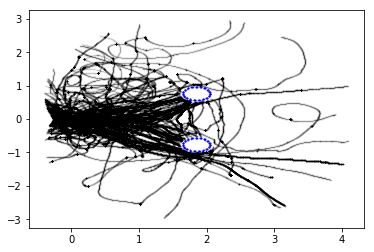

In [16]:

ANGLE = np.round(angle_used*180/math.pi).astype(int)
print('angle between posts:', str(ANGLE))

now= datetime.now()
act_date = now.strftime('%Y-%m-%d')

#trajectories
color = 'black'  # speeds #
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'

if type(color) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)


#posts (approx size)
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
#plt.scatter(dot_x,dot_y, c='red', s=2900)
#plt.scatter(dot_x,-dot_y, c='blue', s=2900)

#limits of x and y axis
#plt.xlim(-0.6,2.3)
#plt.ylim(-2.3,2.3)
#appropriate size of posts in grey lines
plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+dot_x, np.array(ploY)[i]*0.2+dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.2+dot_x, np.array(ploY)[i]*0.2-dot_y, c='blue', s=1, alpha=0.5)
    
#act_date
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+'_all'+ '.png'
#filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+tstart+ '.png'

#speeds[np.where(speeds>4)[0]] = 0
#fig.set_dpi(100)

plt.savefig(filename, dpi=(250))

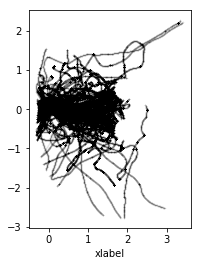

In [430]:


def forceAspect(ax,aspect=1):
    im = ax.get_images()
    extent =  im[0].get_extent()
    ax.set_aspect(abs((extent[5]-extent[1])/(extent[5]-extent[2]))/aspect)

#data = np.random.rand(0,2)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(data)
ax.set_xlabel('xlabel')
ax.set_aspect(1)
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


In [34]:
speeds = np.array(d_v2)[:,0]

In [35]:
#
speeds[np.where(speeds>4)[0]] = 0
speeds[np.where(speeds<0)[0]] = 0


In [36]:
len(speeds)

541630

(array([152644.,  38485.,  44896.,  51614.,  56595.,  54570.,  47813.,
         39658.,  35416.,  19939.]),
 array([0.        , 0.39999897, 0.79999793, 1.1999969 , 1.59999586,
        1.99999483, 2.39999379, 2.79999276, 3.19999172, 3.59999069,
        3.99998966]),
 <a list of 10 Patch objects>)

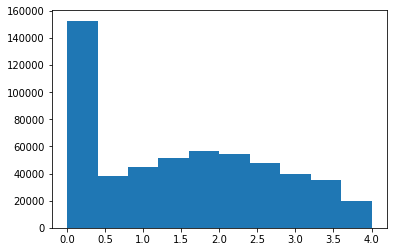

In [37]:
plt.hist(speeds)

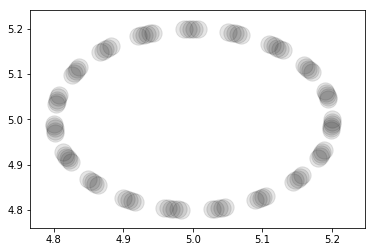

In [38]:
#dot plotting

plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+5, np.array(ploY)[i]*0.2+5, c='black', s=300, alpha=0.1)


In [28]:

df = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0b4dc1ba-58fe-4452-9f75-630dd7cd07a8/results.csv')
df2 = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0cac2ffa-751c-47e2-a60c-a4394f0c3694/results.csv')

df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df2.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df=df.append(df2)

#df, df2

In [29]:
df4 = df[df['nStimuli'] == 4]
df4.head()

,x,y,z,dir,cntr,t,nStimuli
140543,0.953217,-1.785719,-0.07,5.1419,0,720.004008,4
140544,0.000859,-0.001949,-0.07,5.1273,0,720.010600,4
140545,0.000859,-0.001949,-0.07,5.1273,0,720.015738,4
140546,0.000859,-0.001949,-0.07,5.1013,0,720.020855,4
140547,0.000859,-0.001949,-0.07,5.1013,0,720.025957,4


# plotting speed

In [30]:
#taking unrotated x,y values from df3
#if df['nStimuli'][j]== stim:
#print(df3['y'][i])  
#i=10000 

#need of implementation speed in relation to post-distance or starting point distance. otherwise two different locusts 
#plotted on top of each other don't make sense. they need some synchronization which is post-distance?? 
#bifurcation point distance?
window = 150
d_v = []
for i in range(window,(len(df3))): #len(df3)
    d=((((df3['x'][i]-df3['x'][i-window])**2 + (df3['y'][i]-df3['y'][i-window])**2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )

#plt.scatter(np.array(rot)[:,0], np.array(rot)[:,1], c='black', s=1, alpha=0.01)
#plt.scatter(df4['x'], df4['y'], c='black', s=1, alpha=0.01)
    #speed relative to location on x
    d_v.extend([(d*100,df3['x'][i])]) # *100 to get cm/s
    #speed to time
    #d_v.extend([(d*100,df3['t'][i])]) # *100 to get cm/s


In [31]:
#    rot.extend([(rotation(x,y,theta))])
d_v2 =[]
for i in range(window,(len(df3))): #len(df3)
    e=((((rot[i][0]-rot[i-window][0])**2 +       (rot[i][1]-rot[i-window][1]) **2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )
    d_v2.extend([(e*100,rot[i][0])])


(0, 4)

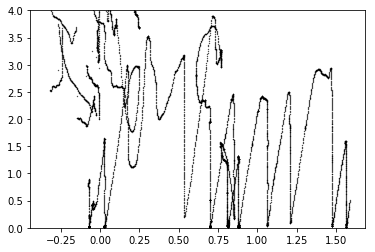

In [32]:
#color can get a list of colors to use for certain ID of the fly /locust

plt.scatter(np.array(d_v2)[50:8000,1], np.array(d_v2)[50:8000,0], c='black', s=0.1, alpha=1)
plt.ylim([0,4])

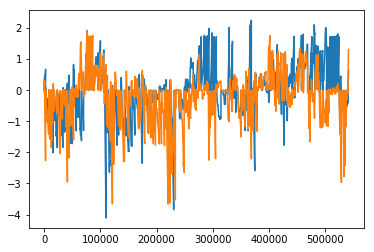

In [33]:
plt.plot(df3['x'][:])
plt.plot(df3['y'][:])
# plt.xlim([8700,11200])

In [79]:
xx = df3['x']
yy = df3['y']
distxxyy = np.sqrt(np.diff(xx)**2+np.diff(yy)**2)
speed = distxxyy/np.diff(tt)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

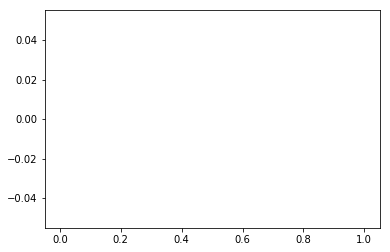

In [80]:
dt = 1/100.0
threshold = np.quantile(distxxyy,0.99)
plt.hist(distxxyy[distxxyy<threshold]/dt)

In [81]:
np.quantile(distxxyy,[0.95,0.99,1])

array([0., 0., 0.])

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 4.095e+04]),
 array([-719.99910998, -647.69426319, -575.38941641, -503.08456962,
        -430.77972283, -358.47487604, -286.17002926, -213.86518247,
        -141.56033568,  -69.2554889 ,    3.04935789]),
 <a list of 10 Patch objects>)

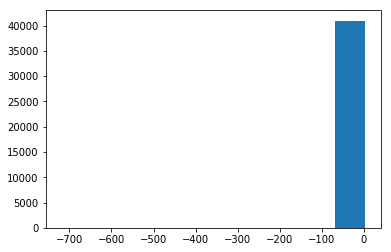

In [82]:
tt  = df3['t']
plt.hist(np.diff(tt))

In [83]:
np.quantile(np.diff(tt),[0.95,0.99,1])

array([0.04771793, 0.05925059, 3.04935789])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

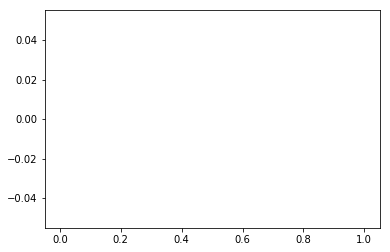

In [84]:
threshold = np.quantile(speed,0.99)
plt.hist(speed[speed<threshold])